In [1]:
# Imports and path definitions

import sys
import os
import plotly.plotly as py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
from itertools import combinations

path = os.getcwd() + '/'

# NEW APPROACH

#### Pre analysis step!

-- hiperfino = 0 
-- Chequear el buen control sobre niveles

#### First trials:
~ Parallel and isotrope hyperfine
Polinomios de intervalos  5/3 puntos de H


# Flow
1. Run your simpre calculation and plot your results.
2. Define a trainning data set region without non-avoided crossings
    - Minimum of 3-5 points (plot your results)
3. Run Poly.py 
4. Run expected_values.py
5. Run main.py

n. of points: 804


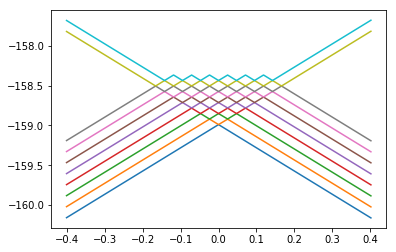

In [12]:
ene_f = path + "simpre.ene"

ene = np.loadtxt(ene_f, dtype= float)

#plt.plot(ene[:,0], ene[:,[1,2,3,4,5,6,7,8]])
plt.plot(ene[:,0], ene[:,[17, 18,19,20, 21, 22, 23, 24,25,26]])#, 9,10, 11, 12, 13, 14, 15, 16]])
#plt.plot(ene[:,0], ene[:,1:])
#plt.savefig('plot_ene.png', dpi = 300)

print 'n. of points: ' + str(len(ene))
plt.show()


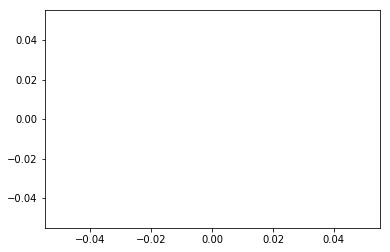

In [15]:
# Evaluate expected values

#plt.plot(expected_df.index, expected_df.iloc[:,1:])
#plt.plot(expected_df.index, expected_df.iloc[:,[8,9,10,]])
plt.plot(expected_df.index, expected_df.iloc[:,[16,17, 18,19,20,21,22,23,24,25]])
#plt.savefig('plot_prev.png', dpi = 300)

#print 'n. of points: ' + str(len(ene_prev))
plt.show()
#print expected_df

In [3]:
#
## Functions module
#

def poly(five_H, five_E): #dataset with set of points: would retrieve 
    #print five_E
    #print five_H
    x = five_H # set campos H (5)
    y = five_E # set valores E (5)
        
    vec_z = np.polyfit(x, y, deg = 2)
    return vec_z
    
    #poli_out = open(path + 'poli.out', 'w')
    #poli_out.write('name\tk0\tk1\tk2\n')
    #poli_out.write(i + '\t' + str(k0) + '\t' + str(k1) + '\t' + str(k2))
    #poli_out.write('\n')
    #poli_out.close()


def expected_E(vec_z, H_v):
    k0 = vec_z[2]
    k1 = vec_z[1]
    k2 = vec_z[0]
    predicted_E = (k2 * (float(H_v)**2)) + (k1 * float(H_v)) + k0
    return predicted_E
    #expec_out.write(str(v) + '\t')


def truncate(f, n):
    '''Truncates/pads a float f to n decimal places without rounding'''
    s = '{}'.format(f)
    if 'e' in s or 'E' in s:
        return '{0:.{1}f}'.format(f, n)
    i, p, d = s.partition('.')
    return '.'.join([i, (d+'0'*n)[:n]])

In [4]:
#
## Initial definitions
#

# Defined by the user so far; automatize for the future
J = float(8)
I = float(7.5)
g_par = 0.0000
g_per = 0.0000

# Lists
tot_lvls = int((2*J + 1)*(2*I + 1))
m_j = list(range(int(-(2*J)), int((2*J+2)), int(2)))
m_i = list(range(int(-(2*I)), int((2*I+2)), int(2)))

lvls_list = []
for i in list(range(np.size(ene, axis=1)-1)):
    lvls_list.append('lvl_'+ str(i+1))

## Generate projections list from m_j and m_i
projections_l = []
for j in m_j:
    for i in m_i:
        proj = str(j) + '/' + str(i)
        projections_l.append(proj)



In [11]:
#
##
### Loading datasets
##
#

# Loads polynomios file
#with open(path + 'poli.out', 'r') as poli_f:
#    poli_df = pd.read_csv(poli_f, sep='\t', header=0, index_col=0)#, dtype=float)


# Loads new 'simpre.ene' file with energies of each level (quantum number) at diff H field
with open(path + 'simpre.ene', 'r') as ene_f:
    ene = np.loadtxt(ene_f, dtype= float)
    ene_df = pd.DataFrame(data=ene[0:,1:],  index=ene[0:,0] , columns=lvls_list)

if float(0.0) in ene_df.index:
    ene_df = ene_df.drop([0.0])
    


# Creating an empty DF for further lvl ordering
H_values = ene_df.index
expected_df = pd.DataFrame(index=H_values, columns=lvls_list)
final_df = pd.DataFrame(index=H_values, columns=lvls_list)
order_df = pd.DataFrame(index=H_values, columns=lvls_list)

# Fill first 5 positions of order_df
c = 0
for i in lvls_list:
    c=0
    for i2 in H_values:
        c+=1
        if c < 6 :
            order_df.loc[i2, i] = i.replace('lvl_' , '')

            

print order_df

         lvl_1 lvl_2 lvl_3 lvl_4 lvl_5 lvl_6 lvl_7 lvl_8 lvl_9 lvl_10  ...    \
-0.40101     1     2     3     4     5     6     7     8     9     10  ...     
-0.40001     1     2     3     4     5     6     7     8     9     10  ...     
-0.39901     1     2     3     4     5     6     7     8     9     10  ...     
-0.39801     1     2     3     4     5     6     7     8     9     10  ...     
-0.39701     1     2     3     4     5     6     7     8     9     10  ...     
-0.39601   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN    NaN  ...     
-0.39501   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN    NaN  ...     
-0.39401   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN    NaN  ...     
-0.39301   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN    NaN  ...     
-0.39201   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN    NaN  ...     
-0.39101   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN    NaN  ...     
-0.39001   NaN   NaN   NaN   NaN   NaN  

In [10]:
print H_values
print H_values[282]

Float64Index([-0.40101, -0.40001, -0.39901, -0.39801, -0.39701, -0.39601,
              -0.39501, -0.39401, -0.39301, -0.39201,
              ...
               0.39299,  0.39399,  0.39499,  0.39599,  0.39699,  0.39799,
               0.39899,  0.39999,  0.40099,  0.40199],
             dtype='float64', length=804)
-0.11901


In [6]:
#
##
### Loading datasets
##
#

# Loads polynomios file
#with open(path + 'poli.out', 'r') as poli_f:
#    poli_df = pd.read_csv(poli_f, sep='\t', header=0, index_col=0)#, dtype=float)


test_list = []

# Loads new 'simpre.ene' file with energies of each level (quantum number) at diff H field
with open(path + 'simpre.ene', 'r') as ene_f:
    ene = np.loadtxt(ene_f, dtype= float)
    ene_df = pd.DataFrame(data=ene[0:,1:],  index=ene[0:,0] , columns=lvls_list)

if float(0.0) in ene_df.index:
    ene_df = ene_df.drop([0.0])
    


# Creating an empty DF for further lvl ordering
H_values = ene_df.index
expected_df = pd.DataFrame(index=H_values, columns=lvls_list)
final_df = pd.DataFrame(index=H_values, columns=lvls_list)
order_df = pd.DataFrame(index=H_values, columns=lvls_list)

# Fill first 5 positions of order_df
c = 0
for i in lvls_list:
    c=0
    for i2 in H_values:
        c+=1
        if c < 6 :
            order_df.loc[i2, i] = i.replace('lvl_' , '')


            
            
# Open out files
expec_out = open('expected_values.out', 'w')
poli_out = open('poli.out', 'w')

#
##
### Main loop
##
#

#print order_df

n = 0
col = 0
row = 0
for i0 in lvls_list:

    c0 = 0
    c1=0
    
    n+= 1
    
    five_H = []
    five_E = []
    d_poli = {}
    
    poli_out.write(i0 + '\n' )
    
    
    for i1 in H_values:
        print i1
        c0 += 1
        c1 += 1     
        
        # Rellenar listas
        five_H.append(i1)
        
        pos = float(order_df.loc[i1, i0])
        #col = int(pos)-1
        #row = int(c1)-1
        #five_E.append(ene_df.iloc[row, col])
        
        
        if math.isnan(pos):
            print 'isnull'
            five_E.append(v0)
            print five_E
        
        else:
            
            col = int(pos)-1
            row = int(c1)-1
            print col
            print row
            five_E.append(ene_df.iloc[row, col])
        
        
        # Everything starts now......
        if len(five_H) ==5:
            
            # Fitting
            vec_poly = poly(five_H, five_E)
            p = np.poly1d(vec_poly)
            d_poli[i1] = p
            poli_out.write('H: ' + str(H_values[c1-1]) + ' ' + str(p) +'\n') #+ ' ' + five_H + ' ' + five_E + '\n')
            
            
            if c1 == len(H_values):
                continue
            
            else:
                
                H_next = float(H_values[c1])
                
                # Calculates expected_v for the next H value
                v0 = float(expected_E(vec_poly, H_next))
                v1 = round(v0,6)
                v2 = round(v0,5)
                v3 = round(v0,4)
                v4 = round(v0,3)
                v1 = truncate(v1, 6)
                v2 = truncate(v2, 5)
                v3 = truncate(v3, 4)
                v4 = truncate(v4, 3)
                #v5 = truncate(v5, 2)

                expected_df.loc[H_next, i0] = v1


                # Search expected values in ene_df
                e0 = float(ene_df.loc[H_next, i0])
                e1 = round(e0,6)
                e2 = round(e0,5)
                e3 = round(e0,4)
                e4 = round(e0,3)
                e1 = truncate(e1, 6)
                e2 = truncate(e2, 5)
                e3 = truncate(e3, 4)
                e4 = truncate(e4, 3)
                
                print 'aqui v0: ' + str(v0)
                print 'aqui e0: ' + str(e0)
                print 'aqui v1: ' + str(v1)
                print 'aqui e1: ' + str(e1)
                print 'aqui v2: ' + str(v2)
                print 'aqui e2: ' + str(e2)
                print 'aqui v3: ' + str(v3)
                print 'aqui e3: ' + str(e3)
                print 'aqui v4: ' + str(v4)
                print 'aqui e4: ' + str(e4)

                if v1 == e1:
                    order_df.loc[H_next, i0] = i0.replace('lvl_', '')
                    #ene_df.loc[i1, i0] = 'u'
                    print 'valor exacto'
                    

                else:
                    if v2 == e2:
                        order_df.loc[H_next, i0] = i0.replace('lvl_', '')
                        #ene_df.loc[i1, i0] = 'u'
                        print 'valor exacto-2'
                
                    else:
                        if v3 == e3:
                            order_df.loc[H_next, i0] = i0.replace('lvl_', '')
                            #ene_df.loc[i1, i0] = 'u'
                            print 'valor exacto-3'
                
                        else:
                            
                            print v1
                            print e1
                            print ene_df.loc[H_next]

                            c4 = 0

                            for i3 in lvls_list:
                                c4 += 1

                                if ene_df.loc[H_next, i3] == 'u':
                                    continue
                                    
                                else:
                                    
                                    e0_2 = float(ene_df.loc[H_next, i3])
                                    e1_2 = round(e0_2,6)
                                    e2_2 = round(e0_2,5)
                                    e3_2 = round(e0_2,4)
                                    e4_2 = round(e0_2,3)
                                    e1_2 = truncate(e1_2, 6)
                                    e2_2 = truncate(e2_2, 5)
                                    e3_2 = truncate(e3_2, 4)
                                    e4_2 = truncate(e4_2, 3)



                                    if v1 == e1_2:
                                        order_df.loc[H_next, i0] = c4
                                        print 'yes 1'


                                    else:
                                        if v2 == e2_2:
                                            order_df.loc[H_next, i0] = c4
                                            print c4
                                            print 'yes 2'


                                        else:
                                            if v3 == e3_2:
                                                order_df.loc[H_next, i0] = c4
                                                print c4
                                                print 'yes 3'



                c0 = c0-1
                five_E.pop(0)
                five_H.pop(0)
    
    poli_out.write('\n')
#print expected_df

order_df.to_csv(path + 'order.txt', header = lvls_list, sep=' ', na_rep='na')
expected_df.to_csv(path + 'expected.txt', header = lvls_list, sep=' ', na_rep='na')
    
## Condition 1 : compare pends (k1)
   
## Condition 2 : compare second derivative (k2)
    
## Condition 3 : allowed/non-allowed transitions (+/- 1) 
expec_out.close()
poli_out.close()

-0.40101
0
0
-0.40001
0
1
-0.39901
0
2
-0.39801
0
3
-0.39701
0
4
aqui v0: -176.73715994
aqui e0: -176.7371599
aqui v1: -176.737160
aqui e1: -176.737160
aqui v2: -176.73716
aqui e2: -176.73716
aqui v3: -176.7372
aqui e3: -176.7372
aqui v4: -176.737
aqui e4: -176.737
valor exacto
-0.39601
0
5
aqui v0: -176.73484236
aqui e0: -176.7348424
aqui v1: -176.734842
aqui e1: -176.734842
aqui v2: -176.73484
aqui e2: -176.73484
aqui v3: -176.7348
aqui e3: -176.7348
aqui v4: -176.735
aqui e4: -176.735
valor exacto
-0.39501
0
6
aqui v0: -176.73252494
aqui e0: -176.7325249
aqui v1: -176.732525
aqui e1: -176.732525
aqui v2: -176.73252
aqui e2: -176.73252
aqui v3: -176.7325
aqui e3: -176.7325
aqui v4: -176.733
aqui e4: -176.733
valor exacto
-0.39401
0
7
aqui v0: -176.73020746
aqui e0: -176.7302075
aqui v1: -176.730207
aqui e1: -176.730208
aqui v2: -176.73021
aqui e2: -176.73021
aqui v3: -176.7302
aqui e3: -176.7302
aqui v4: -176.730
aqui e4: -176.730
valor exacto-2
-0.39301
0
8
aqui v0: -176.72789014
aq

0
45
aqui v0: -176.64219104
aqui e0: -176.6421911
aqui v1: -176.642191
aqui e1: -176.642191
aqui v2: -176.64219
aqui e2: -176.64219
aqui v3: -176.6422
aqui e3: -176.6422
aqui v4: -176.642
aqui e4: -176.642
valor exacto
-0.35501
0
46
aqui v0: -176.63987614
aqui e0: -176.6398762
aqui v1: -176.639876
aqui e1: -176.639876
aqui v2: -176.63988
aqui e2: -176.63988
aqui v3: -176.6399
aqui e3: -176.6399
aqui v4: -176.640
aqui e4: -176.640
valor exacto
-0.35401
0
47
aqui v0: -176.6375614
aqui e0: -176.6375613
aqui v1: -176.637561
aqui e1: -176.637561
aqui v2: -176.63756
aqui e2: -176.63756
aqui v3: -176.6376
aqui e3: -176.6376
aqui v4: -176.638
aqui e4: -176.638
valor exacto
-0.35301
0
48
aqui v0: -176.63524652
aqui e0: -176.6352464
aqui v1: -176.635247
aqui e1: -176.635246
aqui v2: -176.63525
aqui e2: -176.63525
aqui v3: -176.6352
aqui e3: -176.6352
aqui v4: -176.635
aqui e4: -176.635
valor exacto-2
-0.35201
0
49
aqui v0: -176.63293156
aqui e0: -176.6329317
aqui v1: -176.632932
aqui e1: -176.63

valor exacto
-0.31501
0
86
aqui v0: -176.5473395
aqui e0: -176.5473395
aqui v1: -176.547339
aqui e1: -176.547339
aqui v2: -176.54734
aqui e2: -176.54734
aqui v3: -176.5473
aqui e3: -176.5473
aqui v4: -176.547
aqui e4: -176.547
valor exacto
-0.31401
0
87
aqui v0: -176.5450278
aqui e0: -176.5450278
aqui v1: -176.545028
aqui e1: -176.545028
aqui v2: -176.54503
aqui e2: -176.54503
aqui v3: -176.5450
aqui e3: -176.5450
aqui v4: -176.545
aqui e4: -176.545
valor exacto
-0.31301
0
88
aqui v0: -176.5427162
aqui e0: -176.5427161
aqui v1: -176.542716
aqui e1: -176.542716
aqui v2: -176.54272
aqui e2: -176.54272
aqui v3: -176.5427
aqui e3: -176.5427
aqui v4: -176.543
aqui e4: -176.543
valor exacto
-0.31201
0
89
aqui v0: -176.54040452
aqui e0: -176.5404045
aqui v1: -176.540405
aqui e1: -176.540404
aqui v2: -176.54040
aqui e2: -176.54040
aqui v3: -176.5404
aqui e3: -176.5404
aqui v4: -176.540
aqui e4: -176.540
valor exacto-2
-0.31101
0
90
aqui v0: -176.53809294
aqui e0: -176.5380931
aqui v1: -176.538

aqui v0: -176.4526373
aqui e0: -176.4526372
aqui v1: -176.452637
aqui e1: -176.452637
aqui v2: -176.45264
aqui e2: -176.45264
aqui v3: -176.4526
aqui e3: -176.4526
aqui v4: -176.453
aqui e4: -176.453
valor exacto
-0.27301
0
128
aqui v0: -176.45032958
aqui e0: -176.4503296
aqui v1: -176.450330
aqui e1: -176.450330
aqui v2: -176.45033
aqui e2: -176.45033
aqui v3: -176.4503
aqui e3: -176.4503
aqui v4: -176.450
aqui e4: -176.450
valor exacto
-0.27201
0
129
aqui v0: -176.44802202
aqui e0: -176.4480222
aqui v1: -176.448022
aqui e1: -176.448022
aqui v2: -176.44802
aqui e2: -176.44802
aqui v3: -176.4480
aqui e3: -176.4480
aqui v4: -176.448
aqui e4: -176.448
valor exacto
-0.27101
0
130
aqui v0: -176.44571488
aqui e0: -176.4457148
aqui v1: -176.445715
aqui e1: -176.445715
aqui v2: -176.44571
aqui e2: -176.44571
aqui v3: -176.4457
aqui e3: -176.4457
aqui v4: -176.446
aqui e4: -176.446
valor exacto
-0.27001
0
131
aqui v0: -176.44340764
aqui e0: -176.4434075
aqui v1: -176.443408
aqui e1: -176.44340

valor exacto
-0.23201
0
169
aqui v0: -176.35582732
aqui e0: -176.3558272
aqui v1: -176.355827
aqui e1: -176.355827
aqui v2: -176.35583
aqui e2: -176.35583
aqui v3: -176.3558
aqui e3: -176.3558
aqui v4: -176.356
aqui e4: -176.356
valor exacto
-0.23101
0
170
aqui v0: -176.35352516
aqui e0: -176.3535253
aqui v1: -176.353525
aqui e1: -176.353525
aqui v2: -176.35353
aqui e2: -176.35353
aqui v3: -176.3535
aqui e3: -176.3535
aqui v4: -176.354
aqui e4: -176.354
valor exacto
-0.23001
0
171
aqui v0: -176.35122346
aqui e0: -176.3512234
aqui v1: -176.351223
aqui e1: -176.351223
aqui v2: -176.35122
aqui e2: -176.35122
aqui v3: -176.3512
aqui e3: -176.3512
aqui v4: -176.351
aqui e4: -176.351
valor exacto
-0.22901
0
172
aqui v0: -176.34892174
aqui e0: -176.3489217
aqui v1: -176.348922
aqui e1: -176.348922
aqui v2: -176.34892
aqui e2: -176.34892
aqui v3: -176.3489
aqui e3: -176.3489
aqui v4: -176.349
aqui e4: -176.349
valor exacto
-0.22801
0
173
aqui v0: -176.34662014
aqui e0: -176.3466202
aqui v1: -1

aqui v0: -176.266176
aqui e0: -176.266176
aqui v1: -176.266176
aqui e1: -176.266176
aqui v2: -176.26618
aqui e2: -176.26618
aqui v3: -176.2662
aqui e3: -176.2662
aqui v4: -176.266
aqui e4: -176.266
valor exacto
-0.19201
0
209
aqui v0: -176.263881
aqui e0: -176.263881
aqui v1: -176.263881
aqui e1: -176.263881
aqui v2: -176.26388
aqui e2: -176.26388
aqui v3: -176.2639
aqui e3: -176.2639
aqui v4: -176.264
aqui e4: -176.264
valor exacto
-0.19101
0
210
aqui v0: -176.2615862
aqui e0: -176.2615863
aqui v1: -176.261586
aqui e1: -176.261586
aqui v2: -176.26159
aqui e2: -176.26159
aqui v3: -176.2616
aqui e3: -176.2616
aqui v4: -176.262
aqui e4: -176.262
valor exacto
-0.19001
0
211
aqui v0: -176.25929178
aqui e0: -176.2592917
aqui v1: -176.259292
aqui e1: -176.259292
aqui v2: -176.25929
aqui e2: -176.25929
aqui v3: -176.2593
aqui e3: -176.2593
aqui v4: -176.259
aqui e4: -176.259
valor exacto
-0.18901
0
212
aqui v0: -176.25699738
aqui e0: -176.2569974
aqui v1: -176.256997
aqui e1: -176.256997
aqui

aqui v3: -176.1586
aqui e3: -176.1586
aqui v4: -176.159
aqui e4: -176.159
valor exacto
-0.14501
0
256
aqui v0: -176.15628738
aqui e0: -176.1562874
aqui v1: -176.156287
aqui e1: -176.156287
aqui v2: -176.15629
aqui e2: -176.15629
aqui v3: -176.1563
aqui e3: -176.1563
aqui v4: -176.156
aqui e4: -176.156
valor exacto
-0.14401
0
257
aqui v0: -176.1540048
aqui e0: -176.1540048
aqui v1: -176.154005
aqui e1: -176.154005
aqui v2: -176.15400
aqui e2: -176.15400
aqui v3: -176.1540
aqui e3: -176.1540
aqui v4: -176.154
aqui e4: -176.154
valor exacto
-0.14301
0
258
aqui v0: -176.15172256
aqui e0: -176.1517225
aqui v1: -176.151723
aqui e1: -176.151723
aqui v2: -176.15172
aqui e2: -176.15172
aqui v3: -176.1517
aqui e3: -176.1517
aqui v4: -176.152
aqui e4: -176.152
valor exacto
-0.14201
0
259
aqui v0: -176.1494405
aqui e0: -176.1494405
aqui v1: -176.149440
aqui e1: -176.149440
aqui v2: -176.14944
aqui e2: -176.14944
aqui v3: -176.1494
aqui e3: -176.1494
aqui v4: -176.149
aqui e4: -176.149
valor exacto

valor exacto
-0.10901
0
292
aqui v0: -176.0743376
aqui e0: -176.0743377
aqui v1: -176.074338
aqui e1: -176.074338
aqui v2: -176.07434
aqui e2: -176.07434
aqui v3: -176.0743
aqui e3: -176.0743
aqui v4: -176.074
aqui e4: -176.074
valor exacto
-0.10801
0
293
aqui v0: -176.07206874
aqui e0: -176.0720687
aqui v1: -176.072069
aqui e1: -176.072069
aqui v2: -176.07207
aqui e2: -176.07207
aqui v3: -176.0721
aqui e3: -176.0721
aqui v4: -176.072
aqui e4: -176.072
valor exacto
-0.10701
0
294
aqui v0: -176.06980016
aqui e0: -176.0698002
aqui v1: -176.069800
aqui e1: -176.069800
aqui v2: -176.06980
aqui e2: -176.06980
aqui v3: -176.0698
aqui e3: -176.0698
aqui v4: -176.070
aqui e4: -176.070
valor exacto
-0.10601
0
295
aqui v0: -176.06753214
aqui e0: -176.0675321
aqui v1: -176.067532
aqui e1: -176.067532
aqui v2: -176.06753
aqui e2: -176.06753
aqui v3: -176.0675
aqui e3: -176.0675
aqui v4: -176.068
aqui e4: -176.068
valor exacto
-0.10501
0
296
aqui v0: -176.06526446
aqui e0: -176.0652645
aqui v1: -17

aqui v0: -175.98173894
aqui e0: -175.981739
aqui v1: -175.981739
aqui e1: -175.981739
aqui v2: -175.98174
aqui e2: -175.98174
aqui v3: -175.9817
aqui e3: -175.9817
aqui v4: -175.982
aqui e4: -175.982
valor exacto
-0.06701
0
334
aqui v0: -175.9794933
aqui e0: -175.9794933
aqui v1: -175.979493
aqui e1: -175.979493
aqui v2: -175.97949
aqui e2: -175.97949
aqui v3: -175.9795
aqui e3: -175.9795
aqui v4: -175.979
aqui e4: -175.979
valor exacto
-0.06601
0
335
aqui v0: -175.9772483
aqui e0: -175.9772483
aqui v1: -175.977248
aqui e1: -175.977248
aqui v2: -175.97725
aqui e2: -175.97725
aqui v3: -175.9772
aqui e3: -175.9772
aqui v4: -175.977
aqui e4: -175.977
valor exacto
-0.06501
0
336
aqui v0: -175.975004
aqui e0: -175.9750041
aqui v1: -175.975004
aqui e1: -175.975004
aqui v2: -175.97500
aqui e2: -175.97500
aqui v3: -175.9750
aqui e3: -175.9750
aqui v4: -175.975
aqui e4: -175.975
valor exacto
-0.06401
0
337
aqui v0: -175.97276058
aqui e0: -175.9727605
aqui v1: -175.972761
aqui e1: -175.972760
aq

aqui e1: -175.901415
aqui v2: -175.90142
aqui e2: -175.90142
aqui v3: -175.9014
aqui e3: -175.9014
aqui v4: -175.901
aqui e4: -175.901
valor exacto
-0.03101
0
370
aqui v0: -175.89920164
aqui e0: -175.8992018
aqui v1: -175.899202
aqui e1: -175.899202
aqui v2: -175.89920
aqui e2: -175.89920
aqui v3: -175.8992
aqui e3: -175.8992
aqui v4: -175.899
aqui e4: -175.899
valor exacto
-0.03001
0
371
aqui v0: -175.89698958
aqui e0: -175.8969896
aqui v1: -175.896990
aqui e1: -175.896990
aqui v2: -175.89699
aqui e2: -175.89699
aqui v3: -175.8970
aqui e3: -175.8970
aqui v4: -175.897
aqui e4: -175.897
valor exacto
-0.02901
0
372
aqui v0: -175.89477856
aqui e0: -175.8947785
aqui v1: -175.894779
aqui e1: -175.894779
aqui v2: -175.89478
aqui e2: -175.89478
aqui v3: -175.8948
aqui e3: -175.8948
aqui v4: -175.895
aqui e4: -175.895
valor exacto
-0.02801
0
373
aqui v0: -175.89256856
aqui e0: -175.8925686
aqui v1: -175.892569
aqui e1: -175.892569
aqui v2: -175.89257
aqui e2: -175.89257
aqui v3: -175.8926
aqui

aqui v0: -175.82690676
aqui e0: -175.8398846
aqui v1: -175.826907
aqui e1: -175.839885
aqui v2: -175.82691
aqui e2: -175.83988
aqui v3: -175.8269
aqui e3: -175.8399
aqui v4: -175.827
aqui e4: -175.840
-175.826907
-175.839885
lvl_1    -175.839885
lvl_2    -175.826907
lvl_3    -175.739125
lvl_4    -175.726914
lvl_5    -175.647699
lvl_6    -175.637439
lvl_7    -175.581901
lvl_8    -175.577158
lvl_9    -175.256128
lvl_10   -175.251384
lvl_11   -175.195847
lvl_12   -175.185587
lvl_13   -175.106372
lvl_14   -175.094161
lvl_15   -175.006379
lvl_16   -174.993402
lvl_17   -158.997571
lvl_18   -158.980130
lvl_19   -158.859129
lvl_20   -158.841687
lvl_21   -158.720686
lvl_22   -158.703244
lvl_23   -158.582244
lvl_24   -158.564802
lvl_25   -158.443801
lvl_26   -158.426359
Name: 0.00299, dtype: float64
yes 1
0.00299
1
404
aqui v0: -175.82474298
aqui e0: -175.8420608
aqui v1: -175.824743
aqui e1: -175.842061
aqui v2: -175.82474
aqui e2: -175.84206
aqui v3: -175.8247
aqui e3: -175.8421
aqui v4: -175.

aqui e0: -175.8792905
aqui v1: -175.788270
aqui e1: -175.879290
aqui v2: -175.78827
aqui e2: -175.87929
aqui v3: -175.7883
aqui e3: -175.8793
aqui v4: -175.788
aqui e4: -175.879
-175.788270
-175.879290
lvl_1    -175.879290
lvl_2    -175.788270
lvl_3    -175.776645
lvl_4    -175.691163
lvl_5    -175.680633
lvl_6    -175.609378
lvl_7    -175.601877
lvl_8    -175.569821
lvl_9    -175.263464
lvl_10   -175.231409
lvl_11   -175.223908
lvl_12   -175.152653
lvl_13   -175.142123
lvl_14   -175.056642
lvl_15   -175.045016
lvl_16   -174.953996
lvl_17   -159.050072
lvl_18   -158.927630
lvl_19   -158.911629
lvl_20   -158.789187
lvl_21   -158.773186
lvl_22   -158.650744
lvl_23   -158.634743
lvl_24   -158.512302
lvl_25   -158.496301
lvl_26   -158.373859
Name: 0.02099, dtype: float64
yes 1
0.02099
1
422
aqui v0: -175.78614532
aqui e0: -175.881493
aqui v1: -175.786145
aqui e1: -175.881493
aqui v2: -175.78615
aqui e2: -175.88149
aqui v3: -175.7861
aqui e3: -175.8815
aqui v4: -175.786
aqui e4: -175.881
-1

0.03099
2
432
aqui v0: -175.76504226
aqui e0: -175.9035853
aqui v1: -175.765042
aqui e1: -175.903585
aqui v2: -175.76504
aqui e2: -175.90359
aqui v3: -175.7650
aqui e3: -175.9036
aqui v4: -175.765
aqui e4: -175.904
-175.765042
-175.903585
lvl_1    -175.903585
lvl_2    -175.800031
lvl_3    -175.765042
lvl_4    -175.701934
lvl_5    -175.670260
lvl_6    -175.617458
lvl_7    -175.594946
lvl_8    -175.570895
lvl_9    -175.262390
lvl_10   -175.238339
lvl_11   -175.215828
lvl_12   -175.163026
lvl_13   -175.131352
lvl_14   -175.068244
lvl_15   -175.033255
lvl_16   -174.929701
lvl_17   -159.082155
lvl_18   -158.943712
lvl_19   -158.895546
lvl_20   -158.805269
lvl_21   -158.757104
lvl_22   -158.666827
lvl_23   -158.618661
lvl_24   -158.528384
lvl_25   -158.480219
lvl_26   -158.389942
Name: 0.03199, dtype: float64
yes 1
0.03199
2
433
aqui v0: -175.7629478
aqui e0: -175.9058009
aqui v1: -175.762948
aqui e1: -175.905801
aqui v2: -175.76295
aqui e2: -175.90580
aqui v3: -175.7629
aqui e3: -175.9058
a

-175.729894
-175.941389
lvl_1    -175.941389
lvl_2    -175.836697
lvl_3    -175.736118
lvl_4    -175.729894
lvl_5    -175.645147
lvl_6    -175.639917
lvl_7    -175.580641
lvl_8    -175.578222
lvl_9    -175.255063
lvl_10   -175.252644
lvl_11   -175.193368
lvl_12   -175.188138
lvl_13   -175.103392
lvl_14   -175.097168
lvl_15   -174.996589
lvl_16   -174.891898
lvl_17   -159.131738
lvl_18   -158.993295
lvl_19   -158.854853
lvl_20   -158.845963
lvl_21   -158.716410
lvl_22   -158.707520
lvl_23   -158.577967
lvl_24   -158.569078
lvl_25   -158.439525
lvl_26   -158.430635
Name: 0.04899, dtype: float64
yes 1
0.04899
3
450
aqui v0: -175.72786014
aqui e0: -175.9436209
aqui v1: -175.727860
aqui e1: -175.943621
aqui v2: -175.72786
aqui e2: -175.94362
aqui v3: -175.7279
aqui e3: -175.9436
aqui v4: -175.728
aqui e4: -175.944
-175.727860
-175.943621
lvl_1    -175.943621
lvl_2    -175.838871
lvl_3    -175.738168
lvl_4    -175.727860
lvl_5    -175.646885
lvl_6    -175.638224
lvl_7    -175.581494
lvl_8   

aqui v0: -175.69206608
aqui e0: -175.9839405
aqui v1: -175.692066
aqui e1: -175.983940
aqui v2: -175.69207
aqui e2: -175.98394
aqui v3: -175.6921
aqui e3: -175.9839
aqui v4: -175.692
aqui e4: -175.984
-175.692066
-175.983940
lvl_1    -175.983940
lvl_2    -175.878265
lvl_3    -175.775660
lvl_4    -175.692066
lvl_5    -175.679748
lvl_6    -175.610041
lvl_7    -175.601266
lvl_8    -175.569871
lvl_9    -175.263415
lvl_10   -175.232019
lvl_11   -175.223245
lvl_12   -175.153538
lvl_13   -175.141219
lvl_14   -175.057626
lvl_15   -174.955022
lvl_16   -174.849346
lvl_17   -159.187155
lvl_18   -159.048712
lvl_19   -158.910269
lvl_20   -158.790546
lvl_21   -158.771827
lvl_22   -158.652104
lvl_23   -158.633384
lvl_24   -158.513661
lvl_25   -158.494942
lvl_26   -158.375219
Name: 0.06799, dtype: float64
yes 1
0.06799
3
469
aqui v0: -175.69012926
aqui e0: -175.9861876
aqui v1: -175.690129
aqui e1: -175.986188
aqui v2: -175.69013
aqui e2: -175.98619
aqui v3: -175.6901
aqui e3: -175.9862
aqui v4: -175.

aqui v0: -175.67299536
aqui e0: -176.0064415
aqui v1: -175.672995
aqui e1: -176.006441
aqui v2: -175.67300
aqui e2: -176.00644
aqui v3: -175.6730
aqui e3: -176.0064
aqui v4: -175.673
aqui e4: -176.006
-175.672995
-176.006441
lvl_1    -176.006441
lvl_2    -175.900339
lvl_3    -175.796897
lvl_4    -175.699053
lvl_5    -175.672996
lvl_6    -175.615261
lvl_7    -175.596725
lvl_8    -175.570505
lvl_9    -175.262780
lvl_10   -175.236560
lvl_11   -175.218025
lvl_12   -175.160290
lvl_13   -175.134233
lvl_14   -175.036389
lvl_15   -174.932947
lvl_16   -174.826845
lvl_17   -159.216322
lvl_18   -159.077879
lvl_19   -158.939436
lvl_20   -158.800993
lvl_21   -158.761380
lvl_22   -158.662551
lvl_23   -158.622937
lvl_24   -158.524108
lvl_25   -158.484495
lvl_26   -158.385666
Name: 0.07799, dtype: float64
5
yes 2
0.07799
4
479
aqui v0: -175.67112738
aqui e0: -176.0086951
aqui v1: -175.671127
aqui e1: -176.008695
aqui v2: -175.67113
aqui e2: -176.00870
aqui v3: -175.6711
aqui e3: -176.0087
aqui v4: -17

aqui v0: -175.65468498
aqui e0: -176.0290047
aqui v1: -175.654685
aqui e1: -176.029005
aqui v2: -175.65468
aqui e2: -176.02900
aqui v3: -175.6547
aqui e3: -176.0290
aqui v4: -175.655
aqui e4: -176.029
-175.654685
-176.029005
lvl_1    -176.029005
lvl_2    -175.922527
lvl_3    -175.818366
lvl_4    -175.718927
lvl_5    -175.654685
lvl_6    -175.630888
lvl_7    -175.585597
lvl_8    -175.574622
lvl_9    -175.258663
lvl_10   -175.247689
lvl_11   -175.202398
lvl_12   -175.178600
lvl_13   -175.114359
lvl_14   -175.014920
lvl_15   -174.910760
lvl_16   -174.804282
lvl_17   -159.245488
lvl_18   -159.107046
lvl_19   -158.968603
lvl_20   -158.830160
lvl_21   -158.732213
lvl_22   -158.691717
lvl_23   -158.593770
lvl_24   -158.553275
lvl_25   -158.455328
lvl_26   -158.414832
Name: 0.08799, dtype: float64
yes 1
0.08799
4
489
aqui v0: -175.65290252
aqui e0: -176.0312642
aqui v1: -175.652903
aqui e1: -176.031264
aqui v2: -175.65290
aqui e2: -176.03126
aqui v3: -175.6529
aqui e3: -176.0313
aqui v4: -175.

498
aqui v0: -175.63732428
aqui e0: -176.0516236
aqui v1: -175.637324
aqui e1: -176.051624
aqui v2: -175.63732
aqui e2: -176.05162
aqui v3: -175.6373
aqui e3: -176.0516
aqui v4: -175.637
aqui e4: -176.052
-175.637324
-176.051624
lvl_1    -176.051624
lvl_2    -175.944813
lvl_3    -175.840032
lvl_4    -175.739264
lvl_5    -175.647818
lvl_6    -175.637325
lvl_7    -175.581961
lvl_8    -175.577110
lvl_9    -175.256176
lvl_10   -175.251325
lvl_11   -175.195961
lvl_12   -175.185468
lvl_13   -175.094022
lvl_14   -174.993254
lvl_15   -174.888473
lvl_16   -174.781663
lvl_17   -159.274655
lvl_18   -159.136212
lvl_19   -158.997770
lvl_20   -158.859327
lvl_21   -158.720884
lvl_22   -158.703046
lvl_23   -158.582441
lvl_24   -158.564604
lvl_25   -158.443999
lvl_26   -158.426161
Name: 0.09799, dtype: float64
6
yes 3
0.09799
5
499
aqui v0: -175.63564922
aqui e0: -176.0538883
aqui v1: -175.635649
aqui e1: -176.053888
aqui v2: -175.63565
aqui e2: -176.05389
aqui v3: -175.6356
aqui e3: -176.0539
aqui v4:

-176.074292
lvl_1    -176.074292
lvl_2    -175.967186
lvl_3    -175.861867
lvl_4    -175.759983
lvl_5    -175.665784
lvl_6    -175.621156
lvl_7    -175.592118
lvl_8    -175.571701
lvl_9    -175.261585
lvl_10   -175.241167
lvl_11   -175.212130
lvl_12   -175.167502
lvl_13   -175.073303
lvl_14   -174.971419
lvl_15   -174.866100
lvl_16   -174.758995
lvl_17   -159.303822
lvl_18   -159.165379
lvl_19   -159.026936
lvl_20   -158.888493
lvl_21   -158.750051
lvl_22   -158.673880
lvl_23   -158.611608
lvl_24   -158.535437
lvl_25   -158.473166
lvl_26   -158.396995
Name: 0.10799, dtype: float64
6
yes 2
0.10799
5
509
aqui v0: -175.61961528
aqui e0: -176.0765618
aqui v1: -175.619615
aqui e1: -176.076562
aqui v2: -175.61962
aqui e2: -176.07656
aqui v3: -175.6196
aqui e3: -176.0766
aqui v4: -175.620
aqui e4: -176.077
-175.619615
-176.076562
lvl_1    -176.076562
lvl_2    -175.969428
lvl_3    -175.864059
lvl_4    -175.762073
lvl_5    -175.667629
lvl_6    -175.619616
lvl_7    -175.593271
lvl_8    -175.5713

aqui v0: -175.60511174
aqui e0: -176.0992796
aqui v1: -175.605112
aqui e1: -176.099280
aqui v2: -175.60511
aqui e2: -176.09928
aqui v3: -175.6051
aqui e3: -176.0993
aqui v4: -175.605
aqui e4: -176.099
-175.605112
-176.099280
lvl_1    -176.099280
lvl_2    -175.991885
lvl_3    -175.886052
lvl_4    -175.783136
lvl_5    -175.686497
lvl_6    -175.606002
lvl_7    -175.605113
lvl_8    -175.569689
lvl_9    -175.263596
lvl_10   -175.228173
lvl_11   -175.227284
lvl_12   -175.146789
lvl_13   -175.050150
lvl_14   -174.947235
lvl_15   -174.841402
lvl_16   -174.734007
lvl_17   -159.335905
lvl_18   -159.197462
lvl_19   -159.059020
lvl_20   -158.920577
lvl_21   -158.782134
lvl_22   -158.643691
lvl_23   -158.641796
lvl_24   -158.505249
lvl_25   -158.503354
lvl_26   -158.366806
Name: 0.11899, dtype: float64
7
yes 2
0.11899
6
520
aqui v0: -175.60375972
aqui e0: -176.1015537
aqui v1: -175.603760
aqui e1: -176.101554
aqui v2: -175.60376
aqui e2: -176.10155
aqui v3: -175.6038
aqui e3: -176.1016
aqui v4: -17

lvl_1    -176.142551
lvl_2    -176.034731
lvl_3    -175.928165
lvl_4    -175.823839
lvl_5    -175.724040
lvl_6    -175.635066
lvl_7    -175.583178
lvl_8    -175.576191
lvl_9    -175.257094
lvl_10   -175.250108
lvl_11   -175.198220
lvl_12   -175.109246
lvl_13   -175.009447
lvl_14   -174.905121
lvl_15   -174.798556
lvl_16   -174.690736
lvl_17   -159.391322
lvl_18   -159.252879
lvl_19   -159.114436
lvl_20   -158.975993
lvl_21   -158.837551
lvl_22   -158.699108
lvl_23   -158.586380
lvl_24   -158.560666
lvl_25   -158.447937
lvl_26   -158.422223
Name: 0.13799, dtype: float64
7
yes 2
0.13799
6
539
aqui v0: -175.58227062
aqui e0: -176.144832
aqui v1: -175.582271
aqui e1: -176.144832
aqui v2: -175.58227
aqui e2: -176.14483
aqui v3: -175.5823
aqui e3: -176.1448
aqui v4: -175.582
aqui e4: -176.145
-175.582271
-176.144832
lvl_1    -176.144832
lvl_2    -176.036992
lvl_3    -175.930392
lvl_4    -175.826002
lvl_5    -175.726066
lvl_6    -175.636737
lvl_7    -175.582272
lvl_8    -175.576866
lvl_9    -

lvl_1    -176.185943
lvl_2    -176.077774
lvl_3    -175.970625
lvl_4    -175.865230
lvl_5    -175.763190
lvl_6    -175.668618
lvl_7    -175.593897
lvl_8    -175.571167
lvl_9    -175.262119
lvl_10   -175.239389
lvl_11   -175.164668
lvl_12   -175.070096
lvl_13   -174.968057
lvl_14   -174.862661
lvl_15   -174.755513
lvl_16   -174.647344
lvl_17   -159.446739
lvl_18   -159.308296
lvl_19   -159.169853
lvl_20   -159.031410
lvl_21   -158.892967
lvl_22   -158.754525
lvl_23   -158.616082
lvl_24   -158.530963
lvl_25   -158.477640
lvl_26   -158.392521
Name: 0.15699, dtype: float64
8
yes 2
0.15699
7
558
aqui v0: -175.57086118
aqui e0: -176.1882299
aqui v1: -175.570861
aqui e1: -176.188230
aqui v2: -175.57086
aqui e2: -176.18823
aqui v3: -175.5709
aqui e3: -176.1882
aqui v4: -175.571
aqui e4: -176.188
-175.570861
-176.188230
lvl_1    -176.188230
lvl_2    -176.080044
lvl_3    -175.972868
lvl_4    -175.867424
lvl_5    -175.765285
lvl_6    -175.670475
lvl_7    -175.595085
lvl_8    -175.570862
lvl_9    

aqui v0: -175.57140708
aqui e0: -176.2294367
aqui v1: -175.571407
aqui e1: -176.229437
aqui v2: -175.57141
aqui e2: -176.22944
aqui v3: -175.5714
aqui e3: -176.2294
aqui v4: -175.571
aqui e4: -176.229
-175.571407
-176.229437
lvl_1    -176.229437
lvl_2    -176.120976
lvl_3    -176.013357
lvl_4    -175.907135
lvl_5    -175.803460
lvl_6    -175.705095
lvl_7    -175.619898
lvl_8    -175.571407
lvl_9    -175.261879
lvl_10   -175.213388
lvl_11   -175.128191
lvl_12   -175.029826
lvl_13   -174.926152
lvl_14   -174.819929
lvl_15   -174.712311
lvl_16   -174.603851
lvl_17   -159.502156
lvl_18   -159.363713
lvl_19   -159.225270
lvl_20   -159.086827
lvl_21   -158.948384
lvl_22   -158.809942
lvl_23   -158.671499
lvl_24   -158.533056
lvl_25   -158.475547
lvl_26   -158.337104
Name: 0.17599, dtype: float64
yes 1
0.17599
7
577
aqui v0: -175.57177114
aqui e0: -176.2317283
aqui v1: -175.571771
aqui e1: -176.231728
aqui v2: -175.57177
aqui e2: -176.23173
aqui v3: -175.5718
aqui e3: -176.2317
aqui v4: -175.

0.18799
7
589
aqui v0: -175.57871586
aqui e0: -176.2592458
aqui v1: -175.578716
aqui e1: -176.259246
aqui v2: -175.57872
aqui e2: -176.25925
aqui v3: -175.5787
aqui e3: -176.2592
aqui v4: -175.579
aqui e4: -176.259
-175.578716
-176.259246
lvl_1    -176.259246
lvl_2    -176.150613
lvl_3    -176.042723
lvl_4    -175.936039
lvl_5    -175.831491
lvl_6    -175.731218
lvl_7    -175.641024
lvl_8    -175.578715
lvl_9    -175.254571
lvl_10   -175.192262
lvl_11   -175.102068
lvl_12   -175.001795
lvl_13   -174.897247
lvl_14   -174.790563
lvl_15   -174.682674
lvl_16   -174.574042
lvl_17   -159.540072
lvl_18   -159.401629
lvl_19   -159.263186
lvl_20   -159.124744
lvl_21   -158.986301
lvl_22   -158.847858
lvl_23   -158.709416
lvl_24   -158.570973
lvl_25   -158.437630
lvl_26   -158.299187
Name: 0.18899, dtype: float64
8
yes 3
0.18899
7
590
aqui v0: -175.57949872
aqui e0: -176.2615404
aqui v1: -175.579499
aqui e1: -176.261540
aqui v2: -175.57950
aqui e2: -176.26154
aqui v3: -175.5795
aqui e3: -176.261

aqui e4: -176.294
-175.593352
-176.293686
lvl_1    -176.293686
lvl_2    -176.184877
lvl_3    -176.076716
lvl_4    -175.969580
lvl_5    -175.864208
lvl_6    -175.762215
lvl_7    -175.667755
lvl_8    -175.593351
lvl_9    -175.239935
lvl_10   -175.165531
lvl_11   -175.071071
lvl_12   -174.969079
lvl_13   -174.863706
lvl_14   -174.756571
lvl_15   -174.648410
lvl_16   -174.539603
lvl_17   -159.583822
lvl_18   -159.445380
lvl_19   -159.306937
lvl_20   -159.168494
lvl_21   -159.030051
lvl_22   -158.891608
lvl_23   -158.753165
lvl_24   -158.614723
lvl_25   -158.393880
lvl_26   -158.255437
Name: 0.20399, dtype: float64
8
yes 2
0.20399
7
605
aqui v0: -175.59452966
aqui e0: -176.2959831
aqui v1: -175.594530
aqui e1: -176.295983
aqui v2: -175.59453
aqui e2: -176.29598
aqui v3: -175.5945
aqui e3: -176.2960
aqui v4: -175.595
aqui e4: -176.296
-175.594530
-176.295983
lvl_1    -176.295983
lvl_2    -176.187164
lvl_3    -176.078986
lvl_4    -175.971823
lvl_5    -175.866401
lvl_6    -175.764308
lvl_7    

0.22299
7
624
aqui v0: -175.62072096
aqui e0: -176.3396706
aqui v1: -175.620721
aqui e1: -176.339671
aqui v2: -175.62072
aqui e2: -176.33967
aqui v3: -175.6207
aqui e3: -176.3397
aqui v4: -175.621
aqui e4: -176.340
-175.620721
-176.339671
lvl_1    -176.339671
lvl_2    -176.230660
lvl_3    -176.122192
lvl_4    -176.014562
lvl_5    -175.908319
lvl_6    -175.804605
lvl_7    -175.706152
lvl_8    -175.620720
lvl_9    -175.212566
lvl_10   -175.127134
lvl_11   -175.028681
lvl_12   -174.924968
lvl_13   -174.818725
lvl_14   -174.711095
lvl_15   -174.602627
lvl_16   -174.493618
lvl_17   -159.642156
lvl_18   -159.503713
lvl_19   -159.365270
lvl_20   -159.226827
lvl_21   -159.088384
lvl_22   -158.949941
lvl_23   -158.811499
lvl_24   -158.673056
lvl_25   -158.335547
lvl_26   -158.197104
Name: 0.22399, dtype: float64
8
yes 2
0.22399
7
625
aqui v0: -175.62227182
aqui e0: -176.3419716
aqui v1: -175.622272
aqui e1: -176.341972
aqui v2: -175.62227
aqui e2: -176.34197
aqui v3: -175.6223
aqui e3: -176.342

lvl_1    -176.364991
lvl_2    -176.255882
lvl_3    -176.147268
lvl_4    -176.039407
lvl_5    -175.932771
lvl_6    -175.828314
lvl_7    -175.728234
lvl_8    -175.638534
lvl_9    -175.194751
lvl_10   -175.105052
lvl_11   -175.004972
lvl_12   -174.900515
lvl_13   -174.793880
lvl_14   -174.686019
lvl_15   -174.577405
lvl_16   -174.468298
lvl_17   -159.674239
lvl_18   -159.535796
lvl_19   -159.397353
lvl_20   -159.258911
lvl_21   -159.120468
lvl_22   -158.982025
lvl_23   -158.843582
lvl_24   -158.705140
lvl_25   -158.303463
lvl_26   -158.165021
Name: 0.23499, dtype: float64
8
yes 3
0.23499
7
636
aqui v0: -175.64023034
aqui e0: -176.3672934
aqui v1: -175.640230
aqui e1: -176.367293
aqui v2: -175.64023
aqui e2: -176.36729
aqui v3: -175.6402
aqui e3: -176.3673
aqui v4: -175.640
aqui e4: -176.367
-175.640230
-176.367293
lvl_1    -176.367293
lvl_2    -176.258176
lvl_3    -176.149550
lvl_4    -176.041669
lvl_5    -175.935000
lvl_6    -175.830481
lvl_7    -175.730268
lvl_8    -175.640230
lvl_9    

Name: 0.24499, dtype: float64
8
yes 2
0.24499
7
646
aqui v0: -175.6577696
aqui e0: -176.3903289
aqui v1: -175.657770
aqui e1: -176.390329
aqui v2: -175.65777
aqui e2: -176.39033
aqui v3: -175.6578
aqui e3: -176.3903
aqui v4: -175.658
aqui e4: -176.390
-175.657770
-176.390329
lvl_1    -176.390329
lvl_2    -176.281130
lvl_3    -176.172384
lvl_4    -176.064316
lvl_5    -175.957336
lvl_6    -175.852245
lvl_7    -175.750828
lvl_8    -175.657769
lvl_9    -175.175517
lvl_10   -175.082458
lvl_11   -174.981042
lvl_12   -174.875950
lvl_13   -174.768970
lvl_14   -174.660904
lvl_15   -174.552158
lvl_16   -174.442960
lvl_17   -159.706323
lvl_18   -159.567880
lvl_19   -159.429437
lvl_20   -159.290994
lvl_21   -159.152551
lvl_22   -159.014108
lvl_23   -158.875665
lvl_24   -158.737223
lvl_25   -158.271380
lvl_26   -158.132938
Name: 0.24599, dtype: float64
8
yes 2
0.24599
7
647
aqui v0: -175.65957704
aqui e0: -176.3926332
aqui v1: -175.659577
aqui e1: -176.392633
aqui v2: -175.65958
aqui e2: -176.39263

8
yes 2
0.26499
7
666
aqui v0: -175.69540768
aqui e0: -176.4364404
aqui v1: -175.695408
aqui e1: -176.436440
aqui v2: -175.69541
aqui e2: -176.43644
aqui v3: -175.6954
aqui e3: -176.4364
aqui v4: -175.695
aqui e4: -176.436
-175.695408
-176.436440
lvl_1    -176.436440
lvl_2    -176.327096
lvl_3    -176.218138
lvl_4    -176.109748
lvl_5    -176.002242
lvl_6    -175.896215
lvl_7    -175.792919
lvl_8    -175.695407
lvl_9    -175.137878
lvl_10   -175.040367
lvl_11   -174.937071
lvl_12   -174.831045
lvl_13   -174.723539
lvl_14   -174.615150
lvl_15   -174.506192
lvl_16   -174.396849
lvl_17   -159.764656
lvl_18   -159.626213
lvl_19   -159.487770
lvl_20   -159.349327
lvl_21   -159.210884
lvl_22   -159.072442
lvl_23   -158.933999
lvl_24   -158.795556
lvl_25   -158.213047
lvl_26   -158.074604
Name: 0.26599, dtype: float64
8
yes 2
0.26599
7
667
aqui v0: -175.69736084
aqui e0: -176.4387473
aqui v1: -175.697361
aqui e1: -176.438747
aqui v2: -175.69736
aqui e2: -176.43875
aqui v3: -175.6974
aqui e3: 

aqui e2: -176.47798
aqui v3: -175.7314
aqui e3: -176.4780
aqui v4: -175.731
aqui e4: -176.478
-175.731356
-176.477982
lvl_1    -176.477982
lvl_2    -176.368523
lvl_3    -176.259402
lvl_4    -176.150768
lvl_5    -176.042877
lvl_6    -175.936190
lvl_7    -175.831639
lvl_8    -175.731356
lvl_9    -175.101930
lvl_10   -175.001648
lvl_11   -174.897096
lvl_12   -174.790410
lvl_13   -174.682519
lvl_14   -174.573886
lvl_15   -174.464765
lvl_16   -174.355307
lvl_17   -159.817157
lvl_18   -159.678713
lvl_19   -159.540270
lvl_20   -159.401827
lvl_21   -159.263385
lvl_22   -159.124942
lvl_23   -158.986499
lvl_24   -158.848056
lvl_25   -158.160547
lvl_26   -158.022105
Name: 0.28399, dtype: float64
yes 1
0.28399
7
685
aqui v0: -175.7333973
aqui e0: -176.480291
aqui v1: -175.733397
aqui e1: -176.480291
aqui v2: -175.73340
aqui e2: -176.48029
aqui v3: -175.7334
aqui e3: -176.4803
aqui v4: -175.733
aqui e4: -176.480
-175.733397
-176.480291
lvl_1    -176.480291
lvl_2    -176.370826
lvl_3    -176.261696


lvl_1    -176.501076
lvl_2    -176.391559
lvl_3    -176.282357
lvl_4    -176.173604
lvl_5    -176.065527
lvl_6    -175.958531
lvl_7    -175.853411
lvl_8    -175.751936
lvl_9    -175.081350
lvl_10   -174.979875
lvl_11   -174.874755
lvl_12   -174.767760
lvl_13   -174.659684
lvl_14   -174.550931
lvl_15   -174.441729
lvl_16   -174.332213
lvl_17   -159.846323
lvl_18   -159.707880
lvl_19   -159.569437
lvl_20   -159.430994
lvl_21   -159.292551
lvl_22   -159.154108
lvl_23   -159.015666
lvl_24   -158.877223
lvl_25   -158.131380
lvl_26   -157.992938
Name: 0.29399, dtype: float64
yes 1
0.29399
7
695
aqui v0: -175.75401388
aqui e0: -176.5033859
aqui v1: -175.754014
aqui e1: -176.503386
aqui v2: -175.75401
aqui e2: -176.50339
aqui v3: -175.7540
aqui e3: -176.5034
aqui v4: -175.754
aqui e4: -176.503
-175.754014
-176.503386
lvl_1    -176.503386
lvl_2    -176.393864
lvl_3    -176.284653
lvl_4    -176.175889
lvl_5    -176.067795
lvl_6    -175.960770
lvl_7    -175.855597
lvl_8    -175.754014
lvl_9    -1

yes 1
0.30399
7
705
aqui v0: -175.7749637
aqui e0: -176.5264908
aqui v1: -175.774964
aqui e1: -176.526491
aqui v2: -175.77496
aqui e2: -176.52649
aqui v3: -175.7750
aqui e3: -176.5265
aqui v4: -175.775
aqui e4: -176.526
-175.774964
-176.526491
lvl_1    -176.526491
lvl_2    -176.416915
lvl_3    -176.307630
lvl_4    -176.198757
lvl_5    -176.090496
lvl_6    -175.983198
lvl_7    -175.877537
lvl_8    -175.774964
lvl_9    -175.058322
lvl_10   -174.955749
lvl_11   -174.850088
lvl_12   -174.742791
lvl_13   -174.634531
lvl_14   -174.525658
lvl_15   -174.416374
lvl_16   -174.306799
lvl_17   -159.878407
lvl_18   -159.739964
lvl_19   -159.601521
lvl_20   -159.463078
lvl_21   -159.324635
lvl_22   -159.186192
lvl_23   -159.047749
lvl_24   -158.909306
lvl_25   -158.099297
lvl_26   -157.960855
Name: 0.30499, dtype: float64
yes 1
0.30499
7
706
aqui v0: -175.77707482
aqui e0: -176.5288019
aqui v1: -175.777075
aqui e1: -176.528802
aqui v2: -175.77707
aqui e2: -176.52880
aqui v3: -175.7771
aqui e3: -176.

yes 1
0.31399
7
715
aqui v0: -175.79619182
aqui e0: -176.5496051
aqui v1: -175.796192
aqui e1: -176.549605
aqui v2: -175.79619
aqui e2: -176.54961
aqui v3: -175.7962
aqui e3: -176.5496
aqui v4: -175.796
aqui e4: -176.550
-175.796192
-176.549605
lvl_1    -176.549605
lvl_2    -176.439979
lvl_3    -176.330624
lvl_4    -176.221651
lvl_5    -176.113239
lvl_6    -176.005697
lvl_7    -175.899608
lvl_8    -175.796192
lvl_9    -175.037094
lvl_10   -174.933678
lvl_11   -174.827589
lvl_12   -174.720048
lvl_13   -174.611637
lvl_14   -174.502664
lvl_15   -174.393310
lvl_16   -174.283684
lvl_17   -159.907574
lvl_18   -159.769130
lvl_19   -159.630687
lvl_20   -159.492244
lvl_21   -159.353801
lvl_22   -159.215359
lvl_23   -159.076916
lvl_24   -158.938473
lvl_25   -158.070131
lvl_26   -157.931688
Name: 0.31499, dtype: float64
yes 1
0.31499
7
716
aqui v0: -175.7983281
aqui e0: -176.551917
aqui v1: -175.798328
aqui e1: -176.551917
aqui v2: -175.79833
aqui e2: -176.55192
aqui v3: -175.7983
aqui e3: -176.5

yes 1
0.33199
7
733
aqui v0: -175.83496748
aqui e0: -176.5912325
aqui v1: -175.834967
aqui e1: -176.591232
aqui v2: -175.83497
aqui e2: -176.59123
aqui v3: -175.8350
aqui e3: -176.5912
aqui v4: -175.835
aqui e4: -176.591
-175.834967
-176.591232
lvl_1    -176.591232
lvl_2    -176.481524
lvl_3    -176.372056
lvl_4    -176.262921
lvl_5    -176.154269
lvl_6    -176.046348
lvl_7    -175.939612
lvl_8    -175.834968
lvl_9    -174.998319
lvl_10   -174.893675
lvl_11   -174.786939
lvl_12   -174.679018
lvl_13   -174.570366
lvl_14   -174.461233
lvl_15   -174.351765
lvl_16   -174.242057
lvl_17   -159.960074
lvl_18   -159.821631
lvl_19   -159.683188
lvl_20   -159.544744
lvl_21   -159.406302
lvl_22   -159.267858
lvl_23   -159.129416
lvl_24   -158.990973
lvl_25   -158.017631
lvl_26   -157.879188
Name: 0.33299, dtype: float64
8
yes 2
0.33299
7
734
aqui v0: -175.83713998
aqui e0: -176.5935459
aqui v1: -175.837140
aqui e1: -176.593546
aqui v2: -175.83714
aqui e2: -176.59355
aqui v3: -175.8371
aqui e3: -1

752
aqui v0: -175.87651204
aqui e0: -176.6352001
aqui v1: -175.876512
aqui e1: -176.635200
aqui v2: -175.87651
aqui e2: -176.63520
aqui v3: -175.8765
aqui e3: -176.6352
aqui v4: -175.877
aqui e4: -176.635
-175.876512
-176.635200
lvl_1    -176.635200
lvl_2    -176.525414
lvl_3    -176.415840
lvl_4    -176.306558
lvl_5    -176.197690
lvl_6    -176.089437
lvl_7    -175.982152
lvl_8    -175.876512
lvl_9    -174.956774
lvl_10   -174.851135
lvl_11   -174.743850
lvl_12   -174.635597
lvl_13   -174.526730
lvl_14   -174.417448
lvl_15   -174.307876
lvl_16   -174.198090
lvl_17   -160.015491
lvl_18   -159.877047
lvl_19   -159.738604
lvl_20   -159.600161
lvl_21   -159.461718
lvl_22   -159.323275
lvl_23   -159.184832
lvl_24   -159.046390
lvl_25   -157.962214
lvl_26   -157.823772
Name: 0.35199, dtype: float64
yes 1
0.35199
7
753
aqui v0: -175.87871302
aqui e0: -176.637515
aqui v1: -175.878713
aqui e1: -176.637515
aqui v2: -175.87871
aqui e2: -176.63752
aqui v3: -175.8787
aqui e3: -176.6375
aqui v4: -1

0.36099
7
762
aqui v0: -175.89857702
aqui e0: -176.6583514
aqui v1: -175.898577
aqui e1: -176.658351
aqui v2: -175.89858
aqui e2: -176.65835
aqui v3: -175.8986
aqui e3: -176.6584
aqui v4: -175.899
aqui e4: -176.658
-175.898577
-176.658351
lvl_1    -176.658351
lvl_2    -176.548528
lvl_3    -176.438904
lvl_4    -176.329552
lvl_5    -176.220584
lvl_6    -176.112178
lvl_7    -176.004647
lvl_8    -175.898577
lvl_9    -174.934709
lvl_10   -174.828639
lvl_11   -174.721109
lvl_12   -174.612704
lvl_13   -174.503736
lvl_14   -174.394385
lvl_15   -174.284762
lvl_16   -174.174939
lvl_17   -160.044657
lvl_18   -159.906214
lvl_19   -159.767771
lvl_20   -159.629328
lvl_21   -159.490885
lvl_22   -159.352442
lvl_23   -159.213999
lvl_24   -159.075556
lvl_25   -157.933047
lvl_26   -157.794605
Name: 0.36199, dtype: float64
yes 1
0.36199
7
763
aqui v0: -175.90079022
aqui e0: -176.6606669
aqui v1: -175.900790
aqui e1: -176.660667
aqui v2: -175.90079
aqui e2: -176.66067
aqui v3: -175.9008
aqui e3: -176.6607


7
781
aqui v0: -175.94080328
aqui e0: -176.7023569
aqui v1: -175.940803
aqui e1: -176.702357
aqui v2: -175.94080
aqui e2: -176.70236
aqui v3: -175.9408
aqui e3: -176.7024
aqui v4: -175.941
aqui e4: -176.702
-175.940803
-176.702357
lvl_1    -176.702357
lvl_2    -176.592468
lvl_3    -176.482757
lvl_4    -176.373286
lvl_5    -176.264147
lvl_6    -176.155488
lvl_7    -176.047557
lvl_8    -175.940803
lvl_9    -174.892483
lvl_10   -174.785730
lvl_11   -174.677799
lvl_12   -174.569141
lvl_13   -174.460003
lvl_14   -174.350532
lvl_15   -174.240822
lvl_16   -174.130934
lvl_17   -160.100074
lvl_18   -159.961631
lvl_19   -159.823188
lvl_20   -159.684745
lvl_21   -159.546302
lvl_22   -159.407859
lvl_23   -159.269416
lvl_24   -159.130973
lvl_25   -157.877631
lvl_26   -157.739189
Name: 0.38099, dtype: float64
yes 1
0.38099
7
782
aqui v0: -175.94303528
aqui e0: -176.7046736
aqui v1: -175.943035
aqui e1: -176.704674
aqui v2: -175.94304
aqui e2: -176.70467
aqui v3: -175.9430
aqui e3: -176.7047
aqui v4:

lvl_1    -176.746384
lvl_2    -176.636436
lvl_3    -176.526648
lvl_4    -176.417072
lvl_5    -176.307786
lvl_6    -176.198912
lvl_7    -176.090650
lvl_8    -175.983351
lvl_9    -174.849936
lvl_10   -174.742637
lvl_11   -174.634375
lvl_12   -174.525502
lvl_13   -174.416217
lvl_14   -174.306642
lvl_15   -174.196854
lvl_16   -174.086907
lvl_17   -160.155491
lvl_18   -160.017048
lvl_19   -159.878605
lvl_20   -159.740162
lvl_21   -159.601719
lvl_22   -159.463276
lvl_23   -159.324833
lvl_24   -159.186390
lvl_25   -157.822215
lvl_26   -157.683772
Name: 0.39999, dtype: float64
yes 1
0.39999
7
801
aqui v0: -175.985598
aqui e0: -176.7487019
aqui v1: -175.985598
aqui e1: -176.748702
aqui v2: -175.98560
aqui e2: -176.74870
aqui v3: -175.9856
aqui e3: -176.7487
aqui v4: -175.986
aqui e4: -176.749
-175.985598
-176.748702
lvl_1    -176.748702
lvl_2    -176.638751
lvl_3    -176.528959
lvl_4    -176.419377
lvl_5    -176.310084
lvl_6    -176.201200
lvl_7    -176.092923
lvl_8    -175.985598
lvl_9    -174

aqui e1: -176.557822
aqui v2: -176.55782
aqui e2: -176.55782
aqui v3: -176.5578
aqui e3: -176.5578
aqui v4: -176.558
aqui e4: -176.558
valor exacto
-0.36601
1
35
aqui v0: -176.5555098
aqui e0: -176.5555098
aqui v1: -176.555510
aqui e1: -176.555510
aqui v2: -176.55551
aqui e2: -176.55551
aqui v3: -176.5555
aqui e3: -176.5555
aqui v4: -176.556
aqui e4: -176.556
valor exacto
-0.36501
1
36
aqui v0: -176.5531978
aqui e0: -176.5531977
aqui v1: -176.553198
aqui e1: -176.553198
aqui v2: -176.55320
aqui e2: -176.55320
aqui v3: -176.5532
aqui e3: -176.5532
aqui v4: -176.553
aqui e4: -176.553
valor exacto
-0.36401
1
37
aqui v0: -176.55088572
aqui e0: -176.5508858
aqui v1: -176.550886
aqui e1: -176.550886
aqui v2: -176.55089
aqui e2: -176.55089
aqui v3: -176.5509
aqui e3: -176.5509
aqui v4: -176.551
aqui e4: -176.551
valor exacto
-0.36301
1
38
aqui v0: -176.54857392
aqui e0: -176.5485739
aqui v1: -176.548574
aqui e1: -176.548574
aqui v2: -176.54857
aqui e2: -176.54857
aqui v3: -176.5486
aqui e3: -

aqui v0: -176.43079816
aqui e0: -176.4307981
aqui v1: -176.430798
aqui e1: -176.430798
aqui v2: -176.43080
aqui e2: -176.43080
aqui v3: -176.4308
aqui e3: -176.4308
aqui v4: -176.431
aqui e4: -176.431
valor exacto
-0.31101
1
90
aqui v0: -176.42849166
aqui e0: -176.4284916
aqui v1: -176.428492
aqui e1: -176.428492
aqui v2: -176.42849
aqui e2: -176.42849
aqui v3: -176.4285
aqui e3: -176.4285
aqui v4: -176.428
aqui e4: -176.428
valor exacto
-0.31001
1
91
aqui v0: -176.4261852
aqui e0: -176.4261853
aqui v1: -176.426185
aqui e1: -176.426185
aqui v2: -176.42619
aqui e2: -176.42619
aqui v3: -176.4262
aqui e3: -176.4262
aqui v4: -176.426
aqui e4: -176.426
valor exacto
-0.30901
1
92
aqui v0: -176.42387908
aqui e0: -176.423879
aqui v1: -176.423879
aqui e1: -176.423879
aqui v2: -176.42388
aqui e2: -176.42388
aqui v3: -176.4239
aqui e3: -176.4239
aqui v4: -176.424
aqui e4: -176.424
valor exacto
-0.30801
1
93
aqui v0: -176.42157288
aqui e0: -176.4215729
aqui v1: -176.421573
aqui e1: -176.421573
aqu

valor exacto
-0.26101
1
140
aqui v0: -176.31334454
aqui e0: -176.3133446
aqui v1: -176.313345
aqui e1: -176.313345
aqui v2: -176.31334
aqui e2: -176.31334
aqui v3: -176.3133
aqui e3: -176.3133
aqui v4: -176.313
aqui e4: -176.313
valor exacto
-0.26001
1
141
aqui v0: -176.31104564
aqui e0: -176.3110457
aqui v1: -176.311046
aqui e1: -176.311046
aqui v2: -176.31105
aqui e2: -176.31105
aqui v3: -176.3110
aqui e3: -176.3110
aqui v4: -176.311
aqui e4: -176.311
valor exacto
-0.25901
1
142
aqui v0: -176.308747
aqui e0: -176.3087469
aqui v1: -176.308747
aqui e1: -176.308747
aqui v2: -176.30875
aqui e2: -176.30875
aqui v3: -176.3087
aqui e3: -176.3087
aqui v4: -176.309
aqui e4: -176.309
valor exacto
-0.25801
1
143
aqui v0: -176.30644832
aqui e0: -176.3064484
aqui v1: -176.306448
aqui e1: -176.306448
aqui v2: -176.30645
aqui e2: -176.30645
aqui v3: -176.3064
aqui e3: -176.3064
aqui v4: -176.306
aqui e4: -176.306
valor exacto
-0.25701
1
144
aqui v0: -176.30415002
aqui e0: -176.30415
aqui v1: -176.3

aqui v0: -176.19178394
aqui e0: -176.1917839
aqui v1: -176.191784
aqui e1: -176.191784
aqui v2: -176.19178
aqui e2: -176.19178
aqui v3: -176.1918
aqui e3: -176.1918
aqui v4: -176.192
aqui e4: -176.192
valor exacto
-0.20701
1
194
aqui v0: -176.18949672
aqui e0: -176.1894968
aqui v1: -176.189497
aqui e1: -176.189497
aqui v2: -176.18950
aqui e2: -176.18950
aqui v3: -176.1895
aqui e3: -176.1895
aqui v4: -176.189
aqui e4: -176.189
valor exacto
-0.20601
1
195
aqui v0: -176.18720992
aqui e0: -176.1872098
aqui v1: -176.187210
aqui e1: -176.187210
aqui v2: -176.18721
aqui e2: -176.18721
aqui v3: -176.1872
aqui e3: -176.1872
aqui v4: -176.187
aqui e4: -176.187
valor exacto
-0.20501
1
196
aqui v0: -176.18492314
aqui e0: -176.1849232
aqui v1: -176.184923
aqui e1: -176.184923
aqui v2: -176.18492
aqui e2: -176.18492
aqui v3: -176.1849
aqui e3: -176.1849
aqui v4: -176.185
aqui e4: -176.185
valor exacto
-0.20401
1
197
aqui v0: -176.18263682
aqui e0: -176.1826369
aqui v1: -176.182637
aqui e1: -176.1826

1
230
aqui v0: -176.10736316
aqui e0: -176.1073633
aqui v1: -176.107363
aqui e1: -176.107363
aqui v2: -176.10736
aqui e2: -176.10736
aqui v3: -176.1074
aqui e3: -176.1074
aqui v4: -176.107
aqui e4: -176.107
valor exacto
-0.17001
1
231
aqui v0: -176.10508822
aqui e0: -176.1050882
aqui v1: -176.105088
aqui e1: -176.105088
aqui v2: -176.10509
aqui e2: -176.10509
aqui v3: -176.1051
aqui e3: -176.1051
aqui v4: -176.105
aqui e4: -176.105
valor exacto
-0.16901
1
232
aqui v0: -176.10281352
aqui e0: -176.1028136
aqui v1: -176.102814
aqui e1: -176.102814
aqui v2: -176.10281
aqui e2: -176.10281
aqui v3: -176.1028
aqui e3: -176.1028
aqui v4: -176.103
aqui e4: -176.103
valor exacto
-0.16801
1
233
aqui v0: -176.10053938
aqui e0: -176.1005393
aqui v1: -176.100539
aqui e1: -176.100539
aqui v2: -176.10054
aqui e2: -176.10054
aqui v3: -176.1005
aqui e3: -176.1005
aqui v4: -176.101
aqui e4: -176.101
valor exacto
-0.16701
1
234
aqui v0: -176.09826542
aqui e0: -176.0982654
aqui v1: -176.098265
aqui e1: -17

aqui e3: -176.0257
aqui v4: -176.026
aqui e4: -176.026
valor exacto
-0.13401
1
267
aqui v0: -176.02348026
aqui e0: -176.0234803
aqui v1: -176.023480
aqui e1: -176.023480
aqui v2: -176.02348
aqui e2: -176.02348
aqui v3: -176.0235
aqui e3: -176.0235
aqui v4: -176.023
aqui e4: -176.023
valor exacto
-0.13301
1
268
aqui v0: -176.02122274
aqui e0: -176.0212227
aqui v1: -176.021223
aqui e1: -176.021223
aqui v2: -176.02122
aqui e2: -176.02122
aqui v3: -176.0212
aqui e3: -176.0212
aqui v4: -176.021
aqui e4: -176.021
valor exacto
-0.13201
1
269
aqui v0: -176.01896566
aqui e0: -176.0189658
aqui v1: -176.018966
aqui e1: -176.018966
aqui v2: -176.01897
aqui e2: -176.01897
aqui v3: -176.0190
aqui e3: -176.0190
aqui v4: -176.019
aqui e4: -176.019
valor exacto
-0.13101
1
270
aqui v0: -176.01670942
aqui e0: -176.0167094
aqui v1: -176.016709
aqui e1: -176.016709
aqui v2: -176.01671
aqui e2: -176.01671
aqui v3: -176.0167
aqui e3: -176.0167
aqui v4: -176.017
aqui e4: -176.017
valor exacto
-0.13001
1
271
a

valor exacto
-0.09401
1
307
aqui v0: -175.933703
aqui e0: -175.9337031
aqui v1: -175.933703
aqui e1: -175.933703
aqui v2: -175.93370
aqui e2: -175.93370
aqui v3: -175.9337
aqui e3: -175.9337
aqui v4: -175.934
aqui e4: -175.934
valor exacto
-0.09301
1
308
aqui v0: -175.93147482
aqui e0: -175.9314748
aqui v1: -175.931475
aqui e1: -175.931475
aqui v2: -175.93147
aqui e2: -175.93147
aqui v3: -175.9315
aqui e3: -175.9315
aqui v4: -175.931
aqui e4: -175.931
valor exacto
-0.09201
1
309
aqui v0: -175.92924748
aqui e0: -175.9292475
aqui v1: -175.929247
aqui e1: -175.929248
aqui v2: -175.92925
aqui e2: -175.92925
aqui v3: -175.9292
aqui e3: -175.9292
aqui v4: -175.929
aqui e4: -175.929
valor exacto-2
-0.09101
1
310
aqui v0: -175.92702108
aqui e0: -175.9270212
aqui v1: -175.927021
aqui e1: -175.927021
aqui v2: -175.92702
aqui e2: -175.92702
aqui v3: -175.9270
aqui e3: -175.9270
aqui v4: -175.927
aqui e4: -175.927
valor exacto
-0.09001
1
311
aqui v0: -175.92479578
aqui e0: -175.9247958
aqui v1: -1

aqui v0: -175.85417674
aqui e0: -175.8541767
aqui v1: -175.854177
aqui e1: -175.854177
aqui v2: -175.85418
aqui e2: -175.85418
aqui v3: -175.8542
aqui e3: -175.8542
aqui v4: -175.854
aqui e4: -175.854
valor exacto
-0.05701
1
344
aqui v0: -175.85199146
aqui e0: -175.8519917
aqui v1: -175.851991
aqui e1: -175.851992
aqui v2: -175.85199
aqui e2: -175.85199
aqui v3: -175.8520
aqui e3: -175.8520
aqui v4: -175.852
aqui e4: -175.852
valor exacto-2
-0.05601
1
345
aqui v0: -175.8498081
aqui e0: -175.8498081
aqui v1: -175.849808
aqui e1: -175.849808
aqui v2: -175.84981
aqui e2: -175.84981
aqui v3: -175.8498
aqui e3: -175.8498
aqui v4: -175.850
aqui e4: -175.850
valor exacto
-0.05501
1
346
aqui v0: -175.84762608
aqui e0: -175.8476261
aqui v1: -175.847626
aqui e1: -175.847626
aqui v2: -175.84763
aqui e2: -175.84763
aqui v3: -175.8476
aqui e3: -175.8476
aqui v4: -175.848
aqui e4: -175.848
valor exacto
-0.05401
1
347
aqui v0: -175.84544564
aqui e0: -175.8454457
aqui v1: -175.845446
aqui e1: -175.845

aqui v4: -175.764
aqui e4: -175.801
-175.764066
-175.801028
lvl_1    -175.866147
lvl_2    -175.801028
lvl_3    -175.764066
lvl_4    -175.702852
lvl_5    -175.669394
lvl_6    -175.618164
lvl_7    -175.594391
lvl_8    -175.571035
lvl_9    -175.262251
lvl_10   -175.238895
lvl_11   -175.215122
lvl_12   -175.163892
lvl_13   -175.130434
lvl_14   -175.069220
lvl_15   -175.032258
lvl_16   -174.967139
lvl_17   -159.032630
lvl_18   -158.945071
lvl_19   -158.894187
lvl_20   -158.806629
lvl_21   -158.755744
lvl_22   -158.668186
lvl_23   -158.617302
lvl_24   -158.529743
lvl_25   -158.478859
lvl_26   -158.391301
Name: -0.01501, dtype: float64
yes 1
-0.01501
2
386
aqui v0: -175.76197266
aqui e0: -175.8031695
aqui v1: -175.761973
aqui e1: -175.803169
aqui v2: -175.76197
aqui e2: -175.80317
aqui v3: -175.7620
aqui e3: -175.8032
aqui v4: -175.762
aqui e4: -175.803
-175.761973
-175.803169
lvl_1    -175.863954
lvl_2    -175.803169
lvl_3    -175.761973
lvl_4    -175.704826
lvl_5    -175.667541
lvl_6    -17

yes 1
-0.00401
2
397
aqui v0: -175.73916554
aqui e0: -175.8268636
aqui v1: -175.739166
aqui e1: -175.826864
aqui v2: -175.73917
aqui e2: -175.82686
aqui v3: -175.7392
aqui e3: -175.8269
aqui v4: -175.739
aqui e4: -175.827
-175.739166
-175.826864
lvl_1    -175.839928
lvl_2    -175.826864
lvl_3    -175.739166
lvl_4    -175.726873
lvl_5    -175.647734
lvl_6    -175.637406
lvl_7    -175.581919
lvl_8    -175.577144
lvl_9    -175.256142
lvl_10   -175.251367
lvl_11   -175.195880
lvl_12   -175.185552
lvl_13   -175.106413
lvl_14   -175.094120
lvl_15   -175.006423
lvl_16   -174.993358
lvl_17   -158.997630
lvl_18   -158.980071
lvl_19   -158.859187
lvl_20   -158.841629
lvl_21   -158.720744
lvl_22   -158.703186
lvl_23   -158.582302
lvl_24   -158.564743
lvl_25   -158.443859
lvl_26   -158.426301
Name: -0.00301, dtype: float64
yes 1
-0.00301
2
398
aqui v0: -175.73711366
aqui e0: -175.8290293
aqui v1: -175.737114
aqui e1: -175.829029
aqui v2: -175.73711
aqui e2: -175.82903
aqui v3: -175.7371
aqui e3: -

aqui v1: -175.716030
aqui e1: -175.816106
aqui v2: -175.71603
aqui e2: -175.81611
aqui v3: -175.7160
aqui e3: -175.8161
aqui v4: -175.716
aqui e4: -175.816
-175.716030
-175.816106
lvl_1    -175.850782
lvl_2    -175.816106
lvl_3    -175.749440
lvl_4    -175.716821
lvl_5    -175.656563
lvl_6    -175.629184
lvl_7    -175.586647
lvl_8    -175.574034
lvl_9    -175.259252
lvl_10   -175.246639
lvl_11   -175.204102
lvl_12   -175.176722
lvl_13   -175.116465
lvl_14   -175.083846
lvl_15   -175.017180
lvl_16   -174.982504
lvl_17   -159.012155
lvl_18   -158.965546
lvl_19   -158.873712
lvl_20   -158.827104
lvl_21   -158.735269
lvl_22   -158.688661
lvl_23   -158.596827
lvl_24   -158.550218
lvl_25   -158.458384
lvl_26   -158.411776
Name: 0.00799, dtype: float64
0.00799
isnull
[-175.7245970782406, -175.72246838803292, -175.72033472741904, -175.71818831428172, -175.71603014641664]
aqui v0: -175.713863696
aqui e0: -175.8139522
aqui v1: -175.713864
aqui e1: -175.813952
aqui v2: -175.71386
aqui e2: -175.81

lvl_1    -175.877089
lvl_2    -175.790398
lvl_3    -175.774534
lvl_4    -175.693103
lvl_5    -175.678735
lvl_6    -175.610805
lvl_7    -175.600572
lvl_8    -175.569937
lvl_9    -175.263349
lvl_10   -175.232713
lvl_11   -175.222481
lvl_12   -175.154551
lvl_13   -175.140183
lvl_14   -175.058752
lvl_15   -175.042888
lvl_16   -174.956197
lvl_17   -159.047155
lvl_18   -158.930546
lvl_19   -158.908712
lvl_20   -158.792104
lvl_21   -158.770269
lvl_22   -158.653661
lvl_23   -158.631827
lvl_24   -158.515219
lvl_25   -158.493384
lvl_26   -158.376776
Name: 0.01999, dtype: float64
0.01999
isnull
[-175.69838801387303, -175.69613447402082, -175.6938699828775, -175.691594996163, -175.68930913490874]
aqui v0: -175.68701258
aqui e0: -175.7882704
aqui v1: -175.687013
aqui e1: -175.788270
aqui v2: -175.68701
aqui e2: -175.78827
aqui v3: -175.6870
aqui e3: -175.7883
aqui v4: -175.687
aqui e4: -175.788
-175.687013
-175.788270
lvl_1    -175.879290
lvl_2    -175.788270
lvl_3    -175.776645
lvl_4    -175.6911

Name: 0.03499, dtype: float64
0.03499
isnull
[-175.66345706267515, -175.66104250630374, -175.65861721486618, -175.65618119841085, -175.6537344530159]
aqui v0: -175.651276977
aqui e0: -175.8086056
aqui v1: -175.651277
aqui e1: -175.808606
aqui v2: -175.65128
aqui e2: -175.80861
aqui v3: -175.6513
aqui e3: -175.8086
aqui v4: -175.651
aqui e4: -175.809
-175.651277
-175.808606
lvl_1    -175.912454
lvl_2    -175.808606
lvl_3    -175.756683
lvl_4    -175.709853
lvl_5    -175.662882
lvl_6    -175.623623
lvl_7    -175.590342
lvl_8    -175.572337
lvl_9    -175.260949
lvl_10   -175.242943
lvl_11   -175.209663
lvl_12   -175.170404
lvl_13   -175.123433
lvl_14   -175.076603
lvl_15   -175.024680
lvl_16   -174.920832
lvl_17   -159.093821
lvl_18   -158.955379
lvl_19   -158.883880
lvl_20   -158.816936
lvl_21   -158.745437
lvl_22   -158.678493
lvl_23   -158.606994
lvl_24   -158.540051
lvl_25   -158.468552
lvl_26   -158.401608
Name: 0.03599, dtype: float64
0.03599
isnull
[-175.66104250630374, -175.658617

aqui v0: -175.623536673
aqui e0: -175.8323549
aqui v1: -175.623537
aqui e1: -175.832355
aqui v2: -175.62354
aqui e2: -175.83235
aqui v3: -175.6235
aqui e3: -175.8324
aqui v4: -175.624
aqui e4: -175.832
-175.623537
-175.832355
lvl_1    -175.936927
lvl_2    -175.832355
lvl_3    -175.733974
lvl_4    -175.732030
lvl_5    -175.643338
lvl_6    -175.641704
lvl_7    -175.579779
lvl_8    -175.579023
lvl_9    -175.254263
lvl_10   -175.253507
lvl_11   -175.191582
lvl_12   -175.189948
lvl_13   -175.101256
lvl_14   -175.099312
lvl_15   -175.000931
lvl_16   -174.896360
lvl_17   -159.125905
lvl_18   -158.987462
lvl_19   -158.851796
lvl_20   -158.849019
lvl_21   -158.713354
lvl_22   -158.710577
lvl_23   -158.574911
lvl_24   -158.572134
lvl_25   -158.436469
lvl_26   -158.433692
Name: 0.04699, dtype: float64
0.04699
isnull
[-175.63377425653545, -175.63123095343968, -175.62867692191028, -175.62611216159348, -175.62353667288141]
aqui v0: -175.620950456
aqui e0: -175.8345252
aqui v1: -175.620950
aqui e1: -

0.05699
isnull
[-175.60785844018895, -175.60520785139974, -175.60254653405946, -175.59987448812953, -175.59719171363778]
aqui v0: -175.594498211
aqui e0: -175.8563196
aqui v1: -175.594498
aqui e1: -175.856320
aqui v2: -175.59450
aqui e2: -175.85632
aqui v3: -175.5945
aqui e3: -175.8563
aqui v4: -175.594
aqui e4: -175.856
-175.594498
-175.856320
lvl_1    -175.961509
lvl_2    -175.856320
lvl_3    -175.754701
lvl_4    -175.711750
lvl_5    -175.661146
lvl_6    -175.625125
lvl_7    -175.589303
lvl_8    -175.572760
lvl_9    -175.260526
lvl_10   -175.243983
lvl_11   -175.208161
lvl_12   -175.172140
lvl_13   -175.121536
lvl_14   -175.078585
lvl_15   -174.976967
lvl_16   -174.871777
lvl_17   -159.157988
lvl_18   -159.019545
lvl_19   -158.881103
lvl_20   -158.819713
lvl_21   -158.742660
lvl_22   -158.681270
lvl_23   -158.604218
lvl_24   -158.542828
lvl_25   -158.465775
lvl_26   -158.404385
Name: 0.05799, dtype: float64
0.05799
isnull
[-175.60520785139974, -175.60254653405946, -175.59987448812953

0.06799
isnull
[-175.57811189217972, -175.57534328911498, -175.57256395747754, -175.5697738972687, -175.56697310848892]
aqui v0: -175.564161591
aqui e0: -175.8804664
aqui v1: -175.564162
aqui e1: -175.880466
aqui v2: -175.56416
aqui e2: -175.88047
aqui v3: -175.5642
aqui e3: -175.8805
aqui v4: -175.564
aqui e4: -175.880
-175.564162
-175.880466
lvl_1    -175.986188
lvl_2    -175.880466
lvl_3    -175.777772
lvl_4    -175.690130
lvl_5    -175.681649
lvl_6    -175.608623
lvl_7    -175.602581
lvl_8    -175.569774
lvl_9    -175.263511
lvl_10   -175.230704
lvl_11   -175.224662
lvl_12   -175.151637
lvl_13   -175.143156
lvl_14   -175.055513
lvl_15   -174.952820
lvl_16   -174.847099
lvl_17   -159.190072
lvl_18   -159.051629
lvl_19   -158.913186
lvl_20   -158.787630
lvl_21   -158.774743
lvl_22   -158.649187
lvl_23   -158.636301
lvl_24   -158.510744
lvl_25   -158.497858
lvl_26   -158.372302
Name: 0.06899, dtype: float64
0.06899
isnull
[-175.57534328911498, -175.57256395747754, -175.5697738972687, 

-175.906984
lvl_1    -176.013204
lvl_2    -175.906984
lvl_3    -175.803315
lvl_4    -175.704961
lvl_5    -175.667415
lvl_6    -175.619794
lvl_7    -175.593137
lvl_8    -175.571383
lvl_9    -175.261903
lvl_10   -175.240149
lvl_11   -175.213492
lvl_12   -175.165871
lvl_13   -175.128325
lvl_14   -175.029971
lvl_15   -174.926302
lvl_16   -174.820083
lvl_17   -159.225072
lvl_18   -159.086629
lvl_19   -158.948186
lvl_20   -158.809743
lvl_21   -158.752630
lvl_22   -158.671301
lvl_23   -158.614187
lvl_24   -158.532858
lvl_25   -158.475744
lvl_26   -158.394416
Name: 0.08099, dtype: float64
0.08099
isnull
[-175.54128322374655, -175.53837514925104, -175.5354563461839, -175.5325268145453, -175.52958655433514]
aqui v0: -175.526635566
aqui e0: -175.9092016
aqui v1: -175.526636
aqui e1: -175.909202
aqui v2: -175.52664
aqui e2: -175.90920
aqui v3: -175.5266
aqui e3: -175.9092
aqui v4: -175.527
aqui e4: -175.909
-175.526636
-175.909202
lvl_1    -176.015460
lvl_2    -175.909202
lvl_3    -175.805459
lvl_

0.09299
isnull
[-175.50567824407847, -175.50264142672427, -175.4995938807983, -175.49653560630074, -175.4934666032315]
aqui v0: -175.490386872
aqui e0: -175.9358876
aqui v1: -175.490387
aqui e1: -175.935888
aqui v2: -175.49039
aqui e2: -175.93589
aqui v3: -175.4904
aqui e3: -175.9359
aqui v4: -175.490
aqui e4: -175.936
-175.490387
-175.935888
lvl_1    -176.042570
lvl_2    -175.935888
lvl_3    -175.831344
lvl_4    -175.731079
lvl_5    -175.644141
lvl_6    -175.640908
lvl_7    -175.580158
lvl_8    -175.578663
lvl_9    -175.254623
lvl_10   -175.253127
lvl_11   -175.192378
lvl_12   -175.189145
lvl_13   -175.102207
lvl_14   -175.001942
lvl_15   -174.897399
lvl_16   -174.790717
lvl_17   -159.262988
lvl_18   -159.124546
lvl_19   -158.986103
lvl_20   -158.847660
lvl_21   -158.714713
lvl_22   -158.709217
lvl_23   -158.576270
lvl_24   -158.570775
lvl_25   -158.437828
lvl_26   -158.432332
Name: 0.09399, dtype: float64
0.09399
isnull
[-175.50264142672427, -175.4995938807983, -175.49653560630074, -

aqui v3: -175.4526
aqui e3: -175.9627
aqui v4: -175.453
aqui e4: -175.963
-175.452593
-175.962705
lvl_1    -176.069755
lvl_2    -175.962705
lvl_3    -175.857488
lvl_4    -175.755812
lvl_5    -175.662118
lvl_6    -175.624281
lvl_7    -175.589883
lvl_8    -175.572519
lvl_9    -175.260767
lvl_10   -175.243403
lvl_11   -175.209005
lvl_12   -175.171167
lvl_13   -175.077474
lvl_14   -174.975798
lvl_15   -174.870581
lvl_16   -174.763532
lvl_17   -159.297989
lvl_18   -159.159546
lvl_19   -159.021103
lvl_20   -158.882660
lvl_21   -158.744217
lvl_22   -158.679713
lvl_23   -158.605775
lvl_24   -158.541270
lvl_25   -158.467332
lvl_26   -158.402828
Name: 0.10599, dtype: float64
0.10599
isnull
[-175.4653627898891, -175.46218650110472, -175.45899948374876, -175.4558017378214, -175.45259326332237]
aqui v0: -175.44937406
aqui e0: -175.9649453
aqui v1: -175.449374
aqui e1: -175.964945
aqui v2: -175.44937
aqui e2: -175.96495
aqui v3: -175.4494
aqui e3: -175.9649
aqui v4: -175.449
aqui e4: -175.965
-175.4

aqui e3: -175.9896
aqui v4: -175.413
aqui e4: -175.990
-175.413255
-175.989636
lvl_1    -176.097006
lvl_2    -175.989636
lvl_3    -175.883847
lvl_4    -175.781017
lvl_5    -175.684579
lvl_6    -175.606484
lvl_7    -175.604637
lvl_8    -175.569696
lvl_9    -175.263590
lvl_10   -175.228649
lvl_11   -175.226802
lvl_12   -175.148707
lvl_13   -175.052269
lvl_14   -174.949440
lvl_15   -174.843651
lvl_16   -174.736281
lvl_17   -159.332989
lvl_18   -159.194546
lvl_19   -159.056103
lvl_20   -158.917660
lvl_21   -158.779217
lvl_22   -158.644713
lvl_23   -158.640775
lvl_24   -158.506270
lvl_25   -158.502332
lvl_26   -158.367828
Name: 0.11799, dtype: float64
0.11799
isnull
[-175.4265392387485, -175.4232342071037, -175.4199184468871, -175.41659195809873, -175.4132547407386]
aqui v0: -175.409906795
aqui e0: -175.9918847
aqui v1: -175.409907
aqui e1: -175.991885
aqui v2: -175.40991
aqui e2: -175.99188
aqui v3: -175.4099
aqui e3: -175.9919
aqui v4: -175.410
aqui e4: -175.992
-175.409907
-175.991885
lv

aqui e2: -176.01666
aqui v3: -175.3724
aqui e3: -176.0167
aqui v4: -175.372
aqui e4: -176.017
-175.372371
-176.016664
lvl_1    -176.124315
lvl_2    -176.016664
lvl_3    -175.910386
lvl_4    -175.806604
lvl_5    -175.708000
lvl_6    -175.622165
lvl_7    -175.591382
lvl_8    -175.571952
lvl_9    -175.261334
lvl_10   -175.241904
lvl_11   -175.211121
lvl_12   -175.125286
lvl_13   -175.026682
lvl_14   -174.922900
lvl_15   -174.816622
lvl_16   -174.708972
lvl_17   -159.367989
lvl_18   -159.229546
lvl_19   -159.091103
lvl_20   -158.952660
lvl_21   -158.814217
lvl_22   -158.675775
lvl_23   -158.609713
lvl_24   -158.537332
lvl_25   -158.471271
lvl_26   -158.398890
Name: 0.12999, dtype: float64
0.12999
isnull
[-175.38617077327436, -175.38273699876865, -175.37929249569126, -175.3758372640422, -175.37237130382152]
aqui v0: -175.368894615
aqui e0: -176.0189206
aqui v1: -175.368895
aqui e1: -176.018921
aqui v2: -175.36889
aqui e2: -176.01892
aqui v3: -175.3689
aqui e3: -176.0189
aqui v4: -175.369
aq

aqui e4: -176.037
-175.340695
-176.036992
lvl_1    -176.144832
lvl_2    -176.036992
lvl_3    -175.930392
lvl_4    -175.826002
lvl_5    -175.726066
lvl_6    -175.636737
lvl_7    -175.582272
lvl_8    -175.576866
lvl_9    -175.256419
lvl_10   -175.251014
lvl_11   -175.196549
lvl_12   -175.107220
lvl_13   -175.007284
lvl_14   -174.902894
lvl_15   -174.796295
lvl_16   -174.688455
lvl_17   -159.394239
lvl_18   -159.255796
lvl_19   -159.117353
lvl_20   -158.978910
lvl_21   -158.840467
lvl_22   -158.702025
lvl_23   -158.583463
lvl_24   -158.563582
lvl_25   -158.445020
lvl_26   -158.425140
Name: 0.13899, dtype: float64
0.13899
isnull
[-175.35488057414398, -175.35135024249362, -175.34780918227165, -175.3442573934779, -175.3406948761126]
aqui v0: -175.33712163
aqui e0: -176.0392535
aqui v1: -175.337122
aqui e1: -176.039254
aqui v2: -175.33712
aqui e2: -176.03925
aqui v3: -175.3371
aqui e3: -176.0393
aqui v4: -175.337
aqui e4: -176.039
-175.337122
-176.039254
lvl_1    -176.147113
lvl_2    -176.039

aqui v0: -175.304479631
aqui e0: -176.0596292
aqui v1: -175.304480
aqui e1: -176.059629
aqui v2: -175.30448
aqui e2: -176.05963
aqui v3: -175.3045
aqui e3: -176.0596
aqui v4: -175.304
aqui e4: -176.060
-175.304480
-176.059629
lvl_1    -176.167659
lvl_2    -176.059629
lvl_3    -175.952710
lvl_4    -175.847731
lvl_5    -175.746546
lvl_6    -175.654060
lvl_7    -175.585252
lvl_8    -175.574827
lvl_9    -175.258459
lvl_10   -175.248034
lvl_11   -175.179226
lvl_12   -175.086740
lvl_13   -174.985556
lvl_14   -174.880576
lvl_15   -174.773658
lvl_16   -174.665628
lvl_17   -159.423405
lvl_18   -159.284963
lvl_19   -159.146520
lvl_20   -159.008077
lvl_21   -158.869634
lvl_22   -158.731191
lvl_23   -158.592749
lvl_24   -158.554296
lvl_25   -158.454306
lvl_26   -158.415854
Name: 0.14899, dtype: float64
0.14899
isnull
[-175.31909447191657, -175.31545685454984, -175.31180850861128, -175.3081494341011, -175.3044796310192]
aqui v0: -175.300799099
aqui e0: -176.0618956
aqui v1: -175.300799
aqui e1: -17

0.15999
isnull
[-175.278490609438, -175.2747349777824, -175.27096861755498, -175.26719152875583, -175.26340371138477]
aqui v0: -175.259605165
aqui e0: -176.0868567
aqui v1: -175.259605
aqui e1: -176.086857
aqui v2: -175.25961
aqui e2: -176.08686
aqui v3: -175.2596
aqui e3: -176.0869
aqui v4: -175.260
aqui e4: -176.087
-175.259605
-176.086857
lvl_1    -176.195092
lvl_2    -176.086857
lvl_3    -175.979601
lvl_4    -175.874014
lvl_5    -175.771588
lvl_6    -175.676094
lvl_7    -175.598783
lvl_8    -175.570157
lvl_9    -175.263129
lvl_10   -175.234502
lvl_11   -175.157192
lvl_12   -175.061698
lvl_13   -174.959272
lvl_14   -174.853686
lvl_15   -174.746430
lvl_16   -174.638196
lvl_17   -159.458405
lvl_18   -159.319963
lvl_19   -159.181520
lvl_20   -159.043077
lvl_21   -158.904634
lvl_22   -158.766191
lvl_23   -158.627749
lvl_24   -158.519296
lvl_25   -158.489306
lvl_26   -158.380854
Name: 0.16099, dtype: float64
0.16099
isnull
[-175.2747349777824, -175.27096861755498, -175.26719152875583, -1

0.17099
isnull
[-175.23658858977078, -175.23271494382354, -175.22883056930428, -175.22493546621294, -175.22102963454958]
aqui v0: -175.217113074
aqui e0: -176.1118691
aqui v1: -175.217113
aqui e1: -176.111869
aqui v2: -175.21711
aqui e2: -176.11187
aqui v3: -175.2171
aqui e3: -176.1119
aqui v4: -175.217
aqui e4: -176.112
-175.217113
-176.111869
lvl_1    -176.220272
lvl_2    -176.111869
lvl_3    -176.004341
lvl_4    -175.898277
lvl_5    -175.794907
lvl_6    -175.697228
lvl_7    -175.613881
lvl_8    -175.570297
lvl_9    -175.262989
lvl_10   -175.219404
lvl_11   -175.136058
lvl_12   -175.038379
lvl_13   -174.935010
lvl_14   -174.828945
lvl_15   -174.721418
lvl_16   -174.613015
lvl_17   -159.490489
lvl_18   -159.352046
lvl_19   -159.213603
lvl_20   -159.075160
lvl_21   -158.936717
lvl_22   -158.798275
lvl_23   -158.659832
lvl_24   -158.521390
lvl_25   -158.487213
lvl_26   -158.348771
Name: 0.17199, dtype: float64
0.17199
isnull
[-175.23271494382354, -175.22883056930428, -175.22493546621294

aqui v0: -175.173322826
aqui e0: -176.1369274
aqui v1: -175.173323
aqui e1: -176.136927
aqui v2: -175.17332
aqui e2: -176.13693
aqui v3: -175.1733
aqui e3: -176.1369
aqui v4: -175.173
aqui e4: -176.137
-175.173323
-176.136927
lvl_1    -176.245483
lvl_2    -176.136927
lvl_3    -176.029158
lvl_4    -175.922678
lvl_5    -175.818512
lvl_6    -175.719063
lvl_7    -175.630999
lvl_8    -175.574662
lvl_9    -175.258624
lvl_10   -175.202287
lvl_11   -175.114223
lvl_12   -175.014774
lvl_13   -174.910609
lvl_14   -174.804129
lvl_15   -174.696360
lvl_16   -174.587805
lvl_17   -159.522572
lvl_18   -159.384129
lvl_19   -159.245686
lvl_20   -159.107244
lvl_21   -158.968801
lvl_22   -158.830358
lvl_23   -158.691915
lvl_24   -158.553473
lvl_25   -158.455130
lvl_26   -158.316687
Name: 0.18299, dtype: float64
0.18299
isnull
[-175.18939675264997, -175.1853943638382, -175.18138124645424, -175.17735740049818, -175.17332282597]
aqui v0: -175.169277523
aqui e0: -176.1392076
aqui v1: -175.169278
aqui e1: -176.

lvl_1    -176.270721
lvl_2    -176.162027
lvl_3    -176.054042
lvl_4    -175.947199
lvl_5    -175.842356
lvl_6    -175.741460
lvl_7    -175.649691
lvl_8    -175.582919
lvl_9    -175.250366
lvl_10   -175.183595
lvl_11   -175.091826
lvl_12   -174.990930
lvl_13   -174.886088
lvl_14   -174.779245
lvl_15   -174.671260
lvl_16   -174.562567
lvl_17   -159.554656
lvl_18   -159.416213
lvl_19   -159.277770
lvl_20   -159.139327
lvl_21   -159.000884
lvl_22   -158.862441
lvl_23   -158.723999
lvl_24   -158.585556
lvl_25   -158.423047
lvl_26   -158.284604
Name: 0.19399, dtype: float64
0.19399
isnull
[-175.14478040425172, -175.14066000114602, -175.1365288694681, -175.13238700921804, -175.12823442039578]
aqui v0: -175.124071103
aqui e0: -176.1643108
aqui v1: -175.124071
aqui e1: -176.164311
aqui v2: -175.12407
aqui e2: -176.16431
aqui v3: -175.1241
aqui e3: -176.1643
aqui v4: -175.124
aqui e4: -176.164
-175.124071
-176.164311
lvl_1    -176.273016
lvl_2    -176.164311
lvl_3    -176.056307
lvl_4    -175.9

aqui e3: -176.1872
aqui v4: -175.082
aqui e4: -176.187
-175.081848
-176.187164
lvl_1    -176.295983
lvl_2    -176.187164
lvl_3    -176.078986
lvl_4    -175.971823
lvl_5    -175.866401
lvl_6    -175.764308
lvl_7    -175.669609
lvl_8    -175.594528
lvl_9    -175.238757
lvl_10   -175.163677
lvl_11   -175.068977
lvl_12   -174.966885
lvl_13   -174.861464
lvl_14   -174.754301
lvl_15   -174.646123
lvl_16   -174.537305
lvl_17   -159.586739
lvl_18   -159.448296
lvl_19   -159.309853
lvl_20   -159.171410
lvl_21   -159.032968
lvl_22   -158.894525
lvl_23   -158.756082
lvl_24   -158.617639
lvl_25   -158.390963
lvl_26   -158.252521
Name: 0.20499, dtype: float64
0.20499
isnull
[-175.09886589861748, -175.0946274812172, -175.09037833524468, -175.0861184606998, -175.0818478575827]
aqui v0: -175.077566526
aqui e0: -176.189451
aqui v1: -175.077567
aqui e1: -176.189451
aqui v2: -175.07757
aqui e2: -176.18945
aqui v3: -175.0776
aqui e3: -176.1895
aqui v4: -175.078
aqui e4: -176.189
-175.077567
-176.189451
lv

0.21599
isnull
[-175.05165323574101, -175.0472968040462, -175.04292964377925, -175.03855175494016, -175.034163137529]
aqui v0: -175.029763792
aqui e0: -176.2146247
aqui v1: -175.029764
aqui e1: -176.214625
aqui v2: -175.02976
aqui e2: -176.21462
aqui v3: -175.0298
aqui e3: -176.2146
aqui v4: -175.030
aqui e4: -176.215
-175.029764
-176.214625
lvl_1    -176.323568
lvl_2    -176.214625
lvl_3    -176.106257
lvl_4    -175.998788
lvl_5    -175.892824
lvl_6    -175.789652
lvl_7    -175.692423
lvl_8    -175.610303
lvl_9    -175.222982
lvl_10   -175.140863
lvl_11   -175.043634
lvl_12   -174.940462
lvl_13   -174.834499
lvl_14   -174.727030
lvl_15   -174.618663
lvl_16   -174.509720
lvl_17   -159.621739
lvl_18   -159.483296
lvl_19   -159.344853
lvl_20   -159.206410
lvl_21   -159.067968
lvl_22   -158.929525
lvl_23   -158.791082
lvl_24   -158.652639
lvl_25   -158.355963
lvl_26   -158.217521
Name: 0.21699, dtype: float64
0.21699
isnull
[-175.0472968040462, -175.04292964377925, -175.03855175494016, -1

aqui v0: -174.9806629
aqui e0: -176.2398287
aqui v1: -174.980663
aqui e1: -176.239829
aqui v2: -174.98066
aqui e2: -176.23983
aqui v3: -174.9807
aqui e3: -176.2398
aqui v4: -174.981
aqui e4: -176.240
-174.980663
-176.239829
lvl_1    -176.348876
lvl_2    -176.239829
lvl_3    -176.131306
lvl_4    -176.023588
lvl_5    -175.917196
lvl_6    -175.813198
lvl_7    -175.714115
lvl_8    -175.627010
lvl_9    -175.206276
lvl_10   -175.119171
lvl_11   -175.020088
lvl_12   -174.916090
lvl_13   -174.809698
lvl_14   -174.701981
lvl_15   -174.593459
lvl_16   -174.484413
lvl_17   -159.653823
lvl_18   -159.515380
lvl_19   -159.376937
lvl_20   -159.238494
lvl_21   -159.100051
lvl_22   -158.961608
lvl_23   -158.823165
lvl_24   -158.684723
lvl_25   -158.323880
lvl_26   -158.185438
Name: 0.22799, dtype: float64
0.22799
isnull
[-174.99866796964062, -174.9941827950795, -174.9896868919461, -174.98518026024038, -174.98066289996223]
aqui v0: -174.976134811
aqui e0: -176.2421214
aqui v1: -174.976135
aqui e1: -176.

0.23899
isnull
[-174.94874097798947, -174.94413778913238, -174.9395238717028, -174.93489922570083, -174.93026385112648]
aqui v0: -174.925617748
aqui e0: -176.2673556
aqui v1: -174.925618
aqui e1: -176.267356
aqui v2: -174.92562
aqui e2: -176.26736
aqui v3: -174.9256
aqui e3: -176.2674
aqui v4: -174.926
aqui e4: -176.267
-174.925618
-176.267356
lvl_1    -176.376506
lvl_2    -176.267356
lvl_3    -176.158680
lvl_4    -176.050722
lvl_5    -175.943924
lvl_6    -175.839166
lvl_7    -175.738447
lvl_8    -175.647122
lvl_9    -175.186164
lvl_10   -175.094839
lvl_11   -174.994120
lvl_12   -174.889362
lvl_13   -174.782565
lvl_14   -174.674608
lvl_15   -174.565932
lvl_16   -174.456783
lvl_17   -159.688823
lvl_18   -159.550380
lvl_19   -159.411937
lvl_20   -159.273494
lvl_21   -159.135051
lvl_22   -158.996608
lvl_23   -158.858166
lvl_24   -158.719723
lvl_25   -158.288880
lvl_26   -158.150438
Name: 0.23999, dtype: float64
0.23999
isnull
[-174.94413778913238, -174.9395238717028, -174.93489922570083, 

Name: 0.25099, dtype: float64
0.25099
isnull
[-174.89279462592407, -174.88806269419746, -174.88332003389837, -174.87856664502686, -174.8738025275828]
aqui v0: -174.869027682
aqui e0: -176.2949123
aqui v1: -174.869028
aqui e1: -176.294912
aqui v2: -174.86903
aqui e2: -176.29491
aqui v3: -174.8690
aqui e3: -176.2949
aqui v4: -174.869
aqui e4: -176.295
-174.869028
-176.294912
lvl_1    -176.404157
lvl_2    -176.294912
lvl_3    -176.186098
lvl_4    -176.077928
lvl_5    -175.970777
lvl_6    -175.865379
lvl_7    -175.763332
lvl_8    -175.668744
lvl_9    -175.164542
lvl_10   -175.069954
lvl_11   -174.967908
lvl_12   -174.862509
lvl_13   -174.755359
lvl_14   -174.647189
lvl_15   -174.538376
lvl_16   -174.429132
lvl_17   -159.723823
lvl_18   -159.585380
lvl_19   -159.446937
lvl_20   -159.308494
lvl_21   -159.170051
lvl_22   -159.031608
lvl_23   -158.893166
lvl_24   -158.754723
lvl_25   -158.253880
lvl_26   -158.115438
Name: 0.25199, dtype: float64
0.25199
isnull
[-174.88806269419746, -174.883320

Name: 0.26199, dtype: float64
0.26199
isnull
[-174.84015330544517, -174.8353033594213, -174.83044268482487, -174.8255712816559, -174.8206891499145]
aqui v0: -174.81579629
aqui e0: -176.3201965
aqui v1: -174.815796
aqui e1: -176.320197
aqui v2: -174.81580
aqui e2: -176.32020
aqui v3: -174.8158
aqui e3: -176.3202
aqui v4: -174.816
aqui e4: -176.320
-174.815796
-176.320197
lvl_1    -176.429520
lvl_2    -176.320197
lvl_3    -176.211268
lvl_4    -176.102923
lvl_5    -175.995488
lvl_6    -175.889587
lvl_7    -175.786536
lvl_8    -175.689584
lvl_9    -175.143702
lvl_10   -175.046751
lvl_11   -174.943700
lvl_12   -174.837798
lvl_13   -174.730365
lvl_14   -174.622020
lvl_15   -174.513092
lvl_16   -174.403768
lvl_17   -159.755906
lvl_18   -159.617463
lvl_19   -159.479020
lvl_20   -159.340577
lvl_21   -159.202134
lvl_22   -159.063692
lvl_23   -158.925249
lvl_24   -158.786806
lvl_25   -158.221797
lvl_26   -158.083355
Name: 0.26299, dtype: float64
0.26299
isnull
[-174.8353033594213, -174.8304426848

0.27299
isnull
[-174.78621382769597, -174.78124586737485, -174.77626717848128, -174.77127776101526, -174.76627761497687]
aqui v0: -174.76126674
aqui e0: -176.3455016
aqui v1: -174.761267
aqui e1: -176.345502
aqui v2: -174.76127
aqui e2: -176.34550
aqui v3: -174.7613
aqui e3: -176.3455
aqui v4: -174.761
aqui e4: -176.346
-174.761267
-176.345502
lvl_1    -176.454899
lvl_2    -176.345502
lvl_3    -176.236468
lvl_4    -176.127965
lvl_5    -176.020279
lvl_6    -175.913941
lvl_7    -175.810045
lvl_8    -175.711187
lvl_9    -175.122099
lvl_10   -175.023241
lvl_11   -174.919346
lvl_12   -174.813008
lvl_13   -174.705322
lvl_14   -174.596820
lvl_15   -174.487787
lvl_16   -174.378390
lvl_17   -159.787990
lvl_18   -159.649547
lvl_19   -159.511104
lvl_20   -159.372661
lvl_21   -159.234218
lvl_22   -159.095775
lvl_23   -158.957332
lvl_24   -158.818890
lvl_25   -158.189714
lvl_26   -158.051271
Name: 0.27399, dtype: float64
0.27399
isnull
[-174.78124586737485, -174.77626717848128, -174.77127776101526,

[-174.7309761926793, -174.7258902180613, -174.7207935148708, -174.71568608310793, -174.7105679227726]
aqui v0: -174.705439034
aqui e0: -176.370826
aqui v1: -174.705439
aqui e1: -176.370826
aqui v2: -174.70544
aqui e2: -176.37083
aqui v3: -174.7054
aqui e3: -176.3708
aqui v4: -174.705
aqui e4: -176.371
-174.705439
-176.370826
lvl_1    -176.480291
lvl_2    -176.370826
lvl_3    -176.261696
lvl_4    -176.153050
lvl_5    -176.045140
lvl_6    -175.938421
lvl_7    -175.833808
lvl_8    -175.733397
lvl_9    -175.099889
lvl_10   -174.999478
lvl_11   -174.894866
lvl_12   -174.788147
lvl_13   -174.680237
lvl_14   -174.571592
lvl_15   -174.462462
lvl_16   -174.352998
lvl_17   -159.820073
lvl_18   -159.681630
lvl_19   -159.543187
lvl_20   -159.404744
lvl_21   -159.266301
lvl_22   -159.127858
lvl_23   -158.989416
lvl_24   -158.850973
lvl_25   -158.157630
lvl_26   -158.019188
Name: 0.28499, dtype: float64
0.28499
isnull
[-174.7258902180613, -174.7207935148708, -174.71568608310793, -174.7105679227726, 

Name: 0.29499, dtype: float64
0.29499
isnull
[-174.67444040039538, -174.6692364114798, -174.66402169399163, -174.65879624793092, -174.65356007329765]
aqui v0: -174.64831317
aqui e0: -176.3961682
aqui v1: -174.648313
aqui e1: -176.396168
aqui v2: -174.64831
aqui e2: -176.39617
aqui v3: -174.6483
aqui e3: -176.3962
aqui v4: -174.648
aqui e4: -176.396
-174.648313
-176.396168
lvl_1    -176.505696
lvl_2    -176.396168
lvl_3    -176.286950
lvl_4    -176.178175
lvl_5    -176.070063
lvl_6    -175.963009
lvl_7    -175.857785
lvl_8    -175.756095
lvl_9    -175.077191
lvl_10   -174.975501
lvl_11   -174.870277
lvl_12   -174.763224
lvl_13   -174.655113
lvl_14   -174.546338
lvl_15   -174.437120
lvl_16   -174.327593
lvl_17   -159.852157
lvl_18   -159.713714
lvl_19   -159.575270
lvl_20   -159.436827
lvl_21   -159.298385
lvl_22   -159.159942
lvl_23   -159.021499
lvl_24   -158.883056
lvl_25   -158.125547
lvl_26   -157.987105
Name: 0.29599, dtype: float64
0.29599
isnull
[-174.6692364114798, -174.66402169

aqui v0: -174.595254067
aqui e0: -176.4192208
aqui v1: -174.595254
aqui e1: -176.419221
aqui v2: -174.59525
aqui e2: -176.41922
aqui v3: -174.5953
aqui e3: -176.4192
aqui v4: -174.595
aqui e4: -176.419
-174.595254
-176.419221
lvl_1    -176.528802
lvl_2    -176.419221
lvl_3    -176.309928
lvl_4    -176.201045
lvl_5    -176.092769
lvl_6    -175.985445
lvl_7    -175.879739
lvl_8    -175.777075
lvl_9    -175.056211
lvl_10   -174.953547
lvl_11   -174.847841
lvl_12   -174.740519
lvl_13   -174.632242
lvl_14   -174.523360
lvl_15   -174.414068
lvl_16   -174.304488
lvl_17   -159.881323
lvl_18   -159.742880
lvl_19   -159.604437
lvl_20   -159.465994
lvl_21   -159.327551
lvl_22   -159.189108
lvl_23   -159.050666
lvl_24   -158.912223
lvl_25   -158.096381
lvl_26   -157.957938
Name: 0.30599, dtype: float64
0.30599
isnull
[-174.6166064508324, -174.61128444761835, -174.60595171583162, -174.60060825547237, -174.59525406654043]
aqui v0: -174.589889149
aqui e0: -176.4215268
aqui v1: -174.589889
aqui e1: -1

aqui v0: -174.535649902
aqui e0: -176.4445933
aqui v1: -174.535650
aqui e1: -176.444593
aqui v2: -174.53565
aqui e2: -176.44459
aqui v3: -174.5356
aqui e3: -176.4446
aqui v4: -174.536
aqui e4: -176.445
-174.535650
-176.444593
lvl_1    -176.554229
lvl_2    -176.444593
lvl_3    -176.335225
lvl_4    -176.226233
lvl_5    -176.117792
lvl_6    -176.010205
lvl_7    -175.904037
lvl_8    -175.800467
lvl_9    -175.032819
lvl_10   -174.929250
lvl_11   -174.823082
lvl_12   -174.715495
lvl_13   -174.607055
lvl_14   -174.498063
lvl_15   -174.388696
lvl_16   -174.279061
lvl_17   -159.913407
lvl_18   -159.774964
lvl_19   -159.636521
lvl_20   -159.498078
lvl_21   -159.359635
lvl_22   -159.221192
lvl_23   -159.082749
lvl_24   -158.944306
lvl_25   -158.064297
lvl_26   -157.925855
Name: 0.31699, dtype: float64
0.31699
isnull
[-174.55747434398347, -174.55203432647028, -174.5465835803843, -174.54112210572563, -174.53564990249419]
aqui v0: -174.530166971
aqui e0: -176.4469006
aqui v1: -174.530167
aqui e1: -1

aqui e2: -176.46998
aqui v3: -174.4747
aqui e3: -176.4700
aqui v4: -174.475
aqui e4: -176.470
-174.474748
-176.469980
lvl_1    -176.579667
lvl_2    -176.469980
lvl_3    -176.360542
lvl_4    -176.251450
lvl_5    -176.142861
lvl_6    -176.035038
lvl_7    -175.928468
lvl_8    -175.824132
lvl_9    -175.009154
lvl_10   -174.904819
lvl_11   -174.798249
lvl_12   -174.690427
lvl_13   -174.581838
lvl_14   -174.472746
lvl_15   -174.363309
lvl_16   -174.253623
lvl_17   -159.945490
lvl_18   -159.807047
lvl_19   -159.668604
lvl_20   -159.530161
lvl_21   -159.391718
lvl_22   -159.253275
lvl_23   -159.114832
lvl_24   -158.976390
lvl_25   -158.032214
lvl_26   -157.893772
Name: 0.32799, dtype: float64
0.32799
isnull
[-174.49704407984086, -174.49148604802872, -174.48591728764404, -174.48033779868675, -174.47474758115703]
aqui v0: -174.469146635
aqui e0: -176.4722886
aqui v1: -174.469147
aqui e1: -176.472289
aqui v2: -174.46915
aqui e2: -176.47229
aqui v3: -174.4691
aqui e3: -176.4723
aqui v4: -174.469
a

aqui e3: -176.4977
aqui v4: -174.407
aqui e4: -176.498
-174.406828
-176.497690
lvl_1    -176.607428
lvl_2    -176.497690
lvl_3    -176.388181
lvl_4    -176.278990
lvl_5    -176.170254
lvl_6    -176.062204
lvl_7    -175.955251
lvl_8    -175.850209
lvl_9    -174.983077
lvl_10   -174.878036
lvl_11   -174.771084
lvl_12   -174.663033
lvl_13   -174.554298
lvl_14   -174.445107
lvl_15   -174.335600
lvl_16   -174.225862
lvl_17   -159.980491
lvl_18   -159.842047
lvl_19   -159.703604
lvl_20   -159.565161
lvl_21   -159.426718
lvl_22   -159.288275
lvl_23   -159.149832
lvl_24   -159.011390
lvl_25   -157.997214
lvl_26   -157.858772
Name: 0.33999, dtype: float64
0.33999
isnull
[-174.42963961230765, -174.4239528376254, -174.41825533437068, -174.41254710254353, -174.40682814214412]
aqui v0: -174.401098453
aqui e0: -176.4999995
aqui v1: -174.401098
aqui e1: -176.500000
aqui v2: -174.40110
aqui e2: -176.50000
aqui v3: -174.4011
aqui e3: -176.5000
aqui v4: -174.401
aqui e4: -176.500
-174.401098
-176.500000

aqui v0: -174.337363789
aqui e0: -176.5254138
aqui v1: -174.337364
aqui e1: -176.525414
aqui v2: -174.33736
aqui e2: -176.52541
aqui v3: -174.3374
aqui e3: -176.5254
aqui v4: -174.337
aqui e4: -176.525
-174.337364
-176.525414
lvl_1    -176.635200
lvl_2    -176.525414
lvl_3    -176.415840
lvl_4    -176.306558
lvl_5    -176.197690
lvl_6    -176.089437
lvl_7    -175.982152
lvl_8    -175.876512
lvl_9    -174.956774
lvl_10   -174.851135
lvl_11   -174.743850
lvl_12   -174.635597
lvl_13   -174.526730
lvl_14   -174.417448
lvl_15   -174.307876
lvl_16   -174.198090
lvl_17   -160.015491
lvl_18   -159.877047
lvl_19   -159.738604
lvl_20   -159.600161
lvl_21   -159.461718
lvl_22   -159.323275
lvl_23   -159.184832
lvl_24   -159.046390
lvl_25   -157.962214
lvl_26   -157.823772
Name: 0.35199, dtype: float64
0.35199
isnull
[-174.36069023034173, -174.35487471279038, -174.34904846666666, -174.3432114919703, -174.33736378870142]
aqui v0: -174.331505357
aqui e0: -176.5277248
aqui v1: -174.331505
aqui e1: -1

-174.272331
-176.550839
lvl_1    -176.660667
lvl_2    -176.550839
lvl_3    -176.441211
lvl_4    -176.331852
lvl_5    -176.222874
lvl_6    -176.114454
lvl_7    -176.006901
lvl_8    -175.900790
lvl_9    -174.932496
lvl_10   -174.826386
lvl_11   -174.718833
lvl_12   -174.610413
lvl_13   -174.501436
lvl_14   -174.392078
lvl_15   -174.282450
lvl_16   -174.172623
lvl_17   -160.047574
lvl_18   -159.909131
lvl_19   -159.770688
lvl_20   -159.632245
lvl_21   -159.493802
lvl_22   -159.355359
lvl_23   -159.216916
lvl_24   -159.078473
lvl_25   -157.930131
lvl_26   -157.791689
Name: 0.36299, dtype: float64
0.36299
isnull
[-174.29612946578965, -174.29019593394065, -174.28425167351912, -174.27829668452497, -174.27233096695832]
aqui v0: -174.266354521
aqui e0: -176.5531515
aqui v1: -174.266355
aqui e1: -176.553152
aqui v2: -174.26635
aqui e2: -176.55315
aqui v3: -174.2664
aqui e3: -176.5532
aqui v4: -174.266
aqui e4: -176.553
-174.266355
-176.553152
lvl_1    -176.662982
lvl_2    -176.553152
lvl_3    -1

aqui v0: -174.199905528
aqui e0: -176.5785887
aqui v1: -174.199906
aqui e1: -176.578589
aqui v2: -174.19991
aqui e2: -176.57859
aqui v3: -174.1999
aqui e3: -176.5786
aqui v4: -174.200
aqui e4: -176.579
-174.199906
-176.578589
lvl_1    -176.688458
lvl_2    -176.578589
lvl_3    -176.468904
lvl_4    -176.359469
lvl_5    -176.250381
lvl_6    -176.141798
lvl_7    -176.033985
lvl_8    -175.927430
lvl_9    -174.905856
lvl_10   -174.799302
lvl_11   -174.691489
lvl_12   -174.582907
lvl_13   -174.473819
lvl_14   -174.364385
lvl_15   -174.254701
lvl_16   -174.144833
lvl_17   -160.082574
lvl_18   -159.944131
lvl_19   -159.805688
lvl_20   -159.667245
lvl_21   -159.528802
lvl_22   -159.390359
lvl_23   -159.251916
lvl_24   -159.113473
lvl_25   -157.895131
lvl_26   -157.756689
Name: 0.37499, dtype: float64
0.37499
isnull
[-174.22421899781617, -174.21815672309754, -174.2120837198065, -174.20599998794287, -174.19990552750687]
aqui v0: -174.193800338
aqui e0: -176.5809017
aqui v1: -174.193800
aqui e1: -1

isnull
[-174.15694390442292, -174.1507636154064, -174.14457259781713, -174.13837085165534, -174.13215837692078]
aqui v0: -174.125935174
aqui e0: -176.6063496
aqui v1: -174.125935
aqui e1: -176.606350
aqui v2: -174.12594
aqui e2: -176.60635
aqui v3: -174.1259
aqui e3: -176.6063
aqui v4: -174.126
aqui e4: -176.606
-174.125935
-176.606350
lvl_1    -176.716258
lvl_2    -176.606350
lvl_3    -176.496613
lvl_4    -176.387107
lvl_5    -176.277920
lvl_6    -176.169189
lvl_7    -176.061147
lvl_8    -175.954208
lvl_9    -174.879078
lvl_10   -174.772140
lvl_11   -174.664098
lvl_12   -174.555368
lvl_13   -174.446181
lvl_14   -174.336676
lvl_15   -174.226940
lvl_16   -174.117033
lvl_17   -160.117574
lvl_18   -159.979131
lvl_19   -159.840688
lvl_20   -159.702245
lvl_21   -159.563802
lvl_22   -159.425359
lvl_23   -159.286916
lvl_24   -159.148473
lvl_25   -157.860131
lvl_26   -157.721689
Name: 0.38699, dtype: float64
0.38699
isnull
[-174.1507636154064, -174.14457259781713, -174.13837085165534, -174.132

Name: 0.39799, dtype: float64
0.39799
isnull
[-174.08207235042613, -174.07576331853676, -174.0694435580745, -174.06311306903936, -174.0567718514316]
aqui v0: -174.050419905
aqui e0: -176.6341214
aqui v1: -174.050420
aqui e1: -176.634121
aqui v2: -174.05042
aqui e2: -176.63412
aqui v3: -174.0504
aqui e3: -176.6341
aqui v4: -174.050
aqui e4: -176.634
-174.050420
-176.634121
lvl_1    -176.744066
lvl_2    -176.634121
lvl_3    -176.524337
lvl_4    -176.414766
lvl_5    -176.305487
lvl_6    -176.196624
lvl_7    -176.088378
lvl_8    -175.981105
lvl_9    -174.852182
lvl_10   -174.744909
lvl_11   -174.636663
lvl_12   -174.527801
lvl_13   -174.418523
lvl_14   -174.308953
lvl_15   -174.199169
lvl_16   -174.089225
lvl_17   -160.152574
lvl_18   -160.014131
lvl_19   -159.875688
lvl_20   -159.737245
lvl_21   -159.598802
lvl_22   -159.460359
lvl_23   -159.321916
lvl_24   -159.183473
lvl_25   -157.825131
lvl_26   -157.686689
Name: 0.39899, dtype: float64
0.39899
isnull
[-174.07576331853676, -174.0694435

2
30
aqui v0: -176.45740934
aqui e0: -176.4574095
aqui v1: -176.457409
aqui e1: -176.457410
aqui v2: -176.45741
aqui e2: -176.45741
aqui v3: -176.4574
aqui e3: -176.4574
aqui v4: -176.457
aqui e4: -176.457
valor exacto-2
-0.37001
2
31
aqui v0: -176.45510168
aqui e0: -176.4551017
aqui v1: -176.455102
aqui e1: -176.455102
aqui v2: -176.45510
aqui e2: -176.45510
aqui v3: -176.4551
aqui e3: -176.4551
aqui v4: -176.455
aqui e4: -176.455
valor exacto
-0.36901
2
32
aqui v0: -176.45279406
aqui e0: -176.4527939
aqui v1: -176.452794
aqui e1: -176.452794
aqui v2: -176.45279
aqui e2: -176.45279
aqui v3: -176.4528
aqui e3: -176.4528
aqui v4: -176.453
aqui e4: -176.453
valor exacto
-0.36801
2
33
aqui v0: -176.45048628
aqui e0: -176.4504863
aqui v1: -176.450486
aqui e1: -176.450486
aqui v2: -176.45049
aqui e2: -176.45049
aqui v3: -176.4505
aqui e3: -176.4505
aqui v4: -176.450
aqui e4: -176.450
valor exacto
-0.36701
2
34
aqui v0: -176.44817872
aqui e0: -176.4481788
aqui v1: -176.448179
aqui e1: -176.4

aqui v0: -176.34447514
aqui e0: -176.3444751
aqui v1: -176.344475
aqui e1: -176.344475
aqui v2: -176.34448
aqui e2: -176.34448
aqui v3: -176.3445
aqui e3: -176.3445
aqui v4: -176.344
aqui e4: -176.344
valor exacto
-0.32101
2
80
aqui v0: -176.34217392
aqui e0: -176.3421739
aqui v1: -176.342174
aqui e1: -176.342174
aqui v2: -176.34217
aqui e2: -176.34217
aqui v3: -176.3422
aqui e3: -176.3422
aqui v4: -176.342
aqui e4: -176.342
valor exacto
-0.32001
2
81
aqui v0: -176.33987284
aqui e0: -176.3398728
aqui v1: -176.339873
aqui e1: -176.339873
aqui v2: -176.33987
aqui e2: -176.33987
aqui v3: -176.3399
aqui e3: -176.3399
aqui v4: -176.340
aqui e4: -176.340
valor exacto
-0.31901
2
82
aqui v0: -176.33757186
aqui e0: -176.3375719
aqui v1: -176.337572
aqui e1: -176.337572
aqui v2: -176.33757
aqui e2: -176.33757
aqui v3: -176.3376
aqui e3: -176.3376
aqui v4: -176.338
aqui e4: -176.338
valor exacto
-0.31801
2
83
aqui v0: -176.33527114
aqui e0: -176.3352712
aqui v1: -176.335271
aqui e1: -176.335271
a

valor exacto
-0.27001
2
131
aqui v0: -176.22505548
aqui e0: -176.2250555
aqui v1: -176.225055
aqui e1: -176.225055
aqui v2: -176.22506
aqui e2: -176.22506
aqui v3: -176.2251
aqui e3: -176.2251
aqui v4: -176.225
aqui e4: -176.225
valor exacto
-0.26901
2
132
aqui v0: -176.22276456
aqui e0: -176.2227646
aqui v1: -176.222765
aqui e1: -176.222765
aqui v2: -176.22276
aqui e2: -176.22276
aqui v3: -176.2228
aqui e3: -176.2228
aqui v4: -176.223
aqui e4: -176.223
valor exacto
-0.26801
2
133
aqui v0: -176.22047394
aqui e0: -176.2204739
aqui v1: -176.220474
aqui e1: -176.220474
aqui v2: -176.22047
aqui e2: -176.22047
aqui v3: -176.2205
aqui e3: -176.2205
aqui v4: -176.220
aqui e4: -176.220
valor exacto
-0.26701
2
134
aqui v0: -176.21818346
aqui e0: -176.2181834
aqui v1: -176.218183
aqui e1: -176.218183
aqui v2: -176.21818
aqui e2: -176.21818
aqui v3: -176.2182
aqui e3: -176.2182
aqui v4: -176.218
aqui e4: -176.218
valor exacto
-0.26601
2
135
aqui v0: -176.21589316
aqui e0: -176.2158932
aqui v1: -1

aqui v0: -176.1404708
aqui e0: -176.1404708
aqui v1: -176.140471
aqui e1: -176.140471
aqui v2: -176.14047
aqui e2: -176.14047
aqui v3: -176.1405
aqui e3: -176.1405
aqui v4: -176.140
aqui e4: -176.140
valor exacto
-0.23201
2
169
aqui v0: -176.13819046
aqui e0: -176.1381905
aqui v1: -176.138190
aqui e1: -176.138191
aqui v2: -176.13819
aqui e2: -176.13819
aqui v3: -176.1382
aqui e3: -176.1382
aqui v4: -176.138
aqui e4: -176.138
valor exacto-2
-0.23101
2
170
aqui v0: -176.13591048
aqui e0: -176.1359105
aqui v1: -176.135910
aqui e1: -176.135910
aqui v2: -176.13591
aqui e2: -176.13591
aqui v3: -176.1359
aqui e3: -176.1359
aqui v4: -176.136
aqui e4: -176.136
valor exacto
-0.23001
2
171
aqui v0: -176.13363086
aqui e0: -176.1336308
aqui v1: -176.133631
aqui e1: -176.133631
aqui v2: -176.13363
aqui e2: -176.13363
aqui v3: -176.1336
aqui e3: -176.1336
aqui v4: -176.134
aqui e4: -176.134
valor exacto
-0.22901
2
172
aqui v0: -176.13135146
aqui e0: -176.1313515
aqui v1: -176.131351
aqui e1: -176.131

aqui v2: -176.05635
aqui e2: -176.05635
aqui v3: -176.0564
aqui e3: -176.0564
aqui v4: -176.056
aqui e4: -176.056
valor exacto
-0.19501
2
206
aqui v0: -176.0540875
aqui e0: -176.0540874
aqui v1: -176.054087
aqui e1: -176.054087
aqui v2: -176.05409
aqui e2: -176.05409
aqui v3: -176.0541
aqui e3: -176.0541
aqui v4: -176.054
aqui e4: -176.054
valor exacto
-0.19401
2
207
aqui v0: -176.05182262
aqui e0: -176.0518227
aqui v1: -176.051823
aqui e1: -176.051823
aqui v2: -176.05182
aqui e2: -176.05182
aqui v3: -176.0518
aqui e3: -176.0518
aqui v4: -176.052
aqui e4: -176.052
valor exacto
-0.19301
2
208
aqui v0: -176.04955842
aqui e0: -176.0495584
aqui v1: -176.049558
aqui e1: -176.049558
aqui v2: -176.04956
aqui e2: -176.04956
aqui v3: -176.0496
aqui e3: -176.0496
aqui v4: -176.050
aqui e4: -176.050
valor exacto
-0.19201
2
209
aqui v0: -176.04729462
aqui e0: -176.0472946
aqui v1: -176.047295
aqui e1: -176.047295
aqui v2: -176.04729
aqui e2: -176.04729
aqui v3: -176.0473
aqui e3: -176.0473
aqui v4

2
243
aqui v0: -175.9706699
aqui e0: -175.97067
aqui v1: -175.970670
aqui e1: -175.970670
aqui v2: -175.97067
aqui e2: -175.97067
aqui v3: -175.9707
aqui e3: -175.9707
aqui v4: -175.971
aqui e4: -175.971
valor exacto
-0.15701
2
244
aqui v0: -175.96842794
aqui e0: -175.9684279
aqui v1: -175.968428
aqui e1: -175.968428
aqui v2: -175.96843
aqui e2: -175.96843
aqui v3: -175.9684
aqui e3: -175.9684
aqui v4: -175.968
aqui e4: -175.968
valor exacto
-0.15601
2
245
aqui v0: -175.96618656
aqui e0: -175.9661866
aqui v1: -175.966187
aqui e1: -175.966187
aqui v2: -175.96619
aqui e2: -175.96619
aqui v3: -175.9662
aqui e3: -175.9662
aqui v4: -175.966
aqui e4: -175.966
valor exacto
-0.15501
2
246
aqui v0: -175.96394604
aqui e0: -175.963946
aqui v1: -175.963946
aqui e1: -175.963946
aqui v2: -175.96395
aqui e2: -175.96395
aqui v3: -175.9639
aqui e3: -175.9639
aqui v4: -175.964
aqui e4: -175.964
valor exacto
-0.15401
2
247
aqui v0: -175.96170616
aqui e0: -175.9617063
aqui v1: -175.961706
aqui e1: -175.96

291
aqui v0: -175.86410264
aqui e0: -175.8641026
aqui v1: -175.864103
aqui e1: -175.864103
aqui v2: -175.86410
aqui e2: -175.86410
aqui v3: -175.8641
aqui e3: -175.8641
aqui v4: -175.864
aqui e4: -175.864
valor exacto
-0.10901
2
292
aqui v0: -175.86191072
aqui e0: -175.8619108
aqui v1: -175.861911
aqui e1: -175.861911
aqui v2: -175.86191
aqui e2: -175.86191
aqui v3: -175.8619
aqui e3: -175.8619
aqui v4: -175.862
aqui e4: -175.862
valor exacto
-0.10801
2
293
aqui v0: -175.85972032
aqui e0: -175.8597204
aqui v1: -175.859720
aqui e1: -175.859720
aqui v2: -175.85972
aqui e2: -175.85972
aqui v3: -175.8597
aqui e3: -175.8597
aqui v4: -175.860
aqui e4: -175.860
valor exacto
-0.10701
2
294
aqui v0: -175.8575314
aqui e0: -175.8575315
aqui v1: -175.857531
aqui e1: -175.857531
aqui v2: -175.85753
aqui e2: -175.85753
aqui v3: -175.8575
aqui e3: -175.8575
aqui v4: -175.858
aqui e4: -175.858
valor exacto
-0.10601
2
295
aqui v0: -175.85534404
aqui e0: -175.8553441
aqui v1: -175.855344
aqui e1: -175.8

valor exacto
-0.06301
2
338
aqui v0: -175.7630899
aqui e0: -175.76309
aqui v1: -175.763090
aqui e1: -175.763090
aqui v2: -175.76309
aqui e2: -175.76309
aqui v3: -175.7631
aqui e3: -175.7631
aqui v4: -175.763
aqui e4: -175.763
valor exacto
-0.06201
2
339
aqui v0: -175.76099808
aqui e0: -175.7609983
aqui v1: -175.760998
aqui e1: -175.760998
aqui v2: -175.76100
aqui e2: -175.76100
aqui v3: -175.7610
aqui e3: -175.7610
aqui v4: -175.761
aqui e4: -175.761
valor exacto
-0.06101
2
340
aqui v0: -175.75890952
aqui e0: -175.7589097
aqui v1: -175.758910
aqui e1: -175.758910
aqui v2: -175.75891
aqui e2: -175.75891
aqui v3: -175.7589
aqui e3: -175.7589
aqui v4: -175.759
aqui e4: -175.759
valor exacto
-0.06001
2
341
aqui v0: -175.75682414
aqui e0: -175.7568243
aqui v1: -175.756824
aqui e1: -175.756824
aqui v2: -175.75682
aqui e2: -175.75682
aqui v3: -175.7568
aqui e3: -175.7568
aqui v4: -175.757
aqui e4: -175.757
valor exacto
-0.05901
2
342
aqui v0: -175.75474198
aqui e0: -175.7547422
aqui v1: -175.

-0.03901
3
362
aqui v0: -175.71388304
aqui e0: -175.7524807
aqui v1: -175.713883
aqui e1: -175.752481
aqui v2: -175.71388
aqui e2: -175.75248
aqui v3: -175.7139
aqui e3: -175.7525
aqui v4: -175.714
aqui e4: -175.752
-175.713883
-175.752481
lvl_1    -175.916939
lvl_2    -175.812949
lvl_3    -175.752481
lvl_4    -175.713883
lvl_5    -175.659208
lvl_6    -175.626825
lvl_7    -175.588164
lvl_8    -175.573271
lvl_9    -175.260015
lvl_10   -175.245122
lvl_11   -175.206461
lvl_12   -175.174078
lvl_13   -175.119403
lvl_14   -175.080805
lvl_15   -175.020337
lvl_16   -174.916347
lvl_17   -159.099713
lvl_18   -158.961270
lvl_19   -158.877988
lvl_20   -158.822828
lvl_21   -158.739545
lvl_22   -158.684385
lvl_23   -158.601103
lvl_24   -158.545942
lvl_25   -158.462660
lvl_26   -158.407500
Name: -0.03801, dtype: float64
yes 1
-0.03801
3
363
aqui v0: -175.71188526
aqui e0: -175.7545593
aqui v1: -175.711885
aqui e1: -175.754559
aqui v2: -175.71189
aqui e2: -175.75456
aqui v3: -175.7119
aqui e3: -175.75

aqui e3: -175.7734
aqui v4: -175.694
aqui e4: -175.773
-175.694141
-175.773408
lvl_1    -175.894779
lvl_2    -175.791535
lvl_3    -175.773408
lvl_4    -175.694142
lvl_5    -175.677725
lvl_6    -175.611574
lvl_7    -175.599884
lvl_8    -175.570012
lvl_9    -175.263273
lvl_10   -175.233401
lvl_11   -175.221711
lvl_12   -175.155561
lvl_13   -175.139144
lvl_14   -175.059878
lvl_15   -175.041751
lvl_16   -174.938508
lvl_17   -159.070547
lvl_18   -158.932104
lvl_19   -158.907155
lvl_20   -158.793661
lvl_21   -158.768712
lvl_22   -158.655218
lvl_23   -158.630269
lvl_24   -158.516776
lvl_25   -158.491827
lvl_26   -158.378333
Name: -0.02801, dtype: float64
4
yes 2
-0.02801
3
373
aqui v0: -175.69219788
aqui e0: -175.7755172
aqui v1: -175.692198
aqui e1: -175.775517
aqui v2: -175.69220
aqui e2: -175.77552
aqui v3: -175.6922
aqui e3: -175.7755
aqui v4: -175.692
aqui e4: -175.776
-175.692198
-175.775517
lvl_1    -175.892569
lvl_2    -175.789406
lvl_3    -175.775517
lvl_4    -175.692198
lvl_5    -17

Name: -0.01101, dtype: float64
yes 1
-0.01101
4
390
aqui v0: -175.66021118
aqui e0: -175.7536318
aqui v1: -175.660211
aqui e1: -175.753632
aqui v2: -175.66021
aqui e2: -175.75363
aqui v3: -175.6602
aqui e3: -175.7536
aqui v4: -175.660
aqui e4: -175.754
-175.660211
-175.753632
lvl_1    -175.855196
lvl_2    -175.811757
lvl_3    -175.753632
lvl_4    -175.712776
lvl_5    -175.660212
lvl_6    -175.625941
lvl_7    -175.588751
lvl_8    -175.573001
lvl_9    -175.260285
lvl_10   -175.244535
lvl_11   -175.207345
lvl_12   -175.173074
lvl_13   -175.120510
lvl_14   -175.079654
lvl_15   -175.021529
lvl_16   -174.978091
lvl_17   -159.018046
lvl_18   -158.959655
lvl_19   -158.879604
lvl_20   -158.821212
lvl_21   -158.741161
lvl_22   -158.682769
lvl_23   -158.602719
lvl_24   -158.544327
lvl_25   -158.464276
lvl_26   -158.405884
Name: -0.01001, dtype: float64
5
yes 2
-0.01001
4
391
aqui v0: -175.65840032
aqui e0: -175.7515547
aqui v1: -175.658400
aqui e1: -175.751555
aqui v2: -175.65840
aqui e2: -175.75

6
yes 2
0.00899
5
410
aqui v0: -175.62597208
aqui e0: -175.7535902
aqui v1: -175.625972
aqui e1: -175.753590
aqui v2: -175.62597
aqui e2: -175.75359
aqui v3: -175.6260
aqui e3: -175.7536
aqui v4: -175.626
aqui e4: -175.754
-175.625972
-175.753590
lvl_1    -175.855152
lvl_2    -175.811800
lvl_3    -175.753590
lvl_4    -175.712816
lvl_5    -175.660175
lvl_6    -175.625973
lvl_7    -175.588730
lvl_8    -175.573011
lvl_9    -175.260275
lvl_10   -175.244556
lvl_11   -175.207313
lvl_12   -175.173111
lvl_13   -175.120470
lvl_14   -175.079696
lvl_15   -175.021486
lvl_16   -174.978134
lvl_17   -159.017988
lvl_18   -158.959713
lvl_19   -158.879545
lvl_20   -158.821270
lvl_21   -158.741103
lvl_22   -158.682828
lvl_23   -158.602660
lvl_24   -158.544385
lvl_25   -158.464218
lvl_26   -158.405943
Name: 0.00999, dtype: float64
6
yes 2
0.00999
5
411
aqui v0: -175.62438734
aqui e0: -175.7556705
aqui v1: -175.624387
aqui e1: -175.755671
aqui v2: -175.62439
aqui e2: -175.75567
aqui v3: -175.6244
aqui e3: 

6
yes 2
0.01899
5
420
aqui v0: -175.61080408
aqui e0: -175.774534
aqui v1: -175.610804
aqui e1: -175.774534
aqui v2: -175.61080
aqui e2: -175.77453
aqui v3: -175.6108
aqui e3: -175.7745
aqui v4: -175.611
aqui e4: -175.775
-175.610804
-175.774534
lvl_1    -175.877089
lvl_2    -175.790398
lvl_3    -175.774534
lvl_4    -175.693103
lvl_5    -175.678735
lvl_6    -175.610805
lvl_7    -175.600572
lvl_8    -175.569937
lvl_9    -175.263349
lvl_10   -175.232713
lvl_11   -175.222481
lvl_12   -175.154551
lvl_13   -175.140183
lvl_14   -175.058752
lvl_15   -175.042888
lvl_16   -174.956197
lvl_17   -159.047155
lvl_18   -158.930546
lvl_19   -158.908712
lvl_20   -158.792104
lvl_21   -158.770269
lvl_22   -158.653661
lvl_23   -158.631827
lvl_24   -158.515219
lvl_25   -158.493384
lvl_26   -158.376776
Name: 0.01999, dtype: float64
6
yes 3
0.01999
5
421
aqui v0: -175.609377
aqui e0: -175.7766445
aqui v1: -175.609377
aqui e1: -175.776645
aqui v2: -175.60938
aqui e2: -175.77664
aqui v3: -175.6094
aqui e3: -17

aqui v0: -175.58714218
aqui e0: -175.750447
aqui v1: -175.587142
aqui e1: -175.750447
aqui v2: -175.58714
aqui e2: -175.75045
aqui v3: -175.5871
aqui e3: -175.7504
aqui v4: -175.587
aqui e4: -175.750
-175.587142
-175.750447
lvl_1    -175.919117
lvl_2    -175.815059
lvl_3    -175.750447
lvl_4    -175.715846
lvl_5    -175.657438
lvl_6    -175.628399
lvl_7    -175.587143
lvl_8    -175.573773
lvl_9    -175.259513
lvl_10   -175.246142
lvl_11   -175.204887
lvl_12   -175.175848
lvl_13   -175.117440
lvl_14   -175.082839
lvl_15   -175.018227
lvl_16   -174.914170
lvl_17   -159.102572
lvl_18   -158.964129
lvl_19   -158.875130
lvl_20   -158.825686
lvl_21   -158.736687
lvl_22   -158.687243
lvl_23   -158.598244
lvl_24   -158.548801
lvl_25   -158.459802
lvl_26   -158.410358
Name: 0.03899, dtype: float64
7
yes 2
0.03899
6
440
aqui v0: -175.58612676
aqui e0: -175.7483752
aqui v1: -175.586127
aqui e1: -175.748375
aqui v2: -175.58613
aqui e2: -175.74838
aqui v3: -175.5861
aqui e3: -175.7484
aqui v4: -175

0.04799
7
449
aqui v0: -175.57822106
aqui e0: -175.736118
aqui v1: -175.578221
aqui e1: -175.736118
aqui v2: -175.57822
aqui e2: -175.73612
aqui v3: -175.5782
aqui e3: -175.7361
aqui v4: -175.578
aqui e4: -175.736
-175.578221
-175.736118
lvl_1    -175.941389
lvl_2    -175.836697
lvl_3    -175.736118
lvl_4    -175.729894
lvl_5    -175.645147
lvl_6    -175.639917
lvl_7    -175.580641
lvl_8    -175.578222
lvl_9    -175.255063
lvl_10   -175.252644
lvl_11   -175.193368
lvl_12   -175.188138
lvl_13   -175.103392
lvl_14   -175.097168
lvl_15   -174.996589
lvl_16   -174.891898
lvl_17   -159.131738
lvl_18   -158.993295
lvl_19   -158.854853
lvl_20   -158.845963
lvl_21   -158.716410
lvl_22   -158.707520
lvl_23   -158.577967
lvl_24   -158.569078
lvl_25   -158.439525
lvl_26   -158.430635
Name: 0.04899, dtype: float64
8
yes 2
0.04899
7
450
aqui v0: -175.57748808
aqui e0: -175.738168
aqui v1: -175.577488
aqui e1: -175.738168
aqui v2: -175.57749
aqui e2: -175.73817
aqui v3: -175.5775
aqui e3: -175.7382


8
yes 2
0.05899
7
460
aqui v0: -175.57190518
aqui e0: -175.758868
aqui v1: -175.571905
aqui e1: -175.758868
aqui v2: -175.57191
aqui e2: -175.75887
aqui v3: -175.5719
aqui e3: -175.7589
aqui v4: -175.572
aqui e4: -175.759
-175.571905
-175.758868
lvl_1    -175.965990
lvl_2    -175.860697
lvl_3    -175.758868
lvl_4    -175.707770
lvl_5    -175.664802
lvl_6    -175.621985
lvl_7    -175.591512
lvl_8    -175.571906
lvl_9    -175.261380
lvl_10   -175.241774
lvl_11   -175.211301
lvl_12   -175.168484
lvl_13   -175.125516
lvl_14   -175.074418
lvl_15   -174.972589
lvl_16   -174.867297
lvl_17   -159.163822
lvl_18   -159.025379
lvl_19   -158.886936
lvl_20   -158.813880
lvl_21   -158.748493
lvl_22   -158.675437
lvl_23   -158.610051
lvl_24   -158.536994
lvl_25   -158.471608
lvl_26   -158.398552
Name: 0.05999, dtype: float64
8
yes 2
0.05999
7
461
aqui v0: -175.57152936
aqui e0: -175.7609565
aqui v1: -175.571529
aqui e1: -175.760956
aqui v2: -175.57153
aqui e2: -175.76096
aqui v3: -175.5715
aqui e3: -

0.07599
7
477
aqui v0: -175.57028302
aqui e0: -175.7947622
aqui v1: -175.570283
aqui e1: -175.794762
aqui v2: -175.57028
aqui e2: -175.79476
aqui v3: -175.5703
aqui e3: -175.7948
aqui v4: -175.570
aqui e4: -175.795
-175.570283
-175.794762
lvl_1    -176.004188
lvl_2    -175.898126
lvl_3    -175.794762
lvl_4    -175.697095
lvl_5    -175.674871
lvl_6    -175.613782
lvl_7    -175.597966
lvl_8    -175.570283
lvl_9    -175.263003
lvl_10   -175.235320
lvl_11   -175.219504
lvl_12   -175.158414
lvl_13   -175.136191
lvl_14   -175.038524
lvl_15   -174.935160
lvl_16   -174.829098
lvl_17   -159.213405
lvl_18   -159.074962
lvl_19   -158.936519
lvl_20   -158.798077
lvl_21   -158.764296
lvl_22   -158.659634
lvl_23   -158.625854
lvl_24   -158.521192
lvl_25   -158.487411
lvl_26   -158.382749
Name: 0.07699, dtype: float64
yes 1
0.07699
7
478
aqui v0: -175.57050582
aqui e0: -175.7968969
aqui v1: -175.570506
aqui e1: -175.796897
aqui v2: -175.57051
aqui e2: -175.79690
aqui v3: -175.5705
aqui e3: -175.7969


495
aqui v0: -175.5794447
aqui e0: -175.8335135
aqui v1: -175.579445
aqui e1: -175.833514
aqui v2: -175.57944
aqui e2: -175.83351
aqui v3: -175.5794
aqui e3: -175.8335
aqui v4: -175.579
aqui e4: -175.834
-175.579445
-175.833514
lvl_1    -176.044833
lvl_2    -175.938118
lvl_3    -175.833514
lvl_4    -175.733120
lvl_5    -175.642619
lvl_6    -175.642420
lvl_7    -175.579443
lvl_8    -175.579352
lvl_9    -175.253934
lvl_10   -175.253842
lvl_11   -175.190866
lvl_12   -175.190667
lvl_13   -175.100166
lvl_14   -174.999773
lvl_15   -174.895169
lvl_16   -174.788454
lvl_17   -159.265905
lvl_18   -159.127462
lvl_19   -158.989020
lvl_20   -158.850577
lvl_21   -158.712134
lvl_22   -158.711796
lvl_23   -158.573691
lvl_24   -158.573354
lvl_25   -158.435249
lvl_26   -158.434911
Name: 0.09499, dtype: float64
7
yes 2
8
yes 3
0.09499
7
496
aqui v0: -175.58008958
aqui e0: -175.8356847
aqui v1: -175.580090
aqui e1: -175.835685
aqui v2: -175.58009
aqui e2: -175.83568
aqui v3: -175.5801
aqui e3: -175.8357
a

0.10499
isnull
[-175.58363472202228, -175.5843372579124, -175.585035017292, -175.5857358445028, -175.58642893622252]
aqui v0: -175.58712255
aqui e0: -175.8574878
aqui v1: -175.587123
aqui e1: -175.857488
aqui v2: -175.58712
aqui e2: -175.85749
aqui v3: -175.5871
aqui e3: -175.8575
aqui v4: -175.587
aqui e4: -175.857
-175.587123
-175.857488
lvl_1    -176.069755
lvl_2    -175.962705
lvl_3    -175.857488
lvl_4    -175.755812
lvl_5    -175.662118
lvl_6    -175.624281
lvl_7    -175.589883
lvl_8    -175.572519
lvl_9    -175.260767
lvl_10   -175.243403
lvl_11   -175.209005
lvl_12   -175.171167
lvl_13   -175.077474
lvl_14   -174.975798
lvl_15   -174.870581
lvl_16   -174.763532
lvl_17   -159.297989
lvl_18   -159.159546
lvl_19   -159.021103
lvl_20   -158.882660
lvl_21   -158.744217
lvl_22   -158.679713
lvl_23   -158.605775
lvl_24   -158.541270
lvl_25   -158.467332
lvl_26   -158.402828
Name: 0.10599, dtype: float64
0.10599
isnull
[-175.5843372579124, -175.585035017292, -175.5857358445028, -175.58

aqui v0: -175.594580434
aqui e0: -175.8816426
aqui v1: -175.594580
aqui e1: -175.881643
aqui v2: -175.59458
aqui e2: -175.88164
aqui v3: -175.5946
aqui e3: -175.8816
aqui v4: -175.595
aqui e4: -175.882
-175.594580
-175.881643
lvl_1    -176.094733
lvl_2    -175.987388
lvl_3    -175.881643
lvl_4    -175.778901
lvl_5    -175.682667
lvl_6    -175.607874
lvl_7    -175.603292
lvl_8    -175.569737
lvl_9    -175.263548
lvl_10   -175.229994
lvl_11   -175.225412
lvl_12   -175.150619
lvl_13   -175.054385
lvl_14   -174.951644
lvl_15   -174.845899
lvl_16   -174.738554
lvl_17   -159.330072
lvl_18   -159.191629
lvl_19   -159.053186
lvl_20   -158.914743
lvl_21   -158.776301
lvl_22   -158.647630
lvl_23   -158.637858
lvl_24   -158.509187
lvl_25   -158.499416
lvl_26   -158.370745
Name: 0.11699, dtype: float64
0.11699
isnull
[-175.59190288376558, -175.59257616151504, -175.59324663591025, -175.5939147199813, -175.59458043445306]
aqui v0: -175.595243507
aqui e0: -175.8838465
aqui v1: -175.595244
aqui e1: -1

aqui e3: -175.9060
aqui v4: -175.602
aqui e4: -175.906
-175.601739
-175.905951
lvl_1    -176.119760
lvl_2    -176.012153
lvl_3    -175.905951
lvl_4    -175.802317
lvl_5    -175.704040
lvl_6    -175.619080
lvl_7    -175.593681
lvl_8    -175.571226
lvl_9    -175.262059
lvl_10   -175.239605
lvl_11   -175.214205
lvl_12   -175.129246
lvl_13   -175.030969
lvl_14   -174.927335
lvl_15   -174.821133
lvl_16   -174.713527
lvl_17   -159.362155
lvl_18   -159.223712
lvl_19   -159.085270
lvl_20   -158.946827
lvl_21   -158.808384
lvl_22   -158.669941
lvl_23   -158.615546
lvl_24   -158.531499
lvl_25   -158.477104
lvl_26   -158.393056
Name: 0.12799, dtype: float64
0.12799
isnull
[-175.59917060918065, -175.5998164695096, -175.60045985097005, -175.60110077700702, -175.60173921687266]
aqui v0: -175.602375193
aqui e0: -175.9081681
aqui v1: -175.602375
aqui e1: -175.908168
aqui v2: -175.60238
aqui e2: -175.90817
aqui v3: -175.6024
aqui e3: -175.9082
aqui v4: -175.602
aqui e4: -175.908
-175.602375
-175.908168

Name: 0.13999, dtype: float64
0.13999
isnull
[-175.60675781435745, -175.6073740180538, -175.6079877494169, -175.6085990095439, -175.60920779855365]
aqui v0: -175.609814116
aqui e0: -175.9348486
aqui v1: -175.609814
aqui e1: -175.934849
aqui v2: -175.60981
aqui e2: -175.93485
aqui v3: -175.6098
aqui e3: -175.9348
aqui v4: -175.610
aqui e4: -175.935
-175.609814
-175.934849
lvl_1    -176.149395
lvl_2    -176.041515
lvl_3    -175.934849
lvl_4    -175.830334
lvl_5    -175.730130
lvl_6    -175.640114
lvl_7    -175.580545
lvl_8    -175.578309
lvl_9    -175.254977
lvl_10   -175.252741
lvl_11   -175.193172
lvl_12   -175.103156
lvl_13   -175.002953
lvl_14   -174.898438
lvl_15   -174.791771
lvl_16   -174.683892
lvl_17   -159.400072
lvl_18   -159.261629
lvl_19   -159.123186
lvl_20   -158.984744
lvl_21   -158.846301
lvl_22   -158.707858
lvl_23   -158.577630
lvl_24   -158.569415
lvl_25   -158.439187
lvl_26   -158.430973
Name: 0.14099, dtype: float64
0.14099
isnull
[-175.6073740180538, -175.607987749

[-175.6139891371316, -175.61457568301932, -175.6151597575244, -175.61574136055947, -175.61632049218773]
aqui v0: -175.616897152
aqui e0: -175.9616615
aqui v1: -175.616897
aqui e1: -175.961661
aqui v2: -175.61690
aqui e2: -175.96166
aqui v3: -175.6169
aqui e3: -175.9617
aqui v4: -175.617
aqui e4: -175.962
-175.616897
-175.961661
lvl_1    -176.176799
lvl_2    -176.068698
lvl_3    -175.961661
lvl_4    -175.856468
lvl_5    -175.754842
lvl_6    -175.661269
lvl_7    -175.589376
lvl_8    -175.572729
lvl_9    -175.260557
lvl_10   -175.243909
lvl_11   -175.172017
lvl_12   -175.078444
lvl_13   -174.976818
lvl_14   -174.871625
lvl_15   -174.764589
lvl_16   -174.656488
lvl_17   -159.435072
lvl_18   -159.296629
lvl_19   -159.158186
lvl_20   -159.019744
lvl_21   -158.881301
lvl_22   -158.742858
lvl_23   -158.604415
lvl_24   -158.542630
lvl_25   -158.465973
lvl_26   -158.404187
Name: 0.15299, dtype: float64
0.15299
isnull
[-175.61457568301932, -175.6151597575244, -175.61574136055947, -175.61632049218

-175.988588
lvl_1    -176.204245
lvl_2    -176.095946
lvl_3    -175.988588
lvl_4    -175.882819
lvl_5    -175.780031
lvl_6    -175.683687
lvl_7    -175.604008
lvl_8    -175.569711
lvl_9    -175.263575
lvl_10   -175.229278
lvl_11   -175.149599
lvl_12   -175.053255
lvl_13   -174.950467
lvl_14   -174.844699
lvl_15   -174.737341
lvl_16   -174.629043
lvl_17   -159.470072
lvl_18   -159.331629
lvl_19   -159.193186
lvl_20   -159.054744
lvl_21   -158.916301
lvl_22   -158.777858
lvl_23   -158.639416
lvl_24   -158.507630
lvl_25   -158.500973
lvl_26   -158.369187
Name: 0.16499, dtype: float64
0.16499
isnull
[-175.6214214624999, -175.6219758798343, -175.62252782574058, -175.62307730021647, -175.62362430326445]
aqui v0: -175.624168835
aqui e0: -175.9908365
aqui v1: -175.624169
aqui e1: -175.990837
aqui v2: -175.62417
aqui e2: -175.99084
aqui v3: -175.6242
aqui e3: -175.9908
aqui v4: -175.624
aqui e4: -175.991
-175.624169
-175.990837
lvl_1    -176.206534
lvl_2    -176.098220
lvl_3    -175.990837
lvl_

Name: 0.17799, dtype: float64
0.17799
isnull
[-175.62843611638348, -175.62895840514008, -175.6294782224676, -175.62999556836598, -175.6305104428353]
aqui v0: -175.631022846
aqui e0: -176.0201257
aqui v1: -175.631023
aqui e1: -176.020126
aqui v2: -175.63102
aqui e2: -176.02013
aqui v3: -175.6310
aqui e3: -176.0201
aqui v4: -175.631
aqui e4: -176.020
-175.631023
-176.020126
lvl_1    -176.236312
lvl_2    -176.127810
lvl_3    -176.020126
lvl_4    -175.913790
lvl_5    -175.809899
lvl_6    -175.711052
lvl_7    -175.624571
lvl_8    -175.572601
lvl_9    -175.260685
lvl_10   -175.208715
lvl_11   -175.122234
lvl_12   -175.023387
lvl_13   -174.919496
lvl_14   -174.813161
lvl_15   -174.705477
lvl_16   -174.596975
lvl_17   -159.510906
lvl_18   -159.372463
lvl_19   -159.234020
lvl_20   -159.095577
lvl_21   -158.957134
lvl_22   -158.818691
lvl_23   -158.680249
lvl_24   -158.541806
lvl_25   -158.466796
lvl_26   -158.328354
Name: 0.17899, dtype: float64
0.17899
isnull
[-175.62895840514008, -175.6294782

lvl_1    -176.259246
lvl_2    -176.150613
lvl_3    -176.042723
lvl_4    -175.936039
lvl_5    -175.831491
lvl_6    -175.731218
lvl_7    -175.641024
lvl_8    -175.578715
lvl_9    -175.254571
lvl_10   -175.192262
lvl_11   -175.102068
lvl_12   -175.001795
lvl_13   -174.897247
lvl_14   -174.790563
lvl_15   -174.682674
lvl_16   -174.574042
lvl_17   -159.540072
lvl_18   -159.401629
lvl_19   -159.263186
lvl_20   -159.124744
lvl_21   -158.986301
lvl_22   -158.847858
lvl_23   -158.709416
lvl_24   -158.570973
lvl_25   -158.437630
lvl_26   -158.299187
Name: 0.18899, dtype: float64
0.18899
isnull
[-175.63404536410133, -175.63454046713645, -175.63503309874227, -175.63552325891862, -175.6360109476657]
aqui v0: -175.636496165
aqui e0: -176.0449861
aqui v1: -175.636496
aqui e1: -176.044986
aqui v2: -175.63650
aqui e2: -176.04499
aqui v3: -175.6365
aqui e3: -176.0450
aqui v4: -175.636
aqui e4: -176.045
-175.636496
-176.044986
lvl_1    -176.261540
lvl_2    -176.152895
lvl_3    -176.044986
lvl_4    -175.9

aqui v0: -175.64121241
aqui e0: -176.0676408
aqui v1: -175.641212
aqui e1: -176.067641
aqui v2: -175.64121
aqui e2: -176.06764
aqui v3: -175.6412
aqui e3: -176.0676
aqui v4: -175.641
aqui e4: -176.068
-175.641212
-176.067641
lvl_1    -176.284497
lvl_2    -176.175734
lvl_3    -176.067641
lvl_4    -175.960618
lvl_5    -175.855449
lvl_6    -175.753872
lvl_7    -175.660422
lvl_8    -175.588875
lvl_9    -175.244411
lvl_10   -175.172864
lvl_11   -175.079413
lvl_12   -174.977837
lvl_13   -174.872669
lvl_14   -174.765646
lvl_15   -174.657554
lvl_16   -174.548791
lvl_17   -159.572156
lvl_18   -159.433713
lvl_19   -159.295270
lvl_20   -159.156827
lvl_21   -159.018384
lvl_22   -158.879942
lvl_23   -158.741499
lvl_24   -158.603056
lvl_25   -158.405547
lvl_26   -158.267104
Name: 0.19999, dtype: float64
0.19999
isnull
[-175.63935556887031, -175.63982348618157, -175.6402889320634, -175.6407519065155, -175.64121240953818]
aqui v0: -175.641670441
aqui e0: -176.0699089
aqui v1: -175.641670
aqui e1: -176

aqui e0: -176.0903417
aqui v1: -175.645682
aqui e1: -176.090342
aqui v2: -175.64568
aqui e2: -176.09034
aqui v3: -175.6457
aqui e3: -176.0903
aqui v4: -175.646
aqui e4: -176.090
-175.645682
-176.090342
lvl_1    -176.307474
lvl_2    -176.198601
lvl_3    -176.090342
lvl_4    -175.983046
lvl_5    -175.877388
lvl_6    -175.774820
lvl_7    -175.678993
lvl_8    -175.600748
lvl_9    -175.232537
lvl_10   -175.154293
lvl_11   -175.058466
lvl_12   -174.955898
lvl_13   -174.850241
lvl_14   -174.742945
lvl_15   -174.634686
lvl_16   -174.525814
lvl_17   -159.601323
lvl_18   -159.462880
lvl_19   -159.324437
lvl_20   -159.185994
lvl_21   -159.047551
lvl_22   -158.909108
lvl_23   -158.770666
lvl_24   -158.632223
lvl_25   -158.376380
lvl_26   -158.237937
Name: 0.20999, dtype: float64
0.20999
isnull
[-175.64392352765262, -175.64436673066828, -175.64480746225433, -175.6452457224109, -175.64568151113798]
aqui v0: -175.646114828
aqui e0: -176.0926142
aqui v1: -175.646115
aqui e1: -176.092614
aqui v2: -175.

aqui v0: -175.650312073
aqui e0: -176.1153608
aqui v1: -175.650312
aqui e1: -176.115361
aqui v2: -175.65031
aqui e2: -176.11536
aqui v3: -175.6503
aqui e3: -176.1154
aqui v4: -175.650
aqui e4: -176.115
-175.650312
-176.115361
lvl_1    -176.332768
lvl_2    -176.223786
lvl_3    -176.115361
lvl_4    -176.007798
lvl_5    -175.901671
lvl_6    -175.798183
lvl_7    -175.700234
lvl_8    -175.616159
lvl_9    -175.217127
lvl_10   -175.133052
lvl_11   -175.035103
lvl_12   -174.931615
lvl_13   -174.825489
lvl_14   -174.717926
lvl_15   -174.609501
lvl_16   -174.500520
lvl_17   -159.633406
lvl_18   -159.494963
lvl_19   -159.356520
lvl_20   -159.218077
lvl_21   -159.079634
lvl_22   -158.941192
lvl_23   -158.802749
lvl_24   -158.664306
lvl_25   -158.344297
lvl_26   -158.205854
Name: 0.22099, dtype: float64
0.22099
isnull
[-175.6486628322039, -175.64907884949548, -175.64949239535764, -175.6499034697903, -175.6503120727936]
aqui v0: -175.650718204
aqui e0: -176.1176376
aqui v1: -175.650718
aqui e1: -176

aqui v0: -175.653878285
aqui e0: -176.1358649
aqui v1: -175.653878
aqui e1: -176.135865
aqui v2: -175.65388
aqui e2: -176.13586
aqui v3: -175.6539
aqui e3: -176.1359
aqui v4: -175.654
aqui e4: -176.136
-175.653878
-176.135865
lvl_1    -176.353479
lvl_2    -176.244414
lvl_3    -176.135865
lvl_4    -176.028105
lvl_5    -175.921641
lvl_6    -175.817507
lvl_7    -175.718126
lvl_8    -175.630239
lvl_9    -175.203047
lvl_10   -175.115160
lvl_11   -175.015779
lvl_12   -174.911645
lvl_13   -174.805182
lvl_14   -174.697422
lvl_15   -174.588873
lvl_16   -174.479809
lvl_17   -159.659656
lvl_18   -159.521213
lvl_19   -159.382770
lvl_20   -159.244327
lvl_21   -159.105884
lvl_22   -158.967442
lvl_23   -158.828999
lvl_24   -158.690556
lvl_25   -158.318047
lvl_26   -158.179604
Name: 0.22999, dtype: float64
0.22999
isnull
[-175.65231801636702, -175.65271179079326, -175.65310309379004, -175.6534919253573, -175.65387828549504]
aqui v0: -175.654262174
aqui e0: -176.1381449
aqui v1: -175.654262
aqui e1: -1

aqui v1: -175.657606
aqui e1: -176.158680
aqui v2: -175.65761
aqui e2: -176.15868
aqui v3: -175.6576
aqui e3: -176.1587
aqui v4: -175.658
aqui e4: -176.159
-175.657606
-176.158680
lvl_1    -176.376506
lvl_2    -176.267356
lvl_3    -176.158680
lvl_4    -176.050722
lvl_5    -175.943924
lvl_6    -175.839166
lvl_7    -175.738447
lvl_8    -175.647122
lvl_9    -175.186164
lvl_10   -175.094839
lvl_11   -174.994120
lvl_12   -174.889362
lvl_13   -174.782565
lvl_14   -174.674608
lvl_15   -174.565932
lvl_16   -174.456783
lvl_17   -159.688823
lvl_18   -159.550380
lvl_19   -159.411937
lvl_20   -159.273494
lvl_21   -159.135051
lvl_22   -158.996608
lvl_23   -158.858166
lvl_24   -158.719723
lvl_25   -158.288880
lvl_26   -158.150438
Name: 0.23999, dtype: float64
0.23999
isnull
[-175.65614454630122, -175.65651360643216, -175.65688019513357, -175.6572443124054, -175.65760595824764]
aqui v0: -175.657965133
aqui e0: -176.1609629
aqui v1: -175.657965
aqui e1: -176.160963
aqui v2: -175.65797
aqui e2: -176.16

aqui e1: -176.183812
aqui v2: -175.66142
aqui e2: -176.18381
aqui v3: -175.6614
aqui e3: -176.1838
aqui v4: -175.661
aqui e4: -176.184
-175.661421
-176.183812
lvl_1    -176.401852
lvl_2    -176.292615
lvl_3    -176.183812
lvl_4    -176.075658
lvl_5    -175.968535
lvl_6    -175.863186
lvl_7    -175.761240
lvl_8    -175.666894
lvl_9    -175.166392
lvl_10   -175.072046
lvl_11   -174.970100
lvl_12   -174.864751
lvl_13   -174.757629
lvl_14   -174.649476
lvl_15   -174.540673
lvl_16   -174.431437
lvl_17   -159.720906
lvl_18   -159.582463
lvl_19   -159.444020
lvl_20   -159.305577
lvl_21   -159.167134
lvl_22   -159.028692
lvl_23   -158.890249
lvl_24   -158.751806
lvl_25   -158.256797
lvl_26   -158.118354
Name: 0.25099, dtype: float64
0.25099
isnull
[-175.66006827911522, -175.66041015352044, -175.66074955649609, -175.6610864880421, -175.6614209481584]
aqui v0: -175.661752937
aqui e0: -176.1860984
aqui v1: -175.661753
aqui e1: -176.186098
aqui v2: -175.66175
aqui e2: -176.18610
aqui v3: -175.6618

Name: 0.26199, dtype: float64
0.26199
isnull
[-175.66369296894263, -175.6640076576218, -175.66431987487132, -175.66462962069107, -175.6649368950813]
aqui v0: -175.665241698
aqui e0: -176.2112678
aqui v1: -175.665242
aqui e1: -176.211268
aqui v2: -175.66524
aqui e2: -176.21127
aqui v3: -175.6652
aqui e3: -176.2113
aqui v4: -175.665
aqui e4: -176.211
-175.665242
-176.211268
lvl_1    -176.429520
lvl_2    -176.320197
lvl_3    -176.211268
lvl_4    -176.102923
lvl_5    -175.995488
lvl_6    -175.889587
lvl_7    -175.786536
lvl_8    -175.689584
lvl_9    -175.143702
lvl_10   -175.046751
lvl_11   -174.943700
lvl_12   -174.837798
lvl_13   -174.730365
lvl_14   -174.622020
lvl_15   -174.513092
lvl_16   -174.403768
lvl_17   -159.755906
lvl_18   -159.617463
lvl_19   -159.479020
lvl_20   -159.340577
lvl_21   -159.202134
lvl_22   -159.063692
lvl_23   -158.925249
lvl_24   -158.786806
lvl_25   -158.221797
lvl_26   -158.083355
Name: 0.26299, dtype: float64
0.26299
isnull
[-175.6640076576218, -175.66431987

-175.668154
-176.234176
lvl_1    -176.452591
lvl_2    -176.343200
lvl_3    -176.234176
lvl_4    -176.125687
lvl_5    -176.018022
lvl_6    -175.911721
lvl_7    -175.807896
lvl_8    -175.709196
lvl_9    -175.124090
lvl_10   -175.025390
lvl_11   -174.921565
lvl_12   -174.815265
lvl_13   -174.707601
lvl_14   -174.599112
lvl_15   -174.490088
lvl_16   -174.380698
lvl_17   -159.785073
lvl_18   -159.646630
lvl_19   -159.508187
lvl_20   -159.369744
lvl_21   -159.231301
lvl_22   -159.092858
lvl_23   -158.954416
lvl_24   -158.815973
lvl_25   -158.192630
lvl_26   -158.054188
Name: 0.27299, dtype: float64
0.27299
isnull
[-175.66701861578505, -175.66730611873885, -175.66759115026315, -175.6678737103578, -175.66815379902297]
aqui v0: -175.668431416
aqui e0: -176.236468
aqui v1: -175.668431
aqui e1: -176.236468
aqui v2: -175.66843
aqui e2: -176.23647
aqui v3: -175.6684
aqui e3: -176.2365
aqui v4: -175.668
aqui e4: -176.236
-175.668431
-176.236468
lvl_1    -176.454899
lvl_2    -176.345502
lvl_3    -176

isnull
[-175.6700452196498, -175.67030553687795, -175.6705633826764, -175.67081875704508, -175.67107165998414]
aqui v0: -175.671322091
aqui e0: -176.2616962
aqui v1: -175.671322
aqui e1: -176.261696
aqui v2: -175.67132
aqui e2: -176.26170
aqui v3: -175.6713
aqui e3: -176.2617
aqui v4: -175.671
aqui e4: -176.262
-175.671322
-176.261696
lvl_1    -176.480291
lvl_2    -176.370826
lvl_3    -176.261696
lvl_4    -176.153050
lvl_5    -176.045140
lvl_6    -175.938421
lvl_7    -175.833808
lvl_8    -175.733397
lvl_9    -175.099889
lvl_10   -174.999478
lvl_11   -174.894866
lvl_12   -174.788147
lvl_13   -174.680237
lvl_14   -174.571592
lvl_15   -174.462462
lvl_16   -174.352998
lvl_17   -159.820073
lvl_18   -159.681630
lvl_19   -159.543187
lvl_20   -159.404744
lvl_21   -159.266301
lvl_22   -159.127858
lvl_23   -158.989416
lvl_24   -158.850973
lvl_25   -158.157630
lvl_26   -158.019188
Name: 0.28499, dtype: float64
0.28499
isnull
[-175.67030553687795, -175.6705633826764, -175.67081875704508, -175.6710

aqui v0: -175.674134498
aqui e0: -176.289247
aqui v1: -175.674134
aqui e1: -176.289247
aqui v2: -175.67413
aqui e2: -176.28925
aqui v3: -175.6741
aqui e3: -176.2892
aqui v4: -175.674
aqui e4: -176.289
-175.674134
-176.289247
lvl_1    -176.508006
lvl_2    -176.398473
lvl_3    -176.289247
lvl_4    -176.180460
lvl_5    -176.072331
lvl_6    -175.965250
lvl_7    -175.859974
lvl_8    -175.758179
lvl_9    -175.075107
lvl_10   -174.973312
lvl_11   -174.868037
lvl_12   -174.760955
lvl_13   -174.652827
lvl_14   -174.544041
lvl_15   -174.434816
lvl_16   -174.325283
lvl_17   -159.855073
lvl_18   -159.716630
lvl_19   -159.578187
lvl_20   -159.439744
lvl_21   -159.301301
lvl_22   -159.162858
lvl_23   -159.024416
lvl_24   -158.885973
lvl_25   -158.122630
lvl_26   -157.984188
Name: 0.29699, dtype: float64
0.29699
isnull
[-175.67323657209656, -175.67346476073794, -175.67369047794946, -175.6739137237311, -175.6741344980829]
aqui v0: -175.674352801
aqui e0: -176.2915442
aqui v1: -175.674353
aqui e1: -176

-175.676400
-176.314526
lvl_1    -176.533424
lvl_2    -176.423833
lvl_3    -176.314526
lvl_4    -176.205622
lvl_5    -176.097315
lvl_6    -175.989941
lvl_7    -175.884146
lvl_8    -175.781305
lvl_9    -175.051981
lvl_10   -174.949140
lvl_11   -174.843345
lvl_12   -174.735972
lvl_13   -174.627665
lvl_14   -174.518762
lvl_15   -174.409456
lvl_16   -174.299865
lvl_17   -159.887157
lvl_18   -159.748714
lvl_19   -159.610271
lvl_20   -159.471828
lvl_21   -159.333385
lvl_22   -159.194942
lvl_23   -159.056499
lvl_24   -158.918056
lvl_25   -158.090547
lvl_26   -157.952105
Name: 0.30799, dtype: float64
0.30799
isnull
[-175.67561071851142, -175.67581172142496, -175.67601025290867, -175.67620631296256, -175.67639990158673]
aqui v0: -175.676591019
aqui e0: -176.3168254
aqui v1: -175.676591
aqui e1: -176.316825
aqui v2: -175.67659
aqui e2: -176.31683
aqui v3: -175.6766
aqui e3: -176.3168
aqui v4: -175.677
aqui e4: -176.317
-175.676591
-176.316825
lvl_1    -176.535735
lvl_2    -176.426139
lvl_3    -1

isnull
[-175.6778596391078, -175.6780309848637, -175.67819985918993, -175.6783662620864, -175.67853019355312]
aqui v0: -175.678691654
aqui e0: -176.3444291
aqui v1: -175.678692
aqui e1: -176.344429
aqui v2: -175.67869
aqui e2: -176.34443
aqui v3: -175.6787
aqui e3: -176.3444
aqui v4: -175.679
aqui e4: -176.344
-175.678692
-176.344429
lvl_1    -176.563478
lvl_2    -176.453823
lvl_3    -176.344429
lvl_4    -176.235400
lvl_5    -176.126903
lvl_6    -176.019227
lvl_7    -175.912906
lvl_8    -175.809043
lvl_9    -175.024243
lvl_10   -174.920380
lvl_11   -174.814060
lvl_12   -174.706384
lvl_13   -174.597888
lvl_14   -174.488859
lvl_15   -174.379466
lvl_16   -174.269812
lvl_17   -159.925074
lvl_18   -159.786630
lvl_19   -159.648187
lvl_20   -159.509744
lvl_21   -159.371301
lvl_22   -159.232858
lvl_23   -159.094416
lvl_24   -158.955973
lvl_25   -158.052631
lvl_26   -157.914188
Name: 0.32099, dtype: float64
0.32099
isnull
[-175.6780309848637, -175.67819985918993, -175.6783662620864, -175.678530

0.33399
isnull
[-175.68003357958693, -175.68017032532705, -175.68030459963748, -175.6804364025181, -175.68056573396913]
aqui v0: -175.680692594
aqui e0: -176.3766623
aqui v1: -175.680693
aqui e1: -176.376662
aqui v2: -175.68069
aqui e2: -176.37666
aqui v3: -175.6807
aqui e3: -176.3767
aqui v4: -175.681
aqui e4: -176.377
-175.680693
-176.376662
lvl_1    -176.595859
lvl_2    -176.486142
lvl_3    -176.376662
lvl_4    -176.267511
lvl_5    -176.158835
lvl_6    -176.050876
lvl_7    -175.944076
lvl_8    -175.839314
lvl_9    -174.993972
lvl_10   -174.889211
lvl_11   -174.782411
lvl_12   -174.674453
lvl_13   -174.565776
lvl_14   -174.456626
lvl_15   -174.347147
lvl_16   -174.237431
lvl_17   -159.965907
lvl_18   -159.827464
lvl_19   -159.689021
lvl_20   -159.550578
lvl_21   -159.412135
lvl_22   -159.273692
lvl_23   -159.135249
lvl_24   -158.996806
lvl_25   -158.011797
lvl_26   -157.873355
Name: 0.33499, dtype: float64
0.33499
isnull
[-175.68017032532705, -175.68030459963748, -175.6804364025181, 

aqui v0: -175.682022143
aqui e0: -176.4043134
aqui v1: -175.682022
aqui e1: -176.404313
aqui v2: -175.68202
aqui e2: -176.40431
aqui v3: -175.6820
aqui e3: -176.4043
aqui v4: -175.682
aqui e4: -176.404
-175.682022
-176.404313
lvl_1    -176.623627
lvl_2    -176.513860
lvl_3    -176.404313
lvl_4    -176.295068
lvl_5    -176.186254
lvl_6    -176.078082
lvl_7    -175.970930
lvl_8    -175.865528
lvl_9    -174.967759
lvl_10   -174.862357
lvl_11   -174.755205
lvl_12   -174.647034
lvl_13   -174.538220
lvl_14   -174.428975
lvl_15   -174.319429
lvl_16   -174.209663
lvl_17   -160.000907
lvl_18   -159.862464
lvl_19   -159.724021
lvl_20   -159.585578
lvl_21   -159.447135
lvl_22   -159.308692
lvl_23   -159.170249
lvl_24   -159.031806
lvl_25   -157.976797
lvl_26   -157.838355
Name: 0.34699, dtype: float64
0.34699
isnull
[-175.6816185026949, -175.68172311984966, -175.68182526557456, -175.68192493986984, -175.6820221427354]
aqui v0: -175.682116874
aqui e0: -176.4066185
aqui v1: -175.682117
aqui e1: -17

0.35799
isnull
[-175.68263336276118, -175.68271079418884, -175.68278575418668, -175.68285824275472, -175.6829282598931]
aqui v0: -175.682995806
aqui e0: -176.4319836
aqui v1: -175.682996
aqui e1: -176.431984
aqui v2: -175.68300
aqui e2: -176.43198
aqui v3: -175.6830
aqui e3: -176.4320
aqui v4: -175.683
aqui e4: -176.432
-175.682996
-176.431984
lvl_1    -176.651405
lvl_2    -176.541593
lvl_3    -176.431984
lvl_4    -176.322652
lvl_5    -176.213713
lvl_6    -176.105352
lvl_7    -175.997892
lvl_8    -175.891945
lvl_9    -174.941341
lvl_10   -174.835395
lvl_11   -174.727935
lvl_12   -174.619575
lvl_13   -174.510636
lvl_14   -174.401305
lvl_15   -174.291697
lvl_16   -174.181885
lvl_17   -160.035907
lvl_18   -159.897464
lvl_19   -159.759021
lvl_20   -159.620578
lvl_21   -159.482135
lvl_22   -159.343692
lvl_23   -159.205249
lvl_24   -159.066806
lvl_25   -157.941798
lvl_26   -157.803355
Name: 0.35899, dtype: float64
0.35899
isnull
[-175.68271079418884, -175.68278575418668, -175.68285824275472,

Name: 0.36899, dtype: float64
0.36899
isnull
[-175.68334917982835, -175.6833994255288, -175.68344719979947, -175.6834925026405, -175.68353533405178]
aqui v0: -175.683575694
aqui e0: -176.4573633
aqui v1: -175.683576
aqui e1: -176.457363
aqui v2: -175.68358
aqui e2: -176.45736
aqui v3: -175.6836
aqui e3: -176.4574
aqui v4: -175.684
aqui e4: -176.457
-175.683576
-176.457363
lvl_1    -176.676877
lvl_2    -176.567025
lvl_3    -176.457363
lvl_4    -176.347959
lvl_5    -176.238916
lvl_6    -176.130399
lvl_7    -176.022690
lvl_8    -175.916312
lvl_9    -174.916974
lvl_10   -174.810597
lvl_11   -174.702889
lvl_12   -174.594372
lvl_13   -174.485329
lvl_14   -174.375926
lvl_15   -174.266265
lvl_16   -174.156413
lvl_17   -160.067991
lvl_18   -159.929548
lvl_19   -159.791104
lvl_20   -159.652661
lvl_21   -159.514218
lvl_22   -159.375775
lvl_23   -159.237333
lvl_24   -159.098890
lvl_25   -157.909714
lvl_26   -157.771272
Name: 0.36999, dtype: float64
0.36999
isnull
[-175.6833994255288, -175.68344719

aqui v0: -175.683843365
aqui e0: -176.4804478
aqui v1: -175.683843
aqui e1: -176.480448
aqui v2: -175.68384
aqui e2: -176.48045
aqui v3: -175.6838
aqui e3: -176.4804
aqui v4: -175.684
aqui e4: -176.480
-175.683843
-176.480448
lvl_1    -176.700040
lvl_2    -176.590154
lvl_3    -176.480448
lvl_4    -176.370982
lvl_5    -176.261852
lvl_6    -176.153205
lvl_7    -176.045293
lvl_8    -175.938572
lvl_9    -174.894714
lvl_10   -174.787993
lvl_11   -174.680082
lvl_12   -174.571436
lvl_13   -174.462306
lvl_14   -174.352841
lvl_15   -174.243135
lvl_16   -174.133250
lvl_17   -160.097158
lvl_18   -159.958714
lvl_19   -159.820271
lvl_20   -159.681828
lvl_21   -159.543385
lvl_22   -159.404942
lvl_23   -159.266499
lvl_24   -159.128056
lvl_25   -157.880548
lvl_26   -157.742106
Name: 0.37999, dtype: float64
0.37999
isnull
[-175.68376595389927, -175.68378901387294, -175.68380960241686, -175.68382771953105, -175.68384336521584]
aqui v0: -175.683856539
aqui e0: -176.4827568
aqui v1: -175.683857
aqui e1: -

aqui v0: -175.683863893
aqui e0: -176.5035428
aqui v1: -175.683864
aqui e1: -176.503543
aqui v2: -175.68386
aqui e2: -176.50354
aqui v3: -175.6839
aqui e3: -176.5035
aqui v4: -175.684
aqui e4: -176.504
-175.683864
-176.503543
lvl_1    -176.723209
lvl_2    -176.613292
lvl_3    -176.503543
lvl_4    -176.394020
lvl_5    -176.284809
lvl_6    -176.176044
lvl_7    -176.067949
lvl_8    -175.960922
lvl_9    -174.872365
lvl_10   -174.765338
lvl_11   -174.657243
lvl_12   -174.548479
lvl_13   -174.439268
lvl_14   -174.329746
lvl_15   -174.219999
lvl_16   -174.110082
lvl_17   -160.126324
lvl_18   -159.987881
lvl_19   -159.849438
lvl_20   -159.710995
lvl_21   -159.572552
lvl_22   -159.434109
lvl_23   -159.295666
lvl_24   -159.157223
lvl_25   -157.851381
lvl_26   -157.712939
Name: 0.38999, dtype: float64
0.38999
isnull
[-175.68388533930067, -175.68388368497745, -175.68387955922438, -175.68387296204145, -175.68386389342868]
aqui v0: -175.683852353
aqui e0: -176.5058529
aqui v1: -175.683852
aqui e1: -

Name: 0.39999, dtype: float64
0.39999
isnull
[-175.68375758172587, -175.68373121310427, -175.68370237305297, -175.68367106157166, -175.68363727866065]
aqui v0: -175.683601024
aqui e0: -176.5289588
aqui v1: -175.683601
aqui e1: -176.528959
aqui v2: -175.68360
aqui e2: -176.52896
aqui v3: -175.6836
aqui e3: -176.5290
aqui v4: -175.684
aqui e4: -176.529
-175.683601
-176.528959
lvl_1    -176.748702
lvl_2    -176.638751
lvl_3    -176.528959
lvl_4    -176.419377
lvl_5    -176.310084
lvl_6    -176.201200
lvl_7    -176.092923
lvl_8    -175.985598
lvl_9    -174.847689
lvl_10   -174.740364
lvl_11   -174.632087
lvl_12   -174.523204
lvl_13   -174.413911
lvl_14   -174.304331
lvl_15   -174.194539
lvl_16   -174.084589
lvl_17   -160.158408
lvl_18   -160.019965
lvl_19   -159.881521
lvl_20   -159.743078
lvl_21   -159.604635
lvl_22   -159.466192
lvl_23   -159.327749
lvl_24   -159.189306
lvl_25   -157.819298
lvl_26   -157.680856
Name: 0.40099, dtype: float64
0.40099
isnull
[-175.68373121310427, -175.68370

valor exacto
-0.37001
3
31
aqui v0: -176.34570394
aqui e0: -176.3457039
aqui v1: -176.345704
aqui e1: -176.345704
aqui v2: -176.34570
aqui e2: -176.34570
aqui v3: -176.3457
aqui e3: -176.3457
aqui v4: -176.346
aqui e4: -176.346
valor exacto
-0.36901
3
32
aqui v0: -176.34340256
aqui e0: -176.3434026
aqui v1: -176.343403
aqui e1: -176.343403
aqui v2: -176.34340
aqui e2: -176.34340
aqui v3: -176.3434
aqui e3: -176.3434
aqui v4: -176.343
aqui e4: -176.343
valor exacto
-0.36801
3
33
aqui v0: -176.34110144
aqui e0: -176.3411015
aqui v1: -176.341101
aqui e1: -176.341102
aqui v2: -176.34110
aqui e2: -176.34110
aqui v3: -176.3411
aqui e3: -176.3411
aqui v4: -176.341
aqui e4: -176.341
valor exacto-2
-0.36701
3
34
aqui v0: -176.33880054
aqui e0: -176.3388005
aqui v1: -176.338801
aqui e1: -176.338800
aqui v2: -176.33880
aqui e2: -176.33880
aqui v3: -176.3388
aqui e3: -176.3388
aqui v4: -176.339
aqui e4: -176.339
valor exacto-2
-0.36601
3
35
aqui v0: -176.33649972
aqui e0: -176.3364997
aqui v1: -17

aqui v0: -176.22627894
aqui e0: -176.2262789
aqui v1: -176.226279
aqui e1: -176.226279
aqui v2: -176.22628
aqui e2: -176.22628
aqui v3: -176.2263
aqui e3: -176.2263
aqui v4: -176.226
aqui e4: -176.226
valor exacto
-0.31701
3
84
aqui v0: -176.22398786
aqui e0: -176.2239878
aqui v1: -176.223988
aqui e1: -176.223988
aqui v2: -176.22399
aqui e2: -176.22399
aqui v3: -176.2240
aqui e3: -176.2240
aqui v4: -176.224
aqui e4: -176.224
valor exacto
-0.31601
3
85
aqui v0: -176.22169696
aqui e0: -176.221697
aqui v1: -176.221697
aqui e1: -176.221697
aqui v2: -176.22170
aqui e2: -176.22170
aqui v3: -176.2217
aqui e3: -176.2217
aqui v4: -176.222
aqui e4: -176.222
valor exacto
-0.31501
3
86
aqui v0: -176.21940638
aqui e0: -176.2194064
aqui v1: -176.219406
aqui e1: -176.219406
aqui v2: -176.21941
aqui e2: -176.21941
aqui v3: -176.2194
aqui e3: -176.2194
aqui v4: -176.219
aqui e4: -176.219
valor exacto
-0.31401
3
87
aqui v0: -176.21711606
aqui e0: -176.2171161
aqui v1: -176.217116
aqui e1: -176.217116
aq

aqui v0: -176.13712784
aqui e0: -176.1371278
aqui v1: -176.137128
aqui e1: -176.137128
aqui v2: -176.13713
aqui e2: -176.13713
aqui v3: -176.1371
aqui e3: -176.1371
aqui v4: -176.137
aqui e4: -176.137
valor exacto
-0.27801
3
123
aqui v0: -176.1348479
aqui e0: -176.134848
aqui v1: -176.134848
aqui e1: -176.134848
aqui v2: -176.13485
aqui e2: -176.13485
aqui v3: -176.1348
aqui e3: -176.1348
aqui v4: -176.135
aqui e4: -176.135
valor exacto
-0.27701
3
124
aqui v0: -176.13256854
aqui e0: -176.1325685
aqui v1: -176.132569
aqui e1: -176.132568
aqui v2: -176.13257
aqui e2: -176.13257
aqui v3: -176.1326
aqui e3: -176.1326
aqui v4: -176.133
aqui e4: -176.133
valor exacto-2
-0.27601
3
125
aqui v0: -176.13028936
aqui e0: -176.1302894
aqui v1: -176.130289
aqui e1: -176.130289
aqui v2: -176.13029
aqui e2: -176.13029
aqui v3: -176.1303
aqui e3: -176.1303
aqui v4: -176.130
aqui e4: -176.130
valor exacto
-0.27501
3
126
aqui v0: -176.12801064
aqui e0: -176.1280106
aqui v1: -176.128011
aqui e1: -176.1280

aqui v0: -176.0507674
aqui e0: -176.0507673
aqui v1: -176.050767
aqui e1: -176.050767
aqui v2: -176.05077
aqui e2: -176.05077
aqui v3: -176.0508
aqui e3: -176.0508
aqui v4: -176.051
aqui e4: -176.051
valor exacto
-0.24001
3
161
aqui v0: -176.04850322
aqui e0: -176.0485033
aqui v1: -176.048503
aqui e1: -176.048503
aqui v2: -176.04850
aqui e2: -176.04850
aqui v3: -176.0485
aqui e3: -176.0485
aqui v4: -176.049
aqui e4: -176.049
valor exacto
-0.23901
3
162
aqui v0: -176.04623972
aqui e0: -176.0462398
aqui v1: -176.046240
aqui e1: -176.046240
aqui v2: -176.04624
aqui e2: -176.04624
aqui v3: -176.0462
aqui e3: -176.0462
aqui v4: -176.046
aqui e4: -176.046
valor exacto
-0.23801
3
163
aqui v0: -176.0439768
aqui e0: -176.0439768
aqui v1: -176.043977
aqui e1: -176.043977
aqui v2: -176.04398
aqui e2: -176.04398
aqui v3: -176.0440
aqui e3: -176.0440
aqui v4: -176.044
aqui e4: -176.044
valor exacto
-0.23701
3
164
aqui v0: -176.04171436
aqui e0: -176.0417143
aqui v1: -176.041714
aqui e1: -176.041714

valor exacto
-0.20401
3
197
aqui v0: -175.96738326
aqui e0: -175.9673833
aqui v1: -175.967383
aqui e1: -175.967383
aqui v2: -175.96738
aqui e2: -175.96738
aqui v3: -175.9674
aqui e3: -175.9674
aqui v4: -175.967
aqui e4: -175.967
valor exacto
-0.20301
3
198
aqui v0: -175.96514234
aqui e0: -175.9651423
aqui v1: -175.965142
aqui e1: -175.965142
aqui v2: -175.96514
aqui e2: -175.96514
aqui v3: -175.9651
aqui e3: -175.9651
aqui v4: -175.965
aqui e4: -175.965
valor exacto
-0.20201
3
199
aqui v0: -175.96290206
aqui e0: -175.9629021
aqui v1: -175.962902
aqui e1: -175.962902
aqui v2: -175.96290
aqui e2: -175.96290
aqui v3: -175.9629
aqui e3: -175.9629
aqui v4: -175.963
aqui e4: -175.963
valor exacto
-0.20101
3
200
aqui v0: -175.96066264
aqui e0: -175.9606627
aqui v1: -175.960663
aqui e1: -175.960663
aqui v2: -175.96066
aqui e2: -175.96066
aqui v3: -175.9607
aqui e3: -175.9607
aqui v4: -175.961
aqui e4: -175.961
valor exacto
-0.20001
3
201
aqui v0: -175.95842404
aqui e0: -175.9584241
aqui v1: -1

aqui e3: -175.8895
aqui v4: -175.889
aqui e4: -175.889
valor exacto
-0.16801
3
233
aqui v0: -175.88727372
aqui e0: -175.8872737
aqui v1: -175.887274
aqui e1: -175.887274
aqui v2: -175.88727
aqui e2: -175.88727
aqui v3: -175.8873
aqui e3: -175.8873
aqui v4: -175.887
aqui e4: -175.887
valor exacto
-0.16701
3
234
aqui v0: -175.88506782
aqui e0: -175.8850679
aqui v1: -175.885068
aqui e1: -175.885068
aqui v2: -175.88507
aqui e2: -175.88507
aqui v3: -175.8851
aqui e3: -175.8851
aqui v4: -175.885
aqui e4: -175.885
valor exacto
-0.16601
3
235
aqui v0: -175.88286328
aqui e0: -175.8828633
aqui v1: -175.882863
aqui e1: -175.882863
aqui v2: -175.88286
aqui e2: -175.88286
aqui v3: -175.8829
aqui e3: -175.8829
aqui v4: -175.883
aqui e4: -175.883
valor exacto
-0.16501
3
236
aqui v0: -175.8806599
aqui e0: -175.88066
aqui v1: -175.880660
aqui e1: -175.880660
aqui v2: -175.88066
aqui e2: -175.88066
aqui v3: -175.8807
aqui e3: -175.8807
aqui v4: -175.881
aqui e4: -175.881
valor exacto
-0.16401
3
237
aqui

aqui e2: -175.77894
aqui v3: -175.7789
aqui e3: -175.7789
aqui v4: -175.779
aqui e4: -175.779
valor exacto-2
-0.11701
3
284
aqui v0: -175.77682986
aqui e0: -175.7768301
aqui v1: -175.776830
aqui e1: -175.776830
aqui v2: -175.77683
aqui e2: -175.77683
aqui v3: -175.7768
aqui e3: -175.7768
aqui v4: -175.777
aqui e4: -175.777
valor exacto
-0.11601
3
285
aqui v0: -175.77471918
aqui e0: -175.7747194
aqui v1: -175.774719
aqui e1: -175.774719
aqui v2: -175.77472
aqui e2: -175.77472
aqui v3: -175.7747
aqui e3: -175.7747
aqui v4: -175.775
aqui e4: -175.775
valor exacto
-0.11501
3
286
aqui v0: -175.77261138
aqui e0: -175.7726114
aqui v1: -175.772611
aqui e1: -175.772611
aqui v2: -175.77261
aqui e2: -175.77261
aqui v3: -175.7726
aqui e3: -175.7726
aqui v4: -175.773
aqui e4: -175.773
valor exacto
-0.11401
3
287
aqui v0: -175.77050616
aqui e0: -175.7705062
aqui v1: -175.770506
aqui e1: -175.770506
aqui v2: -175.77051
aqui e2: -175.77051
aqui v3: -175.7705
aqui e3: -175.7705
aqui v4: -175.771
aqui e

aqui v0: -175.69909182
aqui e0: -175.6990922
aqui v1: -175.699092
aqui e1: -175.699092
aqui v2: -175.69909
aqui e2: -175.69909
aqui v3: -175.6991
aqui e3: -175.6991
aqui v4: -175.699
aqui e4: -175.699
valor exacto
-0.07801
3
323
aqui v0: -175.69713376
aqui e0: -175.697134
aqui v1: -175.697134
aqui e1: -175.697134
aqui v2: -175.69713
aqui e2: -175.69713
aqui v3: -175.6971
aqui e3: -175.6971
aqui v4: -175.697
aqui e4: -175.697
valor exacto
-0.07701
3
324
aqui v0: -175.69518128
aqui e0: -175.6951816
aqui v1: -175.695181
aqui e1: -175.695182
aqui v2: -175.69518
aqui e2: -175.69518
aqui v3: -175.6952
aqui e3: -175.6952
aqui v4: -175.695
aqui e4: -175.695
valor exacto-2
-0.07601
3
325
aqui v0: -175.69323476
aqui e0: -175.693235
aqui v1: -175.693235
aqui e1: -175.693235
aqui v2: -175.69323
aqui e2: -175.69323
aqui v3: -175.6932
aqui e3: -175.6932
aqui v4: -175.693
aqui e4: -175.693
valor exacto
-0.07501
3
326
aqui v0: -175.69129408
aqui e0: -175.6912946
aqui v1: -175.691294
aqui e1: -175.6912

aqui v0: -175.65397414
aqui e0: -175.7197283
aqui v1: -175.653974
aqui e1: -175.719728
aqui v2: -175.65397
aqui e2: -175.71973
aqui v3: -175.6540
aqui e3: -175.7197
aqui v4: -175.654
aqui e4: -175.720
-175.653974
-175.719728
lvl_1    -175.952603
lvl_2    -175.847626
lvl_3    -175.746447
lvl_4    -175.719728
lvl_5    -175.653975
lvl_6    -175.631539
lvl_7    -175.585205
lvl_8    -175.574855
lvl_9    -175.258430
lvl_10   -175.248081
lvl_11   -175.201747
lvl_12   -175.179311
lvl_13   -175.113558
lvl_14   -175.086839
lvl_15   -174.985660
lvl_16   -174.880683
lvl_17   -159.146380
lvl_18   -159.007937
lvl_19   -158.869494
lvl_20   -158.831321
lvl_21   -158.731052
lvl_22   -158.692879
lvl_23   -158.592609
lvl_24   -158.554436
lvl_25   -158.454167
lvl_26   -158.415994
Name: -0.05401, dtype: float64
5
yes 2
-0.05401
4
347
aqui v0: -175.65219572
aqui e0: -175.7217445
aqui v1: -175.652196
aqui e1: -175.721744
aqui v2: -175.65220
aqui e2: -175.72174
aqui v3: -175.6522
aqui e3: -175.7217
aqui v4: -

aqui e4: -175.724
-175.634986
-175.723943
lvl_1    -175.928059
lvl_2    -175.823735
lvl_3    -175.742140
lvl_4    -175.723943
lvl_5    -175.650272
lvl_6    -175.634986
lvl_7    -175.583222
lvl_8    -175.576160
lvl_9    -175.257126
lvl_10   -175.250064
lvl_11   -175.198299
lvl_12   -175.183013
lvl_13   -175.109343
lvl_14   -175.091146
lvl_15   -175.009551
lvl_16   -174.905228
lvl_17   -159.114297
lvl_18   -158.975854
lvl_19   -158.863405
lvl_20   -158.837411
lvl_21   -158.724962
lvl_22   -158.698968
lvl_23   -158.586519
lvl_24   -158.560526
lvl_25   -158.448077
lvl_26   -158.422083
Name: -0.04301, dtype: float64
yes 1
-0.04301
5
358
aqui v0: -175.63332776
aqui e0: -175.7219219
aqui v1: -175.633328
aqui e1: -175.721922
aqui v2: -175.63333
aqui e2: -175.72192
aqui v3: -175.6333
aqui e3: -175.7219
aqui v4: -175.633
aqui e4: -175.722
-175.633328
-175.721922
lvl_1    -175.925833
lvl_2    -175.821574
lvl_3    -175.744201
lvl_4    -175.721922
lvl_5    -175.652040
lvl_6    -175.633329
lvl_7    

6
yes 2
-0.03301
5
368
aqui v0: -175.61748744
aqui e0: -175.7019732
aqui v1: -175.617487
aqui e1: -175.701973
aqui v2: -175.61749
aqui e2: -175.70197
aqui v3: -175.6175
aqui e3: -175.7020
aqui v4: -175.617
aqui e4: -175.702
-175.617487
-175.701973
lvl_1    -175.903630
lvl_2    -175.800074
lvl_3    -175.765001
lvl_4    -175.701973
lvl_5    -175.670223
lvl_6    -175.617488
lvl_7    -175.594922
lvl_8    -175.570901
lvl_9    -175.262384
lvl_10   -175.238363
lvl_11   -175.215797
lvl_12   -175.163063
lvl_13   -175.131313
lvl_14   -175.068286
lvl_15   -175.033212
lvl_16   -174.929657
lvl_17   -159.082213
lvl_18   -158.943770
lvl_19   -158.895488
lvl_20   -158.805328
lvl_21   -158.757045
lvl_22   -158.666885
lvl_23   -158.618603
lvl_24   -158.528443
lvl_25   -158.480160
lvl_26   -158.390000
Name: -0.03201, dtype: float64
6
yes 2
-0.03201
5
369
aqui v0: -175.61598432
aqui e0: -175.7000067
aqui v1: -175.615984
aqui e1: -175.700007
aqui v2: -175.61598
aqui e2: -175.70001
aqui v3: -175.6160
aqui e

aqui v0: -175.60322668
aqui e0: -175.6891905
aqui v1: -175.603227
aqui e1: -175.689190
aqui v2: -175.60323
aqui e2: -175.68919
aqui v3: -175.6032
aqui e3: -175.6892
aqui v4: -175.603
aqui e4: -175.689
-175.603227
-175.689190
lvl_1    -175.881537
lvl_2    -175.786103
lvl_3    -175.778800
lvl_4    -175.689190
lvl_5    -175.682576
lvl_6    -175.607941
lvl_7    -175.603228
lvl_8    -175.569740
lvl_9    -175.263545
lvl_10   -175.230058
lvl_11   -175.225345
lvl_12   -175.150710
lvl_13   -175.144095
lvl_14   -175.054486
lvl_15   -175.047183
lvl_16   -174.951749
lvl_17   -159.053046
lvl_18   -158.924655
lvl_19   -158.914604
lvl_20   -158.786212
lvl_21   -158.776161
lvl_22   -158.647769
lvl_23   -158.637718
lvl_24   -158.509327
lvl_25   -158.499276
lvl_26   -158.370884
Name: -0.02201, dtype: float64
7
yes 2
-0.02201
6
379
aqui v0: -175.60190194
aqui e0: -175.6911243
aqui v1: -175.601902
aqui e1: -175.691124
aqui v2: -175.60190
aqui e2: -175.69112
aqui v3: -175.6019
aqui e3: -175.6911
aqui v4: -

388
aqui v0: -175.59093372
aqui e0: -175.708791
aqui v1: -175.590934
aqui e1: -175.708791
aqui v2: -175.59093
aqui e2: -175.70879
aqui v3: -175.5909
aqui e3: -175.7088
aqui v4: -175.591
aqui e4: -175.709
-175.590934
-175.708791
lvl_1    -175.859572
lvl_2    -175.807459
lvl_3    -175.757796
lvl_4    -175.708791
lvl_5    -175.663859
lvl_6    -175.622786
lvl_7    -175.590935
lvl_8    -175.572113
lvl_9    -175.261173
lvl_10   -175.242351
lvl_11   -175.210499
lvl_12   -175.169426
lvl_13   -175.124495
lvl_14   -175.075490
lvl_15   -175.025827
lvl_16   -174.973714
lvl_17   -159.023880
lvl_18   -158.953821
lvl_19   -158.885437
lvl_20   -158.815379
lvl_21   -158.746994
lvl_22   -158.676936
lvl_23   -158.608552
lvl_24   -158.538493
lvl_25   -158.470109
lvl_26   -158.400051
Name: -0.01201, dtype: float64
7
yes 3
-0.01201
6
389
aqui v0: -175.58982944
aqui e0: -175.710781
aqui v1: -175.589829
aqui e1: -175.710781
aqui v2: -175.58983
aqui e2: -175.71078
aqui v3: -175.5898
aqui e3: -175.7108
aqui v4:

6
398
aqui v0: -175.58105098
aqui e0: -175.7289051
aqui v1: -175.581051
aqui e1: -175.728905
aqui v2: -175.58105
aqui e2: -175.72891
aqui v3: -175.5811
aqui e3: -175.7289
aqui v4: -175.581
aqui e4: -175.729
-175.581051
-175.728905
lvl_1    -175.837753
lvl_2    -175.829029
lvl_3    -175.737114
lvl_4    -175.728905
lvl_5    -175.645991
lvl_6    -175.639093
lvl_7    -175.581052
lvl_8    -175.577862
lvl_9    -175.255424
lvl_10   -175.252233
lvl_11   -175.194193
lvl_12   -175.187295
lvl_13   -175.104381
lvl_14   -175.096172
lvl_15   -175.004257
lvl_16   -174.995533
lvl_17   -158.994713
lvl_18   -158.982988
lvl_19   -158.856270
lvl_20   -158.844545
lvl_21   -158.717828
lvl_22   -158.706103
lvl_23   -158.579385
lvl_24   -158.567660
lvl_25   -158.440943
lvl_26   -158.429218
Name: -0.00201, dtype: float64
7
yes 2
-0.00201
6
399
aqui v0: -175.58021302
aqui e0: -175.730941
aqui v1: -175.580213
aqui e1: -175.730941
aqui v2: -175.58021
aqui e2: -175.73094
aqui v3: -175.5802
aqui e3: -175.7309
aqui 

aqui v3: -175.5707
aqui e3: -175.7009
aqui v4: -175.571
aqui e4: -175.701
-175.570750
-175.700922
lvl_1    -175.868298
lvl_2    -175.798932
lvl_3    -175.766120
lvl_4    -175.700922
lvl_5    -175.671217
lvl_6    -175.616684
lvl_7    -175.595564
lvl_8    -175.570750
lvl_9    -175.262536
lvl_10   -175.237721
lvl_11   -175.216602
lvl_12   -175.162069
lvl_13   -175.132363
lvl_14   -175.067166
lvl_15   -175.034355
lvl_16   -174.964989
lvl_17   -159.035488
lvl_18   -158.942213
lvl_19   -158.897045
lvl_20   -158.803770
lvl_21   -158.758603
lvl_22   -158.665328
lvl_23   -158.620160
lvl_24   -158.526885
lvl_25   -158.481718
lvl_26   -158.388443
Name: 0.01599, dtype: float64
yes 1
0.01599
7
417
aqui v0: -175.5704936
aqui e0: -175.698959
aqui v1: -175.570494
aqui e1: -175.698959
aqui v2: -175.57049
aqui e2: -175.69896
aqui v3: -175.5705
aqui e3: -175.6990
aqui v4: -175.570
aqui e4: -175.699
-175.570494
-175.698959
lvl_1    -175.870493
lvl_2    -175.796795
lvl_3    -175.768219
lvl_4    -175.698959

aqui v0: -175.571548
aqui e0: -175.7058828
aqui v1: -175.571548
aqui e1: -175.705883
aqui v2: -175.57155
aqui e2: -175.70588
aqui v3: -175.5715
aqui e3: -175.7059
aqui v4: -175.572
aqui e4: -175.706
-175.571548
-175.705883
lvl_1    -175.908017
lvl_2    -175.804314
lvl_3    -175.760856
lvl_4    -175.705883
lvl_5    -175.666555
lvl_6    -175.620510
lvl_7    -175.592598
lvl_8    -175.571547
lvl_9    -175.261738
lvl_10   -175.240688
lvl_11   -175.212775
lvl_12   -175.166731
lvl_13   -175.127403
lvl_14   -175.072430
lvl_15   -175.028972
lvl_16   -174.925269
lvl_17   -159.087988
lvl_18   -158.949545
lvl_19   -158.889713
lvl_20   -158.811103
lvl_21   -158.751270
lvl_22   -158.672660
lvl_23   -158.612828
lvl_24   -158.534218
lvl_25   -158.474385
lvl_26   -158.395775
Name: 0.03399, dtype: float64
8
yes 2
0.03399
7
435
aqui v0: -175.57192562
aqui e0: -175.7078653
aqui v1: -175.571926
aqui e1: -175.707865
aqui v2: -175.57193
aqui e2: -175.70787
aqui v3: -175.5719
aqui e3: -175.7079
aqui v4: -175.

8
yes 2
0.04299
7
444
aqui v0: -175.57682058
aqui e0: -175.725928
aqui v1: -175.576821
aqui e1: -175.725928
aqui v2: -175.57682
aqui e2: -175.72593
aqui v3: -175.5768
aqui e3: -175.7259
aqui v4: -175.577
aqui e4: -175.726
-175.576821
-175.725928
lvl_1    -175.930241
lvl_2    -175.825855
lvl_3    -175.740123
lvl_4    -175.725928
lvl_5    -175.648550
lvl_6    -175.636623
lvl_7    -175.582333
lvl_8    -175.576820
lvl_9    -175.256466
lvl_10   -175.250953
lvl_11   -175.196663
lvl_12   -175.184736
lvl_13   -175.107358
lvl_14   -175.093163
lvl_15   -175.007431
lvl_16   -174.903045
lvl_17   -159.117155
lvl_18   -158.978712
lvl_19   -158.860546
lvl_20   -158.840269
lvl_21   -158.722104
lvl_22   -158.701827
lvl_23   -158.583661
lvl_24   -158.563384
lvl_25   -158.445219
lvl_26   -158.424942
Name: 0.04399, dtype: float64
8
yes 2
0.04399
7
445
aqui v0: -175.57752472
aqui e0: -175.7279577
aqui v1: -175.577525
aqui e1: -175.727958
aqui v2: -175.57752
aqui e2: -175.72796
aqui v3: -175.5775
aqui e3: -

aqui v0: -175.59500494
aqui e0: -175.7018395
aqui v1: -175.595005
aqui e1: -175.701840
aqui v2: -175.59500
aqui e2: -175.70184
aqui v3: -175.5950
aqui e3: -175.7018
aqui v4: -175.595
aqui e4: -175.702
-175.595005
-175.701840
lvl_1    -175.972716
lvl_2    -175.867275
lvl_3    -175.765143
lvl_4    -175.701840
lvl_5    -175.670349
lvl_6    -175.617386
lvl_7    -175.595004
lvl_8    -175.570881
lvl_9    -175.262404
lvl_10   -175.238282
lvl_11   -175.215900
lvl_12   -175.162937
lvl_13   -175.131446
lvl_14   -175.068143
lvl_15   -174.966012
lvl_16   -174.860571
lvl_17   -159.172572
lvl_18   -159.034129
lvl_19   -158.895686
lvl_20   -158.805130
lvl_21   -158.757243
lvl_22   -158.666687
lvl_23   -158.618801
lvl_24   -158.528244
lvl_25   -158.480358
lvl_26   -158.389802
Name: 0.06299, dtype: float64
7
yes 2
0.06299
6
464
aqui v0: -175.59621424
aqui e0: -175.6998734
aqui v1: -175.596214
aqui e1: -175.699873
aqui v2: -175.59621
aqui e2: -175.69987
aqui v3: -175.5962
aqui e3: -175.6999
aqui v4: -17

0.07399
5
475
aqui v0: -175.61087496
aqui e0: -175.6931962
aqui v1: -175.610875
aqui e1: -175.693196
aqui v2: -175.61087
aqui e2: -175.69320
aqui v3: -175.6109
aqui e3: -175.6932
aqui v4: -175.611
aqui e4: -175.693
-175.610875
-175.693196
lvl_1    -175.999684
lvl_2    -175.893704
lvl_3    -175.790500
lvl_4    -175.693196
lvl_5    -175.678645
lvl_6    -175.610874
lvl_7    -175.600511
lvl_8    -175.569943
lvl_9    -175.263343
lvl_10   -175.232775
lvl_11   -175.222412
lvl_12   -175.154641
lvl_13   -175.140090
lvl_14   -175.042786
lvl_15   -174.939582
lvl_16   -174.833602
lvl_17   -159.207572
lvl_18   -159.069129
lvl_19   -158.930686
lvl_20   -158.792243
lvl_21   -158.770130
lvl_22   -158.653801
lvl_23   -158.631687
lvl_24   -158.515358
lvl_25   -158.493245
lvl_26   -158.376916
Name: 0.07499, dtype: float64
6
yes 2
0.07499
5
476
aqui v0: -175.61232032
aqui e0: -175.6951426
aqui v1: -175.612320
aqui e1: -175.695143
aqui v2: -175.61232
aqui e2: -175.69514
aqui v3: -175.6123
aqui e3: -175.695

0.09199
5
493
aqui v0: -175.63920878
aqui e0: -175.7290432
aqui v1: -175.639209
aqui e1: -175.729043
aqui v2: -175.63921
aqui e2: -175.72904
aqui v3: -175.6392
aqui e3: -175.7290
aqui v4: -175.639
aqui e4: -175.729
-175.639209
-175.729043
lvl_1    -176.040308
lvl_2    -175.933659
lvl_3    -175.829176
lvl_4    -175.729043
lvl_5    -175.645873
lvl_6    -175.639208
lvl_7    -175.580995
lvl_8    -175.577912
lvl_9    -175.255374
lvl_10   -175.252291
lvl_11   -175.194078
lvl_12   -175.187413
lvl_13   -175.104243
lvl_14   -175.004110
lvl_15   -174.899628
lvl_16   -174.792979
lvl_17   -159.260072
lvl_18   -159.121629
lvl_19   -158.983186
lvl_20   -158.844743
lvl_21   -158.717630
lvl_22   -158.706301
lvl_23   -158.579187
lvl_24   -158.567858
lvl_25   -158.440745
lvl_26   -158.429416
Name: 0.09299, dtype: float64
6
yes 2
0.09299
5
494
aqui v0: -175.64090854
aqui e0: -175.7310793
aqui v1: -175.640909
aqui e1: -175.731079
aqui v2: -175.64091
aqui e2: -175.73108
aqui v3: -175.6409
aqui e3: -175.731

aqui v0: -175.67134414
aqui e0: -175.7662626
aqui v1: -175.671344
aqui e1: -175.766263
aqui v2: -175.67134
aqui e2: -175.76626
aqui v3: -175.6713
aqui e3: -175.7663
aqui v4: -175.671
aqui e4: -175.766
-175.671344
-175.766263
lvl_1    -176.081102
lvl_2    -175.973914
lvl_3    -175.868447
lvl_4    -175.766263
lvl_5    -175.671344
lvl_6    -175.616582
lvl_7    -175.595647
lvl_8    -175.570732
lvl_9    -175.262554
lvl_10   -175.237639
lvl_11   -175.216704
lvl_12   -175.161942
lvl_13   -175.067023
lvl_14   -174.964840
lvl_15   -174.859373
lvl_16   -174.752185
lvl_17   -159.312572
lvl_18   -159.174129
lvl_19   -159.035686
lvl_20   -158.897243
lvl_21   -158.758801
lvl_22   -158.665130
lvl_23   -158.620358
lvl_24   -158.526687
lvl_25   -158.481916
lvl_26   -158.388245
Name: 0.11099, dtype: float64
yes 1
0.11099
4
512
aqui v0: -175.67321308
aqui e0: -175.7683619
aqui v1: -175.673213
aqui e1: -175.768362
aqui v2: -175.67321
aqui e2: -175.76836
aqui v3: -175.6732
aqui e3: -175.7684
aqui v4: -175.

lvl_1    -176.103828
lvl_2    -175.996384
lvl_3    -175.890466
lvl_4    -175.787382
lvl_5    -175.690354
lvl_6    -175.608787
lvl_7    -175.602428
lvl_8    -175.569784
lvl_9    -175.263502
lvl_10   -175.230858
lvl_11   -175.224499
lvl_12   -175.142932
lvl_13   -175.045905
lvl_14   -174.942821
lvl_15   -174.836902
lvl_16   -174.729459
lvl_17   -159.341739
lvl_18   -159.203296
lvl_19   -159.064853
lvl_20   -158.926410
lvl_21   -158.787967
lvl_22   -158.649525
lvl_23   -158.635963
lvl_24   -158.511082
lvl_25   -158.497521
lvl_26   -158.372640
Name: 0.12099, dtype: float64
yes 1
0.12099
4
522
aqui v0: -175.69229148
aqui e0: -175.7895079
aqui v1: -175.692291
aqui e1: -175.789508
aqui v2: -175.69229
aqui e2: -175.78951
aqui v3: -175.6923
aqui e3: -175.7895
aqui v4: -175.692
aqui e4: -175.790
-175.692291
-175.789508
lvl_1    -176.106103
lvl_2    -175.998635
lvl_3    -175.892674
lvl_4    -175.789508
lvl_5    -175.692291
lvl_6    -175.610206
lvl_7    -175.601115
lvl_8    -175.569884
lvl_9    -1

Name: 0.13999, dtype: float64
yes 1
0.13999
4
541
aqui v0: -175.73013012
aqui e0: -175.8303336
aqui v1: -175.730130
aqui e1: -175.830334
aqui v2: -175.73013
aqui e2: -175.83033
aqui v3: -175.7301
aqui e3: -175.8303
aqui v4: -175.730
aqui e4: -175.830
-175.730130
-175.830334
lvl_1    -176.149395
lvl_2    -176.041515
lvl_3    -175.934849
lvl_4    -175.830334
lvl_5    -175.730130
lvl_6    -175.640114
lvl_7    -175.580545
lvl_8    -175.578309
lvl_9    -175.254977
lvl_10   -175.252741
lvl_11   -175.193172
lvl_12   -175.103156
lvl_13   -175.002953
lvl_14   -174.898438
lvl_15   -174.791771
lvl_16   -174.683892
lvl_17   -159.400072
lvl_18   -159.261629
lvl_19   -159.123186
lvl_20   -158.984744
lvl_21   -158.846301
lvl_22   -158.707858
lvl_23   -158.577630
lvl_24   -158.569415
lvl_25   -158.439187
lvl_26   -158.430973
Name: 0.14099, dtype: float64
yes 1
0.14099
4
542
aqui v0: -175.73216848
aqui e0: -175.8325022
aqui v1: -175.732168
aqui e1: -175.832502
aqui v2: -175.73217
aqui e2: -175.83250
aq

aqui v0: -175.76528534
aqui e0: -175.8674236
aqui v1: -175.765285
aqui e1: -175.867424
aqui v2: -175.76529
aqui e2: -175.86742
aqui v3: -175.7653
aqui e3: -175.8674
aqui v4: -175.765
aqui e4: -175.867
-175.765285
-175.867424
lvl_1    -176.188230
lvl_2    -176.080044
lvl_3    -175.972868
lvl_4    -175.867424
lvl_5    -175.765285
lvl_6    -175.670475
lvl_7    -175.595085
lvl_8    -175.570862
lvl_9    -175.262424
lvl_10   -175.238201
lvl_11   -175.162811
lvl_12   -175.068001
lvl_13   -174.965863
lvl_14   -174.860419
lvl_15   -174.753243
lvl_16   -174.645058
lvl_17   -159.449656
lvl_18   -159.311213
lvl_19   -159.172770
lvl_20   -159.034327
lvl_21   -158.895884
lvl_22   -158.757441
lvl_23   -158.618999
lvl_24   -158.528046
lvl_25   -158.480556
lvl_26   -158.389604
Name: 0.15799, dtype: float64
yes 1
0.15799
4
559
aqui v0: -175.76738334
aqui e0: -175.869619
aqui v1: -175.767383
aqui e1: -175.869619
aqui v2: -175.76738
aqui e2: -175.86962
aqui v3: -175.7674
aqui e3: -175.8696
aqui v4: -175.7

0.17399
4
575
aqui v0: -175.80131876
aqui e0: -175.9049186
aqui v1: -175.801319
aqui e1: -175.904919
aqui v2: -175.80132
aqui e2: -175.90492
aqui v3: -175.8013
aqui e3: -175.9049
aqui v4: -175.801
aqui e4: -175.905
-175.801319
-175.904919
lvl_1    -176.227145
lvl_2    -176.118699
lvl_3    -176.011102
lvl_4    -175.904919
lvl_5    -175.801319
lvl_6    -175.703120
lvl_7    -175.618370
lvl_8    -175.571077
lvl_9    -175.262209
lvl_10   -175.214916
lvl_11   -175.130166
lvl_12   -175.031967
lvl_13   -174.928368
lvl_14   -174.822184
lvl_15   -174.714588
lvl_16   -174.606142
lvl_17   -159.499239
lvl_18   -159.360796
lvl_19   -159.222353
lvl_20   -159.083910
lvl_21   -158.945468
lvl_22   -158.807025
lvl_23   -158.668582
lvl_24   -158.530140
lvl_25   -158.478463
lvl_26   -158.340021
Name: 0.17499, dtype: float64
yes 1
0.17499
4
576
aqui v0: -175.8034605
aqui e0: -175.9071349
aqui v1: -175.803460
aqui e1: -175.907135
aqui v2: -175.80346
aqui e2: -175.90713
aqui v3: -175.8035
aqui e3: -175.9071
a

aqui v0: -175.82283138
aqui e0: -175.9271278
aqui v1: -175.822831
aqui e1: -175.927128
aqui v2: -175.82283
aqui e2: -175.92713
aqui v3: -175.8228
aqui e3: -175.9271
aqui v4: -175.823
aqui e4: -175.927
-175.822831
-175.927128
lvl_1    -176.250070
lvl_2    -176.141488
lvl_3    -176.033678
lvl_4    -175.927128
lvl_5    -175.822831
lvl_6    -175.723097
lvl_7    -175.634292
lvl_8    -175.575888
lvl_9    -175.257398
lvl_10   -175.198994
lvl_11   -175.110188
lvl_12   -175.010455
lvl_13   -174.906159
lvl_14   -174.799609
lvl_15   -174.691799
lvl_16   -174.583218
lvl_17   -159.528406
lvl_18   -159.389963
lvl_19   -159.251520
lvl_20   -159.113077
lvl_21   -158.974634
lvl_22   -158.836192
lvl_23   -158.697749
lvl_24   -158.559306
lvl_25   -158.449297
lvl_26   -158.310854
Name: 0.18499, dtype: float64
yes 1
0.18499
4
586
aqui v0: -175.82499352
aqui e0: -175.9293542
aqui v1: -175.824994
aqui e1: -175.929354
aqui v2: -175.82499
aqui e2: -175.92935
aqui v3: -175.8250
aqui e3: -175.9294
aqui v4: -175.

0.19499
4
596
aqui v0: -175.8467143
aqui e0: -175.9516683
aqui v1: -175.846714
aqui e1: -175.951668
aqui v2: -175.84671
aqui e2: -175.95167
aqui v3: -175.8467
aqui e3: -175.9517
aqui v4: -175.847
aqui e4: -175.952
-175.846714
-175.951668
lvl_1    -176.275312
lvl_2    -176.166595
lvl_3    -176.058573
lvl_4    -175.951668
lvl_5    -175.846714
lvl_6    -175.745583
lvl_7    -175.653230
lvl_8    -175.584799
lvl_9    -175.248487
lvl_10   -175.180056
lvl_11   -175.087703
lvl_12   -174.986572
lvl_13   -174.881618
lvl_14   -174.774714
lvl_15   -174.666693
lvl_16   -174.557976
lvl_17   -159.560489
lvl_18   -159.422046
lvl_19   -159.283603
lvl_20   -159.145160
lvl_21   -159.006718
lvl_22   -158.868275
lvl_23   -158.729832
lvl_24   -158.591390
lvl_25   -158.417213
lvl_26   -158.278771
Name: 0.19599, dtype: float64
yes 1
0.19599
4
597
aqui v0: -175.84889556
aqui e0: -175.9539045
aqui v1: -175.848896
aqui e1: -175.953904
aqui v2: -175.84890
aqui e2: -175.95390
aqui v3: -175.8489
aqui e3: -175.9539
a

aqui v0: -175.86859576
aqui e0: -175.9740658
aqui v1: -175.868596
aqui e1: -175.974066
aqui v2: -175.86860
aqui e2: -175.97407
aqui v3: -175.8686
aqui e3: -175.9741
aqui v4: -175.869
aqui e4: -175.974
-175.868596
-175.974066
lvl_1    -176.298281
lvl_2    -176.189451
lvl_3    -176.081256
lvl_4    -175.974066
lvl_5    -175.868596
lvl_6    -175.766405
lvl_7    -175.671470
lvl_8    -175.595729
lvl_9    -175.237557
lvl_10   -175.161815
lvl_11   -175.066881
lvl_12   -174.964691
lvl_13   -174.859221
lvl_14   -174.752031
lvl_15   -174.643836
lvl_16   -174.535007
lvl_17   -159.589656
lvl_18   -159.451213
lvl_19   -159.312770
lvl_20   -159.174327
lvl_21   -159.035884
lvl_22   -158.897442
lvl_23   -158.758999
lvl_24   -158.620556
lvl_25   -158.388047
lvl_26   -158.249604
Name: 0.20599, dtype: float64
yes 1
0.20599
4
607
aqui v0: -175.87079188
aqui e0: -175.9763098
aqui v1: -175.870792
aqui e1: -175.976310
aqui v2: -175.87079
aqui e2: -175.97631
aqui v3: -175.8708
aqui e3: -175.9763
aqui v4: -175.

aqui v0: -175.89061564
aqui e0: -175.9965371
aqui v1: -175.890616
aqui e1: -175.996537
aqui v2: -175.89062
aqui e2: -175.99654
aqui v3: -175.8906
aqui e3: -175.9965
aqui v4: -175.891
aqui e4: -175.997
-175.890616
-175.996537
lvl_1    -176.321268
lvl_2    -176.212335
lvl_3    -176.103983
lvl_4    -175.996537
lvl_5    -175.890616
lvl_6    -175.787526
lvl_7    -175.690485
lvl_8    -175.608882
lvl_9    -175.224403
lvl_10   -175.142801
lvl_11   -175.045760
lvl_12   -174.942671
lvl_13   -174.836750
lvl_14   -174.729305
lvl_15   -174.620953
lvl_16   -174.512020
lvl_17   -159.618823
lvl_18   -159.480380
lvl_19   -159.341937
lvl_20   -159.203494
lvl_21   -159.065051
lvl_22   -158.926608
lvl_23   -158.788165
lvl_24   -158.649723
lvl_25   -158.358880
lvl_26   -158.220438
Name: 0.21599, dtype: float64
yes 1
0.21599
4
617
aqui v0: -175.89282456
aqui e0: -175.998788
aqui v1: -175.892825
aqui e1: -175.998788
aqui v2: -175.89282
aqui e2: -175.99879
aqui v3: -175.8928
aqui e3: -175.9988
aqui v4: -175.8

aqui v0: -175.91275542
aqui e0: -176.0190739
aqui v1: -175.912755
aqui e1: -176.019074
aqui v2: -175.91276
aqui e2: -176.01907
aqui v3: -175.9128
aqui e3: -176.0191
aqui v4: -175.913
aqui e4: -176.019
-175.912755
-176.019074
lvl_1    -176.344273
lvl_2    -176.235244
lvl_3    -176.126748
lvl_4    -176.019074
lvl_5    -175.912756
lvl_6    -175.808897
lvl_7    -175.710123
lvl_8    -175.623836
lvl_9    -175.209449
lvl_10   -175.123163
lvl_11   -175.024389
lvl_12   -174.920531
lvl_13   -174.814213
lvl_14   -174.706539
lvl_15   -174.598044
lvl_16   -174.489015
lvl_17   -159.647989
lvl_18   -159.509546
lvl_19   -159.371103
lvl_20   -159.232660
lvl_21   -159.094218
lvl_22   -158.955775
lvl_23   -158.817332
lvl_24   -158.678889
lvl_25   -158.329713
lvl_26   -158.191271
Name: 0.22599, dtype: float64
5
yes 2
0.22599
4
627
aqui v0: -175.91497546
aqui e0: -176.0213309
aqui v1: -175.914975
aqui e1: -176.021331
aqui v2: -175.91498
aqui e2: -176.02133
aqui v3: -175.9150
aqui e3: -176.0213
aqui v4: -17

yes 1
0.24499
4
646
aqui v0: -175.95733626
aqui e0: -176.0643165
aqui v1: -175.957336
aqui e1: -176.064316
aqui v2: -175.95734
aqui e2: -176.06432
aqui v3: -175.9573
aqui e3: -176.0643
aqui v4: -175.957
aqui e4: -176.064
-175.957336
-176.064316
lvl_1    -176.390329
lvl_2    -176.281130
lvl_3    -176.172384
lvl_4    -176.064316
lvl_5    -175.957336
lvl_6    -175.852245
lvl_7    -175.750828
lvl_8    -175.657769
lvl_9    -175.175517
lvl_10   -175.082458
lvl_11   -174.981042
lvl_12   -174.875950
lvl_13   -174.768970
lvl_14   -174.660904
lvl_15   -174.552158
lvl_16   -174.442960
lvl_17   -159.706323
lvl_18   -159.567880
lvl_19   -159.429437
lvl_20   -159.290994
lvl_21   -159.152551
lvl_22   -159.014108
lvl_23   -158.875665
lvl_24   -158.737223
lvl_25   -158.271380
lvl_26   -158.132938
Name: 0.24599, dtype: float64
yes 1
0.24599
4
647
aqui v0: -175.95957464
aqui e0: -176.0665839
aqui v1: -175.959575
aqui e1: -176.066584
aqui v2: -175.95957
aqui e2: -176.06658
aqui v3: -175.9596
aqui e3: -176

Name: 0.25599, dtype: float64
yes 1
0.25599
4
657
aqui v0: -175.98199908
aqui e0: -176.0892828
aqui v1: -175.981999
aqui e1: -176.089283
aqui v2: -175.98200
aqui e2: -176.08928
aqui v3: -175.9820
aqui e3: -176.0893
aqui v4: -175.982
aqui e4: -176.089
-175.981999
-176.089283
lvl_1    -176.415684
lvl_2    -176.306402
lvl_3    -176.197535
lvl_4    -176.089283
lvl_5    -175.981999
lvl_6    -175.876363
lvl_7    -175.773838
lvl_8    -175.678110
lvl_9    -175.155176
lvl_10   -175.059449
lvl_11   -174.956924
lvl_12   -174.851288
lvl_13   -174.744004
lvl_14   -174.635752
lvl_15   -174.526886
lvl_16   -174.417605
lvl_17   -159.738406
lvl_18   -159.599963
lvl_19   -159.461520
lvl_20   -159.323077
lvl_21   -159.184634
lvl_22   -159.046192
lvl_23   -158.907749
lvl_24   -158.769306
lvl_25   -158.239297
lvl_26   -158.100854
Name: 0.25699, dtype: float64
yes 1
0.25699
4
658
aqui v0: -175.98424558
aqui e0: -176.091555
aqui v1: -175.984246
aqui e1: -176.091555
aqui v2: -175.98425
aqui e2: -176.09155
aqu

lvl_1    -176.459515
lvl_2    -176.350105
lvl_3    -176.241053
lvl_4    -176.132523
lvl_5    -176.024794
lvl_6    -175.918383
lvl_7    -175.814348
lvl_8    -175.715184
lvl_9    -175.118102
lvl_10   -175.018938
lvl_11   -174.914904
lvl_12   -174.808493
lvl_13   -174.700764
lvl_14   -174.592235
lvl_15   -174.483184
lvl_16   -174.373774
lvl_17   -159.793823
lvl_18   -159.655380
lvl_19   -159.516937
lvl_20   -159.378494
lvl_21   -159.240051
lvl_22   -159.101608
lvl_23   -158.963166
lvl_24   -158.824723
lvl_25   -158.183880
lvl_26   -158.045438
Name: 0.27599, dtype: float64
yes 1
0.27599
4
677
aqui v0: -176.0270526
aqui e0: -176.1348024
aqui v1: -176.027053
aqui e1: -176.134802
aqui v2: -176.02705
aqui e2: -176.13480
aqui v3: -176.0271
aqui e3: -176.1348
aqui v4: -176.027
aqui e4: -176.135
-176.027053
-176.134802
lvl_1    -176.461823
lvl_2    -176.352406
lvl_3    -176.243346
lvl_4    -176.134802
lvl_5    -176.027052
lvl_6    -175.920605
lvl_7    -175.816502
lvl_8    -175.717190
lvl_9    -17

aqui e4: -176.176
-176.067795
-176.175889
lvl_1    -176.503386
lvl_2    -176.393864
lvl_3    -176.284653
lvl_4    -176.175889
lvl_5    -176.067795
lvl_6    -175.960770
lvl_7    -175.855597
lvl_8    -175.754014
lvl_9    -175.079272
lvl_10   -174.977689
lvl_11   -174.872517
lvl_12   -174.765492
lvl_13   -174.657398
lvl_14   -174.548635
lvl_15   -174.439425
lvl_16   -174.329903
lvl_17   -159.849240
lvl_18   -159.710797
lvl_19   -159.572354
lvl_20   -159.433911
lvl_21   -159.295468
lvl_22   -159.157025
lvl_23   -159.018582
lvl_24   -158.880140
lvl_25   -158.128464
lvl_26   -157.990021
Name: 0.29499, dtype: float64
yes 1
0.29499
4
696
aqui v0: -176.070063
aqui e0: -176.1781745
aqui v1: -176.070063
aqui e1: -176.178175
aqui v2: -176.07006
aqui e2: -176.17817
aqui v3: -176.0701
aqui e3: -176.1782
aqui v4: -176.070
aqui e4: -176.178
-176.070063
-176.178175
lvl_1    -176.505696
lvl_2    -176.396168
lvl_3    -176.286950
lvl_4    -176.178175
lvl_5    -176.070063
lvl_6    -175.963009
lvl_7    -175

lvl_1    -176.544982
lvl_2    -176.435365
lvl_3    -176.326024
lvl_4    -176.217070
lvl_5    -176.108687
lvl_6    -176.001192
lvl_7    -175.895185
lvl_8    -175.791926
lvl_9    -175.041360
lvl_10   -174.938102
lvl_11   -174.832094
lvl_12   -174.724600
lvl_13   -174.616217
lvl_14   -174.507264
lvl_15   -174.397924
lvl_16   -174.288308
lvl_17   -159.901740
lvl_18   -159.763297
lvl_19   -159.624854
lvl_20   -159.486411
lvl_21   -159.347968
lvl_22   -159.209525
lvl_23   -159.071082
lvl_24   -158.932639
lvl_25   -158.075964
lvl_26   -157.937522
Name: 0.31299, dtype: float64
yes 1
0.31299
4
714
aqui v0: -176.1109629
aqui e0: -176.2193606
aqui v1: -176.110963
aqui e1: -176.219361
aqui v2: -176.11096
aqui e2: -176.21936
aqui v3: -176.1110
aqui e3: -176.2194
aqui v4: -176.111
aqui e4: -176.219
-176.110963
-176.219361
lvl_1    -176.547293
lvl_2    -176.437672
lvl_3    -176.328324
lvl_4    -176.219361
lvl_5    -176.110963
lvl_6    -176.003445
lvl_7    -175.897396
lvl_8    -175.794058
lvl_9    -17

Name: 0.32399, dtype: float64
yes 1
0.32399
4
725
aqui v0: -176.13601966
aqui e0: -176.2445701
aqui v1: -176.136020
aqui e1: -176.244570
aqui v2: -176.13602
aqui e2: -176.24457
aqui v3: -176.1360
aqui e3: -176.2446
aqui v4: -176.136
aqui e4: -176.245
-176.136020
-176.244570
lvl_1    -176.572728
lvl_2    -176.463055
lvl_3    -176.353635
lvl_4    -176.244570
lvl_5    -176.136020
lvl_6    -176.028259
lvl_7    -175.921793
lvl_8    -175.817654
lvl_9    -175.015633
lvl_10   -174.911494
lvl_11   -174.805028
lvl_12   -174.697268
lvl_13   -174.588718
lvl_14   -174.479653
lvl_15   -174.370234
lvl_16   -174.260562
lvl_17   -159.936740
lvl_18   -159.798297
lvl_19   -159.659854
lvl_20   -159.521411
lvl_21   -159.382968
lvl_22   -159.244525
lvl_23   -159.106082
lvl_24   -158.967640
lvl_25   -158.040964
lvl_26   -157.902522
Name: 0.32499, dtype: float64
yes 1
0.32499
4
726
aqui v0: -176.13829974
aqui e0: -176.2468632
aqui v1: -176.138300
aqui e1: -176.246863
aqui v2: -176.13830
aqui e2: -176.24686
aq

yes 1
0.33399
4
735
aqui v0: -176.1588346
aqui e0: -176.2675114
aqui v1: -176.158835
aqui e1: -176.267511
aqui v2: -176.15883
aqui e2: -176.26751
aqui v3: -176.1588
aqui e3: -176.2675
aqui v4: -176.159
aqui e4: -176.268
-176.158835
-176.267511
lvl_1    -176.595859
lvl_2    -176.486142
lvl_3    -176.376662
lvl_4    -176.267511
lvl_5    -176.158835
lvl_6    -176.050876
lvl_7    -175.944076
lvl_8    -175.839314
lvl_9    -174.993972
lvl_10   -174.889211
lvl_11   -174.782411
lvl_12   -174.674453
lvl_13   -174.565776
lvl_14   -174.456626
lvl_15   -174.347147
lvl_16   -174.237431
lvl_17   -159.965907
lvl_18   -159.827464
lvl_19   -159.689021
lvl_20   -159.550578
lvl_21   -159.412135
lvl_22   -159.273692
lvl_23   -159.135249
lvl_24   -158.996806
lvl_25   -158.011797
lvl_26   -157.873355
Name: 0.33499, dtype: float64
yes 1
0.33499
4
736
aqui v0: -176.16111798
aqui e0: -176.2698067
aqui v1: -176.161118
aqui e1: -176.269807
aqui v2: -176.16112
aqui e2: -176.26981
aqui v3: -176.1611
aqui e3: -176.

aqui v0: -176.18168106
aqui e0: -176.2904735
aqui v1: -176.181681
aqui e1: -176.290473
aqui v2: -176.18168
aqui e2: -176.29047
aqui v3: -176.1817
aqui e3: -176.2905
aqui v4: -176.182
aqui e4: -176.290
-176.181681
-176.290473
lvl_1    -176.618998
lvl_2    -176.509240
lvl_3    -176.399703
lvl_4    -176.290473
lvl_5    -176.181681
lvl_6    -176.073543
lvl_7    -175.966446
lvl_8    -175.861143
lvl_9    -174.972143
lvl_10   -174.866840
lvl_11   -174.759744
lvl_12   -174.651607
lvl_13   -174.542814
lvl_14   -174.433585
lvl_15   -174.324050
lvl_16   -174.214292
lvl_17   -159.995074
lvl_18   -159.856631
lvl_19   -159.718188
lvl_20   -159.579745
lvl_21   -159.441302
lvl_22   -159.302859
lvl_23   -159.164416
lvl_24   -159.025973
lvl_25   -157.982631
lvl_26   -157.844189
Name: 0.34499, dtype: float64
yes 1
0.34499
4
746
aqui v0: -176.18396712
aqui e0: -176.2927708
aqui v1: -176.183967
aqui e1: -176.292771
aqui v2: -176.18397
aqui e2: -176.29277
aqui v3: -176.1840
aqui e3: -176.2928
aqui v4: -176.

aqui v1: -176.225165
aqui e1: -176.334153
aqui v2: -176.22517
aqui e2: -176.33415
aqui v3: -176.2252
aqui e3: -176.3342
aqui v4: -176.225
aqui e4: -176.334
-176.225165
-176.334153
lvl_1    -176.662982
lvl_2    -176.553152
lvl_3    -176.443518
lvl_4    -176.334153
lvl_5    -176.225165
lvl_6    -176.116731
lvl_7    -176.009154
lvl_8    -175.903004
lvl_9    -174.930282
lvl_10   -174.824132
lvl_11   -174.716556
lvl_12   -174.608122
lvl_13   -174.499135
lvl_14   -174.389771
lvl_15   -174.280138
lvl_16   -174.170308
lvl_17   -160.050491
lvl_18   -159.912048
lvl_19   -159.773604
lvl_20   -159.635161
lvl_21   -159.496718
lvl_22   -159.358275
lvl_23   -159.219832
lvl_24   -159.081390
lvl_25   -157.927214
lvl_26   -157.788772
Name: 0.36399, dtype: float64
yes 1
0.36399
4
765
aqui v0: -176.22745654
aqui e0: -176.3364537
aqui v1: -176.227457
aqui e1: -176.336454
aqui v2: -176.22746
aqui e2: -176.33645
aqui v3: -176.2275
aqui e3: -176.3365
aqui v4: -176.227
aqui e4: -176.336
-176.227457
-176.336454

yes 1
0.38299
4
784
aqui v0: -176.2710324
aqui e0: -176.3801958
aqui v1: -176.271032
aqui e1: -176.380196
aqui v2: -176.27103
aqui e2: -176.38020
aqui v3: -176.2710
aqui e3: -176.3802
aqui v4: -176.271
aqui e4: -176.380
-176.271032
-176.380196
lvl_1    -176.709307
lvl_2    -176.599408
lvl_3    -176.489685
lvl_4    -176.380196
lvl_5    -176.271032
lvl_6    -176.162337
lvl_7    -176.054350
lvl_8    -175.947502
lvl_9    -174.885785
lvl_10   -174.778937
lvl_11   -174.670950
lvl_12   -174.562255
lvl_13   -174.453093
lvl_14   -174.343605
lvl_15   -174.233882
lvl_16   -174.123984
lvl_17   -160.108824
lvl_18   -159.970381
lvl_19   -159.831938
lvl_20   -159.693495
lvl_21   -159.555052
lvl_22   -159.416609
lvl_23   -159.278166
lvl_24   -159.139723
lvl_25   -157.868881
lvl_26   -157.730439
Name: 0.38399, dtype: float64
yes 1
0.38399
4
785
aqui v0: -176.273328
aqui e0: -176.3824995
aqui v1: -176.273328
aqui e1: -176.382499
aqui v2: -176.27333
aqui e2: -176.38250
aqui v3: -176.2733
aqui e3: -176.38

Name: 0.39299, dtype: float64
yes 1
0.39299
4
794
aqui v0: -176.2939975
aqui e0: -176.4032391
aqui v1: -176.293997
aqui e1: -176.403239
aqui v2: -176.29400
aqui e2: -176.40324
aqui v3: -176.2940
aqui e3: -176.4032
aqui v4: -176.294
aqui e4: -176.403
-176.293997
-176.403239
lvl_1    -176.732479
lvl_2    -176.622548
lvl_3    -176.512784
lvl_4    -176.403239
lvl_5    -176.293997
lvl_6    -176.185188
lvl_7    -176.077024
lvl_8    -175.969885
lvl_9    -174.863402
lvl_10   -174.756263
lvl_11   -174.648100
lvl_12   -174.539290
lvl_13   -174.430049
lvl_14   -174.320506
lvl_15   -174.210742
lvl_16   -174.100812
lvl_17   -160.137991
lvl_18   -159.999548
lvl_19   -159.861105
lvl_20   -159.722662
lvl_21   -159.584218
lvl_22   -159.445776
lvl_23   -159.307333
lvl_24   -159.168890
lvl_25   -157.839715
lvl_26   -157.701272
Name: 0.39399, dtype: float64
yes 1
0.39399
4
795
aqui v0: -176.2962951
aqui e0: -176.4055442
aqui v1: -176.296295
aqui e1: -176.405544
aqui v2: -176.29630
aqui e2: -176.40554
aqui

aqui v0: -176.26419276
aqui e0: -176.2641927
aqui v1: -176.264193
aqui e1: -176.264193
aqui v2: -176.26419
aqui e2: -176.26419
aqui v3: -176.2642
aqui e3: -176.2642
aqui v4: -176.264
aqui e4: -176.264
valor exacto
-0.38101
4
20
aqui v0: -176.2618979
aqui e0: -176.2618979
aqui v1: -176.261898
aqui e1: -176.261898
aqui v2: -176.26190
aqui e2: -176.26190
aqui v3: -176.2619
aqui e3: -176.2619
aqui v4: -176.262
aqui e4: -176.262
valor exacto
-0.38001
4
21
aqui v0: -176.2596033
aqui e0: -176.2596033
aqui v1: -176.259603
aqui e1: -176.259603
aqui v2: -176.25960
aqui e2: -176.25960
aqui v3: -176.2596
aqui e3: -176.2596
aqui v4: -176.260
aqui e4: -176.260
valor exacto
-0.37901
4
22
aqui v0: -176.2573089
aqui e0: -176.2573089
aqui v1: -176.257309
aqui e1: -176.257309
aqui v2: -176.25731
aqui e2: -176.25731
aqui v3: -176.2573
aqui e3: -176.2573
aqui v4: -176.257
aqui e4: -176.257
valor exacto
-0.37801
4
23
aqui v0: -176.2550147
aqui e0: -176.2550148
aqui v1: -176.255015
aqui e1: -176.255015
aqui 

aqui v0: -176.15203238
aqui e0: -176.1520324
aqui v1: -176.152032
aqui e1: -176.152032
aqui v2: -176.15203
aqui e2: -176.15203
aqui v3: -176.1520
aqui e3: -176.1520
aqui v4: -176.152
aqui e4: -176.152
valor exacto
-0.33201
4
69
aqui v0: -176.14975038
aqui e0: -176.1497504
aqui v1: -176.149750
aqui e1: -176.149750
aqui v2: -176.14975
aqui e2: -176.14975
aqui v3: -176.1498
aqui e3: -176.1498
aqui v4: -176.150
aqui e4: -176.150
valor exacto
-0.33101
4
70
aqui v0: -176.1474687
aqui e0: -176.1474687
aqui v1: -176.147469
aqui e1: -176.147469
aqui v2: -176.14747
aqui e2: -176.14747
aqui v3: -176.1475
aqui e3: -176.1475
aqui v4: -176.147
aqui e4: -176.147
valor exacto
-0.33001
4
71
aqui v0: -176.14518736
aqui e0: -176.1451874
aqui v1: -176.145187
aqui e1: -176.145187
aqui v2: -176.14519
aqui e2: -176.14519
aqui v3: -176.1452
aqui e3: -176.1452
aqui v4: -176.145
aqui e4: -176.145
valor exacto
-0.32901
4
72
aqui v0: -176.14290638
aqui e0: -176.1429063
aqui v1: -176.142906
aqui e1: -176.142906
aq

aqui v0: -176.02935668
aqui e0: -176.0293567
aqui v1: -176.029357
aqui e1: -176.029357
aqui v2: -176.02936
aqui e2: -176.02936
aqui v3: -176.0294
aqui e3: -176.0294
aqui v4: -176.029
aqui e4: -176.029
valor exacto
-0.27801
4
123
aqui v0: -176.02709766
aqui e0: -176.0270977
aqui v1: -176.027098
aqui e1: -176.027098
aqui v2: -176.02710
aqui e2: -176.02710
aqui v3: -176.0271
aqui e3: -176.0271
aqui v4: -176.027
aqui e4: -176.027
valor exacto
-0.27701
4
124
aqui v0: -176.02483924
aqui e0: -176.0248393
aqui v1: -176.024839
aqui e1: -176.024839
aqui v2: -176.02484
aqui e2: -176.02484
aqui v3: -176.0248
aqui e3: -176.0248
aqui v4: -176.025
aqui e4: -176.025
valor exacto
-0.27601
4
125
aqui v0: -176.02258144
aqui e0: -176.0225814
aqui v1: -176.022581
aqui e1: -176.022581
aqui v2: -176.02258
aqui e2: -176.02258
aqui v3: -176.0226
aqui e3: -176.0226
aqui v4: -176.023
aqui e4: -176.023
valor exacto
-0.27501
4
126
aqui v0: -176.02032412
aqui e0: -176.0203241
aqui v1: -176.020324
aqui e1: -176.0203

valor exacto
-0.24201
4
159
aqui v0: -175.94620208
aqui e0: -175.9462021
aqui v1: -175.946202
aqui e1: -175.946202
aqui v2: -175.94620
aqui e2: -175.94620
aqui v3: -175.9462
aqui e3: -175.9462
aqui v4: -175.946
aqui e4: -175.946
valor exacto
-0.24101
4
160
aqui v0: -175.94396892
aqui e0: -175.9439688
aqui v1: -175.943969
aqui e1: -175.943969
aqui v2: -175.94397
aqui e2: -175.94397
aqui v3: -175.9440
aqui e3: -175.9440
aqui v4: -175.944
aqui e4: -175.944
valor exacto
-0.24001
4
161
aqui v0: -175.94173636
aqui e0: -175.9417364
aqui v1: -175.941736
aqui e1: -175.941736
aqui v2: -175.94174
aqui e2: -175.94174
aqui v3: -175.9417
aqui e3: -175.9417
aqui v4: -175.942
aqui e4: -175.942
valor exacto
-0.23901
4
162
aqui v0: -175.93950478
aqui e0: -175.9395049
aqui v1: -175.939505
aqui e1: -175.939505
aqui v2: -175.93950
aqui e2: -175.93950
aqui v3: -175.9395
aqui e3: -175.9395
aqui v4: -175.940
aqui e4: -175.940
valor exacto
-0.23801
4
163
aqui v0: -175.93727424
aqui e0: -175.9372743
aqui v1: -1

aqui v0: -175.82936686
aqui e0: -175.8293669
aqui v1: -175.829367
aqui e1: -175.829367
aqui v2: -175.82937
aqui e2: -175.82937
aqui v3: -175.8294
aqui e3: -175.8294
aqui v4: -175.829
aqui e4: -175.829
valor exacto
-0.18801
4
213
aqui v0: -175.82720084
aqui e0: -175.8272009
aqui v1: -175.827201
aqui e1: -175.827201
aqui v2: -175.82720
aqui e2: -175.82720
aqui v3: -175.8272
aqui e3: -175.8272
aqui v4: -175.827
aqui e4: -175.827
valor exacto
-0.18701
4
214
aqui v0: -175.82503664
aqui e0: -175.8250367
aqui v1: -175.825037
aqui e1: -175.825037
aqui v2: -175.82504
aqui e2: -175.82504
aqui v3: -175.8250
aqui e3: -175.8250
aqui v4: -175.825
aqui e4: -175.825
valor exacto
-0.18601
4
215
aqui v0: -175.8228743
aqui e0: -175.8228744
aqui v1: -175.822874
aqui e1: -175.822874
aqui v2: -175.82287
aqui e2: -175.82287
aqui v3: -175.8229
aqui e3: -175.8229
aqui v4: -175.823
aqui e4: -175.823
valor exacto
-0.18501
4
216
aqui v0: -175.82071388
aqui e0: -175.8207141
aqui v1: -175.820714
aqui e1: -175.82071

valor exacto-2
-0.14901
4
252
aqui v0: -175.74452208
aqui e0: -175.7445222
aqui v1: -175.744522
aqui e1: -175.744522
aqui v2: -175.74452
aqui e2: -175.74452
aqui v3: -175.7445
aqui e3: -175.7445
aqui v4: -175.745
aqui e4: -175.745
valor exacto
-0.14801
4
253
aqui v0: -175.7424604
aqui e0: -175.7424606
aqui v1: -175.742460
aqui e1: -175.742461
aqui v2: -175.74246
aqui e2: -175.74246
aqui v3: -175.7425
aqui e3: -175.7425
aqui v4: -175.742
aqui e4: -175.742
valor exacto-2
-0.14701
4
254
aqui v0: -175.74040246
aqui e0: -175.7404026
aqui v1: -175.740402
aqui e1: -175.740403
aqui v2: -175.74040
aqui e2: -175.74040
aqui v3: -175.7404
aqui e3: -175.7404
aqui v4: -175.740
aqui e4: -175.740
valor exacto-2
-0.14601
4
255
aqui v0: -175.7383482
aqui e0: -175.7383484
aqui v1: -175.738348
aqui e1: -175.738348
aqui v2: -175.73835
aqui e2: -175.73835
aqui v3: -175.7383
aqui e3: -175.7383
aqui v4: -175.738
aqui e4: -175.738
valor exacto
-0.14501
4
256
aqui v0: -175.73629782
aqui e0: -175.736298
aqui v1:

valor exacto-2
-0.10001
4
301
aqui v0: -175.64960594
aqui e0: -175.6496066
aqui v1: -175.649606
aqui e1: -175.649607
aqui v2: -175.64961
aqui e2: -175.64961
aqui v3: -175.6496
aqui e3: -175.6496
aqui v4: -175.650
aqui e4: -175.650
valor exacto-2
-0.09901
4
302
aqui v0: -175.64785198
aqui e0: -175.6478525
aqui v1: -175.647852
aqui e1: -175.647852
aqui v2: -175.64785
aqui e2: -175.64785
aqui v3: -175.6479
aqui e3: -175.6479
aqui v4: -175.648
aqui e4: -175.648
valor exacto
-0.09801
4
303
aqui v0: -175.6461081
aqui e0: -175.6461088
aqui v1: -175.646108
aqui e1: -175.646109
aqui v2: -175.64611
aqui e2: -175.64611
aqui v3: -175.6461
aqui e3: -175.6461
aqui v4: -175.646
aqui e4: -175.646
valor exacto-2
-0.09701
4
304
aqui v0: -175.64437496
aqui e0: -175.6443756
aqui v1: -175.644375
aqui e1: -175.644376
aqui v2: -175.64437
aqui e2: -175.64438
aqui v3: -175.6444
aqui e3: -175.6444
aqui v4: -175.644
aqui e4: -175.644
valor exacto-3
-0.09601
4
305
aqui v0: -175.64265254
aqui e0: -175.6426532
aqui

6
yes 2
-0.08101
5
320
aqui v0: -175.61829644
aqui e0: -175.6692304
aqui v1: -175.618296
aqui e1: -175.669230
aqui v2: -175.61830
aqui e2: -175.66923
aqui v3: -175.6183
aqui e3: -175.6692
aqui v4: -175.618
aqui e4: -175.669
-175.618296
-175.669230
lvl_1    -176.010995
lvl_2    -175.904812
lvl_3    -175.801216
lvl_4    -175.703025
lvl_5    -175.669230
lvl_6    -175.618297
lvl_7    -175.594287
lvl_8    -175.571062
lvl_9    -175.262224
lvl_10   -175.238999
lvl_11   -175.214988
lvl_12   -175.164055
lvl_13   -175.130260
lvl_14   -175.032070
lvl_15   -174.928474
lvl_16   -174.822292
lvl_17   -159.222213
lvl_18   -159.083771
lvl_19   -158.945328
lvl_20   -158.806885
lvl_21   -158.755488
lvl_22   -158.668442
lvl_23   -158.617045
lvl_24   -158.530000
lvl_25   -158.478603
lvl_26   -158.391557
Name: -0.08001, dtype: float64
6
yes 2
-0.08001
5
321
aqui v0: -175.61678482
aqui e0: -175.6710905
aqui v1: -175.616785
aqui e1: -175.671090
aqui v2: -175.61678
aqui e2: -175.67109
aqui v3: -175.6168
aqui e

lvl_1    -175.970518
lvl_2    -175.865125
lvl_3    -175.763090
lvl_4    -175.703772
lvl_5    -175.668529
lvl_6    -175.618873
lvl_7    -175.593840
lvl_8    -175.571182
lvl_9    -175.262104
lvl_10   -175.239445
lvl_11   -175.214413
lvl_12   -175.164757
lvl_13   -175.129514
lvl_14   -175.070196
lvl_15   -174.968162
lvl_16   -174.862769
lvl_17   -159.169713
lvl_18   -159.031271
lvl_19   -158.892828
lvl_20   -158.807988
lvl_21   -158.754385
lvl_22   -158.669545
lvl_23   -158.615942
lvl_24   -158.531103
lvl_25   -158.477500
lvl_26   -158.392660
Name: -0.06201, dtype: float64
7
yes 2
-0.06201
6
339
aqui v0: -175.59267448
aqui e0: -175.6666799
aqui v1: -175.592674
aqui e1: -175.666680
aqui v2: -175.59267
aqui e2: -175.66668
aqui v3: -175.5927
aqui e3: -175.6667
aqui v4: -175.593
aqui e4: -175.667
-175.592674
-175.666680
lvl_1    -175.968276
lvl_2    -175.862932
lvl_3    -175.760998
lvl_4    -175.705748
lvl_5    -175.666680
lvl_6    -175.620406
lvl_7    -175.592676
lvl_8    -175.571523
lvl_9  

8
yes 2
-0.04301
7
358
aqui v0: -175.5755166
aqui e0: -175.6520404
aqui v1: -175.575517
aqui e1: -175.652040
aqui v2: -175.57552
aqui e2: -175.65204
aqui v3: -175.5755
aqui e3: -175.6520
aqui v4: -175.576
aqui e4: -175.652
-175.575517
-175.652040
lvl_1    -175.925833
lvl_2    -175.821574
lvl_3    -175.744201
lvl_4    -175.721922
lvl_5    -175.652040
lvl_6    -175.633329
lvl_7    -175.584157
lvl_8    -175.575518
lvl_9    -175.257768
lvl_10   -175.249129
lvl_11   -175.199957
lvl_12   -175.181245
lvl_13   -175.111364
lvl_14   -175.089085
lvl_15   -175.011712
lvl_16   -174.907454
lvl_17   -159.111380
lvl_18   -158.972937
lvl_19   -158.866321
lvl_20   -158.834494
lvl_21   -158.727879
lvl_22   -158.696052
lvl_23   -158.589436
lvl_24   -158.557609
lvl_25   -158.450994
lvl_26   -158.419167
Name: -0.04201, dtype: float64
8
yes 2
-0.04201
7
359
aqui v0: -175.57490644
aqui e0: -175.653818
aqui v1: -175.574906
aqui e1: -175.653818
aqui v2: -175.57491
aqui e2: -175.65382
aqui v3: -175.5749
aqui e3:

aqui v0: -175.57090042
aqui e0: -175.6702226
aqui v1: -175.570900
aqui e1: -175.670223
aqui v2: -175.57090
aqui e2: -175.67022
aqui v3: -175.5709
aqui e3: -175.6702
aqui v4: -175.571
aqui e4: -175.670
-175.570900
-175.670223
lvl_1    -175.903630
lvl_2    -175.800074
lvl_3    -175.765001
lvl_4    -175.701973
lvl_5    -175.670223
lvl_6    -175.617488
lvl_7    -175.594922
lvl_8    -175.570901
lvl_9    -175.262384
lvl_10   -175.238363
lvl_11   -175.215797
lvl_12   -175.163063
lvl_13   -175.131313
lvl_14   -175.068286
lvl_15   -175.033212
lvl_16   -174.929657
lvl_17   -159.082213
lvl_18   -158.943770
lvl_19   -158.895488
lvl_20   -158.805328
lvl_21   -158.757045
lvl_22   -158.666885
lvl_23   -158.618603
lvl_24   -158.528443
lvl_25   -158.480160
lvl_26   -158.390000
Name: -0.03201, dtype: float64
8
yes 2
-0.03201
7
369
aqui v0: -175.57062586
aqui e0: -175.6720869
aqui v1: -175.570626
aqui e1: -175.672087
aqui v2: -175.57063
aqui e2: -175.67209
aqui v3: -175.5706
aqui e3: -175.6721
aqui v4: -

-0.02201
7
379
aqui v0: -175.56981934
aqui e0: -175.680671
aqui v1: -175.569819
aqui e1: -175.680671
aqui v2: -175.56982
aqui e2: -175.68067
aqui v3: -175.5698
aqui e3: -175.6807
aqui v4: -175.570
aqui e4: -175.681
-175.569819
-175.680671
lvl_1    -175.879334
lvl_2    -175.788228
lvl_3    -175.776687
lvl_4    -175.691124
lvl_5    -175.680671
lvl_6    -175.609350
lvl_7    -175.601903
lvl_8    -175.569819
lvl_9    -175.263466
lvl_10   -175.231383
lvl_11   -175.223936
lvl_12   -175.152615
lvl_13   -175.142162
lvl_14   -175.056599
lvl_15   -175.045058
lvl_16   -174.953952
lvl_17   -159.050130
lvl_18   -158.927571
lvl_19   -158.911687
lvl_20   -158.789129
lvl_21   -158.773244
lvl_22   -158.650686
lvl_23   -158.634802
lvl_24   -158.512244
lvl_25   -158.496359
lvl_26   -158.373801
Name: -0.02101, dtype: float64
yes 1
-0.02101
7
380
aqui v0: -175.56993386
aqui e0: -175.6787732
aqui v1: -175.569934
aqui e1: -175.678773
aqui v2: -175.56993
aqui e2: -175.67877
aqui v3: -175.5699
aqui e3: -175.678

8
yes 2
-0.01101
7
390
aqui v0: -175.57300178
aqui e0: -175.6602116
aqui v1: -175.573002
aqui e1: -175.660212
aqui v2: -175.57300
aqui e2: -175.66021
aqui v3: -175.5730
aqui e3: -175.6602
aqui v4: -175.573
aqui e4: -175.660
-175.573002
-175.660212
lvl_1    -175.855196
lvl_2    -175.811757
lvl_3    -175.753632
lvl_4    -175.712776
lvl_5    -175.660212
lvl_6    -175.625941
lvl_7    -175.588751
lvl_8    -175.573001
lvl_9    -175.260285
lvl_10   -175.244535
lvl_11   -175.207345
lvl_12   -175.173074
lvl_13   -175.120510
lvl_14   -175.079654
lvl_15   -175.021529
lvl_16   -174.978091
lvl_17   -159.018046
lvl_18   -158.959655
lvl_19   -158.879604
lvl_20   -158.821212
lvl_21   -158.741161
lvl_22   -158.682769
lvl_23   -158.602719
lvl_24   -158.544327
lvl_25   -158.464276
lvl_26   -158.405884
Name: -0.01001, dtype: float64
8
yes 2
-0.01001
7
391
aqui v0: -175.57349632
aqui e0: -175.658401
aqui v1: -175.573496
aqui e1: -175.658401
aqui v2: -175.57350
aqui e2: -175.65840
aqui v3: -175.5735
aqui e3

0.00899
6
410
aqui v0: -175.58873098
aqui e0: -175.6601753
aqui v1: -175.588731
aqui e1: -175.660175
aqui v2: -175.58873
aqui e2: -175.66018
aqui v3: -175.5887
aqui e3: -175.6602
aqui v4: -175.589
aqui e4: -175.660
-175.588731
-175.660175
lvl_1    -175.855152
lvl_2    -175.811800
lvl_3    -175.753590
lvl_4    -175.712816
lvl_5    -175.660175
lvl_6    -175.625973
lvl_7    -175.588730
lvl_8    -175.573011
lvl_9    -175.260275
lvl_10   -175.244556
lvl_11   -175.207313
lvl_12   -175.173111
lvl_13   -175.120470
lvl_14   -175.079696
lvl_15   -175.021486
lvl_16   -174.978134
lvl_17   -159.017988
lvl_18   -158.959713
lvl_19   -158.879545
lvl_20   -158.821270
lvl_21   -158.741103
lvl_22   -158.682828
lvl_23   -158.602660
lvl_24   -158.544385
lvl_25   -158.464218
lvl_26   -158.405943
Name: 0.00999, dtype: float64
7
yes 2
0.00999
6
411
aqui v0: -175.58981026
aqui e0: -175.6619947
aqui v1: -175.589810
aqui e1: -175.661995
aqui v2: -175.58981
aqui e2: -175.66199
aqui v3: -175.5898
aqui e3: -175.662

Name: 0.01999, dtype: float64
7
yes 2
0.01999
6
421
aqui v0: -175.60187794
aqui e0: -175.6806329
aqui v1: -175.601878
aqui e1: -175.680633
aqui v2: -175.60188
aqui e2: -175.68063
aqui v3: -175.6019
aqui e3: -175.6806
aqui v4: -175.602
aqui e4: -175.681
-175.601878
-175.680633
lvl_1    -175.879290
lvl_2    -175.788270
lvl_3    -175.776645
lvl_4    -175.691163
lvl_5    -175.680633
lvl_6    -175.609378
lvl_7    -175.601877
lvl_8    -175.569821
lvl_9    -175.263464
lvl_10   -175.231409
lvl_11   -175.223908
lvl_12   -175.152653
lvl_13   -175.142123
lvl_14   -175.056642
lvl_15   -175.045016
lvl_16   -174.953996
lvl_17   -159.050072
lvl_18   -158.927630
lvl_19   -158.911629
lvl_20   -158.789187
lvl_21   -158.773186
lvl_22   -158.650744
lvl_23   -158.634743
lvl_24   -158.512302
lvl_25   -158.496301
lvl_26   -158.373859
Name: 0.02099, dtype: float64
7
yes 2
0.02099
6
422
aqui v0: -175.60320228
aqui e0: -175.6825375
aqui v1: -175.603202
aqui e1: -175.682537
aqui v2: -175.60320
aqui e2: -175.6825

0.02999
5
431
aqui v0: -175.61595648
aqui e0: -175.6721243
aqui v1: -175.615956
aqui e1: -175.672124
aqui v2: -175.61596
aqui e2: -175.67212
aqui v3: -175.6160
aqui e3: -175.6721
aqui v4: -175.616
aqui e4: -175.672
-175.615956
-175.672124
lvl_1    -175.901371
lvl_2    -175.797893
lvl_3    -175.767140
lvl_4    -175.699968
lvl_5    -175.672124
lvl_6    -175.615955
lvl_7    -175.596155
lvl_8    -175.570621
lvl_9    -175.262664
lvl_10   -175.237131
lvl_11   -175.217330
lvl_12   -175.161162
lvl_13   -175.133318
lvl_14   -175.066146
lvl_15   -175.035393
lvl_16   -174.931916
lvl_17   -159.079238
lvl_18   -158.940795
lvl_19   -158.898463
lvl_20   -158.802353
lvl_21   -158.760020
lvl_22   -158.663910
lvl_23   -158.621578
lvl_24   -158.525467
lvl_25   -158.483135
lvl_26   -158.387025
Name: 0.03099, dtype: float64
6
yes 2
0.03099
5
432
aqui v0: -175.6174591
aqui e0: -175.6702598
aqui v1: -175.617459
aqui e1: -175.670260
aqui v2: -175.61746
aqui e2: -175.67026
aqui v3: -175.6175
aqui e3: -175.6703

aqui v0: -175.6316512
aqui e0: -175.6538537
aqui v1: -175.631651
aqui e1: -175.653854
aqui v2: -175.63165
aqui e2: -175.65385
aqui v3: -175.6317
aqui e3: -175.6539
aqui v4: -175.632
aqui e4: -175.654
-175.631651
-175.653854
lvl_1    -175.923563
lvl_2    -175.819372
lvl_3    -175.746307
lvl_4    -175.719865
lvl_5    -175.653854
lvl_6    -175.631650
lvl_7    -175.585139
lvl_8    -175.574896
lvl_9    -175.258390
lvl_10   -175.248147
lvl_11   -175.201636
lvl_12   -175.179432
lvl_13   -175.113421
lvl_14   -175.086979
lvl_15   -175.013914
lvl_16   -174.909723
lvl_17   -159.108405
lvl_18   -158.969962
lvl_19   -158.869296
lvl_20   -158.831519
lvl_21   -158.730854
lvl_22   -158.693077
lvl_23   -158.592411
lvl_24   -158.554634
lvl_25   -158.453969
lvl_26   -158.416192
Name: 0.04099, dtype: float64
6
yes 2
0.04099
5
442
aqui v0: -175.63329632
aqui e0: -175.6520758
aqui v1: -175.633296
aqui e1: -175.652076
aqui v2: -175.63330
aqui e2: -175.65208
aqui v3: -175.6333
aqui e3: -175.6521
aqui v4: -175

aqui v1: -175.674087
aqui e1: -175.674086
aqui v2: -175.67409
aqui e2: -175.67409
aqui v3: -175.6741
aqui e3: -175.6741
aqui v4: -175.674
aqui e4: -175.674
valor exacto-2
0.06499
4
466
aqui v0: -175.67596656
aqui e0: -175.6759661
aqui v1: -175.675967
aqui e1: -175.675966
aqui v2: -175.67597
aqui e2: -175.67597
aqui v3: -175.6760
aqui e3: -175.6760
aqui v4: -175.676
aqui e4: -175.676
valor exacto-2
0.06599
4
467
aqui v0: -175.67785374
aqui e0: -175.6778533
aqui v1: -175.677854
aqui e1: -175.677853
aqui v2: -175.67785
aqui e2: -175.67785
aqui v3: -175.6779
aqui e3: -175.6779
aqui v4: -175.678
aqui e4: -175.678
valor exacto-2
0.06699
4
468
aqui v0: -175.6797481
aqui e0: -175.6797477
aqui v1: -175.679748
aqui e1: -175.679748
aqui v2: -175.67975
aqui e2: -175.67975
aqui v3: -175.6797
aqui e3: -175.6797
aqui v4: -175.680
aqui e4: -175.680
valor exacto
0.06799
4
469
aqui v0: -175.68164954
aqui e0: -175.681649
aqui v1: -175.681650
aqui e1: -175.681649
aqui v2: -175.68165
aqui e2: -175.68165
aq

Name: 0.08799, dtype: float64
yes 1
0.08799
3
489
aqui v0: -175.7209414
aqui e0: -175.6529032
aqui v1: -175.720941
aqui e1: -175.652903
aqui v2: -175.72094
aqui e2: -175.65290
aqui v3: -175.7209
aqui e3: -175.6529
aqui v4: -175.721
aqui e4: -175.653
-175.720941
-175.652903
lvl_1    -176.031264
lvl_2    -175.924751
lvl_3    -175.820524
lvl_4    -175.720941
lvl_5    -175.652903
lvl_6    -175.632527
lvl_7    -175.584621
lvl_8    -175.575217
lvl_9    -175.258069
lvl_10   -175.248664
lvl_11   -175.200759
lvl_12   -175.180383
lvl_13   -175.112345
lvl_14   -175.012762
lvl_15   -174.908535
lvl_16   -174.802023
lvl_17   -159.248405
lvl_18   -159.109962
lvl_19   -158.971519
lvl_20   -158.833077
lvl_21   -158.729296
lvl_22   -158.694634
lvl_23   -158.590854
lvl_24   -158.556192
lvl_25   -158.452411
lvl_26   -158.417749
Name: 0.08899, dtype: float64
yes 1
0.08899
3
490
aqui v0: -175.72296038
aqui e0: -175.6511305
aqui v1: -175.722960
aqui e1: -175.651130
aqui v2: -175.72296
aqui e2: -175.65113
aqu

aqui e4: -175.650
-175.741320
-175.649571
lvl_1    -176.053888
lvl_2    -175.947047
lvl_3    -175.842209
lvl_4    -175.741320
lvl_5    -175.649571
lvl_6    -175.635650
lvl_7    -175.582857
lvl_8    -175.576424
lvl_9    -175.256861
lvl_10   -175.250428
lvl_11   -175.197636
lvl_12   -175.183714
lvl_13   -175.091966
lvl_14   -174.991078
lvl_15   -174.886240
lvl_16   -174.779399
lvl_17   -159.277572
lvl_18   -159.139129
lvl_19   -159.000686
lvl_20   -158.862243
lvl_21   -158.723801
lvl_22   -158.700130
lvl_23   -158.585358
lvl_24   -158.561687
lvl_25   -158.446916
lvl_26   -158.423245
Name: 0.09899, dtype: float64
yes 1
0.09899
3
500
aqui v0: -175.74337992
aqui e0: -175.6513353
aqui v1: -175.743380
aqui e1: -175.651335
aqui v2: -175.74338
aqui e2: -175.65134
aqui v3: -175.7434
aqui e3: -175.6513
aqui v4: -175.743
aqui e4: -175.651
-175.743380
-175.651335
lvl_1    -176.056153
lvl_2    -175.949281
lvl_3    -175.844387
lvl_4    -175.743380
lvl_5    -175.651335
lvl_6    -175.633987
lvl_7    -1

-175.667629
lvl_1    -176.076562
lvl_2    -175.969428
lvl_3    -175.864059
lvl_4    -175.762073
lvl_5    -175.667629
lvl_6    -175.619616
lvl_7    -175.593271
lvl_8    -175.571344
lvl_9    -175.261942
lvl_10   -175.240014
lvl_11   -175.213670
lvl_12   -175.165657
lvl_13   -175.071213
lvl_14   -174.969227
lvl_15   -174.863859
lvl_16   -174.756725
lvl_17   -159.306738
lvl_18   -159.168296
lvl_19   -159.029853
lvl_20   -158.891410
lvl_21   -158.752967
lvl_22   -158.670963
lvl_23   -158.614525
lvl_24   -158.532521
lvl_25   -158.476082
lvl_26   -158.394078
Name: 0.10899, dtype: float64
yes 1
0.10899
3
510
aqui v0: -175.76416648
aqui e0: -175.6694825
aqui v1: -175.764166
aqui e1: -175.669482
aqui v2: -175.76417
aqui e2: -175.66948
aqui v3: -175.7642
aqui e3: -175.6695
aqui v4: -175.764
aqui e4: -175.669
-175.764166
-175.669482
lvl_1    -176.078832
lvl_2    -175.971670
lvl_3    -175.866252
lvl_4    -175.764166
lvl_5    -175.669482
lvl_6    -175.618091
lvl_7    -175.594448
lvl_8    -175.571020

lvl_1    -176.101554
lvl_2    -175.994134
lvl_3    -175.888258
lvl_4    -175.785258
lvl_5    -175.688422
lvl_6    -175.607385
lvl_7    -175.603761
lvl_8    -175.569719
lvl_9    -175.263567
lvl_10   -175.229525
lvl_11   -175.225901
lvl_12   -175.144864
lvl_13   -175.048028
lvl_14   -174.945028
lvl_15   -174.839153
lvl_16   -174.731733
lvl_17   -159.338822
lvl_18   -159.200379
lvl_19   -159.061936
lvl_20   -158.923494
lvl_21   -158.785051
lvl_22   -158.646608
lvl_23   -158.638880
lvl_24   -158.508166
lvl_25   -158.500437
lvl_26   -158.369723
Name: 0.11999, dtype: float64
yes 1
0.11999
3
521
aqui v0: -175.78738164
aqui e0: -175.6903536
aqui v1: -175.787382
aqui e1: -175.690354
aqui v2: -175.78738
aqui e2: -175.69035
aqui v3: -175.7874
aqui e3: -175.6904
aqui v4: -175.787
aqui e4: -175.690
-175.787382
-175.690354
lvl_1    -176.103828
lvl_2    -175.996384
lvl_3    -175.890466
lvl_4    -175.787382
lvl_5    -175.690354
lvl_6    -175.608787
lvl_7    -175.602428
lvl_8    -175.569784
lvl_9    -1

lvl_1    -176.124315
lvl_2    -176.016664
lvl_3    -175.910386
lvl_4    -175.806604
lvl_5    -175.708000
lvl_6    -175.622165
lvl_7    -175.591382
lvl_8    -175.571952
lvl_9    -175.261334
lvl_10   -175.241904
lvl_11   -175.211121
lvl_12   -175.125286
lvl_13   -175.026682
lvl_14   -174.922900
lvl_15   -174.816622
lvl_16   -174.708972
lvl_17   -159.367989
lvl_18   -159.229546
lvl_19   -159.091103
lvl_20   -158.952660
lvl_21   -158.814217
lvl_22   -158.675775
lvl_23   -158.609713
lvl_24   -158.537332
lvl_25   -158.471271
lvl_26   -158.398890
Name: 0.12999, dtype: float64
yes 1
0.12999
3
531
aqui v0: -175.80875166
aqui e0: -175.7099881
aqui v1: -175.808752
aqui e1: -175.709988
aqui v2: -175.80875
aqui e2: -175.70999
aqui v3: -175.8088
aqui e3: -175.7100
aqui v4: -175.809
aqui e4: -175.710
-175.808752
-175.709988
lvl_1    -176.126594
lvl_2    -176.018921
lvl_3    -175.912605
lvl_4    -175.808751
lvl_5    -175.709988
lvl_6    -175.623730
lvl_7    -175.590268
lvl_8    -175.572366
lvl_9    -1

0.14099
3
542
aqui v0: -175.83250232
aqui e0: -175.7321682
aqui v1: -175.832502
aqui e1: -175.732168
aqui v2: -175.83250
aqui e2: -175.73217
aqui v3: -175.8325
aqui e3: -175.7322
aqui v4: -175.833
aqui e4: -175.732
-175.832502
-175.732168
lvl_1    -176.151677
lvl_2    -176.043778
lvl_3    -175.937078
lvl_4    -175.832502
lvl_5    -175.732168
lvl_6    -175.641820
lvl_7    -175.579724
lvl_8    -175.579076
lvl_9    -175.254210
lvl_10   -175.253562
lvl_11   -175.191466
lvl_12   -175.101118
lvl_13   -175.000784
lvl_14   -174.896208
lvl_15   -174.789509
lvl_16   -174.681611
lvl_17   -159.402989
lvl_18   -159.264546
lvl_19   -159.126103
lvl_20   -158.987660
lvl_21   -158.849217
lvl_22   -158.710775
lvl_23   -158.574713
lvl_24   -158.572332
lvl_25   -158.436271
lvl_26   -158.433890
Name: 0.14199, dtype: float64
yes 1
0.14199
3
543
aqui v0: -175.83467266
aqui e0: -175.7342106
aqui v1: -175.834673
aqui e1: -175.734211
aqui v2: -175.83467
aqui e2: -175.73421
aqui v3: -175.8347
aqui e3: -175.7342


lvl_1    -176.185943
lvl_2    -176.077774
lvl_3    -175.970625
lvl_4    -175.865230
lvl_5    -175.763190
lvl_6    -175.668618
lvl_7    -175.593897
lvl_8    -175.571167
lvl_9    -175.262119
lvl_10   -175.239389
lvl_11   -175.164668
lvl_12   -175.070096
lvl_13   -174.968057
lvl_14   -174.862661
lvl_15   -174.755513
lvl_16   -174.647344
lvl_17   -159.446739
lvl_18   -159.308296
lvl_19   -159.169853
lvl_20   -159.031410
lvl_21   -158.892967
lvl_22   -158.754525
lvl_23   -158.616082
lvl_24   -158.530963
lvl_25   -158.477640
lvl_26   -158.392521
Name: 0.15699, dtype: float64
yes 1
0.15699
3
558
aqui v0: -175.86742374
aqui e0: -175.7652852
aqui v1: -175.867424
aqui e1: -175.765285
aqui v2: -175.86742
aqui e2: -175.76529
aqui v3: -175.8674
aqui e3: -175.7653
aqui v4: -175.867
aqui e4: -175.765
-175.867424
-175.765285
lvl_1    -176.188230
lvl_2    -176.080044
lvl_3    -175.972868
lvl_4    -175.867424
lvl_5    -175.765285
lvl_6    -175.670475
lvl_7    -175.595085
lvl_8    -175.570862
lvl_9    -1

Name: 0.17299, dtype: float64
4
yes 2
0.17299
3
574
aqui v0: -175.90270348
aqui e0: -175.7991792
aqui v1: -175.902703
aqui e1: -175.799179
aqui v2: -175.90270
aqui e2: -175.79918
aqui v3: -175.9027
aqui e3: -175.7992
aqui v4: -175.903
aqui e4: -175.799
-175.902703
-175.799179
lvl_1    -176.224854
lvl_2    -176.116422
lvl_3    -176.008848
lvl_4    -175.902704
lvl_5    -175.799179
lvl_6    -175.701150
lvl_7    -175.616858
lvl_8    -175.570782
lvl_9    -175.262504
lvl_10   -175.216428
lvl_11   -175.132136
lvl_12   -175.034107
lvl_13   -174.930583
lvl_14   -174.824439
lvl_15   -174.716865
lvl_16   -174.608433
lvl_17   -159.496322
lvl_18   -159.357879
lvl_19   -159.219436
lvl_20   -159.080994
lvl_21   -158.942551
lvl_22   -158.804108
lvl_23   -158.665665
lvl_24   -158.527223
lvl_25   -158.481380
lvl_26   -158.342937
Name: 0.17399, dtype: float64
4
yes 2
0.17399
3
575
aqui v0: -175.90491866
aqui e0: -175.8013187
aqui v1: -175.904919
aqui e1: -175.801319
aqui v2: -175.90492
aqui e2: -175.8013

aqui v0: -175.92935422
aqui e0: -175.8249935
aqui v1: -175.929354
aqui e1: -175.824994
aqui v2: -175.92935
aqui e2: -175.82499
aqui v3: -175.9294
aqui e3: -175.8250
aqui v4: -175.929
aqui e4: -175.825
-175.929354
-175.824994
lvl_1    -176.252363
lvl_2    -176.143769
lvl_3    -176.035938
lvl_4    -175.929354
lvl_5    -175.824994
lvl_6    -175.725121
lvl_7    -175.635957
lvl_8    -175.576548
lvl_9    -175.256738
lvl_10   -175.197329
lvl_11   -175.108165
lvl_12   -175.008293
lvl_13   -174.903932
lvl_14   -174.797348
lvl_15   -174.689518
lvl_16   -174.580924
lvl_17   -159.531322
lvl_18   -159.392879
lvl_19   -159.254436
lvl_20   -159.115994
lvl_21   -158.977551
lvl_22   -158.839108
lvl_23   -158.700666
lvl_24   -158.562223
lvl_25   -158.446380
lvl_26   -158.307937
Name: 0.18599, dtype: float64
yes 1
0.18599
3
587
aqui v0: -175.93158162
aqui e0: -175.8271576
aqui v1: -175.931582
aqui e1: -175.827158
aqui v2: -175.93158
aqui e2: -175.82716
aqui v3: -175.9316
aqui e3: -175.8272
aqui v4: -175.

602
aqui v0: -175.9650975
aqui e0: -175.8598253
aqui v1: -175.965097
aqui e1: -175.859825
aqui v2: -175.96510
aqui e2: -175.85983
aqui v3: -175.9651
aqui e3: -175.8598
aqui v4: -175.965
aqui e4: -175.860
-175.965097
-175.859825
lvl_1    -176.289091
lvl_2    -176.180305
lvl_3    -176.072177
lvl_4    -175.965098
lvl_5    -175.859825
lvl_6    -175.758037
lvl_7    -175.664072
lvl_8    -175.591065
lvl_9    -175.242221
lvl_10   -175.169214
lvl_11   -175.075249
lvl_12   -174.973461
lvl_13   -174.868189
lvl_14   -174.761110
lvl_15   -174.652982
lvl_16   -174.544197
lvl_17   -159.577989
lvl_18   -159.439546
lvl_19   -159.301103
lvl_20   -159.162660
lvl_21   -159.024217
lvl_22   -158.885775
lvl_23   -158.747332
lvl_24   -158.608890
lvl_25   -158.399713
lvl_26   -158.261271
Name: 0.20199, dtype: float64
4
yes 2
0.20199
3
603
aqui v0: -175.9673385
aqui e0: -175.8620158
aqui v1: -175.967338
aqui e1: -175.862016
aqui v2: -175.96734
aqui e2: -175.86202
aqui v3: -175.9673
aqui e3: -175.8620
aqui v4: -

aqui v0: -176.00554436
aqui e0: -175.899458
aqui v1: -176.005544
aqui e1: -175.899458
aqui v2: -176.00554
aqui e2: -175.89946
aqui v3: -176.0055
aqui e3: -175.8995
aqui v4: -176.006
aqui e4: -175.899
-176.005544
-175.899458
lvl_1    -176.330468
lvl_2    -176.221496
lvl_3    -176.113084
lvl_4    -176.005544
lvl_5    -175.899458
lvl_6    -175.796047
lvl_7    -175.698273
lvl_8    -175.614670
lvl_9    -175.218616
lvl_10   -175.135013
lvl_11   -175.037239
lvl_12   -174.933828
lvl_13   -174.827742
lvl_14   -174.720203
lvl_15   -174.611792
lvl_16   -174.502820
lvl_17   -159.630489
lvl_18   -159.492046
lvl_19   -159.353603
lvl_20   -159.215160
lvl_21   -159.076718
lvl_22   -158.938275
lvl_23   -158.799832
lvl_24   -158.661390
lvl_25   -158.347213
lvl_26   -158.208771
Name: 0.21999, dtype: float64
yes 1
0.21999
3
621
aqui v0: -176.00779778
aqui e0: -175.9016715
aqui v1: -176.007798
aqui e1: -175.901671
aqui v2: -176.00780
aqui e2: -175.90167
aqui v3: -176.0078
aqui e3: -175.9017
aqui v4: -176.0

0.23599
3
637
aqui v0: -176.04393154
aqui e0: -175.9372297
aqui v1: -176.043932
aqui e1: -175.937230
aqui v2: -176.04393
aqui e2: -175.93723
aqui v3: -176.0439
aqui e3: -175.9372
aqui v4: -176.044
aqui e4: -175.937
-176.043932
-175.937230
lvl_1    -176.369596
lvl_2    -176.260471
lvl_3    -176.151832
lvl_4    -176.043932
lvl_5    -175.937230
lvl_6    -175.832650
lvl_7    -175.732307
lvl_8    -175.641936
lvl_9    -175.191350
lvl_10   -175.100979
lvl_11   -175.000637
lvl_12   -174.896057
lvl_13   -174.789355
lvl_14   -174.681455
lvl_15   -174.572817
lvl_16   -174.463692
lvl_17   -159.680073
lvl_18   -159.541630
lvl_19   -159.403187
lvl_20   -159.264744
lvl_21   -159.126301
lvl_22   -158.987858
lvl_23   -158.849415
lvl_24   -158.710973
lvl_25   -158.297630
lvl_26   -158.159188
Name: 0.23699, dtype: float64
yes 1
0.23699
3
638
aqui v0: -176.04619448
aqui e0: -175.9394603
aqui v1: -176.046194
aqui e1: -175.939460
aqui v2: -176.04619
aqui e2: -175.93946
aqui v3: -176.0462
aqui e3: -175.9395


aqui v0: -176.07338886
aqui e0: -175.9662939
aqui v1: -176.073389
aqui e1: -175.966294
aqui v2: -176.07339
aqui e2: -175.96629
aqui v3: -176.0734
aqui e3: -175.9663
aqui v4: -176.073
aqui e4: -175.966
-176.073389
-175.966294
lvl_1    -176.399547
lvl_2    -176.290317
lvl_3    -176.181526
lvl_4    -176.073389
lvl_5    -175.966294
lvl_6    -175.860995
lvl_7    -175.759151
lvl_8    -175.665052
lvl_9    -175.168234
lvl_10   -175.074135
lvl_11   -174.972292
lvl_12   -174.866993
lvl_13   -174.759898
lvl_14   -174.651762
lvl_15   -174.542970
lvl_16   -174.433742
lvl_17   -159.717989
lvl_18   -159.579546
lvl_19   -159.441103
lvl_20   -159.302661
lvl_21   -159.164218
lvl_22   -159.025775
lvl_23   -158.887332
lvl_24   -158.748889
lvl_25   -158.259714
lvl_26   -158.121271
Name: 0.24999, dtype: float64
yes 1
0.24999
3
651
aqui v0: -176.07565814
aqui e0: -175.9685353
aqui v1: -176.075658
aqui e1: -175.968535
aqui v2: -176.07566
aqui e2: -175.96854
aqui v3: -176.0757
aqui e3: -175.9685
aqui v4: -176.

aqui e1: -176.002242
aqui v2: -176.10975
aqui e2: -176.00224
aqui v3: -176.1097
aqui e3: -176.0022
aqui v4: -176.110
aqui e4: -176.002
-176.109748
-176.002242
lvl_1    -176.436440
lvl_2    -176.327096
lvl_3    -176.218138
lvl_4    -176.109748
lvl_5    -176.002242
lvl_6    -175.896215
lvl_7    -175.792919
lvl_8    -175.695407
lvl_9    -175.137878
lvl_10   -175.040367
lvl_11   -174.937071
lvl_12   -174.831045
lvl_13   -174.723539
lvl_14   -174.615150
lvl_15   -174.506192
lvl_16   -174.396849
lvl_17   -159.764656
lvl_18   -159.626213
lvl_19   -159.487770
lvl_20   -159.349327
lvl_21   -159.210884
lvl_22   -159.072442
lvl_23   -158.933999
lvl_24   -158.795556
lvl_25   -158.213047
lvl_26   -158.074604
Name: 0.26599, dtype: float64
yes 1
0.26599
3
667
aqui v0: -176.1120237
aqui e0: -176.0044944
aqui v1: -176.112024
aqui e1: -176.004494
aqui v2: -176.11202
aqui e2: -176.00449
aqui v3: -176.1120
aqui e3: -176.0045
aqui v4: -176.112
aqui e4: -176.004
-176.112024
-176.004494
lvl_1    -176.438747


yes 1
0.27899
3
680
aqui v0: -176.14164294
aqui e0: -176.0338312
aqui v1: -176.141643
aqui e1: -176.033831
aqui v2: -176.14164
aqui e2: -176.03383
aqui v3: -176.1416
aqui e3: -176.0338
aqui v4: -176.142
aqui e4: -176.034
-176.141643
-176.033831
lvl_1    -176.468747
lvl_2    -176.359313
lvl_3    -176.250225
lvl_4    -176.141643
lvl_5    -176.033831
lvl_6    -175.927279
lvl_7    -175.822978
lvl_8    -175.723235
lvl_9    -175.110051
lvl_10   -175.010308
lvl_11   -174.906007
lvl_12   -174.799456
lvl_13   -174.691644
lvl_14   -174.583062
lvl_15   -174.473976
lvl_16   -174.364542
lvl_17   -159.805490
lvl_18   -159.667047
lvl_19   -159.528604
lvl_20   -159.390161
lvl_21   -159.251718
lvl_22   -159.113275
lvl_23   -158.974832
lvl_24   -158.836389
lvl_25   -158.172214
lvl_26   -158.033771
Name: 0.27999, dtype: float64
yes 1
0.27999
3
681
aqui v0: -176.14392376
aqui e0: -176.0360919
aqui v1: -176.143924
aqui e1: -176.036092
aqui v2: -176.14392
aqui e2: -176.03609
aqui v3: -176.1439
aqui e3: -176

aqui v0: -176.1781745
aqui e0: -176.0700629
aqui v1: -176.178174
aqui e1: -176.070063
aqui v2: -176.17817
aqui e2: -176.07006
aqui v3: -176.1782
aqui e3: -176.0701
aqui v4: -176.178
aqui e4: -176.070
-176.178174
-176.070063
lvl_1    -176.505696
lvl_2    -176.396168
lvl_3    -176.286950
lvl_4    -176.178175
lvl_5    -176.070063
lvl_6    -175.963009
lvl_7    -175.857785
lvl_8    -175.756095
lvl_9    -175.077191
lvl_10   -174.975501
lvl_11   -174.870277
lvl_12   -174.763224
lvl_13   -174.655113
lvl_14   -174.546338
lvl_15   -174.437120
lvl_16   -174.327593
lvl_17   -159.852157
lvl_18   -159.713714
lvl_19   -159.575270
lvl_20   -159.436827
lvl_21   -159.298385
lvl_22   -159.159942
lvl_23   -159.021499
lvl_24   -158.883056
lvl_25   -158.125547
lvl_26   -157.987105
Name: 0.29599, dtype: float64
4
yes 2
0.29599
3
697
aqui v0: -176.18046024
aqui e0: -176.0723315
aqui v1: -176.180460
aqui e1: -176.072331
aqui v2: -176.18046
aqui e2: -176.07233
aqui v3: -176.1805
aqui e3: -176.0723
aqui v4: -176

aqui v0: -176.21020066
aqui e0: -176.1018625
aqui v1: -176.210201
aqui e1: -176.101863
aqui v2: -176.21020
aqui e2: -176.10186
aqui v3: -176.2102
aqui e3: -176.1019
aqui v4: -176.210
aqui e4: -176.102
-176.210201
-176.101863
lvl_1    -176.538047
lvl_2    -176.428446
lvl_3    -176.319125
lvl_4    -176.210201
lvl_5    -176.101863
lvl_6    -175.994440
lvl_7    -175.888558
lvl_8    -175.785546
lvl_9    -175.047740
lvl_10   -174.944729
lvl_11   -174.838847
lvl_12   -174.731425
lvl_13   -174.623087
lvl_14   -174.514163
lvl_15   -174.404843
lvl_16   -174.295243
lvl_17   -159.892990
lvl_18   -159.754547
lvl_19   -159.616104
lvl_20   -159.477661
lvl_21   -159.339218
lvl_22   -159.200775
lvl_23   -159.062332
lvl_24   -158.923890
lvl_25   -158.084714
lvl_26   -157.946271
Name: 0.30999, dtype: float64
yes 1
0.30999
3
711
aqui v0: -176.21249036
aqui e0: -176.104137
aqui v1: -176.212490
aqui e1: -176.104137
aqui v2: -176.21249
aqui e2: -176.10414
aqui v3: -176.2125
aqui e3: -176.1041
aqui v4: -176.2

aqui e0: -176.1314607
aqui v1: -176.239984
aqui e1: -176.131461
aqui v2: -176.23998
aqui e2: -176.13146
aqui v3: -176.2400
aqui e3: -176.1315
aqui v4: -176.240
aqui e4: -176.131
-176.239984
-176.131461
lvl_1    -176.568103
lvl_2    -176.458439
lvl_3    -176.349032
lvl_4    -176.239984
lvl_5    -176.131461
lvl_6    -176.023742
lvl_7    -175.917347
lvl_8    -175.813344
lvl_9    -175.019942
lvl_10   -174.915939
lvl_11   -174.809545
lvl_12   -174.701827
lvl_13   -174.593303
lvl_14   -174.484256
lvl_15   -174.374850
lvl_16   -174.265187
lvl_17   -159.930907
lvl_18   -159.792464
lvl_19   -159.654021
lvl_20   -159.515578
lvl_21   -159.377135
lvl_22   -159.238692
lvl_23   -159.100249
lvl_24   -158.961806
lvl_25   -158.046797
lvl_26   -157.908355
Name: 0.32299, dtype: float64
yes 1
0.32299
3
724
aqui v0: -176.24227708
aqui e0: -176.13374
aqui v1: -176.242277
aqui e1: -176.133740
aqui v2: -176.24228
aqui e2: -176.13374
aqui v3: -176.2423
aqui e3: -176.1337
aqui v4: -176.242
aqui e4: -176.134
-17

aqui v0: -176.26751132
aqui e0: -176.1588347
aqui v1: -176.267511
aqui e1: -176.158835
aqui v2: -176.26751
aqui e2: -176.15883
aqui v3: -176.2675
aqui e3: -176.1588
aqui v4: -176.268
aqui e4: -176.159
-176.267511
-176.158835
lvl_1    -176.595859
lvl_2    -176.486142
lvl_3    -176.376662
lvl_4    -176.267511
lvl_5    -176.158835
lvl_6    -176.050876
lvl_7    -175.944076
lvl_8    -175.839314
lvl_9    -174.993972
lvl_10   -174.889211
lvl_11   -174.782411
lvl_12   -174.674453
lvl_13   -174.565776
lvl_14   -174.456626
lvl_15   -174.347147
lvl_16   -174.237431
lvl_17   -159.965907
lvl_18   -159.827464
lvl_19   -159.689021
lvl_20   -159.550578
lvl_21   -159.412135
lvl_22   -159.273692
lvl_23   -159.135249
lvl_24   -158.996806
lvl_25   -158.011797
lvl_26   -157.873355
Name: 0.33499, dtype: float64
yes 1
0.33499
3
736
aqui v0: -176.2698067
aqui e0: -176.1611179
aqui v1: -176.269807
aqui e1: -176.161118
aqui v2: -176.26981
aqui e2: -176.16112
aqui v3: -176.2698
aqui e3: -176.1611
aqui v4: -176.2

aqui e0: -176.1885404
aqui v1: -176.297366
aqui e1: -176.188540
aqui v2: -176.29737
aqui e2: -176.18854
aqui v3: -176.2974
aqui e3: -176.1885
aqui v4: -176.297
aqui e4: -176.189
-176.297366
-176.188540
lvl_1    -176.625942
lvl_2    -176.516171
lvl_3    -176.406619
lvl_4    -176.297366
lvl_5    -176.188540
lvl_6    -176.080352
lvl_7    -175.973173
lvl_8    -175.867722
lvl_9    -174.965565
lvl_10   -174.860114
lvl_11   -174.752935
lvl_12   -174.644747
lvl_13   -174.535922
lvl_14   -174.426670
lvl_15   -174.317118
lvl_16   -174.207349
lvl_17   -160.003824
lvl_18   -159.865381
lvl_19   -159.726938
lvl_20   -159.588494
lvl_21   -159.450052
lvl_22   -159.311609
lvl_23   -159.173166
lvl_24   -159.034723
lvl_25   -157.973881
lvl_26   -157.835439
Name: 0.34799, dtype: float64
yes 1
0.34799
3
749
aqui v0: -176.2996639
aqui e0: -176.1908275
aqui v1: -176.299664
aqui e1: -176.190828
aqui v2: -176.29966
aqui e2: -176.19083
aqui v3: -176.2997
aqui e3: -176.1908
aqui v4: -176.300
aqui e4: -176.191
-1

0.35899
3
760
aqui v0: -176.32495206
aqui e0: -176.2160029
aqui v1: -176.324952
aqui e1: -176.216003
aqui v2: -176.32495
aqui e2: -176.21600
aqui v3: -176.3250
aqui e3: -176.2160
aqui v4: -176.325
aqui e4: -176.216
-176.324952
-176.216003
lvl_1    -176.653721
lvl_2    -176.543904
lvl_3    -176.434290
lvl_4    -176.324952
lvl_5    -176.216003
lvl_6    -176.107627
lvl_7    -176.000143
lvl_8    -175.894154
lvl_9    -174.939132
lvl_10   -174.833144
lvl_11   -174.725660
lvl_12   -174.617285
lvl_13   -174.508336
lvl_14   -174.398999
lvl_15   -174.289385
lvl_16   -174.179570
lvl_17   -160.038824
lvl_18   -159.900381
lvl_19   -159.761938
lvl_20   -159.623495
lvl_21   -159.485052
lvl_22   -159.346609
lvl_23   -159.208166
lvl_24   -159.069723
lvl_25   -157.938881
lvl_26   -157.800439
Name: 0.35999, dtype: float64
yes 1
0.35999
3
761
aqui v0: -176.32725212
aqui e0: -176.2182931
aqui v1: -176.327252
aqui e1: -176.218293
aqui v2: -176.32725
aqui e2: -176.21829
aqui v3: -176.3273
aqui e3: -176.2183


aqui v1: -176.352563
aqui e1: -176.243501
aqui v2: -176.35256
aqui e2: -176.24350
aqui v3: -176.3526
aqui e3: -176.2435
aqui v4: -176.353
aqui e4: -176.244
-176.352563
-176.243501
lvl_1    -176.681509
lvl_2    -176.571650
lvl_3    -176.461979
lvl_4    -176.352563
lvl_5    -176.243501
lvl_6    -176.134957
lvl_7    -176.027206
lvl_8    -175.920756
lvl_9    -174.912530
lvl_10   -174.806081
lvl_11   -174.698330
lvl_12   -174.589786
lvl_13   -174.480726
lvl_14   -174.371310
lvl_15   -174.261640
lvl_16   -174.151781
lvl_17   -160.073824
lvl_18   -159.935381
lvl_19   -159.796938
lvl_20   -159.658495
lvl_21   -159.520052
lvl_22   -159.381609
lvl_23   -159.243166
lvl_24   -159.104723
lvl_25   -157.903881
lvl_26   -157.765439
Name: 0.37199, dtype: float64
yes 1
0.37199
3
773
aqui v0: -176.35486464
aqui e0: -176.2457945
aqui v1: -176.354865
aqui e1: -176.245794
aqui v2: -176.35486
aqui e2: -176.24579
aqui v3: -176.3549
aqui e3: -176.2458
aqui v4: -176.355
aqui e4: -176.246
-176.354865
-176.245794

lvl_1    -176.709307
lvl_2    -176.599408
lvl_3    -176.489685
lvl_4    -176.380196
lvl_5    -176.271032
lvl_6    -176.162337
lvl_7    -176.054350
lvl_8    -175.947502
lvl_9    -174.885785
lvl_10   -174.778937
lvl_11   -174.670950
lvl_12   -174.562255
lvl_13   -174.453093
lvl_14   -174.343605
lvl_15   -174.233882
lvl_16   -174.123984
lvl_17   -160.108824
lvl_18   -159.970381
lvl_19   -159.831938
lvl_20   -159.693495
lvl_21   -159.555052
lvl_22   -159.416609
lvl_23   -159.278166
lvl_24   -159.139723
lvl_25   -157.868881
lvl_26   -157.730439
Name: 0.38399, dtype: float64
yes 1
0.38399
3
785
aqui v0: -176.38249954
aqui e0: -176.273328
aqui v1: -176.382500
aqui e1: -176.273328
aqui v2: -176.38250
aqui e2: -176.27333
aqui v3: -176.3825
aqui e3: -176.2733
aqui v4: -176.382
aqui e4: -176.273
-176.382500
-176.273328
lvl_1    -176.711624
lvl_2    -176.601722
lvl_3    -176.491994
lvl_4    -176.382499
lvl_5    -176.273328
lvl_6    -176.164621
lvl_7    -176.056615
lvl_8    -175.949737
lvl_9    -17

0.39799
3
799
aqui v0: -176.41476578
aqui e0: -176.3054873
aqui v1: -176.414766
aqui e1: -176.305487
aqui v2: -176.41477
aqui e2: -176.30549
aqui v3: -176.4148
aqui e3: -176.3055
aqui v4: -176.415
aqui e4: -176.305
-176.414766
-176.305487
lvl_1    -176.744066
lvl_2    -176.634121
lvl_3    -176.524337
lvl_4    -176.414766
lvl_5    -176.305487
lvl_6    -176.196624
lvl_7    -176.088378
lvl_8    -175.981105
lvl_9    -174.852182
lvl_10   -174.744909
lvl_11   -174.636663
lvl_12   -174.527801
lvl_13   -174.418523
lvl_14   -174.308953
lvl_15   -174.199169
lvl_16   -174.089225
lvl_17   -160.152574
lvl_18   -160.014131
lvl_19   -159.875688
lvl_20   -159.737245
lvl_21   -159.598802
lvl_22   -159.460359
lvl_23   -159.321916
lvl_24   -159.183473
lvl_25   -157.825131
lvl_26   -157.686689
Name: 0.39899, dtype: float64
yes 1
0.39899
3
800
aqui v0: -176.41707148
aqui e0: -176.3077858
aqui v1: -176.417071
aqui e1: -176.307786
aqui v2: -176.41707
aqui e2: -176.30779
aqui v3: -176.4171
aqui e3: -176.3078


aqui v0: -176.12816526
aqui e0: -176.1281653
aqui v1: -176.128165
aqui e1: -176.128165
aqui v2: -176.12817
aqui e2: -176.12817
aqui v3: -176.1282
aqui e3: -176.1282
aqui v4: -176.128
aqui e4: -176.128
valor exacto
-0.36901
5
32
aqui v0: -176.12588678
aqui e0: -176.1258868
aqui v1: -176.125887
aqui e1: -176.125887
aqui v2: -176.12589
aqui e2: -176.12589
aqui v3: -176.1259
aqui e3: -176.1259
aqui v4: -176.126
aqui e4: -176.126
valor exacto
-0.36801
5
33
aqui v0: -176.12360866
aqui e0: -176.1236087
aqui v1: -176.123609
aqui e1: -176.123609
aqui v2: -176.12361
aqui e2: -176.12361
aqui v3: -176.1236
aqui e3: -176.1236
aqui v4: -176.124
aqui e4: -176.124
valor exacto
-0.36701
5
34
aqui v0: -176.12133094
aqui e0: -176.121331
aqui v1: -176.121331
aqui e1: -176.121331
aqui v2: -176.12133
aqui e2: -176.12133
aqui v3: -176.1213
aqui e3: -176.1213
aqui v4: -176.121
aqui e4: -176.121
valor exacto
-0.36601
5
35
aqui v0: -176.11905364
aqui e0: -176.1190536
aqui v1: -176.119054
aqui e1: -176.119054
aq

aqui v0: -176.02830394
aqui e0: -176.0283039
aqui v1: -176.028304
aqui e1: -176.028304
aqui v2: -176.02830
aqui e2: -176.02830
aqui v3: -176.0283
aqui e3: -176.0283
aqui v4: -176.028
aqui e4: -176.028
valor exacto
-0.32501
5
76
aqui v0: -176.02604522
aqui e0: -176.0260451
aqui v1: -176.026045
aqui e1: -176.026045
aqui v2: -176.02605
aqui e2: -176.02605
aqui v3: -176.0260
aqui e3: -176.0260
aqui v4: -176.026
aqui e4: -176.026
valor exacto
-0.32401
5
77
aqui v0: -176.02378686
aqui e0: -176.0237869
aqui v1: -176.023787
aqui e1: -176.023787
aqui v2: -176.02379
aqui e2: -176.02379
aqui v3: -176.0238
aqui e3: -176.0238
aqui v4: -176.024
aqui e4: -176.024
valor exacto
-0.32301
5
78
aqui v0: -176.02152918
aqui e0: -176.0215293
aqui v1: -176.021529
aqui e1: -176.021529
aqui v2: -176.02153
aqui e2: -176.02153
aqui v3: -176.0215
aqui e3: -176.0215
aqui v4: -176.022
aqui e4: -176.022
valor exacto
-0.32201
5
79
aqui v0: -176.01927224
aqui e0: -176.0192722
aqui v1: -176.019272
aqui e1: -176.019272
a

valor exacto
-0.28601
5
115
aqui v0: -175.93846516
aqui e0: -175.9384652
aqui v1: -175.938465
aqui e1: -175.938465
aqui v2: -175.93847
aqui e2: -175.93847
aqui v3: -175.9385
aqui e3: -175.9385
aqui v4: -175.938
aqui e4: -175.938
valor exacto
-0.28501
5
116
aqui v0: -175.936235
aqui e0: -175.936235
aqui v1: -175.936235
aqui e1: -175.936235
aqui v2: -175.93623
aqui e2: -175.93624
aqui v3: -175.9362
aqui e3: -175.9362
aqui v4: -175.936
aqui e4: -175.936
valor exacto
-0.28401
5
117
aqui v0: -175.93400564
aqui e0: -175.9340057
aqui v1: -175.934006
aqui e1: -175.934006
aqui v2: -175.93401
aqui e2: -175.93401
aqui v3: -175.9340
aqui e3: -175.9340
aqui v4: -175.934
aqui e4: -175.934
valor exacto
-0.28301
5
118
aqui v0: -175.9317773
aqui e0: -175.9317774
aqui v1: -175.931777
aqui e1: -175.931777
aqui v2: -175.93178
aqui e2: -175.93178
aqui v3: -175.9318
aqui e3: -175.9318
aqui v4: -175.932
aqui e4: -175.932
valor exacto
-0.28201
5
119
aqui v0: -175.92954998
aqui e0: -175.9295499
aqui v1: -175.9

aqui v0: -175.84574176
aqui e0: -175.8457418
aqui v1: -175.845742
aqui e1: -175.845742
aqui v2: -175.84574
aqui e2: -175.84574
aqui v3: -175.8457
aqui e3: -175.8457
aqui v4: -175.846
aqui e4: -175.846
valor exacto
-0.24301
5
158
aqui v0: -175.84356282
aqui e0: -175.8435628
aqui v1: -175.843563
aqui e1: -175.843563
aqui v2: -175.84356
aqui e2: -175.84356
aqui v3: -175.8436
aqui e3: -175.8436
aqui v4: -175.844
aqui e4: -175.844
valor exacto
-0.24201
5
159
aqui v0: -175.8413854
aqui e0: -175.8413854
aqui v1: -175.841385
aqui e1: -175.841385
aqui v2: -175.84139
aqui e2: -175.84139
aqui v3: -175.8414
aqui e3: -175.8414
aqui v4: -175.841
aqui e4: -175.841
valor exacto
-0.24101
5
160
aqui v0: -175.83920954
aqui e0: -175.8392097
aqui v1: -175.839210
aqui e1: -175.839210
aqui v2: -175.83921
aqui e2: -175.83921
aqui v3: -175.8392
aqui e3: -175.8392
aqui v4: -175.839
aqui e4: -175.839
valor exacto
-0.24001
5
161
aqui v0: -175.83703558
aqui e0: -175.8370357
aqui v1: -175.837036
aqui e1: -175.83703

-0.18101
5
220
aqui v0: -175.71308702
aqui e0: -175.7130873
aqui v1: -175.713087
aqui e1: -175.713087
aqui v2: -175.71309
aqui e2: -175.71309
aqui v3: -175.7131
aqui e3: -175.7131
aqui v4: -175.713
aqui e4: -175.713
valor exacto
-0.18001
5
221
aqui v0: -175.71109122
aqui e0: -175.7110915
aqui v1: -175.711091
aqui e1: -175.711092
aqui v2: -175.71109
aqui e2: -175.71109
aqui v3: -175.7111
aqui e3: -175.7111
aqui v4: -175.711
aqui e4: -175.711
valor exacto-2
-0.17901
5
222
aqui v0: -175.70910042
aqui e0: -175.7091007
aqui v1: -175.709100
aqui e1: -175.709101
aqui v2: -175.70910
aqui e2: -175.70910
aqui v3: -175.7091
aqui e3: -175.7091
aqui v4: -175.709
aqui e4: -175.709
valor exacto-2
-0.17801
5
223
aqui v0: -175.70711472
aqui e0: -175.707115
aqui v1: -175.707115
aqui e1: -175.707115
aqui v2: -175.70711
aqui e2: -175.70711
aqui v3: -175.7071
aqui e3: -175.7071
aqui v4: -175.707
aqui e4: -175.707
valor exacto
-0.17701
5
224
aqui v0: -175.70513422
aqui e0: -175.7051345
aqui v1: -175.705134


valor exacto
-0.13201
5
269
aqui v0: -175.62376024
aqui e0: -175.623761
aqui v1: -175.623760
aqui e1: -175.623761
aqui v2: -175.62376
aqui e2: -175.62376
aqui v3: -175.6238
aqui e3: -175.6238
aqui v4: -175.624
aqui e4: -175.624
valor exacto-2
-0.13101
5
270
aqui v0: -175.62219516
aqui e0: -175.6221962
aqui v1: -175.622195
aqui e1: -175.622196
aqui v2: -175.62220
aqui e2: -175.62220
aqui v3: -175.6222
aqui e3: -175.6222
aqui v4: -175.622
aqui e4: -175.622
valor exacto-2
-0.13001
5
271
aqui v0: -175.62064506
aqui e0: -175.620646
aqui v1: -175.620645
aqui e1: -175.620646
aqui v2: -175.62065
aqui e2: -175.62065
aqui v3: -175.6206
aqui e3: -175.6206
aqui v4: -175.621
aqui e4: -175.621
valor exacto-2
-0.12901
5
272
aqui v0: -175.61910998
aqui e0: -175.6191108
aqui v1: -175.619110
aqui e1: -175.619111
aqui v2: -175.61911
aqui e2: -175.61911
aqui v3: -175.6191
aqui e3: -175.6191
aqui v4: -175.619
aqui e4: -175.619
valor exacto-2
-0.12801
5
273
aqui v0: -175.61759006
aqui e0: -175.617591
aqui v

-0.10401
6
297
aqui v0: -175.58673478
aqui e0: -175.6290418
aqui v1: -175.586735
aqui e1: -175.629042
aqui v2: -175.58673
aqui e2: -175.62904
aqui v3: -175.5867
aqui e3: -175.6290
aqui v4: -175.587
aqui e4: -175.629
-175.586735
-175.629042
lvl_1    -176.062997
lvl_2    -175.956034
lvl_3    -175.850974
lvl_4    -175.749622
lvl_5    -175.656721
lvl_6    -175.629042
lvl_7    -175.586736
lvl_8    -175.573986
lvl_9    -175.259300
lvl_10   -175.246550
lvl_11   -175.204244
lvl_12   -175.176564
lvl_13   -175.083664
lvl_14   -174.982312
lvl_15   -174.877252
lvl_16   -174.770289
lvl_17   -159.289297
lvl_18   -159.150854
lvl_19   -159.012411
lvl_20   -158.873968
lvl_21   -158.735526
lvl_22   -158.688405
lvl_23   -158.597083
lvl_24   -158.549962
lvl_25   -158.458641
lvl_26   -158.411520
Name: -0.10301, dtype: float64
7
yes 3
-0.10301
6
298
aqui v0: -175.5857297
aqui e0: -175.6306663
aqui v1: -175.585730
aqui e1: -175.630666
aqui v2: -175.58573
aqui e2: -175.63067
aqui v3: -175.5857
aqui e3: -175.6

Name: -0.09001, dtype: float64
8
yes 2
-0.09001
7
311
aqui v0: -175.57522826
aqui e0: -175.6325601
aqui v1: -175.575228
aqui e1: -175.632560
aqui v2: -175.57523
aqui e2: -175.63256
aqui v3: -175.5752
aqui e3: -175.6326
aqui v4: -175.575
aqui e4: -175.633
-175.575228
-175.632560
lvl_1    -176.031309
lvl_2    -175.924796
lvl_3    -175.820567
lvl_4    -175.720981
lvl_5    -175.652868
lvl_6    -175.632560
lvl_7    -175.584602
lvl_8    -175.575229
lvl_9    -175.258056
lvl_10   -175.248684
lvl_11   -175.200726
lvl_12   -175.180418
lvl_13   -175.112304
lvl_14   -175.012719
lvl_15   -174.908491
lvl_16   -174.801977
lvl_17   -159.248463
lvl_18   -159.110021
lvl_19   -158.971578
lvl_20   -158.833135
lvl_21   -158.729238
lvl_22   -158.694692
lvl_23   -158.590795
lvl_24   -158.556250
lvl_25   -158.452353
lvl_26   -158.417807
Name: -0.08901, dtype: float64
8
yes 2
-0.08901
7
312
aqui v0: -175.5746329
aqui e0: -175.6309206
aqui v1: -175.574633
aqui e1: -175.630921
aqui v2: -175.57463
aqui e2: -175.6

lvl_1    -175.986232
lvl_2    -175.880510
lvl_3    -175.777815
lvl_4    -175.690091
lvl_5    -175.681687
lvl_6    -175.608595
lvl_7    -175.602608
lvl_8    -175.569773
lvl_9    -175.263513
lvl_10   -175.230678
lvl_11   -175.224691
lvl_12   -175.151599
lvl_13   -175.143195
lvl_14   -175.055471
lvl_15   -174.952776
lvl_16   -174.847054
lvl_17   -159.190130
lvl_18   -159.051687
lvl_19   -158.913244
lvl_20   -158.787571
lvl_21   -158.774802
lvl_22   -158.649129
lvl_23   -158.636359
lvl_24   -158.510686
lvl_25   -158.497917
lvl_26   -158.372244
Name: -0.06901, dtype: float64
yes 1
-0.06901
7
332
aqui v0: -175.56986834
aqui e0: -175.6100124
aqui v1: -175.569868
aqui e1: -175.610012
aqui v2: -175.56987
aqui e2: -175.61001
aqui v3: -175.5699
aqui e3: -175.6100
aqui v4: -175.570
aqui e4: -175.610
-175.569868
-175.610012
lvl_1    -175.983985
lvl_2    -175.878309
lvl_3    -175.775703
lvl_4    -175.692028
lvl_5    -175.679786
lvl_6    -175.610012
lvl_7    -175.601292
lvl_8    -175.569868
lvl_9    

Name: -0.05901, dtype: float64
yes 1
-0.05901
7
342
aqui v0: -175.57275144
aqui e0: -175.6250933
aqui v1: -175.572751
aqui e1: -175.625093
aqui v2: -175.57275
aqui e2: -175.62509
aqui v3: -175.5728
aqui e3: -175.6251
aqui v4: -175.573
aqui e4: -175.625
-175.572751
-175.625093
lvl_1    -175.961554
lvl_2    -175.856363
lvl_3    -175.754742
lvl_4    -175.711710
lvl_5    -175.661182
lvl_6    -175.625093
lvl_7    -175.589325
lvl_8    -175.572751
lvl_9    -175.260535
lvl_10   -175.243961
lvl_11   -175.208192
lvl_12   -175.172104
lvl_13   -175.121576
lvl_14   -175.078544
lvl_15   -174.976923
lvl_16   -174.871732
lvl_17   -159.158047
lvl_18   -159.019604
lvl_19   -158.881161
lvl_20   -158.819655
lvl_21   -158.742718
lvl_22   -158.681212
lvl_23   -158.604276
lvl_24   -158.542769
lvl_25   -158.465833
lvl_26   -158.404327
Name: -0.05801, dtype: float64
yes 1
-0.05801
7
343
aqui v0: -175.5732281
aqui e0: -175.6266844
aqui v1: -175.573228
aqui e1: -175.626684
aqui v2: -175.57323
aqui e2: -175.62668

aqui v0: -175.57897116
aqui e0: -175.6415877
aqui v1: -175.578971
aqui e1: -175.641588
aqui v2: -175.57897
aqui e2: -175.64159
aqui v3: -175.5790
aqui e3: -175.6416
aqui v4: -175.579
aqui e4: -175.642
-175.578971
-175.641588
lvl_1    -175.939202
lvl_2    -175.834569
lvl_3    -175.734113
lvl_4    -175.731891
lvl_5    -175.643455
lvl_6    -175.641588
lvl_7    -175.579834
lvl_8    -175.578970
lvl_9    -175.254316
lvl_10   -175.253452
lvl_11   -175.191698
lvl_12   -175.189831
lvl_13   -175.101395
lvl_14   -175.099173
lvl_15   -174.998718
lvl_16   -174.894084
lvl_17   -159.128880
lvl_18   -158.990437
lvl_19   -158.851994
lvl_20   -158.848821
lvl_21   -158.713552
lvl_22   -158.710379
lvl_23   -158.575109
lvl_24   -158.571936
lvl_25   -158.436667
lvl_26   -158.433494
Name: -0.04801, dtype: float64
8
yes 2
-0.04801
7
353
aqui v0: -175.57976368
aqui e0: -175.6417381
aqui v1: -175.579764
aqui e1: -175.641738
aqui v2: -175.57976
aqui e2: -175.64174
aqui v3: -175.5798
aqui e3: -175.6417
aqui v4: -

aqui v3: -175.5974
aqui e3: -175.6145
aqui v4: -175.597
aqui e4: -175.614
-175.597361
-175.614498
lvl_1    -175.899202
lvl_2    -175.795799
lvl_3    -175.769198
lvl_4    -175.698046
lvl_5    -175.673959
lvl_6    -175.614498
lvl_7    -175.597360
lvl_8    -175.570387
lvl_9    -175.262899
lvl_10   -175.235926
lvl_11   -175.218787
lvl_12   -175.159327
lvl_13   -175.135240
lvl_14   -175.064087
lvl_15   -175.037487
lvl_16   -174.934085
lvl_17   -159.076380
lvl_18   -158.937937
lvl_19   -158.901321
lvl_20   -158.799494
lvl_21   -158.762879
lvl_22   -158.661052
lvl_23   -158.624436
lvl_24   -158.522609
lvl_25   -158.485994
lvl_26   -158.384167
Name: -0.03001, dtype: float64
7
yes 2
-0.03001
6
371
aqui v0: -175.5986129
aqui e0: -175.6130279
aqui v1: -175.598613
aqui e1: -175.613028
aqui v2: -175.59861
aqui e2: -175.61303
aqui v3: -175.5986
aqui e3: -175.6130
aqui v4: -175.599
aqui e4: -175.613
-175.598613
-175.613028
lvl_1    -175.896990
lvl_2    -175.793666
lvl_3    -175.771302
lvl_4    -175.6

aqui v0: -175.66382316
aqui e0: -175.6228175
aqui v1: -175.663823
aqui e1: -175.622817
aqui v2: -175.66382
aqui e2: -175.62282
aqui v3: -175.6638
aqui e3: -175.6228
aqui v4: -175.664
aqui e4: -175.623
-175.663823
-175.622817
lvl_1    -175.859528
lvl_2    -175.807502
lvl_3    -175.757754
lvl_4    -175.708831
lvl_5    -175.663823
lvl_6    -175.622817
lvl_7    -175.590913
lvl_8    -175.572121
lvl_9    -175.261165
lvl_10   -175.242373
lvl_11   -175.210468
lvl_12   -175.169463
lvl_13   -175.124455
lvl_14   -175.075532
lvl_15   -175.025784
lvl_16   -174.973758
lvl_17   -159.023821
lvl_18   -158.953880
lvl_19   -158.885379
lvl_20   -158.815437
lvl_21   -158.746936
lvl_22   -158.676994
lvl_23   -158.608494
lvl_24   -158.538552
lvl_25   -158.470051
lvl_26   -158.400109
Name: 0.01199, dtype: float64
yes 1
0.01199
4
413
aqui v0: -175.66565954
aqui e0: -175.6212614
aqui v1: -175.665660
aqui e1: -175.621261
aqui v2: -175.66566
aqui e2: -175.62126
aqui v3: -175.6657
aqui e3: -175.6213
aqui v4: -175.

aqui e3: -175.6160
aqui v4: -175.700
aqui e4: -175.616
-175.699968
-175.615955
lvl_1    -175.901371
lvl_2    -175.797893
lvl_3    -175.767140
lvl_4    -175.699968
lvl_5    -175.672124
lvl_6    -175.615955
lvl_7    -175.596155
lvl_8    -175.570621
lvl_9    -175.262664
lvl_10   -175.237131
lvl_11   -175.217330
lvl_12   -175.161162
lvl_13   -175.133318
lvl_14   -175.066146
lvl_15   -175.035393
lvl_16   -174.931916
lvl_17   -159.079238
lvl_18   -158.940795
lvl_19   -158.898463
lvl_20   -158.802353
lvl_21   -158.760020
lvl_22   -158.663910
lvl_23   -158.621578
lvl_24   -158.525467
lvl_25   -158.483135
lvl_26   -158.387025
Name: 0.03099, dtype: float64
yes 1
0.03099
3
432
aqui v0: -175.70193422
aqui e0: -175.6174581
aqui v1: -175.701934
aqui e1: -175.617458
aqui v2: -175.70193
aqui e2: -175.61746
aqui v3: -175.7019
aqui e3: -175.6175
aqui v4: -175.702
aqui e4: -175.617
-175.701934
-175.617458
lvl_1    -175.903585
lvl_2    -175.800031
lvl_3    -175.765042
lvl_4    -175.701934
lvl_5    -175.67

lvl_1    -175.943621
lvl_2    -175.838871
lvl_3    -175.738168
lvl_4    -175.727860
lvl_5    -175.646885
lvl_6    -175.638224
lvl_7    -175.581494
lvl_8    -175.577489
lvl_9    -175.255797
lvl_10   -175.251791
lvl_11   -175.195062
lvl_12   -175.186400
lvl_13   -175.105426
lvl_14   -175.095118
lvl_15   -174.994415
lvl_16   -174.889666
lvl_17   -159.134655
lvl_18   -158.996212
lvl_19   -158.857769
lvl_20   -158.843046
lvl_21   -158.719327
lvl_22   -158.704604
lvl_23   -158.580884
lvl_24   -158.566161
lvl_25   -158.442442
lvl_26   -158.427719
Name: 0.04999, dtype: float64
yes 1
0.04999
2
451
aqui v0: -175.7402221
aqui e0: -175.6365429
aqui v1: -175.740222
aqui e1: -175.636543
aqui v2: -175.74022
aqui e2: -175.63654
aqui v3: -175.7402
aqui e3: -175.6365
aqui v4: -175.740
aqui e4: -175.637
-175.740222
-175.636543
lvl_1    -175.945854
lvl_2    -175.841046
lvl_3    -175.740222
lvl_4    -175.725831
lvl_5    -175.648634
lvl_6    -175.636543
lvl_7    -175.582375
lvl_8    -175.576787
lvl_9    -17

0.06599
2
467
aqui v0: -175.77355134
aqui e0: -175.6114762
aqui v1: -175.773551
aqui e1: -175.611476
aqui v2: -175.77355
aqui e2: -175.61148
aqui v3: -175.7736
aqui e3: -175.6115
aqui v4: -175.774
aqui e4: -175.611
-175.773551
-175.611476
lvl_1    -175.981694
lvl_2    -175.876064
lvl_3    -175.773551
lvl_4    -175.694009
lvl_5    -175.677853
lvl_6    -175.611476
lvl_7    -175.599972
lvl_8    -175.570002
lvl_9    -175.263283
lvl_10   -175.233314
lvl_11   -175.221810
lvl_12   -175.155432
lvl_13   -175.139276
lvl_14   -175.059735
lvl_15   -174.957223
lvl_16   -174.851593
lvl_17   -159.184238
lvl_18   -159.045795
lvl_19   -158.907353
lvl_20   -158.793463
lvl_21   -158.768910
lvl_22   -158.655020
lvl_23   -158.630468
lvl_24   -158.516578
lvl_25   -158.492025
lvl_26   -158.378135
Name: 0.06699, dtype: float64
yes 1
0.06699
2
468
aqui v0: -175.77566068
aqui e0: -175.610041
aqui v1: -175.775661
aqui e1: -175.610041
aqui v2: -175.77566
aqui e2: -175.61004
aqui v3: -175.7757
aqui e3: -175.6100
a

yes 1
0.07899
2
480
aqui v0: -175.80117344
aqui e0: -175.6182669
aqui v1: -175.801173
aqui e1: -175.618267
aqui v2: -175.80117
aqui e2: -175.61827
aqui v3: -175.8012
aqui e3: -175.6183
aqui v4: -175.801
aqui e4: -175.618
-175.801173
-175.618267
lvl_1    -176.010949
lvl_2    -175.904768
lvl_3    -175.801173
lvl_4    -175.702986
lvl_5    -175.669267
lvl_6    -175.618267
lvl_7    -175.594310
lvl_8    -175.571056
lvl_9    -175.262230
lvl_10   -175.238976
lvl_11   -175.215019
lvl_12   -175.164018
lvl_13   -175.130300
lvl_14   -175.032113
lvl_15   -174.928518
lvl_16   -174.822337
lvl_17   -159.222155
lvl_18   -159.083712
lvl_19   -158.945269
lvl_20   -158.806827
lvl_21   -158.755546
lvl_22   -158.668384
lvl_23   -158.617104
lvl_24   -158.529942
lvl_25   -158.478661
lvl_26   -158.391499
Name: 0.07999, dtype: float64
yes 1
0.07999
2
481
aqui v0: -175.80331516
aqui e0: -175.6197937
aqui v1: -175.803315
aqui e1: -175.619794
aqui v2: -175.80332
aqui e2: -175.61979
aqui v3: -175.8033
aqui e3: -175

0.09299
2
494
aqui v0: -175.83134412
aqui e0: -175.6409078
aqui v1: -175.831344
aqui e1: -175.640908
aqui v2: -175.83134
aqui e2: -175.64091
aqui v3: -175.8313
aqui e3: -175.6409
aqui v4: -175.831
aqui e4: -175.641
-175.831344
-175.640908
lvl_1    -176.042570
lvl_2    -175.935888
lvl_3    -175.831344
lvl_4    -175.731079
lvl_5    -175.644141
lvl_6    -175.640908
lvl_7    -175.580158
lvl_8    -175.578663
lvl_9    -175.254623
lvl_10   -175.253127
lvl_11   -175.192378
lvl_12   -175.189145
lvl_13   -175.102207
lvl_14   -175.001942
lvl_15   -174.897399
lvl_16   -174.790717
lvl_17   -159.262988
lvl_18   -159.124546
lvl_19   -158.986103
lvl_20   -158.847660
lvl_21   -158.714713
lvl_22   -158.709217
lvl_23   -158.576270
lvl_24   -158.570775
lvl_25   -158.437828
lvl_26   -158.432332
Name: 0.09399, dtype: float64
yes 1
0.09399
2
495
aqui v0: -175.83351364
aqui e0: -175.6424202
aqui v1: -175.833514
aqui e1: -175.642420
aqui v2: -175.83351
aqui e2: -175.64242
aqui v3: -175.8335
aqui e3: -175.6424


aqui v4: -175.860
aqui e4: -175.623
-175.859677
-175.622711
lvl_1    -176.072023
lvl_2    -175.964945
lvl_3    -175.859677
lvl_4    -175.757896
lvl_5    -175.663947
lvl_6    -175.622711
lvl_7    -175.590989
lvl_8    -175.572093
lvl_9    -175.261193
lvl_10   -175.242297
lvl_11   -175.210574
lvl_12   -175.169339
lvl_13   -175.075390
lvl_14   -174.973610
lvl_15   -174.868341
lvl_16   -174.761264
lvl_17   -159.300905
lvl_18   -159.162462
lvl_19   -159.024020
lvl_20   -158.885577
lvl_21   -158.747134
lvl_22   -158.676796
lvl_23   -158.608691
lvl_24   -158.538354
lvl_25   -158.470249
lvl_26   -158.399911
Name: 0.10699, dtype: float64
yes 1
0.10699
2
508
aqui v0: -175.86186692
aqui e0: -175.6211563
aqui v1: -175.861867
aqui e1: -175.621156
aqui v2: -175.86187
aqui e2: -175.62116
aqui v3: -175.8619
aqui e3: -175.6212
aqui v4: -175.862
aqui e4: -175.621
-175.861867
-175.621156
lvl_1    -176.074292
lvl_2    -175.967186
lvl_3    -175.861867
lvl_4    -175.759983
lvl_5    -175.665784
lvl_6    -175.

aqui v0: -175.89046564
aqui e0: -175.6087866
aqui v1: -175.890466
aqui e1: -175.608787
aqui v2: -175.89047
aqui e2: -175.60879
aqui v3: -175.8905
aqui e3: -175.6088
aqui v4: -175.890
aqui e4: -175.609
-175.890466
-175.608787
lvl_1    -176.103828
lvl_2    -175.996384
lvl_3    -175.890466
lvl_4    -175.787382
lvl_5    -175.690354
lvl_6    -175.608787
lvl_7    -175.602428
lvl_8    -175.569784
lvl_9    -175.263502
lvl_10   -175.230858
lvl_11   -175.224499
lvl_12   -175.142932
lvl_13   -175.045905
lvl_14   -174.942821
lvl_15   -174.836902
lvl_16   -174.729459
lvl_17   -159.341739
lvl_18   -159.203296
lvl_19   -159.064853
lvl_20   -158.926410
lvl_21   -158.787967
lvl_22   -158.649525
lvl_23   -158.635963
lvl_24   -158.511082
lvl_25   -158.497521
lvl_26   -158.372640
Name: 0.12099, dtype: float64
yes 1
0.12099
2
522
aqui v0: -175.89267438
aqui e0: -175.6102063
aqui v1: -175.892674
aqui e1: -175.610206
aqui v2: -175.89267
aqui e2: -175.61021
aqui v3: -175.8927
aqui e3: -175.6102
aqui v4: -175.

aqui v0: -175.92371448
aqui e0: -175.6317616
aqui v1: -175.923714
aqui e1: -175.631762
aqui v2: -175.92371
aqui e2: -175.63176
aqui v3: -175.9237
aqui e3: -175.6318
aqui v4: -175.924
aqui e4: -175.632
-175.923714
-175.631762
lvl_1    -176.137990
lvl_2    -176.030211
lvl_3    -175.923714
lvl_4    -175.819518
lvl_5    -175.720002
lvl_6    -175.631762
lvl_7    -175.585072
lvl_8    -175.574936
lvl_9    -175.258350
lvl_10   -175.248213
lvl_11   -175.201524
lvl_12   -175.113284
lvl_13   -175.013768
lvl_14   -174.909572
lvl_15   -174.803076
lvl_16   -174.695297
lvl_17   -159.385489
lvl_18   -159.247046
lvl_19   -159.108603
lvl_20   -158.970160
lvl_21   -158.831717
lvl_22   -158.693275
lvl_23   -158.592213
lvl_24   -158.554832
lvl_25   -158.453770
lvl_26   -158.416390
Name: 0.13599, dtype: float64
yes 1
0.13599
2
537
aqui v0: -175.92593948
aqui e0: -175.6334076
aqui v1: -175.925939
aqui e1: -175.633408
aqui v2: -175.92594
aqui e2: -175.63341
aqui v3: -175.9259
aqui e3: -175.6334
aqui v4: -175.

Name: 0.15299, dtype: float64
3
yes 2
0.15299
2
554
aqui v0: -175.96390136
aqui e0: -175.6630938
aqui v1: -175.963901
aqui e1: -175.663094
aqui v2: -175.96390
aqui e2: -175.66309
aqui v3: -175.9639
aqui e3: -175.6631
aqui v4: -175.964
aqui e4: -175.663
-175.963901
-175.663094
lvl_1    -176.179084
lvl_2    -176.070966
lvl_3    -175.963901
lvl_4    -175.858656
lvl_5    -175.756924
lvl_6    -175.663094
lvl_7    -175.590470
lvl_8    -175.572287
lvl_9    -175.260998
lvl_10   -175.242815
lvl_11   -175.170192
lvl_12   -175.076362
lvl_13   -174.974630
lvl_14   -174.869385
lvl_15   -174.762321
lvl_16   -174.654203
lvl_17   -159.437989
lvl_18   -159.299546
lvl_19   -159.161103
lvl_20   -159.022660
lvl_21   -158.884218
lvl_22   -158.745775
lvl_23   -158.607332
lvl_24   -158.539713
lvl_25   -158.468890
lvl_26   -158.401271
Name: 0.15399, dtype: float64
yes 1
0.15399
2
555
aqui v0: -175.96614172
aqui e0: -175.6649269
aqui v1: -175.966142
aqui e1: -175.664927
aqui v2: -175.96614
aqui e2: -175.66493


Name: 0.16799, dtype: float64
yes 1
0.16799
2
569
aqui v0: -175.99758602
aqui e0: -175.6913874
aqui v1: -175.997586
aqui e1: -175.691387
aqui v2: -175.99759
aqui e2: -175.69139
aqui v3: -175.9976
aqui e3: -175.6914
aqui v4: -175.998
aqui e4: -175.691
-175.997586
-175.691387
lvl_1    -176.213402
lvl_2    -176.105043
lvl_3    -175.997586
lvl_4    -175.891645
lvl_5    -175.788517
lvl_6    -175.691387
lvl_7    -175.609542
lvl_8    -175.569833
lvl_9    -175.263453
lvl_10   -175.223743
lvl_11   -175.141898
lvl_12   -175.044770
lvl_13   -174.941642
lvl_14   -174.835701
lvl_15   -174.728244
lvl_16   -174.619886
lvl_17   -159.481739
lvl_18   -159.343296
lvl_19   -159.204853
lvl_20   -159.066410
lvl_21   -158.927967
lvl_22   -158.789525
lvl_23   -158.651082
lvl_24   -158.512640
lvl_25   -158.495963
lvl_26   -158.357521
Name: 0.16899, dtype: float64
yes 1
0.16899
2
570
aqui v0: -175.99983714
aqui e0: -175.6933281
aqui v1: -175.999837
aqui e1: -175.693328
aqui v2: -175.99984
aqui e2: -175.69333
aq

Name: 0.18499, dtype: float64
yes 1
0.18499
2
586
aqui v0: -176.03593834
aqui e0: -175.725121
aqui v1: -176.035938
aqui e1: -175.725121
aqui v2: -176.03594
aqui e2: -175.72512
aqui v3: -176.0359
aqui e3: -175.7251
aqui v4: -176.036
aqui e4: -175.725
-176.035938
-175.725121
lvl_1    -176.252363
lvl_2    -176.143769
lvl_3    -176.035938
lvl_4    -175.929354
lvl_5    -175.824994
lvl_6    -175.725121
lvl_7    -175.635957
lvl_8    -175.576548
lvl_9    -175.256738
lvl_10   -175.197329
lvl_11   -175.108165
lvl_12   -175.008293
lvl_13   -174.903932
lvl_14   -174.797348
lvl_15   -174.689518
lvl_16   -174.580924
lvl_17   -159.531322
lvl_18   -159.392879
lvl_19   -159.254436
lvl_20   -159.115994
lvl_21   -158.977551
lvl_22   -158.839108
lvl_23   -158.700666
lvl_24   -158.562223
lvl_25   -158.446380
lvl_26   -158.307937
Name: 0.18599, dtype: float64
yes 1
0.18599
2
587
aqui v0: -176.03819962
aqui e0: -175.727149
aqui v1: -176.038200
aqui e1: -175.727149
aqui v2: -176.03820
aqui e2: -175.72715
aqui

Name: 0.20299, dtype: float64
yes 1
0.20299
2
604
aqui v0: -176.07671584
aqui e0: -175.762215
aqui v1: -176.076716
aqui e1: -175.762215
aqui v2: -176.07672
aqui e2: -175.76221
aqui v3: -176.0767
aqui e3: -175.7622
aqui v4: -176.077
aqui e4: -175.762
-176.076716
-175.762215
lvl_1    -176.293686
lvl_2    -176.184877
lvl_3    -176.076716
lvl_4    -175.969580
lvl_5    -175.864208
lvl_6    -175.762215
lvl_7    -175.667755
lvl_8    -175.593351
lvl_9    -175.239935
lvl_10   -175.165531
lvl_11   -175.071071
lvl_12   -174.969079
lvl_13   -174.863706
lvl_14   -174.756571
lvl_15   -174.648410
lvl_16   -174.539603
lvl_17   -159.583822
lvl_18   -159.445380
lvl_19   -159.306937
lvl_20   -159.168494
lvl_21   -159.030051
lvl_22   -158.891608
lvl_23   -158.753165
lvl_24   -158.614723
lvl_25   -158.393880
lvl_26   -158.255437
Name: 0.20399, dtype: float64
yes 1
0.20399
2
605
aqui v0: -176.07898584
aqui e0: -175.7643085
aqui v1: -176.078986
aqui e1: -175.764308
aqui v2: -176.07899
aqui e2: -175.76431
aqu

aqui e0: -175.8003213
aqui v1: -176.117638
aqui e1: -175.800321
aqui v2: -176.11764
aqui e2: -175.80032
aqui v3: -176.1176
aqui e3: -175.8003
aqui v4: -176.118
aqui e4: -175.800
-176.117638
-175.800321
lvl_1    -176.335069
lvl_2    -176.226078
lvl_3    -176.117638
lvl_4    -176.010052
lvl_5    -175.903886
lvl_6    -175.800321
lvl_7    -175.702201
lvl_8    -175.617663
lvl_9    -175.215622
lvl_10   -175.131085
lvl_11   -175.032965
lvl_12   -174.929400
lvl_13   -174.823235
lvl_14   -174.715650
lvl_15   -174.607210
lvl_16   -174.498219
lvl_17   -159.636323
lvl_18   -159.497880
lvl_19   -159.359437
lvl_20   -159.220994
lvl_21   -159.082551
lvl_22   -158.944108
lvl_23   -158.805666
lvl_24   -158.667223
lvl_25   -158.341380
lvl_26   -158.202938
Name: 0.22199, dtype: float64
yes 1
0.22199
2
623
aqui v0: -176.11991474
aqui e0: -175.802462
aqui v1: -176.119915
aqui e1: -175.802462
aqui v2: -176.11991
aqui e2: -175.80246
aqui v3: -176.1199
aqui e3: -175.8025
aqui v4: -176.120
aqui e4: -175.802
-1

aqui v0: -176.16324648
aqui e0: -175.8435192
aqui v1: -176.163246
aqui e1: -175.843519
aqui v2: -176.16325
aqui e2: -175.84352
aqui v3: -176.1632
aqui e3: -175.8435
aqui v4: -176.163
aqui e4: -175.844
-176.163246
-175.843519
lvl_1    -176.381113
lvl_2    -176.271946
lvl_3    -176.163247
lvl_4    -176.055252
lvl_5    -175.948392
lvl_6    -175.843519
lvl_7    -175.742559
lvl_8    -175.650632
lvl_9    -175.182654
lvl_10   -175.090727
lvl_11   -174.989767
lvl_12   -174.884895
lvl_13   -174.778035
lvl_14   -174.670041
lvl_15   -174.561341
lvl_16   -174.452176
lvl_17   -159.694656
lvl_18   -159.556213
lvl_19   -159.417770
lvl_20   -159.279327
lvl_21   -159.140884
lvl_22   -159.002442
lvl_23   -158.863999
lvl_24   -158.725556
lvl_25   -158.283047
lvl_26   -158.144604
Name: 0.24199, dtype: float64
3
yes 2
0.24199
2
643
aqui v0: -176.16553038
aqui e0: -175.8456982
aqui v1: -176.165530
aqui e1: -175.845698
aqui v2: -176.16553
aqui e2: -175.84570
aqui v3: -176.1655
aqui e3: -175.8457
aqui v4: -17

aqui v0: -176.1998232
aqui e0: -175.8785634
aqui v1: -176.199823
aqui e1: -175.878563
aqui v2: -176.19982
aqui e2: -175.87856
aqui v3: -176.1998
aqui e3: -175.8786
aqui v4: -176.200
aqui e4: -175.879
-176.199823
-175.878563
lvl_1    -176.417990
lvl_2    -176.308701
lvl_3    -176.199823
lvl_4    -176.091555
lvl_5    -175.984246
lvl_6    -175.878563
lvl_7    -175.775947
lvl_8    -175.680005
lvl_9    -175.153280
lvl_10   -175.057339
lvl_11   -174.954723
lvl_12   -174.849041
lvl_13   -174.741732
lvl_14   -174.633464
lvl_15   -174.524587
lvl_16   -174.415299
lvl_17   -159.741323
lvl_18   -159.602880
lvl_19   -159.464437
lvl_20   -159.325994
lvl_21   -159.187551
lvl_22   -159.049108
lvl_23   -158.910665
lvl_24   -158.772223
lvl_25   -158.236380
lvl_26   -158.097938
Name: 0.25799, dtype: float64
yes 1
0.25799
2
659
aqui v0: -176.2021117
aqui e0: -175.8807655
aqui v1: -176.202112
aqui e1: -175.880765
aqui v2: -176.20211
aqui e2: -175.88077
aqui v3: -176.2021
aqui e3: -175.8808
aqui v4: -176.20

aqui v0: -176.24105288
aqui e0: -175.9183828
aqui v1: -176.241053
aqui e1: -175.918383
aqui v2: -176.24105
aqui e2: -175.91838
aqui v3: -176.2411
aqui e3: -175.9184
aqui v4: -176.241
aqui e4: -175.918
-176.241053
-175.918383
lvl_1    -176.459515
lvl_2    -176.350105
lvl_3    -176.241053
lvl_4    -176.132523
lvl_5    -176.024794
lvl_6    -175.918383
lvl_7    -175.814348
lvl_8    -175.715184
lvl_9    -175.118102
lvl_10   -175.018938
lvl_11   -174.914904
lvl_12   -174.808493
lvl_13   -174.700764
lvl_14   -174.592235
lvl_15   -174.483184
lvl_16   -174.373774
lvl_17   -159.793823
lvl_18   -159.655380
lvl_19   -159.516937
lvl_20   -159.378494
lvl_21   -159.240051
lvl_22   -159.101608
lvl_23   -158.963166
lvl_24   -158.824723
lvl_25   -158.183880
lvl_26   -158.045438
Name: 0.27599, dtype: float64
yes 1
0.27599
2
677
aqui v0: -176.24334574
aqui e0: -175.9206053
aqui v1: -176.243346
aqui e1: -175.920605
aqui v2: -176.24335
aqui e2: -175.92061
aqui v3: -176.2433
aqui e3: -175.9206
aqui v4: -176.

aqui v0: -176.2846532
aqui e0: -175.9607699
aqui v1: -176.284653
aqui e1: -175.960770
aqui v2: -176.28465
aqui e2: -175.96077
aqui v3: -176.2847
aqui e3: -175.9608
aqui v4: -176.285
aqui e4: -175.961
-176.284653
-175.960770
lvl_1    -176.503386
lvl_2    -176.393864
lvl_3    -176.284653
lvl_4    -176.175889
lvl_5    -176.067795
lvl_6    -175.960770
lvl_7    -175.855597
lvl_8    -175.754014
lvl_9    -175.079272
lvl_10   -174.977689
lvl_11   -174.872517
lvl_12   -174.765492
lvl_13   -174.657398
lvl_14   -174.548635
lvl_15   -174.439425
lvl_16   -174.329903
lvl_17   -159.849240
lvl_18   -159.710797
lvl_19   -159.572354
lvl_20   -159.433911
lvl_21   -159.295468
lvl_22   -159.157025
lvl_23   -159.018582
lvl_24   -158.880140
lvl_25   -158.128464
lvl_26   -157.990021
Name: 0.29499, dtype: float64
yes 1
0.29499
2
696
aqui v0: -176.28694994
aqui e0: -175.9630094
aqui v1: -176.286950
aqui e1: -175.963009
aqui v2: -176.28695
aqui e2: -175.96301
aqui v3: -176.2869
aqui e3: -175.9630
aqui v4: -176.2

aqui v4: -176.331
aqui e4: -176.006
-176.330624
-176.005697
lvl_1    -176.549605
lvl_2    -176.439979
lvl_3    -176.330624
lvl_4    -176.221651
lvl_5    -176.113239
lvl_6    -176.005697
lvl_7    -175.899608
lvl_8    -175.796192
lvl_9    -175.037094
lvl_10   -174.933678
lvl_11   -174.827589
lvl_12   -174.720048
lvl_13   -174.611637
lvl_14   -174.502664
lvl_15   -174.393310
lvl_16   -174.283684
lvl_17   -159.907574
lvl_18   -159.769130
lvl_19   -159.630687
lvl_20   -159.492244
lvl_21   -159.353801
lvl_22   -159.215359
lvl_23   -159.076916
lvl_24   -158.938473
lvl_25   -158.070131
lvl_26   -157.931688
Name: 0.31499, dtype: float64
yes 1
0.31499
2
716
aqui v0: -176.33292472
aqui e0: -176.0079508
aqui v1: -176.332925
aqui e1: -176.007951
aqui v2: -176.33292
aqui e2: -176.00795
aqui v3: -176.3329
aqui e3: -176.0080
aqui v4: -176.333
aqui e4: -176.008
-176.332925
-176.007951
lvl_1    -176.551917
lvl_2    -176.442286
lvl_3    -176.332925
lvl_4    -176.223942
lvl_5    -176.115515
lvl_6    -176.

lvl_1    -176.593546
lvl_2    -176.483833
lvl_3    -176.374359
lvl_4    -176.265216
lvl_5    -176.156552
lvl_6    -176.048612
lvl_7    -175.941843
lvl_8    -175.837140
lvl_9    -174.996146
lvl_10   -174.891443
lvl_11   -174.784675
lvl_12   -174.676736
lvl_13   -174.568072
lvl_14   -174.458930
lvl_15   -174.349456
lvl_16   -174.239744
lvl_17   -159.962990
lvl_18   -159.824547
lvl_19   -159.686104
lvl_20   -159.547661
lvl_21   -159.409218
lvl_22   -159.270775
lvl_23   -159.132332
lvl_24   -158.993890
lvl_25   -158.014714
lvl_26   -157.876272
Name: 0.33399, dtype: float64
yes 1
0.33399
2
735
aqui v0: -176.37666236
aqui e0: -176.0508758
aqui v1: -176.376662
aqui e1: -176.050876
aqui v2: -176.37666
aqui e2: -176.05088
aqui v3: -176.3767
aqui e3: -176.0509
aqui v4: -176.377
aqui e4: -176.051
-176.376662
-176.050876
lvl_1    -176.595859
lvl_2    -176.486142
lvl_3    -176.376662
lvl_4    -176.267511
lvl_5    -176.158835
lvl_6    -176.050876
lvl_7    -175.944076
lvl_8    -175.839314
lvl_9    -1

Name: 0.34499, dtype: float64
3
yes 2
0.34499
2
746
aqui v0: -176.40200836
aqui e0: -176.0758122
aqui v1: -176.402008
aqui e1: -176.075812
aqui v2: -176.40201
aqui e2: -176.07581
aqui v3: -176.4020
aqui e3: -176.0758
aqui v4: -176.402
aqui e4: -176.076
-176.402008
-176.075812
lvl_1    -176.621313
lvl_2    -176.511550
lvl_3    -176.402008
lvl_4    -176.292771
lvl_5    -176.183967
lvl_6    -176.075812
lvl_7    -175.968687
lvl_8    -175.863335
lvl_9    -174.969952
lvl_10   -174.864599
lvl_11   -174.757475
lvl_12   -174.649320
lvl_13   -174.540517
lvl_14   -174.431280
lvl_15   -174.321739
lvl_16   -174.211977
lvl_17   -159.997990
lvl_18   -159.859547
lvl_19   -159.721104
lvl_20   -159.582661
lvl_21   -159.444218
lvl_22   -159.305775
lvl_23   -159.167332
lvl_24   -159.028890
lvl_25   -157.979714
lvl_26   -157.841272
Name: 0.34599, dtype: float64
yes 1
0.34599
2
747
aqui v0: -176.40431338
aqui e0: -176.0780819
aqui v1: -176.404313
aqui e1: -176.078082
aqui v2: -176.40431
aqui e2: -176.07808


aqui v0: -176.44582538
aqui e0: -176.119008
aqui v1: -176.445825
aqui e1: -176.119008
aqui v2: -176.44583
aqui e2: -176.11901
aqui v3: -176.4458
aqui e3: -176.1190
aqui v4: -176.446
aqui e4: -176.119
-176.445825
-176.119008
lvl_1    -176.665298
lvl_2    -176.555464
lvl_3    -176.445825
lvl_4    -176.336454
lvl_5    -176.227456
lvl_6    -176.119008
lvl_7    -176.011409
lvl_8    -175.905219
lvl_9    -174.928067
lvl_10   -174.821878
lvl_11   -174.714279
lvl_12   -174.605831
lvl_13   -174.496835
lvl_14   -174.387464
lvl_15   -174.277826
lvl_16   -174.167992
lvl_17   -160.053407
lvl_18   -159.914964
lvl_19   -159.776521
lvl_20   -159.638078
lvl_21   -159.499635
lvl_22   -159.361192
lvl_23   -159.222749
lvl_24   -159.084306
lvl_25   -157.924298
lvl_26   -157.785855
Name: 0.36499, dtype: float64
yes 1
0.36499
2
766
aqui v0: -176.44813268
aqui e0: -176.1212854
aqui v1: -176.448133
aqui e1: -176.121285
aqui v2: -176.44813
aqui e2: -176.12129
aqui v3: -176.4481
aqui e3: -176.1213
aqui v4: -176.4

aqui v0: -176.4689042
aqui e0: -176.1417978
aqui v1: -176.468904
aqui e1: -176.141798
aqui v2: -176.46890
aqui e2: -176.14180
aqui v3: -176.4689
aqui e3: -176.1418
aqui v4: -176.469
aqui e4: -176.142
-176.468904
-176.141798
lvl_1    -176.688458
lvl_2    -176.578589
lvl_3    -176.468904
lvl_4    -176.359469
lvl_5    -176.250381
lvl_6    -176.141798
lvl_7    -176.033985
lvl_8    -175.927430
lvl_9    -174.905856
lvl_10   -174.799302
lvl_11   -174.691489
lvl_12   -174.582907
lvl_13   -174.473819
lvl_14   -174.364385
lvl_15   -174.254701
lvl_16   -174.144833
lvl_17   -160.082574
lvl_18   -159.944131
lvl_19   -159.805688
lvl_20   -159.667245
lvl_21   -159.528802
lvl_22   -159.390359
lvl_23   -159.251916
lvl_24   -159.113473
lvl_25   -157.895131
lvl_26   -157.756689
Name: 0.37499, dtype: float64
yes 1
0.37499
2
776
aqui v0: -176.47121276
aqui e0: -176.1440786
aqui v1: -176.471213
aqui e1: -176.144079
aqui v2: -176.47121
aqui e2: -176.14408
aqui v3: -176.4712
aqui e3: -176.1441
aqui v4: -176.4

0.38399
2
785
aqui v0: -176.49199398
aqui e0: -176.164621
aqui v1: -176.491994
aqui e1: -176.164621
aqui v2: -176.49199
aqui e2: -176.16462
aqui v3: -176.4920
aqui e3: -176.1646
aqui v4: -176.492
aqui e4: -176.165
-176.491994
-176.164621
lvl_1    -176.711624
lvl_2    -176.601722
lvl_3    -176.491994
lvl_4    -176.382499
lvl_5    -176.273328
lvl_6    -176.164621
lvl_7    -176.056615
lvl_8    -175.949737
lvl_9    -174.883550
lvl_10   -174.776672
lvl_11   -174.668666
lvl_12   -174.559960
lvl_13   -174.450789
lvl_14   -174.341295
lvl_15   -174.231568
lvl_16   -174.121667
lvl_17   -160.111741
lvl_18   -159.973298
lvl_19   -159.834855
lvl_20   -159.696412
lvl_21   -159.557968
lvl_22   -159.419525
lvl_23   -159.281083
lvl_24   -159.142640
lvl_25   -157.865964
lvl_26   -157.727522
Name: 0.38499, dtype: float64
yes 1
0.38499
2
786
aqui v0: -176.49430358
aqui e0: -176.166905
aqui v1: -176.494304
aqui e1: -176.166905
aqui v2: -176.49430
aqui e2: -176.16691
aqui v3: -176.4943
aqui e3: -176.1669
aq

aqui v0: -176.53126998
aqui e0: -176.203489
aqui v1: -176.531270
aqui e1: -176.203489
aqui v2: -176.53127
aqui e2: -176.20349
aqui v3: -176.5313
aqui e3: -176.2035
aqui v4: -176.531
aqui e4: -176.203
-176.531270
-176.203489
lvl_1    -176.751020
lvl_2    -176.641066
lvl_3    -176.531270
lvl_4    -176.421683
lvl_5    -176.312383
lvl_6    -176.203489
lvl_7    -176.095196
lvl_8    -175.987846
lvl_9    -174.845441
lvl_10   -174.738091
lvl_11   -174.629799
lvl_12   -174.520905
lvl_13   -174.411605
lvl_14   -174.302020
lvl_15   -174.192224
lvl_16   -174.082271
lvl_17   -160.161325
lvl_18   -160.022881
lvl_19   -159.884438
lvl_20   -159.745995
lvl_21   -159.607552
lvl_22   -159.469109
lvl_23   -159.330666
lvl_24   -159.192223
lvl_25   -157.816381
lvl_26   -157.677939
Name: 0.40199, dtype: float64
yes 1
0.40199
2
803
-0.40101
6
0
-0.40001
6
1
-0.39901
6
2
-0.39801
6
3
-0.39701
6
4
aqui v0: -176.08160994
aqui e0: -176.0816098
aqui v1: -176.081610
aqui e1: -176.081610
aqui v2: -176.08161
aqui e2:

valor exacto
-0.36401
6
37
aqui v0: -176.0069456
aqui e0: -176.0069456
aqui v1: -176.006946
aqui e1: -176.006946
aqui v2: -176.00695
aqui e2: -176.00695
aqui v3: -176.0069
aqui e3: -176.0069
aqui v4: -176.007
aqui e4: -176.007
valor exacto
-0.36301
6
38
aqui v0: -176.00469234
aqui e0: -176.0046924
aqui v1: -176.004692
aqui e1: -176.004692
aqui v2: -176.00469
aqui e2: -176.00469
aqui v3: -176.0047
aqui e3: -176.0047
aqui v4: -176.005
aqui e4: -176.005
valor exacto
-0.36201
6
39
aqui v0: -176.0024398
aqui e0: -176.0024399
aqui v1: -176.002440
aqui e1: -176.002440
aqui v2: -176.00244
aqui e2: -176.00244
aqui v3: -176.0024
aqui e3: -176.0024
aqui v4: -176.002
aqui e4: -176.002
valor exacto
-0.36101
6
40
aqui v0: -176.00018798
aqui e0: -176.000188
aqui v1: -176.000188
aqui e1: -176.000188
aqui v2: -176.00019
aqui e2: -176.00019
aqui v3: -176.0002
aqui e3: -176.0002
aqui v4: -176.000
aqui e4: -176.000
valor exacto
-0.36001
6
41
aqui v0: -175.99793676
aqui e0: -175.9979367
aqui v1: -175.99793

aqui v0: -175.89301858
aqui e0: -175.8930186
aqui v1: -175.893019
aqui e1: -175.893019
aqui v2: -175.89302
aqui e2: -175.89302
aqui v3: -175.8930
aqui e3: -175.8930
aqui v4: -175.893
aqui e4: -175.893
valor exacto
-0.31201
6
89
aqui v0: -175.89080956
aqui e0: -175.8908097
aqui v1: -175.890810
aqui e1: -175.890810
aqui v2: -175.89081
aqui e2: -175.89081
aqui v3: -175.8908
aqui e3: -175.8908
aqui v4: -175.891
aqui e4: -175.891
valor exacto
-0.31101
6
90
aqui v0: -175.88860192
aqui e0: -175.8886019
aqui v1: -175.888602
aqui e1: -175.888602
aqui v2: -175.88860
aqui e2: -175.88860
aqui v3: -175.8886
aqui e3: -175.8886
aqui v4: -175.889
aqui e4: -175.889
valor exacto
-0.31001
6
91
aqui v0: -175.88639532
aqui e0: -175.8863953
aqui v1: -175.886395
aqui e1: -175.886395
aqui v2: -175.88640
aqui e2: -175.88640
aqui v3: -175.8864
aqui e3: -175.8864
aqui v4: -175.886
aqui e4: -175.886
valor exacto
-0.30901
6
92
aqui v0: -175.8841899
aqui e0: -175.88419
aqui v1: -175.884190
aqui e1: -175.884190
aqui

valor exacto
-0.27601
6
125
aqui v0: -175.81223824
aqui e0: -175.8122383
aqui v1: -175.812238
aqui e1: -175.812238
aqui v2: -175.81224
aqui e2: -175.81224
aqui v3: -175.8122
aqui e3: -175.8122
aqui v4: -175.812
aqui e4: -175.812
valor exacto
-0.27501
6
126
aqui v0: -175.8100877
aqui e0: -175.8100878
aqui v1: -175.810088
aqui e1: -175.810088
aqui v2: -175.81009
aqui e2: -175.81009
aqui v3: -175.8101
aqui e3: -175.8101
aqui v4: -175.810
aqui e4: -175.810
valor exacto
-0.27401
6
127
aqui v0: -175.80793928
aqui e0: -175.8079393
aqui v1: -175.807939
aqui e1: -175.807939
aqui v2: -175.80794
aqui e2: -175.80794
aqui v3: -175.8079
aqui e3: -175.8079
aqui v4: -175.808
aqui e4: -175.808
valor exacto
-0.27301
6
128
aqui v0: -175.80579286
aqui e0: -175.805793
aqui v1: -175.805793
aqui e1: -175.805793
aqui v2: -175.80579
aqui e2: -175.80579
aqui v3: -175.8058
aqui e3: -175.8058
aqui v4: -175.806
aqui e4: -175.806
valor exacto
-0.27201
6
129
aqui v0: -175.80364872
aqui e0: -175.8036489
aqui v1: -175

valor exacto
-0.22801
6
173
aqui v0: -175.71215634
aqui e0: -175.7121566
aqui v1: -175.712156
aqui e1: -175.712157
aqui v2: -175.71216
aqui e2: -175.71216
aqui v3: -175.7122
aqui e3: -175.7122
aqui v4: -175.712
aqui e4: -175.712
valor exacto-2
-0.22701
6
174
aqui v0: -175.7101628
aqui e0: -175.7101631
aqui v1: -175.710163
aqui e1: -175.710163
aqui v2: -175.71016
aqui e2: -175.71016
aqui v3: -175.7102
aqui e3: -175.7102
aqui v4: -175.710
aqui e4: -175.710
valor exacto
-0.22601
6
175
aqui v0: -175.70817438
aqui e0: -175.7081747
aqui v1: -175.708174
aqui e1: -175.708175
aqui v2: -175.70817
aqui e2: -175.70817
aqui v3: -175.7082
aqui e3: -175.7082
aqui v4: -175.708
aqui e4: -175.708
valor exacto-2
-0.22501
6
176
aqui v0: -175.70619116
aqui e0: -175.7061914
aqui v1: -175.706191
aqui e1: -175.706191
aqui v2: -175.70619
aqui e2: -175.70619
aqui v3: -175.7062
aqui e3: -175.7062
aqui v4: -175.706
aqui e4: -175.706
valor exacto
-0.22401
6
177
aqui v0: -175.70421308
aqui e0: -175.7042133
aqui v1:

valor exacto-2
-0.19201
6
209
aqui v0: -175.64449244
aqui e0: -175.644493
aqui v1: -175.644492
aqui e1: -175.644493
aqui v2: -175.64449
aqui e2: -175.64449
aqui v3: -175.6445
aqui e3: -175.6445
aqui v4: -175.644
aqui e4: -175.644
valor exacto-2
-0.19101
6
210
aqui v0: -175.64276924
aqui e0: -175.6427698
aqui v1: -175.642769
aqui e1: -175.642770
aqui v2: -175.64277
aqui e2: -175.64277
aqui v3: -175.6428
aqui e3: -175.6428
aqui v4: -175.643
aqui e4: -175.643
valor exacto-2
-0.19001
6
211
aqui v0: -175.64105694
aqui e0: -175.6410578
aqui v1: -175.641057
aqui e1: -175.641058
aqui v2: -175.64106
aqui e2: -175.64106
aqui v3: -175.6411
aqui e3: -175.6411
aqui v4: -175.641
aqui e4: -175.641
valor exacto-2
-0.18901
6
212
aqui v0: -175.63935628
aqui e0: -175.639357
aqui v1: -175.639356
aqui e1: -175.639357
aqui v2: -175.63936
aqui e2: -175.63936
aqui v3: -175.6394
aqui e3: -175.6394
aqui v4: -175.639
aqui e4: -175.639
valor exacto-2
-0.18801
6
213
aqui v0: -175.6376671
aqui e0: -175.6376677
aqui

valor exacto-2
-0.14601
6
255
aqui v0: -175.58156914
aqui e0: -175.5815705
aqui v1: -175.581569
aqui e1: -175.581570
aqui v2: -175.58157
aqui e2: -175.58157
aqui v3: -175.5816
aqui e3: -175.5816
aqui v4: -175.582
aqui e4: -175.582
valor exacto-2
-0.14501
6
256
aqui v0: -175.58071388
aqui e0: -175.5807152
aqui v1: -175.580714
aqui e1: -175.580715
aqui v2: -175.58071
aqui e2: -175.58072
aqui v3: -175.5807
aqui e3: -175.5807
aqui v4: -175.581
aqui e4: -175.581
valor exacto-3
-0.14401
6
257
aqui v0: -175.57988752
aqui e0: -175.5798887
aqui v1: -175.579888
aqui e1: -175.579889
aqui v2: -175.57989
aqui e2: -175.57989
aqui v3: -175.5799
aqui e3: -175.5799
aqui v4: -175.580
aqui e4: -175.580
valor exacto-2
-0.14301
6
258
aqui v0: -175.57909034
aqui e0: -175.5797078
aqui v1: -175.579090
aqui e1: -175.579708
aqui v2: -175.57909
aqui e2: -175.57971
aqui v3: -175.5791
aqui e3: -175.5797
aqui v4: -175.579
aqui e4: -175.580
-175.579090
-175.579708
lvl_1    -176.151723
lvl_2    -176.043823
lvl_3    -

aqui v0: -175.56988596
aqui e0: -175.6010893
aqui v1: -175.569886
aqui e1: -175.601089
aqui v2: -175.56989
aqui e2: -175.60109
aqui v3: -175.5699
aqui e3: -175.6011
aqui v4: -175.570
aqui e4: -175.601
-175.569886
-175.601089
lvl_1    -176.106148
lvl_2    -175.998680
lvl_3    -175.892719
lvl_4    -175.789550
lvl_5    -175.692330
lvl_6    -175.610235
lvl_7    -175.601089
lvl_8    -175.569886
lvl_9    -175.263399
lvl_10   -175.232196
lvl_11   -175.223051
lvl_12   -175.140956
lvl_13   -175.043736
lvl_14   -174.940568
lvl_15   -174.834607
lvl_16   -174.727139
lvl_17   -159.344714
lvl_18   -159.206271
lvl_19   -159.067828
lvl_20   -158.929385
lvl_21   -158.790942
lvl_22   -158.652500
lvl_23   -158.632988
lvl_24   -158.514057
lvl_25   -158.494545
lvl_26   -158.375615
Name: -0.12201, dtype: float64
yes 1
-0.12201
7
279
aqui v0: -175.56978494
aqui e0: -175.6024017
aqui v1: -175.569785
aqui e1: -175.602402
aqui v2: -175.56978
aqui e2: -175.60240
aqui v3: -175.5698
aqui e3: -175.6024
aqui v4: -17

-0.11301
7
288
aqui v0: -175.57047366
aqui e0: -175.5968924
aqui v1: -175.570474
aqui e1: -175.596892
aqui v2: -175.57047
aqui e2: -175.59689
aqui v3: -175.5705
aqui e3: -175.5969
aqui v4: -175.570
aqui e4: -175.597
-175.570474
-175.596892
lvl_1    -176.083418
lvl_2    -175.976202
lvl_3    -175.870687
lvl_4    -175.768404
lvl_5    -175.673250
lvl_6    -175.615059
lvl_7    -175.596892
lvl_8    -175.570473
lvl_9    -175.262812
lvl_10   -175.236393
lvl_11   -175.218227
lvl_12   -175.160036
lvl_13   -175.064882
lvl_14   -174.962600
lvl_15   -174.857084
lvl_16   -174.749869
lvl_17   -159.315547
lvl_18   -159.177104
lvl_19   -159.038661
lvl_20   -158.900218
lvl_21   -158.761776
lvl_22   -158.662155
lvl_23   -158.623333
lvl_24   -158.523712
lvl_25   -158.484891
lvl_26   -158.385270
Name: -0.11201, dtype: float64
8
yes 2
-0.11201
7
289
aqui v0: -175.5707265
aqui e0: -175.5956708
aqui v1: -175.570727
aqui e1: -175.595671
aqui v2: -175.57073
aqui e2: -175.59567
aqui v3: -175.5707
aqui e3: -175.5

8
yes 2
-0.10301
7
298
aqui v0: -175.57454496
aqui e0: -175.5857309
aqui v1: -175.574545
aqui e1: -175.585731
aqui v2: -175.57454
aqui e2: -175.58573
aqui v3: -175.5745
aqui e3: -175.5857
aqui v4: -175.575
aqui e4: -175.586
-175.574545
-175.585731
lvl_1    -176.060731
lvl_2    -175.953797
lvl_3    -175.848791
lvl_4    -175.747551
lvl_5    -175.654928
lvl_6    -175.630666
lvl_7    -175.585731
lvl_8    -175.574544
lvl_9    -175.258742
lvl_10   -175.247555
lvl_11   -175.202619
lvl_12   -175.178358
lvl_13   -175.085735
lvl_14   -174.984495
lvl_15   -174.879489
lvl_16   -174.772556
lvl_17   -159.286380
lvl_18   -159.147937
lvl_19   -159.009494
lvl_20   -158.871052
lvl_21   -158.732609
lvl_22   -158.691321
lvl_23   -158.594167
lvl_24   -158.552879
lvl_25   -158.455724
lvl_26   -158.414436
Name: -0.10201, dtype: float64
8
yes 2
-0.10201
7
299
aqui v0: -175.57513538
aqui e0: -175.5847522
aqui v1: -175.575135
aqui e1: -175.584752
aqui v2: -175.57514
aqui e2: -175.58475
aqui v3: -175.5751
aqui e

aqui v0: -175.5992034
aqui e0: -175.5992022
aqui v1: -175.599203
aqui e1: -175.599202
aqui v2: -175.59920
aqui e2: -175.59920
aqui v3: -175.5992
aqui e3: -175.5992
aqui v4: -175.599
aqui e4: -175.599
valor exacto-2
-0.07601
6
325
aqui v0: -175.6004858
aqui e0: -175.6004846
aqui v1: -175.600486
aqui e1: -175.600485
aqui v2: -175.60049
aqui e2: -175.60048
aqui v3: -175.6005
aqui e3: -175.6005
aqui v4: -175.600
aqui e4: -175.600
valor exacto-3
-0.07501
6
326
aqui v0: -175.6017888
aqui e0: -175.6017875
aqui v1: -175.601789
aqui e1: -175.601788
aqui v2: -175.60179
aqui e2: -175.60179
aqui v3: -175.6018
aqui e3: -175.6018
aqui v4: -175.602
aqui e4: -175.602
valor exacto-2
-0.07401
6
327
aqui v0: -175.60311174
aqui e0: -175.6031106
aqui v1: -175.603112
aqui e1: -175.603111
aqui v2: -175.60311
aqui e2: -175.60311
aqui v3: -175.6031
aqui e3: -175.6031
aqui v4: -175.603
aqui e4: -175.603
valor exacto-2
-0.07301
6
328
aqui v0: -175.6044545
aqui e0: -175.6044533
aqui v1: -175.604455
aqui e1: -175.

6
yes 2
-0.05601
5
345
aqui v0: -175.62990854
aqui e0: -175.5861961
aqui v1: -175.629909
aqui e1: -175.586196
aqui v2: -175.62991
aqui e2: -175.58620
aqui v3: -175.6299
aqui e3: -175.5862
aqui v4: -175.630
aqui e4: -175.586
-175.629909
-175.586196
lvl_1    -175.954840
lvl_2    -175.849808
lvl_3    -175.748516
lvl_4    -175.717717
lvl_5    -175.655763
lvl_6    -175.629908
lvl_7    -175.586196
lvl_8    -175.574280
lvl_9    -175.259006
lvl_10   -175.247090
lvl_11   -175.203378
lvl_12   -175.177523
lvl_13   -175.115569
lvl_14   -175.084770
lvl_15   -174.983478
lvl_16   -174.878447
lvl_17   -159.149297
lvl_18   -159.010854
lvl_19   -158.872411
lvl_20   -158.828405
lvl_21   -158.733968
lvl_22   -158.689962
lvl_23   -158.595526
lvl_24   -158.551520
lvl_25   -158.457083
lvl_26   -158.413077
Name: -0.05501, dtype: float64
6
yes 2
-0.05501
5
346
aqui v0: -175.63153996
aqui e0: -175.585205
aqui v1: -175.631540
aqui e1: -175.585205
aqui v2: -175.63154
aqui e2: -175.58521
aqui v3: -175.6315
aqui e3

5
yes 2
-0.03701
4
364
aqui v0: -175.66284614
aqui e0: -175.5903204
aqui v1: -175.662846
aqui e1: -175.590320
aqui v2: -175.66285
aqui e2: -175.59032
aqui v3: -175.6628
aqui e3: -175.5903
aqui v4: -175.663
aqui e4: -175.590
-175.662846
-175.590320
lvl_1    -175.912498
lvl_2    -175.808649
lvl_3    -175.756641
lvl_4    -175.709893
lvl_5    -175.662846
lvl_6    -175.623654
lvl_7    -175.590320
lvl_8    -175.572345
lvl_9    -175.260941
lvl_10   -175.242965
lvl_11   -175.209631
lvl_12   -175.170440
lvl_13   -175.123393
lvl_14   -175.076645
lvl_15   -175.024638
lvl_16   -174.920788
lvl_17   -159.093880
lvl_18   -158.955437
lvl_19   -158.883821
lvl_20   -158.816994
lvl_21   -158.745379
lvl_22   -158.678552
lvl_23   -158.606936
lvl_24   -158.540109
lvl_25   -158.468494
lvl_26   -158.401667
Name: -0.03601, dtype: float64
yes 1
-0.03601
4
365
aqui v0: -175.664678
aqui e0: -175.5914355
aqui v1: -175.664678
aqui e1: -175.591435
aqui v2: -175.66468
aqui e2: -175.59144
aqui v3: -175.6647
aqui e3: -

yes 1
-0.01801
3
383
aqui v0: -175.69892014
aqui e0: -175.5968088
aqui v1: -175.698920
aqui e1: -175.596809
aqui v2: -175.69892
aqui e2: -175.59681
aqui v3: -175.6989
aqui e3: -175.5968
aqui v4: -175.699
aqui e4: -175.597
-175.698920
-175.596809
lvl_1    -175.870537
lvl_2    -175.796752
lvl_3    -175.768261
lvl_4    -175.698920
lvl_5    -175.673123
lvl_6    -175.615160
lvl_7    -175.596809
lvl_8    -175.570489
lvl_9    -175.262796
lvl_10   -175.236477
lvl_11   -175.218126
lvl_12   -175.160163
lvl_13   -175.134366
lvl_14   -175.065025
lvl_15   -175.036534
lvl_16   -174.962749
lvl_17   -159.038463
lvl_18   -158.939238
lvl_19   -158.900020
lvl_20   -158.800795
lvl_21   -158.761578
lvl_22   -158.662353
lvl_23   -158.623135
lvl_24   -158.523910
lvl_25   -158.484693
lvl_26   -158.385468
Name: -0.01701, dtype: float64
yes 1
-0.01701
3
384
aqui v0: -175.70088354
aqui e0: -175.5955887
aqui v1: -175.700884
aqui e1: -175.595589
aqui v2: -175.70088
aqui e2: -175.59559
aqui v3: -175.7009
aqui e3: -

aqui v0: -175.73298122
aqui e0: -175.5794054
aqui v1: -175.732981
aqui e1: -175.579405
aqui v2: -175.73298
aqui e2: -175.57941
aqui v3: -175.7330
aqui e3: -175.5794
aqui v4: -175.733
aqui e4: -175.579
-175.732981
-175.579405
lvl_1    -175.833409
lvl_2    -175.833366
lvl_3    -175.733022
lvl_4    -175.732981
lvl_5    -175.642537
lvl_6    -175.642502
lvl_7    -175.579405
lvl_8    -175.579389
lvl_9    -175.253896
lvl_10   -175.253880
lvl_11   -175.190783
lvl_12   -175.190749
lvl_13   -175.100305
lvl_14   -175.100264
lvl_15   -174.999920
lvl_16   -174.999877
lvl_17   -158.988880
lvl_18   -158.988821
lvl_19   -158.850437
lvl_20   -158.850379
lvl_21   -158.711994
lvl_22   -158.711936
lvl_23   -158.573552
lvl_24   -158.573494
lvl_25   -158.435109
lvl_26   -158.435051
Name: -1e-05, dtype: float64
3
yes 3
yes 1
-1e-05
3
401
aqui v0: -175.7350251
aqui e0: -175.5801978
aqui v1: -175.735025
aqui e1: -175.580198
aqui v2: -175.73503
aqui e2: -175.58020
aqui v3: -175.7350
aqui e3: -175.5802
aqui v4: 

aqui v0: -175.75359044
aqui e0: -175.5887297
aqui v1: -175.753590
aqui e1: -175.588730
aqui v2: -175.75359
aqui e2: -175.58873
aqui v3: -175.7536
aqui e3: -175.5887
aqui v4: -175.754
aqui e4: -175.589
-175.753590
-175.588730
lvl_1    -175.855152
lvl_2    -175.811800
lvl_3    -175.753590
lvl_4    -175.712816
lvl_5    -175.660175
lvl_6    -175.625973
lvl_7    -175.588730
lvl_8    -175.573011
lvl_9    -175.260275
lvl_10   -175.244556
lvl_11   -175.207313
lvl_12   -175.173111
lvl_13   -175.120470
lvl_14   -175.079696
lvl_15   -175.021486
lvl_16   -174.978134
lvl_17   -159.017988
lvl_18   -158.959713
lvl_19   -158.879545
lvl_20   -158.821270
lvl_21   -158.741103
lvl_22   -158.682828
lvl_23   -158.602660
lvl_24   -158.544385
lvl_25   -158.464218
lvl_26   -158.405943
Name: 0.00999, dtype: float64
yes 1
0.00999
2
411
aqui v0: -175.75567072
aqui e0: -175.589809
aqui v1: -175.755671
aqui e1: -175.589809
aqui v2: -175.75567
aqui e2: -175.58981
aqui v3: -175.7557
aqui e3: -175.5898
aqui v4: -175.7

aqui v0: -175.77453414
aqui e0: -175.6005724
aqui v1: -175.774534
aqui e1: -175.600572
aqui v2: -175.77453
aqui e2: -175.60057
aqui v3: -175.7745
aqui e3: -175.6006
aqui v4: -175.775
aqui e4: -175.601
-175.774534
-175.600572
lvl_1    -175.877089
lvl_2    -175.790398
lvl_3    -175.774534
lvl_4    -175.693103
lvl_5    -175.678735
lvl_6    -175.610805
lvl_7    -175.600572
lvl_8    -175.569937
lvl_9    -175.263349
lvl_10   -175.232713
lvl_11   -175.222481
lvl_12   -175.154551
lvl_13   -175.140183
lvl_14   -175.058752
lvl_15   -175.042888
lvl_16   -174.956197
lvl_17   -159.047155
lvl_18   -158.930546
lvl_19   -158.908712
lvl_20   -158.792104
lvl_21   -158.770269
lvl_22   -158.653661
lvl_23   -158.631827
lvl_24   -158.515219
lvl_25   -158.493384
lvl_26   -158.376776
Name: 0.01999, dtype: float64
yes 1
0.01999
2
421
aqui v0: -175.7766447
aqui e0: -175.6018767
aqui v1: -175.776645
aqui e1: -175.601877
aqui v2: -175.77664
aqui e2: -175.60188
aqui v3: -175.7766
aqui e3: -175.6019
aqui v4: -175.7

yes 1
0.02999
1
431
aqui v0: -175.7978927
aqui e0: -175.5961546
aqui v1: -175.797893
aqui e1: -175.596155
aqui v2: -175.79789
aqui e2: -175.59615
aqui v3: -175.7979
aqui e3: -175.5962
aqui v4: -175.798
aqui e4: -175.596
-175.797893
-175.596155
lvl_1    -175.901371
lvl_2    -175.797893
lvl_3    -175.767140
lvl_4    -175.699968
lvl_5    -175.672124
lvl_6    -175.615955
lvl_7    -175.596155
lvl_8    -175.570621
lvl_9    -175.262664
lvl_10   -175.237131
lvl_11   -175.217330
lvl_12   -175.161162
lvl_13   -175.133318
lvl_14   -175.066146
lvl_15   -175.035393
lvl_16   -174.931916
lvl_17   -159.079238
lvl_18   -158.940795
lvl_19   -158.898463
lvl_20   -158.802353
lvl_21   -158.760020
lvl_22   -158.663910
lvl_23   -158.621578
lvl_24   -158.525467
lvl_25   -158.483135
lvl_26   -158.387025
Name: 0.03099, dtype: float64
yes 1
0.03099
1
432
aqui v0: -175.80003082
aqui e0: -175.5949462
aqui v1: -175.800031
aqui e1: -175.594946
aqui v2: -175.80003
aqui e2: -175.59495
aqui v3: -175.8000
aqui e3: -175.

0.04799
1
449
aqui v0: -175.83669736
aqui e0: -175.5806414
aqui v1: -175.836697
aqui e1: -175.580641
aqui v2: -175.83670
aqui e2: -175.58064
aqui v3: -175.8367
aqui e3: -175.5806
aqui v4: -175.837
aqui e4: -175.581
-175.836697
-175.580641
lvl_1    -175.941389
lvl_2    -175.836697
lvl_3    -175.736118
lvl_4    -175.729894
lvl_5    -175.645147
lvl_6    -175.639917
lvl_7    -175.580641
lvl_8    -175.578222
lvl_9    -175.255063
lvl_10   -175.252644
lvl_11   -175.193368
lvl_12   -175.188138
lvl_13   -175.103392
lvl_14   -175.097168
lvl_15   -174.996589
lvl_16   -174.891898
lvl_17   -159.131738
lvl_18   -158.993295
lvl_19   -158.854853
lvl_20   -158.845963
lvl_21   -158.716410
lvl_22   -158.707520
lvl_23   -158.577967
lvl_24   -158.569078
lvl_25   -158.439525
lvl_26   -158.430635
Name: 0.04899, dtype: float64
yes 1
0.04899
1
450
aqui v0: -175.83887102
aqui e0: -175.5814942
aqui v1: -175.838871
aqui e1: -175.581494
aqui v2: -175.83887
aqui e2: -175.58149
aqui v3: -175.8389
aqui e3: -175.5815


yes 1
0.05899
1
460
aqui v0: -175.86069736
aqui e0: -175.5915121
aqui v1: -175.860697
aqui e1: -175.591512
aqui v2: -175.86070
aqui e2: -175.59151
aqui v3: -175.8607
aqui e3: -175.5915
aqui v4: -175.861
aqui e4: -175.592
-175.860697
-175.591512
lvl_1    -175.965990
lvl_2    -175.860697
lvl_3    -175.758868
lvl_4    -175.707770
lvl_5    -175.664802
lvl_6    -175.621985
lvl_7    -175.591512
lvl_8    -175.571906
lvl_9    -175.261380
lvl_10   -175.241774
lvl_11   -175.211301
lvl_12   -175.168484
lvl_13   -175.125516
lvl_14   -175.074418
lvl_15   -174.972589
lvl_16   -174.867297
lvl_17   -159.163822
lvl_18   -159.025379
lvl_19   -158.886936
lvl_20   -158.813880
lvl_21   -158.748493
lvl_22   -158.675437
lvl_23   -158.610051
lvl_24   -158.536994
lvl_25   -158.471608
lvl_26   -158.398552
Name: 0.05999, dtype: float64
yes 1
0.05999
1
461
aqui v0: -175.86288846
aqui e0: -175.5926527
aqui v1: -175.862888
aqui e1: -175.592653
aqui v2: -175.86289
aqui e2: -175.59265
aqui v3: -175.8629
aqui e3: -175

Name: 0.06999, dtype: float64
yes 1
0.06999
1
471
aqui v0: -175.8848741
aqui e0: -175.6052707
aqui v1: -175.884874
aqui e1: -175.605271
aqui v2: -175.88487
aqui e2: -175.60527
aqui v3: -175.8849
aqui e3: -175.6053
aqui v4: -175.885
aqui e4: -175.605
-175.884874
-175.605271
lvl_1    -175.990684
lvl_2    -175.884874
lvl_3    -175.782005
lvl_4    -175.686275
lvl_5    -175.685472
lvl_6    -175.605843
lvl_7    -175.605271
lvl_8    -175.569688
lvl_9    -175.263597
lvl_10   -175.228015
lvl_11   -175.227443
lvl_12   -175.147814
lvl_13   -175.147011
lvl_14   -175.051281
lvl_15   -174.948412
lvl_16   -174.842603
lvl_17   -159.195905
lvl_18   -159.057462
lvl_19   -158.919019
lvl_20   -158.781796
lvl_21   -158.780577
lvl_22   -158.643354
lvl_23   -158.642134
lvl_24   -158.504911
lvl_25   -158.503692
lvl_26   -158.366469
Name: 0.07099, dtype: float64
yes 1
0.07099
1
472
aqui v0: -175.88707984
aqui e0: -175.6044803
aqui v1: -175.887080
aqui e1: -175.604480
aqui v2: -175.88708
aqui e2: -175.60448
aqu

0.08099
1
482
aqui v0: -175.90920158
aqui e0: -175.5919862
aqui v1: -175.909202
aqui e1: -175.591986
aqui v2: -175.90920
aqui e2: -175.59199
aqui v3: -175.9092
aqui e3: -175.5920
aqui v4: -175.909
aqui e4: -175.592
-175.909202
-175.591986
lvl_1    -176.015460
lvl_2    -175.909202
lvl_3    -175.805459
lvl_4    -175.706941
lvl_5    -175.665571
lvl_6    -175.621336
lvl_7    -175.591986
lvl_8    -175.571745
lvl_9    -175.261541
lvl_10   -175.241300
lvl_11   -175.211950
lvl_12   -175.167715
lvl_13   -175.126345
lvl_14   -175.027827
lvl_15   -174.924085
lvl_16   -174.817827
lvl_17   -159.227988
lvl_18   -159.089546
lvl_19   -158.951103
lvl_20   -158.812660
lvl_21   -158.749713
lvl_22   -158.674217
lvl_23   -158.611270
lvl_24   -158.535775
lvl_25   -158.472828
lvl_26   -158.397332
Name: 0.08199, dtype: float64
yes 1
0.08199
1
483
aqui v0: -175.91141998
aqui e0: -175.5908594
aqui v1: -175.911420
aqui e1: -175.590859
aqui v2: -175.91142
aqui e2: -175.59086
aqui v3: -175.9114
aqui e3: -175.5909


yes 1
0.09999
1
501
aqui v0: -175.95151646
aqui e0: -175.5847329
aqui v1: -175.951516
aqui e1: -175.584733
aqui v2: -175.95152
aqui e2: -175.58473
aqui v3: -175.9515
aqui e3: -175.5847
aqui v4: -175.952
aqui e4: -175.585
-175.951516
-175.584733
lvl_1    -176.058419
lvl_2    -175.951516
lvl_3    -175.846566
lvl_4    -175.745443
lvl_5    -175.653109
lvl_6    -175.632337
lvl_7    -175.584733
lvl_8    -175.575147
lvl_9    -175.258139
lvl_10   -175.248553
lvl_11   -175.200949
lvl_12   -175.180177
lvl_13   -175.087843
lvl_14   -174.986720
lvl_15   -174.881770
lvl_16   -174.774868
lvl_17   -159.283405
lvl_18   -159.144962
lvl_19   -159.006519
lvl_20   -158.868077
lvl_21   -158.729634
lvl_22   -158.694296
lvl_23   -158.591192
lvl_24   -158.555854
lvl_25   -158.452749
lvl_26   -158.417411
Name: 0.10099, dtype: float64
yes 1
0.10099
1
502
aqui v0: -175.95375264
aqui e0: -175.5857111
aqui v1: -175.953753
aqui e1: -175.585711
aqui v2: -175.95375
aqui e2: -175.58571
aqui v3: -175.9538
aqui e3: -175

aqui v0: -175.97391352
aqui e0: -175.5956466
aqui v1: -175.973914
aqui e1: -175.595647
aqui v2: -175.97391
aqui e2: -175.59565
aqui v3: -175.9739
aqui e3: -175.5956
aqui v4: -175.974
aqui e4: -175.596
-175.973914
-175.595647
lvl_1    -176.081102
lvl_2    -175.973914
lvl_3    -175.868447
lvl_4    -175.766263
lvl_5    -175.671344
lvl_6    -175.616582
lvl_7    -175.595647
lvl_8    -175.570732
lvl_9    -175.262554
lvl_10   -175.237639
lvl_11   -175.216704
lvl_12   -175.161942
lvl_13   -175.067023
lvl_14   -174.964840
lvl_15   -174.859373
lvl_16   -174.752185
lvl_17   -159.312572
lvl_18   -159.174129
lvl_19   -159.035686
lvl_20   -158.897243
lvl_21   -158.758801
lvl_22   -158.665130
lvl_23   -158.620358
lvl_24   -158.526687
lvl_25   -158.481916
lvl_26   -158.388245
Name: 0.11099, dtype: float64
yes 1
0.11099
1
512
aqui v0: -175.97615744
aqui e0: -175.5968678
aqui v1: -175.976157
aqui e1: -175.596868
aqui v2: -175.97616
aqui e2: -175.59687
aqui v3: -175.9762
aqui e3: -175.5969
aqui v4: -175.

0.11999
1
521
aqui v0: -175.99638424
aqui e0: -175.6024281
aqui v1: -175.996384
aqui e1: -175.602428
aqui v2: -175.99638
aqui e2: -175.60243
aqui v3: -175.9964
aqui e3: -175.6024
aqui v4: -175.996
aqui e4: -175.602
-175.996384
-175.602428
lvl_1    -176.103828
lvl_2    -175.996384
lvl_3    -175.890466
lvl_4    -175.787382
lvl_5    -175.690354
lvl_6    -175.608787
lvl_7    -175.602428
lvl_8    -175.569784
lvl_9    -175.263502
lvl_10   -175.230858
lvl_11   -175.224499
lvl_12   -175.142932
lvl_13   -175.045905
lvl_14   -174.942821
lvl_15   -174.836902
lvl_16   -174.729459
lvl_17   -159.341739
lvl_18   -159.203296
lvl_19   -159.064853
lvl_20   -158.926410
lvl_21   -158.787967
lvl_22   -158.649525
lvl_23   -158.635963
lvl_24   -158.511082
lvl_25   -158.497521
lvl_26   -158.372640
Name: 0.12099, dtype: float64
yes 1
0.12099
1
522
aqui v0: -175.99863512
aqui e0: -175.6011154
aqui v1: -175.998635
aqui e1: -175.601115
aqui v2: -175.99864
aqui e2: -175.60112
aqui v3: -175.9986
aqui e3: -175.6011


aqui v4: -176.035
aqui e4: -175.583
-176.034731
-175.583178
lvl_1    -176.142551
lvl_2    -176.034731
lvl_3    -175.928165
lvl_4    -175.823839
lvl_5    -175.724040
lvl_6    -175.635066
lvl_7    -175.583178
lvl_8    -175.576191
lvl_9    -175.257094
lvl_10   -175.250108
lvl_11   -175.198220
lvl_12   -175.109246
lvl_13   -175.009447
lvl_14   -174.905121
lvl_15   -174.798556
lvl_16   -174.690736
lvl_17   -159.391322
lvl_18   -159.252879
lvl_19   -159.114436
lvl_20   -158.975993
lvl_21   -158.837551
lvl_22   -158.699108
lvl_23   -158.586380
lvl_24   -158.560666
lvl_25   -158.447937
lvl_26   -158.422223
Name: 0.13799, dtype: float64
yes 1
0.13799
1
539
aqui v0: -176.03699206
aqui e0: -175.5822719
aqui v1: -176.036992
aqui e1: -175.582272
aqui v2: -176.03699
aqui e2: -175.58227
aqui v3: -176.0370
aqui e3: -175.5823
aqui v4: -176.037
aqui e4: -175.582
-176.036992
-175.582272
lvl_1    -176.144832
lvl_2    -176.036992
lvl_3    -175.930392
lvl_4    -175.826002
lvl_5    -175.726066
lvl_6    -175.

lvl_1    -176.165375
lvl_2    -176.057363
lvl_3    -175.950475
lvl_4    -175.845550
lvl_5    -175.744481
lvl_6    -175.652281
lvl_7    -175.584286
lvl_8    -175.575433
lvl_9    -175.257853
lvl_10   -175.249000
lvl_11   -175.181005
lvl_12   -175.088805
lvl_13   -174.987736
lvl_14   -174.882812
lvl_15   -174.775924
lvl_16   -174.667912
lvl_17   -159.420489
lvl_18   -159.282046
lvl_19   -159.143603
lvl_20   -159.005160
lvl_21   -158.866717
lvl_22   -158.728275
lvl_23   -158.589832
lvl_24   -158.557213
lvl_25   -158.451390
lvl_26   -158.418771
Name: 0.14799, dtype: float64
yes 1
0.14799
1
549
aqui v0: -176.05962912
aqui e0: -175.5852519
aqui v1: -176.059629
aqui e1: -175.585252
aqui v2: -176.05963
aqui e2: -175.58525
aqui v3: -176.0596
aqui e3: -175.5853
aqui v4: -176.060
aqui e4: -175.585
-176.059629
-175.585252
lvl_1    -176.167659
lvl_2    -176.059629
lvl_3    -175.952710
lvl_4    -175.847731
lvl_5    -175.746546
lvl_6    -175.654060
lvl_7    -175.585252
lvl_8    -175.574827
lvl_9    -1

0.16699
1
568
aqui v0: -176.10276802
aqui e0: -175.6081311
aqui v1: -176.102768
aqui e1: -175.608131
aqui v2: -176.10277
aqui e2: -175.60813
aqui v3: -176.1028
aqui e3: -175.6081
aqui v4: -176.103
aqui e4: -175.608
-176.102768
-175.608131
lvl_1    -176.211112
lvl_2    -176.102768
lvl_3    -175.995336
lvl_4    -175.889437
lvl_5    -175.786391
lvl_6    -175.689453
lvl_7    -175.608131
lvl_8    -175.569749
lvl_9    -175.263537
lvl_10   -175.225155
lvl_11   -175.143833
lvl_12   -175.046895
lvl_13   -174.943850
lvl_14   -174.837951
lvl_15   -174.730519
lvl_16   -174.622175
lvl_17   -159.478822
lvl_18   -159.340379
lvl_19   -159.201936
lvl_20   -159.063494
lvl_21   -158.925051
lvl_22   -158.786608
lvl_23   -158.648166
lvl_24   -158.509723
lvl_25   -158.498880
lvl_26   -158.360437
Name: 0.16799, dtype: float64
yes 1
0.16799
1
569
aqui v0: -176.1050428
aqui e0: -175.6095424
aqui v1: -176.105043
aqui e1: -175.609542
aqui v2: -176.10504
aqui e2: -175.60954
aqui v3: -176.1050
aqui e3: -175.6095
a

0.18599
1
587
aqui v0: -176.14605006
aqui e0: -175.637634
aqui v1: -176.146050
aqui e1: -175.637634
aqui v2: -176.14605
aqui e2: -175.63763
aqui v3: -176.1461
aqui e3: -175.6376
aqui v4: -176.146
aqui e4: -175.638
-176.146050
-175.637634
lvl_1    -176.254657
lvl_2    -176.146050
lvl_3    -176.038199
lvl_4    -175.931581
lvl_5    -175.827158
lvl_6    -175.727149
lvl_7    -175.637634
lvl_8    -175.577240
lvl_9    -175.256046
lvl_10   -175.195652
lvl_11   -175.106137
lvl_12   -175.006129
lvl_13   -174.901705
lvl_14   -174.795087
lvl_15   -174.687237
lvl_16   -174.578631
lvl_17   -159.534239
lvl_18   -159.395796
lvl_19   -159.257353
lvl_20   -159.118910
lvl_21   -158.980468
lvl_22   -158.842025
lvl_23   -158.703582
lvl_24   -158.565140
lvl_25   -158.443463
lvl_26   -158.305021
Name: 0.18699, dtype: float64
yes 1
0.18699
1
588
aqui v0: -176.14833148
aqui e0: -175.6393231
aqui v1: -176.148331
aqui e1: -175.639323
aqui v2: -176.14833
aqui e2: -175.63932
aqui v3: -176.1483
aqui e3: -175.6393
a

0.19599
1
597
aqui v0: -176.1688791
aqui e0: -175.655014
aqui v1: -176.168879
aqui e1: -175.655014
aqui v2: -176.16888
aqui e2: -175.65501
aqui v3: -176.1689
aqui e3: -175.6550
aqui v4: -176.169
aqui e4: -175.655
-176.168879
-175.655014
lvl_1    -176.277608
lvl_2    -176.168879
lvl_3    -176.060839
lvl_4    -175.953904
lvl_5    -175.848895
lvl_6    -175.747650
lvl_7    -175.655014
lvl_8    -175.585779
lvl_9    -175.247507
lvl_10   -175.178272
lvl_11   -175.085636
lvl_12   -174.984391
lvl_13   -174.879382
lvl_14   -174.772448
lvl_15   -174.664408
lvl_16   -174.555680
lvl_17   -159.563406
lvl_18   -159.424963
lvl_19   -159.286520
lvl_20   -159.148077
lvl_21   -159.009634
lvl_22   -158.871192
lvl_23   -158.732749
lvl_24   -158.594306
lvl_25   -158.414297
lvl_26   -158.275854
Name: 0.19699, dtype: float64
yes 1
0.19699
1
598
aqui v0: -176.1711637
aqui e0: -175.6568075
aqui v1: -176.171164
aqui e1: -175.656808
aqui v2: -176.17116
aqui e2: -175.65681
aqui v3: -176.1712
aqui e3: -175.6568
aqu

aqui v0: -176.2146248
aqui e0: -175.6924229
aqui v1: -176.214625
aqui e1: -175.692423
aqui v2: -176.21462
aqui e2: -175.69242
aqui v3: -176.2146
aqui e3: -175.6924
aqui v4: -176.215
aqui e4: -175.692
-176.214625
-175.692423
lvl_1    -176.323568
lvl_2    -176.214625
lvl_3    -176.106257
lvl_4    -175.998788
lvl_5    -175.892824
lvl_6    -175.789652
lvl_7    -175.692423
lvl_8    -175.610303
lvl_9    -175.222982
lvl_10   -175.140863
lvl_11   -175.043634
lvl_12   -174.940462
lvl_13   -174.834499
lvl_14   -174.727030
lvl_15   -174.618663
lvl_16   -174.509720
lvl_17   -159.621739
lvl_18   -159.483296
lvl_19   -159.344853
lvl_20   -159.206410
lvl_21   -159.067968
lvl_22   -158.929525
lvl_23   -158.791082
lvl_24   -158.652639
lvl_25   -158.355963
lvl_26   -158.217521
Name: 0.21699, dtype: float64
yes 1
0.21699
1
618
aqui v0: -176.21691476
aqui e0: -175.6943669
aqui v1: -176.216915
aqui e1: -175.694367
aqui v2: -176.21691
aqui e2: -175.69437
aqui v3: -176.2169
aqui e3: -175.6944
aqui v4: -176.2

yes 1
0.22699
1
628
aqui v0: -176.23982876
aqui e0: -175.714115
aqui v1: -176.239829
aqui e1: -175.714115
aqui v2: -176.23983
aqui e2: -175.71411
aqui v3: -176.2398
aqui e3: -175.7141
aqui v4: -176.240
aqui e4: -175.714
-176.239829
-175.714115
lvl_1    -176.348876
lvl_2    -176.239829
lvl_3    -176.131306
lvl_4    -176.023588
lvl_5    -175.917196
lvl_6    -175.813198
lvl_7    -175.714115
lvl_8    -175.627010
lvl_9    -175.206276
lvl_10   -175.119171
lvl_11   -175.020088
lvl_12   -174.916090
lvl_13   -174.809698
lvl_14   -174.701981
lvl_15   -174.593459
lvl_16   -174.484413
lvl_17   -159.653823
lvl_18   -159.515380
lvl_19   -159.376937
lvl_20   -159.238494
lvl_21   -159.100051
lvl_22   -158.961608
lvl_23   -158.823165
lvl_24   -158.684723
lvl_25   -158.323880
lvl_26   -158.185438
Name: 0.22799, dtype: float64
yes 1
0.22799
1
629
aqui v0: -176.2421213
aqui e0: -175.7161181
aqui v1: -176.242121
aqui e1: -175.716118
aqui v2: -176.24212
aqui e2: -175.71612
aqui v3: -176.2421
aqui e3: -175.7

0.23699
1
638
aqui v0: -176.26276562
aqui e0: -175.7343495
aqui v1: -176.262766
aqui e1: -175.734350
aqui v2: -176.26277
aqui e2: -175.73435
aqui v3: -176.2628
aqui e3: -175.7343
aqui v4: -176.263
aqui e4: -175.734
-176.262766
-175.734350
lvl_1    -176.371899
lvl_2    -176.262766
lvl_3    -176.154114
lvl_4    -176.046195
lvl_5    -175.939460
lvl_6    -175.834820
lvl_7    -175.734350
lvl_8    -175.643654
lvl_9    -175.189632
lvl_10   -175.098937
lvl_11   -174.998466
lvl_12   -174.893826
lvl_13   -174.787092
lvl_14   -174.679173
lvl_15   -174.570522
lvl_16   -174.461389
lvl_17   -159.682989
lvl_18   -159.544546
lvl_19   -159.406103
lvl_20   -159.267661
lvl_21   -159.129218
lvl_22   -158.990775
lvl_23   -158.852332
lvl_24   -158.713889
lvl_25   -158.294713
lvl_26   -158.156271
Name: 0.23799, dtype: float64
yes 1
0.23799
1
639
aqui v0: -176.26506048
aqui e0: -175.7363961
aqui v1: -176.265060
aqui e1: -175.736396
aqui v2: -176.26506
aqui e2: -175.73640
aqui v3: -176.2651
aqui e3: -175.7364


Name: 0.24699, dtype: float64
yes 1
0.24699
1
648
aqui v0: -176.2857236
aqui e0: -175.7549831
aqui v1: -176.285724
aqui e1: -175.754983
aqui v2: -176.28572
aqui e2: -175.75498
aqui v3: -176.2857
aqui e3: -175.7550
aqui v4: -176.286
aqui e4: -175.755
-176.285724
-175.754983
lvl_1    -176.394938
lvl_2    -176.285724
lvl_3    -176.176954
lvl_4    -176.068852
lvl_5    -175.961814
lvl_6    -175.856617
lvl_7    -175.754983
lvl_8    -175.661393
lvl_9    -175.171893
lvl_10   -175.078303
lvl_11   -174.976670
lvl_12   -174.871473
lvl_13   -174.764435
lvl_14   -174.656333
lvl_15   -174.547564
lvl_16   -174.438351
lvl_17   -159.712156
lvl_18   -159.573713
lvl_19   -159.435270
lvl_20   -159.296827
lvl_21   -159.158384
lvl_22   -159.019942
lvl_23   -158.881499
lvl_24   -158.743056
lvl_25   -158.265547
lvl_26   -158.127104
Name: 0.24799, dtype: float64
yes 1
0.24799
1
649
aqui v0: -176.2880205
aqui e0: -175.7570657
aqui v1: -176.288021
aqui e1: -175.757066
aqui v2: -176.28802
aqui e2: -175.75707
aqui

aqui v0: -176.30870094
aqui e0: -175.7759472
aqui v1: -176.308701
aqui e1: -175.775947
aqui v2: -176.30870
aqui e2: -175.77595
aqui v3: -176.3087
aqui e3: -175.7759
aqui v4: -176.309
aqui e4: -175.776
-176.308701
-175.775947
lvl_1    -176.417990
lvl_2    -176.308701
lvl_3    -176.199823
lvl_4    -176.091555
lvl_5    -175.984246
lvl_6    -175.878563
lvl_7    -175.775947
lvl_8    -175.680005
lvl_9    -175.153280
lvl_10   -175.057339
lvl_11   -174.954723
lvl_12   -174.849041
lvl_13   -174.741732
lvl_14   -174.633464
lvl_15   -174.524587
lvl_16   -174.415299
lvl_17   -159.741323
lvl_18   -159.602880
lvl_19   -159.464437
lvl_20   -159.325994
lvl_21   -159.187551
lvl_22   -159.049108
lvl_23   -158.910665
lvl_24   -158.772223
lvl_25   -158.236380
lvl_26   -158.097938
Name: 0.25799, dtype: float64
yes 1
0.25799
1
659
aqui v0: -176.3109998
aqui e0: -175.7780596
aqui v1: -176.311000
aqui e1: -175.778060
aqui v2: -176.31100
aqui e2: -175.77806
aqui v3: -176.3110
aqui e3: -175.7781
aqui v4: -176.3

aqui v0: -176.34550162
aqui e0: -175.8100448
aqui v1: -176.345502
aqui e1: -175.810045
aqui v2: -176.34550
aqui e2: -175.81004
aqui v3: -176.3455
aqui e3: -175.8100
aqui v4: -176.346
aqui e4: -175.810
-176.345502
-175.810045
lvl_1    -176.454899
lvl_2    -176.345502
lvl_3    -176.236468
lvl_4    -176.127965
lvl_5    -176.020279
lvl_6    -175.913941
lvl_7    -175.810045
lvl_8    -175.711187
lvl_9    -175.122099
lvl_10   -175.023241
lvl_11   -174.919346
lvl_12   -174.813008
lvl_13   -174.705322
lvl_14   -174.596820
lvl_15   -174.487787
lvl_16   -174.378390
lvl_17   -159.787990
lvl_18   -159.649547
lvl_19   -159.511104
lvl_20   -159.372661
lvl_21   -159.234218
lvl_22   -159.095775
lvl_23   -158.957332
lvl_24   -158.818890
lvl_25   -158.189714
lvl_26   -158.051271
Name: 0.27399, dtype: float64
yes 1
0.27399
1
675
aqui v0: -176.34780304
aqui e0: -175.8121953
aqui v1: -176.347803
aqui e1: -175.812195
aqui v2: -176.34780
aqui e2: -175.81220
aqui v3: -176.3478
aqui e3: -175.8122
aqui v4: -176.

aqui v0: -176.39155926
aqui e0: -175.8534112
aqui v1: -176.391559
aqui e1: -175.853411
aqui v2: -176.39156
aqui e2: -175.85341
aqui v3: -176.3916
aqui e3: -175.8534
aqui v4: -176.392
aqui e4: -175.853
-176.391559
-175.853411
lvl_1    -176.501076
lvl_2    -176.391559
lvl_3    -176.282357
lvl_4    -176.173604
lvl_5    -176.065527
lvl_6    -175.958531
lvl_7    -175.853411
lvl_8    -175.751936
lvl_9    -175.081350
lvl_10   -174.979875
lvl_11   -174.874755
lvl_12   -174.767760
lvl_13   -174.659684
lvl_14   -174.550931
lvl_15   -174.441729
lvl_16   -174.332213
lvl_17   -159.846323
lvl_18   -159.707880
lvl_19   -159.569437
lvl_20   -159.430994
lvl_21   -159.292551
lvl_22   -159.154108
lvl_23   -159.015666
lvl_24   -158.877223
lvl_25   -158.131380
lvl_26   -157.992938
Name: 0.29399, dtype: float64
yes 1
0.29399
1
695
aqui v0: -176.39386374
aqui e0: -175.8555973
aqui v1: -176.393864
aqui e1: -175.855597
aqui v2: -176.39386
aqui e2: -175.85560
aqui v3: -176.3939
aqui e3: -175.8556
aqui v4: -176.

0.31599
1
717
aqui v0: -176.44459328
aqui e0: -175.9040366
aqui v1: -176.444593
aqui e1: -175.904037
aqui v2: -176.44459
aqui e2: -175.90404
aqui v3: -176.4446
aqui e3: -175.9040
aqui v4: -176.445
aqui e4: -175.904
-176.444593
-175.904037
lvl_1    -176.554229
lvl_2    -176.444593
lvl_3    -176.335225
lvl_4    -176.226233
lvl_5    -176.117792
lvl_6    -176.010205
lvl_7    -175.904037
lvl_8    -175.800467
lvl_9    -175.032819
lvl_10   -174.929250
lvl_11   -174.823082
lvl_12   -174.715495
lvl_13   -174.607055
lvl_14   -174.498063
lvl_15   -174.388696
lvl_16   -174.279061
lvl_17   -159.913407
lvl_18   -159.774964
lvl_19   -159.636521
lvl_20   -159.498078
lvl_21   -159.359635
lvl_22   -159.221192
lvl_23   -159.082749
lvl_24   -158.944306
lvl_25   -158.064297
lvl_26   -157.925855
Name: 0.31699, dtype: float64
yes 1
0.31699
1
718
aqui v0: -176.44690058
aqui e0: -175.9062523
aqui v1: -176.446901
aqui e1: -175.906252
aqui v2: -176.44690
aqui e2: -175.90625
aqui v3: -176.4469
aqui e3: -175.9063


Name: 0.33199, dtype: float64
yes 1
0.33199
1
733
aqui v0: -176.48152382
aqui e0: -175.9396118
aqui v1: -176.481524
aqui e1: -175.939612
aqui v2: -176.48152
aqui e2: -175.93961
aqui v3: -176.4815
aqui e3: -175.9396
aqui v4: -176.482
aqui e4: -175.940
-176.481524
-175.939612
lvl_1    -176.591232
lvl_2    -176.481524
lvl_3    -176.372056
lvl_4    -176.262921
lvl_5    -176.154269
lvl_6    -176.046348
lvl_7    -175.939612
lvl_8    -175.834968
lvl_9    -174.998319
lvl_10   -174.893675
lvl_11   -174.786939
lvl_12   -174.679018
lvl_13   -174.570366
lvl_14   -174.461233
lvl_15   -174.351765
lvl_16   -174.242057
lvl_17   -159.960074
lvl_18   -159.821631
lvl_19   -159.683188
lvl_20   -159.544744
lvl_21   -159.406302
lvl_22   -159.267858
lvl_23   -159.129416
lvl_24   -158.990973
lvl_25   -158.017631
lvl_26   -157.879188
Name: 0.33299, dtype: float64
yes 1
0.33299
1
734
aqui v0: -176.483833
aqui e0: -175.9418433
aqui v1: -176.483833
aqui e1: -175.941843
aqui v2: -176.48383
aqui e2: -175.94184
aqui

Name: 0.34899, dtype: float64
2
yes 2
0.34899
1
750
aqui v0: -176.5207922
aqui e0: -175.9776607
aqui v1: -176.520792
aqui e1: -175.977661
aqui v2: -176.52079
aqui e2: -175.97766
aqui v3: -176.5208
aqui e3: -175.9777
aqui v4: -176.521
aqui e4: -175.978
-176.520792
-175.977661
lvl_1    -176.630571
lvl_2    -176.520792
lvl_3    -176.411229
lvl_4    -176.301962
lvl_5    -176.193115
lvl_6    -176.084894
lvl_7    -175.977661
lvl_8    -175.872114
lvl_9    -174.961172
lvl_10   -174.855626
lvl_11   -174.748393
lvl_12   -174.640173
lvl_13   -174.531326
lvl_14   -174.422059
lvl_15   -174.312497
lvl_16   -174.202720
lvl_17   -160.009657
lvl_18   -159.871214
lvl_19   -159.732771
lvl_20   -159.594328
lvl_21   -159.455885
lvl_22   -159.317442
lvl_23   -159.178999
lvl_24   -159.040556
lvl_25   -157.968047
lvl_26   -157.829605
Name: 0.34999, dtype: float64
yes 1
0.34999
1
751
aqui v0: -176.523103
aqui e0: -175.9799058
aqui v1: -176.523103
aqui e1: -175.979906
aqui v2: -176.52310
aqui e2: -175.97991
aqu

aqui e4: -176.016
-176.560088
-176.015919
lvl_1    -176.669930
lvl_2    -176.560088
lvl_3    -176.450440
lvl_4    -176.341055
lvl_5    -176.232040
lvl_6    -176.123563
lvl_7    -176.015919
lvl_8    -175.909653
lvl_9    -174.923633
lvl_10   -174.817367
lvl_11   -174.709724
lvl_12   -174.601248
lvl_13   -174.492233
lvl_14   -174.382849
lvl_15   -174.273202
lvl_16   -174.163361
lvl_17   -160.059241
lvl_18   -159.920798
lvl_19   -159.782354
lvl_20   -159.643911
lvl_21   -159.505468
lvl_22   -159.367025
lvl_23   -159.228582
lvl_24   -159.090140
lvl_25   -157.918464
lvl_26   -157.780022
Name: 0.36699, dtype: float64
yes 1
0.36699
1
768
aqui v0: -176.56240022
aqui e0: -176.0181754
aqui v1: -176.562400
aqui e1: -176.018175
aqui v2: -176.56240
aqui e2: -176.01818
aqui v3: -176.5624
aqui e3: -176.0182
aqui v4: -176.562
aqui e4: -176.018
-176.562400
-176.018175
lvl_1    -176.672245
lvl_2    -176.562400
lvl_3    -176.452748
lvl_4    -176.343357
lvl_5    -176.234331
lvl_6    -176.125841
lvl_7    -1

Name: 0.37699, dtype: float64
yes 1
0.37699
1
778
aqui v0: -176.58552782
aqui e0: -176.0407684
aqui v1: -176.585528
aqui e1: -176.040768
aqui v2: -176.58553
aqui e2: -176.04077
aqui v3: -176.5855
aqui e3: -176.0408
aqui v4: -176.586
aqui e4: -176.041
-176.585528
-176.040768
lvl_1    -176.695407
lvl_2    -176.585528
lvl_3    -176.475830
lvl_4    -176.366377
lvl_5    -176.257263
lvl_6    -176.148641
lvl_7    -176.040768
lvl_8    -175.934112
lvl_9    -174.899174
lvl_10   -174.792518
lvl_11   -174.684646
lvl_12   -174.576025
lvl_13   -174.466912
lvl_14   -174.357459
lvl_15   -174.247762
lvl_16   -174.137883
lvl_17   -160.091324
lvl_18   -159.952881
lvl_19   -159.814438
lvl_20   -159.675995
lvl_21   -159.537552
lvl_22   -159.399109
lvl_23   -159.260666
lvl_24   -159.122223
lvl_25   -157.886381
lvl_26   -157.747939
Name: 0.37799, dtype: float64
yes 1
0.37799
1
779
aqui v0: -176.58784094
aqui e0: -176.0430306
aqui v1: -176.587841
aqui e1: -176.043031
aqui v2: -176.58784
aqui e2: -176.04303
aq

yes 1
0.38799
1
789
aqui v0: -176.61097752
aqui e0: -176.0656811
aqui v1: -176.610978
aqui e1: -176.065681
aqui v2: -176.61098
aqui e2: -176.06568
aqui v3: -176.6110
aqui e3: -176.0657
aqui v4: -176.611
aqui e4: -176.066
-176.610978
-176.065681
lvl_1    -176.720892
lvl_2    -176.610977
lvl_3    -176.501233
lvl_4    -176.391716
lvl_5    -176.282512
lvl_6    -176.173759
lvl_7    -176.065681
lvl_8    -175.958683
lvl_9    -174.874603
lvl_10   -174.767606
lvl_11   -174.659528
lvl_12   -174.550775
lvl_13   -174.441573
lvl_14   -174.332056
lvl_15   -174.222313
lvl_16   -174.112399
lvl_17   -160.123408
lvl_18   -159.984964
lvl_19   -159.846521
lvl_20   -159.708078
lvl_21   -159.569635
lvl_22   -159.431192
lvl_23   -159.292749
lvl_24   -159.154306
lvl_25   -157.854298
lvl_26   -157.715856
Name: 0.38899, dtype: float64
2
yes 2
0.38899
1
790
aqui v0: -176.6132916
aqui e0: -176.0679488
aqui v1: -176.613292
aqui e1: -176.067949
aqui v2: -176.61329
aqui e2: -176.06795
aqui v3: -176.6133
aqui e3: -17

aqui v0: -175.972172
aqui e0: -175.9721721
aqui v1: -175.972172
aqui e1: -175.972172
aqui v2: -175.97217
aqui e2: -175.97217
aqui v3: -175.9722
aqui e3: -175.9722
aqui v4: -175.972
aqui e4: -175.972
valor exacto
-0.39501
7
6
aqui v0: -175.96992948
aqui e0: -175.9699295
aqui v1: -175.969929
aqui e1: -175.969930
aqui v2: -175.96993
aqui e2: -175.96993
aqui v3: -175.9699
aqui e3: -175.9699
aqui v4: -175.970
aqui e4: -175.970
valor exacto-2
-0.39401
7
7
aqui v0: -175.96768766
aqui e0: -175.9676876
aqui v1: -175.967688
aqui e1: -175.967688
aqui v2: -175.96769
aqui e2: -175.96769
aqui v3: -175.9677
aqui e3: -175.9677
aqui v4: -175.968
aqui e4: -175.968
valor exacto
-0.39301
7
8
aqui v0: -175.96544646
aqui e0: -175.9654466
aqui v1: -175.965446
aqui e1: -175.965447
aqui v2: -175.96545
aqui e2: -175.96545
aqui v3: -175.9654
aqui e3: -175.9654
aqui v4: -175.965
aqui e4: -175.965
valor exacto-2
-0.39201
7
9
aqui v0: -175.96320626
aqui e0: -175.9632063
aqui v1: -175.963206
aqui e1: -175.963206
aqu

valor exacto
-0.34601
7
55
aqui v0: -175.8611872
aqui e0: -175.8611873
aqui v1: -175.861187
aqui e1: -175.861187
aqui v2: -175.86119
aqui e2: -175.86119
aqui v3: -175.8612
aqui e3: -175.8612
aqui v4: -175.861
aqui e4: -175.861
valor exacto
-0.34501
7
56
aqui v0: -175.85899732
aqui e0: -175.8589974
aqui v1: -175.858997
aqui e1: -175.858997
aqui v2: -175.85900
aqui e2: -175.85900
aqui v3: -175.8590
aqui e3: -175.8590
aqui v4: -175.859
aqui e4: -175.859
valor exacto
-0.34401
7
57
aqui v0: -175.85680896
aqui e0: -175.856809
aqui v1: -175.856809
aqui e1: -175.856809
aqui v2: -175.85681
aqui e2: -175.85681
aqui v3: -175.8568
aqui e3: -175.8568
aqui v4: -175.857
aqui e4: -175.857
valor exacto
-0.34301
7
58
aqui v0: -175.85462204
aqui e0: -175.854622
aqui v1: -175.854622
aqui e1: -175.854622
aqui v2: -175.85462
aqui e2: -175.85462
aqui v3: -175.8546
aqui e3: -175.8546
aqui v4: -175.855
aqui e4: -175.855
valor exacto
-0.34201
7
59
aqui v0: -175.85243646
aqui e0: -175.8524366
aqui v1: -175.85243

valor exacto
-0.30901
7
92
aqui v0: -175.7813473
aqui e0: -175.7813474
aqui v1: -175.781347
aqui e1: -175.781347
aqui v2: -175.78135
aqui e2: -175.78135
aqui v3: -175.7813
aqui e3: -175.7813
aqui v4: -175.781
aqui e4: -175.781
valor exacto
-0.30801
7
93
aqui v0: -175.77923062
aqui e0: -175.7792309
aqui v1: -175.779231
aqui e1: -175.779231
aqui v2: -175.77923
aqui e2: -175.77923
aqui v3: -175.7792
aqui e3: -175.7792
aqui v4: -175.779
aqui e4: -175.779
valor exacto
-0.30701
7
94
aqui v0: -175.77711692
aqui e0: -175.777117
aqui v1: -175.777117
aqui e1: -175.777117
aqui v2: -175.77712
aqui e2: -175.77712
aqui v3: -175.7771
aqui e3: -175.7771
aqui v4: -175.777
aqui e4: -175.777
valor exacto
-0.30601
7
95
aqui v0: -175.77500576
aqui e0: -175.7750058
aqui v1: -175.775006
aqui e1: -175.775006
aqui v2: -175.77501
aqui e2: -175.77501
aqui v3: -175.7750
aqui e3: -175.7750
aqui v4: -175.775
aqui e4: -175.775
valor exacto
-0.30501
7
96
aqui v0: -175.77289724
aqui e0: -175.7728975
aqui v1: -175.7728

valor exacto
-0.27301
7
128
aqui v0: -175.7072494
aqui e0: -175.7072497
aqui v1: -175.707249
aqui e1: -175.707250
aqui v2: -175.70725
aqui e2: -175.70725
aqui v3: -175.7072
aqui e3: -175.7072
aqui v4: -175.707
aqui e4: -175.707
valor exacto-2
-0.27201
7
129
aqui v0: -175.70526854
aqui e0: -175.7052688
aqui v1: -175.705269
aqui e1: -175.705269
aqui v2: -175.70527
aqui e2: -175.70527
aqui v3: -175.7053
aqui e3: -175.7053
aqui v4: -175.705
aqui e4: -175.705
valor exacto
-0.27101
7
130
aqui v0: -175.70329294
aqui e0: -175.7032933
aqui v1: -175.703293
aqui e1: -175.703293
aqui v2: -175.70329
aqui e2: -175.70329
aqui v3: -175.7033
aqui e3: -175.7033
aqui v4: -175.703
aqui e4: -175.703
valor exacto
-0.27001
7
131
aqui v0: -175.7013229
aqui e0: -175.7013231
aqui v1: -175.701323
aqui e1: -175.701323
aqui v2: -175.70132
aqui e2: -175.70132
aqui v3: -175.7013
aqui e3: -175.7013
aqui v4: -175.701
aqui e4: -175.701
valor exacto
-0.26901
7
132
aqui v0: -175.69935814
aqui e0: -175.6993585
aqui v1: -1

aqui v0: -175.61618758
aqui e0: -175.6161885
aqui v1: -175.616188
aqui e1: -175.616188
aqui v2: -175.61619
aqui e2: -175.61619
aqui v3: -175.6162
aqui e3: -175.6162
aqui v4: -175.616
aqui e4: -175.616
valor exacto
-0.22101
7
180
aqui v0: -175.61469848
aqui e0: -175.6146993
aqui v1: -175.614698
aqui e1: -175.614699
aqui v2: -175.61470
aqui e2: -175.61470
aqui v3: -175.6147
aqui e3: -175.6147
aqui v4: -175.615
aqui e4: -175.615
valor exacto-2
-0.22001
7
181
aqui v0: -175.6132255
aqui e0: -175.6132266
aqui v1: -175.613226
aqui e1: -175.613227
aqui v2: -175.61323
aqui e2: -175.61323
aqui v3: -175.6132
aqui e3: -175.6132
aqui v4: -175.613
aqui e4: -175.613
valor exacto-2
-0.21901
7
182
aqui v0: -175.61176956
aqui e0: -175.6117707
aqui v1: -175.611770
aqui e1: -175.611771
aqui v2: -175.61177
aqui e2: -175.61177
aqui v3: -175.6118
aqui e3: -175.6118
aqui v4: -175.612
aqui e4: -175.612
valor exacto-2
-0.21801
7
183
aqui v0: -175.61033094
aqui e0: -175.6103319
aqui v1: -175.610331
aqui e1: -175

aqui v0: -175.5746724
aqui e0: -175.5746734
aqui v1: -175.574672
aqui e1: -175.574673
aqui v2: -175.57467
aqui e2: -175.57467
aqui v3: -175.5747
aqui e3: -175.5747
aqui v4: -175.575
aqui e4: -175.575
valor exacto-2
-0.18301
7
218
aqui v0: -175.5741071
aqui e0: -175.5741081
aqui v1: -175.574107
aqui e1: -175.574108
aqui v2: -175.57411
aqui e2: -175.57411
aqui v3: -175.5741
aqui e3: -175.5741
aqui v4: -175.574
aqui e4: -175.574
valor exacto-2
-0.18201
7
219
aqui v0: -175.57357438
aqui e0: -175.5735755
aqui v1: -175.573574
aqui e1: -175.573576
aqui v2: -175.57357
aqui e2: -175.57358
aqui v3: -175.5736
aqui e3: -175.5736
aqui v4: -175.574
aqui e4: -175.574
valor exacto-3
-0.18101
7
220
aqui v0: -175.57307488
aqui e0: -175.5730759
aqui v1: -175.573075
aqui e1: -175.573076
aqui v2: -175.57307
aqui e2: -175.57308
aqui v3: -175.5731
aqui e3: -175.5731
aqui v4: -175.573
aqui e4: -175.573
valor exacto-3
-0.18001
7
221
aqui v0: -175.5726087
aqui e0: -175.5726096
aqui v1: -175.572609
aqui e1: -175

lvl_1    -176.142597
lvl_2    -176.034776
lvl_3    -175.928210
lvl_4    -175.823882
lvl_5    -175.724080
lvl_6    -175.635099
lvl_7    -175.583160
lvl_8    -175.576205
lvl_9    -175.257081
lvl_10   -175.250126
lvl_11   -175.198186
lvl_12   -175.109206
lvl_13   -175.009404
lvl_14   -174.905077
lvl_15   -174.798510
lvl_16   -174.690691
lvl_17   -159.391380
lvl_18   -159.252937
lvl_19   -159.114495
lvl_20   -158.976052
lvl_21   -158.837609
lvl_22   -158.699166
lvl_23   -158.586321
lvl_24   -158.560724
lvl_25   -158.447879
lvl_26   -158.422281
Name: -0.13801, dtype: float64
7
yes 2
-0.13801
6
263
aqui v0: -175.58409392
aqui e0: -175.5755604
aqui v1: -175.584094
aqui e1: -175.575560
aqui v2: -175.58409
aqui e2: -175.57556
aqui v3: -175.5841
aqui e3: -175.5756
aqui v4: -175.584
aqui e4: -175.576
-175.584094
-175.575560
lvl_1    -176.140316
lvl_2    -176.032516
lvl_3    -175.925984
lvl_4    -175.821721
lvl_5    -175.722059
lvl_6    -175.633441
lvl_7    -175.584093
lvl_8    -175.575560
lvl_9  

lvl_1    -176.119806
lvl_2    -176.012198
lvl_3    -175.905996
lvl_4    -175.802359
lvl_5    -175.704079
lvl_6    -175.619111
lvl_7    -175.593657
lvl_8    -175.571233
lvl_9    -175.262053
lvl_10   -175.239629
lvl_11   -175.214175
lvl_12   -175.129207
lvl_13   -175.030927
lvl_14   -174.927291
lvl_15   -174.821088
lvl_16   -174.713482
lvl_17   -159.362214
lvl_18   -159.223771
lvl_19   -159.085328
lvl_20   -158.946885
lvl_21   -158.808442
lvl_22   -158.670000
lvl_23   -158.615488
lvl_24   -158.531557
lvl_25   -158.477046
lvl_26   -158.393115
Name: -0.12801, dtype: float64
7
yes 2
-0.12801
6
273
aqui v0: -175.59484248
aqui e0: -175.5709211
aqui v1: -175.594842
aqui e1: -175.570921
aqui v2: -175.59484
aqui e2: -175.57092
aqui v3: -175.5948
aqui e3: -175.5709
aqui v4: -175.595
aqui e4: -175.571
-175.594842
-175.570921
lvl_1    -176.117528
lvl_2    -176.009944
lvl_3    -175.903780
lvl_4    -175.800219
lvl_5    -175.702107
lvl_6    -175.617591
lvl_7    -175.594841
lvl_8    -175.570921
lvl_9  

6
yes 2
-0.11801
5
283
aqui v0: -175.60784696
aqui e0: -175.5697362
aqui v1: -175.607847
aqui e1: -175.569736
aqui v2: -175.60785
aqui e2: -175.56974
aqui v3: -175.6078
aqui e3: -175.5697
aqui v4: -175.608
aqui e4: -175.570
-175.607847
-175.569736
lvl_1    -176.094778
lvl_2    -175.987433
lvl_3    -175.881687
lvl_4    -175.778944
lvl_5    -175.682705
lvl_6    -175.607846
lvl_7    -175.603319
lvl_8    -175.569736
lvl_9    -175.263550
lvl_10   -175.229967
lvl_11   -175.225440
lvl_12   -175.150581
lvl_13   -175.054342
lvl_14   -174.951600
lvl_15   -174.845854
lvl_16   -174.738509
lvl_17   -159.330130
lvl_18   -159.191687
lvl_19   -159.053245
lvl_20   -158.914802
lvl_21   -158.776359
lvl_22   -158.647571
lvl_23   -158.637916
lvl_24   -158.509129
lvl_25   -158.499474
lvl_26   -158.370686
Name: -0.11701, dtype: float64
6
yes 2
-0.11701
5
284
aqui v0: -175.60925464
aqui e0: -175.5698128
aqui v1: -175.609255
aqui e1: -175.569813
aqui v2: -175.60925
aqui e2: -175.56981
aqui v3: -175.6093
aqui e

Name: -0.10801, dtype: float64
6
yes 2
-0.10801
5
293
aqui v0: -175.62268104
aqui e0: -175.5720848
aqui v1: -175.622681
aqui e1: -175.572085
aqui v2: -175.62268
aqui e2: -175.57208
aqui v3: -175.6227
aqui e3: -175.5721
aqui v4: -175.623
aqui e4: -175.572
-175.622681
-175.572085
lvl_1    -176.072069
lvl_2    -175.964990
lvl_3    -175.859720
lvl_4    -175.757937
lvl_5    -175.663984
lvl_6    -175.622680
lvl_7    -175.591011
lvl_8    -175.572085
lvl_9    -175.261201
lvl_10   -175.242275
lvl_11   -175.210606
lvl_12   -175.169302
lvl_13   -175.075349
lvl_14   -174.973566
lvl_15   -174.868296
lvl_16   -174.761218
lvl_17   -159.300963
lvl_18   -159.162521
lvl_19   -159.024078
lvl_20   -158.885635
lvl_21   -158.747192
lvl_22   -158.676738
lvl_23   -158.608750
lvl_24   -158.538296
lvl_25   -158.470307
lvl_26   -158.399853
Name: -0.10701, dtype: float64
6
yes 2
-0.10701
5
294
aqui v0: -175.62425046
aqui e0: -175.5725099
aqui v1: -175.624250
aqui e1: -175.572510
aqui v2: -175.62425
aqui e2: -175.

5
303
aqui v0: -175.63897882
aqui e0: -175.5778124
aqui v1: -175.638979
aqui e1: -175.577812
aqui v2: -175.63898
aqui e2: -175.57781
aqui v3: -175.6390
aqui e3: -175.5778
aqui v4: -175.639
aqui e4: -175.578
-175.638979
-175.577812
lvl_1    -176.049405
lvl_2    -175.942625
lvl_3    -175.837901
lvl_4    -175.737253
lvl_5    -175.646109
lvl_6    -175.638978
lvl_7    -175.581110
lvl_8    -175.577812
lvl_9    -175.255473
lvl_10   -175.252175
lvl_11   -175.194308
lvl_12   -175.187177
lvl_13   -175.096033
lvl_14   -174.995385
lvl_15   -174.890661
lvl_16   -174.783882
lvl_17   -159.271797
lvl_18   -159.133354
lvl_19   -158.994911
lvl_20   -158.856468
lvl_21   -158.718026
lvl_22   -158.705905
lvl_23   -158.579583
lvl_24   -158.567462
lvl_25   -158.441141
lvl_26   -158.429020
Name: -0.09701, dtype: float64
6
yes 2
-0.09701
5
304
aqui v0: -175.64067718
aqui e0: -175.578559
aqui v1: -175.640677
aqui e1: -175.578559
aqui v2: -175.64068
aqui e2: -175.57856
aqui v3: -175.6407
aqui e3: -175.5786
aqui 

aqui v0: -175.67109106
aqui e0: -175.5707688
aqui v1: -175.671091
aqui e1: -175.570769
aqui v2: -175.67109
aqui e2: -175.57077
aqui v3: -175.6711
aqui e3: -175.5708
aqui v4: -175.671
aqui e4: -175.571
-175.671091
-175.570769
lvl_1    -176.008740
lvl_2    -175.902597
lvl_3    -175.799077
lvl_4    -175.701056
lvl_5    -175.671090
lvl_6    -175.616786
lvl_7    -175.595483
lvl_8    -175.570769
lvl_9    -175.262517
lvl_10   -175.237803
lvl_11   -175.216500
lvl_12   -175.162195
lvl_13   -175.132230
lvl_14   -175.034209
lvl_15   -174.930689
lvl_16   -174.824546
lvl_17   -159.219297
lvl_18   -159.080854
lvl_19   -158.942411
lvl_20   -158.803968
lvl_21   -158.758405
lvl_22   -158.665526
lvl_23   -158.619962
lvl_24   -158.527083
lvl_25   -158.481519
lvl_26   -158.388641
Name: -0.07901, dtype: float64
5
yes 2
-0.07901
4
322
aqui v0: -175.6729588
aqui e0: -175.5705104
aqui v1: -175.672959
aqui e1: -175.570510
aqui v2: -175.67296
aqui e2: -175.57051
aqui v3: -175.6730
aqui e3: -175.5705
aqui v4: -1

aqui e4: -175.572
-175.707731
-175.571898
lvl_1    -175.966034
lvl_2    -175.860741
lvl_3    -175.758910
lvl_4    -175.707730
lvl_5    -175.664839
lvl_6    -175.621954
lvl_7    -175.591535
lvl_8    -175.571898
lvl_9    -175.261388
lvl_10   -175.241751
lvl_11   -175.211332
lvl_12   -175.168447
lvl_13   -175.125555
lvl_14   -175.074376
lvl_15   -174.972545
lvl_16   -174.867252
lvl_17   -159.163880
lvl_18   -159.025437
lvl_19   -158.886994
lvl_20   -158.813821
lvl_21   -158.748552
lvl_22   -158.675379
lvl_23   -158.610109
lvl_24   -158.536936
lvl_25   -158.471667
lvl_26   -158.398494
Name: -0.06001, dtype: float64
4
yes 2
-0.06001
3
341
aqui v0: -175.70971802
aqui e0: -175.5723076
aqui v1: -175.709718
aqui e1: -175.572308
aqui v2: -175.70972
aqui e2: -175.57231
aqui v3: -175.7097
aqui e3: -175.5723
aqui v4: -175.710
aqui e4: -175.572
-175.709718
-175.572308
lvl_1    -175.963794
lvl_2    -175.858552
lvl_3    -175.756824
lvl_4    -175.709718
lvl_5    -175.663006
lvl_6    -175.623516
lvl_7  

aqui v0: -175.74626572
aqui e0: -175.5749075
aqui v1: -175.746266
aqui e1: -175.574907
aqui v2: -175.74627
aqui e2: -175.57491
aqui v3: -175.7463
aqui e3: -175.5749
aqui v4: -175.746
aqui e4: -175.575
-175.746266
-175.574907
lvl_1    -175.923608
lvl_2    -175.819415
lvl_3    -175.746265
lvl_4    -175.719905
lvl_5    -175.653818
lvl_6    -175.631683
lvl_7    -175.585119
lvl_8    -175.574907
lvl_9    -175.258378
lvl_10   -175.248166
lvl_11   -175.201603
lvl_12   -175.179468
lvl_13   -175.113381
lvl_14   -175.087020
lvl_15   -175.013871
lvl_16   -174.909679
lvl_17   -159.108463
lvl_18   -158.970020
lvl_19   -158.869238
lvl_20   -158.831578
lvl_21   -158.730795
lvl_22   -158.693135
lvl_23   -158.592353
lvl_24   -158.554692
lvl_25   -158.453910
lvl_26   -158.416250
Name: -0.04101, dtype: float64
3
yes 2
-0.04101
2
360
aqui v0: -175.74833398
aqui e0: -175.5743293
aqui v1: -175.748334
aqui e1: -175.574329
aqui v2: -175.74833
aqui e2: -175.57433
aqui v3: -175.7483
aqui e3: -175.5743
aqui v4: -

yes 1
-0.03201
2
369
aqui v0: -175.76709816
aqui e0: -175.5706265
aqui v1: -175.767098
aqui e1: -175.570627
aqui v2: -175.76710
aqui e2: -175.57063
aqui v3: -175.7671
aqui e3: -175.5706
aqui v4: -175.767
aqui e4: -175.571
-175.767098
-175.570627
lvl_1    -175.901415
lvl_2    -175.797935
lvl_3    -175.767098
lvl_4    -175.700007
lvl_5    -175.672087
lvl_6    -175.615985
lvl_7    -175.596130
lvl_8    -175.570627
lvl_9    -175.262659
lvl_10   -175.237156
lvl_11   -175.217300
lvl_12   -175.161199
lvl_13   -175.133279
lvl_14   -175.066188
lvl_15   -175.035351
lvl_16   -174.931871
lvl_17   -159.079296
lvl_18   -158.940854
lvl_19   -158.898405
lvl_20   -158.802411
lvl_21   -158.759962
lvl_22   -158.663968
lvl_23   -158.621519
lvl_24   -158.525526
lvl_25   -158.483077
lvl_26   -158.387083
Name: -0.03101, dtype: float64
yes 1
-0.03101
2
370
aqui v0: -175.76919862
aqui e0: -175.5703867
aqui v1: -175.769199
aqui e1: -175.570387
aqui v2: -175.76920
aqui e2: -175.57039
aqui v3: -175.7692
aqui e3: -

lvl_1    -175.879334
lvl_2    -175.788228
lvl_3    -175.776687
lvl_4    -175.691124
lvl_5    -175.680671
lvl_6    -175.609350
lvl_7    -175.601903
lvl_8    -175.569819
lvl_9    -175.263466
lvl_10   -175.231383
lvl_11   -175.223936
lvl_12   -175.152615
lvl_13   -175.142162
lvl_14   -175.056599
lvl_15   -175.045058
lvl_16   -174.953952
lvl_17   -159.050130
lvl_18   -158.927571
lvl_19   -158.911687
lvl_20   -158.789129
lvl_21   -158.773244
lvl_22   -158.650686
lvl_23   -158.634802
lvl_24   -158.512244
lvl_25   -158.496359
lvl_26   -158.373801
Name: -0.02101, dtype: float64
yes 1
-0.02101
1
380
aqui v0: -175.79035542
aqui e0: -175.5699338
aqui v1: -175.790355
aqui e1: -175.569934
aqui v2: -175.79036
aqui e2: -175.56993
aqui v3: -175.7904
aqui e3: -175.5699
aqui v4: -175.790
aqui e4: -175.570
-175.790355
-175.569934
lvl_1    -175.877133
lvl_2    -175.790355
lvl_3    -175.774576
lvl_4    -175.693064
lvl_5    -175.678773
lvl_6    -175.610776
lvl_7    -175.600598
lvl_8    -175.569934
lvl_9    

-175.576457
lvl_1    -175.842104
lvl_2    -175.824700
lvl_3    -175.741221
lvl_4    -175.724846
lvl_5    -175.649487
lvl_6    -175.635730
lvl_7    -175.582814
lvl_8    -175.576457
lvl_9    -175.256829
lvl_10   -175.250472
lvl_11   -175.197556
lvl_12   -175.183799
lvl_13   -175.108440
lvl_14   -175.092064
lvl_15   -175.008586
lvl_16   -174.991182
lvl_17   -159.000546
lvl_18   -158.977155
lvl_19   -158.862104
lvl_20   -158.838712
lvl_21   -158.723661
lvl_22   -158.700269
lvl_23   -158.585218
lvl_24   -158.561827
lvl_25   -158.446776
lvl_26   -158.423384
Name: -0.00401, dtype: float64
yes 1
-0.00401
1
397
aqui v0: -175.82686358
aqui e0: -175.5771439
aqui v1: -175.826864
aqui e1: -175.577144
aqui v2: -175.82686
aqui e2: -175.57714
aqui v3: -175.8269
aqui e3: -175.5771
aqui v4: -175.827
aqui e4: -175.577
-175.826864
-175.577144
lvl_1    -175.839928
lvl_2    -175.826864
lvl_3    -175.739166
lvl_4    -175.726873
lvl_5    -175.647734
lvl_6    -175.637406
lvl_7    -175.581919
lvl_8    -175.5771

0.01499
0
416
aqui v0: -175.86829756
aqui e0: -175.5707502
aqui v1: -175.868298
aqui e1: -175.570750
aqui v2: -175.86830
aqui e2: -175.57075
aqui v3: -175.8683
aqui e3: -175.5708
aqui v4: -175.868
aqui e4: -175.571
-175.868298
-175.570750
lvl_1    -175.868298
lvl_2    -175.798932
lvl_3    -175.766120
lvl_4    -175.700922
lvl_5    -175.671217
lvl_6    -175.616684
lvl_7    -175.595564
lvl_8    -175.570750
lvl_9    -175.262536
lvl_10   -175.237721
lvl_11   -175.216602
lvl_12   -175.162069
lvl_13   -175.132363
lvl_14   -175.067166
lvl_15   -175.034355
lvl_16   -174.964989
lvl_17   -159.035488
lvl_18   -158.942213
lvl_19   -158.897045
lvl_20   -158.803770
lvl_21   -158.758603
lvl_22   -158.665328
lvl_23   -158.620160
lvl_24   -158.526885
lvl_25   -158.481718
lvl_26   -158.388443
Name: 0.01599, dtype: float64
yes 1
0.01599
0
417
aqui v0: -175.87049346
aqui e0: -175.5704941
aqui v1: -175.870493
aqui e1: -175.570494
aqui v2: -175.87049
aqui e2: -175.57049
aqui v3: -175.8705
aqui e3: -175.5705


0.02499
0
426
aqui v0: -175.89031582
aqui e0: -175.5697781
aqui v1: -175.890316
aqui e1: -175.569778
aqui v2: -175.89032
aqui e2: -175.56978
aqui v3: -175.8903
aqui e3: -175.5698
aqui v4: -175.890
aqui e4: -175.570
-175.890316
-175.569778
lvl_1    -175.890316
lvl_2    -175.787237
lvl_3    -175.777671
lvl_4    -175.690222
lvl_5    -175.681558
lvl_6    -175.608691
lvl_7    -175.602518
lvl_8    -175.569778
lvl_9    -175.263508
lvl_10   -175.230768
lvl_11   -175.224595
lvl_12   -175.151728
lvl_13   -175.143064
lvl_14   -175.055615
lvl_15   -175.046049
lvl_16   -174.942971
lvl_17   -159.064655
lvl_18   -158.926212
lvl_19   -158.913046
lvl_20   -158.787769
lvl_21   -158.774604
lvl_22   -158.649327
lvl_23   -158.636161
lvl_24   -158.510884
lvl_25   -158.497718
lvl_26   -158.372442
Name: 0.02599, dtype: float64
yes 1
0.02599
0
427
aqui v0: -175.89252446
aqui e0: -175.5698761
aqui v1: -175.892524
aqui e1: -175.569876
aqui v2: -175.89252
aqui e2: -175.56988
aqui v3: -175.8925
aqui e3: -175.5699


0.03499
0
436
aqui v0: -175.91245418
aqui e0: -175.5723366
aqui v1: -175.912454
aqui e1: -175.572337
aqui v2: -175.91245
aqui e2: -175.57234
aqui v3: -175.9125
aqui e3: -175.5723
aqui v4: -175.912
aqui e4: -175.572
-175.912454
-175.572337
lvl_1    -175.912454
lvl_2    -175.808606
lvl_3    -175.756683
lvl_4    -175.709853
lvl_5    -175.662882
lvl_6    -175.623623
lvl_7    -175.590342
lvl_8    -175.572337
lvl_9    -175.260949
lvl_10   -175.242943
lvl_11   -175.209663
lvl_12   -175.170404
lvl_13   -175.123433
lvl_14   -175.076603
lvl_15   -175.024680
lvl_16   -174.920832
lvl_17   -159.093821
lvl_18   -158.955379
lvl_19   -158.883880
lvl_20   -158.816936
lvl_21   -158.745437
lvl_22   -158.678493
lvl_23   -158.606994
lvl_24   -158.540051
lvl_25   -158.468552
lvl_26   -158.401608
Name: 0.03599, dtype: float64
yes 1
0.03599
0
437
aqui v0: -175.91467402
aqui e0: -175.572782
aqui v1: -175.914674
aqui e1: -175.572782
aqui v2: -175.91467
aqui e2: -175.57278
aqui v3: -175.9147
aqui e3: -175.5728
a

aqui v0: -175.93469726
aqui e0: -175.5782582
aqui v1: -175.934697
aqui e1: -175.578258
aqui v2: -175.93470
aqui e2: -175.57826
aqui v3: -175.9347
aqui e3: -175.5783
aqui v4: -175.935
aqui e4: -175.578
-175.934697
-175.578258
lvl_1    -175.934697
lvl_2    -175.830186
lvl_3    -175.736020
lvl_4    -175.729992
lvl_5    -175.645064
lvl_6    -175.639999
lvl_7    -175.580601
lvl_8    -175.578258
lvl_9    -175.255028
lvl_10   -175.252684
lvl_11   -175.193287
lvl_12   -175.188221
lvl_13   -175.103294
lvl_14   -175.097266
lvl_15   -175.003100
lvl_16   -174.898589
lvl_17   -159.122988
lvl_18   -158.984545
lvl_19   -158.854713
lvl_20   -158.846103
lvl_21   -158.716270
lvl_22   -158.707660
lvl_23   -158.577828
lvl_24   -158.569218
lvl_25   -158.439385
lvl_26   -158.430775
Name: 0.04599, dtype: float64
yes 1
0.04599
0
447
aqui v0: -175.93692694
aqui e0: -175.5790229
aqui v1: -175.936927
aqui e1: -175.579023
aqui v2: -175.93693
aqui e2: -175.57902
aqui v3: -175.9369
aqui e3: -175.5790
aqui v4: -175.

yes 1
0.05599
0
457
aqui v0: -175.95927058
aqui e0: -175.5732373
aqui v1: -175.959271
aqui e1: -175.573237
aqui v2: -175.95927
aqui e2: -175.57324
aqui v3: -175.9593
aqui e3: -175.5732
aqui v4: -175.959
aqui e4: -175.573
-175.959271
-175.573237
lvl_1    -175.959271
lvl_2    -175.854133
lvl_3    -175.752622
lvl_4    -175.713748
lvl_5    -175.659331
lvl_6    -175.626716
lvl_7    -175.588235
lvl_8    -175.573237
lvl_9    -175.260048
lvl_10   -175.245050
lvl_11   -175.206569
lvl_12   -175.173955
lvl_13   -175.119538
lvl_14   -175.080664
lvl_15   -174.979153
lvl_16   -174.874016
lvl_17   -159.155072
lvl_18   -159.016629
lvl_19   -158.878186
lvl_20   -158.822630
lvl_21   -158.739743
lvl_22   -158.684187
lvl_23   -158.601301
lvl_24   -158.545745
lvl_25   -158.462858
lvl_26   -158.407302
Name: 0.05699, dtype: float64
yes 1
0.05699
0
458
aqui v0: -175.96150954
aqui e0: -175.5727599
aqui v1: -175.961510
aqui e1: -175.572760
aqui v2: -175.96151
aqui e2: -175.57276
aqui v3: -175.9615
aqui e3: -175

-175.981694
-175.570002
lvl_1    -175.981694
lvl_2    -175.876064
lvl_3    -175.773551
lvl_4    -175.694009
lvl_5    -175.677853
lvl_6    -175.611476
lvl_7    -175.599972
lvl_8    -175.570002
lvl_9    -175.263283
lvl_10   -175.233314
lvl_11   -175.221810
lvl_12   -175.155432
lvl_13   -175.139276
lvl_14   -175.059735
lvl_15   -174.957223
lvl_16   -174.851593
lvl_17   -159.184238
lvl_18   -159.045795
lvl_19   -158.907353
lvl_20   -158.793463
lvl_21   -158.768910
lvl_22   -158.655020
lvl_23   -158.630468
lvl_24   -158.516578
lvl_25   -158.492025
lvl_26   -158.378135
Name: 0.06699, dtype: float64
yes 1
0.06699
0
468
aqui v0: -175.98394056
aqui e0: -175.5698706
aqui v1: -175.983941
aqui e1: -175.569871
aqui v2: -175.98394
aqui e2: -175.56987
aqui v3: -175.9839
aqui e3: -175.5699
aqui v4: -175.984
aqui e4: -175.570
-175.983941
-175.569871
lvl_1    -175.983940
lvl_2    -175.878265
lvl_3    -175.775660
lvl_4    -175.692066
lvl_5    -175.679748
lvl_6    -175.610041
lvl_7    -175.601266
lvl_8   

0
478
aqui v0: -176.00644156
aqui e0: -175.5705055
aqui v1: -176.006442
aqui e1: -175.570505
aqui v2: -176.00644
aqui e2: -175.57051
aqui v3: -176.0064
aqui e3: -175.5705
aqui v4: -176.006
aqui e4: -175.571
-176.006442
-175.570505
lvl_1    -176.006441
lvl_2    -175.900339
lvl_3    -175.796897
lvl_4    -175.699053
lvl_5    -175.672996
lvl_6    -175.615261
lvl_7    -175.596725
lvl_8    -175.570505
lvl_9    -175.262780
lvl_10   -175.236560
lvl_11   -175.218025
lvl_12   -175.160290
lvl_13   -175.134233
lvl_14   -175.036389
lvl_15   -174.932947
lvl_16   -174.826845
lvl_17   -159.216322
lvl_18   -159.077879
lvl_19   -158.939436
lvl_20   -158.800993
lvl_21   -158.761380
lvl_22   -158.662551
lvl_23   -158.622937
lvl_24   -158.524108
lvl_25   -158.484495
lvl_26   -158.385666
Name: 0.07799, dtype: float64
1
yes 2
0.07799
0
479
aqui v0: -176.00869516
aqui e0: -175.5707633
aqui v1: -176.008695
aqui e1: -175.570763
aqui v2: -176.00870
aqui e2: -175.57076
aqui v3: -176.0087
aqui e3: -175.5708
aqui v

0.09699
0
498
aqui v0: -176.0516236
aqui e0: -175.5771103
aqui v1: -176.051624
aqui e1: -175.577110
aqui v2: -176.05162
aqui e2: -175.57711
aqui v3: -176.0516
aqui e3: -175.5771
aqui v4: -176.052
aqui e4: -175.577
-176.051624
-175.577110
lvl_1    -176.051624
lvl_2    -175.944813
lvl_3    -175.840032
lvl_4    -175.739264
lvl_5    -175.647818
lvl_6    -175.637325
lvl_7    -175.581961
lvl_8    -175.577110
lvl_9    -175.256176
lvl_10   -175.251325
lvl_11   -175.195961
lvl_12   -175.185468
lvl_13   -175.094022
lvl_14   -174.993254
lvl_15   -174.888473
lvl_16   -174.781663
lvl_17   -159.274655
lvl_18   -159.136212
lvl_19   -158.997770
lvl_20   -158.859327
lvl_21   -158.720884
lvl_22   -158.703046
lvl_23   -158.582441
lvl_24   -158.564604
lvl_25   -158.443999
lvl_26   -158.426161
Name: 0.09799, dtype: float64
yes 1
0.09799
0
499
aqui v0: -176.0538883
aqui e0: -175.5764243
aqui v1: -176.053888
aqui e1: -175.576424
aqui v2: -176.05389
aqui e2: -175.57642
aqui v3: -176.0539
aqui e3: -175.5764
aq

Name: 0.10699, dtype: float64
yes 1
0.10699
0
508
aqui v0: -176.07429242
aqui e0: -175.5717011
aqui v1: -176.074292
aqui e1: -175.571701
aqui v2: -176.07429
aqui e2: -175.57170
aqui v3: -176.0743
aqui e3: -175.5717
aqui v4: -176.074
aqui e4: -175.572
-176.074292
-175.571701
lvl_1    -176.074292
lvl_2    -175.967186
lvl_3    -175.861867
lvl_4    -175.759983
lvl_5    -175.665784
lvl_6    -175.621156
lvl_7    -175.592118
lvl_8    -175.571701
lvl_9    -175.261585
lvl_10   -175.241167
lvl_11   -175.212130
lvl_12   -175.167502
lvl_13   -175.073303
lvl_14   -174.971419
lvl_15   -174.866100
lvl_16   -174.758995
lvl_17   -159.303822
lvl_18   -159.165379
lvl_19   -159.026936
lvl_20   -158.888493
lvl_21   -158.750051
lvl_22   -158.673880
lvl_23   -158.611608
lvl_24   -158.535437
lvl_25   -158.473166
lvl_26   -158.396995
Name: 0.10799, dtype: float64
yes 1
0.10799
0
509
aqui v0: -176.07656166
aqui e0: -175.5713435
aqui v1: -176.076562
aqui e1: -175.571344
aqui v2: -176.07656
aqui e2: -175.57134
aq

lvl_1    -176.097006
lvl_2    -175.989636
lvl_3    -175.883847
lvl_4    -175.781017
lvl_5    -175.684579
lvl_6    -175.606484
lvl_7    -175.604637
lvl_8    -175.569696
lvl_9    -175.263590
lvl_10   -175.228649
lvl_11   -175.226802
lvl_12   -175.148707
lvl_13   -175.052269
lvl_14   -174.949440
lvl_15   -174.843651
lvl_16   -174.736281
lvl_17   -159.332989
lvl_18   -159.194546
lvl_19   -159.056103
lvl_20   -158.917660
lvl_21   -158.779217
lvl_22   -158.644713
lvl_23   -158.640775
lvl_24   -158.506270
lvl_25   -158.502332
lvl_26   -158.367828
Name: 0.11799, dtype: float64
yes 1
0.11799
0
519
aqui v0: -176.09927968
aqui e0: -175.5696894
aqui v1: -176.099280
aqui e1: -175.569689
aqui v2: -176.09928
aqui e2: -175.56969
aqui v3: -176.0993
aqui e3: -175.5697
aqui v4: -176.099
aqui e4: -175.570
-176.099280
-175.569689
lvl_1    -176.099280
lvl_2    -175.991885
lvl_3    -175.886052
lvl_4    -175.783136
lvl_5    -175.686497
lvl_6    -175.606002
lvl_7    -175.605113
lvl_8    -175.569689
lvl_9    -1

536
aqui v0: -176.13799012
aqui e0: -175.574936
aqui v1: -176.137990
aqui e1: -175.574936
aqui v2: -176.13799
aqui e2: -175.57494
aqui v3: -176.1380
aqui e3: -175.5749
aqui v4: -176.138
aqui e4: -175.575
-176.137990
-175.574936
lvl_1    -176.137990
lvl_2    -176.030211
lvl_3    -175.923714
lvl_4    -175.819518
lvl_5    -175.720002
lvl_6    -175.631762
lvl_7    -175.585072
lvl_8    -175.574936
lvl_9    -175.258350
lvl_10   -175.248213
lvl_11   -175.201524
lvl_12   -175.113284
lvl_13   -175.013768
lvl_14   -174.909572
lvl_15   -174.803076
lvl_16   -174.695297
lvl_17   -159.385489
lvl_18   -159.247046
lvl_19   -159.108603
lvl_20   -158.970160
lvl_21   -158.831717
lvl_22   -158.693275
lvl_23   -158.592213
lvl_24   -158.554832
lvl_25   -158.453770
lvl_26   -158.416390
Name: 0.13599, dtype: float64
yes 1
0.13599
0
537
aqui v0: -176.14027028
aqui e0: -175.5755478
aqui v1: -176.140270
aqui e1: -175.575548
aqui v2: -176.14027
aqui e2: -175.57555
aqui v3: -176.1403
aqui e3: -175.5755
aqui v4: -1

aqui v0: -176.16309148
aqui e0: -175.5760708
aqui v1: -176.163091
aqui e1: -175.576071
aqui v2: -176.16309
aqui e2: -175.57607
aqui v3: -176.1631
aqui e3: -175.5761
aqui v4: -176.163
aqui e4: -175.576
-176.163091
-175.576071
lvl_1    -176.163091
lvl_2    -176.055098
lvl_3    -175.948240
lvl_4    -175.843371
lvl_5    -175.742419
lvl_6    -175.650512
lvl_7    -175.583348
lvl_8    -175.576071
lvl_9    -175.257215
lvl_10   -175.249938
lvl_11   -175.182774
lvl_12   -175.090867
lvl_13   -174.989915
lvl_14   -174.885047
lvl_15   -174.778189
lvl_16   -174.670196
lvl_17   -159.417572
lvl_18   -159.279129
lvl_19   -159.140686
lvl_20   -159.002243
lvl_21   -158.863801
lvl_22   -158.725358
lvl_23   -158.586916
lvl_24   -158.560130
lvl_25   -158.448473
lvl_26   -158.421687
Name: 0.14699, dtype: float64
yes 1
0.14699
0
548
aqui v0: -176.16537528
aqui e0: -175.575433
aqui v1: -176.165375
aqui e1: -175.575433
aqui v2: -176.16538
aqui e2: -175.57543
aqui v3: -176.1654
aqui e3: -175.5754
aqui v4: -176.1

lvl_1    -176.185943
lvl_2    -176.077774
lvl_3    -175.970625
lvl_4    -175.865230
lvl_5    -175.763190
lvl_6    -175.668618
lvl_7    -175.593897
lvl_8    -175.571167
lvl_9    -175.262119
lvl_10   -175.239389
lvl_11   -175.164668
lvl_12   -175.070096
lvl_13   -174.968057
lvl_14   -174.862661
lvl_15   -174.755513
lvl_16   -174.647344
lvl_17   -159.446739
lvl_18   -159.308296
lvl_19   -159.169853
lvl_20   -159.031410
lvl_21   -158.892967
lvl_22   -158.754525
lvl_23   -158.616082
lvl_24   -158.530963
lvl_25   -158.477640
lvl_26   -158.392521
Name: 0.15699, dtype: float64
yes 1
0.15699
0
558
aqui v0: -176.18822982
aqui e0: -175.5708618
aqui v1: -176.188230
aqui e1: -175.570862
aqui v2: -176.18823
aqui e2: -175.57086
aqui v3: -176.1882
aqui e3: -175.5709
aqui v4: -176.188
aqui e4: -175.571
-176.188230
-175.570862
lvl_1    -176.188230
lvl_2    -176.080044
lvl_3    -175.972868
lvl_4    -175.867424
lvl_5    -175.765285
lvl_6    -175.670475
lvl_7    -175.595085
lvl_8    -175.570862
lvl_9    -1

aqui v2: -176.23173
aqui e2: -175.57177
aqui v3: -176.2317
aqui e3: -175.5718
aqui v4: -176.232
aqui e4: -175.572
-176.231728
-175.571771
lvl_1    -176.231728
lvl_2    -176.123254
lvl_3    -176.015613
lvl_4    -175.909352
lvl_5    -175.805604
lvl_6    -175.707075
lvl_7    -175.621441
lvl_8    -175.571771
lvl_9    -175.261515
lvl_10   -175.211845
lvl_11   -175.126211
lvl_12   -175.027682
lvl_13   -174.923934
lvl_14   -174.817674
lvl_15   -174.710033
lvl_16   -174.601559
lvl_17   -159.505072
lvl_18   -159.366629
lvl_19   -159.228186
lvl_20   -159.089744
lvl_21   -158.951301
lvl_22   -158.812858
lvl_23   -158.674416
lvl_24   -158.535973
lvl_25   -158.472630
lvl_26   -158.334187
Name: 0.17699, dtype: float64
yes 1
0.17699
0
578
aqui v0: -176.23402016
aqui e0: -175.5721687
aqui v1: -176.234020
aqui e1: -175.572169
aqui v2: -176.23402
aqui e2: -175.57217
aqui v3: -176.2340
aqui e3: -175.5722
aqui v4: -176.234
aqui e4: -175.572
-176.234020
-175.572169
lvl_1    -176.234020
lvl_2    -176.125532

598
aqui v0: -176.27990412
aqui e0: -175.5867849
aqui v1: -176.279904
aqui e1: -175.586785
aqui v2: -176.27990
aqui e2: -175.58678
aqui v3: -176.2799
aqui e3: -175.5868
aqui v4: -176.280
aqui e4: -175.587
-176.279904
-175.586785
lvl_1    -176.279904
lvl_2    -176.171164
lvl_3    -176.063106
lvl_4    -175.956142
lvl_5    -175.851078
lvl_6    -175.749721
lvl_7    -175.656808
lvl_8    -175.586785
lvl_9    -175.246501
lvl_10   -175.176478
lvl_11   -175.083565
lvl_12   -174.982208
lvl_13   -174.877145
lvl_14   -174.770181
lvl_15   -174.662124
lvl_16   -174.553384
lvl_17   -159.566322
lvl_18   -159.427879
lvl_19   -159.289436
lvl_20   -159.150994
lvl_21   -159.012551
lvl_22   -158.874108
lvl_23   -158.735666
lvl_24   -158.597223
lvl_25   -158.411380
lvl_26   -158.272938
Name: 0.19799, dtype: float64
yes 1
0.19799
0
599
aqui v0: -176.28220052
aqui e0: -175.5878171
aqui v1: -176.282201
aqui e1: -175.587817
aqui v2: -176.28220
aqui e2: -175.58782
aqui v3: -176.2822
aqui e3: -175.5878
aqui v4: -

0.20799
0
609
aqui v0: -176.30517522
aqui e0: -175.5994617
aqui v1: -176.305175
aqui e1: -175.599462
aqui v2: -176.30518
aqui e2: -175.59946
aqui v3: -176.3052
aqui e3: -175.5995
aqui v4: -176.305
aqui e4: -175.599
-176.305175
-175.599462
lvl_1    -176.305175
lvl_2    -176.196313
lvl_3    -176.088070
lvl_4    -175.980800
lvl_5    -175.875188
lvl_6    -175.772712
lvl_7    -175.677101
lvl_8    -175.599462
lvl_9    -175.233824
lvl_10   -175.156185
lvl_11   -175.060574
lvl_12   -174.958098
lvl_13   -174.852487
lvl_14   -174.745217
lvl_15   -174.636974
lvl_16   -174.528113
lvl_17   -159.598406
lvl_18   -159.459963
lvl_19   -159.321520
lvl_20   -159.183077
lvl_21   -159.044634
lvl_22   -158.906192
lvl_23   -158.767749
lvl_24   -158.629306
lvl_25   -158.379297
lvl_26   -158.240854
Name: 0.20899, dtype: float64
yes 1
0.20899
0
610
aqui v0: -176.3074736
aqui e0: -175.6007484
aqui v1: -176.307474
aqui e1: -175.600748
aqui v2: -176.30747
aqui e2: -175.60075
aqui v3: -176.3075
aqui e3: -175.6007
a

aqui v0: -176.32816784
aqui e0: -175.6131973
aqui v1: -176.328168
aqui e1: -175.613197
aqui v2: -176.32817
aqui e2: -175.61320
aqui v3: -176.3282
aqui e3: -175.6132
aqui v4: -176.328
aqui e4: -175.613
-176.328168
-175.613197
lvl_1    -176.328168
lvl_2    -176.219205
lvl_3    -176.110808
lvl_4    -176.003292
lvl_5    -175.897246
lvl_6    -175.793913
lvl_7    -175.696317
lvl_8    -175.613197
lvl_9    -175.220088
lvl_10   -175.136969
lvl_11   -175.039373
lvl_12   -174.936041
lvl_13   -174.829995
lvl_14   -174.722479
lvl_15   -174.614083
lvl_16   -174.505120
lvl_17   -159.627573
lvl_18   -159.489130
lvl_19   -159.350687
lvl_20   -159.212244
lvl_21   -159.073801
lvl_22   -158.935358
lvl_23   -158.796916
lvl_24   -158.658473
lvl_25   -158.350130
lvl_26   -158.211688
Name: 0.21899, dtype: float64
yes 1
0.21899
0
620
aqui v0: -176.33046802
aqui e0: -175.6146697
aqui v1: -176.330468
aqui e1: -175.614670
aqui v2: -176.33047
aqui e2: -175.61467
aqui v3: -176.3305
aqui e3: -175.6147
aqui v4: -176.

aqui v0: -176.35117742
aqui e0: -175.6286179
aqui v1: -176.351177
aqui e1: -175.628618
aqui v2: -176.35118
aqui e2: -175.62862
aqui v3: -176.3512
aqui e3: -175.6286
aqui v4: -176.351
aqui e4: -175.629
-176.351177
-175.628618
lvl_1    -176.351177
lvl_2    -176.242121
lvl_3    -176.133585
lvl_4    -176.025847
lvl_5    -175.919419
lvl_6    -175.815352
lvl_7    -175.716118
lvl_8    -175.628618
lvl_9    -175.204668
lvl_10   -175.117168
lvl_11   -175.017934
lvl_12   -174.913868
lvl_13   -174.807440
lvl_14   -174.699702
lvl_15   -174.591166
lvl_16   -174.482111
lvl_17   -159.656739
lvl_18   -159.518296
lvl_19   -159.379853
lvl_20   -159.241411
lvl_21   -159.102968
lvl_22   -158.964525
lvl_23   -158.826082
lvl_24   -158.687639
lvl_25   -158.320963
lvl_26   -158.182521
Name: 0.22899, dtype: float64
yes 1
0.22899
0
630
aqui v0: -176.35347924
aqui e0: -175.6302389
aqui v1: -176.353479
aqui e1: -175.630239
aqui v2: -176.35348
aqui e2: -175.63024
aqui v3: -176.3535
aqui e3: -175.6302
aqui v4: -176.

aqui e1: -175.663218
aqui v2: -176.39724
aqui e2: -175.66322
aqui v3: -176.3972
aqui e3: -175.6632
aqui v4: -176.397
aqui e4: -175.663
-176.397242
-175.663218
lvl_1    -176.397242
lvl_2    -176.288020
lvl_3    -176.179240
lvl_4    -176.071120
lvl_5    -175.964053
lvl_6    -175.858805
lvl_7    -175.757066
lvl_8    -175.663218
lvl_9    -175.170068
lvl_10   -175.076220
lvl_11   -174.974481
lvl_12   -174.869233
lvl_13   -174.762167
lvl_14   -174.654048
lvl_15   -174.545267
lvl_16   -174.436046
lvl_17   -159.715073
lvl_18   -159.576630
lvl_19   -159.438187
lvl_20   -159.299744
lvl_21   -159.161301
lvl_22   -159.022858
lvl_23   -158.884415
lvl_24   -158.745973
lvl_25   -158.262630
lvl_26   -158.124188
Name: 0.24899, dtype: float64
yes 1
0.24899
0
650
aqui v0: -176.39954706
aqui e0: -175.6650516
aqui v1: -176.399547
aqui e1: -175.665052
aqui v2: -176.39955
aqui e2: -175.66505
aqui v3: -176.3995
aqui e3: -175.6651
aqui v4: -176.400
aqui e4: -175.665
-176.399547
-175.665052
lvl_1    -176.399547

0.26599
0
667
aqui v0: -176.43874736
aqui e0: -175.6973604
aqui v1: -176.438747
aqui e1: -175.697360
aqui v2: -176.43875
aqui e2: -175.69736
aqui v3: -176.4387
aqui e3: -175.6974
aqui v4: -176.439
aqui e4: -175.697
-176.438747
-175.697360
lvl_1    -176.438747
lvl_2    -176.329396
lvl_3    -176.220428
lvl_4    -176.112024
lvl_5    -176.004494
lvl_6    -175.898427
lvl_7    -175.795052
lvl_8    -175.697360
lvl_9    -175.135925
lvl_10   -175.038234
lvl_11   -174.934859
lvl_12   -174.828792
lvl_13   -174.721263
lvl_14   -174.612860
lvl_15   -174.503892
lvl_16   -174.394542
lvl_17   -159.767573
lvl_18   -159.629130
lvl_19   -159.490687
lvl_20   -159.352244
lvl_21   -159.213801
lvl_22   -159.075358
lvl_23   -158.936915
lvl_24   -158.798473
lvl_25   -158.210130
lvl_26   -158.071688
Name: 0.26699, dtype: float64
yes 1
0.26699
0
668
aqui v0: -176.44105436
aqui e0: -175.6993193
aqui v1: -176.441054
aqui e1: -175.699319
aqui v2: -176.44105
aqui e2: -175.69932
aqui v3: -176.4411
aqui e3: -175.6993


0.28499
0
686
aqui v0: -176.48260008
aqui e0: -175.7354418
aqui v1: -176.482600
aqui e1: -175.735442
aqui v2: -176.48260
aqui e2: -175.73544
aqui v3: -176.4826
aqui e3: -175.7354
aqui v4: -176.483
aqui e4: -175.735
-176.482600
-175.735442
lvl_1    -176.482600
lvl_2    -176.373129
lvl_3    -176.263991
lvl_4    -176.155333
lvl_5    -176.047403
lvl_6    -175.940652
lvl_7    -175.835980
lvl_8    -175.735442
lvl_9    -175.097844
lvl_10   -174.997307
lvl_11   -174.892635
lvl_12   -174.785884
lvl_13   -174.677954
lvl_14   -174.569297
lvl_15   -174.460159
lvl_16   -174.350689
lvl_17   -159.822990
lvl_18   -159.684547
lvl_19   -159.546104
lvl_20   -159.407661
lvl_21   -159.269218
lvl_22   -159.130775
lvl_23   -158.992332
lvl_24   -158.853890
lvl_25   -158.154714
lvl_26   -158.016271
Name: 0.28599, dtype: float64
yes 1
0.28599
0
687
aqui v0: -176.4849091
aqui e0: -175.7374906
aqui v1: -176.484909
aqui e1: -175.737491
aqui v2: -176.48491
aqui e2: -175.73749
aqui v3: -176.4849
aqui e3: -175.7375
a

aqui e2: -175.77496
aqui v3: -176.5265
aqui e3: -175.7750
aqui v4: -176.526
aqui e4: -175.775
-176.526491
-175.774964
lvl_1    -176.526491
lvl_2    -176.416915
lvl_3    -176.307630
lvl_4    -176.198757
lvl_5    -176.090496
lvl_6    -175.983198
lvl_7    -175.877537
lvl_8    -175.774964
lvl_9    -175.058322
lvl_10   -174.955749
lvl_11   -174.850088
lvl_12   -174.742791
lvl_13   -174.634531
lvl_14   -174.525658
lvl_15   -174.416374
lvl_16   -174.306799
lvl_17   -159.878407
lvl_18   -159.739964
lvl_19   -159.601521
lvl_20   -159.463078
lvl_21   -159.324635
lvl_22   -159.186192
lvl_23   -159.047749
lvl_24   -158.909306
lvl_25   -158.099297
lvl_26   -157.960855
Name: 0.30499, dtype: float64
yes 1
0.30499
0
706
aqui v0: -176.52880174
aqui e0: -175.7770747
aqui v1: -176.528802
aqui e1: -175.777075
aqui v2: -176.52880
aqui e2: -175.77707
aqui v3: -176.5288
aqui e3: -175.7771
aqui v4: -176.529
aqui e4: -175.777
-176.528802
-175.777075
lvl_1    -176.528802
lvl_2    -176.419221
lvl_3    -176.30992

0.32399
0
725
aqui v0: -176.57272804
aqui e0: -175.8176537
aqui v1: -176.572728
aqui e1: -175.817654
aqui v2: -176.57273
aqui e2: -175.81765
aqui v3: -176.5727
aqui e3: -175.8177
aqui v4: -176.573
aqui e4: -175.818
-176.572728
-175.817654
lvl_1    -176.572728
lvl_2    -176.463055
lvl_3    -176.353635
lvl_4    -176.244570
lvl_5    -176.136020
lvl_6    -176.028259
lvl_7    -175.921793
lvl_8    -175.817654
lvl_9    -175.015633
lvl_10   -174.911494
lvl_11   -174.805028
lvl_12   -174.697268
lvl_13   -174.588718
lvl_14   -174.479653
lvl_15   -174.370234
lvl_16   -174.260562
lvl_17   -159.936740
lvl_18   -159.798297
lvl_19   -159.659854
lvl_20   -159.521411
lvl_21   -159.382968
lvl_22   -159.244525
lvl_23   -159.106082
lvl_24   -158.967640
lvl_25   -158.040964
lvl_26   -157.902522
Name: 0.32499, dtype: float64
yes 1
0.32499
0
726
aqui v0: -176.5750409
aqui e0: -175.8198113
aqui v1: -176.575041
aqui e1: -175.819811
aqui v2: -176.57504
aqui e2: -175.81981
aqui v3: -176.5750
aqui e3: -175.8198
a

Name: 0.33399, dtype: float64
yes 1
0.33399
0
735
aqui v0: -176.59585934
aqui e0: -175.8393139
aqui v1: -176.595859
aqui e1: -175.839314
aqui v2: -176.59586
aqui e2: -175.83931
aqui v3: -176.5959
aqui e3: -175.8393
aqui v4: -176.596
aqui e4: -175.839
-176.595859
-175.839314
lvl_1    -176.595859
lvl_2    -176.486142
lvl_3    -176.376662
lvl_4    -176.267511
lvl_5    -176.158835
lvl_6    -176.050876
lvl_7    -175.944076
lvl_8    -175.839314
lvl_9    -174.993972
lvl_10   -174.889211
lvl_11   -174.782411
lvl_12   -174.674453
lvl_13   -174.565776
lvl_14   -174.456626
lvl_15   -174.347147
lvl_16   -174.237431
lvl_17   -159.965907
lvl_18   -159.827464
lvl_19   -159.689021
lvl_20   -159.550578
lvl_21   -159.412135
lvl_22   -159.273692
lvl_23   -159.135249
lvl_24   -158.996806
lvl_25   -158.011797
lvl_26   -157.873355
Name: 0.33499, dtype: float64
yes 1
0.33499
0
736
aqui v0: -176.59817294
aqui e0: -175.8414897
aqui v1: -176.598173
aqui e1: -175.841490
aqui v2: -176.59817
aqui e2: -175.84149
aq

aqui v2: -176.61900
aqui e2: -175.86114
aqui v3: -176.6190
aqui e3: -175.8611
aqui v4: -176.619
aqui e4: -175.861
-176.618998
-175.861143
lvl_1    -176.618998
lvl_2    -176.509240
lvl_3    -176.399703
lvl_4    -176.290473
lvl_5    -176.181681
lvl_6    -176.073543
lvl_7    -175.966446
lvl_8    -175.861143
lvl_9    -174.972143
lvl_10   -174.866840
lvl_11   -174.759744
lvl_12   -174.651607
lvl_13   -174.542814
lvl_14   -174.433585
lvl_15   -174.324050
lvl_16   -174.214292
lvl_17   -159.995074
lvl_18   -159.856631
lvl_19   -159.718188
lvl_20   -159.579745
lvl_21   -159.441302
lvl_22   -159.302859
lvl_23   -159.164416
lvl_24   -159.025973
lvl_25   -157.982631
lvl_26   -157.844189
Name: 0.34499, dtype: float64
yes 1
0.34499
0
746
aqui v0: -176.62131272
aqui e0: -175.8633348
aqui v1: -176.621313
aqui e1: -175.863335
aqui v2: -176.62131
aqui e2: -175.86333
aqui v3: -176.6213
aqui e3: -175.8633
aqui v4: -176.621
aqui e4: -175.863
-176.621313
-175.863335
lvl_1    -176.621313
lvl_2    -176.511550

0.35499
0
756
aqui v0: -176.64445982
aqui e0: -175.8853233
aqui v1: -176.644460
aqui e1: -175.885323
aqui v2: -176.64446
aqui e2: -175.88532
aqui v3: -176.6445
aqui e3: -175.8853
aqui v4: -176.644
aqui e4: -175.885
-176.644460
-175.885323
lvl_1    -176.644460
lvl_2    -176.534658
lvl_3    -176.425064
lvl_4    -176.315754
lvl_5    -176.206845
lvl_6    -176.098529
lvl_7    -175.991142
lvl_8    -175.885323
lvl_9    -174.947963
lvl_10   -174.842145
lvl_11   -174.734758
lvl_12   -174.626443
lvl_13   -174.517534
lvl_14   -174.408224
lvl_15   -174.298631
lvl_16   -174.188830
lvl_17   -160.027157
lvl_18   -159.888714
lvl_19   -159.750271
lvl_20   -159.611828
lvl_21   -159.473385
lvl_22   -159.334942
lvl_23   -159.196499
lvl_24   -159.058056
lvl_25   -157.950547
lvl_26   -157.812105
Name: 0.35599, dtype: float64
yes 1
0.35599
0
757
aqui v0: -176.64677478
aqui e0: -175.8875292
aqui v1: -176.646775
aqui e1: -175.887529
aqui v2: -176.64677
aqui e2: -175.88753
aqui v3: -176.6468
aqui e3: -175.8875


Name: 0.36499, dtype: float64
yes 1
0.36499
0
766
aqui v0: -176.66761382
aqui e0: -175.9074359
aqui v1: -176.667614
aqui e1: -175.907436
aqui v2: -176.66761
aqui e2: -175.90744
aqui v3: -176.6676
aqui e3: -175.9074
aqui v4: -176.668
aqui e4: -175.907
-176.667614
-175.907436
lvl_1    -176.667614
lvl_2    -176.557776
lvl_3    -176.448133
lvl_4    -176.338754
lvl_5    -176.229748
lvl_6    -176.121285
lvl_7    -176.013664
lvl_8    -175.907436
lvl_9    -174.925850
lvl_10   -174.819623
lvl_11   -174.712002
lvl_12   -174.603540
lvl_13   -174.494534
lvl_14   -174.385156
lvl_15   -174.275514
lvl_16   -174.165677
lvl_17   -160.056324
lvl_18   -159.917881
lvl_19   -159.779438
lvl_20   -159.640995
lvl_21   -159.502552
lvl_22   -159.364109
lvl_23   -159.225666
lvl_24   -159.087223
lvl_25   -157.921381
lvl_26   -157.782939
Name: 0.36599, dtype: float64
yes 1
0.36599
0
767
aqui v0: -176.66992954
aqui e0: -175.9096534
aqui v1: -176.669930
aqui e1: -175.909653
aqui v2: -176.66993
aqui e2: -175.90965
aq

Name: 0.38299, dtype: float64
yes 1
0.38299
0
784
aqui v0: -176.70930724
aqui e0: -175.9475019
aqui v1: -176.709307
aqui e1: -175.947502
aqui v2: -176.70931
aqui e2: -175.94750
aqui v3: -176.7093
aqui e3: -175.9475
aqui v4: -176.709
aqui e4: -175.948
-176.709307
-175.947502
lvl_1    -176.709307
lvl_2    -176.599408
lvl_3    -176.489685
lvl_4    -176.380196
lvl_5    -176.271032
lvl_6    -176.162337
lvl_7    -176.054350
lvl_8    -175.947502
lvl_9    -174.885785
lvl_10   -174.778937
lvl_11   -174.670950
lvl_12   -174.562255
lvl_13   -174.453093
lvl_14   -174.343605
lvl_15   -174.233882
lvl_16   -174.123984
lvl_17   -160.108824
lvl_18   -159.970381
lvl_19   -159.831938
lvl_20   -159.693495
lvl_21   -159.555052
lvl_22   -159.416609
lvl_23   -159.278166
lvl_24   -159.139723
lvl_25   -157.868881
lvl_26   -157.730439
Name: 0.38399, dtype: float64
yes 1
0.38399
0
785
aqui v0: -176.71162412
aqui e0: -175.9497365
aqui v1: -176.711624
aqui e1: -175.949737
aqui v2: -176.71162
aqui e2: -175.94974
aq

0.39999
0
801
aqui v0: -176.74870192
aqui e0: -175.985598
aqui v1: -176.748702
aqui e1: -175.985598
aqui v2: -176.74870
aqui e2: -175.98560
aqui v3: -176.7487
aqui e3: -175.9856
aqui v4: -176.749
aqui e4: -175.986
-176.748702
-175.985598
lvl_1    -176.748702
lvl_2    -176.638751
lvl_3    -176.528959
lvl_4    -176.419377
lvl_5    -176.310084
lvl_6    -176.201200
lvl_7    -176.092923
lvl_8    -175.985598
lvl_9    -174.847689
lvl_10   -174.740364
lvl_11   -174.632087
lvl_12   -174.523204
lvl_13   -174.413911
lvl_14   -174.304331
lvl_15   -174.194539
lvl_16   -174.084589
lvl_17   -160.158408
lvl_18   -160.019965
lvl_19   -159.881521
lvl_20   -159.743078
lvl_21   -159.604635
lvl_22   -159.466192
lvl_23   -159.327749
lvl_24   -159.189306
lvl_25   -157.819298
lvl_26   -157.680856
Name: 0.40099, dtype: float64
yes 1
0.40099
0
802
aqui v0: -176.75101974
aqui e0: -175.9878456
aqui v1: -176.751020
aqui e1: -175.987846
aqui v2: -176.75102
aqui e2: -175.98785
aqui v3: -176.7510
aqui e3: -175.9878
a

aqui v0: -174.95673036
aqui e0: -174.9567303
aqui v1: -174.956730
aqui e1: -174.956730
aqui v2: -174.95673
aqui e2: -174.95673
aqui v3: -174.9567
aqui e3: -174.9567
aqui v4: -174.957
aqui e4: -174.957
valor exacto
-0.35201
8
49
aqui v0: -174.9589299
aqui e0: -174.9589299
aqui v1: -174.958930
aqui e1: -174.958930
aqui v2: -174.95893
aqui e2: -174.95893
aqui v3: -174.9589
aqui e3: -174.9589
aqui v4: -174.959
aqui e4: -174.959
valor exacto
-0.35101
8
50
aqui v0: -174.9611282
aqui e0: -174.9611282
aqui v1: -174.961128
aqui e1: -174.961128
aqui v2: -174.96113
aqui e2: -174.96113
aqui v3: -174.9611
aqui e3: -174.9611
aqui v4: -174.961
aqui e4: -174.961
valor exacto
-0.35001
8
51
aqui v0: -174.9633252
aqui e0: -174.9633251
aqui v1: -174.963325
aqui e1: -174.963325
aqui v2: -174.96333
aqui e2: -174.96333
aqui v3: -174.9633
aqui e3: -174.9633
aqui v4: -174.963
aqui e4: -174.963
valor exacto
-0.34901
8
52
aqui v0: -174.96552072
aqui e0: -174.9655207
aqui v1: -174.965521
aqui e1: -174.965521
aqui

aqui e2: -175.06879
aqui v3: -175.0688
aqui e3: -175.0688
aqui v4: -175.069
aqui e4: -175.069
valor exacto-2
-0.30001
8
101
aqui v0: -175.07088738
aqui e0: -175.0708871
aqui v1: -175.070887
aqui e1: -175.070887
aqui v2: -175.07089
aqui e2: -175.07089
aqui v3: -175.0709
aqui e3: -175.0709
aqui v4: -175.071
aqui e4: -175.071
valor exacto
-0.29901
8
102
aqui v0: -175.07297788
aqui e0: -175.0729778
aqui v1: -175.072978
aqui e1: -175.072978
aqui v2: -175.07298
aqui e2: -175.07298
aqui v3: -175.0730
aqui e3: -175.0730
aqui v4: -175.073
aqui e4: -175.073
valor exacto
-0.29801
8
103
aqui v0: -175.07506544
aqui e0: -175.0750653
aqui v1: -175.075065
aqui e1: -175.075065
aqui v2: -175.07507
aqui e2: -175.07507
aqui v3: -175.0751
aqui e3: -175.0751
aqui v4: -175.075
aqui e4: -175.075
valor exacto
-0.29701
8
104
aqui v0: -175.07714978
aqui e0: -175.0771496
aqui v1: -175.077150
aqui e1: -175.077150
aqui v2: -175.07715
aqui e2: -175.07715
aqui v3: -175.0771
aqui e3: -175.0771
aqui v4: -175.077
aqui e

valor exacto-2
-0.26201
8
139
aqui v0: -175.1475151
aqui e0: -175.1475147
aqui v1: -175.147515
aqui e1: -175.147515
aqui v2: -175.14752
aqui e2: -175.14751
aqui v3: -175.1475
aqui e3: -175.1475
aqui v4: -175.148
aqui e4: -175.148
valor exacto
-0.26101
8
140
aqui v0: -175.14943104
aqui e0: -175.1494307
aqui v1: -175.149431
aqui e1: -175.149431
aqui v2: -175.14943
aqui e2: -175.14943
aqui v3: -175.1494
aqui e3: -175.1494
aqui v4: -175.149
aqui e4: -175.149
valor exacto
-0.26001
8
141
aqui v0: -175.15134038
aqui e0: -175.15134
aqui v1: -175.151340
aqui e1: -175.151340
aqui v2: -175.15134
aqui e2: -175.15134
aqui v3: -175.1513
aqui e3: -175.1513
aqui v4: -175.151
aqui e4: -175.151
valor exacto
-0.25901
8
142
aqui v0: -175.1532429
aqui e0: -175.1532424
aqui v1: -175.153243
aqui e1: -175.153242
aqui v2: -175.15324
aqui e2: -175.15324
aqui v3: -175.1532
aqui e3: -175.1532
aqui v4: -175.153
aqui e4: -175.153
valor exacto-2
-0.25801
8
143
aqui v0: -175.15513826
aqui e0: -175.1551379
aqui v1: -1

aqui e4: -175.209
valor exacto-2
-0.22601
8
175
aqui v0: -175.2109847
aqui e0: -175.2109838
aqui v1: -175.210985
aqui e1: -175.210984
aqui v2: -175.21098
aqui e2: -175.21098
aqui v3: -175.2110
aqui e3: -175.2110
aqui v4: -175.211
aqui e4: -175.211
valor exacto-2
-0.22501
8
176
aqui v0: -175.21253594
aqui e0: -175.212535
aqui v1: -175.212536
aqui e1: -175.212535
aqui v2: -175.21254
aqui e2: -175.21254
aqui v3: -175.2125
aqui e3: -175.2125
aqui v4: -175.213
aqui e4: -175.213
valor exacto-2
-0.22401
8
177
aqui v0: -175.21407216
aqui e0: -175.2140712
aqui v1: -175.214072
aqui e1: -175.214071
aqui v2: -175.21407
aqui e2: -175.21407
aqui v3: -175.2141
aqui e3: -175.2141
aqui v4: -175.214
aqui e4: -175.214
valor exacto-2
-0.22301
8
178
aqui v0: -175.215593
aqui e0: -175.2155921
aqui v1: -175.215593
aqui e1: -175.215592
aqui v2: -175.21559
aqui e2: -175.21559
aqui v3: -175.2156
aqui e3: -175.2156
aqui v4: -175.216
aqui e4: -175.216
valor exacto-2
-0.22201
8
179
aqui v0: -175.21709824
aqui e0: 

aqui v0: -175.26067706
aqui e0: -175.2606761
aqui v1: -175.260677
aqui e1: -175.260676
aqui v2: -175.26068
aqui e2: -175.26068
aqui v3: -175.2607
aqui e3: -175.2607
aqui v4: -175.261
aqui e4: -175.261
valor exacto-2
-0.17901
8
222
aqui v0: -175.26110964
aqui e0: -175.2611087
aqui v1: -175.261110
aqui e1: -175.261109
aqui v2: -175.26111
aqui e2: -175.26111
aqui v3: -175.2611
aqui e3: -175.2611
aqui v4: -175.261
aqui e4: -175.261
valor exacto-2
-0.17801
8
223
aqui v0: -175.26150826
aqui e0: -175.2615075
aqui v1: -175.261508
aqui e1: -175.261507
aqui v2: -175.26151
aqui e2: -175.26151
aqui v3: -175.2615
aqui e3: -175.2615
aqui v4: -175.262
aqui e4: -175.262
valor exacto-2
-0.17701
8
224
aqui v0: -175.26187286
aqui e0: -175.2618722
aqui v1: -175.261873
aqui e1: -175.261872
aqui v2: -175.26187
aqui e2: -175.26187
aqui v3: -175.2619
aqui e3: -175.2619
aqui v4: -175.262
aqui e4: -175.262
valor exacto-2
-0.17601
8
225
aqui v0: -175.26220322
aqui e0: -175.2622024
aqui v1: -175.262203
aqui e1: -

-175.248231
-175.258338
lvl_1    -176.138036
lvl_2    -176.030256
lvl_3    -175.923759
lvl_4    -175.819561
lvl_5    -175.720042
lvl_6    -175.631794
lvl_7    -175.585053
lvl_8    -175.574948
lvl_9    -175.258338
lvl_10   -175.248233
lvl_11   -175.201491
lvl_12   -175.113244
lvl_13   -175.013725
lvl_14   -174.909527
lvl_15   -174.803031
lvl_16   -174.695252
lvl_17   -159.385547
lvl_18   -159.247104
lvl_19   -159.108661
lvl_20   -158.970218
lvl_21   -158.831776
lvl_22   -158.693333
lvl_23   -158.592155
lvl_24   -158.554891
lvl_25   -158.453712
lvl_26   -158.416448
Name: -0.13601, dtype: float64
10
yes 2
-0.13601
9
265
aqui v0: -175.24724442
aqui e0: -175.2589182
aqui v1: -175.247244
aqui e1: -175.258918
aqui v2: -175.24724
aqui e2: -175.25892
aqui v3: -175.2472
aqui e3: -175.2589
aqui v4: -175.247
aqui e4: -175.259
-175.247244
-175.258918
lvl_1    -176.135756
lvl_2    -176.027997
lvl_3    -175.921535
lvl_4    -175.817404
lvl_5    -175.718030
lvl_6    -175.630161
lvl_7    -175.586040
lvl

-0.12501
9
276
aqui v0: -175.23475844
aqui e0: -175.2630909
aqui v1: -175.234758
aqui e1: -175.263091
aqui v2: -175.23476
aqui e2: -175.26309
aqui v3: -175.2348
aqui e3: -175.2631
aqui v4: -175.235
aqui e4: -175.263
-175.234758
-175.263091
lvl_1    -176.110699
lvl_2    -176.003184
lvl_3    -175.897140
lvl_4    -175.793811
lvl_5    -175.696223
lvl_6    -175.613127
lvl_7    -175.598526
lvl_8    -175.570195
lvl_9    -175.263091
lvl_10   -175.234760
lvl_11   -175.220158
lvl_12   -175.137063
lvl_13   -175.039475
lvl_14   -174.936147
lvl_15   -174.830103
lvl_16   -174.722588
lvl_17   -159.350547
lvl_18   -159.212104
lvl_19   -159.073661
lvl_20   -158.935218
lvl_21   -158.796776
lvl_22   -158.658333
lvl_23   -158.627155
lvl_24   -158.519891
lvl_25   -158.488712
lvl_26   -158.381448
Name: -0.12401, dtype: float64
10
yes 2
-0.12401
9
277
aqui v0: -175.23348716
aqui e0: -175.2632628
aqui v1: -175.233487
aqui e1: -175.263263
aqui v2: -175.23349
aqui e2: -175.26326
aqui v3: -175.2335
aqui e3: -175

aqui v0: -175.22116262
aqui e0: -175.2632133
aqui v1: -175.221163
aqui e1: -175.263213
aqui v2: -175.22116
aqui e2: -175.26321
aqui v3: -175.2212
aqui e3: -175.2632
aqui v4: -175.221
aqui e4: -175.263
-175.221163
-175.263213
lvl_1    -176.087961
lvl_2    -175.980692
lvl_3    -175.875083
lvl_4    -175.772611
lvl_5    -175.677011
lvl_6    -175.612122
lvl_7    -175.599401
lvl_8    -175.570073
lvl_9    -175.263213
lvl_10   -175.233885
lvl_11   -175.221164
lvl_12   -175.156275
lvl_13   -175.060675
lvl_14   -174.958204
lvl_15   -174.852594
lvl_16   -174.745326
lvl_17   -159.321380
lvl_18   -159.182937
lvl_19   -159.044495
lvl_20   -158.906052
lvl_21   -158.767609
lvl_22   -158.656321
lvl_23   -158.629166
lvl_24   -158.517879
lvl_25   -158.490724
lvl_26   -158.379436
Name: -0.11401, dtype: float64
11
yes 2
-0.11401
10
287
aqui v0: -175.21970264
aqui e0: -175.2630304
aqui v1: -175.219703
aqui e1: -175.263030
aqui v2: -175.21970
aqui e2: -175.26303
aqui v3: -175.2197
aqui e3: -175.2630
aqui v4:

-0.10501
10
296
aqui v0: -175.20585424
aqui e0: -175.2598248
aqui v1: -175.205854
aqui e1: -175.259825
aqui v2: -175.20585
aqui e2: -175.25982
aqui v3: -175.2059
aqui e3: -175.2598
aqui v4: -175.206
aqui e4: -175.260
-175.205854
-175.259825
lvl_1    -176.065265
lvl_2    -175.958272
lvl_3    -175.853158
lvl_4    -175.751696
lvl_5    -175.658524
lvl_6    -175.627431
lvl_7    -175.587767
lvl_8    -175.573461
lvl_9    -175.259825
lvl_10   -175.245519
lvl_11   -175.205855
lvl_12   -175.174762
lvl_13   -175.081590
lvl_14   -174.980128
lvl_15   -174.875014
lvl_16   -174.768022
lvl_17   -159.292214
lvl_18   -159.153771
lvl_19   -159.015328
lvl_20   -158.876885
lvl_21   -158.738442
lvl_22   -158.685488
lvl_23   -158.600000
lvl_24   -158.547045
lvl_25   -158.461557
lvl_26   -158.408603
Name: -0.10401, dtype: float64
11
yes 3
-0.10401
10
297
aqui v0: -175.20424296
aqui e0: -175.2592996
aqui v1: -175.204243
aqui e1: -175.259300
aqui v2: -175.20424
aqui e2: -175.25930
aqui v3: -175.2042
aqui e3: -1

-0.08601
11
315
aqui v0: -175.17323312
aqui e0: -175.2602425
aqui v1: -175.173233
aqui e1: -175.260243
aqui v2: -175.17323
aqui e2: -175.26024
aqui v3: -175.1732
aqui e3: -175.2602
aqui v4: -175.173
aqui e4: -175.260
-175.173233
-175.260243
lvl_1    -176.022275
lvl_2    -175.915904
lvl_3    -175.811946
lvl_4    -175.712952
lvl_5    -175.660052
lvl_6    -175.626081
lvl_7    -175.588657
lvl_8    -175.573043
lvl_9    -175.260243
lvl_10   -175.244628
lvl_11   -175.207205
lvl_12   -175.173234
lvl_13   -175.120334
lvl_14   -175.021340
lvl_15   -174.917382
lvl_16   -174.811012
lvl_17   -159.236797
lvl_18   -159.098354
lvl_19   -158.959911
lvl_20   -158.821468
lvl_21   -158.740905
lvl_22   -158.683026
lvl_23   -158.602462
lvl_24   -158.544583
lvl_25   -158.464020
lvl_26   -158.406141
Name: -0.08501, dtype: float64
12
yes 2
-0.08501
11
316
aqui v0: -175.17141446
aqui e0: -175.2607065
aqui v1: -175.171414
aqui e1: -175.260706
aqui v2: -175.17141
aqui e2: -175.26071
aqui v3: -175.1714
aqui e3: -1

yes 1
-0.06801
12
333
aqui v0: -175.13931508
aqui e0: -175.2632864
aqui v1: -175.139315
aqui e1: -175.263286
aqui v2: -175.13932
aqui e2: -175.26329
aqui v3: -175.1393
aqui e3: -175.2633
aqui v4: -175.139
aqui e4: -175.263
-175.139315
-175.263286
lvl_1    -175.981739
lvl_2    -175.876108
lvl_3    -175.773593
lvl_4    -175.693970
lvl_5    -175.677891
lvl_6    -175.611447
lvl_7    -175.599997
lvl_8    -175.569999
lvl_9    -175.263286
lvl_10   -175.233288
lvl_11   -175.221838
lvl_12   -175.155395
lvl_13   -175.139316
lvl_14   -175.059693
lvl_15   -174.957178
lvl_16   -174.851548
lvl_17   -159.184297
lvl_18   -159.045854
lvl_19   -158.907411
lvl_20   -158.793405
lvl_21   -158.768968
lvl_22   -158.654962
lvl_23   -158.630526
lvl_24   -158.516519
lvl_25   -158.492083
lvl_26   -158.378077
Name: -0.06701, dtype: float64
13
yes 2
-0.06701
12
334
aqui v0: -175.13736644
aqui e0: -175.26312
aqui v1: -175.137366
aqui e1: -175.263120
aqui v2: -175.13737
aqui e2: -175.26312
aqui v3: -175.1374
aqui e3

yes 1
-0.05001
12
351
aqui v0: -175.10343232
aqui e0: -175.2550784
aqui v1: -175.103432
aqui e1: -175.255078
aqui v2: -175.10343
aqui e2: -175.25508
aqui v3: -175.1034
aqui e3: -175.2551
aqui v4: -175.103
aqui e4: -175.255
-175.103432
-175.255078
lvl_1    -175.941433
lvl_2    -175.836741
lvl_3    -175.736159
lvl_4    -175.729853
lvl_5    -175.645182
lvl_6    -175.639883
lvl_7    -175.580658
lvl_8    -175.578207
lvl_9    -175.255078
lvl_10   -175.252628
lvl_11   -175.193402
lvl_12   -175.188104
lvl_13   -175.103433
lvl_14   -175.097127
lvl_15   -174.996545
lvl_16   -174.891853
lvl_17   -159.131797
lvl_18   -158.993354
lvl_19   -158.854911
lvl_20   -158.845905
lvl_21   -158.716468
lvl_22   -158.707462
lvl_23   -158.578026
lvl_24   -158.569019
lvl_25   -158.439583
lvl_26   -158.430577
Name: -0.04901, dtype: float64
13
yes 2
-0.04901
12
352
aqui v0: -175.10139462
aqui e0: -175.2543157
aqui v1: -175.101395
aqui e1: -175.254316
aqui v2: -175.10139
aqui e2: -175.25432
aqui v3: -175.1014
aqui 

aqui v1: -175.061984
aqui e1: -175.263104
aqui v2: -175.06198
aqui e2: -175.26310
aqui v3: -175.0620
aqui e3: -175.2631
aqui v4: -175.062
aqui e4: -175.263
-175.061984
-175.263104
lvl_1    -175.896990
lvl_2    -175.793666
lvl_3    -175.771302
lvl_4    -175.696091
lvl_5    -175.675838
lvl_6    -175.613028
lvl_7    -175.598612
lvl_8    -175.570182
lvl_9    -175.263104
lvl_10   -175.234674
lvl_11   -175.220258
lvl_12   -175.157448
lvl_13   -175.137195
lvl_14   -175.061984
lvl_15   -175.039620
lvl_16   -174.936297
lvl_17   -159.073463
lvl_18   -158.935020
lvl_19   -158.904238
lvl_20   -158.796578
lvl_21   -158.765795
lvl_22   -158.658135
lvl_23   -158.627353
lvl_24   -158.519692
lvl_25   -158.488910
lvl_26   -158.381250
Name: -0.02901, dtype: float64
yes 1
-0.02901
13
372
aqui v0: -175.05987768
aqui e0: -175.2632732
aqui v1: -175.059878
aqui e1: -175.263273
aqui v2: -175.05988
aqui e2: -175.26327
aqui v3: -175.0599
aqui e3: -175.2633
aqui v4: -175.060
aqui e4: -175.263
-175.059878
-175.263

lvl_1    -175.859572
lvl_2    -175.807459
lvl_3    -175.757796
lvl_4    -175.708791
lvl_5    -175.663859
lvl_6    -175.622786
lvl_7    -175.590935
lvl_8    -175.572113
lvl_9    -175.261173
lvl_10   -175.242351
lvl_11   -175.210499
lvl_12   -175.169426
lvl_13   -175.124495
lvl_14   -175.075490
lvl_15   -175.025827
lvl_16   -174.973714
lvl_17   -159.023880
lvl_18   -158.953821
lvl_19   -158.885437
lvl_20   -158.815379
lvl_21   -158.746994
lvl_22   -158.676936
lvl_23   -158.608552
lvl_24   -158.538493
lvl_25   -158.470109
lvl_26   -158.400051
Name: -0.01201, dtype: float64
yes 1
-0.01201
14
389
aqui v0: -175.02367902
aqui e0: -175.2607457
aqui v1: -175.023679
aqui e1: -175.260746
aqui v2: -175.02368
aqui e2: -175.26075
aqui v3: -175.0237
aqui e3: -175.2607
aqui v4: -175.024
aqui e4: -175.261
-175.023679
-175.260746
lvl_1    -175.857383
lvl_2    -175.809607
lvl_3    -175.755712
lvl_4    -175.710781
lvl_5    -175.662031
lvl_6    -175.624357
lvl_7    -175.589831
lvl_8    -175.572540
lvl_9   

aqui v0: -174.980323276
aqui e0: -175.25978
aqui v1: -174.980323
aqui e1: -175.259780
aqui v2: -174.98032
aqui e2: -175.25978
aqui v3: -174.9803
aqui e3: -175.2598
aqui v4: -174.980
aqui e4: -175.260
-174.980323
-175.259780
lvl_1    -175.852966
lvl_2    -175.813952
lvl_3    -175.751513
lvl_4    -175.714816
lvl_5    -175.658365
lvl_6    -175.627572
lvl_7    -175.587675
lvl_8    -175.573506
lvl_9    -175.259780
lvl_10   -175.245610
lvl_11   -175.205714
lvl_12   -175.174921
lvl_13   -175.118470
lvl_14   -175.081773
lvl_15   -175.019334
lvl_16   -174.980320
lvl_17   -159.015072
lvl_18   -158.962630
lvl_19   -158.876629
lvl_20   -158.824187
lvl_21   -158.738186
lvl_22   -158.685744
lvl_23   -158.599743
lvl_24   -158.547302
lvl_25   -158.461301
lvl_26   -158.408859
Name: 0.00899, dtype: float64
16
yes 2
0.00899
15
410
aqui v0: -174.978146484
aqui e0: -175.2602751
aqui v1: -174.978146
aqui e1: -175.260275
aqui v2: -174.97815
aqui e2: -175.26028
aqui v3: -174.9781
aqui e3: -175.2603
aqui v4: -

Name: 0.01899, dtype: float64
yes 1
0.01899
15
420
aqui v0: -174.95619706
aqui e0: -175.2633492
aqui v1: -174.956197
aqui e1: -175.263349
aqui v2: -174.95620
aqui e2: -175.26335
aqui v3: -174.9562
aqui e3: -175.2633
aqui v4: -174.956
aqui e4: -175.263
-174.956197
-175.263349
lvl_1    -175.877089
lvl_2    -175.790398
lvl_3    -175.774534
lvl_4    -175.693103
lvl_5    -175.678735
lvl_6    -175.610805
lvl_7    -175.600572
lvl_8    -175.569937
lvl_9    -175.263349
lvl_10   -175.232713
lvl_11   -175.222481
lvl_12   -175.154551
lvl_13   -175.140183
lvl_14   -175.058752
lvl_15   -175.042888
lvl_16   -174.956197
lvl_17   -159.047155
lvl_18   -158.930546
lvl_19   -158.908712
lvl_20   -158.792104
lvl_21   -158.770269
lvl_22   -158.653661
lvl_23   -158.631827
lvl_24   -158.515219
lvl_25   -158.493384
lvl_26   -158.376776
Name: 0.01999, dtype: float64
yes 1
0.01999
15
421
aqui v0: -174.95399566
aqui e0: -175.2634644
aqui v1: -174.953996
aqui e1: -175.263464
aqui v2: -174.95400
aqui e2: -175.26346


yes 1
0.03699
15
438
aqui v0: -174.91639164
aqui e0: -175.2600247
aqui v1: -174.916392
aqui e1: -175.260025
aqui v2: -174.91639
aqui e2: -175.26002
aqui v3: -174.9164
aqui e3: -175.2600
aqui v4: -174.916
aqui e4: -175.260
-174.916392
-175.260025
lvl_1    -175.916895
lvl_2    -175.812906
lvl_3    -175.752522
lvl_4    -175.713843
lvl_5    -175.659244
lvl_6    -175.626793
lvl_7    -175.588185
lvl_8    -175.573261
lvl_9    -175.260025
lvl_10   -175.245101
lvl_11   -175.206493
lvl_12   -175.174042
lvl_13   -175.119443
lvl_14   -175.080764
lvl_15   -175.020380
lvl_16   -174.916392
lvl_17   -159.099655
lvl_18   -158.961212
lvl_19   -158.878046
lvl_20   -158.822769
lvl_21   -158.739604
lvl_22   -158.684327
lvl_23   -158.601161
lvl_24   -158.545884
lvl_25   -158.462719
lvl_26   -158.407442
Name: 0.03799, dtype: float64
yes 1
0.03799
15
439
aqui v0: -174.91416966
aqui e0: -175.2595126
aqui v1: -174.914170
aqui e1: -175.259513
aqui v2: -174.91417
aqui e2: -175.25951
aqui v3: -174.9142
aqui e3: -1

yes 1
0.05699
15
458
aqui v0: -174.87177714
aqui e0: -175.2605258
aqui v1: -174.871777
aqui e1: -175.260526
aqui v2: -174.87178
aqui e2: -175.26053
aqui v3: -174.8718
aqui e3: -175.2605
aqui v4: -174.872
aqui e4: -175.261
-174.871777
-175.260526
lvl_1    -175.961509
lvl_2    -175.856320
lvl_3    -175.754701
lvl_4    -175.711750
lvl_5    -175.661146
lvl_6    -175.625125
lvl_7    -175.589303
lvl_8    -175.572760
lvl_9    -175.260526
lvl_10   -175.243983
lvl_11   -175.208161
lvl_12   -175.172140
lvl_13   -175.121536
lvl_14   -175.078585
lvl_15   -174.976967
lvl_16   -174.871777
lvl_17   -159.157988
lvl_18   -159.019545
lvl_19   -158.881103
lvl_20   -158.819713
lvl_21   -158.742660
lvl_22   -158.681270
lvl_23   -158.604218
lvl_24   -158.542828
lvl_25   -158.465775
lvl_26   -158.404385
Name: 0.05799, dtype: float64
yes 1
0.05799
15
459
aqui v0: -174.86953732
aqui e0: -175.2609696
aqui v1: -174.869537
aqui e1: -175.260970
aqui v2: -174.86954
aqui e2: -175.26097
aqui v3: -174.8695
aqui e3: -1

lvl_1    -176.004188
lvl_2    -175.898126
lvl_3    -175.794762
lvl_4    -175.697095
lvl_5    -175.674871
lvl_6    -175.613782
lvl_7    -175.597966
lvl_8    -175.570283
lvl_9    -175.263003
lvl_10   -175.235320
lvl_11   -175.219504
lvl_12   -175.158414
lvl_13   -175.136191
lvl_14   -175.038524
lvl_15   -174.935160
lvl_16   -174.829098
lvl_17   -159.213405
lvl_18   -159.074962
lvl_19   -158.936519
lvl_20   -158.798077
lvl_21   -158.764296
lvl_22   -158.659634
lvl_23   -158.625854
lvl_24   -158.521192
lvl_25   -158.487411
lvl_26   -158.382749
Name: 0.07699, dtype: float64
yes 1
0.07699
15
478
aqui v0: -174.82684508
aqui e0: -175.2627802
aqui v1: -174.826845
aqui e1: -175.262780
aqui v2: -174.82685
aqui e2: -175.26278
aqui v3: -174.8268
aqui e3: -175.2628
aqui v4: -174.827
aqui e4: -175.263
-174.826845
-175.262780
lvl_1    -176.006441
lvl_2    -175.900339
lvl_3    -175.796897
lvl_4    -175.699053
lvl_5    -175.672996
lvl_6    -175.615261
lvl_7    -175.596725
lvl_8    -175.570505
lvl_9    -

aqui v0: -174.7839275
aqui e0: -175.2554587
aqui v1: -174.783928
aqui e1: -175.255459
aqui v2: -174.78393
aqui e2: -175.25546
aqui v3: -174.7839
aqui e3: -175.2555
aqui v4: -174.784
aqui e4: -175.255
-174.783928
-175.255459
lvl_1    -176.049359
lvl_2    -175.942580
lvl_3    -175.837858
lvl_4    -175.737212
lvl_5    -175.646074
lvl_6    -175.639012
lvl_7    -175.581093
lvl_8    -175.577827
lvl_9    -175.255459
lvl_10   -175.252193
lvl_11   -175.194274
lvl_12   -175.187212
lvl_13   -175.096074
lvl_14   -174.995429
lvl_15   -174.890706
lvl_16   -174.783928
lvl_17   -159.271738
lvl_18   -159.133296
lvl_19   -158.994853
lvl_20   -158.856410
lvl_21   -158.717967
lvl_22   -158.705963
lvl_23   -158.579525
lvl_24   -158.567520
lvl_25   -158.441082
lvl_26   -158.429078
Name: 0.09699, dtype: float64
yes 1
0.09699
15
498
aqui v0: -174.78166324
aqui e0: -175.2561755
aqui v1: -174.781663
aqui e1: -175.256176
aqui v2: -174.78166
aqui e2: -175.25618
aqui v3: -174.7817
aqui e3: -175.2562
aqui v4: -174.

0.10599
15
507
aqui v0: -174.76126358
aqui e0: -175.2611927
aqui v1: -174.761264
aqui e1: -175.261193
aqui v2: -174.76126
aqui e2: -175.26119
aqui v3: -174.7613
aqui e3: -175.2612
aqui v4: -174.761
aqui e4: -175.261
-174.761264
-175.261193
lvl_1    -176.072023
lvl_2    -175.964945
lvl_3    -175.859677
lvl_4    -175.757896
lvl_5    -175.663947
lvl_6    -175.622711
lvl_7    -175.590989
lvl_8    -175.572093
lvl_9    -175.261193
lvl_10   -175.242297
lvl_11   -175.210574
lvl_12   -175.169339
lvl_13   -175.075390
lvl_14   -174.973610
lvl_15   -174.868341
lvl_16   -174.761264
lvl_17   -159.300905
lvl_18   -159.162462
lvl_19   -159.024020
lvl_20   -158.885577
lvl_21   -158.747134
lvl_22   -158.676796
lvl_23   -158.608691
lvl_24   -158.538354
lvl_25   -158.470249
lvl_26   -158.399911
Name: 0.10699, dtype: float64
yes 1
0.10699
15
508
aqui v0: -174.75899464
aqui e0: -175.2615846
aqui v1: -174.758995
aqui e1: -175.261585
aqui v2: -174.75899
aqui e2: -175.26158
aqui v3: -174.7590
aqui e3: -175.261

Name: 0.11599, dtype: float64
yes 1
0.11599
15
517
aqui v0: -174.7385544
aqui e0: -175.2635483
aqui v1: -174.738554
aqui e1: -175.263548
aqui v2: -174.73855
aqui e2: -175.26355
aqui v3: -174.7386
aqui e3: -175.2635
aqui v4: -174.739
aqui e4: -175.264
-174.738554
-175.263548
lvl_1    -176.094733
lvl_2    -175.987388
lvl_3    -175.881643
lvl_4    -175.778901
lvl_5    -175.682667
lvl_6    -175.607874
lvl_7    -175.603292
lvl_8    -175.569737
lvl_9    -175.263548
lvl_10   -175.229994
lvl_11   -175.225412
lvl_12   -175.150619
lvl_13   -175.054385
lvl_14   -174.951644
lvl_15   -174.845899
lvl_16   -174.738554
lvl_17   -159.330072
lvl_18   -159.191629
lvl_19   -159.053186
lvl_20   -158.914743
lvl_21   -158.776301
lvl_22   -158.647630
lvl_23   -158.637858
lvl_24   -158.509187
lvl_25   -158.499416
lvl_26   -158.370745
Name: 0.11699, dtype: float64
yes 1
0.11699
15
518
aqui v0: -174.7362812
aqui e0: -175.2635901
aqui v1: -174.736281
aqui e1: -175.263590
aqui v2: -174.73628
aqui e2: -175.26359
aq

-174.702136
-175.259991
lvl_1    -176.131151
lvl_2    -176.023435
lvl_3    -175.917046
lvl_4    -175.813052
lvl_5    -175.713979
lvl_6    -175.626902
lvl_7    -175.588113
lvl_8    -175.573295
lvl_9    -175.259991
lvl_10   -175.245172
lvl_11   -175.206384
lvl_12   -175.119307
lvl_13   -175.020234
lvl_14   -174.916241
lvl_15   -174.809852
lvl_16   -174.702136
lvl_17   -159.376739
lvl_18   -159.238296
lvl_19   -159.099853
lvl_20   -158.961410
lvl_21   -158.822967
lvl_22   -158.684525
lvl_23   -158.600963
lvl_24   -158.546082
lvl_25   -158.462521
lvl_26   -158.407640
Name: 0.13299, dtype: float64
yes 1
0.13299
15
534
aqui v0: -174.69985674
aqui e0: -175.2594767
aqui v1: -174.699857
aqui e1: -175.259477
aqui v2: -174.69986
aqui e2: -175.25948
aqui v3: -174.6999
aqui e3: -175.2595
aqui v4: -174.700
aqui e4: -175.259
-174.699857
-175.259477
lvl_1    -176.133430
lvl_2    -176.025693
lvl_3    -175.919268
lvl_4    -175.815205
lvl_5    -175.715982
lvl_6    -175.628508
lvl_7    -175.587074
lvl_8  

yes 1
0.15199
15
553
aqui v0: -174.65648842
aqui e0: -175.260557
aqui v1: -174.656488
aqui e1: -175.260557
aqui v2: -174.65649
aqui e2: -175.26056
aqui v3: -174.6565
aqui e3: -175.2606
aqui v4: -174.656
aqui e4: -175.261
-174.656488
-175.260557
lvl_1    -176.176799
lvl_2    -176.068698
lvl_3    -175.961661
lvl_4    -175.856468
lvl_5    -175.754842
lvl_6    -175.661269
lvl_7    -175.589376
lvl_8    -175.572729
lvl_9    -175.260557
lvl_10   -175.243909
lvl_11   -175.172017
lvl_12   -175.078444
lvl_13   -174.976818
lvl_14   -174.871625
lvl_15   -174.764589
lvl_16   -174.656488
lvl_17   -159.435072
lvl_18   -159.296629
lvl_19   -159.158186
lvl_20   -159.019744
lvl_21   -158.881301
lvl_22   -158.742858
lvl_23   -158.604415
lvl_24   -158.542630
lvl_25   -158.465973
lvl_26   -158.404187
Name: 0.15299, dtype: float64
yes 1
0.15299
15
554
aqui v0: -174.6542029
aqui e0: -175.2609985
aqui v1: -174.654203
aqui e1: -175.260998
aqui v2: -174.65420
aqui e2: -175.26100
aqui v3: -174.6542
aqui e3: -175

16
yes 2
0.17099
15
572
aqui v0: -174.61301506
aqui e0: -175.2629889
aqui v1: -174.613015
aqui e1: -175.262989
aqui v2: -174.61302
aqui e2: -175.26299
aqui v3: -174.6130
aqui e3: -175.2630
aqui v4: -174.613
aqui e4: -175.263
-174.613015
-175.262989
lvl_1    -176.220272
lvl_2    -176.111869
lvl_3    -176.004341
lvl_4    -175.898277
lvl_5    -175.794907
lvl_6    -175.697228
lvl_7    -175.613881
lvl_8    -175.570297
lvl_9    -175.262989
lvl_10   -175.219404
lvl_11   -175.136058
lvl_12   -175.038379
lvl_13   -174.935010
lvl_14   -174.828945
lvl_15   -174.721418
lvl_16   -174.613015
lvl_17   -159.490489
lvl_18   -159.352046
lvl_19   -159.213603
lvl_20   -159.075160
lvl_21   -158.936717
lvl_22   -158.798275
lvl_23   -158.659832
lvl_24   -158.521390
lvl_25   -158.487213
lvl_26   -158.348771
Name: 0.17199, dtype: float64
yes 1
0.17199
15
573
aqui v0: -174.61072444
aqui e0: -175.2627638
aqui v1: -174.610724
aqui e1: -175.262764
aqui v2: -174.61072
aqui e2: -175.26276
aqui v3: -174.6107
aqui e3:

yes 1
0.19099
15
592
aqui v0: -174.56715778
aqui e0: -175.2521345
aqui v1: -174.567158
aqui e1: -175.252135
aqui v2: -174.56716
aqui e2: -175.25213
aqui v3: -174.5672
aqui e3: -175.2521
aqui v4: -174.567
aqui e4: -175.252
-174.567158
-175.252135
lvl_1    -176.266130
lvl_2    -176.157461
lvl_3    -176.049513
lvl_4    -175.942732
lvl_5    -175.838005
lvl_6    -175.737351
lvl_7    -175.646192
lvl_8    -175.581151
lvl_9    -175.252135
lvl_10   -175.187094
lvl_11   -175.095935
lvl_12   -174.995281
lvl_13   -174.890554
lvl_14   -174.783774
lvl_15   -174.675827
lvl_16   -174.567158
lvl_17   -159.548822
lvl_18   -159.410379
lvl_19   -159.271937
lvl_20   -159.133494
lvl_21   -158.995051
lvl_22   -158.856608
lvl_23   -158.718165
lvl_24   -158.579723
lvl_25   -158.428880
lvl_26   -158.290437
Name: 0.19199, dtype: float64
yes 1
0.19199
15
593
aqui v0: -174.56486262
aqui e0: -175.2512645
aqui v1: -174.564863
aqui e1: -175.251264
aqui v2: -174.56486
aqui e2: -175.25126
aqui v3: -174.5649
aqui e3: -1

yes 1
0.21099
15
612
aqui v0: -174.52121698
aqui e0: -175.2299033
aqui v1: -174.521217
aqui e1: -175.229903
aqui v2: -174.52122
aqui e2: -175.22990
aqui v3: -174.5212
aqui e3: -175.2299
aqui v4: -174.521
aqui e4: -175.230
-174.521217
-175.229903
lvl_1    -176.312071
lvl_2    -176.203178
lvl_3    -176.094887
lvl_4    -175.987540
lvl_5    -175.881792
lvl_6    -175.779045
lvl_7    -175.682797
lvl_8    -175.603383
lvl_9    -175.229903
lvl_10   -175.150489
lvl_11   -175.054241
lvl_12   -174.951494
lvl_13   -174.845746
lvl_14   -174.738400
lvl_15   -174.630109
lvl_16   -174.521217
lvl_17   -159.607156
lvl_18   -159.468713
lvl_19   -159.330270
lvl_20   -159.191827
lvl_21   -159.053384
lvl_22   -158.914941
lvl_23   -158.776499
lvl_24   -158.638056
lvl_25   -158.370547
lvl_26   -158.232104
Name: 0.21199, dtype: float64
yes 1
0.21199
15
613
aqui v0: -174.51891798
aqui e0: -175.2285566
aqui v1: -174.518918
aqui e1: -175.228557
aqui v2: -174.51892
aqui e2: -175.22856
aqui v3: -174.5189
aqui e3: -1

0.22099
15
622
aqui v0: -174.49821926
aqui e0: -175.2156224
aqui v1: -174.498219
aqui e1: -175.215622
aqui v2: -174.49822
aqui e2: -175.21562
aqui v3: -174.4982
aqui e3: -175.2156
aqui v4: -174.498
aqui e4: -175.216
-174.498219
-175.215622
lvl_1    -176.335069
lvl_2    -176.226078
lvl_3    -176.117638
lvl_4    -176.010052
lvl_5    -175.903886
lvl_6    -175.800321
lvl_7    -175.702201
lvl_8    -175.617663
lvl_9    -175.215622
lvl_10   -175.131085
lvl_11   -175.032965
lvl_12   -174.929400
lvl_13   -174.823235
lvl_14   -174.715650
lvl_15   -174.607210
lvl_16   -174.498219
lvl_17   -159.636323
lvl_18   -159.497880
lvl_19   -159.359437
lvl_20   -159.220994
lvl_21   -159.082551
lvl_22   -158.944108
lvl_23   -158.805666
lvl_24   -158.667223
lvl_25   -158.341380
lvl_26   -158.202938
Name: 0.22199, dtype: float64
yes 1
0.22199
15
623
aqui v0: -174.4959184
aqui e0: -175.2141018
aqui v1: -174.495918
aqui e1: -175.214102
aqui v2: -174.49592
aqui e2: -175.21410
aqui v3: -174.4959
aqui e3: -175.2141

aqui v0: -174.47520514
aqui e0: -175.1997659
aqui v1: -174.475205
aqui e1: -175.199766
aqui v2: -174.47521
aqui e2: -175.19977
aqui v3: -174.4752
aqui e3: -175.1998
aqui v4: -174.475
aqui e4: -175.200
-174.475205
-175.199766
lvl_1    -176.358083
lvl_2    -176.249001
lvl_3    -176.140425
lvl_4    -176.032624
lvl_5    -175.926090
lvl_6    -175.821824
lvl_7    -175.722156
lvl_8    -175.633520
lvl_9    -175.199766
lvl_10   -175.111130
lvl_11   -175.011462
lvl_12   -174.907196
lvl_13   -174.800662
lvl_14   -174.692862
lvl_15   -174.584287
lvl_16   -174.475205
lvl_17   -159.665489
lvl_18   -159.527046
lvl_19   -159.388603
lvl_20   -159.250160
lvl_21   -159.111718
lvl_22   -158.973275
lvl_23   -158.834832
lvl_24   -158.696390
lvl_25   -158.312213
lvl_26   -158.173771
Name: 0.23199, dtype: float64
yes 1
0.23199
15
633
aqui v0: -174.47290274
aqui e0: -175.1981065
aqui v1: -174.472903
aqui e1: -175.198106
aqui v2: -174.47290
aqui e2: -175.19811
aqui v3: -174.4729
aqui e3: -175.1981
aqui v4: -174

Name: 0.24199, dtype: float64
16
yes 2
0.24199
15
643
aqui v0: -174.44987174
aqui e0: -175.1808841
aqui v1: -174.449872
aqui e1: -175.180884
aqui v2: -174.44987
aqui e2: -175.18088
aqui v3: -174.4499
aqui e3: -175.1809
aqui v4: -174.450
aqui e4: -175.181
-174.449872
-175.180884
lvl_1    -176.383417
lvl_2    -176.274242
lvl_3    -176.165530
lvl_4    -176.057517
lvl_5    -175.950626
lvl_6    -175.845698
lvl_7    -175.744621
lvl_8    -175.652402
lvl_9    -175.180884
lvl_10   -175.088665
lvl_11   -174.987588
lvl_12   -174.882660
lvl_13   -174.775770
lvl_14   -174.667757
lvl_15   -174.559046
lvl_16   -174.449872
lvl_17   -159.697573
lvl_18   -159.559130
lvl_19   -159.420687
lvl_20   -159.282244
lvl_21   -159.143801
lvl_22   -159.005358
lvl_23   -158.866916
lvl_24   -158.728473
lvl_25   -158.280130
lvl_26   -158.141688
Name: 0.24299, dtype: float64
yes 1
0.24299
15
644
aqui v0: -174.44756794
aqui e0: -175.1791045
aqui v1: -174.447568
aqui e1: -175.179104
aqui v2: -174.44757
aqui e2: -175.179

aqui v0: -174.41299322
aqui e0: -175.1513781
aqui v1: -174.412993
aqui e1: -175.151378
aqui v2: -174.41299
aqui e2: -175.15138
aqui v3: -174.4130
aqui e3: -175.1514
aqui v4: -174.413
aqui e4: -175.151
-174.412993
-175.151378
lvl_1    -176.420296
lvl_2    -176.311000
lvl_3    -176.202112
lvl_4    -176.093828
lvl_5    -175.986493
lvl_6    -175.880765
lvl_7    -175.778060
lvl_8    -175.681908
lvl_9    -175.151378
lvl_10   -175.055227
lvl_11   -174.952521
lvl_12   -174.846794
lvl_13   -174.739459
lvl_14   -174.631176
lvl_15   -174.522288
lvl_16   -174.412993
lvl_17   -159.744240
lvl_18   -159.605796
lvl_19   -159.467354
lvl_20   -159.328911
lvl_21   -159.190468
lvl_22   -159.052025
lvl_23   -158.913582
lvl_24   -158.775139
lvl_25   -158.233463
lvl_26   -158.095021
Name: 0.25899, dtype: float64
yes 1
0.25899
15
660
aqui v0: -174.41068714
aqui e0: -175.1494689
aqui v1: -174.410687
aqui e1: -175.149469
aqui v2: -174.41069
aqui e2: -175.14947
aqui v3: -174.4107
aqui e3: -175.1495
aqui v4: -174

yes 1
0.26799
15
669
aqui v0: -174.3899275
aqui e0: -175.1320021
aqui v1: -174.389927
aqui e1: -175.132002
aqui v2: -174.38993
aqui e2: -175.13200
aqui v3: -174.3899
aqui e3: -175.1320
aqui v4: -174.390
aqui e4: -175.132
-174.389927
-175.132002
lvl_1    -176.443361
lvl_2    -176.333997
lvl_3    -176.225010
lvl_4    -176.116576
lvl_5    -176.009001
lvl_6    -175.902854
lvl_7    -175.799324
lvl_8    -175.701284
lvl_9    -175.132002
lvl_10   -175.033962
lvl_11   -174.930432
lvl_12   -174.824286
lvl_13   -174.716711
lvl_14   -174.608278
lvl_15   -174.499291
lvl_16   -174.389927
lvl_17   -159.773406
lvl_18   -159.634963
lvl_19   -159.496520
lvl_20   -159.358077
lvl_21   -159.219634
lvl_22   -159.081192
lvl_23   -158.942749
lvl_24   -158.804306
lvl_25   -158.204297
lvl_26   -158.065855
Name: 0.26899, dtype: float64
yes 1
0.26899
15
670
aqui v0: -174.38762024
aqui e0: -175.1300321
aqui v1: -174.387620
aqui e1: -175.130032
aqui v2: -174.38762
aqui e2: -175.13003
aqui v3: -174.3876
aqui e3: -17

aqui e0: -175.0937428
aqui v1: -174.346071
aqui e1: -175.093743
aqui v2: -174.34607
aqui e2: -175.09374
aqui v3: -174.3461
aqui e3: -175.0937
aqui v4: -174.346
aqui e4: -175.094
-174.346071
-175.093743
lvl_1    -176.487218
lvl_2    -176.377736
lvl_3    -176.268581
lvl_4    -176.159899
lvl_5    -176.051931
lvl_6    -175.945117
lvl_7    -175.840328
lvl_8    -175.739543
lvl_9    -175.093743
lvl_10   -174.992958
lvl_11   -174.888170
lvl_12   -174.781356
lvl_13   -174.673389
lvl_14   -174.564707
lvl_15   -174.455553
lvl_16   -174.346071
lvl_17   -159.828823
lvl_18   -159.690380
lvl_19   -159.551937
lvl_20   -159.413494
lvl_21   -159.275051
lvl_22   -159.136608
lvl_23   -158.998166
lvl_24   -158.859723
lvl_25   -158.148880
lvl_26   -158.010438
Name: 0.28799, dtype: float64
yes 1
0.28799
15
689
aqui v0: -174.34376156
aqui e0: -175.0916864
aqui v1: -174.343762
aqui e1: -175.091686
aqui v2: -174.34376
aqui e2: -175.09169
aqui v3: -174.3438
aqui e3: -175.0917
aqui v4: -174.344
aqui e4: -175.092


aqui v0: -174.322973
aqui e0: -175.0730196
aqui v1: -174.322973
aqui e1: -175.073020
aqui v2: -174.32297
aqui e2: -175.07302
aqui v3: -174.3230
aqui e3: -175.0730
aqui v4: -174.323
aqui e4: -175.073
-174.322973
-175.073020
lvl_1    -176.510316
lvl_2    -176.400778
lvl_3    -176.291544
lvl_4    -176.182746
lvl_5    -176.074601
lvl_6    -175.967491
lvl_7    -175.862165
lvl_8    -175.760266
lvl_9    -175.073020
lvl_10   -174.971122
lvl_11   -174.865796
lvl_12   -174.758687
lvl_13   -174.650541
lvl_14   -174.541744
lvl_15   -174.432511
lvl_16   -174.322973
lvl_17   -159.857990
lvl_18   -159.719547
lvl_19   -159.581104
lvl_20   -159.442661
lvl_21   -159.304218
lvl_22   -159.165775
lvl_23   -159.027332
lvl_24   -158.888890
lvl_25   -158.119714
lvl_26   -157.981271
Name: 0.29799, dtype: float64
yes 1
0.29799
15
699
aqui v0: -174.32066258
aqui e0: -175.070929
aqui v1: -174.320663
aqui e1: -175.070929
aqui v2: -174.32066
aqui e2: -175.07093
aqui v3: -174.3207
aqui e3: -175.0709
aqui v4: -174.32

aqui v0: -174.297554
aqui e0: -175.0498619
aqui v1: -174.297554
aqui e1: -175.049862
aqui v2: -174.29755
aqui e2: -175.04986
aqui v3: -174.2976
aqui e3: -175.0499
aqui v4: -174.298
aqui e4: -175.050
-174.297554
-175.049862
lvl_1    -176.535735
lvl_2    -176.426139
lvl_3    -176.316825
lvl_4    -176.207911
lvl_5    -176.099588
lvl_6    -175.992190
lvl_7    -175.886351
lvl_8    -175.783424
lvl_9    -175.049862
lvl_10   -174.946935
lvl_11   -174.841097
lvl_12   -174.733699
lvl_13   -174.625376
lvl_14   -174.516463
lvl_15   -174.407150
lvl_16   -174.297554
lvl_17   -159.890073
lvl_18   -159.751630
lvl_19   -159.613187
lvl_20   -159.474744
lvl_21   -159.336301
lvl_22   -159.197858
lvl_23   -159.059416
lvl_24   -158.920973
lvl_25   -158.087630
lvl_26   -157.949188
Name: 0.30899, dtype: float64
yes 1
0.30899
15
710
aqui v0: -174.2952426
aqui e0: -175.0477402
aqui v1: -174.295243
aqui e1: -175.047740
aqui v2: -174.29524
aqui e2: -175.04774
aqui v3: -174.2952
aqui e3: -175.0477
aqui v4: -174.29

aqui v0: -174.27443648
aqui e0: -175.0285355
aqui v1: -174.274436
aqui e1: -175.028536
aqui v2: -174.27444
aqui e2: -175.02854
aqui v3: -174.2744
aqui e3: -175.0285
aqui v4: -174.274
aqui e4: -175.029
-174.274436
-175.028536
lvl_1    -176.558853
lvl_2    -176.449208
lvl_3    -176.339827
lvl_4    -176.230816
lvl_5    -176.122347
lvl_6    -176.014715
lvl_7    -175.908469
lvl_8    -175.804751
lvl_9    -175.028536
lvl_10   -174.924817
lvl_11   -174.818572
lvl_12   -174.710940
lvl_13   -174.602472
lvl_14   -174.493461
lvl_15   -174.384081
lvl_16   -174.274436
lvl_17   -159.919240
lvl_18   -159.780797
lvl_19   -159.642354
lvl_20   -159.503911
lvl_21   -159.365468
lvl_22   -159.227025
lvl_23   -159.088582
lvl_24   -158.950140
lvl_25   -158.058464
lvl_26   -157.920022
Name: 0.31899, dtype: float64
yes 1
0.31899
15
720
aqui v0: -174.27212418
aqui e0: -175.0263903
aqui v1: -174.272124
aqui e1: -175.026390
aqui v2: -174.27212
aqui e2: -175.02639
aqui v3: -174.2721
aqui e3: -175.0264
aqui v4: -174

yes 1
0.32799
15
729
aqui v0: -174.2513102
aqui e0: -175.0069904
aqui v1: -174.251310
aqui e1: -175.006990
aqui v2: -174.25131
aqui e2: -175.00699
aqui v3: -174.2513
aqui e3: -175.0070
aqui v4: -174.251
aqui e4: -175.007
-174.251310
-175.006990
lvl_1    -176.581980
lvl_2    -176.472289
lvl_3    -176.362844
lvl_4    -176.253744
lvl_5    -176.145142
lvl_6    -176.037299
lvl_7    -175.930695
lvl_8    -175.826296
lvl_9    -175.006990
lvl_10   -174.902592
lvl_11   -174.795988
lvl_12   -174.688145
lvl_13   -174.579544
lvl_14   -174.470444
lvl_15   -174.361000
lvl_16   -174.251310
lvl_17   -159.948407
lvl_18   -159.809964
lvl_19   -159.671521
lvl_20   -159.533078
lvl_21   -159.394635
lvl_22   -159.256192
lvl_23   -159.117749
lvl_24   -158.979306
lvl_25   -158.029297
lvl_26   -157.890855
Name: 0.32899, dtype: float64
yes 1
0.32899
15
730
aqui v0: -174.24899716
aqui e0: -175.0048252
aqui v1: -174.248997
aqui e1: -175.004825
aqui v2: -174.24900
aqui e2: -175.00483
aqui v3: -174.2490
aqui e3: -17

yes 1
0.34699
15
748
aqui v0: -174.20734856
aqui e0: -174.9655646
aqui v1: -174.207349
aqui e1: -174.965565
aqui v2: -174.20735
aqui e2: -174.96556
aqui v3: -174.2073
aqui e3: -174.9656
aqui v4: -174.207
aqui e4: -174.966
-174.207349
-174.965565
lvl_1    -176.625942
lvl_2    -176.516171
lvl_3    -176.406619
lvl_4    -176.297366
lvl_5    -176.188540
lvl_6    -176.080352
lvl_7    -175.973173
lvl_8    -175.867722
lvl_9    -174.965565
lvl_10   -174.860114
lvl_11   -174.752935
lvl_12   -174.644747
lvl_13   -174.535922
lvl_14   -174.426670
lvl_15   -174.317118
lvl_16   -174.207349
lvl_17   -160.003824
lvl_18   -159.865381
lvl_19   -159.726938
lvl_20   -159.588494
lvl_21   -159.450052
lvl_22   -159.311609
lvl_23   -159.173166
lvl_24   -159.034723
lvl_25   -157.973881
lvl_26   -157.835439
Name: 0.34799, dtype: float64
yes 1
0.34799
15
749
aqui v0: -174.20503408
aqui e0: -174.9633691
aqui v1: -174.205034
aqui e1: -174.963369
aqui v2: -174.20503
aqui e2: -174.96337
aqui v3: -174.2050
aqui e3: -1

aqui v0: -174.16104514
aqui e0: -174.9214145
aqui v1: -174.161045
aqui e1: -174.921414
aqui v2: -174.16105
aqui e2: -174.92141
aqui v3: -174.1610
aqui e3: -174.9214
aqui v4: -174.161
aqui e4: -174.921
-174.161045
-174.921414
lvl_1    -176.672245
lvl_2    -176.562400
lvl_3    -176.452748
lvl_4    -176.343357
lvl_5    -176.234331
lvl_6    -176.125841
lvl_7    -176.018175
lvl_8    -175.911872
lvl_9    -174.921414
lvl_10   -174.815111
lvl_11   -174.707446
lvl_12   -174.598956
lvl_13   -174.489932
lvl_14   -174.380541
lvl_15   -174.270890
lvl_16   -174.161045
lvl_17   -160.062158
lvl_18   -159.923714
lvl_19   -159.785271
lvl_20   -159.646828
lvl_21   -159.508385
lvl_22   -159.369942
lvl_23   -159.231499
lvl_24   -159.093056
lvl_25   -157.915548
lvl_26   -157.777105
Name: 0.36799, dtype: float64
yes 1
0.36799
15
769
aqui v0: -174.15872926
aqui e0: -174.919195
aqui v1: -174.158729
aqui e1: -174.919195
aqui v2: -174.15873
aqui e2: -174.91920
aqui v3: -174.1587
aqui e3: -174.9192
aqui v4: -174.

aqui v0: -174.13788346
aqui e0: -174.899174
aqui v1: -174.137883
aqui e1: -174.899174
aqui v2: -174.13788
aqui e2: -174.89917
aqui v3: -174.1379
aqui e3: -174.8992
aqui v4: -174.138
aqui e4: -174.899
-174.137883
-174.899174
lvl_1    -176.695407
lvl_2    -176.585528
lvl_3    -176.475830
lvl_4    -176.366377
lvl_5    -176.257263
lvl_6    -176.148641
lvl_7    -176.040768
lvl_8    -175.934112
lvl_9    -174.899174
lvl_10   -174.792518
lvl_11   -174.684646
lvl_12   -174.576025
lvl_13   -174.466912
lvl_14   -174.357459
lvl_15   -174.247762
lvl_16   -174.137883
lvl_17   -160.091324
lvl_18   -159.952881
lvl_19   -159.814438
lvl_20   -159.675995
lvl_21   -159.537552
lvl_22   -159.399109
lvl_23   -159.260666
lvl_24   -159.122223
lvl_25   -157.886381
lvl_26   -157.747939
Name: 0.37799, dtype: float64
yes 1
0.37799
15
779
aqui v0: -174.13556704
aqui e0: -174.8969446
aqui v1: -174.135567
aqui e1: -174.896945
aqui v2: -174.13557
aqui e2: -174.89694
aqui v3: -174.1356
aqui e3: -174.8969
aqui v4: -174.

aqui v0: -174.11471576
aqui e0: -174.8768412
aqui v1: -174.114716
aqui e1: -174.876841
aqui v2: -174.11472
aqui e2: -174.87684
aqui v3: -174.1147
aqui e3: -174.8768
aqui v4: -174.115
aqui e4: -174.877
-174.114716
-174.876841
lvl_1    -176.718575
lvl_2    -176.608664
lvl_3    -176.498923
lvl_4    -176.389411
lvl_5    -176.280216
lvl_6    -176.171474
lvl_7    -176.063414
lvl_8    -175.956445
lvl_9    -174.876841
lvl_10   -174.769873
lvl_11   -174.661813
lvl_12   -174.553072
lvl_13   -174.443877
lvl_14   -174.334366
lvl_15   -174.224627
lvl_16   -174.114716
lvl_17   -160.120491
lvl_18   -159.982048
lvl_19   -159.843605
lvl_20   -159.705162
lvl_21   -159.566719
lvl_22   -159.428276
lvl_23   -159.289833
lvl_24   -159.151390
lvl_25   -157.857214
lvl_26   -157.718772
Name: 0.38799, dtype: float64
yes 1
0.38799
15
789
aqui v0: -174.11239874
aqui e0: -174.8746033
aqui v1: -174.112399
aqui e1: -174.874603
aqui v2: -174.11240
aqui e2: -174.87460
aqui v3: -174.1124
aqui e3: -174.8746
aqui v4: -174

9
7
aqui v0: -174.75848702
aqui e0: -174.758487
aqui v1: -174.758487
aqui e1: -174.758487
aqui v2: -174.75849
aqui e2: -174.75849
aqui v3: -174.7585
aqui e3: -174.7585
aqui v4: -174.758
aqui e4: -174.758
valor exacto
-0.39301
9
8
aqui v0: -174.76075606
aqui e0: -174.7607561
aqui v1: -174.760756
aqui e1: -174.760756
aqui v2: -174.76076
aqui e2: -174.76076
aqui v3: -174.7608
aqui e3: -174.7608
aqui v4: -174.761
aqui e4: -174.761
valor exacto
-0.39201
9
9
aqui v0: -174.7630248
aqui e0: -174.7630247
aqui v1: -174.763025
aqui e1: -174.763025
aqui v2: -174.76302
aqui e2: -174.76302
aqui v3: -174.7630
aqui e3: -174.7630
aqui v4: -174.763
aqui e4: -174.763
valor exacto
-0.39101
9
10
aqui v0: -174.76529286
aqui e0: -174.7652928
aqui v1: -174.765293
aqui e1: -174.765293
aqui v2: -174.76529
aqui e2: -174.76529
aqui v3: -174.7653
aqui e3: -174.7653
aqui v4: -174.765
aqui e4: -174.765
valor exacto
-0.39001
9
11
aqui v0: -174.76756046
aqui e0: -174.7675605
aqui v1: -174.767560
aqui e1: -174.767561
a

9
54
aqui v0: -174.86455422
aqui e0: -174.8645542
aqui v1: -174.864554
aqui e1: -174.864554
aqui v2: -174.86455
aqui e2: -174.86455
aqui v3: -174.8646
aqui e3: -174.8646
aqui v4: -174.865
aqui e4: -174.865
valor exacto
-0.34601
9
55
aqui v0: -174.86679564
aqui e0: -174.8667956
aqui v1: -174.866796
aqui e1: -174.866796
aqui v2: -174.86680
aqui e2: -174.86680
aqui v3: -174.8668
aqui e3: -174.8668
aqui v4: -174.867
aqui e4: -174.867
valor exacto
-0.34501
9
56
aqui v0: -174.86903626
aqui e0: -174.8690363
aqui v1: -174.869036
aqui e1: -174.869036
aqui v2: -174.86904
aqui e2: -174.86904
aqui v3: -174.8690
aqui e3: -174.8690
aqui v4: -174.869
aqui e4: -174.869
valor exacto
-0.34401
9
57
aqui v0: -174.87127624
aqui e0: -174.8712762
aqui v1: -174.871276
aqui e1: -174.871276
aqui v2: -174.87128
aqui e2: -174.87128
aqui v3: -174.8713
aqui e3: -174.8713
aqui v4: -174.871
aqui e4: -174.871
valor exacto
-0.34301
9
58
aqui v0: -174.87351536
aqui e0: -174.8735153
aqui v1: -174.873515
aqui e1: -174.873

valor exacto
-0.29401
9
107
aqui v0: -174.98201604
aqui e0: -174.9820158
aqui v1: -174.982016
aqui e1: -174.982016
aqui v2: -174.98202
aqui e2: -174.98202
aqui v3: -174.9820
aqui e3: -174.9820
aqui v4: -174.982
aqui e4: -174.982
valor exacto
-0.29301
9
108
aqui v0: -174.98419882
aqui e0: -174.9841989
aqui v1: -174.984199
aqui e1: -174.984199
aqui v2: -174.98420
aqui e2: -174.98420
aqui v3: -174.9842
aqui e3: -174.9842
aqui v4: -174.984
aqui e4: -174.984
valor exacto
-0.29201
9
109
aqui v0: -174.98638036
aqui e0: -174.9863803
aqui v1: -174.986380
aqui e1: -174.986380
aqui v2: -174.98638
aqui e2: -174.98638
aqui v3: -174.9864
aqui e3: -174.9864
aqui v4: -174.986
aqui e4: -174.986
valor exacto
-0.29101
9
110
aqui v0: -174.98856024
aqui e0: -174.9885602
aqui v1: -174.988560
aqui e1: -174.988560
aqui v2: -174.98856
aqui e2: -174.98856
aqui v3: -174.9886
aqui e3: -174.9886
aqui v4: -174.989
aqui e4: -174.989
valor exacto
-0.29001
9
111
aqui v0: -174.99073854
aqui e0: -174.9907384
aqui v1: -1

valor exacto
-0.24201
9
159
aqui v0: -175.09274392
aqui e0: -175.0927437
aqui v1: -175.092744
aqui e1: -175.092744
aqui v2: -175.09274
aqui e2: -175.09274
aqui v3: -175.0927
aqui e3: -175.0927
aqui v4: -175.093
aqui e4: -175.093
valor exacto
-0.24101
9
160
aqui v0: -175.09479832
aqui e0: -175.0947982
aqui v1: -175.094798
aqui e1: -175.094798
aqui v2: -175.09480
aqui e2: -175.09480
aqui v3: -175.0948
aqui e3: -175.0948
aqui v4: -175.095
aqui e4: -175.095
valor exacto
-0.24001
9
161
aqui v0: -175.09684906
aqui e0: -175.0968488
aqui v1: -175.096849
aqui e1: -175.096849
aqui v2: -175.09685
aqui e2: -175.09685
aqui v3: -175.0968
aqui e3: -175.0968
aqui v4: -175.097
aqui e4: -175.097
valor exacto
-0.23901
9
162
aqui v0: -175.09889574
aqui e0: -175.0988956
aqui v1: -175.098896
aqui e1: -175.098896
aqui v2: -175.09890
aqui e2: -175.09890
aqui v3: -175.0989
aqui e3: -175.0989
aqui v4: -175.099
aqui e4: -175.099
valor exacto
-0.23801
9
163
aqui v0: -175.1009386
aqui e0: -175.1009383
aqui v1: -17

aqui v4: -175.191
aqui e4: -175.191
valor exacto-2
-0.19001
9
211
aqui v0: -175.19222868
aqui e0: -175.192228
aqui v1: -175.192229
aqui e1: -175.192228
aqui v2: -175.19223
aqui e2: -175.19223
aqui v3: -175.1922
aqui e3: -175.1922
aqui v4: -175.192
aqui e4: -175.192
valor exacto-2
-0.18901
9
212
aqui v0: -175.19392952
aqui e0: -175.1939288
aqui v1: -175.193930
aqui e1: -175.193929
aqui v2: -175.19393
aqui e2: -175.19393
aqui v3: -175.1939
aqui e3: -175.1939
aqui v4: -175.194
aqui e4: -175.194
valor exacto-2
-0.18801
9
213
aqui v0: -175.19561878
aqui e0: -175.1956181
aqui v1: -175.195619
aqui e1: -175.195618
aqui v2: -175.19562
aqui e2: -175.19562
aqui v3: -175.1956
aqui e3: -175.1956
aqui v4: -175.196
aqui e4: -175.196
valor exacto-2
-0.18701
9
214
aqui v0: -175.19729632
aqui e0: -175.1972955
aqui v1: -175.197296
aqui e1: -175.197295
aqui v2: -175.19730
aqui e2: -175.19730
aqui v3: -175.1973
aqui e3: -175.1973
aqui v4: -175.197
aqui e4: -175.197
valor exacto-2
-0.18601
9
215
aqui v0: -1

yes 3
-0.14201
8
259
aqui v0: -175.25496276
aqui e0: -175.2527579
aqui v1: -175.254963
aqui e1: -175.252758
aqui v2: -175.25496
aqui e2: -175.25276
aqui v3: -175.2550
aqui e3: -175.2528
aqui v4: -175.255
aqui e4: -175.253
-175.254963
-175.252758
lvl_1    -176.149440
lvl_2    -176.041561
lvl_3    -175.934893
lvl_4    -175.830377
lvl_5    -175.730171
lvl_6    -175.640148
lvl_7    -175.580528
lvl_8    -175.578324
lvl_9    -175.254962
lvl_10   -175.252758
lvl_11   -175.193138
lvl_12   -175.103115
lvl_13   -175.002909
lvl_14   -174.898393
lvl_15   -174.791726
lvl_16   -174.683847
lvl_17   -159.400130
lvl_18   -159.261687
lvl_19   -159.123245
lvl_20   -158.984802
lvl_21   -158.846359
lvl_22   -158.707917
lvl_23   -158.577571
lvl_24   -158.569474
lvl_25   -158.439129
lvl_26   -158.431031
Name: -0.14101, dtype: float64
9
yes 2
-0.14101
8
260
aqui v0: -175.25569992
aqui e0: -175.251909
aqui v1: -175.255700
aqui e1: -175.251909
aqui v2: -175.25570
aqui e2: -175.25191
aqui v3: -175.2557
aqui e3: 

aqui e3: -175.2430
aqui v4: -175.261
aqui e4: -175.243
-175.260912
-175.243040
lvl_1    -176.126639
lvl_2    -176.018966
lvl_3    -175.912649
lvl_4    -175.808795
lvl_5    -175.710028
lvl_6    -175.623761
lvl_7    -175.590246
lvl_8    -175.572374
lvl_9    -175.260911
lvl_10   -175.243040
lvl_11   -175.209525
lvl_12   -175.123258
lvl_13   -175.024492
lvl_14   -174.920637
lvl_15   -174.814321
lvl_16   -174.706648
lvl_17   -159.370964
lvl_18   -159.232521
lvl_19   -159.094078
lvl_20   -158.955635
lvl_21   -158.817192
lvl_22   -158.678750
lvl_23   -158.606738
lvl_24   -158.540307
lvl_25   -158.468296
lvl_26   -158.401865
Name: -0.13101, dtype: float64
9
yes 2
-0.13101
8
270
aqui v0: -175.26132678
aqui e0: -175.2419267
aqui v1: -175.261327
aqui e1: -175.241927
aqui v2: -175.26133
aqui e2: -175.24193
aqui v3: -175.2613
aqui e3: -175.2419
aqui v4: -175.261
aqui e4: -175.242
-175.261327
-175.241927
lvl_1    -176.124361
lvl_2    -176.016709
lvl_3    -175.910430
lvl_4    -175.806647
lvl_5    -17

aqui v0: -175.26356622
aqui e0: -175.2295518
aqui v1: -175.263566
aqui e1: -175.229552
aqui v2: -175.26357
aqui e2: -175.22955
aqui v3: -175.2636
aqui e3: -175.2296
aqui v4: -175.264
aqui e4: -175.230
-175.263566
-175.229552
lvl_1    -176.101599
lvl_2    -175.994179
lvl_3    -175.888302
lvl_4    -175.785300
lvl_5    -175.688461
lvl_6    -175.607413
lvl_7    -175.603734
lvl_8    -175.569720
lvl_9    -175.263566
lvl_10   -175.229552
lvl_11   -175.225873
lvl_12   -175.144825
lvl_13   -175.047986
lvl_14   -174.944984
lvl_15   -174.839108
lvl_16   -174.731688
lvl_17   -159.338880
lvl_18   -159.200437
lvl_19   -159.061994
lvl_20   -158.923552
lvl_21   -158.785109
lvl_22   -158.646667
lvl_23   -158.638821
lvl_24   -158.508224
lvl_25   -158.500379
lvl_26   -158.369781
Name: -0.12001, dtype: float64
yes 1
-0.12001
8
281
aqui v0: -175.26359622
aqui e0: -175.2282001
aqui v1: -175.263596
aqui e1: -175.228200
aqui v2: -175.26360
aqui e2: -175.22820
aqui v3: -175.2636
aqui e3: -175.2282
aqui v4: -17

Name: -0.10201, dtype: float64
9
yes 2
-0.10201
8
299
aqui v0: -175.25815032
aqui e0: -175.2485335
aqui v1: -175.258150
aqui e1: -175.248534
aqui v2: -175.25815
aqui e2: -175.24853
aqui v3: -175.2582
aqui e3: -175.2485
aqui v4: -175.258
aqui e4: -175.249
-175.258150
-175.248534
lvl_1    -176.058465
lvl_2    -175.951561
lvl_3    -175.846610
lvl_4    -175.745484
lvl_5    -175.653145
lvl_6    -175.632304
lvl_7    -175.584752
lvl_8    -175.575134
lvl_9    -175.258151
lvl_10   -175.248534
lvl_11   -175.200982
lvl_12   -175.180141
lvl_13   -175.087802
lvl_14   -174.986676
lvl_15   -174.881725
lvl_16   -174.774822
lvl_17   -159.283464
lvl_18   -159.145021
lvl_19   -159.006578
lvl_20   -158.868135
lvl_21   -158.729692
lvl_22   -158.694238
lvl_23   -158.591250
lvl_24   -158.555795
lvl_25   -158.452807
lvl_26   -158.417353
Name: -0.10101, dtype: float64
9
yes 2
-0.10101
8
300
aqui v0: -175.2575278
aqui e0: -175.2494854
aqui v1: -175.257528
aqui e1: -175.249485
aqui v2: -175.25753
aqui e2: -175.2

valor exacto-3
-0.07301
9
328
aqui v0: -175.22883132
aqui e0: -175.2288325
aqui v1: -175.228831
aqui e1: -175.228833
aqui v2: -175.22883
aqui e2: -175.22883
aqui v3: -175.2288
aqui e3: -175.2288
aqui v4: -175.229
aqui e4: -175.229
valor exacto-2
-0.07201
9
329
aqui v0: -175.22746944
aqui e0: -175.2279878
aqui v1: -175.227469
aqui e1: -175.227988
aqui v2: -175.22747
aqui e2: -175.22799
aqui v3: -175.2275
aqui e3: -175.2280
aqui v4: -175.227
aqui e4: -175.228
-175.227469
-175.227988
lvl_1    -175.990729
lvl_2    -175.884918
lvl_3    -175.782047
lvl_4    -175.686237
lvl_5    -175.685511
lvl_6    -175.605815
lvl_7    -175.605298
lvl_8    -175.569688
lvl_9    -175.263598
lvl_10   -175.227988
lvl_11   -175.227471
lvl_12   -175.147775
lvl_13   -175.147049
lvl_14   -175.051239
lvl_15   -174.948368
lvl_16   -174.842558
lvl_17   -159.195963
lvl_18   -159.057521
lvl_19   -158.919078
lvl_20   -158.781738
lvl_21   -158.780635
lvl_22   -158.643295
lvl_23   -158.642192
lvl_24   -158.504853
lvl_25   -

349
aqui v0: -175.19677552
aqui e0: -175.2508924
aqui v1: -175.196776
aqui e1: -175.250892
aqui v2: -175.19678
aqui e2: -175.25089
aqui v3: -175.1968
aqui e3: -175.2509
aqui v4: -175.197
aqui e4: -175.251
-175.196776
-175.250892
lvl_1    -175.945899
lvl_2    -175.841090
lvl_3    -175.740263
lvl_4    -175.725790
lvl_5    -175.648669
lvl_6    -175.636509
lvl_7    -175.582393
lvl_8    -175.576773
lvl_9    -175.256513
lvl_10   -175.250892
lvl_11   -175.196776
lvl_12   -175.184617
lvl_13   -175.107496
lvl_14   -175.093023
lvl_15   -174.992196
lvl_16   -174.887388
lvl_17   -159.137630
lvl_18   -158.999187
lvl_19   -158.860744
lvl_20   -158.840071
lvl_21   -158.722302
lvl_22   -158.701629
lvl_23   -158.583859
lvl_24   -158.563186
lvl_25   -158.445417
lvl_26   -158.424744
Name: -0.05101, dtype: float64
yes 1
-0.05101
10
350
aqui v0: -175.1950945
aqui e0: -175.2517742
aqui v1: -175.195095
aqui e1: -175.251774
aqui v2: -175.19509
aqui e2: -175.25177
aqui v3: -175.1951
aqui e3: -175.2518
aqui v4:

aqui e0: -175.2481665
aqui v1: -175.179467
aqui e1: -175.248166
aqui v2: -175.17947
aqui e2: -175.24817
aqui v3: -175.1795
aqui e3: -175.2482
aqui v4: -175.179
aqui e4: -175.248
-175.179467
-175.248166
lvl_1    -175.923608
lvl_2    -175.819415
lvl_3    -175.746265
lvl_4    -175.719905
lvl_5    -175.653818
lvl_6    -175.631683
lvl_7    -175.585119
lvl_8    -175.574907
lvl_9    -175.258378
lvl_10   -175.248166
lvl_11   -175.201603
lvl_12   -175.179468
lvl_13   -175.113381
lvl_14   -175.087020
lvl_15   -175.013871
lvl_16   -174.909679
lvl_17   -159.108463
lvl_18   -158.970020
lvl_19   -158.869238
lvl_20   -158.831578
lvl_21   -158.730795
lvl_22   -158.693135
lvl_23   -158.592353
lvl_24   -158.554692
lvl_25   -158.453910
lvl_26   -158.416250
Name: -0.04101, dtype: float64
12
yes 2
-0.04101
11
360
aqui v0: -175.17767996
aqui e0: -175.2471778
aqui v1: -175.177680
aqui e1: -175.247178
aqui v2: -175.17768
aqui e2: -175.24718
aqui v3: -175.1777
aqui e3: -175.2472
aqui v4: -175.178
aqui e4: -175

12
yes 2
-0.03101
11
370
aqui v0: -175.15932644
aqui e0: -175.2359256
aqui v1: -175.159326
aqui e1: -175.235926
aqui v2: -175.15933
aqui e2: -175.23593
aqui v3: -175.1593
aqui e3: -175.2359
aqui v4: -175.159
aqui e4: -175.236
-175.159326
-175.235926
lvl_1    -175.899202
lvl_2    -175.795799
lvl_3    -175.769198
lvl_4    -175.698046
lvl_5    -175.673959
lvl_6    -175.614498
lvl_7    -175.597360
lvl_8    -175.570387
lvl_9    -175.262899
lvl_10   -175.235926
lvl_11   -175.218787
lvl_12   -175.159327
lvl_13   -175.135240
lvl_14   -175.064087
lvl_15   -175.037487
lvl_16   -174.934085
lvl_17   -159.076380
lvl_18   -158.937937
lvl_19   -158.901321
lvl_20   -158.799494
lvl_21   -158.762879
lvl_22   -158.661052
lvl_23   -158.624436
lvl_24   -158.522609
lvl_25   -158.485994
lvl_26   -158.384167
Name: -0.03001, dtype: float64
12
yes 2
-0.03001
11
371
aqui v0: -175.15744708
aqui e0: -175.2346741
aqui v1: -175.157447
aqui e1: -175.234674
aqui v2: -175.15745
aqui e2: -175.23467
aqui v3: -175.1574
aq

Name: -0.01301, dtype: float64
yes 1
-0.01301
12
388
aqui v0: -175.12449464
aqui e0: -175.2423506
aqui v1: -175.124495
aqui e1: -175.242351
aqui v2: -175.12449
aqui e2: -175.24235
aqui v3: -175.1245
aqui e3: -175.2424
aqui v4: -175.124
aqui e4: -175.242
-175.124495
-175.242351
lvl_1    -175.859572
lvl_2    -175.807459
lvl_3    -175.757796
lvl_4    -175.708791
lvl_5    -175.663859
lvl_6    -175.622786
lvl_7    -175.590935
lvl_8    -175.572113
lvl_9    -175.261173
lvl_10   -175.242351
lvl_11   -175.210499
lvl_12   -175.169426
lvl_13   -175.124495
lvl_14   -175.075490
lvl_15   -175.025827
lvl_16   -174.973714
lvl_17   -159.023880
lvl_18   -158.953821
lvl_19   -158.885437
lvl_20   -158.815379
lvl_21   -158.746994
lvl_22   -158.676936
lvl_23   -158.608552
lvl_24   -158.538493
lvl_25   -158.470109
lvl_26   -158.400051
Name: -0.01201, dtype: float64
yes 1
-0.01201
12
389
aqui v0: -175.12250456
aqui e0: -175.2434549
aqui v1: -175.122505
aqui e1: -175.243455
aqui v2: -175.12250
aqui e2: -175.24

aqui v0: -175.09818734
aqui e0: -175.2530879
aqui v1: -175.098187
aqui e1: -175.253088
aqui v2: -175.09819
aqui e2: -175.25309
aqui v3: -175.0982
aqui e3: -175.2531
aqui v4: -175.098
aqui e4: -175.253
-175.098187
-175.253088
lvl_1    -175.835537
lvl_2    -175.831240
lvl_3    -175.735025
lvl_4    -175.730982
lvl_5    -175.644224
lvl_6    -175.640826
lvl_7    -175.580198
lvl_8    -175.578626
lvl_9    -175.254660
lvl_10   -175.253088
lvl_11   -175.192460
lvl_12   -175.189062
lvl_13   -175.102304
lvl_14   -175.098261
lvl_15   -175.002046
lvl_16   -174.997749
lvl_17   -158.991738
lvl_18   -158.985963
lvl_19   -158.853295
lvl_20   -158.847520
lvl_21   -158.714853
lvl_22   -158.709078
lvl_23   -158.576410
lvl_24   -158.570635
lvl_25   -158.437968
lvl_26   -158.432193
Name: 0.00099, dtype: float64
0.00099
isnull
[-175.1064125, -175.1043809, -175.102345, -175.1002642, -175.09818733999998]
aqui v0: -175.096080172
aqui e0: -175.2522505
aqui v1: -175.096080
aqui e1: -175.252251
aqui v2: -175.09608

lvl_1    -175.857339
lvl_2    -175.809650
lvl_3    -175.755671
lvl_4    -175.710821
lvl_5    -175.661995
lvl_6    -175.624388
lvl_7    -175.589809
lvl_8    -175.572549
lvl_9    -175.260737
lvl_10   -175.243477
lvl_11   -175.208898
lvl_12   -175.171291
lvl_13   -175.122465
lvl_14   -175.077616
lvl_15   -175.023636
lvl_16   -174.975947
lvl_17   -159.020905
lvl_18   -158.956796
lvl_19   -158.882462
lvl_20   -158.818354
lvl_21   -158.744019
lvl_22   -158.679911
lvl_23   -158.605577
lvl_24   -158.541469
lvl_25   -158.467134
lvl_26   -158.403026
Name: 0.01099, dtype: float64
0.01099
isnull
[-175.08527587633108, -175.0830576423042, -175.0808230834458, -175.0785674544953, -175.0762943845546]
aqui v0: -175.074002366
aqui e0: -175.2423729
aqui v1: -175.074002
aqui e1: -175.242373
aqui v2: -175.07400
aqui e2: -175.24237
aqui v3: -175.0740
aqui e3: -175.2424
aqui v4: -175.074
aqui e4: -175.242
-175.074002
-175.242373
lvl_1    -175.859528
lvl_2    -175.807502
lvl_3    -175.757754
lvl_4    -175.7088

aqui v0: -175.052528505
aqui e0: -175.231409
aqui v1: -175.052529
aqui e1: -175.231409
aqui v2: -175.05253
aqui e2: -175.23141
aqui v3: -175.0525
aqui e3: -175.2314
aqui v4: -175.053
aqui e4: -175.231
-175.052529
-175.231409
lvl_1    -175.879290
lvl_2    -175.788270
lvl_3    -175.776645
lvl_4    -175.691163
lvl_5    -175.680633
lvl_6    -175.609378
lvl_7    -175.601877
lvl_8    -175.569821
lvl_9    -175.263464
lvl_10   -175.231409
lvl_11   -175.223908
lvl_12   -175.152653
lvl_13   -175.142123
lvl_14   -175.056642
lvl_15   -175.045016
lvl_16   -174.953996
lvl_17   -159.050072
lvl_18   -158.927630
lvl_19   -158.911629
lvl_20   -158.789187
lvl_21   -158.773186
lvl_22   -158.650744
lvl_23   -158.634743
lvl_24   -158.512302
lvl_25   -158.496301
lvl_26   -158.373859
Name: 0.02099, dtype: float64
0.02099
isnull
[-175.0622600098056, -175.0598551590176, -175.05743178335618, -175.0549895046301, -175.05252850450591]
aqui v0: -175.050048792
aqui e0: -175.2300846
aqui v1: -175.050049
aqui e1: -175.

0.02999
isnull
[-175.03994219698723, -175.03736867470684, -175.03477637229827, -175.03216532856752, -175.0295355225007]
aqui v0: -175.026886956
aqui e0: -175.2371312
aqui v1: -175.026887
aqui e1: -175.237131
aqui v2: -175.02689
aqui e2: -175.23713
aqui v3: -175.0269
aqui e3: -175.2371
aqui v4: -175.027
aqui e4: -175.237
-175.026887
-175.237131
lvl_1    -175.901371
lvl_2    -175.797893
lvl_3    -175.767140
lvl_4    -175.699968
lvl_5    -175.672124
lvl_6    -175.615955
lvl_7    -175.596155
lvl_8    -175.570621
lvl_9    -175.262664
lvl_10   -175.237131
lvl_11   -175.217330
lvl_12   -175.161162
lvl_13   -175.133318
lvl_14   -175.066146
lvl_15   -175.035393
lvl_16   -174.931916
lvl_17   -159.079238
lvl_18   -158.940795
lvl_19   -158.898463
lvl_20   -158.802353
lvl_21   -158.760020
lvl_22   -158.663910
lvl_23   -158.621578
lvl_24   -158.525467
lvl_25   -158.483135
lvl_26   -158.387025
Name: 0.03099, dtype: float64
0.03099
isnull
[-175.03736867470684, -175.03477637229827, -175.03216532856752,

Name: 0.03899, dtype: float64
0.03899
isnull
[-175.01610513413578, -175.01336278400137, -175.01060167896478, -175.00782181510263, -175.00502319477275]
aqui v0: -175.002205817
aqui e0: -175.2471577
aqui v1: -175.002206
aqui e1: -175.247158
aqui v2: -175.00221
aqui e2: -175.24716
aqui v3: -175.0022
aqui e3: -175.2472
aqui v4: -175.002
aqui e4: -175.247
-175.002206
-175.247158
lvl_1    -175.921339
lvl_2    -175.817214
lvl_3    -175.748375
lvl_4    -175.717853
lvl_5    -175.655641
lvl_6    -175.630018
lvl_7    -175.586128
lvl_8    -175.574318
lvl_9    -175.258968
lvl_10   -175.247158
lvl_11   -175.203268
lvl_12   -175.177645
lvl_13   -175.115433
lvl_14   -175.084911
lvl_15   -175.016072
lvl_16   -174.911947
lvl_17   -159.105488
lvl_18   -158.967045
lvl_19   -158.872213
lvl_20   -158.828603
lvl_21   -158.733770
lvl_22   -158.690160
lvl_23   -158.595328
lvl_24   -158.551717
lvl_25   -158.456885
lvl_26   -158.413275
Name: 0.03999, dtype: float64
0.03999
isnull
[-175.01336278400137, -175.01060

0.05499
isnull
[-174.96997669286966, -174.9669342296249, -174.9638730092243, -174.96079303167065, -174.95769429699467]
aqui v0: -174.954576805
aqui e0: -175.2460929
aqui v1: -174.954577
aqui e1: -175.246093
aqui v2: -174.95458
aqui e2: -175.24609
aqui v3: -174.9546
aqui e3: -175.2461
aqui v4: -174.955
aqui e4: -175.246
-174.954577
-175.246093
lvl_1    -175.957032
lvl_2    -175.851948
lvl_3    -175.750546
lvl_4    -175.715750
lvl_5    -175.657524
lvl_6    -175.628321
lvl_7    -175.587193
lvl_8    -175.573748
lvl_9    -175.259538
lvl_10   -175.246093
lvl_11   -175.204964
lvl_12   -175.175762
lvl_13   -175.117536
lvl_14   -175.082740
lvl_15   -174.981338
lvl_16   -174.876254
lvl_17   -159.152155
lvl_18   -159.013712
lvl_19   -158.875269
lvl_20   -158.825546
lvl_21   -158.736827
lvl_22   -158.687104
lvl_23   -158.598384
lvl_24   -158.548661
lvl_25   -158.459942
lvl_26   -158.410219
Name: 0.05599, dtype: float64
0.05599
isnull
[-174.9669342296249, -174.9638730092243, -174.96079303167065, -1

aqui v0: -174.925675307
aqui e0: -175.2358413
aqui v1: -174.925675
aqui e1: -175.235841
aqui v2: -174.92568
aqui e2: -175.23584
aqui v3: -174.9257
aqui e3: -175.2358
aqui v4: -174.926
aqui e4: -175.236
-174.925675
-175.235841
lvl_1    -175.977203
lvl_2    -175.871667
lvl_3    -175.769341
lvl_4    -175.697913
lvl_5    -175.674086
lvl_6    -175.614398
lvl_7    -175.597444
lvl_8    -175.570372
lvl_9    -175.262914
lvl_10   -175.235841
lvl_11   -175.218888
lvl_12   -175.159200
lvl_13   -175.135373
lvl_14   -175.063945
lvl_15   -174.961620
lvl_16   -174.856083
lvl_17   -159.178405
lvl_18   -159.039962
lvl_19   -158.901519
lvl_20   -158.799296
lvl_21   -158.763077
lvl_22   -158.660854
lvl_23   -158.624634
lvl_24   -158.522411
lvl_25   -158.486192
lvl_26   -158.383969
Name: 0.06499, dtype: float64
0.06499
isnull
[-174.93870798887116, -174.93547795418533, -174.9322291623575, -174.9289616133849, -174.92567530727138]
aqui v0: -174.922370244
aqui e0: -175.2345883
aqui v1: -174.922370
aqui e1: -17

aqui v0: -174.895254481
aqui e0: -175.2314719
aqui v1: -174.895254
aqui e1: -175.231472
aqui v2: -174.89525
aqui e2: -175.23147
aqui v3: -174.8953
aqui e3: -175.2315
aqui v4: -174.895
aqui e4: -175.231
-174.895254
-175.231472
lvl_1    -175.997433
lvl_2    -175.891495
lvl_3    -175.788372
lvl_4    -175.691256
lvl_5    -175.680542
lvl_6    -175.609446
lvl_7    -175.601814
lvl_8    -175.569826
lvl_9    -175.263460
lvl_10   -175.231472
lvl_11   -175.223840
lvl_12   -175.152744
lvl_13   -175.142030
lvl_14   -175.044914
lvl_15   -174.941791
lvl_16   -174.835854
lvl_17   -159.204655
lvl_18   -159.066212
lvl_19   -158.927769
lvl_20   -158.789327
lvl_21   -158.773046
lvl_22   -158.650884
lvl_23   -158.634604
lvl_24   -158.512442
lvl_25   -158.496161
lvl_26   -158.373999
Name: 0.07399, dtype: float64
0.07399
isnull
[-174.90896241955724, -174.9055635705859, -174.90214596447166, -174.8987096012148, -174.89525448081488]
aqui v0: -174.891780603
aqui e0: -175.2327753
aqui v1: -174.891781
aqui e1: -17

0.08799
isnull
[-174.85967163396248, -174.8560101849917, -174.8523299788781, -174.84863101562146, -174.84491329522206]
aqui v0: -174.841176818
aqui e0: -175.2486644
aqui v1: -174.841177
aqui e1: -175.248664
aqui v2: -174.84118
aqui e2: -175.24866
aqui v3: -174.8412
aqui e3: -175.2487
aqui v4: -174.841
aqui e4: -175.249
-174.841177
-175.248664
lvl_1    -176.031264
lvl_2    -175.924751
lvl_3    -175.820524
lvl_4    -175.720941
lvl_5    -175.652903
lvl_6    -175.632527
lvl_7    -175.584621
lvl_8    -175.575217
lvl_9    -175.258069
lvl_10   -175.248664
lvl_11   -175.200759
lvl_12   -175.180383
lvl_13   -175.112345
lvl_14   -175.012762
lvl_15   -174.908535
lvl_16   -174.802023
lvl_17   -159.248405
lvl_18   -159.109962
lvl_19   -158.971519
lvl_20   -158.833077
lvl_21   -158.729296
lvl_22   -158.694634
lvl_23   -158.590854
lvl_24   -158.556192
lvl_25   -158.452411
lvl_26   -158.417749
Name: 0.08899, dtype: float64
0.08899
isnull
[-174.8560101849917, -174.8523299788781, -174.84863101562146, -1

lvl_1    -176.051624
lvl_2    -175.944813
lvl_3    -175.840032
lvl_4    -175.739264
lvl_5    -175.647818
lvl_6    -175.637325
lvl_7    -175.581961
lvl_8    -175.577110
lvl_9    -175.256176
lvl_10   -175.251325
lvl_11   -175.195961
lvl_12   -175.185468
lvl_13   -175.094022
lvl_14   -174.993254
lvl_15   -174.888473
lvl_16   -174.781663
lvl_17   -159.274655
lvl_18   -159.136212
lvl_19   -158.997770
lvl_20   -158.859327
lvl_21   -158.720884
lvl_22   -158.703046
lvl_23   -158.582441
lvl_24   -158.564604
lvl_25   -158.443999
lvl_26   -158.426161
Name: 0.09799, dtype: float64
0.09799
isnull
[-174.82221307282333, -174.81836405242314, -174.81449627487976, -174.81060974019348, -174.80670444836431]
aqui v0: -174.802780399
aqui e0: -175.2504282
aqui v1: -174.802780
aqui e1: -175.250428
aqui v2: -174.80278
aqui e2: -175.25043
aqui v3: -174.8028
aqui e3: -175.2504
aqui v4: -174.803
aqui e4: -175.250
-174.802780
-175.250428
lvl_1    -176.053888
lvl_2    -175.947047
lvl_3    -175.842209
lvl_4    -175.

aqui v1: -174.766620
aqui e1: -175.241167
aqui v2: -174.76662
aqui e2: -175.24117
aqui v3: -174.7666
aqui e3: -175.2412
aqui v4: -174.767
aqui e4: -175.241
-174.766620
-175.241167
lvl_1    -176.074292
lvl_2    -175.967186
lvl_3    -175.861867
lvl_4    -175.759983
lvl_5    -175.665784
lvl_6    -175.621156
lvl_7    -175.592118
lvl_8    -175.571701
lvl_9    -175.261585
lvl_10   -175.241167
lvl_11   -175.212130
lvl_12   -175.167502
lvl_13   -175.073303
lvl_14   -174.971419
lvl_15   -174.866100
lvl_16   -174.758995
lvl_17   -159.303822
lvl_18   -159.165379
lvl_19   -159.026936
lvl_20   -158.888493
lvl_21   -158.750051
lvl_22   -158.673880
lvl_23   -158.611608
lvl_24   -158.535437
lvl_25   -158.473166
lvl_26   -158.396995
Name: 0.10799, dtype: float64
0.10799
isnull
[-174.78287879738656, -174.7788422055565, -174.77478685658332, -174.770712750467, -174.76661988720758]
aqui v0: -174.762508267
aqui e0: -175.2400144
aqui v1: -174.762508
aqui e1: -175.240014
aqui v2: -174.76251
aqui e2: -175.2400

aqui v0: -174.728940046
aqui e0: -175.229994
aqui v1: -174.728940
aqui e1: -175.229994
aqui v2: -174.72894
aqui e2: -175.22999
aqui v3: -174.7289
aqui e3: -175.2300
aqui v4: -174.729
aqui e4: -175.230
-174.728940
-175.229994
lvl_1    -176.094733
lvl_2    -175.987388
lvl_3    -175.881643
lvl_4    -175.778901
lvl_5    -175.682667
lvl_6    -175.607874
lvl_7    -175.603292
lvl_8    -175.569737
lvl_9    -175.263548
lvl_10   -175.229994
lvl_11   -175.225412
lvl_12   -175.150619
lvl_13   -175.054385
lvl_14   -174.951644
lvl_15   -174.845899
lvl_16   -174.738554
lvl_17   -159.330072
lvl_18   -159.191629
lvl_19   -159.053186
lvl_20   -158.914743
lvl_21   -158.776301
lvl_22   -158.647630
lvl_23   -158.637858
lvl_24   -158.509187
lvl_25   -158.499416
lvl_26   -158.370745
Name: 0.11699, dtype: float64
0.11699
isnull
[-174.7458742137604, -174.74166880764093, -174.73744464437812, -174.7332017239719, -174.72894004642234]
aqui v0: -174.724659612
aqui e0: -175.2286486
aqui v1: -174.724660
aqui e1: -175

lvl_1    -176.115206
lvl_2    -176.007645
lvl_3    -175.901521
lvl_4    -175.798038
lvl_5    -175.700101
lvl_6    -175.616057
lvl_7    -175.596072
lvl_8    -175.570639
lvl_9    -175.262647
lvl_10   -175.237214
lvl_11   -175.217229
lvl_12   -175.133185
lvl_13   -175.035248
lvl_14   -174.931765
lvl_15   -174.825642
lvl_16   -174.718081
lvl_17   -159.356322
lvl_18   -159.217879
lvl_19   -159.079436
lvl_20   -158.940993
lvl_21   -158.802551
lvl_22   -158.664108
lvl_23   -158.621380
lvl_24   -158.525666
lvl_25   -158.482937
lvl_26   -158.387223
Name: 0.12599, dtype: float64
0.12599
isnull
[-174.70735030152454, -174.70297608111488, -174.69858310356204, -174.69417136886597, -174.68974087702657]
aqui v0: -174.685291628
aqui e0: -175.2384207
aqui v1: -174.685292
aqui e1: -175.238421
aqui v2: -174.68529
aqui e2: -175.23842
aqui v3: -174.6853
aqui e3: -175.2384
aqui v4: -174.685
aqui e4: -175.238
-174.685292
-175.238421
lvl_1    -176.117483
lvl_2    -176.009899
lvl_3    -175.903736
lvl_4    -175.

0.13599
isnull
[-174.66276402598328, -174.65820223414175, -174.6536216851571, -174.64902237902933, -174.64440431575846]
aqui v0: -174.639767495
aqui e0: -175.2491741
aqui v1: -174.639767
aqui e1: -175.249174
aqui v2: -174.63977
aqui e2: -175.24917
aqui v3: -174.6398
aqui e3: -175.2492
aqui v4: -174.640
aqui e4: -175.249
-174.639767
-175.249174
lvl_1    -176.140270
lvl_2    -176.032471
lvl_3    -175.925939
lvl_4    -175.821677
lvl_5    -175.722019
lvl_6    -175.633408
lvl_7    -175.584112
lvl_8    -175.575548
lvl_9    -175.257738
lvl_10   -175.249174
lvl_11   -175.199878
lvl_12   -175.111267
lvl_13   -175.011609
lvl_14   -174.907347
lvl_15   -174.800816
lvl_16   -174.693017
lvl_17   -159.388405
lvl_18   -159.249962
lvl_19   -159.111520
lvl_20   -158.973077
lvl_21   -158.834634
lvl_22   -158.696191
lvl_23   -158.589296
lvl_24   -158.557749
lvl_25   -158.450854
lvl_26   -158.419306
Name: 0.13699, dtype: float64
0.13699
isnull
[-174.65820223414175, -174.6536216851571, -174.64902237902933, 

0.14699
isnull
[-174.61155267285375, -174.60678455243746, -174.6019976748779, -174.59719204017512, -174.59236764832903]
aqui v0: -174.587524499
aqui e0: -175.2489996
aqui v1: -174.587524
aqui e1: -175.249000
aqui v2: -174.58752
aqui e2: -175.24900
aqui v3: -174.5875
aqui e3: -175.2490
aqui v4: -174.588
aqui e4: -175.249
-174.587524
-175.249000
lvl_1    -176.165375
lvl_2    -176.057363
lvl_3    -175.950475
lvl_4    -175.845550
lvl_5    -175.744481
lvl_6    -175.652281
lvl_7    -175.584286
lvl_8    -175.575433
lvl_9    -175.257853
lvl_10   -175.249000
lvl_11   -175.181005
lvl_12   -175.088805
lvl_13   -174.987736
lvl_14   -174.882812
lvl_15   -174.775924
lvl_16   -174.667912
lvl_17   -159.420489
lvl_18   -159.282046
lvl_19   -159.143603
lvl_20   -159.005160
lvl_21   -158.866717
lvl_22   -158.728275
lvl_23   -158.589832
lvl_24   -158.557213
lvl_25   -158.451390
lvl_26   -158.418771
Name: 0.14799, dtype: float64
0.14799
isnull
[-174.60678455243746, -174.6019976748779, -174.59719204017512, 

aqui v2: -174.53806
aqui e2: -175.23820
aqui v3: -174.5381
aqui e3: -175.2382
aqui v4: -174.538
aqui e4: -175.238
-174.538061
-175.238201
lvl_1    -176.188230
lvl_2    -176.080044
lvl_3    -175.972868
lvl_4    -175.867424
lvl_5    -175.765285
lvl_6    -175.670475
lvl_7    -175.595085
lvl_8    -175.570862
lvl_9    -175.262424
lvl_10   -175.238201
lvl_11   -175.162811
lvl_12   -175.068001
lvl_13   -174.965863
lvl_14   -174.860419
lvl_15   -174.753243
lvl_16   -174.645058
lvl_17   -159.449656
lvl_18   -159.311213
lvl_19   -159.172770
lvl_20   -159.034327
lvl_21   -158.895884
lvl_22   -158.757441
lvl_23   -158.618999
lvl_24   -158.528046
lvl_25   -158.480556
lvl_26   -158.389604
Name: 0.15799, dtype: float64
0.15799
isnull
[-174.55807170539723, -174.55309725640583, -174.54810405027115, -174.54309208699337, -174.5380613665722]
aqui v0: -174.533011889
aqui e0: -175.2369898
aqui v1: -174.533012
aqui e1: -175.236990
aqui v2: -174.53301
aqui e2: -175.23699
aqui v3: -174.5330
aqui e3: -175.2370


aqui v0: -174.48148547
aqui e0: -175.2237433
aqui v1: -174.481485
aqui e1: -175.223743
aqui v2: -174.48149
aqui e2: -175.22374
aqui v3: -174.4815
aqui e3: -175.2237
aqui v4: -174.481
aqui e4: -175.224
-174.481485
-175.223743
lvl_1    -176.213402
lvl_2    -176.105043
lvl_3    -175.997586
lvl_4    -175.891645
lvl_5    -175.788517
lvl_6    -175.691387
lvl_7    -175.609542
lvl_8    -175.569833
lvl_9    -175.263453
lvl_10   -175.223743
lvl_11   -175.141898
lvl_12   -175.044770
lvl_13   -174.941642
lvl_14   -174.835701
lvl_15   -174.728244
lvl_16   -174.619886
lvl_17   -159.481739
lvl_18   -159.343296
lvl_19   -159.204853
lvl_20   -159.066410
lvl_21   -158.927967
lvl_22   -158.789525
lvl_23   -158.651082
lvl_24   -158.512640
lvl_25   -158.495963
lvl_26   -158.357521
Name: 0.16899, dtype: float64
0.16899
isnull
[-174.50232112361093, -174.49714034604278, -174.4919408113313, -174.48672251947636, -174.481485470478]
aqui v0: -174.476229664
aqui e0: -175.2223142
aqui v1: -174.476230
aqui e1: -175.

Name: 0.17899, dtype: float64
0.17899
isnull
[-174.44966927647448, -174.44430092747172, -174.43891382132543, -174.43350795803565, -174.4280833376022]
aqui v0: -174.42263996
aqui e0: -175.2071284
aqui v1: -174.422640
aqui e1: -175.207128
aqui v2: -174.42264
aqui e2: -175.20713
aqui v3: -174.4226
aqui e3: -175.2071
aqui v4: -174.423
aqui e4: -175.207
-174.422640
-175.207128
lvl_1    -176.238605
lvl_2    -176.130089
lvl_3    -176.022383
lvl_4    -175.916010
lvl_5    -175.812049
lvl_6    -175.713047
lvl_7    -175.626157
lvl_8    -175.573066
lvl_9    -175.260219
lvl_10   -175.207128
lvl_11   -175.120238
lvl_12   -175.021237
lvl_13   -174.917276
lvl_14   -174.810904
lvl_15   -174.703198
lvl_16   -174.594683
lvl_17   -159.513822
lvl_18   -159.375379
lvl_19   -159.236936
lvl_20   -159.098494
lvl_21   -158.960051
lvl_22   -158.821608
lvl_23   -158.683166
lvl_24   -158.544723
lvl_25   -158.463880
lvl_26   -158.325437
Name: 0.17999, dtype: float64
0.17999
isnull
[-174.44430092747172, -174.4389138

lvl_1    -176.261540
lvl_2    -176.152895
lvl_3    -176.044986
lvl_4    -175.938269
lvl_5    -175.833661
lvl_6    -175.733258
lvl_7    -175.642735
lvl_8    -175.579498
lvl_9    -175.253788
lvl_10   -175.190550
lvl_11   -175.100028
lvl_12   -174.999625
lvl_13   -174.895017
lvl_14   -174.788301
lvl_15   -174.680392
lvl_16   -174.571747
lvl_17   -159.542989
lvl_18   -159.404546
lvl_19   -159.266103
lvl_20   -159.127660
lvl_21   -158.989217
lvl_22   -158.850775
lvl_23   -158.712332
lvl_24   -158.573890
lvl_25   -158.434713
lvl_26   -158.296271
Name: 0.18999, dtype: float64
0.18999
isnull
[-174.38958579454854, -174.3840111169665, -174.3784176822408, -174.3728054903717, -174.36717454135896]
aqui v0: -174.361524835
aqui e0: -175.1888274
aqui v1: -174.361525
aqui e1: -175.188827
aqui v2: -174.36152
aqui e2: -175.18883
aqui v3: -174.3615
aqui e3: -175.1888
aqui v4: -174.362
aqui e4: -175.189
-174.361525
-175.188827
lvl_1    -176.263835
lvl_2    -176.155178
lvl_3    -176.047249
lvl_4    -175.940

aqui v0: -174.298140096
aqui e0: -175.1692143
aqui v1: -174.298140
aqui e1: -175.169214
aqui v2: -174.29814
aqui e2: -175.16921
aqui v3: -174.2981
aqui e3: -175.1692
aqui v4: -174.298
aqui e4: -175.169
-174.298140
-175.169214
lvl_1    -176.289091
lvl_2    -176.180305
lvl_3    -176.072177
lvl_4    -175.965098
lvl_5    -175.859825
lvl_6    -175.758037
lvl_7    -175.664072
lvl_8    -175.591065
lvl_9    -175.242221
lvl_10   -175.169214
lvl_11   -175.075249
lvl_12   -174.973461
lvl_13   -174.868189
lvl_14   -174.761110
lvl_15   -174.652982
lvl_16   -174.544197
lvl_17   -159.577989
lvl_18   -159.439546
lvl_19   -159.301103
lvl_20   -159.162660
lvl_21   -159.024217
lvl_22   -158.885775
lvl_23   -158.747332
lvl_24   -158.608890
lvl_25   -158.399713
lvl_26   -158.261271
Name: 0.20199, dtype: float64
0.20199
isnull
[-174.3214516920883, -174.31565192878304, -174.30983340833436, -174.30399613074192, -174.298140096006]
aqui v0: -174.292265304
aqui e0: -175.1673768
aqui v1: -174.292265
aqui e1: -175

aqui v0: -174.232485742
aqui e0: -175.1485769
aqui v1: -174.232486
aqui e1: -175.148577
aqui v2: -174.23249
aqui e2: -175.14858
aqui v3: -174.2325
aqui e3: -175.1486
aqui v4: -174.232
aqui e4: -175.149
-174.232486
-175.148577
lvl_1    -176.314370
lvl_2    -176.205467
lvl_3    -176.097160
lvl_4    -175.989789
lvl_5    -175.883996
lvl_6    -175.781161
lvl_7    -175.684709
lvl_8    -175.604729
lvl_9    -175.228557
lvl_10   -175.148577
lvl_11   -175.052125
lvl_12   -174.949290
lvl_13   -174.843498
lvl_14   -174.736127
lvl_15   -174.627821
lvl_16   -174.518918
lvl_17   -159.610073
lvl_18   -159.471630
lvl_19   -159.333187
lvl_20   -159.194744
lvl_21   -159.056301
lvl_22   -158.917858
lvl_23   -158.779415
lvl_24   -158.640973
lvl_25   -158.367630
lvl_26   -158.229187
Name: 0.21299, dtype: float64
0.21299
isnull
[-174.2566226528352, -174.25061656095116, -174.24459171192362, -174.2385481057526, -174.23248574243806]
aqui v0: -174.226404622
aqui e0: -175.146658
aqui v1: -174.226405
aqui e1: -175

aqui v0: -174.158274325
aqui e0: -175.125151
aqui v1: -174.158274
aqui e1: -175.125151
aqui v2: -174.15827
aqui e2: -175.12515
aqui v3: -174.1583
aqui e3: -175.1252
aqui v4: -174.158
aqui e4: -175.125
-174.158274
-175.125151
lvl_1    -176.341972
lvl_2    -176.232952
lvl_3    -176.124470
lvl_4    -176.016818
lvl_5    -175.910537
lvl_6    -175.806750
lvl_7    -175.708135
lvl_8    -175.622271
lvl_9    -175.211015
lvl_10   -175.125151
lvl_11   -175.026536
lvl_12   -174.922750
lvl_13   -174.816469
lvl_14   -174.708817
lvl_15   -174.600336
lvl_16   -174.491317
lvl_17   -159.645073
lvl_18   -159.506630
lvl_19   -159.368187
lvl_20   -159.229744
lvl_21   -159.091301
lvl_22   -158.952858
lvl_23   -158.814415
lvl_24   -158.675973
lvl_25   -158.332630
lvl_26   -158.194188
Name: 0.22499, dtype: float64
0.22499
isnull
[-174.18331157875565, -174.1770804011496, -174.17083046640016, -174.16456177450718, -174.15827432547073]
aqui v0: -174.151968119
aqui e0: -175.1231626
aqui v1: -174.151968
aqui e1: -17

aqui v0: -174.087874415
aqui e0: -175.1030178
aqui v1: -174.087874
aqui e1: -175.103018
aqui v2: -174.08787
aqui e2: -175.10302
aqui v3: -174.0879
aqui e3: -175.1030
aqui v4: -174.088
aqui e4: -175.103
-174.087874
-175.103018
lvl_1    -176.367293
lvl_2    -176.258176
lvl_3    -176.149550
lvl_4    -176.041669
lvl_5    -175.935000
lvl_6    -175.830481
lvl_7    -175.730268
lvl_8    -175.640230
lvl_9    -175.193056
lvl_10   -175.103018
lvl_11   -175.002805
lvl_12   -174.898287
lvl_13   -174.791618
lvl_14   -174.683738
lvl_15   -174.575111
lvl_16   -174.465995
lvl_17   -159.677156
lvl_18   -159.538713
lvl_19   -159.400270
lvl_20   -159.261827
lvl_21   -159.123384
lvl_22   -158.984941
lvl_23   -158.846499
lvl_24   -158.708056
lvl_25   -158.300547
lvl_26   -158.162104
Name: 0.23599, dtype: float64
0.23599
isnull
[-174.11373698219776, -174.1072994760133, -174.1008432126854, -174.0943681922138, -174.0878744145988]
aqui v0: -174.08136188
aqui e0: -175.1009792
aqui v1: -174.081362
aqui e1: -175.1

aqui v0: -174.015204889
aqui e0: -175.0803821
aqui v1: -174.015205
aqui e1: -175.080382
aqui v2: -174.01520
aqui e2: -175.08038
aqui v3: -174.0152
aqui e3: -175.0804
aqui v4: -174.015
aqui e4: -175.080
-174.015205
-175.080382
lvl_1    -176.392633
lvl_2    -176.283427
lvl_3    -176.174669
lvl_4    -176.066584
lvl_5    -175.959575
lvl_6    -175.854430
lvl_7    -175.752904
lvl_8    -175.659576
lvl_9    -175.173709
lvl_10   -175.080382
lvl_11   -174.978856
lvl_12   -174.873712
lvl_13   -174.766703
lvl_14   -174.658619
lvl_15   -174.549861
lvl_16   -174.440655
lvl_17   -159.709239
lvl_18   -159.570796
lvl_19   -159.432354
lvl_20   -159.293911
lvl_21   -159.155468
lvl_22   -159.017025
lvl_23   -158.878582
lvl_24   -158.740139
lvl_25   -158.268463
lvl_26   -158.130021
Name: 0.24699, dtype: float64
0.24699
isnull
[-174.04189277127588, -174.03524893651277, -174.0285863446061, -174.02190499555587, -174.01520488936188]
aqui v0: -174.008486026
aqui e0: -175.0783029
aqui v1: -174.008486
aqui e1: -1

aqui v3: -173.9333
aqui e3: -175.0552
aqui v4: -173.933
aqui e4: -175.055
-173.933341
-175.055227
lvl_1    -176.420296
lvl_2    -176.311000
lvl_3    -176.202112
lvl_4    -176.093828
lvl_5    -175.986493
lvl_6    -175.880765
lvl_7    -175.778060
lvl_8    -175.681908
lvl_9    -175.151378
lvl_10   -175.055227
lvl_11   -174.952521
lvl_12   -174.846794
lvl_13   -174.739459
lvl_14   -174.631176
lvl_15   -174.522288
lvl_16   -174.412993
lvl_17   -159.744240
lvl_18   -159.605796
lvl_19   -159.467354
lvl_20   -159.328911
lvl_21   -159.190468
lvl_22   -159.052025
lvl_23   -158.913582
lvl_24   -158.775139
lvl_25   -158.233463
lvl_26   -158.095021
Name: 0.25899, dtype: float64
0.25899
isnull
[-173.9609287826394, -173.9540598621528, -173.9471721845226, -173.94026574974868, -173.93334055783117]
aqui v0: -173.926396609
aqui e0: -175.0531114
aqui v1: -173.926397
aqui e1: -175.053111
aqui v2: -173.92640
aqui e2: -175.05311
aqui v3: -173.9264
aqui e3: -175.0531
aqui v4: -173.926
aqui e4: -175.053
-173.9

[-173.8984332410877, -173.89139550630802, -173.88433901438455, -173.87726376531742, -173.87016975910657]
aqui v0: -173.863056996
aqui e0: -175.0339617
aqui v1: -173.863057
aqui e1: -175.033962
aqui v2: -173.86306
aqui e2: -175.03396
aqui v3: -173.8631
aqui e3: -175.0340
aqui v4: -173.863
aqui e4: -175.034
-173.863057
-175.033962
lvl_1    -176.443361
lvl_2    -176.333997
lvl_3    -176.225010
lvl_4    -176.116576
lvl_5    -176.009001
lvl_6    -175.902854
lvl_7    -175.799324
lvl_8    -175.701284
lvl_9    -175.132002
lvl_10   -175.033962
lvl_11   -174.930432
lvl_12   -174.824286
lvl_13   -174.716711
lvl_14   -174.608278
lvl_15   -174.499291
lvl_16   -174.389927
lvl_17   -159.773406
lvl_18   -159.634963
lvl_19   -159.496520
lvl_20   -159.358077
lvl_21   -159.219634
lvl_22   -159.081192
lvl_23   -158.942749
lvl_24   -158.804306
lvl_25   -158.204297
lvl_26   -158.065855
Name: 0.26899, dtype: float64
0.26899
isnull
[-173.89139550630802, -173.88433901438455, -173.87726376531742, -173.870169759

-173.798198
-175.014627
lvl_1    -176.464131
lvl_2    -176.354708
lvl_3    -176.245639
lvl_4    -176.137082
lvl_5    -176.029312
lvl_6    -175.922829
lvl_7    -175.818659
lvl_8    -175.719200
lvl_9    -175.114086
lvl_10   -175.014627
lvl_11   -174.910458
lvl_12   -174.803975
lvl_13   -174.696205
lvl_14   -174.587649
lvl_15   -174.478580
lvl_16   -174.369158
lvl_17   -159.799656
lvl_18   -159.661213
lvl_19   -159.522770
lvl_20   -159.384327
lvl_21   -159.245884
lvl_22   -159.107442
lvl_23   -158.968999
lvl_24   -158.830556
lvl_25   -158.178047
lvl_26   -158.039605
Name: 0.27799, dtype: float64
0.27799
isnull
[-173.82721182182382, -173.81998651560735, -173.81274245224716, -173.8054796317432, -173.79819805409554]
aqui v0: -173.790897719
aqui e0: -175.0124686
aqui v1: -173.790898
aqui e1: -175.012469
aqui v2: -173.79090
aqui e2: -175.01247
aqui v3: -173.7909
aqui e3: -175.0125
aqui v4: -173.791
aqui e4: -175.012
-173.790898
-175.012469
lvl_1    -176.466439
lvl_2    -176.357010
lvl_3    -17

[-173.761508808701, -173.75411468819075, -173.7467018105366, -173.73927017573868, -173.7318197837968]
aqui v0: -173.724350635
aqui e0: -174.9929585
aqui v1: -173.724351
aqui e1: -174.992958
aqui v2: -173.72435
aqui e2: -174.99296
aqui v3: -173.7244
aqui e3: -174.9930
aqui v4: -173.724
aqui e4: -174.993
-173.724351
-174.992958
lvl_1    -176.487218
lvl_2    -176.377736
lvl_3    -176.268581
lvl_4    -176.159899
lvl_5    -176.051931
lvl_6    -175.945117
lvl_7    -175.840328
lvl_8    -175.739543
lvl_9    -175.093743
lvl_10   -174.992958
lvl_11   -174.888170
lvl_12   -174.781356
lvl_13   -174.673389
lvl_14   -174.564707
lvl_15   -174.455553
lvl_16   -174.346071
lvl_17   -159.828823
lvl_18   -159.690380
lvl_19   -159.551937
lvl_20   -159.413494
lvl_21   -159.275051
lvl_22   -159.136608
lvl_23   -158.998166
lvl_24   -158.859723
lvl_25   -158.148880
lvl_26   -158.010438
Name: 0.28799, dtype: float64
0.28799
isnull
[-173.75411468819075, -173.7467018105366, -173.73927017573868, -173.7318197837968

-173.648628
-174.971122
lvl_1    -176.510316
lvl_2    -176.400778
lvl_3    -176.291544
lvl_4    -176.182746
lvl_5    -176.074601
lvl_6    -175.967491
lvl_7    -175.862165
lvl_8    -175.760266
lvl_9    -175.073020
lvl_10   -174.971122
lvl_11   -174.865796
lvl_12   -174.758687
lvl_13   -174.650541
lvl_14   -174.541744
lvl_15   -174.432511
lvl_16   -174.322973
lvl_17   -159.857990
lvl_18   -159.719547
lvl_19   -159.581104
lvl_20   -159.442661
lvl_21   -159.304218
lvl_22   -159.165775
lvl_23   -159.027332
lvl_24   -158.888890
lvl_25   -158.119714
lvl_26   -157.981271
Name: 0.29799, dtype: float64
0.29799
isnull
[-173.67914184017408, -173.6715413910806, -173.6639221848431, -173.65628422146156, -173.64862750093607]
aqui v0: -173.640952023
aqui e0: -174.9689297
aqui v1: -173.640952
aqui e1: -174.968930
aqui v2: -173.64095
aqui e2: -174.96893
aqui v3: -173.6410
aqui e3: -174.9689
aqui v4: -173.641
aqui e4: -174.969
-173.640952
-174.968930
lvl_1    -176.512627
lvl_2    -176.403083
lvl_3    -176

lvl_1    -176.535735
lvl_2    -176.426139
lvl_3    -176.316825
lvl_4    -176.207911
lvl_5    -176.099588
lvl_6    -175.992190
lvl_7    -175.886351
lvl_8    -175.783424
lvl_9    -175.049862
lvl_10   -174.946935
lvl_11   -174.841097
lvl_12   -174.733699
lvl_13   -174.625376
lvl_14   -174.516463
lvl_15   -174.407150
lvl_16   -174.297554
lvl_17   -159.890073
lvl_18   -159.751630
lvl_19   -159.613187
lvl_20   -159.474744
lvl_21   -159.336301
lvl_22   -159.197858
lvl_23   -159.059416
lvl_24   -158.920973
lvl_25   -158.087630
lvl_26   -157.949188
Name: 0.30899, dtype: float64
0.30899
isnull
[-173.5945052572261, -173.58669847954846, -173.57887294472684, -173.5710286527612, -173.56316560365156]
aqui v0: -173.555283797
aqui e0: -174.9447286
aqui v1: -173.555284
aqui e1: -174.944729
aqui v2: -173.55528
aqui e2: -174.94473
aqui v3: -173.5553
aqui e3: -174.9447
aqui v4: -173.555
aqui e4: -174.945
-173.555284
-174.944729
lvl_1    -176.538047
lvl_2    -176.428446
lvl_3    -176.319125
lvl_4    -176.21

Name: 0.31899, dtype: float64
0.31899
isnull
[-173.51559340896858, -173.50759905985055, -173.49958595358834, -173.4915540901821, -173.48350346963187]
aqui v0: -173.475434092
aqui e0: -174.9225992
aqui v1: -173.475434
aqui e1: -174.922599
aqui v2: -173.47543
aqui e2: -174.92260
aqui v3: -173.4754
aqui e3: -174.9226
aqui v4: -173.475
aqui e4: -174.923
-173.475434
-174.922599
lvl_1    -176.561165
lvl_2    -176.451516
lvl_3    -176.342128
lvl_4    -176.233108
lvl_5    -176.124625
lvl_6    -176.016971
lvl_7    -175.910687
lvl_8    -175.806896
lvl_9    -175.026390
lvl_10   -174.922599
lvl_11   -174.816316
lvl_12   -174.708662
lvl_13   -174.600180
lvl_14   -174.491160
lvl_15   -174.381773
lvl_16   -174.272124
lvl_17   -159.922157
lvl_18   -159.783714
lvl_19   -159.645271
lvl_20   -159.506828
lvl_21   -159.368385
lvl_22   -159.229942
lvl_23   -159.091499
lvl_24   -158.953056
lvl_25   -158.055547
lvl_26   -157.917105
Name: 0.31999, dtype: float64
0.31999
isnull
[-173.50759905985055, -173.499585

isnull
[-173.42662392574778, -173.41842324804563, -173.41020381319967, -173.40196562120974, -173.39370867207586]
aqui v0: -173.385432966
aqui e0: -174.8981351
aqui v1: -173.385433
aqui e1: -174.898135
aqui v2: -173.38543
aqui e2: -174.89814
aqui v3: -173.3854
aqui e3: -174.8981
aqui v4: -173.385
aqui e4: -174.898
-173.385433
-174.898135
lvl_1    -176.586606
lvl_2    -176.476906
lvl_3    -176.367450
lvl_4    -176.258332
lvl_5    -176.149705
lvl_6    -176.041823
lvl_7    -175.935151
lvl_8    -175.830628
lvl_9    -175.002658
lvl_10   -174.898135
lvl_11   -174.791464
lvl_12   -174.683582
lvl_13   -174.574955
lvl_14   -174.465839
lvl_15   -174.356383
lvl_16   -174.246684
lvl_17   -159.954240
lvl_18   -159.815797
lvl_19   -159.677354
lvl_20   -159.538911
lvl_21   -159.400468
lvl_22   -159.262025
lvl_23   -159.123582
lvl_24   -158.985140
lvl_25   -158.023464
lvl_26   -157.885022
Name: 0.33099, dtype: float64
0.33099
isnull
[-173.41842324804563, -173.41020381319967, -173.40196562120974, -173.3

0.34099
isnull
[-173.3353848281091, -173.32697782182407, -173.31855205839528, -173.31010753782274, -173.30164426010646]
aqui v0: -173.293162225
aqui e0: -174.87356
aqui v1: -173.293162
aqui e1: -174.873560
aqui v2: -173.29316
aqui e2: -174.87356
aqui v3: -173.2932
aqui e3: -174.8736
aqui v4: -173.293
aqui e4: -174.874
-173.293162
-174.873560
lvl_1    -176.612056
lvl_2    -176.502309
lvl_3    -176.392790
lvl_4    -176.283583
lvl_5    -176.174824
lvl_6    -176.066738
lvl_7    -175.959726
lvl_8    -175.854578
lvl_9    -174.978708
lvl_10   -174.873560
lvl_11   -174.766549
lvl_12   -174.658464
lvl_13   -174.549705
lvl_14   -174.440499
lvl_15   -174.330980
lvl_16   -174.221234
lvl_17   -159.986324
lvl_18   -159.847881
lvl_19   -159.709438
lvl_20   -159.570995
lvl_21   -159.432551
lvl_22   -159.294109
lvl_23   -159.155666
lvl_24   -159.017223
lvl_25   -157.991381
lvl_26   -157.852938
Name: 0.34199, dtype: float64
0.34199
isnull
[-173.32697782182407, -173.31855205839528, -173.31010753782274, -

aqui v0: -173.19862187
aqui e0: -174.8488885
aqui v1: -173.198622
aqui e1: -174.848888
aqui v2: -173.19862
aqui e2: -174.84889
aqui v3: -173.1986
aqui e3: -174.8489
aqui v4: -173.199
aqui e4: -174.849
-173.198622
-174.848888
lvl_1    -176.637515
lvl_2    -176.527725
lvl_3    -176.418146
lvl_4    -176.308857
lvl_5    -176.199978
lvl_6    -176.091709
lvl_7    -175.984398
lvl_8    -175.878713
lvl_9    -174.954573
lvl_10   -174.848888
lvl_11   -174.741578
lvl_12   -174.633309
lvl_13   -174.524431
lvl_14   -174.415143
lvl_15   -174.305565
lvl_16   -174.195775
lvl_17   -160.018407
lvl_18   -159.879964
lvl_19   -159.741521
lvl_20   -159.603078
lvl_21   -159.464635
lvl_22   -159.326192
lvl_23   -159.187749
lvl_24   -159.049306
lvl_25   -157.959297
lvl_26   -157.820855
Name: 0.35299, dtype: float64
0.35299
isnull
[-173.23326278119796, -173.22463068918705, -173.2159798400322, -173.2073102337335, -173.19862187029105]
aqui v0: -173.18991475
aqui e0: -174.8466413
aqui v1: -173.189915
aqui e1: -174.

0.36499
isnull
[-173.1284397055736, -173.11958252783677, -173.11070659295606, -173.10181190093166, -173.0928984517634]
aqui v0: -173.083966245
aqui e0: -174.8196231
aqui v1: -173.083966
aqui e1: -174.819623
aqui v2: -173.08397
aqui e2: -174.81962
aqui v3: -173.0840
aqui e3: -174.8196
aqui v4: -173.084
aqui e4: -174.820
-173.083966
-174.819623
lvl_1    -176.667614
lvl_2    -176.557776
lvl_3    -176.448133
lvl_4    -176.338754
lvl_5    -176.229748
lvl_6    -176.121285
lvl_7    -176.013664
lvl_8    -175.907436
lvl_9    -174.925850
lvl_10   -174.819623
lvl_11   -174.712002
lvl_12   -174.603540
lvl_13   -174.494534
lvl_14   -174.385156
lvl_15   -174.275514
lvl_16   -174.165677
lvl_17   -160.056324
lvl_18   -159.917881
lvl_19   -159.779438
lvl_20   -159.640995
lvl_21   -159.502552
lvl_22   -159.364109
lvl_23   -159.225666
lvl_24   -159.087223
lvl_25   -157.921381
lvl_26   -157.782939
Name: 0.36599, dtype: float64
0.36599
isnull
[-173.11958252783677, -173.11070659295606, -173.10181190093166, 

aqui v2: -172.98447
aqui e2: -174.79478
aqui v3: -172.9845
aqui e3: -174.7948
aqui v4: -172.984
aqui e4: -174.795
-172.984474
-174.794780
lvl_1    -176.693091
lvl_2    -176.583215
lvl_3    -176.473521
lvl_4    -176.364074
lvl_5    -176.254969
lvl_6    -176.146360
lvl_7    -176.038507
lvl_8    -175.931884
lvl_9    -174.901402
lvl_10   -174.794780
lvl_11   -174.686927
lvl_12   -174.578319
lvl_13   -174.469214
lvl_14   -174.359768
lvl_15   -174.250075
lvl_16   -174.140200
lvl_17   -160.088408
lvl_18   -159.949964
lvl_19   -159.811521
lvl_20   -159.673078
lvl_21   -159.534635
lvl_22   -159.396192
lvl_23   -159.257749
lvl_24   -159.119306
lvl_25   -157.889298
lvl_26   -157.750856
Name: 0.37699, dtype: float64
0.37699
isnull
[-173.02091560124396, -173.01183333778215, -173.00273231717674, -172.99361253942737, -172.9844740045342]
aqui v0: -172.975316712
aqui e0: -174.7925185
aqui v1: -172.975317
aqui e1: -174.792518
aqui v2: -172.97532
aqui e2: -174.79252
aqui v3: -172.9753
aqui e3: -174.7925


-172.882712
-174.769873
lvl_1    -176.718575
lvl_2    -176.608664
lvl_3    -176.498923
lvl_4    -176.389411
lvl_5    -176.280216
lvl_6    -176.171474
lvl_7    -176.063414
lvl_8    -175.956445
lvl_9    -174.876841
lvl_10   -174.769873
lvl_11   -174.661813
lvl_12   -174.553072
lvl_13   -174.443877
lvl_14   -174.334366
lvl_15   -174.224627
lvl_16   -174.114716
lvl_17   -160.120491
lvl_18   -159.982048
lvl_19   -159.843605
lvl_20   -159.705162
lvl_21   -159.566719
lvl_22   -159.428276
lvl_23   -159.289833
lvl_24   -159.151390
lvl_25   -157.857214
lvl_26   -157.718772
Name: 0.38799, dtype: float64
0.38799
isnull
[-172.91997906025716, -172.91069046821406, -172.901383119027, -172.89205701269609, -172.88271214922128]
aqui v0: -172.873348529
aqui e0: -174.7676059
aqui v1: -172.873349
aqui e1: -174.767606
aqui v2: -172.87335
aqui e2: -174.76761
aqui v3: -172.8733
aqui e3: -174.7676
aqui v4: -172.873
aqui e4: -174.768
-172.873349
-174.767606
lvl_1    -176.720892
lvl_2    -176.610977
lvl_3    -176

aqui v4: -172.779
aqui e4: -174.745
-172.778681
-174.744909
lvl_1    -176.744066
lvl_2    -176.634121
lvl_3    -176.524337
lvl_4    -176.414766
lvl_5    -176.305487
lvl_6    -176.196624
lvl_7    -176.088378
lvl_8    -175.981105
lvl_9    -174.852182
lvl_10   -174.744909
lvl_11   -174.636663
lvl_12   -174.527801
lvl_13   -174.418523
lvl_14   -174.308953
lvl_15   -174.199169
lvl_16   -174.089225
lvl_17   -160.152574
lvl_18   -160.014131
lvl_19   -159.875688
lvl_20   -159.737245
lvl_21   -159.598802
lvl_22   -159.460359
lvl_23   -159.321916
lvl_24   -159.183473
lvl_25   -157.825131
lvl_26   -157.686689
Name: 0.39899, dtype: float64
0.39899
isnull
[-172.8167729048667, -172.80727798423996, -172.79776430646908, -172.7882318715543, -172.7786806794953]
aqui v0: -172.76911073
aqui e0: -174.7426367
aqui v1: -172.769111
aqui e1: -174.742637
aqui v2: -172.76911
aqui e2: -174.74264
aqui v3: -172.7691
aqui e3: -174.7426
aqui v4: -172.769
aqui e4: -174.743
-172.769111
-174.742637
lvl_1    -176.746384


valor exacto
-0.36901
10
32
aqui v0: -174.70740034
aqui e0: -174.7074004
aqui v1: -174.707400
aqui e1: -174.707400
aqui v2: -174.70740
aqui e2: -174.70740
aqui v3: -174.7074
aqui e3: -174.7074
aqui v4: -174.707
aqui e4: -174.707
valor exacto
-0.36801
10
33
aqui v0: -174.70967848
aqui e0: -174.7096785
aqui v1: -174.709678
aqui e1: -174.709678
aqui v2: -174.70968
aqui e2: -174.70968
aqui v3: -174.7097
aqui e3: -174.7097
aqui v4: -174.710
aqui e4: -174.710
valor exacto
-0.36701
10
34
aqui v0: -174.71195632
aqui e0: -174.7119562
aqui v1: -174.711956
aqui e1: -174.711956
aqui v2: -174.71196
aqui e2: -174.71196
aqui v3: -174.7120
aqui e3: -174.7120
aqui v4: -174.712
aqui e4: -174.712
valor exacto
-0.36601
10
35
aqui v0: -174.71423356
aqui e0: -174.7142336
aqui v1: -174.714234
aqui e1: -174.714234
aqui v2: -174.71423
aqui e2: -174.71423
aqui v3: -174.7142
aqui e3: -174.7142
aqui v4: -174.714
aqui e4: -174.714
valor exacto
-0.36501
10
36
aqui v0: -174.71651058
aqui e0: -174.7165106
aqui v1: -1

aqui v0: -174.80949994
aqui e0: -174.8094999
aqui v1: -174.809500
aqui e1: -174.809500
aqui v2: -174.80950
aqui e2: -174.80950
aqui v3: -174.8095
aqui e3: -174.8095
aqui v4: -174.809
aqui e4: -174.809
valor exacto
-0.32301
10
78
aqui v0: -174.81175762
aqui e0: -174.8117575
aqui v1: -174.811758
aqui e1: -174.811757
aqui v2: -174.81176
aqui e2: -174.81176
aqui v3: -174.8118
aqui e3: -174.8118
aqui v4: -174.812
aqui e4: -174.812
valor exacto-2
-0.32201
10
79
aqui v0: -174.81401456
aqui e0: -174.8140145
aqui v1: -174.814015
aqui e1: -174.814015
aqui v2: -174.81401
aqui e2: -174.81401
aqui v3: -174.8140
aqui e3: -174.8140
aqui v4: -174.814
aqui e4: -174.814
valor exacto
-0.32101
10
80
aqui v0: -174.8162709
aqui e0: -174.816271
aqui v1: -174.816271
aqui e1: -174.816271
aqui v2: -174.81627
aqui e2: -174.81627
aqui v3: -174.8163
aqui e3: -174.8163
aqui v4: -174.816
aqui e4: -174.816
valor exacto
-0.32001
10
81
aqui v0: -174.81852688
aqui e0: -174.8185268
aqui v1: -174.818527
aqui e1: -174.8185

aqui e0: -174.8903582
aqui v1: -174.890358
aqui e1: -174.890358
aqui v2: -174.89036
aqui e2: -174.89036
aqui v3: -174.8904
aqui e3: -174.8904
aqui v4: -174.890
aqui e4: -174.890
valor exacto
-0.28701
10
114
aqui v0: -174.89259024
aqui e0: -174.8925902
aqui v1: -174.892590
aqui e1: -174.892590
aqui v2: -174.89259
aqui e2: -174.89259
aqui v3: -174.8926
aqui e3: -174.8926
aqui v4: -174.893
aqui e4: -174.893
valor exacto
-0.28601
10
115
aqui v0: -174.89482134
aqui e0: -174.8948213
aqui v1: -174.894821
aqui e1: -174.894821
aqui v2: -174.89482
aqui e2: -174.89482
aqui v3: -174.8948
aqui e3: -174.8948
aqui v4: -174.895
aqui e4: -174.895
valor exacto
-0.28501
10
116
aqui v0: -174.8970515
aqui e0: -174.8970514
aqui v1: -174.897051
aqui e1: -174.897051
aqui v2: -174.89705
aqui e2: -174.89705
aqui v3: -174.8971
aqui e3: -174.8971
aqui v4: -174.897
aqui e4: -174.897
valor exacto
-0.28401
10
117
aqui v0: -174.89928068
aqui e0: -174.8992807
aqui v1: -174.899281
aqui e1: -174.899281
aqui v2: -174.899

aqui v3: -174.9701
aqui e3: -174.9701
aqui v4: -174.970
aqui e4: -174.970
valor exacto
-0.25101
10
150
aqui v0: -174.9722478
aqui e0: -174.9722477
aqui v1: -174.972248
aqui e1: -174.972248
aqui v2: -174.97225
aqui e2: -174.97225
aqui v3: -174.9722
aqui e3: -174.9722
aqui v4: -174.972
aqui e4: -174.972
valor exacto
-0.25001
10
151
aqui v0: -174.97443758
aqui e0: -174.9744375
aqui v1: -174.974438
aqui e1: -174.974437
aqui v2: -174.97444
aqui e2: -174.97444
aqui v3: -174.9744
aqui e3: -174.9744
aqui v4: -174.974
aqui e4: -174.974
valor exacto-2
-0.24901
10
152
aqui v0: -174.97662584
aqui e0: -174.9766258
aqui v1: -174.976626
aqui e1: -174.976626
aqui v2: -174.97663
aqui e2: -174.97663
aqui v3: -174.9766
aqui e3: -174.9766
aqui v4: -174.977
aqui e4: -174.977
valor exacto
-0.24801
10
153
aqui v0: -174.97881266
aqui e0: -174.9788126
aqui v1: -174.978813
aqui e1: -174.978813
aqui v2: -174.97881
aqui e2: -174.97881
aqui v3: -174.9788
aqui e3: -174.9788
aqui v4: -174.979
aqui e4: -174.979
valor

aqui v0: -175.07311986
aqui e0: -175.0731196
aqui v1: -175.073120
aqui e1: -175.073120
aqui v2: -175.07312
aqui e2: -175.07312
aqui v3: -175.0731
aqui e3: -175.0731
aqui v4: -175.073
aqui e4: -175.073
valor exacto
-0.20301
10
198
aqui v0: -175.0752071
aqui e0: -175.0752069
aqui v1: -175.075207
aqui e1: -175.075207
aqui v2: -175.07521
aqui e2: -175.07521
aqui v3: -175.0752
aqui e3: -175.0752
aqui v4: -175.075
aqui e4: -175.075
valor exacto
-0.20201
10
199
aqui v0: -175.0772911
aqui e0: -175.0772911
aqui v1: -175.077291
aqui e1: -175.077291
aqui v2: -175.07729
aqui e2: -175.07729
aqui v3: -175.0773
aqui e3: -175.0773
aqui v4: -175.077
aqui e4: -175.077
valor exacto
-0.20101
10
200
aqui v0: -175.07937214
aqui e0: -175.0793719
aqui v1: -175.079372
aqui e1: -175.079372
aqui v2: -175.07937
aqui e2: -175.07937
aqui v3: -175.0794
aqui e3: -175.0794
aqui v4: -175.079
aqui e4: -175.079
valor exacto
-0.20001
10
201
aqui v0: -175.08144966
aqui e0: -175.0814494
aqui v1: -175.081450
aqui e1: -175.08

aqui v0: -175.17560388
aqui e0: -175.1756033
aqui v1: -175.175604
aqui e1: -175.175603
aqui v2: -175.17560
aqui e2: -175.17560
aqui v3: -175.1756
aqui e3: -175.1756
aqui v4: -175.176
aqui e4: -175.176
valor exacto-2
-0.15101
10
250
aqui v0: -175.17740194
aqui e0: -175.1774013
aqui v1: -175.177402
aqui e1: -175.177401
aqui v2: -175.17740
aqui e2: -175.17740
aqui v3: -175.1774
aqui e3: -175.1774
aqui v4: -175.177
aqui e4: -175.177
valor exacto-2
-0.15001
10
251
aqui v0: -175.17919056
aqui e0: -175.1791899
aqui v1: -175.179191
aqui e1: -175.179190
aqui v2: -175.17919
aqui e2: -175.17919
aqui v3: -175.1792
aqui e3: -175.1792
aqui v4: -175.179
aqui e4: -175.179
valor exacto-2
-0.14901
10
252
aqui v0: -175.18096952
aqui e0: -175.1809691
aqui v1: -175.180970
aqui e1: -175.180969
aqui v2: -175.18097
aqui e2: -175.18097
aqui v3: -175.1810
aqui e3: -175.1810
aqui v4: -175.181
aqui e4: -175.181
valor exacto-2
-0.14801
10
253
aqui v0: -175.18273908
aqui e0: -175.1827385
aqui v1: -175.182739
aqui e

aqui v0: -175.23881554
aqui e0: -175.2152249
aqui v1: -175.238816
aqui e1: -175.215225
aqui v2: -175.23882
aqui e2: -175.21522
aqui v3: -175.2388
aqui e3: -175.2152
aqui v4: -175.239
aqui e4: -175.215
-175.238816
-175.215225
lvl_1    -176.078877
lvl_2    -175.971715
lvl_3    -175.866296
lvl_4    -175.764208
lvl_5    -175.669520
lvl_6    -175.618061
lvl_7    -175.594471
lvl_8    -175.571014
lvl_9    -175.262272
lvl_10   -175.238814
lvl_11   -175.215225
lvl_12   -175.163766
lvl_13   -175.069078
lvl_14   -174.966990
lvl_15   -174.861571
lvl_16   -174.754410
lvl_17   -159.309713
lvl_18   -159.171271
lvl_19   -159.032828
lvl_20   -158.894385
lvl_21   -158.755942
lvl_22   -158.667988
lvl_23   -158.617500
lvl_24   -158.529546
lvl_25   -158.479057
lvl_26   -158.391103
Name: -0.11001, dtype: float64
10
yes 3
-0.11001
9
291
aqui v0: -175.2399924
aqui e0: -175.2137003
aqui v1: -175.239992
aqui e1: -175.213700
aqui v2: -175.23999
aqui e2: -175.21370
aqui v3: -175.2400
aqui e3: -175.2137
aqui v4: -

Name: -0.10001, dtype: float64
10
yes 2
-0.10001
9
301
aqui v0: -175.25041122
aqui e0: -175.1976691
aqui v1: -175.250411
aqui e1: -175.197669
aqui v2: -175.25041
aqui e2: -175.19767
aqui v3: -175.2504
aqui e3: -175.1977
aqui v4: -175.250
aqui e4: -175.198
-175.250411
-175.197669
lvl_1    -176.053934
lvl_2    -175.947091
lvl_3    -175.842252
lvl_4    -175.741361
lvl_5    -175.649607
lvl_6    -175.635617
lvl_7    -175.582876
lvl_8    -175.576411
lvl_9    -175.256875
lvl_10   -175.250410
lvl_11   -175.197669
lvl_12   -175.183679
lvl_13   -175.091925
lvl_14   -174.991034
lvl_15   -174.886195
lvl_16   -174.779353
lvl_17   -159.277630
lvl_18   -159.139187
lvl_19   -159.000744
lvl_20   -158.862302
lvl_21   -158.723859
lvl_22   -158.700071
lvl_23   -158.585417
lvl_24   -158.561629
lvl_25   -158.446974
lvl_26   -158.423186
Name: -0.09901, dtype: float64
10
yes 2
-0.09901
9
302
aqui v0: -175.25130814
aqui e0: -175.1959944
aqui v1: -175.251308
aqui e1: -175.195994
aqui v2: -175.25131
aqui e2: -17

9
yes 2
-0.09001
8
311
aqui v0: -175.25805744
aqui e0: -175.2007257
aqui v1: -175.258057
aqui e1: -175.200726
aqui v2: -175.25806
aqui e2: -175.20073
aqui v3: -175.2581
aqui e3: -175.2007
aqui v4: -175.258
aqui e4: -175.201
-175.258057
-175.200726
lvl_1    -176.031309
lvl_2    -175.924796
lvl_3    -175.820567
lvl_4    -175.720981
lvl_5    -175.652868
lvl_6    -175.632560
lvl_7    -175.584602
lvl_8    -175.575229
lvl_9    -175.258056
lvl_10   -175.248684
lvl_11   -175.200726
lvl_12   -175.180418
lvl_13   -175.112304
lvl_14   -175.012719
lvl_15   -174.908491
lvl_16   -174.801977
lvl_17   -159.248463
lvl_18   -159.110021
lvl_19   -158.971578
lvl_20   -158.833135
lvl_21   -158.729238
lvl_22   -158.694692
lvl_23   -158.590795
lvl_24   -158.556250
lvl_25   -158.452353
lvl_26   -158.417807
Name: -0.08901, dtype: float64
9
yes 2
-0.08901
8
312
aqui v0: -175.2586529
aqui e0: -175.2023652
aqui v1: -175.258653
aqui e1: -175.202365
aqui v2: -175.25865
aqui e2: -175.20237
aqui v3: -175.2587
aqui e3

lvl_1    -176.008740
lvl_2    -175.902597
lvl_3    -175.799077
lvl_4    -175.701056
lvl_5    -175.671090
lvl_6    -175.616786
lvl_7    -175.595483
lvl_8    -175.570769
lvl_9    -175.262517
lvl_10   -175.237803
lvl_11   -175.216500
lvl_12   -175.162195
lvl_13   -175.132230
lvl_14   -175.034209
lvl_15   -174.930689
lvl_16   -174.824546
lvl_17   -159.219297
lvl_18   -159.080854
lvl_19   -158.942411
lvl_20   -158.803968
lvl_21   -158.758405
lvl_22   -158.665526
lvl_23   -158.619962
lvl_24   -158.527083
lvl_25   -158.481519
lvl_26   -158.388641
Name: -0.07901, dtype: float64
9
yes 2
-0.07901
8
322
aqui v0: -175.26277596
aqui e0: -175.2179955
aqui v1: -175.262776
aqui e1: -175.217996
aqui v2: -175.26278
aqui e2: -175.21800
aqui v3: -175.2628
aqui e3: -175.2180
aqui v4: -175.263
aqui e4: -175.218
-175.262776
-175.217996
lvl_1    -176.006487
lvl_2    -175.900384
lvl_3    -175.796940
lvl_4    -175.699092
lvl_5    -175.672958
lvl_6    -175.615290
lvl_7    -175.596701
lvl_8    -175.570510
lvl_9  

aqui v0: -175.2609775
aqui e0: -175.2097695
aqui v1: -175.260977
aqui e1: -175.209769
aqui v2: -175.26098
aqui e2: -175.20977
aqui v3: -175.2610
aqui e3: -175.2098
aqui v4: -175.261
aqui e4: -175.210
-175.260977
-175.209769
lvl_1    -175.963794
lvl_2    -175.858552
lvl_3    -175.756824
lvl_4    -175.709718
lvl_5    -175.663006
lvl_6    -175.623516
lvl_7    -175.590417
lvl_8    -175.572308
lvl_9    -175.260978
lvl_10   -175.242868
lvl_11   -175.209769
lvl_12   -175.170280
lvl_13   -175.123568
lvl_14   -175.076462
lvl_15   -174.974735
lvl_16   -174.869493
lvl_17   -159.160963
lvl_18   -159.022521
lvl_19   -158.884078
lvl_20   -158.816738
lvl_21   -158.745635
lvl_22   -158.678295
lvl_23   -158.607192
lvl_24   -158.539853
lvl_25   -158.468750
lvl_26   -158.401410
Name: -0.05901, dtype: float64
9
yes 2
-0.05901
8
342
aqui v0: -175.26053426
aqui e0: -175.2081925
aqui v1: -175.260534
aqui e1: -175.208192
aqui v2: -175.26053
aqui e2: -175.20819
aqui v3: -175.2605
aqui e3: -175.2082
aqui v4: -1

yes 2
-0.04901
8
352
aqui v0: -175.2543146
aqui e0: -175.1916981
aqui v1: -175.254315
aqui e1: -175.191698
aqui v2: -175.25431
aqui e2: -175.19170
aqui v3: -175.2543
aqui e3: -175.1917
aqui v4: -175.254
aqui e4: -175.192
-175.254315
-175.191698
lvl_1    -175.939202
lvl_2    -175.834569
lvl_3    -175.734113
lvl_4    -175.731891
lvl_5    -175.643455
lvl_6    -175.641588
lvl_7    -175.579834
lvl_8    -175.578970
lvl_9    -175.254316
lvl_10   -175.253452
lvl_11   -175.191698
lvl_12   -175.189831
lvl_13   -175.101395
lvl_14   -175.099173
lvl_15   -174.998718
lvl_16   -174.894084
lvl_17   -159.128880
lvl_18   -158.990437
lvl_19   -158.851994
lvl_20   -158.848821
lvl_21   -158.713552
lvl_22   -158.710379
lvl_23   -158.575109
lvl_24   -158.571936
lvl_25   -158.436667
lvl_26   -158.433494
Name: -0.04801, dtype: float64
9
yes 3
-0.04801
8
353
aqui v0: -175.25352202
aqui e0: -175.1915477
aqui v1: -175.253522
aqui e1: -175.191548
aqui v2: -175.25352
aqui e2: -175.19155
aqui v3: -175.2535
aqui e3: 

aqui e1: -175.206461
aqui v2: -175.24512
aqui e2: -175.20646
aqui v3: -175.2451
aqui e3: -175.2065
aqui v4: -175.245
aqui e4: -175.206
-175.245121
-175.206461
lvl_1    -175.916939
lvl_2    -175.812949
lvl_3    -175.752481
lvl_4    -175.713883
lvl_5    -175.659208
lvl_6    -175.626825
lvl_7    -175.588164
lvl_8    -175.573271
lvl_9    -175.260015
lvl_10   -175.245122
lvl_11   -175.206461
lvl_12   -175.174078
lvl_13   -175.119403
lvl_14   -175.080805
lvl_15   -175.020337
lvl_16   -174.916347
lvl_17   -159.099713
lvl_18   -158.961270
lvl_19   -158.877988
lvl_20   -158.822828
lvl_21   -158.739545
lvl_22   -158.684385
lvl_23   -158.601103
lvl_24   -158.545942
lvl_25   -158.462660
lvl_26   -158.407500
Name: -0.03801, dtype: float64
10
yes 2
-0.03801
9
363
aqui v0: -175.2440548
aqui e0: -175.2080532
aqui v1: -175.244055
aqui e1: -175.208053
aqui v2: -175.24405
aqui e2: -175.20805
aqui v3: -175.2441
aqui e3: -175.2081
aqui v4: -175.244
aqui e4: -175.208
-175.244055
-175.208053
lvl_1    -175.91

aqui e2: -175.21512
aqui v3: -175.2151
aqui e3: -175.2151
aqui v4: -175.215
aqui e4: -175.215
valor exacto-2
-0.01501
10
386
aqui v0: -175.21359518
aqui e0: -175.2135962
aqui v1: -175.213595
aqui e1: -175.213596
aqui v2: -175.21360
aqui e2: -175.21360
aqui v3: -175.2136
aqui e3: -175.2136
aqui v4: -175.214
aqui e4: -175.214
valor exacto-2
-0.01401
10
387
aqui v0: -175.21205424
aqui e0: -175.2120553
aqui v1: -175.212054
aqui e1: -175.212055
aqui v2: -175.21205
aqui e2: -175.21206
aqui v3: -175.2121
aqui e3: -175.2121
aqui v4: -175.212
aqui e4: -175.212
valor exacto-3
-0.01301
10
388
aqui v0: -175.21049854
aqui e0: -175.2104995
aqui v1: -175.210499
aqui e1: -175.210499
aqui v2: -175.21050
aqui e2: -175.21050
aqui v3: -175.2105
aqui e3: -175.2105
aqui v4: -175.210
aqui e4: -175.210
valor exacto
-0.01201
10
389
aqui v0: -175.2089282
aqui e0: -175.2089292
aqui v1: -175.208928
aqui e1: -175.208929
aqui v2: -175.20893
aqui e2: -175.20893
aqui v3: -175.2089
aqui e3: -175.2089
aqui v4: -175.209

12
yes 2
0.00999
11
411
aqui v0: -175.17129066
aqui e0: -175.2088976
aqui v1: -175.171291
aqui e1: -175.208898
aqui v2: -175.17129
aqui e2: -175.20890
aqui v3: -175.1713
aqui e3: -175.2089
aqui v4: -175.171
aqui e4: -175.209
-175.171291
-175.208898
lvl_1    -175.857339
lvl_2    -175.809650
lvl_3    -175.755671
lvl_4    -175.710821
lvl_5    -175.661995
lvl_6    -175.624388
lvl_7    -175.589809
lvl_8    -175.572549
lvl_9    -175.260737
lvl_10   -175.243477
lvl_11   -175.208898
lvl_12   -175.171291
lvl_13   -175.122465
lvl_14   -175.077616
lvl_15   -175.023636
lvl_16   -174.975947
lvl_17   -159.020905
lvl_18   -158.956796
lvl_19   -158.882462
lvl_20   -158.818354
lvl_21   -158.744019
lvl_22   -158.679911
lvl_23   -158.605577
lvl_24   -158.541469
lvl_25   -158.467134
lvl_26   -158.403026
Name: 0.01099, dtype: float64
yes 1
0.01099
11
412
aqui v0: -175.16946256
aqui e0: -175.2104683
aqui v1: -175.169463
aqui e1: -175.210468
aqui v2: -175.16946
aqui e2: -175.21047
aqui v3: -175.1695
aqui e3:

aqui v0: -175.1391829
aqui e0: -175.2217404
aqui v1: -175.139183
aqui e1: -175.221740
aqui v2: -175.13918
aqui e2: -175.22174
aqui v3: -175.1392
aqui e3: -175.2217
aqui v4: -175.139
aqui e4: -175.222
-175.139183
-175.221740
lvl_1    -175.894734
lvl_2    -175.791492
lvl_3    -175.773450
lvl_4    -175.694103
lvl_5    -175.677763
lvl_6    -175.611545
lvl_7    -175.599910
lvl_8    -175.570009
lvl_9    -175.263276
lvl_10   -175.233376
lvl_11   -175.221740
lvl_12   -175.155523
lvl_13   -175.139183
lvl_14   -175.059836
lvl_15   -175.041794
lvl_16   -174.938552
lvl_17   -159.070488
lvl_18   -158.932045
lvl_19   -158.907213
lvl_20   -158.793603
lvl_21   -158.768770
lvl_22   -158.655160
lvl_23   -158.630328
lvl_24   -158.516717
lvl_25   -158.491885
lvl_26   -158.378275
Name: 0.02799, dtype: float64
yes 1
0.02799
12
429
aqui v0: -175.13723376
aqui e0: -175.2202871
aqui v1: -175.137234
aqui e1: -175.220287
aqui v2: -175.13723
aqui e2: -175.22029
aqui v3: -175.1372
aqui e3: -175.2203
aqui v4: -175.

12
438
aqui v0: -175.1194422
aqui e0: -175.2064928
aqui v1: -175.119442
aqui e1: -175.206493
aqui v2: -175.11944
aqui e2: -175.20649
aqui v3: -175.1194
aqui e3: -175.2065
aqui v4: -175.119
aqui e4: -175.206
-175.119442
-175.206493
lvl_1    -175.916895
lvl_2    -175.812906
lvl_3    -175.752522
lvl_4    -175.713843
lvl_5    -175.659244
lvl_6    -175.626793
lvl_7    -175.588185
lvl_8    -175.573261
lvl_9    -175.260025
lvl_10   -175.245101
lvl_11   -175.206493
lvl_12   -175.174042
lvl_13   -175.119443
lvl_14   -175.080764
lvl_15   -175.020380
lvl_16   -174.916392
lvl_17   -159.099655
lvl_18   -158.961212
lvl_19   -158.878046
lvl_20   -158.822769
lvl_21   -158.739604
lvl_22   -158.684327
lvl_23   -158.601161
lvl_24   -158.545884
lvl_25   -158.462719
lvl_26   -158.407442
Name: 0.03799, dtype: float64
13
yes 2
0.03799
12
439
aqui v0: -175.11743986
aqui e0: -175.204887
aqui v1: -175.117440
aqui e1: -175.204887
aqui v2: -175.11744
aqui e2: -175.20489
aqui v3: -175.1174
aqui e3: -175.2049
aqui 

14
yes 2
0.05599
13
457
aqui v0: -175.08066398
aqui e0: -175.2065694
aqui v1: -175.080664
aqui e1: -175.206569
aqui v2: -175.08066
aqui e2: -175.20657
aqui v3: -175.0807
aqui e3: -175.2066
aqui v4: -175.081
aqui e4: -175.207
-175.080664
-175.206569
lvl_1    -175.959271
lvl_2    -175.854133
lvl_3    -175.752622
lvl_4    -175.713748
lvl_5    -175.659331
lvl_6    -175.626716
lvl_7    -175.588235
lvl_8    -175.573237
lvl_9    -175.260048
lvl_10   -175.245050
lvl_11   -175.206569
lvl_12   -175.173955
lvl_13   -175.119538
lvl_14   -175.080664
lvl_15   -174.979153
lvl_16   -174.874016
lvl_17   -159.155072
lvl_18   -159.016629
lvl_19   -158.878186
lvl_20   -158.822630
lvl_21   -158.739743
lvl_22   -158.684187
lvl_23   -158.601301
lvl_24   -158.545745
lvl_25   -158.462858
lvl_26   -158.407302
Name: 0.05699, dtype: float64
yes 1
0.05699
13
458
aqui v0: -175.07858528
aqui e0: -175.2081608
aqui v1: -175.078585
aqui e1: -175.208161
aqui v2: -175.07859
aqui e2: -175.20816
aqui v3: -175.0786
aqui e3:

yes 1
0.07499
13
476
aqui v0: -175.04065616
aqui e0: -175.2209665
aqui v1: -175.040656
aqui e1: -175.220967
aqui v2: -175.04066
aqui e2: -175.22097
aqui v3: -175.0407
aqui e3: -175.2210
aqui v4: -175.041
aqui e4: -175.221
-175.040656
-175.220967
lvl_1    -176.001936
lvl_2    -175.895915
lvl_3    -175.792630
lvl_4    -175.695143
lvl_5    -175.676754
lvl_6    -175.612319
lvl_7    -175.599228
lvl_8    -175.570095
lvl_9    -175.263191
lvl_10   -175.234058
lvl_11   -175.220967
lvl_12   -175.156531
lvl_13   -175.138143
lvl_14   -175.040656
lvl_15   -174.937372
lvl_16   -174.831351
lvl_17   -159.210488
lvl_18   -159.072046
lvl_19   -158.933603
lvl_20   -158.795160
lvl_21   -158.767213
lvl_22   -158.656718
lvl_23   -158.628770
lvl_24   -158.518275
lvl_25   -158.490328
lvl_26   -158.379832
Name: 0.07599, dtype: float64
yes 1
0.07599
13
477
aqui v0: -175.03852386
aqui e0: -175.2195042
aqui v1: -175.038524
aqui e1: -175.219504
aqui v2: -175.03852
aqui e2: -175.21950
aqui v3: -175.0385
aqui e3: -1

aqui v0: -175.01923064
aqui e0: -175.2056371
aqui v1: -175.019231
aqui e1: -175.205637
aqui v2: -175.01923
aqui e2: -175.20564
aqui v3: -175.0192
aqui e3: -175.2056
aqui v4: -175.019
aqui e4: -175.206
-175.019231
-175.205637
lvl_1    -176.024487
lvl_2    -175.918081
lvl_3    -175.814055
lvl_4    -175.714912
lvl_5    -175.658278
lvl_6    -175.627649
lvl_7    -175.587626
lvl_8    -175.573530
lvl_9    -175.259755
lvl_10   -175.245660
lvl_11   -175.205637
lvl_12   -175.175007
lvl_13   -175.118374
lvl_14   -175.019231
lvl_15   -174.915205
lvl_16   -174.808799
lvl_17   -159.239655
lvl_18   -159.101212
lvl_19   -158.962770
lvl_20   -158.824327
lvl_21   -158.738046
lvl_22   -158.685884
lvl_23   -158.599604
lvl_24   -158.547441
lvl_25   -158.461161
lvl_26   -158.408999
Name: 0.08599, dtype: float64
yes 1
0.08599
13
487
aqui v0: -175.0170763
aqui e0: -175.2040241
aqui v1: -175.017076
aqui e1: -175.204024
aqui v2: -175.01708
aqui e2: -175.20402
aqui v3: -175.0171
aqui e3: -175.2040
aqui v4: -175.

aqui v0: -174.9954285
aqui e0: -175.1942739
aqui v1: -174.995429
aqui e1: -175.194274
aqui v2: -174.99543
aqui e2: -175.19427
aqui v3: -174.9954
aqui e3: -175.1943
aqui v4: -174.995
aqui e4: -175.194
-174.995429
-175.194274
lvl_1    -176.049359
lvl_2    -175.942580
lvl_3    -175.837858
lvl_4    -175.737212
lvl_5    -175.646074
lvl_6    -175.639012
lvl_7    -175.581093
lvl_8    -175.577827
lvl_9    -175.255459
lvl_10   -175.252193
lvl_11   -175.194274
lvl_12   -175.187212
lvl_13   -175.096074
lvl_14   -174.995429
lvl_15   -174.890706
lvl_16   -174.783928
lvl_17   -159.271738
lvl_18   -159.133296
lvl_19   -158.994853
lvl_20   -158.856410
lvl_21   -158.717967
lvl_22   -158.705963
lvl_23   -158.579525
lvl_24   -158.567520
lvl_25   -158.441082
lvl_26   -158.429078
Name: 0.09699, dtype: float64
yes 1
0.09699
13
498
aqui v0: -174.99325394
aqui e0: -175.1959608
aqui v1: -174.993254
aqui e1: -175.195961
aqui v2: -174.99325
aqui e2: -175.19596
aqui v3: -174.9933
aqui e3: -175.1960
aqui v4: -174.

aqui v0: -174.95384624
aqui e0: -175.2240039
aqui v1: -174.953846
aqui e1: -175.224004
aqui v2: -174.95385
aqui e2: -175.22400
aqui v3: -174.9538
aqui e3: -175.2240
aqui v4: -174.954
aqui e4: -175.224
-174.953846
-175.224004
lvl_1    -176.092460
lvl_2    -175.985140
lvl_3    -175.879440
lvl_4    -175.776788
lvl_5    -175.680762
lvl_6    -175.609282
lvl_7    -175.601966
lvl_8    -175.569815
lvl_9    -175.263471
lvl_10   -175.231320
lvl_11   -175.224004
lvl_12   -175.152524
lvl_13   -175.056498
lvl_14   -174.953846
lvl_15   -174.848146
lvl_16   -174.740827
lvl_17   -159.327155
lvl_18   -159.188712
lvl_19   -159.050270
lvl_20   -158.911827
lvl_21   -158.773384
lvl_22   -158.650546
lvl_23   -158.634941
lvl_24   -158.512104
lvl_25   -158.496499
lvl_26   -158.373661
Name: 0.11599, dtype: float64
yes 1
0.11599
13
517
aqui v0: -174.9516437
aqui e0: -175.2254119
aqui v1: -174.951644
aqui e1: -175.225412
aqui v2: -174.95164
aqui e2: -175.22541
aqui v3: -174.9516
aqui e3: -175.2254
aqui v4: -174.

aqui v2: -174.93177
aqui e2: -175.21723
aqui v3: -174.9318
aqui e3: -175.2172
aqui v4: -174.932
aqui e4: -175.217
-174.931765
-175.217229
lvl_1    -176.115206
lvl_2    -176.007645
lvl_3    -175.901521
lvl_4    -175.798038
lvl_5    -175.700101
lvl_6    -175.616057
lvl_7    -175.596072
lvl_8    -175.570639
lvl_9    -175.262647
lvl_10   -175.237214
lvl_11   -175.217229
lvl_12   -175.133185
lvl_13   -175.035248
lvl_14   -174.931765
lvl_15   -174.825642
lvl_16   -174.718081
lvl_17   -159.356322
lvl_18   -159.217879
lvl_19   -159.079436
lvl_20   -158.940993
lvl_21   -158.802551
lvl_22   -158.664108
lvl_23   -158.621380
lvl_24   -158.525666
lvl_25   -158.482937
lvl_26   -158.387223
Name: 0.12599, dtype: float64
yes 1
0.12599
13
527
aqui v0: -174.92955066
aqui e0: -175.215725
aqui v1: -174.929551
aqui e1: -175.215725
aqui v2: -174.92955
aqui e2: -175.21572
aqui v3: -174.9296
aqui e3: -175.2157
aqui v4: -174.930
aqui e4: -175.216
-174.929551
-175.215725
lvl_1    -176.117483
lvl_2    -176.009899

lvl_1    -176.137990
lvl_2    -176.030211
lvl_3    -175.923714
lvl_4    -175.819518
lvl_5    -175.720002
lvl_6    -175.631762
lvl_7    -175.585072
lvl_8    -175.574936
lvl_9    -175.258350
lvl_10   -175.248213
lvl_11   -175.201524
lvl_12   -175.113284
lvl_13   -175.013768
lvl_14   -174.909572
lvl_15   -174.803076
lvl_16   -174.695297
lvl_17   -159.385489
lvl_18   -159.247046
lvl_19   -159.108603
lvl_20   -158.970160
lvl_21   -158.831717
lvl_22   -158.693275
lvl_23   -158.592213
lvl_24   -158.554832
lvl_25   -158.453770
lvl_26   -158.416390
Name: 0.13599, dtype: float64
yes 1
0.13599
13
537
aqui v0: -174.90734702
aqui e0: -175.1998781
aqui v1: -174.907347
aqui e1: -175.199878
aqui v2: -174.90735
aqui e2: -175.19988
aqui v3: -174.9073
aqui e3: -175.1999
aqui v4: -174.907
aqui e4: -175.200
-174.907347
-175.199878
lvl_1    -176.140270
lvl_2    -176.032471
lvl_3    -175.925939
lvl_4    -175.821677
lvl_5    -175.722019
lvl_6    -175.633408
lvl_7    -175.584112
lvl_8    -175.575548
lvl_9    -

aqui v0: -174.8671447
aqui e0: -175.1683589
aqui v1: -174.867145
aqui e1: -175.168359
aqui v2: -174.86714
aqui e2: -175.16836
aqui v3: -174.8671
aqui e3: -175.1684
aqui v4: -174.867
aqui e4: -175.168
-174.867145
-175.168359
lvl_1    -176.181371
lvl_2    -176.073235
lvl_3    -175.966142
lvl_4    -175.860846
lvl_5    -175.759010
lvl_6    -175.664927
lvl_7    -175.591589
lvl_8    -175.571879
lvl_9    -175.261406
lvl_10   -175.241697
lvl_11   -175.168359
lvl_12   -175.074276
lvl_13   -174.972440
lvl_14   -174.867145
lvl_15   -174.760052
lvl_16   -174.651917
lvl_17   -159.440905
lvl_18   -159.302462
lvl_19   -159.164020
lvl_20   -159.025577
lvl_21   -158.887134
lvl_22   -158.748692
lvl_23   -158.610249
lvl_24   -158.536796
lvl_25   -158.471806
lvl_26   -158.398354
Name: 0.15499, dtype: float64
yes 1
0.15499
13
556
aqui v0: -174.86490342
aqui e0: -175.1665176
aqui v1: -174.864903
aqui e1: -175.166518
aqui v2: -174.86490
aqui e2: -175.16652
aqui v3: -174.8649
aqui e3: -175.1665
aqui v4: -174.

Name: 0.17099, dtype: float64
yes 1
0.17099
13
572
aqui v0: -174.82894532
aqui e0: -175.1360582
aqui v1: -174.828945
aqui e1: -175.136058
aqui v2: -174.82895
aqui e2: -175.13606
aqui v3: -174.8289
aqui e3: -175.1361
aqui v4: -174.829
aqui e4: -175.136
-174.828945
-175.136058
lvl_1    -176.220272
lvl_2    -176.111869
lvl_3    -176.004341
lvl_4    -175.898277
lvl_5    -175.794907
lvl_6    -175.697228
lvl_7    -175.613881
lvl_8    -175.570297
lvl_9    -175.262989
lvl_10   -175.219404
lvl_11   -175.136058
lvl_12   -175.038379
lvl_13   -174.935010
lvl_14   -174.828945
lvl_15   -174.721418
lvl_16   -174.613015
lvl_17   -159.490489
lvl_18   -159.352046
lvl_19   -159.213603
lvl_20   -159.075160
lvl_21   -158.936717
lvl_22   -158.798275
lvl_23   -158.659832
lvl_24   -158.521390
lvl_25   -158.487213
lvl_26   -158.348771
Name: 0.17199, dtype: float64
yes 1
0.17199
13
573
aqui v0: -174.82669224
aqui e0: -175.1340998
aqui v1: -174.826692
aqui e1: -175.134100
aqui v2: -174.82669
aqui e2: -175.13410


0.18999
13
591
aqui v0: -174.7860375
aqui e0: -175.0979831
aqui v1: -174.786037
aqui e1: -175.097983
aqui v2: -174.78604
aqui e2: -175.09798
aqui v3: -174.7860
aqui e3: -175.0980
aqui v4: -174.786
aqui e4: -175.098
-174.786037
-175.097983
lvl_1    -176.263835
lvl_2    -176.155178
lvl_3    -176.047249
lvl_4    -175.940500
lvl_5    -175.835832
lvl_6    -175.735303
lvl_7    -175.644458
lvl_8    -175.580310
lvl_9    -175.252976
lvl_10   -175.188827
lvl_11   -175.097983
lvl_12   -174.997454
lvl_13   -174.892786
lvl_14   -174.786037
lvl_15   -174.678109
lvl_16   -174.569453
lvl_17   -159.545906
lvl_18   -159.407463
lvl_19   -159.269020
lvl_20   -159.130577
lvl_21   -158.992134
lvl_22   -158.853691
lvl_23   -158.715249
lvl_24   -158.576806
lvl_25   -158.431796
lvl_26   -158.293354
Name: 0.19099, dtype: float64
yes 1
0.19099
13
592
aqui v0: -174.7837738
aqui e0: -175.0959346
aqui v1: -174.783774
aqui e1: -175.095935
aqui v2: -174.78377
aqui e2: -175.09593
aqui v3: -174.7838
aqui e3: -175.0959


yes 1
0.20999
13
611
aqui v0: -174.74067276
aqui e0: -175.0563547
aqui v1: -174.740673
aqui e1: -175.056355
aqui v2: -174.74067
aqui e2: -175.05635
aqui v3: -174.7407
aqui e3: -175.0564
aqui v4: -174.741
aqui e4: -175.056
-174.740673
-175.056355
lvl_1    -176.309772
lvl_2    -176.200890
lvl_3    -176.092614
lvl_4    -175.985293
lvl_5    -175.879590
lvl_6    -175.776931
lvl_7    -175.680891
lvl_8    -175.602055
lvl_9    -175.231230
lvl_10   -175.152395
lvl_11   -175.056355
lvl_12   -174.953697
lvl_13   -174.847994
lvl_14   -174.740673
lvl_15   -174.632398
lvl_16   -174.523516
lvl_17   -159.604239
lvl_18   -159.465796
lvl_19   -159.327353
lvl_20   -159.188910
lvl_21   -159.050468
lvl_22   -158.912025
lvl_23   -158.773582
lvl_24   -158.635140
lvl_25   -158.373463
lvl_26   -158.235021
Name: 0.21099, dtype: float64
yes 1
0.21099
13
612
aqui v0: -174.73840002
aqui e0: -175.0542411
aqui v1: -174.738400
aqui e1: -175.054241
aqui v2: -174.73840
aqui e2: -175.05424
aqui v3: -174.7384
aqui e3: -1

Name: 0.21999, dtype: float64
yes 1
0.21999
13
621
aqui v0: -174.71792622
aqui e0: -175.0351032
aqui v1: -174.717926
aqui e1: -175.035103
aqui v2: -174.71793
aqui e2: -175.03510
aqui v3: -174.7179
aqui e3: -175.0351
aqui v4: -174.718
aqui e4: -175.035
-174.717926
-175.035103
lvl_1    -176.332768
lvl_2    -176.223786
lvl_3    -176.115361
lvl_4    -176.007798
lvl_5    -175.901671
lvl_6    -175.798183
lvl_7    -175.700234
lvl_8    -175.616159
lvl_9    -175.217127
lvl_10   -175.133052
lvl_11   -175.035103
lvl_12   -174.931615
lvl_13   -174.825489
lvl_14   -174.717926
lvl_15   -174.609501
lvl_16   -174.500520
lvl_17   -159.633406
lvl_18   -159.494963
lvl_19   -159.356520
lvl_20   -159.218077
lvl_21   -159.079634
lvl_22   -158.941192
lvl_23   -158.802749
lvl_24   -158.664306
lvl_25   -158.344297
lvl_26   -158.205854
Name: 0.22099, dtype: float64
yes 1
0.22099
13
622
aqui v0: -174.71564948
aqui e0: -175.0329648
aqui v1: -174.715649
aqui e1: -175.032965
aqui v2: -174.71565
aqui e2: -175.03296


Name: 0.23099, dtype: float64
yes 1
0.23099
13
632
aqui v0: -174.69286206
aqui e0: -175.011462
aqui v1: -174.692862
aqui e1: -175.011462
aqui v2: -174.69286
aqui e2: -175.01146
aqui v3: -174.6929
aqui e3: -175.0115
aqui v4: -174.693
aqui e4: -175.011
-174.692862
-175.011462
lvl_1    -176.358083
lvl_2    -176.249001
lvl_3    -176.140425
lvl_4    -176.032624
lvl_5    -175.926090
lvl_6    -175.821824
lvl_7    -175.722156
lvl_8    -175.633520
lvl_9    -175.199766
lvl_10   -175.111130
lvl_11   -175.011462
lvl_12   -174.907196
lvl_13   -174.800662
lvl_14   -174.692862
lvl_15   -174.584287
lvl_16   -174.475205
lvl_17   -159.665489
lvl_18   -159.527046
lvl_19   -159.388603
lvl_20   -159.250160
lvl_21   -159.111718
lvl_22   -158.973275
lvl_23   -158.834832
lvl_24   -158.696390
lvl_25   -158.312213
lvl_26   -158.173771
Name: 0.23199, dtype: float64
yes 1
0.23199
13
633
aqui v0: -174.69058144
aqui e0: -175.0093006
aqui v1: -174.690581
aqui e1: -175.009301
aqui v2: -174.69058
aqui e2: -175.00930
a

yes 1
0.24999
13
651
aqui v0: -174.64947566
aqui e0: -174.9701003
aqui v1: -174.649476
aqui e1: -174.970100
aqui v2: -174.64948
aqui e2: -174.97010
aqui v3: -174.6495
aqui e3: -174.9701
aqui v4: -174.649
aqui e4: -174.970
-174.649476
-174.970100
lvl_1    -176.401852
lvl_2    -176.292615
lvl_3    -176.183812
lvl_4    -176.075658
lvl_5    -175.968535
lvl_6    -175.863186
lvl_7    -175.761240
lvl_8    -175.666894
lvl_9    -175.166392
lvl_10   -175.072046
lvl_11   -174.970100
lvl_12   -174.864751
lvl_13   -174.757629
lvl_14   -174.649476
lvl_15   -174.540673
lvl_16   -174.431437
lvl_17   -159.720906
lvl_18   -159.582463
lvl_19   -159.444020
lvl_20   -159.305577
lvl_21   -159.167134
lvl_22   -159.028692
lvl_23   -158.890249
lvl_24   -158.751806
lvl_25   -158.256797
lvl_26   -158.118354
Name: 0.25099, dtype: float64
yes 1
0.25099
13
652
aqui v0: -174.6471891
aqui e0: -174.9679077
aqui v1: -174.647189
aqui e1: -174.967908
aqui v2: -174.64719
aqui e2: -174.96791
aqui v3: -174.6472
aqui e3: -17

0.26899
13
670
aqui v0: -174.60598666
aqui e0: -174.9282173
aqui v1: -174.605987
aqui e1: -174.928217
aqui v2: -174.60599
aqui e2: -174.92822
aqui v3: -174.6060
aqui e3: -174.9282
aqui v4: -174.606
aqui e4: -174.928
-174.605987
-174.928217
lvl_1    -176.445669
lvl_2    -176.336297
lvl_3    -176.227301
lvl_4    -176.118853
lvl_5    -176.011256
lvl_6    -175.905069
lvl_7    -175.801464
lvl_8    -175.703254
lvl_9    -175.130032
lvl_10   -175.031822
lvl_11   -174.928217
lvl_12   -174.822031
lvl_13   -174.714434
lvl_14   -174.605987
lvl_15   -174.496991
lvl_16   -174.387620
lvl_17   -159.776323
lvl_18   -159.637880
lvl_19   -159.499437
lvl_20   -159.360994
lvl_21   -159.222551
lvl_22   -159.084108
lvl_23   -158.945665
lvl_24   -158.807223
lvl_25   -158.201380
lvl_26   -158.062938
Name: 0.26999, dtype: float64
yes 1
0.26999
13
671
aqui v0: -174.60369536
aqui e0: -174.926001
aqui v1: -174.603695
aqui e1: -174.926001
aqui v2: -174.60370
aqui e2: -174.92600
aqui v3: -174.6037
aqui e3: -174.9260

aqui e1: -174.885936
aqui v2: -174.56241
aqui e2: -174.88594
aqui v3: -174.5624
aqui e3: -174.8859
aqui v4: -174.562
aqui e4: -174.886
-174.562411
-174.885936
lvl_1    -176.489528
lvl_2    -176.380039
lvl_3    -176.270877
lvl_4    -176.162182
lvl_5    -176.054196
lvl_6    -175.947350
lvl_7    -175.842504
lvl_8    -175.741600
lvl_9    -175.091686
lvl_10   -174.990782
lvl_11   -174.885936
lvl_12   -174.779091
lvl_13   -174.671105
lvl_14   -174.562411
lvl_15   -174.453249
lvl_16   -174.343761
lvl_17   -159.831740
lvl_18   -159.693297
lvl_19   -159.554854
lvl_20   -159.416411
lvl_21   -159.277968
lvl_22   -159.139525
lvl_23   -159.001082
lvl_24   -158.862640
lvl_25   -158.145964
lvl_26   -158.007521
Name: 0.28899, dtype: float64
yes 1
0.28899
13
690
aqui v0: -174.56011588
aqui e0: -174.8837018
aqui v1: -174.560116
aqui e1: -174.883702
aqui v2: -174.56012
aqui e2: -174.88370
aqui v3: -174.5601
aqui e3: -174.8837
aqui v4: -174.560
aqui e4: -174.884
-174.560116
-174.883702
lvl_1    -176.49183

yes 1
0.30499
13
706
aqui v0: -174.5233597
aqui e0: -174.8478412
aqui v1: -174.523360
aqui e1: -174.847841
aqui v2: -174.52336
aqui e2: -174.84784
aqui v3: -174.5234
aqui e3: -174.8478
aqui v4: -174.523
aqui e4: -174.848
-174.523360
-174.847841
lvl_1    -176.528802
lvl_2    -176.419221
lvl_3    -176.309928
lvl_4    -176.201045
lvl_5    -176.092769
lvl_6    -175.985445
lvl_7    -175.879739
lvl_8    -175.777075
lvl_9    -175.056211
lvl_10   -174.953547
lvl_11   -174.847841
lvl_12   -174.740519
lvl_13   -174.632242
lvl_14   -174.523360
lvl_15   -174.414068
lvl_16   -174.304488
lvl_17   -159.881323
lvl_18   -159.742880
lvl_19   -159.604437
lvl_20   -159.465994
lvl_21   -159.327551
lvl_22   -159.189108
lvl_23   -159.050666
lvl_24   -158.912223
lvl_25   -158.096381
lvl_26   -157.957938
Name: 0.30599, dtype: float64
yes 1
0.30599
13
707
aqui v0: -174.5210608
aqui e0: -174.8455937
aqui v1: -174.521061
aqui e1: -174.845594
aqui v2: -174.52106
aqui e2: -174.84559
aqui v3: -174.5211
aqui e3: -174

-174.807287
lvl_1    -176.570415
lvl_2    -176.460747
lvl_3    -176.351334
lvl_4    -176.242277
lvl_5    -176.133740
lvl_6    -176.026000
lvl_7    -175.919569
lvl_8    -175.815498
lvl_9    -175.017788
lvl_10   -174.913717
lvl_11   -174.807287
lvl_12   -174.699547
lvl_13   -174.591011
lvl_14   -174.481955
lvl_15   -174.372542
lvl_16   -174.262874
lvl_17   -159.933824
lvl_18   -159.795380
lvl_19   -159.656937
lvl_20   -159.518494
lvl_21   -159.380051
lvl_22   -159.241609
lvl_23   -159.103166
lvl_24   -158.964723
lvl_25   -158.043881
lvl_26   -157.905438
Name: 0.32399, dtype: float64
yes 1
0.32399
13
725
aqui v0: -174.47965294
aqui e0: -174.8050281
aqui v1: -174.479653
aqui e1: -174.805028
aqui v2: -174.47965
aqui e2: -174.80503
aqui v3: -174.4797
aqui e3: -174.8050
aqui v4: -174.480
aqui e4: -174.805
-174.479653
-174.805028
lvl_1    -176.572728
lvl_2    -176.463055
lvl_3    -176.353635
lvl_4    -176.244570
lvl_5    -176.136020
lvl_6    -176.028259
lvl_7    -175.921793
lvl_8    -175.81765

aqui v0: -174.43588976
aqui e0: -174.7620128
aqui v1: -174.435890
aqui e1: -174.762013
aqui v2: -174.43589
aqui e2: -174.76201
aqui v3: -174.4359
aqui e3: -174.7620
aqui v4: -174.436
aqui e4: -174.762
-174.435890
-174.762013
lvl_1    -176.616684
lvl_2    -176.506930
lvl_3    -176.397399
lvl_4    -176.288176
lvl_5    -176.179395
lvl_6    -176.071274
lvl_7    -175.964205
lvl_8    -175.858954
lvl_9    -174.974333
lvl_10   -174.869081
lvl_11   -174.762013
lvl_12   -174.653893
lvl_13   -174.545112
lvl_14   -174.435890
lvl_15   -174.326360
lvl_16   -174.216606
lvl_17   -159.992157
lvl_18   -159.853714
lvl_19   -159.715271
lvl_20   -159.576828
lvl_21   -159.438385
lvl_22   -159.299942
lvl_23   -159.161499
lvl_24   -159.023056
lvl_25   -157.985547
lvl_26   -157.847105
Name: 0.34399, dtype: float64
yes 1
0.34399
13
745
aqui v0: -174.43358504
aqui e0: -174.759744
aqui v1: -174.433585
aqui e1: -174.759744
aqui v2: -174.43359
aqui e2: -174.75974
aqui v3: -174.4336
aqui e3: -174.7597
aqui v4: -174.

0.35399
13
755
aqui v0: -174.41053054
aqui e0: -174.7370319
aqui v1: -174.410531
aqui e1: -174.737032
aqui v2: -174.41053
aqui e2: -174.73703
aqui v3: -174.4105
aqui e3: -174.7370
aqui v4: -174.411
aqui e4: -174.737
-174.410531
-174.737032
lvl_1    -176.642145
lvl_2    -176.532347
lvl_3    -176.422758
lvl_4    -176.313455
lvl_5    -176.204556
lvl_6    -176.096255
lvl_7    -175.988893
lvl_8    -175.883119
lvl_9    -174.950168
lvl_10   -174.844393
lvl_11   -174.737032
lvl_12   -174.628732
lvl_13   -174.519833
lvl_14   -174.410531
lvl_15   -174.300942
lvl_16   -174.191146
lvl_17   -160.024241
lvl_18   -159.885797
lvl_19   -159.747354
lvl_20   -159.608911
lvl_21   -159.470468
lvl_22   -159.332025
lvl_23   -159.193582
lvl_24   -159.055140
lvl_25   -157.953464
lvl_26   -157.815022
Name: 0.35499, dtype: float64
yes 1
0.35499
13
756
aqui v0: -174.4082245
aqui e0: -174.7347584
aqui v1: -174.408224
aqui e1: -174.734758
aqui v2: -174.40822
aqui e2: -174.73476
aqui v3: -174.4082
aqui e3: -174.7348

aqui v0: -174.38746346
aqui e0: -174.7142791
aqui v1: -174.387463
aqui e1: -174.714279
aqui v2: -174.38746
aqui e2: -174.71428
aqui v3: -174.3875
aqui e3: -174.7143
aqui v4: -174.387
aqui e4: -174.714
-174.387463
-174.714279
lvl_1    -176.665298
lvl_2    -176.555464
lvl_3    -176.445825
lvl_4    -176.336454
lvl_5    -176.227456
lvl_6    -176.119008
lvl_7    -176.011409
lvl_8    -175.905219
lvl_9    -174.928067
lvl_10   -174.821878
lvl_11   -174.714279
lvl_12   -174.605831
lvl_13   -174.496835
lvl_14   -174.387464
lvl_15   -174.277826
lvl_16   -174.167992
lvl_17   -160.053407
lvl_18   -159.914964
lvl_19   -159.776521
lvl_20   -159.638078
lvl_21   -159.499635
lvl_22   -159.361192
lvl_23   -159.222749
lvl_24   -159.084306
lvl_25   -157.924298
lvl_26   -157.785855
Name: 0.36499, dtype: float64
14
yes 2
0.36499
13
766
aqui v0: -174.38515622
aqui e0: -174.7120017
aqui v1: -174.385156
aqui e1: -174.712002
aqui v2: -174.38516
aqui e2: -174.71200
aqui v3: -174.3852
aqui e3: -174.7120
aqui v4: -

13
776
aqui v0: -174.36207642
aqui e0: -174.6892086
aqui v1: -174.362076
aqui e1: -174.689209
aqui v2: -174.36208
aqui e2: -174.68921
aqui v3: -174.3621
aqui e3: -174.6892
aqui v4: -174.362
aqui e4: -174.689
-174.362076
-174.689209
lvl_1    -176.690774
lvl_2    -176.580902
lvl_3    -176.471213
lvl_4    -176.361771
lvl_5    -176.252675
lvl_6    -176.144079
lvl_7    -176.036245
lvl_8    -175.929657
lvl_9    -174.903630
lvl_10   -174.797041
lvl_11   -174.689209
lvl_12   -174.580613
lvl_13   -174.471517
lvl_14   -174.362076
lvl_15   -174.252388
lvl_16   -174.142516
lvl_17   -160.085491
lvl_18   -159.947048
lvl_19   -159.808605
lvl_20   -159.670161
lvl_21   -159.531718
lvl_22   -159.393275
lvl_23   -159.254832
lvl_24   -159.116390
lvl_25   -157.892214
lvl_26   -157.753772
Name: 0.37599, dtype: float64
yes 1
0.37599
13
777
aqui v0: -174.3597678
aqui e0: -174.6869275
aqui v1: -174.359768
aqui e1: -174.686927
aqui v2: -174.35977
aqui e2: -174.68693
aqui v3: -174.3598
aqui e3: -174.6869
aqui v4

yes 1
0.38499
13
786
aqui v0: -174.33898562
aqui e0: -174.6663824
aqui v1: -174.338986
aqui e1: -174.666382
aqui v2: -174.33899
aqui e2: -174.66638
aqui v3: -174.3390
aqui e3: -174.6664
aqui v4: -174.339
aqui e4: -174.666
-174.338986
-174.666382
lvl_1    -176.713941
lvl_2    -176.604036
lvl_3    -176.494304
lvl_4    -176.384803
lvl_5    -176.275624
lvl_6    -176.166905
lvl_7    -176.058881
lvl_8    -175.951972
lvl_9    -174.881315
lvl_10   -174.774406
lvl_11   -174.666382
lvl_12   -174.557664
lvl_13   -174.448485
lvl_14   -174.338986
lvl_15   -174.229254
lvl_16   -174.119350
lvl_17   -160.114658
lvl_18   -159.976214
lvl_19   -159.837771
lvl_20   -159.699328
lvl_21   -159.560885
lvl_22   -159.422442
lvl_23   -159.283999
lvl_24   -159.145556
lvl_25   -157.863048
lvl_26   -157.724606
Name: 0.38599, dtype: float64
yes 1
0.38599
13
787
aqui v0: -174.33667602
aqui e0: -174.664098
aqui v1: -174.336676
aqui e1: -174.664098
aqui v2: -174.33668
aqui e2: -174.66410
aqui v3: -174.3367
aqui e3: -17

yes 1
0.39599
13
797
aqui v0: -174.3135742
aqui e0: -174.6412387
aqui v1: -174.313574
aqui e1: -174.641239
aqui v2: -174.31357
aqui e2: -174.64124
aqui v3: -174.3136
aqui e3: -174.6412
aqui v4: -174.314
aqui e4: -174.641
-174.313574
-174.641239
lvl_1    -176.739431
lvl_2    -176.629492
lvl_3    -176.519715
lvl_4    -176.410155
lvl_5    -176.300891
lvl_6    -176.192049
lvl_7    -176.083835
lvl_8    -175.976615
lvl_9    -174.856672
lvl_10   -174.749452
lvl_11   -174.641239
lvl_12   -174.532397
lvl_13   -174.423134
lvl_14   -174.313574
lvl_15   -174.203798
lvl_16   -174.093860
lvl_17   -160.146741
lvl_18   -160.008298
lvl_19   -159.869855
lvl_20   -159.731412
lvl_21   -159.592969
lvl_22   -159.454526
lvl_23   -159.316083
lvl_24   -159.177640
lvl_25   -157.830964
lvl_26   -157.692522
Name: 0.39699, dtype: float64
yes 1
0.39699
13
798
aqui v0: -174.31126338
aqui e0: -174.6389512
aqui v1: -174.311263
aqui e1: -174.638951
aqui v2: -174.31126
aqui e2: -174.63895
aqui v3: -174.3113
aqui e3: -17

valor exacto
-0.37501
11
26
aqui v0: -174.58515422
aqui e0: -174.5851542
aqui v1: -174.585154
aqui e1: -174.585154
aqui v2: -174.58515
aqui e2: -174.58515
aqui v3: -174.5852
aqui e3: -174.5852
aqui v4: -174.585
aqui e4: -174.585
valor exacto
-0.37401
11
27
aqui v0: -174.5874475
aqui e0: -174.5874474
aqui v1: -174.587447
aqui e1: -174.587447
aqui v2: -174.58745
aqui e2: -174.58745
aqui v3: -174.5874
aqui e3: -174.5874
aqui v4: -174.587
aqui e4: -174.587
valor exacto
-0.37301
11
28
aqui v0: -174.58974036
aqui e0: -174.5897405
aqui v1: -174.589740
aqui e1: -174.589741
aqui v2: -174.58974
aqui e2: -174.58974
aqui v3: -174.5897
aqui e3: -174.5897
aqui v4: -174.590
aqui e4: -174.590
valor exacto-2
-0.37201
11
29
aqui v0: -174.59203332
aqui e0: -174.5920333
aqui v1: -174.592033
aqui e1: -174.592033
aqui v2: -174.59203
aqui e2: -174.59203
aqui v3: -174.5920
aqui e3: -174.5920
aqui v4: -174.592
aqui e4: -174.592
valor exacto
-0.37101
11
30
aqui v0: -174.59432592
aqui e0: -174.5943259
aqui v1: -

71
aqui v0: -174.68809994
aqui e0: -174.6880999
aqui v1: -174.688100
aqui e1: -174.688100
aqui v2: -174.68810
aqui e2: -174.68810
aqui v3: -174.6881
aqui e3: -174.6881
aqui v4: -174.688
aqui e4: -174.688
valor exacto
-0.32901
11
72
aqui v0: -174.69038092
aqui e0: -174.6903809
aqui v1: -174.690381
aqui e1: -174.690381
aqui v2: -174.69038
aqui e2: -174.69038
aqui v3: -174.6904
aqui e3: -174.6904
aqui v4: -174.690
aqui e4: -174.690
valor exacto
-0.32801
11
73
aqui v0: -174.69266154
aqui e0: -174.6926616
aqui v1: -174.692662
aqui e1: -174.692662
aqui v2: -174.69266
aqui e2: -174.69266
aqui v3: -174.6927
aqui e3: -174.6927
aqui v4: -174.693
aqui e4: -174.693
valor exacto
-0.32701
11
74
aqui v0: -174.69494194
aqui e0: -174.694942
aqui v1: -174.694942
aqui e1: -174.694942
aqui v2: -174.69494
aqui e2: -174.69494
aqui v3: -174.6949
aqui e3: -174.6949
aqui v4: -174.695
aqui e4: -174.695
valor exacto
-0.32601
11
75
aqui v0: -174.6972221
aqui e0: -174.697222
aqui v1: -174.697222
aqui e1: -174.6972

valor exacto-2
-0.27601
11
125
aqui v0: -174.81070536
aqui e0: -174.8107054
aqui v1: -174.810705
aqui e1: -174.810705
aqui v2: -174.81071
aqui e2: -174.81071
aqui v3: -174.8107
aqui e3: -174.8107
aqui v4: -174.811
aqui e4: -174.811
valor exacto
-0.27501
11
126
aqui v0: -174.81296268
aqui e0: -174.8129627
aqui v1: -174.812963
aqui e1: -174.812963
aqui v2: -174.81296
aqui e2: -174.81296
aqui v3: -174.8130
aqui e3: -174.8130
aqui v4: -174.813
aqui e4: -174.813
valor exacto
-0.27401
11
127
aqui v0: -174.81521946
aqui e0: -174.8152194
aqui v1: -174.815219
aqui e1: -174.815219
aqui v2: -174.81522
aqui e2: -174.81522
aqui v3: -174.8152
aqui e3: -174.8152
aqui v4: -174.815
aqui e4: -174.815
valor exacto
-0.27301
11
128
aqui v0: -174.81747556
aqui e0: -174.8174756
aqui v1: -174.817476
aqui e1: -174.817476
aqui v2: -174.81748
aqui e2: -174.81748
aqui v3: -174.8175
aqui e3: -174.8175
aqui v4: -174.817
aqui e4: -174.817
valor exacto
-0.27201
11
129
aqui v0: -174.81973118
aqui e0: -174.8197311
aqui

aqui e0: -174.8937816
aqui v1: -174.893782
aqui e1: -174.893782
aqui v2: -174.89378
aqui e2: -174.89378
aqui v3: -174.8938
aqui e3: -174.8938
aqui v4: -174.894
aqui e4: -174.894
valor exacto
-0.23801
11
163
aqui v0: -174.89601226
aqui e0: -174.8960122
aqui v1: -174.896012
aqui e1: -174.896012
aqui v2: -174.89601
aqui e2: -174.89601
aqui v3: -174.8960
aqui e3: -174.8960
aqui v4: -174.896
aqui e4: -174.896
valor exacto
-0.23701
11
164
aqui v0: -174.8982419
aqui e0: -174.8982419
aqui v1: -174.898242
aqui e1: -174.898242
aqui v2: -174.89824
aqui e2: -174.89824
aqui v3: -174.8982
aqui e3: -174.8982
aqui v4: -174.898
aqui e4: -174.898
valor exacto
-0.23601
11
165
aqui v0: -174.9004707
aqui e0: -174.9004707
aqui v1: -174.900471
aqui e1: -174.900471
aqui v2: -174.90047
aqui e2: -174.90047
aqui v3: -174.9005
aqui e3: -174.9005
aqui v4: -174.900
aqui e4: -174.900
valor exacto
-0.23501
11
166
aqui v0: -174.9026986
aqui e0: -174.9026985
aqui v1: -174.902699
aqui e1: -174.902699
aqui v2: -174.90270

aqui v0: -174.97560612
aqui e0: -174.9756061
aqui v1: -174.975606
aqui e1: -174.975606
aqui v2: -174.97561
aqui e2: -174.97561
aqui v3: -174.9756
aqui e3: -174.9756
aqui v4: -174.976
aqui e4: -174.976
valor exacto
-0.20101
11
200
aqui v0: -174.97779358
aqui e0: -174.9777936
aqui v1: -174.977794
aqui e1: -174.977794
aqui v2: -174.97779
aqui e2: -174.97779
aqui v3: -174.9778
aqui e3: -174.9778
aqui v4: -174.978
aqui e4: -174.978
valor exacto
-0.20001
11
201
aqui v0: -174.97997966
aqui e0: -174.9799797
aqui v1: -174.979980
aqui e1: -174.979980
aqui v2: -174.97998
aqui e2: -174.97998
aqui v3: -174.9800
aqui e3: -174.9800
aqui v4: -174.980
aqui e4: -174.980
valor exacto
-0.19901
11
202
aqui v0: -174.98216434
aqui e0: -174.9821641
aqui v1: -174.982164
aqui e1: -174.982164
aqui v2: -174.98216
aqui e2: -174.98216
aqui v3: -174.9822
aqui e3: -174.9822
aqui v4: -174.982
aqui e4: -174.982
valor exacto
-0.19801
11
203
aqui v0: -174.9843471
aqui e0: -174.984347
aqui v1: -174.984347
aqui e1: -174.98

aqui v0: -175.088764
aqui e0: -175.0887637
aqui v1: -175.088764
aqui e1: -175.088764
aqui v2: -175.08876
aqui e2: -175.08876
aqui v3: -175.0888
aqui e3: -175.0888
aqui v4: -175.089
aqui e4: -175.089
valor exacto
-0.14801
11
253
aqui v0: -175.09082556
aqui e0: -175.0908254
aqui v1: -175.090826
aqui e1: -175.090825
aqui v2: -175.09083
aqui e2: -175.09083
aqui v3: -175.0908
aqui e3: -175.0908
aqui v4: -175.091
aqui e4: -175.091
valor exacto-2
-0.14701
11
254
aqui v0: -175.09288354
aqui e0: -175.0928833
aqui v1: -175.092884
aqui e1: -175.092883
aqui v2: -175.09288
aqui e2: -175.09288
aqui v3: -175.0929
aqui e3: -175.0929
aqui v4: -175.093
aqui e4: -175.093
valor exacto-2
-0.14601
11
255
aqui v0: -175.09493764
aqui e0: -175.0949376
aqui v1: -175.094938
aqui e1: -175.094938
aqui v2: -175.09494
aqui e2: -175.09494
aqui v3: -175.0949
aqui e3: -175.0949
aqui v4: -175.095
aqui e4: -175.095
valor exacto
-0.14501
11
256
aqui v0: -175.09698824
aqui e0: -175.0969879
aqui v1: -175.096988
aqui e1: -17

11
292
aqui v0: -175.16746548
aqui e0: -175.167465
aqui v1: -175.167465
aqui e1: -175.167465
aqui v2: -175.16747
aqui e2: -175.16746
aqui v3: -175.1675
aqui e3: -175.1675
aqui v4: -175.167
aqui e4: -175.167
valor exacto
-0.10801
11
293
aqui v0: -175.16930264
aqui e0: -175.1693021
aqui v1: -175.169303
aqui e1: -175.169302
aqui v2: -175.16930
aqui e2: -175.16930
aqui v3: -175.1693
aqui e3: -175.1693
aqui v4: -175.169
aqui e4: -175.169
valor exacto-2
-0.10701
11
294
aqui v0: -175.17113126
aqui e0: -175.1711308
aqui v1: -175.171131
aqui e1: -175.171131
aqui v2: -175.17113
aqui e2: -175.17113
aqui v3: -175.1711
aqui e3: -175.1711
aqui v4: -175.171
aqui e4: -175.171
valor exacto
-0.10601
11
295
aqui v0: -175.1729514
aqui e0: -175.1729509
aqui v1: -175.172951
aqui e1: -175.172951
aqui v2: -175.17295
aqui e2: -175.17295
aqui v3: -175.1730
aqui e3: -175.1730
aqui v4: -175.173
aqui e4: -175.173
valor exacto
-0.10501
11
296
aqui v0: -175.1747627
aqui e0: -175.1747622
aqui v1: -175.174763
aqui e1:

aqui e1: -175.173234
aqui v2: -175.20721
aqui e2: -175.17323
aqui v3: -175.2072
aqui e3: -175.1732
aqui v4: -175.207
aqui e4: -175.173
-175.207206
-175.173234
lvl_1    -176.022275
lvl_2    -175.915904
lvl_3    -175.811946
lvl_4    -175.712952
lvl_5    -175.660052
lvl_6    -175.626081
lvl_7    -175.588657
lvl_8    -175.573043
lvl_9    -175.260243
lvl_10   -175.244628
lvl_11   -175.207205
lvl_12   -175.173234
lvl_13   -175.120334
lvl_14   -175.021340
lvl_15   -174.917382
lvl_16   -174.811012
lvl_17   -159.236797
lvl_18   -159.098354
lvl_19   -158.959911
lvl_20   -158.821468
lvl_21   -158.740905
lvl_22   -158.683026
lvl_23   -158.602462
lvl_24   -158.544583
lvl_25   -158.464020
lvl_26   -158.406141
Name: -0.08501, dtype: float64
11
yes 3
-0.08501
10
316
aqui v0: -175.2087914
aqui e0: -175.171415
aqui v1: -175.208791
aqui e1: -175.171415
aqui v2: -175.20879
aqui e2: -175.17141
aqui v3: -175.2088
aqui e3: -175.1714
aqui v4: -175.209
aqui e4: -175.171
-175.208791
-175.171415
lvl_1    -176.02

aqui v0: -175.22238402
aqui e0: -175.1546792
aqui v1: -175.222384
aqui e1: -175.154679
aqui v2: -175.22238
aqui e2: -175.15468
aqui v3: -175.2224
aqui e3: -175.1547
aqui v4: -175.222
aqui e4: -175.155
-175.222384
-175.154679
lvl_1    -175.999729
lvl_2    -175.893748
lvl_3    -175.790542
lvl_4    -175.693235
lvl_5    -175.678607
lvl_6    -175.610903
lvl_7    -175.600485
lvl_8    -175.569946
lvl_9    -175.263340
lvl_10   -175.232801
lvl_11   -175.222383
lvl_12   -175.154679
lvl_13   -175.140051
lvl_14   -175.042744
lvl_15   -174.939538
lvl_16   -174.833557
lvl_17   -159.207630
lvl_18   -159.069187
lvl_19   -158.930744
lvl_20   -158.792302
lvl_21   -158.770071
lvl_22   -158.653859
lvl_23   -158.631629
lvl_24   -158.515417
lvl_25   -158.493186
lvl_26   -158.376974
Name: -0.07501, dtype: float64
11
yes 2
-0.07501
10
326
aqui v0: -175.22381238
aqui e0: -175.152782
aqui v1: -175.223812
aqui e1: -175.152782
aqui v2: -175.22381
aqui e2: -175.15278
aqui v3: -175.2238
aqui e3: -175.1528
aqui v4: 

Name: -0.06501, dtype: float64
10
yes 2
-0.06501
9
336
aqui v0: -175.2370496
aqui e0: -175.1610347
aqui v1: -175.237050
aqui e1: -175.161035
aqui v2: -175.23705
aqui e2: -175.16103
aqui v3: -175.2370
aqui e3: -175.1610
aqui v4: -175.237
aqui e4: -175.161
-175.237050
-175.161035
lvl_1    -175.975004
lvl_2    -175.869514
lvl_3    -175.767283
lvl_4    -175.699834
lvl_5    -175.672251
lvl_6    -175.615854
lvl_7    -175.596237
lvl_8    -175.570604
lvl_9    -175.262682
lvl_10   -175.237048
lvl_11   -175.217432
lvl_12   -175.161035
lvl_13   -175.133452
lvl_14   -175.066003
lvl_15   -174.963773
lvl_16   -174.858283
lvl_17   -159.175547
lvl_18   -159.037104
lvl_19   -158.898661
lvl_20   -158.802155
lvl_21   -158.760218
lvl_22   -158.663712
lvl_23   -158.621776
lvl_24   -158.525270
lvl_25   -158.483333
lvl_26   -158.386827
Name: -0.06401, dtype: float64
10
yes 2
-0.06401
9
337
aqui v0: -175.23825934
aqui e0: -175.1628997
aqui v1: -175.238259
aqui e1: -175.162900
aqui v2: -175.23826
aqui e2: -175

-0.04501
8
356
aqui v0: -175.2564534
aqui e0: -175.1847712
aqui v1: -175.256453
aqui e1: -175.184771
aqui v2: -175.25645
aqui e2: -175.18477
aqui v3: -175.2565
aqui e3: -175.1848
aqui v4: -175.256
aqui e4: -175.185
-175.256453
-175.184771
lvl_1    -175.930285
lvl_2    -175.825898
lvl_3    -175.740082
lvl_4    -175.725968
lvl_5    -175.648515
lvl_6    -175.636657
lvl_7    -175.582315
lvl_8    -175.576833
lvl_9    -175.256452
lvl_10   -175.250971
lvl_11   -175.196629
lvl_12   -175.184771
lvl_13   -175.107317
lvl_14   -175.093204
lvl_15   -175.007388
lvl_16   -174.903001
lvl_17   -159.117213
lvl_18   -158.978770
lvl_19   -158.860488
lvl_20   -158.840328
lvl_21   -158.722045
lvl_22   -158.701885
lvl_23   -158.583603
lvl_24   -158.563443
lvl_25   -158.445160
lvl_26   -158.425000
Name: -0.04401, dtype: float64
9
yes 2
-0.04401
8
357
aqui v0: -175.257127
aqui e0: -175.1830133
aqui v1: -175.257127
aqui e1: -175.183013
aqui v2: -175.25713
aqui e2: -175.18301
aqui v3: -175.2571
aqui e3: -175.183

Name: -0.03501, dtype: float64
9
yes 2
-0.03501
8
366
aqui v0: -175.26173184
aqui e0: -175.1667681
aqui v1: -175.261732
aqui e1: -175.166768
aqui v2: -175.26173
aqui e2: -175.16677
aqui v3: -175.2617
aqui e3: -175.1668
aqui v4: -175.262
aqui e4: -175.167
-175.261732
-175.166768
lvl_1    -175.908062
lvl_2    -175.804357
lvl_3    -175.760815
lvl_4    -175.705922
lvl_5    -175.666518
lvl_6    -175.620541
lvl_7    -175.592575
lvl_8    -175.571555
lvl_9    -175.261731
lvl_10   -175.240711
lvl_11   -175.212745
lvl_12   -175.166768
lvl_13   -175.127364
lvl_14   -175.072471
lvl_15   -175.028929
lvl_16   -174.925225
lvl_17   -159.088046
lvl_18   -158.949604
lvl_19   -158.889655
lvl_20   -158.811161
lvl_21   -158.751212
lvl_22   -158.672718
lvl_23   -158.612769
lvl_24   -158.534276
lvl_25   -158.474327
lvl_26   -158.395833
Name: -0.03401, dtype: float64
9
yes 2
-0.03401
8
367
aqui v0: -175.26207582
aqui e0: -175.1649197
aqui v1: -175.262076
aqui e1: -175.164920
aqui v2: -175.26208
aqui e2: -175.

aqui v0: -175.26254062
aqui e0: -175.1620315
aqui v1: -175.262541
aqui e1: -175.162032
aqui v2: -175.26254
aqui e2: -175.16203
aqui v3: -175.2625
aqui e3: -175.1620
aqui v4: -175.263
aqui e4: -175.162
-175.262541
-175.162032
lvl_1    -175.868341
lvl_2    -175.798889
lvl_3    -175.766162
lvl_4    -175.700883
lvl_5    -175.671254
lvl_6    -175.616654
lvl_7    -175.595589
lvl_8    -175.570745
lvl_9    -175.262541
lvl_10   -175.237697
lvl_11   -175.216632
lvl_12   -175.162032
lvl_13   -175.132403
lvl_14   -175.067124
lvl_15   -175.034397
lvl_16   -174.964945
lvl_17   -159.035547
lvl_18   -158.942155
lvl_19   -158.897104
lvl_20   -158.803712
lvl_21   -158.758661
lvl_22   -158.665269
lvl_23   -158.620218
lvl_24   -158.526827
lvl_25   -158.481776
lvl_26   -158.388384
Name: -0.01601, dtype: float64
yes 1
-0.01601
8
385
aqui v0: -175.2622503
aqui e0: -175.1638923
aqui v1: -175.262250
aqui e1: -175.163892
aqui v2: -175.26225
aqui e2: -175.16389
aqui v3: -175.2623
aqui e3: -175.1639
aqui v4: -175

10
yes 2
0.00199
9
403
aqui v0: -175.25139588
aqui e0: -175.185587
aqui v1: -175.251396
aqui e1: -175.185587
aqui v2: -175.25140
aqui e2: -175.18559
aqui v3: -175.2514
aqui e3: -175.1856
aqui v4: -175.251
aqui e4: -175.186
-175.251396
-175.185587
lvl_1    -175.839885
lvl_2    -175.826907
lvl_3    -175.739125
lvl_4    -175.726914
lvl_5    -175.647699
lvl_6    -175.637439
lvl_7    -175.581901
lvl_8    -175.577158
lvl_9    -175.256128
lvl_10   -175.251384
lvl_11   -175.195847
lvl_12   -175.185587
lvl_13   -175.106372
lvl_14   -175.094161
lvl_15   -175.006379
lvl_16   -174.993402
lvl_17   -158.997571
lvl_18   -158.980130
lvl_19   -158.859129
lvl_20   -158.841687
lvl_21   -158.720686
lvl_22   -158.703244
lvl_23   -158.582244
lvl_24   -158.564802
lvl_25   -158.443801
lvl_26   -158.426359
Name: 0.00299, dtype: float64
10
yes 3
0.00299
9
404
aqui v0: -175.25049818
aqui e0: -175.1838338
aqui v1: -175.250498
aqui e1: -175.183834
aqui v2: -175.25050
aqui e2: -175.18383
aqui v3: -175.2505
aqui e3:

9
423
aqui v0: -175.22873938
aqui e0: -175.148837
aqui v1: -175.228739
aqui e1: -175.148837
aqui v2: -175.22874
aqui e2: -175.14884
aqui v3: -175.2287
aqui e3: -175.1488
aqui v4: -175.229
aqui e4: -175.149
-175.228739
-175.148837
lvl_1    -175.883697
lvl_2    -175.784023
lvl_3    -175.780874
lvl_4    -175.687301
lvl_5    -175.684449
lvl_6    -175.606578
lvl_7    -175.604545
lvl_8    -175.569697
lvl_9    -175.263588
lvl_10   -175.228741
lvl_11   -175.226708
lvl_12   -175.148837
lvl_13   -175.145984
lvl_14   -175.052412
lvl_15   -175.049263
lvl_16   -174.949590
lvl_17   -159.055905
lvl_18   -158.921796
lvl_19   -158.917462
lvl_20   -158.783354
lvl_21   -158.779019
lvl_22   -158.644911
lvl_23   -158.640577
lvl_24   -158.506469
lvl_25   -158.502134
lvl_26   -158.368026
Name: 0.02299, dtype: float64
10
yes 2
0.02299
9
424
aqui v0: -175.22737616
aqui e0: -175.1479055
aqui v1: -175.227376
aqui e1: -175.147906
aqui v2: -175.22738
aqui e2: -175.14791
aqui v3: -175.2274
aqui e3: -175.1479
aqui v

Name: 0.03299, dtype: float64
11
yes 2
0.03299
10
434
aqui v0: -175.2127743
aqui e0: -175.1667312
aqui v1: -175.212774
aqui e1: -175.166731
aqui v2: -175.21277
aqui e2: -175.16673
aqui v3: -175.2128
aqui e3: -175.1667
aqui v4: -175.213
aqui e4: -175.167
-175.212774
-175.166731
lvl_1    -175.908017
lvl_2    -175.804314
lvl_3    -175.760856
lvl_4    -175.705883
lvl_5    -175.666555
lvl_6    -175.620510
lvl_7    -175.592598
lvl_8    -175.571547
lvl_9    -175.261738
lvl_10   -175.240688
lvl_11   -175.212775
lvl_12   -175.166731
lvl_13   -175.127403
lvl_14   -175.072430
lvl_15   -175.028972
lvl_16   -174.925269
lvl_17   -159.087988
lvl_18   -158.949545
lvl_19   -158.889713
lvl_20   -158.811103
lvl_21   -158.751270
lvl_22   -158.672660
lvl_23   -158.612828
lvl_24   -158.534218
lvl_25   -158.474385
lvl_26   -158.395775
Name: 0.03399, dtype: float64
11
yes 3
0.03399
10
435
aqui v0: -175.21122552
aqui e0: -175.1685716
aqui v1: -175.211226
aqui e1: -175.168572
aqui v2: -175.21123
aqui e2: -175.1

aqui e2: -175.18113
aqui v3: -175.1811
aqui e3: -175.1811
aqui v4: -175.181
aqui e4: -175.181
valor exacto-3
0.05299
11
454
aqui v0: -175.17934598
aqui e0: -175.1793467
aqui v1: -175.179346
aqui e1: -175.179347
aqui v2: -175.17935
aqui e2: -175.17935
aqui v3: -175.1793
aqui e3: -175.1793
aqui v4: -175.179
aqui e4: -175.179
valor exacto-2
0.05399
11
455
aqui v0: -175.17755816
aqui e0: -175.1775589
aqui v1: -175.177558
aqui e1: -175.177559
aqui v2: -175.17756
aqui e2: -175.17756
aqui v3: -175.1776
aqui e3: -175.1776
aqui v4: -175.178
aqui e4: -175.178
valor exacto-2
0.05499
11
456
aqui v0: -175.17576118
aqui e0: -175.1757617
aqui v1: -175.175761
aqui e1: -175.175762
aqui v2: -175.17576
aqui e2: -175.17576
aqui v3: -175.1758
aqui e3: -175.1758
aqui v4: -175.176
aqui e4: -175.176
valor exacto-2
0.05599
11
457
aqui v0: -175.17395486
aqui e0: -175.1739554
aqui v1: -175.173955
aqui e1: -175.173955
aqui v2: -175.17395
aqui e2: -175.17396
aqui v3: -175.1740
aqui e3: -175.1740
aqui v4: -175.174


aqui v0: -175.1302996
aqui e0: -175.1640183
aqui v1: -175.130300
aqui e1: -175.164018
aqui v2: -175.13030
aqui e2: -175.16402
aqui v3: -175.1303
aqui e3: -175.1640
aqui v4: -175.130
aqui e4: -175.164
-175.130300
-175.164018
lvl_1    -176.010949
lvl_2    -175.904768
lvl_3    -175.801173
lvl_4    -175.702986
lvl_5    -175.669267
lvl_6    -175.618267
lvl_7    -175.594310
lvl_8    -175.571056
lvl_9    -175.262230
lvl_10   -175.238976
lvl_11   -175.215019
lvl_12   -175.164018
lvl_13   -175.130300
lvl_14   -175.032113
lvl_15   -174.928518
lvl_16   -174.822337
lvl_17   -159.222155
lvl_18   -159.083712
lvl_19   -158.945269
lvl_20   -158.806827
lvl_21   -158.755546
lvl_22   -158.668384
lvl_23   -158.617104
lvl_24   -158.529942
lvl_25   -158.478661
lvl_26   -158.391499
Name: 0.07999, dtype: float64
yes 1
0.07999
12
481
aqui v0: -175.12832488
aqui e0: -175.1658707
aqui v1: -175.128325
aqui e1: -175.165871
aqui v2: -175.12832
aqui e2: -175.16587
aqui v3: -175.1283
aqui e3: -175.1659
aqui v4: -175.

lvl_1    -176.033524
lvl_2    -175.926977
lvl_3    -175.822685
lvl_4    -175.722960
lvl_5    -175.651130
lvl_6    -175.634179
lvl_7    -175.583673
lvl_8    -175.575844
lvl_9    -175.257442
lvl_10   -175.249613
lvl_11   -175.199107
lvl_12   -175.182155
lvl_13   -175.110326
lvl_14   -175.010602
lvl_15   -174.906310
lvl_16   -174.799763
lvl_17   -159.251322
lvl_18   -159.112879
lvl_19   -158.974436
lvl_20   -158.835993
lvl_21   -158.726380
lvl_22   -158.697551
lvl_23   -158.587937
lvl_24   -158.559108
lvl_25   -158.449495
lvl_26   -158.420666
Name: 0.08999, dtype: float64
yes 1
0.08999
12
491
aqui v0: -175.10830216
aqui e0: -175.183918
aqui v1: -175.108302
aqui e1: -175.183918
aqui v2: -175.10830
aqui e2: -175.18392
aqui v3: -175.1083
aqui e3: -175.1839
aqui v4: -175.108
aqui e4: -175.184
-175.108302
-175.183918
lvl_1    -176.035785
lvl_2    -175.929203
lvl_3    -175.824847
lvl_4    -175.724984
lvl_5    -175.649368
lvl_6    -175.635843
lvl_7    -175.582752
lvl_8    -175.576502
lvl_9    -1

yes 1
0.10899
12
510
aqui v0: -175.06911952
aqui e0: -175.1638033
aqui v1: -175.069120
aqui e1: -175.163803
aqui v2: -175.06912
aqui e2: -175.16380
aqui v3: -175.0691
aqui e3: -175.1638
aqui v4: -175.069
aqui e4: -175.164
-175.069120
-175.163803
lvl_1    -176.078832
lvl_2    -175.971670
lvl_3    -175.866252
lvl_4    -175.764166
lvl_5    -175.669482
lvl_6    -175.618091
lvl_7    -175.594448
lvl_8    -175.571020
lvl_9    -175.262266
lvl_10   -175.238838
lvl_11   -175.215195
lvl_12   -175.163803
lvl_13   -175.069120
lvl_14   -174.967034
lvl_15   -174.861616
lvl_16   -174.754455
lvl_17   -159.309655
lvl_18   -159.171212
lvl_19   -159.032770
lvl_20   -158.894327
lvl_21   -158.755884
lvl_22   -158.668046
lvl_23   -158.617442
lvl_24   -158.529604
lvl_25   -158.478999
lvl_26   -158.391161
Name: 0.10999, dtype: float64
yes 1
0.10999
12
511
aqui v0: -175.06702336
aqui e0: -175.1619421
aqui v1: -175.067023
aqui e1: -175.161942
aqui v2: -175.06702
aqui e2: -175.16194
aqui v3: -175.0670
aqui e3: -1

yes 1
0.11899
12
520
aqui v0: -175.04802836
aqui e0: -175.1448636
aqui v1: -175.048028
aqui e1: -175.144864
aqui v2: -175.04803
aqui e2: -175.14486
aqui v3: -175.0480
aqui e3: -175.1449
aqui v4: -175.048
aqui e4: -175.145
-175.048028
-175.144864
lvl_1    -176.101554
lvl_2    -175.994134
lvl_3    -175.888258
lvl_4    -175.785258
lvl_5    -175.688422
lvl_6    -175.607385
lvl_7    -175.603761
lvl_8    -175.569719
lvl_9    -175.263567
lvl_10   -175.229525
lvl_11   -175.225901
lvl_12   -175.144864
lvl_13   -175.048028
lvl_14   -174.945028
lvl_15   -174.839153
lvl_16   -174.731733
lvl_17   -159.338822
lvl_18   -159.200379
lvl_19   -159.061936
lvl_20   -158.923494
lvl_21   -158.785051
lvl_22   -158.646608
lvl_23   -158.638880
lvl_24   -158.508166
lvl_25   -158.500437
lvl_26   -158.369723
Name: 0.11999, dtype: float64
yes 1
0.11999
12
521
aqui v0: -175.04590428
aqui e0: -175.1429323
aqui v1: -175.045904
aqui e1: -175.142932
aqui v2: -175.04590
aqui e2: -175.14293
aqui v3: -175.0459
aqui e3: -1

yes 1
0.12899
12
530
aqui v0: -175.02668166
aqui e0: -175.1252858
aqui v1: -175.026682
aqui e1: -175.125286
aqui v2: -175.02668
aqui e2: -175.12529
aqui v3: -175.0267
aqui e3: -175.1253
aqui v4: -175.027
aqui e4: -175.125
-175.026682
-175.125286
lvl_1    -176.124315
lvl_2    -176.016664
lvl_3    -175.910386
lvl_4    -175.806604
lvl_5    -175.708000
lvl_6    -175.622165
lvl_7    -175.591382
lvl_8    -175.571952
lvl_9    -175.261334
lvl_10   -175.241904
lvl_11   -175.211121
lvl_12   -175.125286
lvl_13   -175.026682
lvl_14   -174.922900
lvl_15   -174.816622
lvl_16   -174.708972
lvl_17   -159.367989
lvl_18   -159.229546
lvl_19   -159.091103
lvl_20   -158.952660
lvl_21   -158.814217
lvl_22   -158.675775
lvl_23   -158.609713
lvl_24   -158.537332
lvl_25   -158.471271
lvl_26   -158.398890
Name: 0.12999, dtype: float64
yes 1
0.12999
12
531
aqui v0: -175.02453444
aqui e0: -175.1232978
aqui v1: -175.024534
aqui e1: -175.123298
aqui v2: -175.02453
aqui e2: -175.12330
aqui v3: -175.0245
aqui e3: -1

0.13899
12
540
aqui v0: -175.00511916
aqui e0: -175.1051903
aqui v1: -175.005119
aqui e1: -175.105190
aqui v2: -175.00512
aqui e2: -175.10519
aqui v3: -175.0051
aqui e3: -175.1052
aqui v4: -175.005
aqui e4: -175.105
-175.005119
-175.105190
lvl_1    -176.147113
lvl_2    -176.039254
lvl_3    -175.932620
lvl_4    -175.828167
lvl_5    -175.728096
lvl_6    -175.638420
lvl_7    -175.581394
lvl_8    -175.577573
lvl_9    -175.255713
lvl_10   -175.251892
lvl_11   -175.194866
lvl_12   -175.105190
lvl_13   -175.005119
lvl_14   -174.900666
lvl_15   -174.794033
lvl_16   -174.686174
lvl_17   -159.397155
lvl_18   -159.258712
lvl_19   -159.120270
lvl_20   -158.981827
lvl_21   -158.843384
lvl_22   -158.704941
lvl_23   -158.580546
lvl_24   -158.566499
lvl_25   -158.442104
lvl_26   -158.428056
Name: 0.13999, dtype: float64
yes 1
0.13999
12
541
aqui v0: -175.00295258
aqui e0: -175.1031561
aqui v1: -175.002953
aqui e1: -175.103156
aqui v2: -175.00295
aqui e2: -175.10316
aqui v3: -175.0030
aqui e3: -175.103

yes 1
0.14899
12
550
aqui v0: -174.98337346
aqui e0: -175.0846711
aqui v1: -174.983373
aqui e1: -175.084671
aqui v2: -174.98337
aqui e2: -175.08467
aqui v3: -174.9834
aqui e3: -175.0847
aqui v4: -174.983
aqui e4: -175.085
-174.983373
-175.084671
lvl_1    -176.169944
lvl_2    -176.061896
lvl_3    -175.954947
lvl_4    -175.849913
lvl_5    -175.748615
lvl_6    -175.655849
lvl_7    -175.586244
lvl_8    -175.574253
lvl_9    -175.259032
lvl_10   -175.247041
lvl_11   -175.177437
lvl_12   -175.084671
lvl_13   -174.983373
lvl_14   -174.878340
lvl_15   -174.771391
lvl_16   -174.663344
lvl_17   -159.426322
lvl_18   -159.287879
lvl_19   -159.149436
lvl_20   -159.010994
lvl_21   -158.872551
lvl_22   -158.734108
lvl_23   -158.595665
lvl_24   -158.551380
lvl_25   -158.457223
lvl_26   -158.412937
Name: 0.14999, dtype: float64
yes 1
0.14999
12
551
aqui v0: -174.98118974
aqui e0: -175.0825988
aqui v1: -174.981190
aqui e1: -175.082599
aqui v2: -174.98119
aqui e2: -175.08260
aqui v3: -174.9812
aqui e3: -1

Name: 0.15999, dtype: float64
yes 1
0.15999
12
561
aqui v0: -174.9592725
aqui e0: -175.0616982
aqui v1: -174.959272
aqui e1: -175.061698
aqui v2: -174.95927
aqui e2: -175.06170
aqui v3: -174.9593
aqui e3: -175.0617
aqui v4: -174.959
aqui e4: -175.062
-174.959272
-175.061698
lvl_1    -176.195092
lvl_2    -176.086857
lvl_3    -175.979601
lvl_4    -175.874014
lvl_5    -175.771588
lvl_6    -175.676094
lvl_7    -175.598783
lvl_8    -175.570157
lvl_9    -175.263129
lvl_10   -175.234502
lvl_11   -175.157192
lvl_12   -175.061698
lvl_13   -174.959272
lvl_14   -174.853686
lvl_15   -174.746430
lvl_16   -174.638196
lvl_17   -159.458405
lvl_18   -159.319963
lvl_19   -159.181520
lvl_20   -159.043077
lvl_21   -158.904634
lvl_22   -158.766191
lvl_23   -158.627749
lvl_24   -158.519296
lvl_25   -158.489306
lvl_26   -158.380854
Name: 0.16099, dtype: float64
yes 1
0.16099
12
562
aqui v0: -174.95707306
aqui e0: -175.0595916
aqui v1: -174.957073
aqui e1: -175.059592
aqui v2: -174.95707
aqui e2: -175.05959
a

yes 1
0.17799
12
579
aqui v0: -174.91949654
aqui e0: -175.0233873
aqui v1: -174.919497
aqui e1: -175.023387
aqui v2: -174.91950
aqui e2: -175.02339
aqui v3: -174.9195
aqui e3: -175.0234
aqui v4: -174.919
aqui e4: -175.023
-174.919497
-175.023387
lvl_1    -176.236312
lvl_2    -176.127810
lvl_3    -176.020126
lvl_4    -175.913790
lvl_5    -175.809899
lvl_6    -175.711052
lvl_7    -175.624571
lvl_8    -175.572601
lvl_9    -175.260685
lvl_10   -175.208715
lvl_11   -175.122234
lvl_12   -175.023387
lvl_13   -174.919496
lvl_14   -174.813161
lvl_15   -174.705477
lvl_16   -174.596975
lvl_17   -159.510906
lvl_18   -159.372463
lvl_19   -159.234020
lvl_20   -159.095577
lvl_21   -158.957134
lvl_22   -158.818691
lvl_23   -158.680249
lvl_24   -158.541806
lvl_25   -158.466796
lvl_26   -158.328354
Name: 0.17899, dtype: float64
13
yes 2
0.17899
12
580
aqui v0: -174.91727588
aqui e0: -175.0212369
aqui v1: -174.917276
aqui e1: -175.021237
aqui v2: -174.91728
aqui e2: -175.02124
aqui v3: -174.9173
aqui e3:

Name: 0.19399, dtype: float64
yes 1
0.19399
12
595
aqui v0: -174.88385348
aqui e0: -174.9887517
aqui v1: -174.883853
aqui e1: -174.988752
aqui v2: -174.88385
aqui e2: -174.98875
aqui v3: -174.8839
aqui e3: -174.9888
aqui v4: -174.884
aqui e4: -174.989
-174.883853
-174.988752
lvl_1    -176.273016
lvl_2    -176.164311
lvl_3    -176.056307
lvl_4    -175.949433
lvl_5    -175.844535
lvl_6    -175.743520
lvl_7    -175.651455
lvl_8    -175.583845
lvl_9    -175.249440
lvl_10   -175.181830
lvl_11   -175.089766
lvl_12   -174.988752
lvl_13   -174.883853
lvl_14   -174.776980
lvl_15   -174.668977
lvl_16   -174.560272
lvl_17   -159.557572
lvl_18   -159.419129
lvl_19   -159.280687
lvl_20   -159.142244
lvl_21   -159.003801
lvl_22   -158.865358
lvl_23   -158.726915
lvl_24   -158.588473
lvl_25   -158.420130
lvl_26   -158.281687
Name: 0.19499, dtype: float64
yes 1
0.19499
12
596
aqui v0: -174.88161808
aqui e0: -174.986572
aqui v1: -174.881618
aqui e1: -174.986572
aqui v2: -174.88162
aqui e2: -174.98657
a

0.20999
12
611
aqui v0: -174.84799374
aqui e0: -174.9536968
aqui v1: -174.847994
aqui e1: -174.953697
aqui v2: -174.84799
aqui e2: -174.95370
aqui v3: -174.8480
aqui e3: -174.9537
aqui v4: -174.848
aqui e4: -174.954
-174.847994
-174.953697
lvl_1    -176.309772
lvl_2    -176.200890
lvl_3    -176.092614
lvl_4    -175.985293
lvl_5    -175.879590
lvl_6    -175.776931
lvl_7    -175.680891
lvl_8    -175.602055
lvl_9    -175.231230
lvl_10   -175.152395
lvl_11   -175.056355
lvl_12   -174.953697
lvl_13   -174.847994
lvl_14   -174.740673
lvl_15   -174.632398
lvl_16   -174.523516
lvl_17   -159.604239
lvl_18   -159.465796
lvl_19   -159.327353
lvl_20   -159.188910
lvl_21   -159.050468
lvl_22   -158.912025
lvl_23   -158.773582
lvl_24   -158.635140
lvl_25   -158.373463
lvl_26   -158.235021
Name: 0.21099, dtype: float64
yes 1
0.21099
12
612
aqui v0: -174.8457463
aqui e0: -174.9514941
aqui v1: -174.845746
aqui e1: -174.951494
aqui v2: -174.84575
aqui e2: -174.95149
aqui v3: -174.8457
aqui e3: -174.9515

Name: 0.22899, dtype: float64
yes 1
0.22899
12
630
aqui v0: -174.80518148
aqui e0: -174.9116449
aqui v1: -174.805181
aqui e1: -174.911645
aqui v2: -174.80518
aqui e2: -174.91164
aqui v3: -174.8052
aqui e3: -174.9116
aqui v4: -174.805
aqui e4: -174.912
-174.805181
-174.911645
lvl_1    -176.353479
lvl_2    -176.244414
lvl_3    -176.135865
lvl_4    -176.028105
lvl_5    -175.921641
lvl_6    -175.817507
lvl_7    -175.718126
lvl_8    -175.630239
lvl_9    -175.203047
lvl_10   -175.115160
lvl_11   -175.015779
lvl_12   -174.911645
lvl_13   -174.805182
lvl_14   -174.697422
lvl_15   -174.588873
lvl_16   -174.479809
lvl_17   -159.659656
lvl_18   -159.521213
lvl_19   -159.382770
lvl_20   -159.244327
lvl_21   -159.105884
lvl_22   -158.967442
lvl_23   -158.828999
lvl_24   -158.690556
lvl_25   -158.318047
lvl_26   -158.179604
Name: 0.22999, dtype: float64
13
yes 2
0.22999
12
631
aqui v0: -174.80292226
aqui e0: -174.9094209
aqui v1: -174.802922
aqui e1: -174.909421
aqui v2: -174.80292
aqui e2: -174.909

aqui v0: -174.76216688
aqui e0: -174.8692332
aqui v1: -174.762167
aqui e1: -174.869233
aqui v2: -174.76217
aqui e2: -174.86923
aqui v3: -174.7622
aqui e3: -174.8692
aqui v4: -174.762
aqui e4: -174.869
-174.762167
-174.869233
lvl_1    -176.397242
lvl_2    -176.288020
lvl_3    -176.179240
lvl_4    -176.071120
lvl_5    -175.964053
lvl_6    -175.858805
lvl_7    -175.757066
lvl_8    -175.663218
lvl_9    -175.170068
lvl_10   -175.076220
lvl_11   -174.974481
lvl_12   -174.869233
lvl_13   -174.762167
lvl_14   -174.654048
lvl_15   -174.545267
lvl_16   -174.436046
lvl_17   -159.715073
lvl_18   -159.576630
lvl_19   -159.438187
lvl_20   -159.299744
lvl_21   -159.161301
lvl_22   -159.022858
lvl_23   -158.884415
lvl_24   -158.745973
lvl_25   -158.262630
lvl_26   -158.124188
Name: 0.24899, dtype: float64
yes 1
0.24899
12
650
aqui v0: -174.75989822
aqui e0: -174.8669926
aqui v1: -174.759898
aqui e1: -174.866993
aqui v2: -174.75990
aqui e2: -174.86699
aqui v3: -174.7599
aqui e3: -174.8670
aqui v4: -174

13
yes 2
0.26699
12
668
aqui v0: -174.71898728
aqui e0: -174.8265392
aqui v1: -174.718987
aqui e1: -174.826539
aqui v2: -174.71899
aqui e2: -174.82654
aqui v3: -174.7190
aqui e3: -174.8265
aqui v4: -174.719
aqui e4: -174.827
-174.718987
-174.826539
lvl_1    -176.441054
lvl_2    -176.331696
lvl_3    -176.222719
lvl_4    -176.114300
lvl_5    -176.006747
lvl_6    -175.900640
lvl_7    -175.797187
lvl_8    -175.699319
lvl_9    -175.133967
lvl_10   -175.036099
lvl_11   -174.932647
lvl_12   -174.826539
lvl_13   -174.718987
lvl_14   -174.610569
lvl_15   -174.501592
lvl_16   -174.392235
lvl_17   -159.770490
lvl_18   -159.632047
lvl_19   -159.493604
lvl_20   -159.355161
lvl_21   -159.216718
lvl_22   -159.078275
lvl_23   -158.939832
lvl_24   -158.801389
lvl_25   -158.207214
lvl_26   -158.068771
Name: 0.26799, dtype: float64
yes 1
0.26799
12
669
aqui v0: -174.71671068
aqui e0: -174.8242855
aqui v1: -174.716711
aqui e1: -174.824286
aqui v2: -174.71671
aqui e2: -174.82429
aqui v3: -174.7167
aqui e3:

yes 1
0.27699
12
678
aqui v0: -174.69620496
aqui e0: -174.8039752
aqui v1: -174.696205
aqui e1: -174.803975
aqui v2: -174.69620
aqui e2: -174.80398
aqui v3: -174.6962
aqui e3: -174.8040
aqui v4: -174.696
aqui e4: -174.804
-174.696205
-174.803975
lvl_1    -176.464131
lvl_2    -176.354708
lvl_3    -176.245639
lvl_4    -176.137082
lvl_5    -176.029312
lvl_6    -175.922829
lvl_7    -175.818659
lvl_8    -175.719200
lvl_9    -175.114086
lvl_10   -175.014627
lvl_11   -174.910458
lvl_12   -174.803975
lvl_13   -174.696205
lvl_14   -174.587649
lvl_15   -174.478580
lvl_16   -174.369158
lvl_17   -159.799656
lvl_18   -159.661213
lvl_19   -159.522770
lvl_20   -159.384327
lvl_21   -159.245884
lvl_22   -159.107442
lvl_23   -158.968999
lvl_24   -158.830556
lvl_25   -158.178047
lvl_26   -158.039605
Name: 0.27799, dtype: float64
yes 1
0.27799
12
679
aqui v0: -174.69392484
aqui e0: -174.8017157
aqui v1: -174.693925
aqui e1: -174.801716
aqui v2: -174.69392
aqui e2: -174.80172
aqui v3: -174.6939
aqui e3: -1

aqui v0: -174.65282716
aqui e0: -174.7609555
aqui v1: -174.652827
aqui e1: -174.760955
aqui v2: -174.65283
aqui e2: -174.76096
aqui v3: -174.6528
aqui e3: -174.7610
aqui v4: -174.653
aqui e4: -174.761
-174.652827
-174.760955
lvl_1    -176.508006
lvl_2    -176.398473
lvl_3    -176.289247
lvl_4    -176.180460
lvl_5    -176.072331
lvl_6    -175.965250
lvl_7    -175.859974
lvl_8    -175.758179
lvl_9    -175.075107
lvl_10   -174.973312
lvl_11   -174.868037
lvl_12   -174.760955
lvl_13   -174.652827
lvl_14   -174.544041
lvl_15   -174.434816
lvl_16   -174.325283
lvl_17   -159.855073
lvl_18   -159.716630
lvl_19   -159.578187
lvl_20   -159.439744
lvl_21   -159.301301
lvl_22   -159.162858
lvl_23   -159.024416
lvl_24   -158.885973
lvl_25   -158.122630
lvl_26   -157.984188
Name: 0.29699, dtype: float64
yes 1
0.29699
12
698
aqui v0: -174.650541
aqui e0: -174.7586865
aqui v1: -174.650541
aqui e1: -174.758687
aqui v2: -174.65054
aqui e2: -174.75869
aqui v3: -174.6505
aqui e3: -174.7587
aqui v4: -174.6

Name: 0.30599, dtype: float64
13
yes 2
0.30599
12
707
aqui v0: -174.62995396
aqui e0: -174.7382457
aqui v1: -174.629954
aqui e1: -174.738246
aqui v2: -174.62995
aqui e2: -174.73825
aqui v3: -174.6300
aqui e3: -174.7382
aqui v4: -174.630
aqui e4: -174.738
-174.629954
-174.738246
lvl_1    -176.531113
lvl_2    -176.421527
lvl_3    -176.312227
lvl_4    -176.203334
lvl_5    -176.095041
lvl_6    -175.987693
lvl_7    -175.881942
lvl_8    -175.779189
lvl_9    -175.054098
lvl_10   -174.951345
lvl_11   -174.845594
lvl_12   -174.738246
lvl_13   -174.629954
lvl_14   -174.521061
lvl_15   -174.411762
lvl_16   -174.302177
lvl_17   -159.884240
lvl_18   -159.745797
lvl_19   -159.607354
lvl_20   -159.468911
lvl_21   -159.330468
lvl_22   -159.192025
lvl_23   -159.053582
lvl_24   -158.915140
lvl_25   -158.093464
lvl_26   -157.955021
Name: 0.30699, dtype: float64
yes 1
0.30699
12
708
aqui v0: -174.62766518
aqui e0: -174.7359724
aqui v1: -174.627665
aqui e1: -174.735972
aqui v2: -174.62767
aqui e2: -174.735

aqui v1: -174.588718
aqui e1: -174.697268
aqui v2: -174.58872
aqui e2: -174.69727
aqui v3: -174.5887
aqui e3: -174.6973
aqui v4: -174.589
aqui e4: -174.697
-174.588718
-174.697268
lvl_1    -176.572728
lvl_2    -176.463055
lvl_3    -176.353635
lvl_4    -176.244570
lvl_5    -176.136020
lvl_6    -176.028259
lvl_7    -175.921793
lvl_8    -175.817654
lvl_9    -175.015633
lvl_10   -174.911494
lvl_11   -174.805028
lvl_12   -174.697268
lvl_13   -174.588718
lvl_14   -174.479653
lvl_15   -174.370234
lvl_16   -174.260562
lvl_17   -159.936740
lvl_18   -159.798297
lvl_19   -159.659854
lvl_20   -159.521411
lvl_21   -159.382968
lvl_22   -159.244525
lvl_23   -159.106082
lvl_24   -158.967640
lvl_25   -158.040964
lvl_26   -157.902522
Name: 0.32499, dtype: float64
yes 1
0.32499
12
726
aqui v0: -174.58642454
aqui e0: -174.6949876
aqui v1: -174.586425
aqui e1: -174.694988
aqui v2: -174.58642
aqui e2: -174.69499
aqui v3: -174.5864
aqui e3: -174.6950
aqui v4: -174.586
aqui e4: -174.695
-174.586425
-174.69498

yes 1
0.34199
12
743
aqui v0: -174.5474084
aqui e0: -174.6561781
aqui v1: -174.547408
aqui e1: -174.656178
aqui v2: -174.54741
aqui e2: -174.65618
aqui v3: -174.5474
aqui e3: -174.6562
aqui v4: -174.547
aqui e4: -174.656
-174.547408
-174.656178
lvl_1    -176.614370
lvl_2    -176.504619
lvl_3    -176.395094
lvl_4    -176.285879
lvl_5    -176.177109
lvl_6    -176.069006
lvl_7    -175.961966
lvl_8    -175.856765
lvl_9    -174.976521
lvl_10   -174.871321
lvl_11   -174.764281
lvl_12   -174.656178
lvl_13   -174.547408
lvl_14   -174.438194
lvl_15   -174.328670
lvl_16   -174.218920
lvl_17   -159.989240
lvl_18   -159.850797
lvl_19   -159.712354
lvl_20   -159.573911
lvl_21   -159.435468
lvl_22   -159.297025
lvl_23   -159.158582
lvl_24   -159.020140
lvl_25   -157.988464
lvl_26   -157.850022
Name: 0.34299, dtype: float64
yes 1
0.34299
12
744
aqui v0: -174.5451115
aqui e0: -174.6538925
aqui v1: -174.545112
aqui e1: -174.653893
aqui v2: -174.54511
aqui e2: -174.65389
aqui v3: -174.5451
aqui e3: -174

aqui v0: -174.50373596
aqui e0: -174.612704
aqui v1: -174.503736
aqui e1: -174.612704
aqui v2: -174.50374
aqui e2: -174.61270
aqui v3: -174.5037
aqui e3: -174.6127
aqui v4: -174.504
aqui e4: -174.613
-174.503736
-174.612704
lvl_1    -176.658351
lvl_2    -176.548528
lvl_3    -176.438904
lvl_4    -176.329552
lvl_5    -176.220584
lvl_6    -176.112178
lvl_7    -176.004647
lvl_8    -175.898577
lvl_9    -174.934709
lvl_10   -174.828639
lvl_11   -174.721109
lvl_12   -174.612704
lvl_13   -174.503736
lvl_14   -174.394385
lvl_15   -174.284762
lvl_16   -174.174939
lvl_17   -160.044657
lvl_18   -159.906214
lvl_19   -159.767771
lvl_20   -159.629328
lvl_21   -159.490885
lvl_22   -159.352442
lvl_23   -159.213999
lvl_24   -159.075556
lvl_25   -157.933047
lvl_26   -157.794605
Name: 0.36199, dtype: float64
yes 1
0.36199
12
763
aqui v0: -174.50143568
aqui e0: -174.6104133
aqui v1: -174.501436
aqui e1: -174.610413
aqui v2: -174.50144
aqui e2: -174.61041
aqui v3: -174.5014
aqui e3: -174.6104
aqui v4: -174.

yes 1
0.37999
12
781
aqui v0: -174.46000286
aqui e0: -174.5691411
aqui v1: -174.460003
aqui e1: -174.569141
aqui v2: -174.46000
aqui e2: -174.56914
aqui v3: -174.4600
aqui e3: -174.5691
aqui v4: -174.460
aqui e4: -174.569
-174.460003
-174.569141
lvl_1    -176.702357
lvl_2    -176.592468
lvl_3    -176.482757
lvl_4    -176.373286
lvl_5    -176.264147
lvl_6    -176.155488
lvl_7    -176.047557
lvl_8    -175.940803
lvl_9    -174.892483
lvl_10   -174.785730
lvl_11   -174.677799
lvl_12   -174.569141
lvl_13   -174.460003
lvl_14   -174.350532
lvl_15   -174.240822
lvl_16   -174.130934
lvl_17   -160.100074
lvl_18   -159.961631
lvl_19   -159.823188
lvl_20   -159.684745
lvl_21   -159.546302
lvl_22   -159.407859
lvl_23   -159.269416
lvl_24   -159.130973
lvl_25   -157.877631
lvl_26   -157.739189
Name: 0.38099, dtype: float64
yes 1
0.38099
12
782
aqui v0: -174.45769964
aqui e0: -174.5668461
aqui v1: -174.457700
aqui e1: -174.566846
aqui v2: -174.45770
aqui e2: -174.56685
aqui v3: -174.4577
aqui e3: -1

aqui v1: -174.416217
aqui e1: -174.525502
aqui v2: -174.41622
aqui e2: -174.52550
aqui v3: -174.4162
aqui e3: -174.5255
aqui v4: -174.416
aqui e4: -174.526
-174.416217
-174.525502
lvl_1    -176.746384
lvl_2    -176.636436
lvl_3    -176.526648
lvl_4    -176.417072
lvl_5    -176.307786
lvl_6    -176.198912
lvl_7    -176.090650
lvl_8    -175.983351
lvl_9    -174.849936
lvl_10   -174.742637
lvl_11   -174.634375
lvl_12   -174.525502
lvl_13   -174.416217
lvl_14   -174.306642
lvl_15   -174.196854
lvl_16   -174.086907
lvl_17   -160.155491
lvl_18   -160.017048
lvl_19   -159.878605
lvl_20   -159.740162
lvl_21   -159.601719
lvl_22   -159.463276
lvl_23   -159.324833
lvl_24   -159.186390
lvl_25   -157.822215
lvl_26   -157.683772
Name: 0.39999, dtype: float64
yes 1
0.39999
12
801
aqui v0: -174.4139114
aqui e0: -174.5232037
aqui v1: -174.413911
aqui e1: -174.523204
aqui v2: -174.41391
aqui e2: -174.52320
aqui v3: -174.4139
aqui e3: -174.5232
aqui v4: -174.414
aqui e4: -174.523
-174.413911
-174.523204

valor exacto
-0.36601
12
35
aqui v0: -174.49678858
aqui e0: -174.4967886
aqui v1: -174.496789
aqui e1: -174.496789
aqui v2: -174.49679
aqui e2: -174.49679
aqui v3: -174.4968
aqui e3: -174.4968
aqui v4: -174.497
aqui e4: -174.497
valor exacto
-0.36501
12
36
aqui v0: -174.49908926
aqui e0: -174.4990892
aqui v1: -174.499089
aqui e1: -174.499089
aqui v2: -174.49909
aqui e2: -174.49909
aqui v3: -174.4991
aqui e3: -174.4991
aqui v4: -174.499
aqui e4: -174.499
valor exacto
-0.36401
12
37
aqui v0: -174.50138966
aqui e0: -174.5013897
aqui v1: -174.501390
aqui e1: -174.501390
aqui v2: -174.50139
aqui e2: -174.50139
aqui v3: -174.5014
aqui e3: -174.5014
aqui v4: -174.501
aqui e4: -174.501
valor exacto
-0.36301
12
38
aqui v0: -174.50368998
aqui e0: -174.50369
aqui v1: -174.503690
aqui e1: -174.503690
aqui v2: -174.50369
aqui e2: -174.50369
aqui v3: -174.5037
aqui e3: -174.5037
aqui v4: -174.504
aqui e4: -174.504
valor exacto
-0.36201
12
39
aqui v0: -174.50599016
aqui e0: -174.5059901
aqui v1: -174

valor exacto
-0.33001
12
71
aqui v0: -174.57949792
aqui e0: -174.5794979
aqui v1: -174.579498
aqui e1: -174.579498
aqui v2: -174.57950
aqui e2: -174.57950
aqui v3: -174.5795
aqui e3: -174.5795
aqui v4: -174.579
aqui e4: -174.579
valor exacto
-0.32901
12
72
aqui v0: -174.58179172
aqui e0: -174.5817917
aqui v1: -174.581792
aqui e1: -174.581792
aqui v2: -174.58179
aqui e2: -174.58179
aqui v3: -174.5818
aqui e3: -174.5818
aqui v4: -174.582
aqui e4: -174.582
valor exacto
-0.32801
12
73
aqui v0: -174.5840853
aqui e0: -174.5840853
aqui v1: -174.584085
aqui e1: -174.584085
aqui v2: -174.58409
aqui e2: -174.58409
aqui v3: -174.5841
aqui e3: -174.5841
aqui v4: -174.584
aqui e4: -174.584
valor exacto
-0.32701
12
74
aqui v0: -174.58637864
aqui e0: -174.5863787
aqui v1: -174.586379
aqui e1: -174.586379
aqui v2: -174.58638
aqui e2: -174.58638
aqui v3: -174.5864
aqui e3: -174.5864
aqui v4: -174.586
aqui e4: -174.586
valor exacto
-0.32601
12
75
aqui v0: -174.5886719
aqui e0: -174.5886718
aqui v1: -174

aqui v0: -174.6915988
aqui e0: -174.6915987
aqui v1: -174.691599
aqui e1: -174.691599
aqui v2: -174.69160
aqui e2: -174.69160
aqui v3: -174.6916
aqui e3: -174.6916
aqui v4: -174.692
aqui e4: -174.692
valor exacto
-0.28001
12
121
aqui v0: -174.69387922
aqui e0: -174.6938792
aqui v1: -174.693879
aqui e1: -174.693879
aqui v2: -174.69388
aqui e2: -174.69388
aqui v3: -174.6939
aqui e3: -174.6939
aqui v4: -174.694
aqui e4: -174.694
valor exacto
-0.27901
12
122
aqui v0: -174.69615934
aqui e0: -174.6961594
aqui v1: -174.696159
aqui e1: -174.696159
aqui v2: -174.69616
aqui e2: -174.69616
aqui v3: -174.6962
aqui e3: -174.6962
aqui v4: -174.696
aqui e4: -174.696
valor exacto
-0.27801
12
123
aqui v0: -174.69843924
aqui e0: -174.6984392
aqui v1: -174.698439
aqui e1: -174.698439
aqui v2: -174.69844
aqui e2: -174.69844
aqui v3: -174.6984
aqui e3: -174.6984
aqui v4: -174.698
aqui e4: -174.698
valor exacto
-0.27701
12
124
aqui v0: -174.70071872
aqui e0: -174.7007187
aqui v1: -174.700719
aqui e1: -174.7

aqui v0: -174.80513636
aqui e0: -174.8051363
aqui v1: -174.805136
aqui e1: -174.805136
aqui v2: -174.80514
aqui e2: -174.80514
aqui v3: -174.8051
aqui e3: -174.8051
aqui v4: -174.805
aqui e4: -174.805
valor exacto
-0.23001
12
171
aqui v0: -174.80739504
aqui e0: -174.807395
aqui v1: -174.807395
aqui e1: -174.807395
aqui v2: -174.80740
aqui e2: -174.80740
aqui v3: -174.8074
aqui e3: -174.8074
aqui v4: -174.807
aqui e4: -174.807
valor exacto
-0.22901
12
172
aqui v0: -174.80965314
aqui e0: -174.8096532
aqui v1: -174.809653
aqui e1: -174.809653
aqui v2: -174.80965
aqui e2: -174.80965
aqui v3: -174.8097
aqui e3: -174.8097
aqui v4: -174.810
aqui e4: -174.810
valor exacto
-0.22801
12
173
aqui v0: -174.81191078
aqui e0: -174.8119108
aqui v1: -174.811911
aqui e1: -174.811911
aqui v2: -174.81191
aqui e2: -174.81191
aqui v3: -174.8119
aqui e3: -174.8119
aqui v4: -174.812
aqui e4: -174.812
valor exacto
-0.22701
12
174
aqui v0: -174.81416792
aqui e0: -174.8141678
aqui v1: -174.814168
aqui e1: -174.8

aqui v0: -174.88827694
aqui e0: -174.888277
aqui v1: -174.888277
aqui e1: -174.888277
aqui v2: -174.88828
aqui e2: -174.88828
aqui v3: -174.8883
aqui e3: -174.8883
aqui v4: -174.888
aqui e4: -174.888
valor exacto
-0.19301
12
208
aqui v0: -174.89050984
aqui e0: -174.8905098
aqui v1: -174.890510
aqui e1: -174.890510
aqui v2: -174.89051
aqui e2: -174.89051
aqui v3: -174.8905
aqui e3: -174.8905
aqui v4: -174.891
aqui e4: -174.891
valor exacto
-0.19201
12
209
aqui v0: -174.89274182
aqui e0: -174.8927417
aqui v1: -174.892742
aqui e1: -174.892742
aqui v2: -174.89274
aqui e2: -174.89274
aqui v3: -174.8927
aqui e3: -174.8927
aqui v4: -174.893
aqui e4: -174.893
valor exacto
-0.19101
12
210
aqui v0: -174.89497276
aqui e0: -174.8949727
aqui v1: -174.894973
aqui e1: -174.894973
aqui v2: -174.89497
aqui e2: -174.89497
aqui v3: -174.8950
aqui e3: -174.8950
aqui v4: -174.895
aqui e4: -174.895
valor exacto
-0.19001
12
211
aqui v0: -174.8972028
aqui e0: -174.8972028
aqui v1: -174.897203
aqui e1: -174.89

aqui e4: -174.966
valor exacto
-0.15801
12
243
aqui v0: -174.96801274
aqui e0: -174.9680127
aqui v1: -174.968013
aqui e1: -174.968013
aqui v2: -174.96801
aqui e2: -174.96801
aqui v3: -174.9680
aqui e3: -174.9680
aqui v4: -174.968
aqui e4: -174.968
valor exacto
-0.15701
12
244
aqui v0: -174.97020528
aqui e0: -174.9702053
aqui v1: -174.970205
aqui e1: -174.970205
aqui v2: -174.97021
aqui e2: -174.97021
aqui v3: -174.9702
aqui e3: -174.9702
aqui v4: -174.970
aqui e4: -174.970
valor exacto
-0.15601
12
245
aqui v0: -174.9723965
aqui e0: -174.9723964
aqui v1: -174.972397
aqui e1: -174.972396
aqui v2: -174.97240
aqui e2: -174.97240
aqui v3: -174.9724
aqui e3: -174.9724
aqui v4: -174.972
aqui e4: -174.972
valor exacto-2
-0.15501
12
246
aqui v0: -174.97458618
aqui e0: -174.9745861
aqui v1: -174.974586
aqui e1: -174.974586
aqui v2: -174.97459
aqui e2: -174.97459
aqui v3: -174.9746
aqui e3: -174.9746
aqui v4: -174.975
aqui e4: -174.975
valor exacto
-0.15401
12
247
aqui v0: -174.97677434
aqui e0: 

aqui v0: -175.04586224
aqui e0: -175.045862
aqui v1: -175.045862
aqui e1: -175.045862
aqui v2: -175.04586
aqui e2: -175.04586
aqui v3: -175.0459
aqui e3: -175.0459
aqui v4: -175.046
aqui e4: -175.046
valor exacto
-0.12101
12
280
aqui v0: -175.04798602
aqui e0: -175.047986
aqui v1: -175.047986
aqui e1: -175.047986
aqui v2: -175.04799
aqui e2: -175.04799
aqui v3: -175.0480
aqui e3: -175.0480
aqui v4: -175.048
aqui e4: -175.048
valor exacto
-0.12001
12
281
aqui v0: -175.05010748
aqui e0: -175.0501074
aqui v1: -175.050107
aqui e1: -175.050107
aqui v2: -175.05011
aqui e2: -175.05011
aqui v3: -175.0501
aqui e3: -175.0501
aqui v4: -175.050
aqui e4: -175.050
valor exacto
-0.11901
12
282
aqui v0: -175.05222638
aqui e0: -175.0522262
aqui v1: -175.052226
aqui e1: -175.052226
aqui v2: -175.05223
aqui e2: -175.05223
aqui v3: -175.0522
aqui e3: -175.0522
aqui v4: -175.052
aqui e4: -175.052
valor exacto
-0.11801
12
283
aqui v0: -175.05434252
aqui e0: -175.0543424
aqui v1: -175.054343
aqui e1: -175.05

aqui v1: -175.141992
aqui e1: -175.141991
aqui v2: -175.14199
aqui e2: -175.14199
aqui v3: -175.1420
aqui e3: -175.1420
aqui v4: -175.142
aqui e4: -175.142
valor exacto-2
-0.07401
12
327
aqui v0: -175.14392598
aqui e0: -175.1439256
aqui v1: -175.143926
aqui e1: -175.143926
aqui v2: -175.14393
aqui e2: -175.14393
aqui v3: -175.1439
aqui e3: -175.1439
aqui v4: -175.144
aqui e4: -175.144
valor exacto
-0.07301
12
328
aqui v0: -175.145854
aqui e0: -175.1458537
aqui v1: -175.145854
aqui e1: -175.145854
aqui v2: -175.14585
aqui e2: -175.14585
aqui v3: -175.1459
aqui e3: -175.1459
aqui v4: -175.146
aqui e4: -175.146
valor exacto
-0.07201
12
329
aqui v0: -175.14777572
aqui e0: -175.1470494
aqui v1: -175.147776
aqui e1: -175.147049
aqui v2: -175.14778
aqui e2: -175.14705
aqui v3: -175.1478
aqui e3: -175.1470
aqui v4: -175.148
aqui e4: -175.147
-175.147776
-175.147049
lvl_1    -175.990729
lvl_2    -175.884918
lvl_3    -175.782047
lvl_4    -175.686237
lvl_5    -175.685511
lvl_6    -175.605815
lvl_

aqui v4: -175.181
aqui e4: -175.112
-175.181090
-175.111541
lvl_1    -175.950368
lvl_2    -175.845446
lvl_3    -175.744382
lvl_4    -175.721744
lvl_5    -175.652196
lvl_6    -175.633183
lvl_7    -175.584241
lvl_8    -175.575463
lvl_9    -175.257823
lvl_10   -175.249045
lvl_11   -175.200102
lvl_12   -175.181090
lvl_13   -175.111541
lvl_14   -175.088904
lvl_15   -174.987841
lvl_16   -174.882919
lvl_17   -159.143463
lvl_18   -159.005021
lvl_19   -158.866578
lvl_20   -158.834238
lvl_21   -158.728135
lvl_22   -158.695795
lvl_23   -158.589693
lvl_24   -158.557353
lvl_25   -158.451250
lvl_26   -158.418910
Name: -0.05301, dtype: float64
yes 1
-0.05301
11
348
aqui v0: -175.18285898
aqui e0: -175.1095207
aqui v1: -175.182859
aqui e1: -175.109521
aqui v2: -175.18286
aqui e2: -175.10952
aqui v3: -175.1829
aqui e3: -175.1095
aqui v4: -175.183
aqui e4: -175.110
-175.182859
-175.109521
lvl_1    -175.948133
lvl_2    -175.843267
lvl_3    -175.742321
lvl_4    -175.723765
lvl_5    -175.650428
lvl_6    -1

aqui v4: -175.210
aqui e4: -175.123
-175.209632
-175.123393
lvl_1    -175.912498
lvl_2    -175.808649
lvl_3    -175.756641
lvl_4    -175.709893
lvl_5    -175.662846
lvl_6    -175.623654
lvl_7    -175.590320
lvl_8    -175.572345
lvl_9    -175.260941
lvl_10   -175.242965
lvl_11   -175.209631
lvl_12   -175.170440
lvl_13   -175.123393
lvl_14   -175.076645
lvl_15   -175.024638
lvl_16   -174.920788
lvl_17   -159.093880
lvl_18   -158.955437
lvl_19   -158.883821
lvl_20   -158.816994
lvl_21   -158.745379
lvl_22   -158.678552
lvl_23   -158.606936
lvl_24   -158.540109
lvl_25   -158.468494
lvl_26   -158.401667
Name: -0.03601, dtype: float64
11
yes 2
-0.03601
10
365
aqui v0: -175.21119618
aqui e0: -175.1253809
aqui v1: -175.211196
aqui e1: -175.125381
aqui v2: -175.21120
aqui e2: -175.12538
aqui v3: -175.2112
aqui e3: -175.1254
aqui v4: -175.211
aqui e4: -175.125
-175.211196
-175.125381
lvl_1    -175.910280
lvl_2    -175.806502
lvl_3    -175.758726
lvl_4    -175.707905
lvl_5    -175.664678
lvl_6   

aqui v0: -175.2364782
aqui e0: -175.1343661
aqui v1: -175.236478
aqui e1: -175.134366
aqui v2: -175.23648
aqui e2: -175.13437
aqui v3: -175.2365
aqui e3: -175.1344
aqui v4: -175.236
aqui e4: -175.134
-175.236478
-175.134366
lvl_1    -175.870537
lvl_2    -175.796752
lvl_3    -175.768261
lvl_4    -175.698920
lvl_5    -175.673123
lvl_6    -175.615160
lvl_7    -175.596809
lvl_8    -175.570489
lvl_9    -175.262796
lvl_10   -175.236477
lvl_11   -175.218126
lvl_12   -175.160163
lvl_13   -175.134366
lvl_14   -175.065025
lvl_15   -175.036534
lvl_16   -174.962749
lvl_17   -159.038463
lvl_18   -158.939238
lvl_19   -158.900020
lvl_20   -158.800795
lvl_21   -158.761578
lvl_22   -158.662353
lvl_23   -158.623135
lvl_24   -158.523910
lvl_25   -158.484693
lvl_26   -158.385468
Name: -0.01701, dtype: float64
10
yes 2
-0.01701
9
384
aqui v0: -175.23769824
aqui e0: -175.1324027
aqui v1: -175.237698
aqui e1: -175.132403
aqui v2: -175.23770
aqui e2: -175.13240
aqui v3: -175.2377
aqui e3: -175.1324
aqui v4: -

10
yes 2
-0.00801
9
393
aqui v0: -175.24762332
aqui e0: -175.1144957
aqui v1: -175.247623
aqui e1: -175.114496
aqui v2: -175.24762
aqui e2: -175.11450
aqui v3: -175.2476
aqui e3: -175.1145
aqui v4: -175.248
aqui e4: -175.114
-175.247623
-175.114496
lvl_1    -175.848643
lvl_2    -175.818219
lvl_3    -175.747411
lvl_4    -175.718790
lvl_5    -175.654807
lvl_6    -175.630777
lvl_7    -175.585664
lvl_8    -175.574583
lvl_9    -175.258702
lvl_10   -175.247622
lvl_11   -175.202509
lvl_12   -175.178479
lvl_13   -175.114496
lvl_14   -175.085875
lvl_15   -175.015067
lvl_16   -174.984643
lvl_17   -159.009296
lvl_18   -158.968405
lvl_19   -158.870854
lvl_20   -158.829962
lvl_21   -158.732411
lvl_22   -158.691519
lvl_23   -158.593968
lvl_24   -158.553077
lvl_25   -158.455526
lvl_26   -158.414634
Name: -0.00701, dtype: float64
10
yes 2
-0.00701
9
394
aqui v0: -175.2486003
aqui e0: -175.1124816
aqui v1: -175.248600
aqui e1: -175.112482
aqui v2: -175.24860
aqui e2: -175.11248
aqui v3: -175.2486
aqui 

lvl_1    -175.839885
lvl_2    -175.826907
lvl_3    -175.739125
lvl_4    -175.726914
lvl_5    -175.647699
lvl_6    -175.637439
lvl_7    -175.581901
lvl_8    -175.577158
lvl_9    -175.256128
lvl_10   -175.251384
lvl_11   -175.195847
lvl_12   -175.185587
lvl_13   -175.106372
lvl_14   -175.094161
lvl_15   -175.006379
lvl_16   -174.993402
lvl_17   -158.997571
lvl_18   -158.980130
lvl_19   -158.859129
lvl_20   -158.841687
lvl_21   -158.720686
lvl_22   -158.703244
lvl_23   -158.582244
lvl_24   -158.564802
lvl_25   -158.443801
lvl_26   -158.426359
Name: 0.00299, dtype: float64
9
yes 2
0.00299
8
404
aqui v0: -175.25681702
aqui e0: -175.1083995
aqui v1: -175.256817
aqui e1: -175.108399
aqui v2: -175.25682
aqui e2: -175.10840
aqui v3: -175.2568
aqui e3: -175.1084
aqui v4: -175.257
aqui e4: -175.108
-175.256817
-175.108399
lvl_1    -175.842061
lvl_2    -175.824743
lvl_3    -175.741180
lvl_4    -175.724886
lvl_5    -175.649452
lvl_6    -175.635763
lvl_7    -175.582796
lvl_8    -175.576470
lvl_9    

9
yes 2
0.02099
8
422
aqui v0: -175.26354438
aqui e0: -175.1440568
aqui v1: -175.263544
aqui e1: -175.144057
aqui v2: -175.26354
aqui e2: -175.14406
aqui v3: -175.2635
aqui e3: -175.1441
aqui v4: -175.264
aqui e4: -175.144
-175.263544
-175.144057
lvl_1    -175.881493
lvl_2    -175.786145
lvl_3    -175.778758
lvl_4    -175.689229
lvl_5    -175.682537
lvl_6    -175.607969
lvl_7    -175.603201
lvl_8    -175.569741
lvl_9    -175.263544
lvl_10   -175.230085
lvl_11   -175.225317
lvl_12   -175.150748
lvl_13   -175.144057
lvl_14   -175.054528
lvl_15   -175.047141
lvl_16   -174.951793
lvl_17   -159.052988
lvl_18   -158.924713
lvl_19   -158.914545
lvl_20   -158.786270
lvl_21   -158.776103
lvl_22   -158.647828
lvl_23   -158.637660
lvl_24   -158.509385
lvl_25   -158.499218
lvl_26   -158.370943
Name: 0.02199, dtype: float64
yes 1
0.02199
8
423
aqui v0: -175.26358866
aqui e0: -175.1459844
aqui v1: -175.263589
aqui e1: -175.145984
aqui v2: -175.26359
aqui e2: -175.14598
aqui v3: -175.2636
aqui e3: -1

aqui v0: -175.25951174
aqui e0: -175.1174401
aqui v1: -175.259512
aqui e1: -175.117440
aqui v2: -175.25951
aqui e2: -175.11744
aqui v3: -175.2595
aqui e3: -175.1174
aqui v4: -175.260
aqui e4: -175.117
-175.259512
-175.117440
lvl_1    -175.919117
lvl_2    -175.815059
lvl_3    -175.750447
lvl_4    -175.715846
lvl_5    -175.657438
lvl_6    -175.628399
lvl_7    -175.587143
lvl_8    -175.573773
lvl_9    -175.259513
lvl_10   -175.246142
lvl_11   -175.204887
lvl_12   -175.175848
lvl_13   -175.117440
lvl_14   -175.082839
lvl_15   -175.018227
lvl_16   -174.914170
lvl_17   -159.102572
lvl_18   -158.964129
lvl_19   -158.875130
lvl_20   -158.825686
lvl_21   -158.736687
lvl_22   -158.687243
lvl_23   -158.598244
lvl_24   -158.548801
lvl_25   -158.459802
lvl_26   -158.410358
Name: 0.03899, dtype: float64
9
yes 2
0.03899
8
440
aqui v0: -175.25896668
aqui e0: -175.1154328
aqui v1: -175.258967
aqui e1: -175.115433
aqui v2: -175.25897
aqui e2: -175.11543
aqui v3: -175.2590
aqui e3: -175.1154
aqui v4: -17

lvl_1    -175.959271
lvl_2    -175.854133
lvl_3    -175.752622
lvl_4    -175.713748
lvl_5    -175.659331
lvl_6    -175.626716
lvl_7    -175.588235
lvl_8    -175.573237
lvl_9    -175.260048
lvl_10   -175.245050
lvl_11   -175.206569
lvl_12   -175.173955
lvl_13   -175.119538
lvl_14   -175.080664
lvl_15   -174.979153
lvl_16   -174.874016
lvl_17   -159.155072
lvl_18   -159.016629
lvl_19   -158.878186
lvl_20   -158.822630
lvl_21   -158.739743
lvl_22   -158.684187
lvl_23   -158.601301
lvl_24   -158.545745
lvl_25   -158.462858
lvl_26   -158.407302
Name: 0.05699, dtype: float64
10
yes 2
0.05699
9
458
aqui v0: -175.24398154
aqui e0: -175.1215358
aqui v1: -175.243982
aqui e1: -175.121536
aqui v2: -175.24398
aqui e2: -175.12154
aqui v3: -175.2440
aqui e3: -175.1215
aqui v4: -175.244
aqui e4: -175.122
-175.243982
-175.121536
lvl_1    -175.961509
lvl_2    -175.856320
lvl_3    -175.754701
lvl_4    -175.711750
lvl_5    -175.661146
lvl_6    -175.625125
lvl_7    -175.589303
lvl_8    -175.572760
lvl_9   

aqui v0: -175.22241068
aqui e0: -175.1400897
aqui v1: -175.222411
aqui e1: -175.140090
aqui v2: -175.22241
aqui e2: -175.14009
aqui v3: -175.2224
aqui e3: -175.1401
aqui v4: -175.222
aqui e4: -175.140
-175.222411
-175.140090
lvl_1    -175.999684
lvl_2    -175.893704
lvl_3    -175.790500
lvl_4    -175.693196
lvl_5    -175.678645
lvl_6    -175.610874
lvl_7    -175.600511
lvl_8    -175.569943
lvl_9    -175.263343
lvl_10   -175.232775
lvl_11   -175.222412
lvl_12   -175.154641
lvl_13   -175.140090
lvl_14   -175.042786
lvl_15   -174.939582
lvl_16   -174.833602
lvl_17   -159.207572
lvl_18   -159.069129
lvl_19   -158.930686
lvl_20   -158.792243
lvl_21   -158.770130
lvl_22   -158.653801
lvl_23   -158.631687
lvl_24   -158.515358
lvl_25   -158.493245
lvl_26   -158.376916
Name: 0.07499, dtype: float64
11
yes 2
0.07499
10
476
aqui v0: -175.22096544
aqui e0: -175.1381433
aqui v1: -175.220965
aqui e1: -175.138143
aqui v2: -175.22097
aqui e2: -175.13814
aqui v3: -175.2210
aqui e3: -175.1381
aqui v4: -

aqui v0: -175.19576522
aqui e0: -175.1062747
aqui v1: -175.195765
aqui e1: -175.106275
aqui v2: -175.19577
aqui e2: -175.10627
aqui v3: -175.1958
aqui e3: -175.1063
aqui v4: -175.196
aqui e4: -175.106
-175.195765
-175.106275
lvl_1    -176.038046
lvl_2    -175.931430
lvl_3    -175.827011
lvl_4    -175.727011
lvl_5    -175.647615
lvl_6    -175.637520
lvl_7    -175.581859
lvl_8    -175.577192
lvl_9    -175.256094
lvl_10   -175.251427
lvl_11   -175.195766
lvl_12   -175.185671
lvl_13   -175.106275
lvl_14   -175.006276
lvl_15   -174.901856
lvl_16   -174.795241
lvl_17   -159.257155
lvl_18   -159.118712
lvl_19   -158.980269
lvl_20   -158.841827
lvl_21   -158.720546
lvl_22   -158.703384
lvl_23   -158.582104
lvl_24   -158.564942
lvl_25   -158.443661
lvl_26   -158.426499
Name: 0.09199, dtype: float64
11
yes 2
0.09199
10
493
aqui v0: -175.19407696
aqui e0: -175.1042428
aqui v1: -175.194077
aqui e1: -175.104243
aqui v2: -175.19408
aqui e2: -175.10424
aqui v3: -175.1941
aqui e3: -175.1042
aqui v4: -

aqui e2: -175.08578
aqui v3: -175.1784
aqui e3: -175.0858
aqui v4: -175.178
aqui e4: -175.086
-175.178393
-175.085776
lvl_1    -176.060685
lvl_2    -175.953753
lvl_3    -175.848747
lvl_4    -175.747510
lvl_5    -175.654892
lvl_6    -175.630699
lvl_7    -175.585711
lvl_8    -175.574556
lvl_9    -175.258730
lvl_10   -175.247575
lvl_11   -175.202587
lvl_12   -175.178393
lvl_13   -175.085776
lvl_14   -174.984539
lvl_15   -174.879534
lvl_16   -174.772602
lvl_17   -159.286322
lvl_18   -159.147879
lvl_19   -159.009436
lvl_20   -158.870993
lvl_21   -158.732551
lvl_22   -158.691380
lvl_23   -158.594108
lvl_24   -158.552937
lvl_25   -158.455666
lvl_26   -158.414495
Name: 0.10199, dtype: float64
yes 1
0.10199
11
503
aqui v0: -175.17659988
aqui e0: -175.0837057
aqui v1: -175.176600
aqui e1: -175.083706
aqui v2: -175.17660
aqui e2: -175.08371
aqui v3: -175.1766
aqui e3: -175.0837
aqui v4: -175.177
aqui e4: -175.084
-175.176600
-175.083706
lvl_1    -176.062952
lvl_2    -175.955990
lvl_3    -175.8509

aqui v0: -175.14293196
aqui e0: -175.0459045
aqui v1: -175.142932
aqui e1: -175.045905
aqui v2: -175.14293
aqui e2: -175.04590
aqui v3: -175.1429
aqui e3: -175.0459
aqui v4: -175.143
aqui e4: -175.046
-175.142932
-175.045905
lvl_1    -176.103828
lvl_2    -175.996384
lvl_3    -175.890466
lvl_4    -175.787382
lvl_5    -175.690354
lvl_6    -175.608787
lvl_7    -175.602428
lvl_8    -175.569784
lvl_9    -175.263502
lvl_10   -175.230858
lvl_11   -175.224499
lvl_12   -175.142932
lvl_13   -175.045905
lvl_14   -174.942821
lvl_15   -174.836902
lvl_16   -174.729459
lvl_17   -159.341739
lvl_18   -159.203296
lvl_19   -159.064853
lvl_20   -158.926410
lvl_21   -158.787967
lvl_22   -158.649525
lvl_23   -158.635963
lvl_24   -158.511082
lvl_25   -158.497521
lvl_26   -158.372640
Name: 0.12099, dtype: float64
yes 1
0.12099
11
522
aqui v0: -175.14099448
aqui e0: -175.0437781
aqui v1: -175.140994
aqui e1: -175.043778
aqui v2: -175.14099
aqui e2: -175.04378
aqui v3: -175.1410
aqui e3: -175.0438
aqui v4: -175

0.13899
11
540
aqui v0: -175.10519002
aqui e0: -175.0051194
aqui v1: -175.105190
aqui e1: -175.005119
aqui v2: -175.10519
aqui e2: -175.00512
aqui v3: -175.1052
aqui e3: -175.0051
aqui v4: -175.105
aqui e4: -175.005
-175.105190
-175.005119
lvl_1    -176.147113
lvl_2    -176.039254
lvl_3    -175.932620
lvl_4    -175.828167
lvl_5    -175.728096
lvl_6    -175.638420
lvl_7    -175.581394
lvl_8    -175.577573
lvl_9    -175.255713
lvl_10   -175.251892
lvl_11   -175.194866
lvl_12   -175.105190
lvl_13   -175.005119
lvl_14   -174.900666
lvl_15   -174.794033
lvl_16   -174.686174
lvl_17   -159.397155
lvl_18   -159.258712
lvl_19   -159.120270
lvl_20   -158.981827
lvl_21   -158.843384
lvl_22   -158.704941
lvl_23   -158.580546
lvl_24   -158.566499
lvl_25   -158.442104
lvl_26   -158.428056
Name: 0.13999, dtype: float64
yes 1
0.13999
11
541
aqui v0: -175.10315582
aqui e0: -175.0029526
aqui v1: -175.103156
aqui e1: -175.002953
aqui v2: -175.10316
aqui e2: -175.00295
aqui v3: -175.1032
aqui e3: -175.003

0.14899
11
550
aqui v0: -175.08467082
aqui e0: -174.9833735
aqui v1: -175.084671
aqui e1: -174.983373
aqui v2: -175.08467
aqui e2: -174.98337
aqui v3: -175.0847
aqui e3: -174.9834
aqui v4: -175.085
aqui e4: -174.983
-175.084671
-174.983373
lvl_1    -176.169944
lvl_2    -176.061896
lvl_3    -175.954947
lvl_4    -175.849913
lvl_5    -175.748615
lvl_6    -175.655849
lvl_7    -175.586244
lvl_8    -175.574253
lvl_9    -175.259032
lvl_10   -175.247041
lvl_11   -175.177437
lvl_12   -175.084671
lvl_13   -174.983373
lvl_14   -174.878340
lvl_15   -174.771391
lvl_16   -174.663344
lvl_17   -159.426322
lvl_18   -159.287879
lvl_19   -159.149436
lvl_20   -159.010994
lvl_21   -158.872551
lvl_22   -158.734108
lvl_23   -158.595665
lvl_24   -158.551380
lvl_25   -158.457223
lvl_26   -158.412937
Name: 0.14999, dtype: float64
yes 1
0.14999
11
551
aqui v0: -175.08259872
aqui e0: -174.9811899
aqui v1: -175.082599
aqui e1: -174.981190
aqui v2: -175.08260
aqui e2: -174.98119
aqui v3: -175.0826
aqui e3: -174.981

0.15899
11
560
aqui v0: -175.06380188
aqui e0: -174.9614706
aqui v1: -175.063802
aqui e1: -174.961471
aqui v2: -175.06380
aqui e2: -174.96147
aqui v3: -175.0638
aqui e3: -174.9615
aqui v4: -175.064
aqui e4: -174.961
-175.063802
-174.961471
lvl_1    -176.192804
lvl_2    -176.084585
lvl_3    -175.977356
lvl_4    -175.871816
lvl_5    -175.769484
lvl_6    -175.674214
lvl_7    -175.597529
lvl_8    -175.570357
lvl_9    -175.262929
lvl_10   -175.235757
lvl_11   -175.159072
lvl_12   -175.063802
lvl_13   -174.961471
lvl_14   -174.855931
lvl_15   -174.748702
lvl_16   -174.640483
lvl_17   -159.455489
lvl_18   -159.317046
lvl_19   -159.178603
lvl_20   -159.040160
lvl_21   -158.901717
lvl_22   -158.763275
lvl_23   -158.624832
lvl_24   -158.522213
lvl_25   -158.486390
lvl_26   -158.383771
Name: 0.15999, dtype: float64
yes 1
0.15999
11
561
aqui v0: -175.0616981
aqui e0: -174.9592725
aqui v1: -175.061698
aqui e1: -174.959272
aqui v2: -175.06170
aqui e2: -174.95927
aqui v3: -175.0617
aqui e3: -174.9593

aqui v0: -175.02553546
aqui e0: -174.9217159
aqui v1: -175.025535
aqui e1: -174.921716
aqui v2: -175.02554
aqui e2: -174.92172
aqui v3: -175.0255
aqui e3: -174.9217
aqui v4: -175.026
aqui e4: -174.922
-175.025535
-174.921716
lvl_1    -176.234020
lvl_2    -176.125532
lvl_3    -176.017869
lvl_4    -175.911571
lvl_5    -175.807751
lvl_6    -175.709061
lvl_7    -175.622999
lvl_8    -175.572169
lvl_9    -175.261117
lvl_10   -175.210287
lvl_11   -175.124225
lvl_12   -175.025535
lvl_13   -174.921716
lvl_14   -174.815418
lvl_15   -174.707755
lvl_16   -174.599267
lvl_17   -159.507989
lvl_18   -159.369546
lvl_19   -159.231103
lvl_20   -159.092660
lvl_21   -158.954217
lvl_22   -158.815775
lvl_23   -158.677332
lvl_24   -158.538890
lvl_25   -158.469713
lvl_26   -158.331271
Name: 0.17799, dtype: float64
yes 1
0.17799
11
579
aqui v0: -175.02338712
aqui e0: -174.9194964
aqui v1: -175.023387
aqui e1: -174.919496
aqui v2: -175.02339
aqui e2: -174.91950
aqui v3: -175.0234
aqui e3: -174.9195
aqui v4: -175

-174.899477
lvl_1    -176.256952
lvl_2    -176.148332
lvl_3    -176.040461
lvl_4    -175.933810
lvl_5    -175.829323
lvl_6    -175.729181
lvl_7    -175.639323
lvl_8    -175.577962
lvl_9    -175.255324
lvl_10   -175.193963
lvl_11   -175.104105
lvl_12   -175.003963
lvl_13   -174.899477
lvl_14   -174.792826
lvl_15   -174.684956
lvl_16   -174.576336
lvl_17   -159.537156
lvl_18   -159.398713
lvl_19   -159.260270
lvl_20   -159.121827
lvl_21   -158.983384
lvl_22   -158.844942
lvl_23   -158.706499
lvl_24   -158.568056
lvl_25   -158.440547
lvl_26   -158.302104
Name: 0.18799, dtype: float64
yes 1
0.18799
11
589
aqui v0: -175.00179476
aqui e0: -174.8972474
aqui v1: -175.001795
aqui e1: -174.897247
aqui v2: -175.00179
aqui e2: -174.89725
aqui v3: -175.0018
aqui e3: -174.8972
aqui v4: -175.002
aqui e4: -174.897
-175.001795
-174.897247
lvl_1    -176.259246
lvl_2    -176.150613
lvl_3    -176.042723
lvl_4    -175.936039
lvl_5    -175.831491
lvl_6    -175.731218
lvl_7    -175.641024
lvl_8    -175.57871

Name: 0.19799, dtype: float64
yes 1
0.19799
11
599
aqui v0: -174.9800233
aqui e0: -174.8749073
aqui v1: -174.980023
aqui e1: -174.874907
aqui v2: -174.98002
aqui e2: -174.87491
aqui v3: -174.9800
aqui e3: -174.8749
aqui v4: -174.980
aqui e4: -174.875
-174.980023
-174.874907
lvl_1    -176.282201
lvl_2    -176.173449
lvl_3    -176.065373
lvl_4    -175.958379
lvl_5    -175.853263
lvl_6    -175.751795
lvl_7    -175.658610
lvl_8    -175.587817
lvl_9    -175.245469
lvl_10   -175.174676
lvl_11   -175.081491
lvl_12   -174.980023
lvl_13   -174.874907
lvl_14   -174.767914
lvl_15   -174.659839
lvl_16   -174.551087
lvl_17   -159.569239
lvl_18   -159.430796
lvl_19   -159.292353
lvl_20   -159.153910
lvl_21   -159.015467
lvl_22   -158.877025
lvl_23   -158.738582
lvl_24   -158.600140
lvl_25   -158.408463
lvl_26   -158.270021
Name: 0.19899, dtype: float64
yes 1
0.19899
11
600
aqui v0: -174.97783738
aqui e0: -174.8726687
aqui v1: -174.977837
aqui e1: -174.872669
aqui v2: -174.97784
aqui e2: -174.87267
a

Name: 0.20799, dtype: float64
yes 1
0.20799
11
609
aqui v0: -174.95809828
aqui e0: -174.8524867
aqui v1: -174.958098
aqui e1: -174.852487
aqui v2: -174.95810
aqui e2: -174.85249
aqui v3: -174.9581
aqui e3: -174.8525
aqui v4: -174.958
aqui e4: -174.852
-174.958098
-174.852487
lvl_1    -176.305175
lvl_2    -176.196313
lvl_3    -176.088070
lvl_4    -175.980800
lvl_5    -175.875188
lvl_6    -175.772712
lvl_7    -175.677101
lvl_8    -175.599462
lvl_9    -175.233824
lvl_10   -175.156185
lvl_11   -175.060574
lvl_12   -174.958098
lvl_13   -174.852487
lvl_14   -174.745217
lvl_15   -174.636974
lvl_16   -174.528113
lvl_17   -159.598406
lvl_18   -159.459963
lvl_19   -159.321520
lvl_20   -159.183077
lvl_21   -159.044634
lvl_22   -158.906192
lvl_23   -158.767749
lvl_24   -158.629306
lvl_25   -158.379297
lvl_26   -158.240854
Name: 0.20899, dtype: float64
yes 1
0.20899
11
610
aqui v0: -174.95589816
aqui e0: -174.8502406
aqui v1: -174.955898
aqui e1: -174.850241
aqui v2: -174.95590
aqui e2: -174.85024


Name: 0.22399, dtype: float64
yes 1
0.22399
11
625
aqui v0: -174.9227498
aqui e0: -174.8164693
aqui v1: -174.922750
aqui e1: -174.816469
aqui v2: -174.92275
aqui e2: -174.81647
aqui v3: -174.9227
aqui e3: -174.8165
aqui v4: -174.923
aqui e4: -174.816
-174.922750
-174.816469
lvl_1    -176.341972
lvl_2    -176.232952
lvl_3    -176.124470
lvl_4    -176.016818
lvl_5    -175.910537
lvl_6    -175.806750
lvl_7    -175.708135
lvl_8    -175.622271
lvl_9    -175.211015
lvl_10   -175.125151
lvl_11   -175.026536
lvl_12   -174.922750
lvl_13   -174.816469
lvl_14   -174.708817
lvl_15   -174.600336
lvl_16   -174.491317
lvl_17   -159.645073
lvl_18   -159.506630
lvl_19   -159.368187
lvl_20   -159.229744
lvl_21   -159.091301
lvl_22   -158.952858
lvl_23   -158.814415
lvl_24   -158.675973
lvl_25   -158.332630
lvl_26   -158.194188
Name: 0.22499, dtype: float64
yes 1
0.22499
11
626
aqui v0: -174.92053098
aqui e0: -174.8142129
aqui v1: -174.920531
aqui e1: -174.814213
aqui v2: -174.92053
aqui e2: -174.81421
a

yes 1
0.24199
11
643
aqui v0: -174.88266006
aqui e0: -174.7757698
aqui v1: -174.882660
aqui e1: -174.775770
aqui v2: -174.88266
aqui e2: -174.77577
aqui v3: -174.8827
aqui e3: -174.7758
aqui v4: -174.883
aqui e4: -174.776
-174.882660
-174.775770
lvl_1    -176.383417
lvl_2    -176.274242
lvl_3    -176.165530
lvl_4    -176.057517
lvl_5    -175.950626
lvl_6    -175.845698
lvl_7    -175.744621
lvl_8    -175.652402
lvl_9    -175.180884
lvl_10   -175.088665
lvl_11   -174.987588
lvl_12   -174.882660
lvl_13   -174.775770
lvl_14   -174.667757
lvl_15   -174.559046
lvl_16   -174.449872
lvl_17   -159.697573
lvl_18   -159.559130
lvl_19   -159.420687
lvl_20   -159.282244
lvl_21   -159.143801
lvl_22   -159.005358
lvl_23   -158.866916
lvl_24   -158.728473
lvl_25   -158.280130
lvl_26   -158.141688
Name: 0.24299, dtype: float64
yes 1
0.24299
11
644
aqui v0: -174.88042434
aqui e0: -174.7735038
aqui v1: -174.880424
aqui e1: -174.773504
aqui v2: -174.88042
aqui e2: -174.77350
aqui v3: -174.8804
aqui e3: -1

Name: 0.25999, dtype: float64
yes 1
0.25999
11
661
aqui v0: -174.84229748
aqui e0: -174.7349128
aqui v1: -174.842297
aqui e1: -174.734913
aqui v2: -174.84230
aqui e2: -174.73491
aqui v3: -174.8423
aqui e3: -174.7349
aqui v4: -174.842
aqui e4: -174.735
-174.842297
-174.734913
lvl_1    -176.424908
lvl_2    -176.315598
lvl_3    -176.206689
lvl_4    -176.098374
lvl_5    -175.990989
lvl_6    -175.885174
lvl_7    -175.782292
lvl_8    -175.685733
lvl_9    -175.147553
lvl_10   -175.050994
lvl_11   -174.948113
lvl_12   -174.842297
lvl_13   -174.734913
lvl_14   -174.626598
lvl_15   -174.517690
lvl_16   -174.408381
lvl_17   -159.750073
lvl_18   -159.611630
lvl_19   -159.473187
lvl_20   -159.334744
lvl_21   -159.196301
lvl_22   -159.057858
lvl_23   -158.919416
lvl_24   -158.780973
lvl_25   -158.227630
lvl_26   -158.089188
Name: 0.26099, dtype: float64
yes 1
0.26099
11
662
aqui v0: -174.8400481
aqui e0: -174.7326389
aqui v1: -174.840048
aqui e1: -174.732639
aqui v2: -174.84005
aqui e2: -174.73264
a

aqui v3: -174.7995
aqui e3: -174.6916
aqui v4: -174.799
aqui e4: -174.692
-174.799456
-174.691644
lvl_1    -176.468747
lvl_2    -176.359313
lvl_3    -176.250225
lvl_4    -176.141643
lvl_5    -176.033831
lvl_6    -175.927279
lvl_7    -175.822978
lvl_8    -175.723235
lvl_9    -175.110051
lvl_10   -175.010308
lvl_11   -174.906007
lvl_12   -174.799456
lvl_13   -174.691644
lvl_14   -174.583062
lvl_15   -174.473976
lvl_16   -174.364542
lvl_17   -159.805490
lvl_18   -159.667047
lvl_19   -159.528604
lvl_20   -159.390161
lvl_21   -159.251718
lvl_22   -159.113275
lvl_23   -158.974832
lvl_24   -158.836389
lvl_25   -158.172214
lvl_26   -158.033771
Name: 0.27999, dtype: float64
yes 1
0.27999
11
681
aqui v0: -174.79719502
aqui e0: -174.6893635
aqui v1: -174.797195
aqui e1: -174.689364
aqui v2: -174.79720
aqui e2: -174.68936
aqui v3: -174.7972
aqui e3: -174.6894
aqui v4: -174.797
aqui e4: -174.689
-174.797195
-174.689364
lvl_1    -176.471056
lvl_2    -176.361615
lvl_3    -176.252519
lvl_4    -176.143

aqui e3: -174.6665
aqui v4: -174.775
aqui e4: -174.667
-174.774560
-174.666538
lvl_1    -176.494147
lvl_2    -176.384647
lvl_3    -176.275468
lvl_4    -176.166750
lvl_5    -176.058727
lvl_6    -175.951820
lvl_7    -175.846862
lvl_8    -175.745723
lvl_9    -175.087562
lvl_10   -174.986424
lvl_11   -174.881466
lvl_12   -174.774560
lvl_13   -174.666538
lvl_14   -174.557820
lvl_15   -174.448642
lvl_16   -174.339143
lvl_17   -159.837573
lvl_18   -159.699130
lvl_19   -159.560687
lvl_20   -159.422244
lvl_21   -159.283801
lvl_22   -159.145358
lvl_23   -159.006916
lvl_24   -158.868473
lvl_25   -158.140130
lvl_26   -158.001688
Name: 0.29099, dtype: float64
yes 1
0.29099
11
692
aqui v0: -174.77229372
aqui e0: -174.6642532
aqui v1: -174.772294
aqui e1: -174.664253
aqui v2: -174.77229
aqui e2: -174.66425
aqui v3: -174.7723
aqui e3: -174.6643
aqui v4: -174.772
aqui e4: -174.664
-174.772294
-174.664253
lvl_1    -176.496456
lvl_2    -176.386951
lvl_3    -176.277764
lvl_4    -176.169034
lvl_5    -176.0

lvl_1    -176.519558
lvl_2    -176.409998
lvl_3    -176.300735
lvl_4    -176.191893
lvl_5    -176.083681
lvl_6    -175.976462
lvl_7    -175.870941
lvl_8    -175.768647
lvl_9    -175.064639
lvl_10   -174.962345
lvl_11   -174.856824
lvl_12   -174.749606
lvl_13   -174.641394
lvl_14   -174.532553
lvl_15   -174.423291
lvl_16   -174.313731
lvl_17   -159.869657
lvl_18   -159.731214
lvl_19   -159.592771
lvl_20   -159.454328
lvl_21   -159.315885
lvl_22   -159.177442
lvl_23   -159.038999
lvl_24   -158.900556
lvl_25   -158.108047
lvl_26   -157.969605
Name: 0.30199, dtype: float64
yes 1
0.30199
11
703
aqui v0: -174.74733482
aqui e0: -174.6391065
aqui v1: -174.747335
aqui e1: -174.639106
aqui v2: -174.74733
aqui e2: -174.63911
aqui v3: -174.7473
aqui e3: -174.6391
aqui v4: -174.747
aqui e4: -174.639
-174.747335
-174.639106
lvl_1    -176.521869
lvl_2    -176.412304
lvl_3    -176.303033
lvl_4    -176.194181
lvl_5    -176.085952
lvl_6    -175.978707
lvl_7    -175.873139
lvl_8    -175.770750
lvl_9    -

aqui v4: -174.725
aqui e4: -174.616
-174.724600
-174.616217
lvl_1    -176.544982
lvl_2    -176.435365
lvl_3    -176.326024
lvl_4    -176.217070
lvl_5    -176.108687
lvl_6    -176.001192
lvl_7    -175.895185
lvl_8    -175.791926
lvl_9    -175.041360
lvl_10   -174.938102
lvl_11   -174.832094
lvl_12   -174.724600
lvl_13   -174.616217
lvl_14   -174.507264
lvl_15   -174.397924
lvl_16   -174.288308
lvl_17   -159.901740
lvl_18   -159.763297
lvl_19   -159.624854
lvl_20   -159.486411
lvl_21   -159.347968
lvl_22   -159.209525
lvl_23   -159.071082
lvl_24   -158.932639
lvl_25   -158.075964
lvl_26   -157.937522
Name: 0.31299, dtype: float64
yes 1
0.31299
11
714
aqui v0: -174.7223242
aqui e0: -174.613927
aqui v1: -174.722324
aqui e1: -174.613927
aqui v2: -174.72232
aqui e2: -174.61393
aqui v3: -174.7223
aqui e3: -174.6139
aqui v4: -174.722
aqui e4: -174.614
-174.722324
-174.613927
lvl_1    -176.547293
lvl_2    -176.437672
lvl_3    -176.328324
lvl_4    -176.219361
lvl_5    -176.110963
lvl_6    -176.0

12
yes 2
0.33199
11
733
aqui v0: -174.67901814
aqui e0: -174.5703664
aqui v1: -174.679018
aqui e1: -174.570366
aqui v2: -174.67902
aqui e2: -174.57037
aqui v3: -174.6790
aqui e3: -174.5704
aqui v4: -174.679
aqui e4: -174.570
-174.679018
-174.570366
lvl_1    -176.591232
lvl_2    -176.481524
lvl_3    -176.372056
lvl_4    -176.262921
lvl_5    -176.154269
lvl_6    -176.046348
lvl_7    -175.939612
lvl_8    -175.834968
lvl_9    -174.998319
lvl_10   -174.893675
lvl_11   -174.786939
lvl_12   -174.679018
lvl_13   -174.570366
lvl_14   -174.461233
lvl_15   -174.351765
lvl_16   -174.242057
lvl_17   -159.960074
lvl_18   -159.821631
lvl_19   -159.683188
lvl_20   -159.544744
lvl_21   -159.406302
lvl_22   -159.267858
lvl_23   -159.129416
lvl_24   -158.990973
lvl_25   -158.017631
lvl_26   -157.879188
Name: 0.33299, dtype: float64
yes 1
0.33299
11
734
aqui v0: -174.67673554
aqui e0: -174.5680715
aqui v1: -174.676736
aqui e1: -174.568072
aqui v2: -174.67674
aqui e2: -174.56807
aqui v3: -174.6767
aqui e3:

yes 1
0.34999
11
751
aqui v0: -174.63788498
aqui e0: -174.529028
aqui v1: -174.637885
aqui e1: -174.529028
aqui v2: -174.63788
aqui e2: -174.52903
aqui v3: -174.6379
aqui e3: -174.5290
aqui v4: -174.638
aqui e4: -174.529
-174.637885
-174.529028
lvl_1    -176.632885
lvl_2    -176.523103
lvl_3    -176.413535
lvl_4    -176.304260
lvl_5    -176.195403
lvl_6    -176.087165
lvl_7    -175.979906
lvl_8    -175.874312
lvl_9    -174.958974
lvl_10   -174.853381
lvl_11   -174.746122
lvl_12   -174.637885
lvl_13   -174.529028
lvl_14   -174.419754
lvl_15   -174.310186
lvl_16   -174.200405
lvl_17   -160.012574
lvl_18   -159.874131
lvl_19   -159.735688
lvl_20   -159.597245
lvl_21   -159.458802
lvl_22   -159.320359
lvl_23   -159.181916
lvl_24   -159.043473
lvl_25   -157.965131
lvl_26   -157.826689
Name: 0.35099, dtype: float64
yes 1
0.35099
11
752
aqui v0: -174.63559708
aqui e0: -174.5267296
aqui v1: -174.635597
aqui e1: -174.526730
aqui v2: -174.63560
aqui e2: -174.52673
aqui v3: -174.6356
aqui e3: -17

yes 1
0.36799
11
769
aqui v0: -174.59666404
aqui e0: -174.4876304
aqui v1: -174.596664
aqui e1: -174.487630
aqui v2: -174.59666
aqui e2: -174.48763
aqui v3: -174.5967
aqui e3: -174.4876
aqui v4: -174.597
aqui e4: -174.488
-174.596664
-174.487630
lvl_1    -176.674561
lvl_2    -176.564713
lvl_3    -176.455055
lvl_4    -176.345658
lvl_5    -176.236624
lvl_6    -176.128120
lvl_7    -176.020432
lvl_8    -175.914091
lvl_9    -174.919195
lvl_10   -174.812855
lvl_11   -174.705167
lvl_12   -174.596664
lvl_13   -174.487630
lvl_14   -174.378233
lvl_15   -174.268577
lvl_16   -174.158729
lvl_17   -160.065074
lvl_18   -159.926631
lvl_19   -159.788188
lvl_20   -159.649745
lvl_21   -159.511302
lvl_22   -159.372859
lvl_23   -159.234416
lvl_24   -159.095973
lvl_25   -157.912631
lvl_26   -157.774189
Name: 0.36899, dtype: float64
yes 1
0.36899
11
770
aqui v0: -174.59437174
aqui e0: -174.485329
aqui v1: -174.594372
aqui e1: -174.485329
aqui v2: -174.59437
aqui e2: -174.48533
aqui v3: -174.5944
aqui e3: -17

0.38499
11
786
aqui v0: -174.5576641
aqui e0: -174.4484852
aqui v1: -174.557664
aqui e1: -174.448485
aqui v2: -174.55766
aqui e2: -174.44849
aqui v3: -174.5577
aqui e3: -174.4485
aqui v4: -174.558
aqui e4: -174.448
-174.557664
-174.448485
lvl_1    -176.713941
lvl_2    -176.604036
lvl_3    -176.494304
lvl_4    -176.384803
lvl_5    -176.275624
lvl_6    -176.166905
lvl_7    -176.058881
lvl_8    -175.951972
lvl_9    -174.881315
lvl_10   -174.774406
lvl_11   -174.666382
lvl_12   -174.557664
lvl_13   -174.448485
lvl_14   -174.338986
lvl_15   -174.229254
lvl_16   -174.119350
lvl_17   -160.114658
lvl_18   -159.976214
lvl_19   -159.837771
lvl_20   -159.699328
lvl_21   -159.560885
lvl_22   -159.422442
lvl_23   -159.283999
lvl_24   -159.145556
lvl_25   -157.863048
lvl_26   -157.724606
Name: 0.38599, dtype: float64
yes 1
0.38599
11
787
aqui v0: -174.5553681
aqui e0: -174.4461812
aqui v1: -174.555368
aqui e1: -174.446181
aqui v2: -174.55537
aqui e2: -174.44618
aqui v3: -174.5554
aqui e3: -174.4462


aqui e2: -174.41391
aqui v3: -174.5232
aqui e3: -174.4139
aqui v4: -174.523
aqui e4: -174.414
-174.523204
-174.413911
lvl_1    -176.748702
lvl_2    -176.638751
lvl_3    -176.528959
lvl_4    -176.419377
lvl_5    -176.310084
lvl_6    -176.201200
lvl_7    -176.092923
lvl_8    -175.985598
lvl_9    -174.847689
lvl_10   -174.740364
lvl_11   -174.632087
lvl_12   -174.523204
lvl_13   -174.413911
lvl_14   -174.304331
lvl_15   -174.194539
lvl_16   -174.084589
lvl_17   -160.158408
lvl_18   -160.019965
lvl_19   -159.881521
lvl_20   -159.743078
lvl_21   -159.604635
lvl_22   -159.466192
lvl_23   -159.327749
lvl_24   -159.189306
lvl_25   -157.819298
lvl_26   -157.680856
Name: 0.40099, dtype: float64
yes 1
0.40099
11
802
aqui v0: -174.52090488
aqui e0: -174.4116054
aqui v1: -174.520905
aqui e1: -174.411605
aqui v2: -174.52090
aqui e2: -174.41161
aqui v3: -174.5209
aqui e3: -174.4116
aqui v4: -174.521
aqui e4: -174.412
-174.520905
-174.411605
lvl_1    -176.751020
lvl_2    -176.641066
lvl_3    -176.5312

aqui e1: -174.382803
aqui v2: -174.38280
aqui e2: -174.38280
aqui v3: -174.3828
aqui e3: -174.3828
aqui v4: -174.383
aqui e4: -174.383
valor exacto
-0.36701
13
34
aqui v0: -174.3851101
aqui e0: -174.3851101
aqui v1: -174.385110
aqui e1: -174.385110
aqui v2: -174.38511
aqui e2: -174.38511
aqui v3: -174.3851
aqui e3: -174.3851
aqui v4: -174.385
aqui e4: -174.385
valor exacto
-0.36601
13
35
aqui v0: -174.3874175
aqui e0: -174.3874175
aqui v1: -174.387417
aqui e1: -174.387417
aqui v2: -174.38742
aqui e2: -174.38742
aqui v3: -174.3874
aqui e3: -174.3874
aqui v4: -174.387
aqui e4: -174.387
valor exacto
-0.36501
13
36
aqui v0: -174.3897248
aqui e0: -174.3897247
aqui v1: -174.389725
aqui e1: -174.389725
aqui v2: -174.38972
aqui e2: -174.38972
aqui v3: -174.3897
aqui e3: -174.3897
aqui v4: -174.390
aqui e4: -174.390
valor exacto
-0.36401
13
37
aqui v0: -174.39203182
aqui e0: -174.3920318
aqui v1: -174.392032
aqui e1: -174.392032
aqui v2: -174.39203
aqui e2: -174.39203
aqui v3: -174.3920
aqui e3

aqui v1: -174.507218
aqui e1: -174.507218
aqui v2: -174.50722
aqui e2: -174.50722
aqui v3: -174.5072
aqui e3: -174.5072
aqui v4: -174.507
aqui e4: -174.507
valor exacto
-0.31301
13
88
aqui v0: -174.509518
aqui e0: -174.5095181
aqui v1: -174.509518
aqui e1: -174.509518
aqui v2: -174.50952
aqui e2: -174.50952
aqui v3: -174.5095
aqui e3: -174.5095
aqui v4: -174.510
aqui e4: -174.510
valor exacto
-0.31201
13
89
aqui v0: -174.51181778
aqui e0: -174.5118178
aqui v1: -174.511818
aqui e1: -174.511818
aqui v2: -174.51182
aqui e2: -174.51182
aqui v3: -174.5118
aqui e3: -174.5118
aqui v4: -174.512
aqui e4: -174.512
valor exacto
-0.31101
13
90
aqui v0: -174.51411736
aqui e0: -174.5141174
aqui v1: -174.514117
aqui e1: -174.514117
aqui v2: -174.51412
aqui e2: -174.51412
aqui v3: -174.5141
aqui e3: -174.5141
aqui v4: -174.514
aqui e4: -174.514
valor exacto
-0.31001
13
91
aqui v0: -174.51641684
aqui e0: -174.5164167
aqui v1: -174.516417
aqui e1: -174.516417
aqui v2: -174.51642
aqui e2: -174.51642
aqui

aqui v0: -174.61968436
aqui e0: -174.6196843
aqui v1: -174.619684
aqui e1: -174.619684
aqui v2: -174.61968
aqui e2: -174.61968
aqui v3: -174.6197
aqui e3: -174.6197
aqui v4: -174.620
aqui e4: -174.620
valor exacto
-0.26401
13
137
aqui v0: -174.62197402
aqui e0: -174.621974
aqui v1: -174.621974
aqui e1: -174.621974
aqui v2: -174.62197
aqui e2: -174.62197
aqui v3: -174.6220
aqui e3: -174.6220
aqui v4: -174.622
aqui e4: -174.622
valor exacto
-0.26301
13
138
aqui v0: -174.62426338
aqui e0: -174.6242634
aqui v1: -174.624263
aqui e1: -174.624263
aqui v2: -174.62426
aqui e2: -174.62426
aqui v3: -174.6243
aqui e3: -174.6243
aqui v4: -174.624
aqui e4: -174.624
valor exacto
-0.26201
13
139
aqui v0: -174.62655256
aqui e0: -174.6265526
aqui v1: -174.626553
aqui e1: -174.626553
aqui v2: -174.62655
aqui e2: -174.62655
aqui v3: -174.6266
aqui e3: -174.6266
aqui v4: -174.627
aqui e4: -174.627
valor exacto
-0.26101
13
140
aqui v0: -174.62884154
aqui e0: -174.6288415
aqui v1: -174.628842
aqui e1: -174.6

valor exacto
-0.22901
13
172
aqui v0: -174.70193566
aqui e0: -174.7019357
aqui v1: -174.701936
aqui e1: -174.701936
aqui v2: -174.70194
aqui e2: -174.70194
aqui v3: -174.7019
aqui e3: -174.7019
aqui v4: -174.702
aqui e4: -174.702
valor exacto
-0.22801
13
173
aqui v0: -174.70421464
aqui e0: -174.7042147
aqui v1: -174.704215
aqui e1: -174.704215
aqui v2: -174.70421
aqui e2: -174.70421
aqui v3: -174.7042
aqui e3: -174.7042
aqui v4: -174.704
aqui e4: -174.704
valor exacto
-0.22701
13
174
aqui v0: -174.70649334
aqui e0: -174.7064932
aqui v1: -174.706493
aqui e1: -174.706493
aqui v2: -174.70649
aqui e2: -174.70649
aqui v3: -174.7065
aqui e3: -174.7065
aqui v4: -174.706
aqui e4: -174.706
valor exacto
-0.22601
13
175
aqui v0: -174.70877144
aqui e0: -174.7087715
aqui v1: -174.708771
aqui e1: -174.708772
aqui v2: -174.70877
aqui e2: -174.70877
aqui v3: -174.7088
aqui e3: -174.7088
aqui v4: -174.709
aqui e4: -174.709
valor exacto-2
-0.22501
13
176
aqui v0: -174.71104936
aqui e0: -174.7110494
aqui

aqui e0: -174.813116
aqui v1: -174.813116
aqui e1: -174.813116
aqui v2: -174.81312
aqui e2: -174.81312
aqui v3: -174.8131
aqui e3: -174.8131
aqui v4: -174.813
aqui e4: -174.813
valor exacto
-0.17901
13
222
aqui v0: -174.81537282
aqui e0: -174.8153726
aqui v1: -174.815373
aqui e1: -174.815373
aqui v2: -174.81537
aqui e2: -174.81537
aqui v3: -174.8154
aqui e3: -174.8154
aqui v4: -174.815
aqui e4: -174.815
valor exacto
-0.17801
13
223
aqui v0: -174.81762868
aqui e0: -174.8176287
aqui v1: -174.817629
aqui e1: -174.817629
aqui v2: -174.81763
aqui e2: -174.81763
aqui v3: -174.8176
aqui e3: -174.8176
aqui v4: -174.818
aqui e4: -174.818
valor exacto
-0.17701
13
224
aqui v0: -174.81988412
aqui e0: -174.8198842
aqui v1: -174.819884
aqui e1: -174.819884
aqui v2: -174.81988
aqui e2: -174.81988
aqui v3: -174.8199
aqui e3: -174.8199
aqui v4: -174.820
aqui e4: -174.820
valor exacto
-0.17601
13
225
aqui v0: -174.8221391
aqui e0: -174.8221392
aqui v1: -174.822139
aqui e1: -174.822139
aqui v2: -174.8221

valor exacto
-0.14401
13
257
aqui v0: -174.89393306
aqui e0: -174.8939331
aqui v1: -174.893933
aqui e1: -174.893933
aqui v2: -174.89393
aqui e2: -174.89393
aqui v3: -174.8939
aqui e3: -174.8939
aqui v4: -174.894
aqui e4: -174.894
valor exacto
-0.14301
13
258
aqui v0: -174.89616374
aqui e0: -174.8961636
aqui v1: -174.896164
aqui e1: -174.896164
aqui v2: -174.89616
aqui e2: -174.89616
aqui v3: -174.8962
aqui e3: -174.8962
aqui v4: -174.896
aqui e4: -174.896
valor exacto
-0.14201
13
259
aqui v0: -174.89839328
aqui e0: -174.8983932
aqui v1: -174.898393
aqui e1: -174.898393
aqui v2: -174.89839
aqui e2: -174.89839
aqui v3: -174.8984
aqui e3: -174.8984
aqui v4: -174.898
aqui e4: -174.898
valor exacto
-0.14101
13
260
aqui v0: -174.9006219
aqui e0: -174.900622
aqui v1: -174.900622
aqui e1: -174.900622
aqui v2: -174.90062
aqui e2: -174.90062
aqui v3: -174.9006
aqui e3: -174.9006
aqui v4: -174.901
aqui e4: -174.901
valor exacto
-0.14001
13
261
aqui v0: -174.90284982
aqui e0: -174.9028498
aqui v1:

-0.09201
13
309
aqui v0: -175.0083964
aqui e0: -175.0083963
aqui v1: -175.008396
aqui e1: -175.008396
aqui v2: -175.00840
aqui e2: -175.00840
aqui v3: -175.0084
aqui e3: -175.0084
aqui v4: -175.008
aqui e4: -175.008
valor exacto
-0.09101
13
310
aqui v0: -175.01055858
aqui e0: -175.0105584
aqui v1: -175.010559
aqui e1: -175.010558
aqui v2: -175.01056
aqui e2: -175.01056
aqui v3: -175.0106
aqui e3: -175.0106
aqui v4: -175.011
aqui e4: -175.011
valor exacto-2
-0.09001
13
311
aqui v0: -175.01271866
aqui e0: -175.0127187
aqui v1: -175.012719
aqui e1: -175.012719
aqui v2: -175.01272
aqui e2: -175.01272
aqui v3: -175.0127
aqui e3: -175.0127
aqui v4: -175.013
aqui e4: -175.013
valor exacto
-0.08901
13
312
aqui v0: -175.01487708
aqui e0: -175.014877
aqui v1: -175.014877
aqui e1: -175.014877
aqui v2: -175.01488
aqui e2: -175.01488
aqui v3: -175.0149
aqui e3: -175.0149
aqui v4: -175.015
aqui e4: -175.015
valor exacto
-0.08801
13
313
aqui v0: -175.01703348
aqui e0: -175.0170333
aqui v1: -175.01703

aqui e4: -175.083
valor exacto
-0.05601
13
345
aqui v0: -175.08477048
aqui e0: -175.0847702
aqui v1: -175.084770
aqui e1: -175.084770
aqui v2: -175.08477
aqui e2: -175.08477
aqui v3: -175.0848
aqui e3: -175.0848
aqui v4: -175.085
aqui e4: -175.085
valor exacto
-0.05501
13
346
aqui v0: -175.08683894
aqui e0: -175.0868388
aqui v1: -175.086839
aqui e1: -175.086839
aqui v2: -175.08684
aqui e2: -175.08684
aqui v3: -175.0868
aqui e3: -175.0868
aqui v4: -175.087
aqui e4: -175.087
valor exacto
-0.05401
13
347
aqui v0: -175.08890394
aqui e0: -175.0889038
aqui v1: -175.088904
aqui e1: -175.088904
aqui v2: -175.08890
aqui e2: -175.08890
aqui v3: -175.0889
aqui e3: -175.0889
aqui v4: -175.089
aqui e4: -175.089
valor exacto
-0.05301
13
348
aqui v0: -175.09096538
aqui e0: -175.0909652
aqui v1: -175.090965
aqui e1: -175.090965
aqui v2: -175.09097
aqui e2: -175.09097
aqui v3: -175.0910
aqui e3: -175.0910
aqui v4: -175.091
aqui e4: -175.091
valor exacto
-0.05201
13
349
aqui v0: -175.09302312
aqui e0: -

Name: -0.03401, dtype: float64
yes 1
-0.03401
12
367
aqui v0: -175.1293412
aqui e0: -175.07038
aqui v1: -175.129341
aqui e1: -175.070380
aqui v2: -175.12934
aqui e2: -175.07038
aqui v3: -175.1293
aqui e3: -175.0704
aqui v4: -175.129
aqui e4: -175.070
-175.129341
-175.070380
lvl_1    -175.905845
lvl_2    -175.802214
lvl_3    -175.762906
lvl_4    -175.703945
lvl_5    -175.668366
lvl_6    -175.619007
lvl_7    -175.593737
lvl_8    -175.571211
lvl_9    -175.262075
lvl_10   -175.239549
lvl_11   -175.214279
lvl_12   -175.164920
lvl_13   -175.129341
lvl_14   -175.070380
lvl_15   -175.031072
lvl_16   -174.927441
lvl_17   -159.085130
lvl_18   -158.946687
lvl_19   -158.892571
lvl_20   -158.808244
lvl_21   -158.754129
lvl_22   -158.669802
lvl_23   -158.615686
lvl_24   -158.531359
lvl_25   -158.477244
lvl_26   -158.392917
Name: -0.03301, dtype: float64
yes 1
-0.03301
12
368
aqui v0: -175.13131304
aqui e0: -175.0682855
aqui v1: -175.131313
aqui e1: -175.068286
aqui v2: -175.13131
aqui e2: -175.06829

lvl_1    -175.870537
lvl_2    -175.796752
lvl_3    -175.768261
lvl_4    -175.698920
lvl_5    -175.673123
lvl_6    -175.615160
lvl_7    -175.596809
lvl_8    -175.570489
lvl_9    -175.262796
lvl_10   -175.236477
lvl_11   -175.218126
lvl_12   -175.160163
lvl_13   -175.134366
lvl_14   -175.065025
lvl_15   -175.036534
lvl_16   -174.962749
lvl_17   -159.038463
lvl_18   -158.939238
lvl_19   -158.900020
lvl_20   -158.800795
lvl_21   -158.761578
lvl_22   -158.662353
lvl_23   -158.623135
lvl_24   -158.523910
lvl_25   -158.484693
lvl_26   -158.385468
Name: -0.01701, dtype: float64
yes 1
-0.01701
11
384
aqui v0: -175.16203182
aqui e0: -175.0671239
aqui v1: -175.162032
aqui e1: -175.067124
aqui v2: -175.16203
aqui e2: -175.06712
aqui v3: -175.1620
aqui e3: -175.0671
aqui v4: -175.162
aqui e4: -175.067
-175.162032
-175.067124
lvl_1    -175.868341
lvl_2    -175.798889
lvl_3    -175.766162
lvl_4    -175.700883
lvl_5    -175.671254
lvl_6    -175.616654
lvl_7    -175.595589
lvl_8    -175.570745
lvl_9   

11
yes 2
0.00199
10
403
aqui v0: -175.19584724
aqui e0: -175.0941612
aqui v1: -175.195847
aqui e1: -175.094161
aqui v2: -175.19585
aqui e2: -175.09416
aqui v3: -175.1958
aqui e3: -175.0942
aqui v4: -175.196
aqui e4: -175.094
-175.195847
-175.094161
lvl_1    -175.839885
lvl_2    -175.826907
lvl_3    -175.739125
lvl_4    -175.726914
lvl_5    -175.647699
lvl_6    -175.637439
lvl_7    -175.581901
lvl_8    -175.577158
lvl_9    -175.256128
lvl_10   -175.251384
lvl_11   -175.195847
lvl_12   -175.185587
lvl_13   -175.106372
lvl_14   -175.094161
lvl_15   -175.006379
lvl_16   -174.993402
lvl_17   -158.997571
lvl_18   -158.980130
lvl_19   -158.859129
lvl_20   -158.841687
lvl_21   -158.720686
lvl_22   -158.703244
lvl_23   -158.582244
lvl_24   -158.564802
lvl_25   -158.443801
lvl_26   -158.426359
Name: 0.00299, dtype: float64
yes 1
0.00299
10
404
aqui v0: -175.19752316
aqui e0: -175.0921056
aqui v1: -175.197523
aqui e1: -175.092106
aqui v2: -175.19752
aqui e2: -175.09211
aqui v3: -175.1975
aqui e3:

Name: 0.01699, dtype: float64
11
yes 2
0.01699
10
418
aqui v0: -175.21957552
aqui e0: -175.0629647
aqui v1: -175.219576
aqui e1: -175.062965
aqui v2: -175.21958
aqui e2: -175.06296
aqui v3: -175.2196
aqui e3: -175.0630
aqui v4: -175.220
aqui e4: -175.063
-175.219576
-175.062965
lvl_1    -175.872691
lvl_2    -175.794660
lvl_3    -175.770321
lvl_4    -175.697001
lvl_5    -175.674961
lvl_6    -175.613711
lvl_7    -175.598026
lvl_8    -175.570273
lvl_9    -175.263013
lvl_10   -175.235260
lvl_11   -175.219575
lvl_12   -175.158324
lvl_13   -175.136285
lvl_14   -175.062965
lvl_15   -175.038626
lvl_16   -174.960596
lvl_17   -159.041322
lvl_18   -158.936380
lvl_19   -158.902879
lvl_20   -158.797937
lvl_21   -158.764436
lvl_22   -158.659494
lvl_23   -158.625993
lvl_24   -158.521052
lvl_25   -158.487551
lvl_26   -158.382609
Name: 0.01799, dtype: float64
11
yes 3
0.01799
10
419
aqui v0: -175.22103708
aqui e0: -175.0608598
aqui v1: -175.221037
aqui e1: -175.060860
aqui v2: -175.22104
aqui e2: -175.

aqui e2: -175.06824
aqui v3: -175.2383
aqui e3: -175.0682
aqui v4: -175.238
aqui e4: -175.068
-175.238341
-175.068244
lvl_1    -175.903585
lvl_2    -175.800031
lvl_3    -175.765042
lvl_4    -175.701934
lvl_5    -175.670260
lvl_6    -175.617458
lvl_7    -175.594946
lvl_8    -175.570895
lvl_9    -175.262390
lvl_10   -175.238339
lvl_11   -175.215828
lvl_12   -175.163026
lvl_13   -175.131352
lvl_14   -175.068244
lvl_15   -175.033255
lvl_16   -174.929701
lvl_17   -159.082155
lvl_18   -158.943712
lvl_19   -158.895546
lvl_20   -158.805269
lvl_21   -158.757104
lvl_22   -158.666827
lvl_23   -158.618661
lvl_24   -158.528384
lvl_25   -158.480219
lvl_26   -158.389942
Name: 0.03199, dtype: float64
10
yes 2
0.03199
9
433
aqui v0: -175.2395266
aqui e0: -175.0703381
aqui v1: -175.239527
aqui e1: -175.070338
aqui v2: -175.23953
aqui e2: -175.07034
aqui v3: -175.2395
aqui e3: -175.0703
aqui v4: -175.240
aqui e4: -175.070
-175.239527
-175.070338
lvl_1    -175.905801
lvl_2    -175.802171
lvl_3    -175.762

aqui v0: -175.25350832
aqui e0: -175.099312
aqui v1: -175.253508
aqui e1: -175.099312
aqui v2: -175.25351
aqui e2: -175.09931
aqui v3: -175.2535
aqui e3: -175.0993
aqui v4: -175.254
aqui e4: -175.099
-175.253508
-175.099312
lvl_1    -175.936927
lvl_2    -175.832355
lvl_3    -175.733974
lvl_4    -175.732030
lvl_5    -175.643338
lvl_6    -175.641704
lvl_7    -175.579779
lvl_8    -175.579023
lvl_9    -175.254263
lvl_10   -175.253507
lvl_11   -175.191582
lvl_12   -175.189948
lvl_13   -175.101256
lvl_14   -175.099312
lvl_15   -175.000931
lvl_16   -174.896360
lvl_17   -159.125905
lvl_18   -158.987462
lvl_19   -158.851796
lvl_20   -158.849019
lvl_21   -158.713354
lvl_22   -158.710577
lvl_23   -158.574911
lvl_24   -158.572134
lvl_25   -158.436469
lvl_26   -158.433692
Name: 0.04699, dtype: float64
10
yes 2
0.04699
9
448
aqui v0: -175.25430138
aqui e0: -175.0992141
aqui v1: -175.254301
aqui e1: -175.099214
aqui v2: -175.25430
aqui e2: -175.09921
aqui v3: -175.2543
aqui e3: -175.0992
aqui v4: -17

Name: 0.05699, dtype: float64
9
yes 2
0.05699
8
458
aqui v0: -175.26052666
aqui e0: -175.0785854
aqui v1: -175.260527
aqui e1: -175.078585
aqui v2: -175.26053
aqui e2: -175.07859
aqui v3: -175.2605
aqui e3: -175.0786
aqui v4: -175.261
aqui e4: -175.079
-175.260527
-175.078585
lvl_1    -175.961509
lvl_2    -175.856320
lvl_3    -175.754701
lvl_4    -175.711750
lvl_5    -175.661146
lvl_6    -175.625125
lvl_7    -175.589303
lvl_8    -175.572760
lvl_9    -175.260526
lvl_10   -175.243983
lvl_11   -175.208161
lvl_12   -175.172140
lvl_13   -175.121536
lvl_14   -175.078585
lvl_15   -174.976967
lvl_16   -174.871777
lvl_17   -159.157988
lvl_18   -159.019545
lvl_19   -158.881103
lvl_20   -158.819713
lvl_21   -158.742660
lvl_22   -158.681270
lvl_23   -158.604218
lvl_24   -158.542828
lvl_25   -158.465775
lvl_26   -158.404385
Name: 0.05799, dtype: float64
9
yes 2
0.05799
8
459
aqui v0: -175.26097052
aqui e0: -175.0765033
aqui v1: -175.260971
aqui e1: -175.076503
aqui v2: -175.26097
aqui e2: -175.0765

lvl_1    -175.988435
lvl_2    -175.882670
lvl_3    -175.779887
lvl_4    -175.688199
lvl_5    -175.683557
lvl_6    -175.607224
lvl_7    -175.603916
lvl_8    -175.569714
lvl_9    -175.263572
lvl_10   -175.229369
lvl_11   -175.226062
lvl_12   -175.149729
lvl_13   -175.145087
lvl_14   -175.053399
lvl_15   -174.950617
lvl_16   -174.844851
lvl_17   -159.192988
lvl_18   -159.054545
lvl_19   -158.916103
lvl_20   -158.784713
lvl_21   -158.777660
lvl_22   -158.646270
lvl_23   -158.639218
lvl_24   -158.507828
lvl_25   -158.500775
lvl_26   -158.369385
Name: 0.06999, dtype: float64
yes 1
0.06999
8
471
aqui v0: -175.26359762
aqui e0: -175.0512814
aqui v1: -175.263598
aqui e1: -175.051281
aqui v2: -175.26360
aqui e2: -175.05128
aqui v3: -175.2636
aqui e3: -175.0513
aqui v4: -175.264
aqui e4: -175.051
-175.263598
-175.051281
lvl_1    -175.990684
lvl_2    -175.884874
lvl_3    -175.782005
lvl_4    -175.686275
lvl_5    -175.685472
lvl_6    -175.605843
lvl_7    -175.605271
lvl_8    -175.569688
lvl_9    -1

8
481
aqui v0: -175.26190204
aqui e0: -175.0299711
aqui v1: -175.261902
aqui e1: -175.029971
aqui v2: -175.26190
aqui e2: -175.02997
aqui v3: -175.2619
aqui e3: -175.0300
aqui v4: -175.262
aqui e4: -175.030
-175.261902
-175.029971
lvl_1    -176.013204
lvl_2    -175.906984
lvl_3    -175.803315
lvl_4    -175.704961
lvl_5    -175.667415
lvl_6    -175.619794
lvl_7    -175.593137
lvl_8    -175.571383
lvl_9    -175.261903
lvl_10   -175.240149
lvl_11   -175.213492
lvl_12   -175.165871
lvl_13   -175.128325
lvl_14   -175.029971
lvl_15   -174.926302
lvl_16   -174.820083
lvl_17   -159.225072
lvl_18   -159.086629
lvl_19   -158.948186
lvl_20   -158.809743
lvl_21   -158.752630
lvl_22   -158.671301
lvl_23   -158.614187
lvl_24   -158.532858
lvl_25   -158.475744
lvl_26   -158.394416
Name: 0.08099, dtype: float64
9
yes 2
0.08099
8
482
aqui v0: -175.26154038
aqui e0: -175.0278273
aqui v1: -175.261540
aqui e1: -175.027827
aqui v2: -175.26154
aqui e2: -175.02783
aqui v3: -175.2615
aqui e3: -175.0278
aqui v

lvl_1    -176.035785
lvl_2    -175.929203
lvl_3    -175.824847
lvl_4    -175.724984
lvl_5    -175.649368
lvl_6    -175.635843
lvl_7    -175.582752
lvl_8    -175.576502
lvl_9    -175.256784
lvl_10   -175.250533
lvl_11   -175.197442
lvl_12   -175.183918
lvl_13   -175.108302
lvl_14   -175.008440
lvl_15   -174.904084
lvl_16   -174.797502
lvl_17   -159.254238
lvl_18   -159.115796
lvl_19   -158.977353
lvl_20   -158.838910
lvl_21   -158.723463
lvl_22   -158.700467
lvl_23   -158.585020
lvl_24   -158.562025
lvl_25   -158.446578
lvl_26   -158.423582
Name: 0.09099, dtype: float64
9
yes 2
0.09099
8
492
aqui v0: -175.25609286
aqui e0: -175.0062756
aqui v1: -175.256093
aqui e1: -175.006276
aqui v2: -175.25609
aqui e2: -175.00628
aqui v3: -175.2561
aqui e3: -175.0063
aqui v4: -175.256
aqui e4: -175.006
-175.256093
-175.006276
lvl_1    -176.038046
lvl_2    -175.931430
lvl_3    -175.827011
lvl_4    -175.727011
lvl_5    -175.647615
lvl_6    -175.637520
lvl_7    -175.581859
lvl_8    -175.577192
lvl_9    

0.10099
9
502
aqui v0: -175.24757334
aqui e0: -174.9845388
aqui v1: -175.247573
aqui e1: -174.984539
aqui v2: -175.24757
aqui e2: -174.98454
aqui v3: -175.2476
aqui e3: -174.9845
aqui v4: -175.248
aqui e4: -174.985
-175.247573
-174.984539
lvl_1    -176.060685
lvl_2    -175.953753
lvl_3    -175.848747
lvl_4    -175.747510
lvl_5    -175.654892
lvl_6    -175.630699
lvl_7    -175.585711
lvl_8    -175.574556
lvl_9    -175.258730
lvl_10   -175.247575
lvl_11   -175.202587
lvl_12   -175.178393
lvl_13   -175.085776
lvl_14   -174.984539
lvl_15   -174.879534
lvl_16   -174.772602
lvl_17   -159.286322
lvl_18   -159.147879
lvl_19   -159.009436
lvl_20   -158.870993
lvl_21   -158.732551
lvl_22   -158.691380
lvl_23   -158.594108
lvl_24   -158.552937
lvl_25   -158.455666
lvl_26   -158.414495
Name: 0.10199, dtype: float64
10
yes 2
0.10199
9
503
aqui v0: -175.2465687
aqui e0: -174.9823561
aqui v1: -175.246569
aqui e1: -174.982356
aqui v2: -175.24657
aqui e2: -174.98236
aqui v3: -175.2466
aqui e3: -174.982

10
yes 2
0.11099
9
512
aqui v0: -175.23641662
aqui e0: -174.9626437
aqui v1: -175.236417
aqui e1: -174.962644
aqui v2: -175.23642
aqui e2: -174.96264
aqui v3: -175.2364
aqui e3: -174.9626
aqui v4: -175.236
aqui e4: -174.963
-175.236417
-174.962644
lvl_1    -176.083373
lvl_2    -175.976157
lvl_3    -175.870643
lvl_4    -175.768362
lvl_5    -175.673213
lvl_6    -175.615088
lvl_7    -175.596868
lvl_8    -175.570478
lvl_9    -175.262808
lvl_10   -175.236418
lvl_11   -175.218197
lvl_12   -175.160073
lvl_13   -175.064924
lvl_14   -174.962644
lvl_15   -174.857129
lvl_16   -174.749914
lvl_17   -159.315488
lvl_18   -159.177046
lvl_19   -159.038603
lvl_20   -158.900160
lvl_21   -158.761717
lvl_22   -158.662213
lvl_23   -158.623275
lvl_24   -158.523771
lvl_25   -158.484832
lvl_26   -158.385328
Name: 0.11199, dtype: float64
10
yes 2
0.11199
9
513
aqui v0: -175.2351736
aqui e0: -174.9604463
aqui v1: -175.235174
aqui e1: -174.960446
aqui v2: -175.23517
aqui e2: -174.96045
aqui v3: -175.2352
aqui e3:

0.12099
10
522
aqui v0: -175.22307834
aqui e0: -174.9406119
aqui v1: -175.223078
aqui e1: -174.940612
aqui v2: -175.22308
aqui e2: -174.94061
aqui v3: -175.2231
aqui e3: -174.9406
aqui v4: -175.223
aqui e4: -174.941
-175.223078
-174.940612
lvl_1    -176.106103
lvl_2    -175.998635
lvl_3    -175.892674
lvl_4    -175.789508
lvl_5    -175.692291
lvl_6    -175.610206
lvl_7    -175.601115
lvl_8    -175.569884
lvl_9    -175.263402
lvl_10   -175.232170
lvl_11   -175.223080
lvl_12   -175.140995
lvl_13   -175.043778
lvl_14   -174.940612
lvl_15   -174.834652
lvl_16   -174.727184
lvl_17   -159.344655
lvl_18   -159.206212
lvl_19   -159.067769
lvl_20   -158.929327
lvl_21   -158.790884
lvl_22   -158.652442
lvl_23   -158.633046
lvl_24   -158.513999
lvl_25   -158.494604
lvl_26   -158.375556
Name: 0.12199, dtype: float64
11
yes 2
0.12199
10
523
aqui v0: -175.22164116
aqui e0: -174.938402
aqui v1: -175.221641
aqui e1: -174.938402
aqui v2: -175.22164
aqui e2: -174.93840
aqui v3: -175.2216
aqui e3: -174.9

aqui v0: -175.19317078
aqui e0: -174.8984378
aqui v1: -175.193171
aqui e1: -174.898438
aqui v2: -175.19317
aqui e2: -174.89844
aqui v3: -175.1932
aqui e3: -174.8984
aqui v4: -175.193
aqui e4: -174.898
-175.193171
-174.898438
lvl_1    -176.149395
lvl_2    -176.041515
lvl_3    -175.934849
lvl_4    -175.830334
lvl_5    -175.730130
lvl_6    -175.640114
lvl_7    -175.580545
lvl_8    -175.578309
lvl_9    -175.254977
lvl_10   -175.252741
lvl_11   -175.193172
lvl_12   -175.103156
lvl_13   -175.002953
lvl_14   -174.898438
lvl_15   -174.791771
lvl_16   -174.683892
lvl_17   -159.400072
lvl_18   -159.261629
lvl_19   -159.123186
lvl_20   -158.984744
lvl_21   -158.846301
lvl_22   -158.707858
lvl_23   -158.577630
lvl_24   -158.569415
lvl_25   -158.439187
lvl_26   -158.430973
Name: 0.14099, dtype: float64
11
yes 2
0.14099
10
542
aqui v0: -175.19146494
aqui e0: -174.8962082
aqui v1: -175.191465
aqui e1: -174.896208
aqui v2: -175.19146
aqui e2: -174.89621
aqui v3: -175.1915
aqui e3: -174.8962
aqui v4: -

yes 1
0.15099
10
552
aqui v0: -175.17383178
aqui e0: -174.8738641
aqui v1: -175.173832
aqui e1: -174.873864
aqui v2: -175.17383
aqui e2: -174.87386
aqui v3: -175.1738
aqui e3: -174.8739
aqui v4: -175.174
aqui e4: -174.874
-175.173832
-174.873864
lvl_1    -176.174514
lvl_2    -176.066430
lvl_3    -175.959422
lvl_4    -175.854282
lvl_5    -175.752763
lvl_6    -175.659453
lvl_7    -175.588307
lvl_8    -175.573204
lvl_9    -175.260082
lvl_10   -175.244979
lvl_11   -175.173832
lvl_12   -175.080523
lvl_13   -174.979005
lvl_14   -174.873864
lvl_15   -174.766857
lvl_16   -174.658774
lvl_17   -159.432155
lvl_18   -159.293712
lvl_19   -159.155270
lvl_20   -159.016827
lvl_21   -158.878384
lvl_22   -158.739941
lvl_23   -158.601499
lvl_24   -158.545546
lvl_25   -158.463056
lvl_26   -158.407104
Name: 0.15199, dtype: float64
yes 1
0.15199
10
553
aqui v0: -175.17201604
aqui e0: -174.8716251
aqui v1: -175.172016
aqui e1: -174.871625
aqui v2: -175.17202
aqui e2: -174.87163
aqui v3: -175.1720
aqui e3: -1

aqui v0: -175.15530358
aqui e0: -174.85144
aqui v1: -175.155304
aqui e1: -174.851440
aqui v2: -175.15530
aqui e2: -174.85144
aqui v3: -175.1553
aqui e3: -174.8514
aqui v4: -175.155
aqui e4: -174.851
-175.155304
-174.851440
lvl_1    -176.197380
lvl_2    -176.089128
lvl_3    -175.981847
lvl_4    -175.876213
lvl_5    -175.773694
lvl_6    -175.677982
lvl_7    -175.600059
lvl_8    -175.569992
lvl_9    -175.263294
lvl_10   -175.233227
lvl_11   -175.155304
lvl_12   -175.059592
lvl_13   -174.957073
lvl_14   -174.851440
lvl_15   -174.744158
lvl_16   -174.635908
lvl_17   -159.461322
lvl_18   -159.322879
lvl_19   -159.184436
lvl_20   -159.045994
lvl_21   -158.907551
lvl_22   -158.769108
lvl_23   -158.630665
lvl_24   -158.516380
lvl_25   -158.492223
lvl_26   -158.377937
Name: 0.16199, dtype: float64
yes 1
0.16199
10
563
aqui v0: -175.1534088
aqui e0: -174.8491936
aqui v1: -175.153409
aqui e1: -174.849194
aqui v2: -175.15341
aqui e2: -174.84919
aqui v3: -175.1534
aqui e3: -174.8492
aqui v4: -175.15

0.17199
10
573
aqui v0: -175.13409936
aqui e0: -174.8266922
aqui v1: -175.134099
aqui e1: -174.826692
aqui v2: -175.13410
aqui e2: -174.82669
aqui v3: -175.1341
aqui e3: -174.8267
aqui v4: -175.134
aqui e4: -174.827
-175.134099
-174.826692
lvl_1    -176.222563
lvl_2    -176.114145
lvl_3    -176.006595
lvl_4    -175.900489
lvl_5    -175.797042
lvl_6    -175.699186
lvl_7    -175.615362
lvl_8    -175.570522
lvl_9    -175.262764
lvl_10   -175.217924
lvl_11   -175.134100
lvl_12   -175.036244
lvl_13   -174.932797
lvl_14   -174.826692
lvl_15   -174.719142
lvl_16   -174.610724
lvl_17   -159.493406
lvl_18   -159.354963
lvl_19   -159.216520
lvl_20   -159.078077
lvl_21   -158.939634
lvl_22   -158.801191
lvl_23   -158.662749
lvl_24   -158.524306
lvl_25   -158.484296
lvl_26   -158.345854
Name: 0.17299, dtype: float64
11
yes 2
0.17299
10
574
aqui v0: -175.1321354
aqui e0: -174.8244385
aqui v1: -175.132135
aqui e1: -174.824439
aqui v2: -175.13214
aqui e2: -174.82444
aqui v3: -175.1321
aqui e3: -174.8

aqui v0: -175.1142223
aqui e0: -174.8041286
aqui v1: -175.114222
aqui e1: -174.804129
aqui v2: -175.11422
aqui e2: -174.80413
aqui v3: -175.1142
aqui e3: -174.8041
aqui v4: -175.114
aqui e4: -174.804
-175.114222
-174.804129
lvl_1    -176.245483
lvl_2    -176.136927
lvl_3    -176.029158
lvl_4    -175.922678
lvl_5    -175.818512
lvl_6    -175.719063
lvl_7    -175.630999
lvl_8    -175.574662
lvl_9    -175.258624
lvl_10   -175.202287
lvl_11   -175.114223
lvl_12   -175.014774
lvl_13   -174.910609
lvl_14   -174.804129
lvl_15   -174.696360
lvl_16   -174.587805
lvl_17   -159.522572
lvl_18   -159.384129
lvl_19   -159.245686
lvl_20   -159.107244
lvl_21   -158.968801
lvl_22   -158.830358
lvl_23   -158.691915
lvl_24   -158.553473
lvl_25   -158.455130
lvl_26   -158.316687
Name: 0.18299, dtype: float64
11
yes 2
0.18299
10
584
aqui v0: -175.11220752
aqui e0: -174.8018691
aqui v1: -175.112208
aqui e1: -174.801869
aqui v2: -175.11221
aqui e2: -174.80187
aqui v3: -175.1122
aqui e3: -174.8019
aqui v4: -1

yes 1
0.19299
10
594
aqui v0: -175.09182596
aqui e0: -174.7792448
aqui v1: -175.091826
aqui e1: -174.779245
aqui v2: -175.09183
aqui e2: -174.77924
aqui v3: -175.0918
aqui e3: -174.7792
aqui v4: -175.092
aqui e4: -174.779
-175.091826
-174.779245
lvl_1    -176.270721
lvl_2    -176.162027
lvl_3    -176.054042
lvl_4    -175.947199
lvl_5    -175.842356
lvl_6    -175.741460
lvl_7    -175.649691
lvl_8    -175.582919
lvl_9    -175.250366
lvl_10   -175.183595
lvl_11   -175.091826
lvl_12   -174.990930
lvl_13   -174.886088
lvl_14   -174.779245
lvl_15   -174.671260
lvl_16   -174.562567
lvl_17   -159.554656
lvl_18   -159.416213
lvl_19   -159.277770
lvl_20   -159.139327
lvl_21   -159.000884
lvl_22   -158.862441
lvl_23   -158.723999
lvl_24   -158.585556
lvl_25   -158.423047
lvl_26   -158.284604
Name: 0.19399, dtype: float64
yes 1
0.19399
10
595
aqui v0: -175.08976606
aqui e0: -174.7769795
aqui v1: -175.089766
aqui e1: -174.776980
aqui v2: -175.08977
aqui e2: -174.77698
aqui v3: -175.0898
aqui e3: -1

Name: 0.20399, dtype: float64
yes 1
0.20399
10
605
aqui v0: -175.06897732
aqui e0: -174.7543012
aqui v1: -175.068977
aqui e1: -174.754301
aqui v2: -175.06898
aqui e2: -174.75430
aqui v3: -175.0690
aqui e3: -174.7543
aqui v4: -175.069
aqui e4: -174.754
-175.068977
-174.754301
lvl_1    -176.295983
lvl_2    -176.187164
lvl_3    -176.078986
lvl_4    -175.971823
lvl_5    -175.866401
lvl_6    -175.764308
lvl_7    -175.669609
lvl_8    -175.594528
lvl_9    -175.238757
lvl_10   -175.163677
lvl_11   -175.068977
lvl_12   -174.966885
lvl_13   -174.861464
lvl_14   -174.754301
lvl_15   -174.646123
lvl_16   -174.537305
lvl_17   -159.586739
lvl_18   -159.448296
lvl_19   -159.309853
lvl_20   -159.171410
lvl_21   -159.032968
lvl_22   -158.894525
lvl_23   -158.756082
lvl_24   -158.617639
lvl_25   -158.390963
lvl_26   -158.252521
Name: 0.20499, dtype: float64
yes 1
0.20499
10
606
aqui v0: -175.06688078
aqui e0: -174.7520309
aqui v1: -175.066881
aqui e1: -174.752031
aqui v2: -175.06688
aqui e2: -174.75203


10
615
aqui v0: -175.0478841
aqui e0: -174.731579
aqui v1: -175.047884
aqui e1: -174.731579
aqui v2: -175.04788
aqui e2: -174.73158
aqui v3: -175.0479
aqui e3: -174.7316
aqui v4: -175.048
aqui e4: -174.732
-175.047884
-174.731579
lvl_1    -176.318969
lvl_2    -176.210045
lvl_3    -176.101708
lvl_4    -175.994287
lvl_5    -175.888408
lvl_6    -175.785402
lvl_7    -175.688553
lvl_8    -175.607480
lvl_9    -175.225806
lvl_10   -175.144733
lvl_11   -175.047884
lvl_12   -174.944878
lvl_13   -174.839000
lvl_14   -174.731579
lvl_15   -174.623242
lvl_16   -174.514319
lvl_17   -159.615906
lvl_18   -159.477463
lvl_19   -159.339020
lvl_20   -159.200577
lvl_21   -159.062134
lvl_22   -158.923691
lvl_23   -158.785249
lvl_24   -158.646806
lvl_25   -158.361797
lvl_26   -158.223354
Name: 0.21499, dtype: float64
yes 1
0.21499
10
616
aqui v0: -175.04576006
aqui e0: -174.7293045
aqui v1: -175.045760
aqui e1: -174.729305
aqui v2: -175.04576
aqui e2: -174.72930
aqui v3: -175.0458
aqui e3: -174.7293
aqui v4:

aqui v0: -175.02653586
aqui e0: -174.708817
aqui v1: -175.026536
aqui e1: -174.708817
aqui v2: -175.02654
aqui e2: -174.70882
aqui v3: -175.0265
aqui e3: -174.7088
aqui v4: -175.027
aqui e4: -174.709
-175.026536
-174.708817
lvl_1    -176.341972
lvl_2    -176.232952
lvl_3    -176.124470
lvl_4    -176.016818
lvl_5    -175.910537
lvl_6    -175.806750
lvl_7    -175.708135
lvl_8    -175.622271
lvl_9    -175.211015
lvl_10   -175.125151
lvl_11   -175.026536
lvl_12   -174.922750
lvl_13   -174.816469
lvl_14   -174.708817
lvl_15   -174.600336
lvl_16   -174.491317
lvl_17   -159.645073
lvl_18   -159.506630
lvl_19   -159.368187
lvl_20   -159.229744
lvl_21   -159.091301
lvl_22   -158.952858
lvl_23   -158.814415
lvl_24   -158.675973
lvl_25   -158.332630
lvl_26   -158.194188
Name: 0.22499, dtype: float64
yes 1
0.22499
10
626
aqui v0: -175.02438864
aqui e0: -174.7065388
aqui v1: -175.024389
aqui e1: -174.706539
aqui v2: -175.02439
aqui e2: -174.70654
aqui v3: -175.0244
aqui e3: -174.7065
aqui v4: -175.

-175.004972
-174.686019
lvl_1    -176.364991
lvl_2    -176.255882
lvl_3    -176.147268
lvl_4    -176.039407
lvl_5    -175.932771
lvl_6    -175.828314
lvl_7    -175.728234
lvl_8    -175.638534
lvl_9    -175.194751
lvl_10   -175.105052
lvl_11   -175.004972
lvl_12   -174.900515
lvl_13   -174.793880
lvl_14   -174.686019
lvl_15   -174.577405
lvl_16   -174.468298
lvl_17   -159.674239
lvl_18   -159.535796
lvl_19   -159.397353
lvl_20   -159.258911
lvl_21   -159.120468
lvl_22   -158.982025
lvl_23   -158.843582
lvl_24   -158.705140
lvl_25   -158.303463
lvl_26   -158.165021
Name: 0.23499, dtype: float64
yes 1
0.23499
10
636
aqui v0: -175.0028053
aqui e0: -174.6837375
aqui v1: -175.002805
aqui e1: -174.683738
aqui v2: -175.00281
aqui e2: -174.68374
aqui v3: -175.0028
aqui e3: -174.6837
aqui v4: -175.003
aqui e4: -174.684
-175.002805
-174.683738
lvl_1    -176.367293
lvl_2    -176.258176
lvl_3    -176.149550
lvl_4    -176.041669
lvl_5    -175.935000
lvl_6    -175.830481
lvl_7    -175.730268
lvl_8   

yes 1
0.24499
10
646
aqui v0: -174.98104152
aqui e0: -174.6609037
aqui v1: -174.981042
aqui e1: -174.660904
aqui v2: -174.98104
aqui e2: -174.66090
aqui v3: -174.9810
aqui e3: -174.6609
aqui v4: -174.981
aqui e4: -174.661
-174.981042
-174.660904
lvl_1    -176.390329
lvl_2    -176.281130
lvl_3    -176.172384
lvl_4    -176.064316
lvl_5    -175.957336
lvl_6    -175.852245
lvl_7    -175.750828
lvl_8    -175.657769
lvl_9    -175.175517
lvl_10   -175.082458
lvl_11   -174.981042
lvl_12   -174.875950
lvl_13   -174.768970
lvl_14   -174.660904
lvl_15   -174.552158
lvl_16   -174.442960
lvl_17   -159.706323
lvl_18   -159.567880
lvl_19   -159.429437
lvl_20   -159.290994
lvl_21   -159.152551
lvl_22   -159.014108
lvl_23   -158.875665
lvl_24   -158.737223
lvl_25   -158.271380
lvl_26   -158.132938
Name: 0.24599, dtype: float64
yes 1
0.24599
10
647
aqui v0: -174.97885628
aqui e0: -174.6586186
aqui v1: -174.978856
aqui e1: -174.658619
aqui v2: -174.97886
aqui e2: -174.65862
aqui v3: -174.9789
aqui e3: -1

aqui e0: -174.6380404
aqui v1: -174.959123
aqui e1: -174.638040
aqui v2: -174.95912
aqui e2: -174.63804
aqui v3: -174.9591
aqui e3: -174.6380
aqui v4: -174.959
aqui e4: -174.638
-174.959123
-174.638040
lvl_1    -176.413378
lvl_2    -176.304104
lvl_3    -176.195247
lvl_4    -176.087011
lvl_5    -175.979753
lvl_6    -175.874163
lvl_7    -175.771731
lvl_8    -175.676222
lvl_9    -175.157064
lvl_10   -175.061555
lvl_11   -174.959123
lvl_12   -174.853533
lvl_13   -174.746276
lvl_14   -174.638040
lvl_15   -174.529184
lvl_16   -174.419910
lvl_17   -159.735490
lvl_18   -159.597047
lvl_19   -159.458604
lvl_20   -159.320161
lvl_21   -159.181718
lvl_22   -159.043275
lvl_23   -158.904832
lvl_24   -158.766390
lvl_25   -158.242213
lvl_26   -158.103771
Name: 0.25599, dtype: float64
yes 1
0.25599
10
657
aqui v0: -174.95692366
aqui e0: -174.6357525
aqui v1: -174.956924
aqui e1: -174.635752
aqui v2: -174.95692
aqui e2: -174.63575
aqui v3: -174.9569
aqui e3: -174.6358
aqui v4: -174.957
aqui e4: -174.636


yes 1
0.26599
10
667
aqui v0: -174.9348594
aqui e0: -174.6128596
aqui v1: -174.934859
aqui e1: -174.612860
aqui v2: -174.93486
aqui e2: -174.61286
aqui v3: -174.9349
aqui e3: -174.6129
aqui v4: -174.935
aqui e4: -174.613
-174.934859
-174.612860
lvl_1    -176.438747
lvl_2    -176.329396
lvl_3    -176.220428
lvl_4    -176.112024
lvl_5    -176.004494
lvl_6    -175.898427
lvl_7    -175.795052
lvl_8    -175.697360
lvl_9    -175.135925
lvl_10   -175.038234
lvl_11   -174.934859
lvl_12   -174.828792
lvl_13   -174.721263
lvl_14   -174.612860
lvl_15   -174.503892
lvl_16   -174.394542
lvl_17   -159.767573
lvl_18   -159.629130
lvl_19   -159.490687
lvl_20   -159.352244
lvl_21   -159.213801
lvl_22   -159.075358
lvl_23   -158.936915
lvl_24   -158.798473
lvl_25   -158.210130
lvl_26   -158.071688
Name: 0.26699, dtype: float64
yes 1
0.26699
10
668
aqui v0: -174.93264648
aqui e0: -174.6105689
aqui v1: -174.932646
aqui e1: -174.610569
aqui v2: -174.93265
aqui e2: -174.61057
aqui v3: -174.9326
aqui e3: -17

0.27599
10
677
aqui v0: -174.91268096
aqui e0: -174.589942
aqui v1: -174.912681
aqui e1: -174.589942
aqui v2: -174.91268
aqui e2: -174.58994
aqui v3: -174.9127
aqui e3: -174.5899
aqui v4: -174.913
aqui e4: -174.590
-174.912681
-174.589942
lvl_1    -176.461823
lvl_2    -176.352406
lvl_3    -176.243346
lvl_4    -176.134802
lvl_5    -176.027052
lvl_6    -175.920605
lvl_7    -175.816502
lvl_8    -175.717190
lvl_9    -175.116096
lvl_10   -175.016784
lvl_11   -174.912681
lvl_12   -174.806234
lvl_13   -174.698485
lvl_14   -174.589942
lvl_15   -174.480882
lvl_16   -174.371466
lvl_17   -159.796740
lvl_18   -159.658297
lvl_19   -159.519854
lvl_20   -159.381411
lvl_21   -159.242968
lvl_22   -159.104525
lvl_23   -158.966082
lvl_24   -158.827640
lvl_25   -158.180964
lvl_26   -158.042521
Name: 0.27699, dtype: float64
yes 1
0.27699
10
678
aqui v0: -174.91045752
aqui e0: -174.587649
aqui v1: -174.910458
aqui e1: -174.587649
aqui v2: -174.91046
aqui e2: -174.58765
aqui v3: -174.9105
aqui e3: -174.5876


aqui v0: -174.87027712
aqui e0: -174.546338
aqui v1: -174.870277
aqui e1: -174.546338
aqui v2: -174.87028
aqui e2: -174.54634
aqui v3: -174.8703
aqui e3: -174.5463
aqui v4: -174.870
aqui e4: -174.546
-174.870277
-174.546338
lvl_1    -176.505696
lvl_2    -176.396168
lvl_3    -176.286950
lvl_4    -176.178175
lvl_5    -176.070063
lvl_6    -175.963009
lvl_7    -175.857785
lvl_8    -175.756095
lvl_9    -175.077191
lvl_10   -174.975501
lvl_11   -174.870277
lvl_12   -174.763224
lvl_13   -174.655113
lvl_14   -174.546338
lvl_15   -174.437120
lvl_16   -174.327593
lvl_17   -159.852157
lvl_18   -159.713714
lvl_19   -159.575270
lvl_20   -159.436827
lvl_21   -159.298385
lvl_22   -159.159942
lvl_23   -159.021499
lvl_24   -158.883056
lvl_25   -158.125547
lvl_26   -157.987105
Name: 0.29599, dtype: float64
yes 1
0.29599
10
697
aqui v0: -174.86803698
aqui e0: -174.544041
aqui v1: -174.868037
aqui e1: -174.544041
aqui v2: -174.86804
aqui e2: -174.54404
aqui v3: -174.8680
aqui e3: -174.5440
aqui v4: -174.8

yes 1
0.31199
10
713
aqui v0: -174.83209436
aqui e0: -174.5072642
aqui v1: -174.832094
aqui e1: -174.507264
aqui v2: -174.83209
aqui e2: -174.50726
aqui v3: -174.8321
aqui e3: -174.5073
aqui v4: -174.832
aqui e4: -174.507
-174.832094
-174.507264
lvl_1    -176.544982
lvl_2    -176.435365
lvl_3    -176.326024
lvl_4    -176.217070
lvl_5    -176.108687
lvl_6    -176.001192
lvl_7    -175.895185
lvl_8    -175.791926
lvl_9    -175.041360
lvl_10   -174.938102
lvl_11   -174.832094
lvl_12   -174.724600
lvl_13   -174.616217
lvl_14   -174.507264
lvl_15   -174.397924
lvl_16   -174.288308
lvl_17   -159.901740
lvl_18   -159.763297
lvl_19   -159.624854
lvl_20   -159.486411
lvl_21   -159.347968
lvl_22   -159.209525
lvl_23   -159.071082
lvl_24   -158.932639
lvl_25   -158.075964
lvl_26   -157.937522
Name: 0.31299, dtype: float64
yes 1
0.31299
10
714
aqui v0: -174.82984214
aqui e0: -174.5049642
aqui v1: -174.829842
aqui e1: -174.504964
aqui v2: -174.82984
aqui e2: -174.50496
aqui v3: -174.8298
aqui e3: -1

10
732
aqui v0: -174.78920164
aqui e0: -174.4635357
aqui v1: -174.789202
aqui e1: -174.463536
aqui v2: -174.78920
aqui e2: -174.46354
aqui v3: -174.7892
aqui e3: -174.4635
aqui v4: -174.789
aqui e4: -174.464
-174.789202
-174.463536
lvl_1    -176.588919
lvl_2    -176.479215
lvl_3    -176.369753
lvl_4    -176.260627
lvl_5    -176.151987
lvl_6    -176.044085
lvl_7    -175.937381
lvl_8    -175.832797
lvl_9    -175.000489
lvl_10   -174.895905
lvl_11   -174.789202
lvl_12   -174.681300
lvl_13   -174.572661
lvl_14   -174.463536
lvl_15   -174.354074
lvl_16   -174.244371
lvl_17   -159.957157
lvl_18   -159.818714
lvl_19   -159.680271
lvl_20   -159.541828
lvl_21   -159.403385
lvl_22   -159.264942
lvl_23   -159.126499
lvl_24   -158.988056
lvl_25   -158.020547
lvl_26   -157.882105
Name: 0.33199, dtype: float64
yes 1
0.33199
10
733
aqui v0: -174.78693864
aqui e0: -174.4612327
aqui v1: -174.786939
aqui e1: -174.461233
aqui v2: -174.78694
aqui e2: -174.46123
aqui v3: -174.7869
aqui e3: -174.4612
aqui v

yes 1
0.34399
10
745
aqui v0: -174.75974396
aqui e0: -174.4335851
aqui v1: -174.759744
aqui e1: -174.433585
aqui v2: -174.75974
aqui e2: -174.43359
aqui v3: -174.7597
aqui e3: -174.4336
aqui v4: -174.760
aqui e4: -174.434
-174.759744
-174.433585
lvl_1    -176.618998
lvl_2    -176.509240
lvl_3    -176.399703
lvl_4    -176.290473
lvl_5    -176.181681
lvl_6    -176.073543
lvl_7    -175.966446
lvl_8    -175.861143
lvl_9    -174.972143
lvl_10   -174.866840
lvl_11   -174.759744
lvl_12   -174.651607
lvl_13   -174.542814
lvl_14   -174.433585
lvl_15   -174.324050
lvl_16   -174.214292
lvl_17   -159.995074
lvl_18   -159.856631
lvl_19   -159.718188
lvl_20   -159.579745
lvl_21   -159.441302
lvl_22   -159.302859
lvl_23   -159.164416
lvl_24   -159.025973
lvl_25   -157.982631
lvl_26   -157.844189
Name: 0.34499, dtype: float64
yes 1
0.34499
10
746
aqui v0: -174.75747468
aqui e0: -174.4312803
aqui v1: -174.757475
aqui e1: -174.431280
aqui v2: -174.75747
aqui e2: -174.43128
aqui v3: -174.7575
aqui e3: -1

-174.387464
lvl_1    -176.665298
lvl_2    -176.555464
lvl_3    -176.445825
lvl_4    -176.336454
lvl_5    -176.227456
lvl_6    -176.119008
lvl_7    -176.011409
lvl_8    -175.905219
lvl_9    -174.928067
lvl_10   -174.821878
lvl_11   -174.714279
lvl_12   -174.605831
lvl_13   -174.496835
lvl_14   -174.387464
lvl_15   -174.277826
lvl_16   -174.167992
lvl_17   -160.053407
lvl_18   -159.914964
lvl_19   -159.776521
lvl_20   -159.638078
lvl_21   -159.499635
lvl_22   -159.361192
lvl_23   -159.222749
lvl_24   -159.084306
lvl_25   -157.924298
lvl_26   -157.785855
Name: 0.36499, dtype: float64
yes 1
0.36499
10
766
aqui v0: -174.7120017
aqui e0: -174.3851562
aqui v1: -174.712002
aqui e1: -174.385156
aqui v2: -174.71200
aqui e2: -174.38516
aqui v3: -174.7120
aqui e3: -174.3852
aqui v4: -174.712
aqui e4: -174.385
-174.712002
-174.385156
lvl_1    -176.667614
lvl_2    -176.557776
lvl_3    -176.448133
lvl_4    -176.338754
lvl_5    -176.229748
lvl_6    -176.121285
lvl_7    -176.013664
lvl_8    -175.907436

0.38299
10
784
aqui v0: -174.6709502
aqui e0: -174.3436047
aqui v1: -174.670950
aqui e1: -174.343605
aqui v2: -174.67095
aqui e2: -174.34360
aqui v3: -174.6710
aqui e3: -174.3436
aqui v4: -174.671
aqui e4: -174.344
-174.670950
-174.343605
lvl_1    -176.709307
lvl_2    -176.599408
lvl_3    -176.489685
lvl_4    -176.380196
lvl_5    -176.271032
lvl_6    -176.162337
lvl_7    -176.054350
lvl_8    -175.947502
lvl_9    -174.885785
lvl_10   -174.778937
lvl_11   -174.670950
lvl_12   -174.562255
lvl_13   -174.453093
lvl_14   -174.343605
lvl_15   -174.233882
lvl_16   -174.123984
lvl_17   -160.108824
lvl_18   -159.970381
lvl_19   -159.831938
lvl_20   -159.693495
lvl_21   -159.555052
lvl_22   -159.416609
lvl_23   -159.278166
lvl_24   -159.139723
lvl_25   -157.868881
lvl_26   -157.730439
Name: 0.38399, dtype: float64
yes 1
0.38399
10
785
aqui v0: -174.66866626
aqui e0: -174.3412952
aqui v1: -174.668666
aqui e1: -174.341295
aqui v2: -174.66867
aqui e2: -174.34130
aqui v3: -174.6687
aqui e3: -174.3413

-0.39901
14
2
-0.39801
14
3
-0.39701
14
4
aqui v0: -174.20606646
aqui e0: -174.2060665
aqui v1: -174.206066
aqui e1: -174.206066
aqui v2: -174.20607
aqui e2: -174.20607
aqui v3: -174.2061
aqui e3: -174.2061
aqui v4: -174.206
aqui e4: -174.206
valor exacto
-0.39601
14
5
aqui v0: -174.20838098
aqui e0: -174.2083809
aqui v1: -174.208381
aqui e1: -174.208381
aqui v2: -174.20838
aqui e2: -174.20838
aqui v3: -174.2084
aqui e3: -174.2084
aqui v4: -174.208
aqui e4: -174.208
valor exacto
-0.39501
14
6
aqui v0: -174.21069528
aqui e0: -174.2106953
aqui v1: -174.210695
aqui e1: -174.210695
aqui v2: -174.21070
aqui e2: -174.21070
aqui v3: -174.2107
aqui e3: -174.2107
aqui v4: -174.211
aqui e4: -174.211
valor exacto
-0.39401
14
7
aqui v0: -174.21300958
aqui e0: -174.2130097
aqui v1: -174.213010
aqui e1: -174.213010
aqui v2: -174.21301
aqui e2: -174.21301
aqui v3: -174.2130
aqui e3: -174.2130
aqui v4: -174.213
aqui e4: -174.213
valor exacto
-0.39301
14
8
aqui v0: -174.21532398
aqui e0: -174.215324
aq

aqui v0: -174.31014028
aqui e0: -174.3101402
aqui v1: -174.310140
aqui e1: -174.310140
aqui v2: -174.31014
aqui e2: -174.31014
aqui v3: -174.3101
aqui e3: -174.3101
aqui v4: -174.310
aqui e4: -174.310
valor exacto
-0.35101
14
50
aqui v0: -174.31245092
aqui e0: -174.312451
aqui v1: -174.312451
aqui e1: -174.312451
aqui v2: -174.31245
aqui e2: -174.31245
aqui v3: -174.3125
aqui e3: -174.3125
aqui v4: -174.312
aqui e4: -174.312
valor exacto
-0.35001
14
51
aqui v0: -174.31476168
aqui e0: -174.3147617
aqui v1: -174.314762
aqui e1: -174.314762
aqui v2: -174.31476
aqui e2: -174.31476
aqui v3: -174.3148
aqui e3: -174.3148
aqui v4: -174.315
aqui e4: -174.315
valor exacto
-0.34901
14
52
aqui v0: -174.3170723
aqui e0: -174.3170723
aqui v1: -174.317072
aqui e1: -174.317072
aqui v2: -174.31707
aqui e2: -174.31707
aqui v3: -174.3171
aqui e3: -174.3171
aqui v4: -174.317
aqui e4: -174.317
valor exacto
-0.34801
14
53
aqui v0: -174.31938286
aqui e0: -174.3193827
aqui v1: -174.319383
aqui e1: -174.319383

valor exacto
-0.31401
14
87
aqui v0: -174.39787742
aqui e0: -174.3978774
aqui v1: -174.397877
aqui e1: -174.397877
aqui v2: -174.39788
aqui e2: -174.39788
aqui v3: -174.3979
aqui e3: -174.3979
aqui v4: -174.398
aqui e4: -174.398
valor exacto
-0.31301
14
88
aqui v0: -174.40018404
aqui e0: -174.4001841
aqui v1: -174.400184
aqui e1: -174.400184
aqui v2: -174.40018
aqui e2: -174.40018
aqui v3: -174.4002
aqui e3: -174.4002
aqui v4: -174.400
aqui e4: -174.400
valor exacto
-0.31201
14
89
aqui v0: -174.40249064
aqui e0: -174.4024907
aqui v1: -174.402491
aqui e1: -174.402491
aqui v2: -174.40249
aqui e2: -174.40249
aqui v3: -174.4025
aqui e3: -174.4025
aqui v4: -174.402
aqui e4: -174.402
valor exacto
-0.31101
14
90
aqui v0: -174.4047972
aqui e0: -174.4047972
aqui v1: -174.404797
aqui e1: -174.404797
aqui v2: -174.40480
aqui e2: -174.40480
aqui v3: -174.4048
aqui e3: -174.4048
aqui v4: -174.405
aqui e4: -174.405
valor exacto
-0.31001
14
91
aqui v0: -174.4071036
aqui e0: -174.4071035
aqui v1: -174

valor exacto
-0.27101
14
130
aqui v0: -174.49694478
aqui e0: -174.4969448
aqui v1: -174.496945
aqui e1: -174.496945
aqui v2: -174.49694
aqui e2: -174.49694
aqui v3: -174.4969
aqui e3: -174.4969
aqui v4: -174.497
aqui e4: -174.497
valor exacto
-0.27001
14
131
aqui v0: -174.49924552
aqui e0: -174.4992454
aqui v1: -174.499246
aqui e1: -174.499245
aqui v2: -174.49925
aqui e2: -174.49925
aqui v3: -174.4992
aqui e3: -174.4992
aqui v4: -174.499
aqui e4: -174.499
valor exacto-2
-0.26901
14
132
aqui v0: -174.50154586
aqui e0: -174.5015459
aqui v1: -174.501546
aqui e1: -174.501546
aqui v2: -174.50155
aqui e2: -174.50155
aqui v3: -174.5015
aqui e3: -174.5015
aqui v4: -174.502
aqui e4: -174.502
valor exacto
-0.26801
14
133
aqui v0: -174.50384618
aqui e0: -174.5038462
aqui v1: -174.503846
aqui e1: -174.503846
aqui v2: -174.50385
aqui e2: -174.50385
aqui v3: -174.5038
aqui e3: -174.5038
aqui v4: -174.504
aqui e4: -174.504
valor exacto
-0.26701
14
134
aqui v0: -174.50614636
aqui e0: -174.5061463
aqui

aqui v0: -174.61174616
aqui e0: -174.6117462
aqui v1: -174.611746
aqui e1: -174.611746
aqui v2: -174.61175
aqui e2: -174.61175
aqui v3: -174.6117
aqui e3: -174.6117
aqui v4: -174.612
aqui e4: -174.612
valor exacto
-0.22001
14
181
aqui v0: -174.61403674
aqui e0: -174.6140368
aqui v1: -174.614037
aqui e1: -174.614037
aqui v2: -174.61404
aqui e2: -174.61404
aqui v3: -174.6140
aqui e3: -174.6140
aqui v4: -174.614
aqui e4: -174.614
valor exacto
-0.21901
14
182
aqui v0: -174.61632714
aqui e0: -174.6163271
aqui v1: -174.616327
aqui e1: -174.616327
aqui v2: -174.61633
aqui e2: -174.61633
aqui v3: -174.6163
aqui e3: -174.6163
aqui v4: -174.616
aqui e4: -174.616
valor exacto
-0.21801
14
183
aqui v0: -174.61861722
aqui e0: -174.6186171
aqui v1: -174.618617
aqui e1: -174.618617
aqui v2: -174.61862
aqui e2: -174.61862
aqui v3: -174.6186
aqui e3: -174.6186
aqui v4: -174.619
aqui e4: -174.619
valor exacto
-0.21701
14
184
aqui v0: -174.62090686
aqui e0: -174.6209069
aqui v1: -174.620907
aqui e1: -174.

14
220
aqui v0: -174.70315264
aqui e0: -174.7031526
aqui v1: -174.703153
aqui e1: -174.703153
aqui v2: -174.70315
aqui e2: -174.70315
aqui v3: -174.7032
aqui e3: -174.7032
aqui v4: -174.703
aqui e4: -174.703
valor exacto
-0.18001
14
221
aqui v0: -174.70543142
aqui e0: -174.7054314
aqui v1: -174.705431
aqui e1: -174.705431
aqui v2: -174.70543
aqui e2: -174.70543
aqui v3: -174.7054
aqui e3: -174.7054
aqui v4: -174.705
aqui e4: -174.705
valor exacto
-0.17901
14
222
aqui v0: -174.70770984
aqui e0: -174.7077098
aqui v1: -174.707710
aqui e1: -174.707710
aqui v2: -174.70771
aqui e2: -174.70771
aqui v3: -174.7077
aqui e3: -174.7077
aqui v4: -174.708
aqui e4: -174.708
valor exacto
-0.17801
14
223
aqui v0: -174.70998786
aqui e0: -174.7099878
aqui v1: -174.709988
aqui e1: -174.709988
aqui v2: -174.70999
aqui e2: -174.70999
aqui v3: -174.7100
aqui e3: -174.7100
aqui v4: -174.710
aqui e4: -174.710
valor exacto
-0.17701
14
224
aqui v0: -174.71226546
aqui e0: -174.7122655
aqui v1: -174.712265
aqui e1

aqui v0: -174.80528974
aqui e0: -174.8052897
aqui v1: -174.805290
aqui e1: -174.805290
aqui v2: -174.80529
aqui e2: -174.80529
aqui v3: -174.8053
aqui e3: -174.8053
aqui v4: -174.805
aqui e4: -174.805
valor exacto
-0.13501
14
266
aqui v0: -174.80754836
aqui e0: -174.8075484
aqui v1: -174.807548
aqui e1: -174.807548
aqui v2: -174.80755
aqui e2: -174.80755
aqui v3: -174.8075
aqui e3: -174.8075
aqui v4: -174.808
aqui e4: -174.808
valor exacto
-0.13401
14
267
aqui v0: -174.80980654
aqui e0: -174.8098065
aqui v1: -174.809807
aqui e1: -174.809807
aqui v2: -174.80981
aqui e2: -174.80981
aqui v3: -174.8098
aqui e3: -174.8098
aqui v4: -174.810
aqui e4: -174.810
valor exacto
-0.13301
14
268
aqui v0: -174.81206406
aqui e0: -174.812064
aqui v1: -174.812064
aqui e1: -174.812064
aqui v2: -174.81206
aqui e2: -174.81206
aqui v3: -174.8121
aqui e3: -174.8121
aqui v4: -174.812
aqui e4: -174.812
valor exacto
-0.13201
14
269
aqui v0: -174.81432096
aqui e0: -174.814321
aqui v1: -174.814321
aqui e1: -174.81

aqui v0: -174.9151609
aqui e0: -174.915161
aqui v1: -174.915161
aqui e1: -174.915161
aqui v2: -174.91516
aqui e2: -174.91516
aqui v3: -174.9152
aqui e3: -174.9152
aqui v4: -174.915
aqui e4: -174.915
valor exacto
-0.08601
14
315
aqui v0: -174.91738248
aqui e0: -174.9173824
aqui v1: -174.917382
aqui e1: -174.917382
aqui v2: -174.91738
aqui e2: -174.91738
aqui v3: -174.9174
aqui e3: -174.9174
aqui v4: -174.917
aqui e4: -174.917
valor exacto
-0.08501
14
316
aqui v0: -174.91960288
aqui e0: -174.9196028
aqui v1: -174.919603
aqui e1: -174.919603
aqui v2: -174.91960
aqui e2: -174.91960
aqui v3: -174.9196
aqui e3: -174.9196
aqui v4: -174.920
aqui e4: -174.920
valor exacto
-0.08401
14
317
aqui v0: -174.9218222
aqui e0: -174.9218221
aqui v1: -174.921822
aqui e1: -174.921822
aqui v2: -174.92182
aqui e2: -174.92182
aqui v3: -174.9218
aqui e3: -174.9218
aqui v4: -174.922
aqui e4: -174.922
valor exacto
-0.08301
14
318
aqui v0: -174.92404036
aqui e0: -174.9240405
aqui v1: -174.924040
aqui e1: -174.924

aqui v0: -175.01387136
aqui e0: -175.0138714
aqui v1: -175.013871
aqui e1: -175.013871
aqui v2: -175.01387
aqui e2: -175.01387
aqui v3: -175.0139
aqui e3: -175.0139
aqui v4: -175.014
aqui e4: -175.014
valor exacto
-0.04101
14
360
aqui v0: -175.01602878
aqui e0: -175.0160286
aqui v1: -175.016029
aqui e1: -175.016029
aqui v2: -175.01603
aqui e2: -175.01603
aqui v3: -175.0160
aqui e3: -175.0160
aqui v4: -175.016
aqui e4: -175.016
valor exacto
-0.04001
14
361
aqui v0: -175.018184
aqui e0: -175.0181839
aqui v1: -175.018184
aqui e1: -175.018184
aqui v2: -175.01818
aqui e2: -175.01818
aqui v3: -175.0182
aqui e3: -175.0182
aqui v4: -175.018
aqui e4: -175.018
valor exacto
-0.03901
14
362
aqui v0: -175.02033724
aqui e0: -175.0203372
aqui v1: -175.020337
aqui e1: -175.020337
aqui v2: -175.02034
aqui e2: -175.02034
aqui v3: -175.0203
aqui e3: -175.0203
aqui v4: -175.020
aqui e4: -175.020
valor exacto
-0.03801
14
363
aqui v0: -175.0224885
aqui e0: -175.0224884
aqui v1: -175.022489
aqui e1: -175.022

aqui v0: -175.07131334
aqui e0: -175.0301166
aqui v1: -175.071313
aqui e1: -175.030117
aqui v2: -175.07131
aqui e2: -175.03012
aqui v3: -175.0713
aqui e3: -175.0301
aqui v4: -175.071
aqui e4: -175.030
-175.071313
-175.030117
lvl_1    -175.863954
lvl_2    -175.803169
lvl_3    -175.761973
lvl_4    -175.704826
lvl_5    -175.667541
lvl_6    -175.619689
lvl_7    -175.593216
lvl_8    -175.571360
lvl_9    -175.261926
lvl_10   -175.240070
lvl_11   -175.213596
lvl_12   -175.165745
lvl_13   -175.128459
lvl_14   -175.071313
lvl_15   -175.030117
lvl_16   -174.969333
lvl_17   -159.029713
lvl_18   -158.947988
lvl_19   -158.891270
lvl_20   -158.809545
lvl_21   -158.752828
lvl_22   -158.671103
lvl_23   -158.614385
lvl_24   -158.532660
lvl_25   -158.475943
lvl_26   -158.394218
Name: -0.01401, dtype: float64
yes 1
-0.01401
13
387
aqui v0: -175.07340338
aqui e0: -175.0279729
aqui v1: -175.073403
aqui e1: -175.027973
aqui v2: -175.07340
aqui e2: -175.02797
aqui v3: -175.0734
aqui e3: -175.0280
aqui v4: -1

14
yes 2
-0.00401
13
397
aqui v0: -175.09412028
aqui e0: -175.0064226
aqui v1: -175.094120
aqui e1: -175.006423
aqui v2: -175.09412
aqui e2: -175.00642
aqui v3: -175.0941
aqui e3: -175.0064
aqui v4: -175.094
aqui e4: -175.006
-175.094120
-175.006423
lvl_1    -175.839928
lvl_2    -175.826864
lvl_3    -175.739166
lvl_4    -175.726873
lvl_5    -175.647734
lvl_6    -175.637406
lvl_7    -175.581919
lvl_8    -175.577144
lvl_9    -175.256142
lvl_10   -175.251367
lvl_11   -175.195880
lvl_12   -175.185552
lvl_13   -175.106413
lvl_14   -175.094120
lvl_15   -175.006423
lvl_16   -174.993358
lvl_17   -158.997630
lvl_18   -158.980071
lvl_19   -158.859187
lvl_20   -158.841629
lvl_21   -158.720744
lvl_22   -158.703186
lvl_23   -158.582302
lvl_24   -158.564743
lvl_25   -158.443859
lvl_26   -158.426301
Name: -0.00301, dtype: float64
yes 1
-0.00301
13
398
aqui v0: -175.09617216
aqui e0: -175.0042569
aqui v1: -175.096172
aqui e1: -175.004257
aqui v2: -175.09617
aqui e2: -175.00426
aqui v3: -175.0962
aqui 

aqui v0: -175.11445566
aqui e0: -175.0150235
aqui v1: -175.114456
aqui e1: -175.015024
aqui v2: -175.11446
aqui e2: -175.01502
aqui v3: -175.1145
aqui e3: -175.0150
aqui v4: -175.114
aqui e4: -175.015
-175.114456
-175.015024
lvl_1    -175.848599
lvl_2    -175.818263
lvl_3    -175.747369
lvl_4    -175.718830
lvl_5    -175.654771
lvl_6    -175.630810
lvl_7    -175.585644
lvl_8    -175.574595
lvl_9    -175.258691
lvl_10   -175.247642
lvl_11   -175.202476
lvl_12   -175.178515
lvl_13   -175.114455
lvl_14   -175.085917
lvl_15   -175.015024
lvl_16   -174.984687
lvl_17   -159.009238
lvl_18   -158.968463
lvl_19   -158.870795
lvl_20   -158.830020
lvl_21   -158.732353
lvl_22   -158.691578
lvl_23   -158.593910
lvl_24   -158.553135
lvl_25   -158.455468
lvl_26   -158.414693
Name: 0.00699, dtype: float64
13
yes 2
0.00699
12
408
aqui v0: -175.11646532
aqui e0: -175.0171797
aqui v1: -175.116465
aqui e1: -175.017180
aqui v2: -175.11647
aqui e2: -175.01718
aqui v3: -175.1165
aqui e3: -175.0172
aqui v4: -

Name: 0.01599, dtype: float64
13
yes 2
0.01599
12
417
aqui v0: -175.1343272
aqui e0: -175.0364914
aqui v1: -175.134327
aqui e1: -175.036491
aqui v2: -175.13433
aqui e2: -175.03649
aqui v3: -175.1343
aqui e3: -175.0365
aqui v4: -175.134
aqui e4: -175.036
-175.134327
-175.036491
lvl_1    -175.870493
lvl_2    -175.796795
lvl_3    -175.768219
lvl_4    -175.698959
lvl_5    -175.673086
lvl_6    -175.615189
lvl_7    -175.596784
lvl_8    -175.570494
lvl_9    -175.262792
lvl_10   -175.236502
lvl_11   -175.218096
lvl_12   -175.160200
lvl_13   -175.134327
lvl_14   -175.065067
lvl_15   -175.036491
lvl_16   -174.962793
lvl_17   -159.038405
lvl_18   -158.939296
lvl_19   -158.899962
lvl_20   -158.800854
lvl_21   -158.761519
lvl_22   -158.662411
lvl_23   -158.623077
lvl_24   -158.523968
lvl_25   -158.484634
lvl_26   -158.385526
Name: 0.01699, dtype: float64
yes 1
0.01699
12
418
aqui v0: -175.13628502
aqui e0: -175.0386261
aqui v1: -175.136285
aqui e1: -175.038626
aqui v2: -175.13629
aqui e2: -175.0386

0.03399
11
435
aqui v0: -175.1685721
aqui e0: -175.0268274
aqui v1: -175.168572
aqui e1: -175.026827
aqui v2: -175.16857
aqui e2: -175.02683
aqui v3: -175.1686
aqui e3: -175.0268
aqui v4: -175.169
aqui e4: -175.027
-175.168572
-175.026827
lvl_1    -175.910235
lvl_2    -175.806459
lvl_3    -175.758768
lvl_4    -175.707865
lvl_5    -175.664714
lvl_6    -175.622059
lvl_7    -175.591458
lvl_8    -175.571925
lvl_9    -175.261361
lvl_10   -175.241828
lvl_11   -175.211227
lvl_12   -175.168572
lvl_13   -175.125421
lvl_14   -175.074518
lvl_15   -175.026827
lvl_16   -174.923051
lvl_17   -159.090905
lvl_18   -158.952462
lvl_19   -158.886796
lvl_20   -158.814019
lvl_21   -158.748354
lvl_22   -158.675577
lvl_23   -158.609911
lvl_24   -158.537134
lvl_25   -158.471469
lvl_26   -158.398692
Name: 0.03499, dtype: float64
yes 1
0.03499
11
436
aqui v0: -175.17040416
aqui e0: -175.0246805
aqui v1: -175.170404
aqui e1: -175.024680
aqui v2: -175.17040
aqui e2: -175.02468
aqui v3: -175.1704
aqui e3: -175.0247

12
yes 2
0.04399
11
445
aqui v0: -175.18648454
aqui e0: -175.0052664
aqui v1: -175.186485
aqui e1: -175.005266
aqui v2: -175.18648
aqui e2: -175.00527
aqui v3: -175.1865
aqui e3: -175.0053
aqui v4: -175.186
aqui e4: -175.005
-175.186485
-175.005266
lvl_1    -175.932469
lvl_2    -175.828020
lvl_3    -175.738070
lvl_4    -175.727958
lvl_5    -175.646802
lvl_6    -175.638305
lvl_7    -175.581453
lvl_8    -175.577524
lvl_9    -175.255762
lvl_10   -175.251833
lvl_11   -175.194981
lvl_12   -175.186484
lvl_13   -175.105328
lvl_14   -175.095216
lvl_15   -175.005266
lvl_16   -174.900818
lvl_17   -159.120072
lvl_18   -158.981629
lvl_19   -158.857630
lvl_20   -158.843186
lvl_21   -158.719187
lvl_22   -158.704743
lvl_23   -158.580745
lvl_24   -158.566301
lvl_25   -158.442302
lvl_26   -158.427858
Name: 0.04499, dtype: float64
12
yes 2
0.04499
11
446
aqui v0: -175.18822198
aqui e0: -175.0030997
aqui v1: -175.188222
aqui e1: -175.003100
aqui v2: -175.18822
aqui e2: -175.00310
aqui v3: -175.1882
aqui 

11
yes 2
0.05499
10
456
aqui v0: -175.2049651
aqui e0: -174.9813382
aqui v1: -175.204965
aqui e1: -174.981338
aqui v2: -175.20497
aqui e2: -174.98134
aqui v3: -175.2050
aqui e3: -174.9813
aqui v4: -175.205
aqui e4: -174.981
-175.204965
-174.981338
lvl_1    -175.957032
lvl_2    -175.851948
lvl_3    -175.750546
lvl_4    -175.715750
lvl_5    -175.657524
lvl_6    -175.628321
lvl_7    -175.587193
lvl_8    -175.573748
lvl_9    -175.259538
lvl_10   -175.246093
lvl_11   -175.204964
lvl_12   -175.175762
lvl_13   -175.117536
lvl_14   -175.082740
lvl_15   -174.981338
lvl_16   -174.876254
lvl_17   -159.152155
lvl_18   -159.013712
lvl_19   -158.875269
lvl_20   -158.825546
lvl_21   -158.736827
lvl_22   -158.687104
lvl_23   -158.598384
lvl_24   -158.548661
lvl_25   -158.459942
lvl_26   -158.410219
Name: 0.05599, dtype: float64
11
yes 3
0.05599
10
457
aqui v0: -175.20657028
aqui e0: -174.9791532
aqui v1: -175.206570
aqui e1: -174.979153
aqui v2: -175.20657
aqui e2: -174.97915
aqui v3: -175.2066
aqui e

aqui v1: -175.220358
aqui e1: -174.959422
aqui v2: -175.22036
aqui e2: -174.95942
aqui v3: -175.2204
aqui e3: -174.9594
aqui v4: -175.220
aqui e4: -174.959
-175.220358
-174.959422
lvl_1    -175.979448
lvl_2    -175.873864
lvl_3    -175.771445
lvl_4    -175.695958
lvl_5    -175.675966
lvl_6    -175.612929
lvl_7    -175.598697
lvl_8    -175.570169
lvl_9    -175.263116
lvl_10   -175.234588
lvl_11   -175.220357
lvl_12   -175.157320
lvl_13   -175.137328
lvl_14   -175.061841
lvl_15   -174.959422
lvl_16   -174.853838
lvl_17   -159.181322
lvl_18   -159.042879
lvl_19   -158.904436
lvl_20   -158.796380
lvl_21   -158.765993
lvl_22   -158.657937
lvl_23   -158.627551
lvl_24   -158.519495
lvl_25   -158.489108
lvl_26   -158.381052
Name: 0.06599, dtype: float64
11
yes 2
0.06599
10
467
aqui v0: -175.22181064
aqui e0: -174.9572225
aqui v1: -175.221811
aqui e1: -174.957223
aqui v2: -175.22181
aqui e2: -174.95722
aqui v3: -175.2218
aqui e3: -174.9572
aqui v4: -175.222
aqui e4: -174.957
-175.221811
-174.95

lvl_1    -176.019972
lvl_2    -175.913639
lvl_3    -175.809753
lvl_4    -175.710916
lvl_5    -175.661907
lvl_6    -175.624464
lvl_7    -175.589757
lvl_8    -175.572570
lvl_9    -175.260715
lvl_10   -175.243529
lvl_11   -175.208822
lvl_12   -175.171379
lvl_13   -175.122370
lvl_14   -175.023533
lvl_15   -174.919647
lvl_16   -174.813314
lvl_17   -159.233822
lvl_18   -159.095379
lvl_19   -158.956936
lvl_20   -158.818493
lvl_21   -158.743880
lvl_22   -158.680051
lvl_23   -158.605437
lvl_24   -158.541608
lvl_25   -158.466994
lvl_26   -158.403166
Name: 0.08399, dtype: float64
10
yes 2
0.08399
9
485
aqui v0: -175.24460836
aqui e0: -174.9174268
aqui v1: -175.244608
aqui e1: -174.917427
aqui v2: -175.24461
aqui e2: -174.91743
aqui v3: -175.2446
aqui e3: -174.9174
aqui v4: -175.245
aqui e4: -174.917
-175.244608
-174.917427
lvl_1    -176.022230
lvl_2    -175.915860
lvl_3    -175.811903
lvl_4    -175.712912
lvl_5    -175.660088
lvl_6    -175.626049
lvl_7    -175.588679
lvl_8    -175.573034
lvl_9   

lvl_1    -176.056153
lvl_2    -175.949281
lvl_3    -175.844387
lvl_4    -175.743380
lvl_5    -175.651335
lvl_6    -175.633987
lvl_7    -175.583781
lvl_8    -175.575770
lvl_9    -175.257516
lvl_10   -175.249504
lvl_11   -175.199299
lvl_12   -175.181950
lvl_13   -175.089906
lvl_14   -174.988900
lvl_15   -174.884005
lvl_16   -174.777133
lvl_17   -159.280488
lvl_18   -159.142046
lvl_19   -159.003603
lvl_20   -158.865160
lvl_21   -158.726717
lvl_22   -158.697213
lvl_23   -158.588275
lvl_24   -158.558770
lvl_25   -158.449832
lvl_26   -158.420328
Name: 0.09999, dtype: float64
9
yes 2
0.09999
8
501
aqui v0: -175.2581402
aqui e0: -174.88177
aqui v1: -175.258140
aqui e1: -174.881770
aqui v2: -175.25814
aqui e2: -174.88177
aqui v3: -175.2581
aqui e3: -174.8818
aqui v4: -175.258
aqui e4: -174.882
-175.258140
-174.881770
lvl_1    -176.058419
lvl_2    -175.951516
lvl_3    -175.846566
lvl_4    -175.745443
lvl_5    -175.653109
lvl_6    -175.632337
lvl_7    -175.584733
lvl_8    -175.575147
lvl_9    -17

yes 1
0.11799
8
519
aqui v0: -175.2635964
aqui e0: -174.841402
aqui v1: -175.263596
aqui e1: -174.841402
aqui v2: -175.26360
aqui e2: -174.84140
aqui v3: -175.2636
aqui e3: -174.8414
aqui v4: -175.264
aqui e4: -174.841
-175.263596
-174.841402
lvl_1    -176.099280
lvl_2    -175.991885
lvl_3    -175.886052
lvl_4    -175.783136
lvl_5    -175.686497
lvl_6    -175.606002
lvl_7    -175.605113
lvl_8    -175.569689
lvl_9    -175.263596
lvl_10   -175.228173
lvl_11   -175.227284
lvl_12   -175.146789
lvl_13   -175.050150
lvl_14   -174.947235
lvl_15   -174.841402
lvl_16   -174.734007
lvl_17   -159.335905
lvl_18   -159.197462
lvl_19   -159.059020
lvl_20   -158.920577
lvl_21   -158.782134
lvl_22   -158.643691
lvl_23   -158.641796
lvl_24   -158.505249
lvl_25   -158.503354
lvl_26   -158.366806
Name: 0.11899, dtype: float64
yes 1
0.11899
8
520
aqui v0: -175.26356702
aqui e0: -174.8391525
aqui v1: -175.263567
aqui e1: -174.839153
aqui v2: -175.26357
aqui e2: -174.83915
aqui v3: -175.2636
aqui e3: -174.8

aqui v0: -175.26171324
aqui e0: -174.8188783
aqui v1: -175.261713
aqui e1: -174.818878
aqui v2: -175.26171
aqui e2: -174.81888
aqui v3: -175.2617
aqui e3: -174.8189
aqui v4: -175.262
aqui e4: -174.819
-175.261713
-174.818878
lvl_1    -176.122038
lvl_2    -176.014409
lvl_3    -175.908168
lvl_4    -175.804459
lvl_5    -175.706017
lvl_6    -175.620615
lvl_7    -175.592519
lvl_8    -175.571572
lvl_9    -175.261714
lvl_10   -175.240766
lvl_11   -175.212671
lvl_12   -175.127269
lvl_13   -175.028827
lvl_14   -174.925118
lvl_15   -174.818878
lvl_16   -174.711250
lvl_17   -159.365072
lvl_18   -159.226629
lvl_19   -159.088186
lvl_20   -158.949744
lvl_21   -158.811301
lvl_22   -158.672858
lvl_23   -158.612630
lvl_24   -158.534416
lvl_25   -158.474187
lvl_26   -158.395973
Name: 0.12899, dtype: float64
9
yes 2
0.12899
8
530
aqui v0: -175.26133328
aqui e0: -174.8166225
aqui v1: -175.261333
aqui e1: -174.816622
aqui v2: -175.26133
aqui e2: -174.81662
aqui v3: -175.2613
aqui e3: -174.8166
aqui v4: -17

aqui v3: -175.2564
aqui e3: -174.7963
aqui v4: -175.256
aqui e4: -174.796
-175.256418
-174.796295
lvl_1    -176.144832
lvl_2    -176.036992
lvl_3    -175.930392
lvl_4    -175.826002
lvl_5    -175.726066
lvl_6    -175.636737
lvl_7    -175.582272
lvl_8    -175.576866
lvl_9    -175.256419
lvl_10   -175.251014
lvl_11   -175.196549
lvl_12   -175.107220
lvl_13   -175.007284
lvl_14   -174.902894
lvl_15   -174.796295
lvl_16   -174.688455
lvl_17   -159.394239
lvl_18   -159.255796
lvl_19   -159.117353
lvl_20   -158.978910
lvl_21   -158.840467
lvl_22   -158.702025
lvl_23   -158.583463
lvl_24   -158.563582
lvl_25   -158.445020
lvl_26   -158.425140
Name: 0.13899, dtype: float64
9
yes 2
0.13899
8
540
aqui v0: -175.25571212
aqui e0: -174.7940333
aqui v1: -175.255712
aqui e1: -174.794033
aqui v2: -175.25571
aqui e2: -174.79403
aqui v3: -175.2557
aqui e3: -174.7940
aqui v4: -175.256
aqui e4: -174.794
-175.255712
-174.794033
lvl_1    -176.147113
lvl_2    -176.039254
lvl_3    -175.932620
lvl_4    -175.82

10
yes 2
0.15599
9
557
aqui v0: -175.23938786
aqui e0: -174.7555133
aqui v1: -175.239388
aqui e1: -174.755513
aqui v2: -175.23939
aqui e2: -174.75551
aqui v3: -175.2394
aqui e3: -174.7555
aqui v4: -175.239
aqui e4: -174.756
-175.239388
-174.755513
lvl_1    -176.185943
lvl_2    -176.077774
lvl_3    -175.970625
lvl_4    -175.865230
lvl_5    -175.763190
lvl_6    -175.668618
lvl_7    -175.593897
lvl_8    -175.571167
lvl_9    -175.262119
lvl_10   -175.239389
lvl_11   -175.164668
lvl_12   -175.070096
lvl_13   -174.968057
lvl_14   -174.862661
lvl_15   -174.755513
lvl_16   -174.647344
lvl_17   -159.446739
lvl_18   -159.308296
lvl_19   -159.169853
lvl_20   -159.031410
lvl_21   -158.892967
lvl_22   -158.754525
lvl_23   -158.616082
lvl_24   -158.530963
lvl_25   -158.477640
lvl_26   -158.392521
Name: 0.15699, dtype: float64
10
yes 2
0.15699
9
558
aqui v0: -175.2381995
aqui e0: -174.7532432
aqui v1: -175.238199
aqui e1: -174.753243
aqui v2: -175.23820
aqui e2: -174.75324
aqui v3: -175.2382
aqui e3:

aqui v3: -175.2134
aqui e3: -174.7123
aqui v4: -175.213
aqui e4: -174.712
-175.213387
-174.712311
lvl_1    -176.229437
lvl_2    -176.120976
lvl_3    -176.013357
lvl_4    -175.907135
lvl_5    -175.803460
lvl_6    -175.705095
lvl_7    -175.619898
lvl_8    -175.571407
lvl_9    -175.261879
lvl_10   -175.213388
lvl_11   -175.128191
lvl_12   -175.029826
lvl_13   -174.926152
lvl_14   -174.819929
lvl_15   -174.712311
lvl_16   -174.603851
lvl_17   -159.502156
lvl_18   -159.363713
lvl_19   -159.225270
lvl_20   -159.086827
lvl_21   -158.948384
lvl_22   -158.809942
lvl_23   -158.671499
lvl_24   -158.533056
lvl_25   -158.475547
lvl_26   -158.337104
Name: 0.17599, dtype: float64
10
yes 2
0.17599
9
577
aqui v0: -175.21184396
aqui e0: -174.7100334
aqui v1: -175.211844
aqui e1: -174.710033
aqui v2: -175.21184
aqui e2: -174.71003
aqui v3: -175.2118
aqui e3: -174.7100
aqui v4: -175.212
aqui e4: -174.710
-175.211844
-174.710033
lvl_1    -176.231728
lvl_2    -176.123254
lvl_3    -176.015613
lvl_4    -175.9

10
yes 2
0.18599
9
587
aqui v0: -175.19565108
aqui e0: -174.6872373
aqui v1: -175.195651
aqui e1: -174.687237
aqui v2: -175.19565
aqui e2: -174.68724
aqui v3: -175.1957
aqui e3: -174.6872
aqui v4: -175.196
aqui e4: -174.687
-175.195651
-174.687237
lvl_1    -176.254657
lvl_2    -176.146050
lvl_3    -176.038199
lvl_4    -175.931581
lvl_5    -175.827158
lvl_6    -175.727149
lvl_7    -175.637634
lvl_8    -175.577240
lvl_9    -175.256046
lvl_10   -175.195652
lvl_11   -175.106137
lvl_12   -175.006129
lvl_13   -174.901705
lvl_14   -174.795087
lvl_15   -174.687237
lvl_16   -174.578631
lvl_17   -159.534239
lvl_18   -159.395796
lvl_19   -159.257353
lvl_20   -159.118910
lvl_21   -158.980468
lvl_22   -158.842025
lvl_23   -158.703582
lvl_24   -158.565140
lvl_25   -158.443463
lvl_26   -158.305021
Name: 0.18699, dtype: float64
10
yes 2
0.18699
9
588
aqui v0: -175.19396202
aqui e0: -174.6849558
aqui v1: -175.193962
aqui e1: -174.684956
aqui v2: -175.19396
aqui e2: -174.68496
aqui v3: -175.1940
aqui e3

Name: 0.20499, dtype: float64
yes 1
0.20499
9
606
aqui v0: -175.16181498
aqui e0: -174.6438365
aqui v1: -175.161815
aqui e1: -174.643836
aqui v2: -175.16181
aqui e2: -174.64384
aqui v3: -175.1618
aqui e3: -174.6438
aqui v4: -175.162
aqui e4: -174.644
-175.161815
-174.643836
lvl_1    -176.298281
lvl_2    -176.189451
lvl_3    -176.081256
lvl_4    -175.974066
lvl_5    -175.868596
lvl_6    -175.766405
lvl_7    -175.671470
lvl_8    -175.595729
lvl_9    -175.237557
lvl_10   -175.161815
lvl_11   -175.066881
lvl_12   -174.964691
lvl_13   -174.859221
lvl_14   -174.752031
lvl_15   -174.643836
lvl_16   -174.535007
lvl_17   -159.589656
lvl_18   -159.451213
lvl_19   -159.312770
lvl_20   -159.174327
lvl_21   -159.035884
lvl_22   -158.897442
lvl_23   -158.758999
lvl_24   -158.620556
lvl_25   -158.388047
lvl_26   -158.249604
Name: 0.20599, dtype: float64
yes 1
0.20599
9
607
aqui v0: -175.1599456
aqui e0: -174.6415493
aqui v1: -175.159946
aqui e1: -174.641549
aqui v2: -175.15995
aqui e2: -174.64155
aqu

aqui v0: -175.13108426
aqui e0: -174.6072102
aqui v1: -175.131084
aqui e1: -174.607210
aqui v2: -175.13108
aqui e2: -174.60721
aqui v3: -175.1311
aqui e3: -174.6072
aqui v4: -175.131
aqui e4: -174.607
-175.131084
-174.607210
lvl_1    -176.335069
lvl_2    -176.226078
lvl_3    -176.117638
lvl_4    -176.010052
lvl_5    -175.903886
lvl_6    -175.800321
lvl_7    -175.702201
lvl_8    -175.617663
lvl_9    -175.215622
lvl_10   -175.131085
lvl_11   -175.032965
lvl_12   -174.929400
lvl_13   -174.823235
lvl_14   -174.715650
lvl_15   -174.607210
lvl_16   -174.498219
lvl_17   -159.636323
lvl_18   -159.497880
lvl_19   -159.359437
lvl_20   -159.220994
lvl_21   -159.082551
lvl_22   -158.944108
lvl_23   -158.805666
lvl_24   -158.667223
lvl_25   -158.341380
lvl_26   -158.202938
Name: 0.22199, dtype: float64
10
yes 2
0.22199
9
623
aqui v0: -175.12911172
aqui e0: -174.6049189
aqui v1: -175.129112
aqui e1: -174.604919
aqui v2: -175.12911
aqui e2: -174.60492
aqui v3: -175.1291
aqui e3: -174.6049
aqui v4: -1

0.23999
9
641
aqui v0: -175.09278452
aqui e0: -174.563637
aqui v1: -175.092785
aqui e1: -174.563637
aqui v2: -175.09278
aqui e2: -174.56364
aqui v3: -175.0928
aqui e3: -174.5636
aqui v4: -175.093
aqui e4: -174.564
-175.092785
-174.563637
lvl_1    -176.378809
lvl_2    -176.269651
lvl_3    -176.160963
lvl_4    -176.052987
lvl_5    -175.946157
lvl_6    -175.841342
lvl_7    -175.740501
lvl_8    -175.648872
lvl_9    -175.184414
lvl_10   -175.092785
lvl_11   -174.991944
lvl_12   -174.887129
lvl_13   -174.780300
lvl_14   -174.672324
lvl_15   -174.563637
lvl_16   -174.454479
lvl_17   -159.691739
lvl_18   -159.553296
lvl_19   -159.414853
lvl_20   -159.276410
lvl_21   -159.137968
lvl_22   -158.999525
lvl_23   -158.861082
lvl_24   -158.722640
lvl_25   -158.285963
lvl_26   -158.147521
Name: 0.24099, dtype: float64
yes 1
0.24099
9
642
aqui v0: -175.0907266
aqui e0: -174.5613415
aqui v1: -175.090727
aqui e1: -174.561341
aqui v2: -175.09073
aqui e2: -174.56134
aqui v3: -175.0907
aqui e3: -174.5613
aq

lvl_1    -176.422602
lvl_2    -176.313299
lvl_3    -176.204400
lvl_4    -176.096101
lvl_5    -175.988741
lvl_6    -175.882969
lvl_7    -175.780175
lvl_8    -175.683817
lvl_9    -175.149469
lvl_10   -175.053111
lvl_11   -174.950317
lvl_12   -174.844546
lvl_13   -174.737186
lvl_14   -174.628887
lvl_15   -174.519990
lvl_16   -174.410687
lvl_17   -159.747156
lvl_18   -159.608713
lvl_19   -159.470270
lvl_20   -159.331827
lvl_21   -159.193384
lvl_22   -159.054942
lvl_23   -158.916499
lvl_24   -158.778056
lvl_25   -158.230547
lvl_26   -158.092105
Name: 0.25999, dtype: float64
yes 1
0.25999
9
661
aqui v0: -175.05099348
aqui e0: -174.5176904
aqui v1: -175.050993
aqui e1: -174.517690
aqui v2: -175.05099
aqui e2: -174.51769
aqui v3: -175.0510
aqui e3: -174.5177
aqui v4: -175.051
aqui e4: -174.518
-175.050993
-174.517690
lvl_1    -176.424908
lvl_2    -176.315598
lvl_3    -176.206689
lvl_4    -176.098374
lvl_5    -175.990989
lvl_6    -175.885174
lvl_7    -175.782292
lvl_8    -175.685733
lvl_9    -1

yes 1
0.27999
9
681
aqui v0: -175.00814576
aqui e0: -174.4716734
aqui v1: -175.008146
aqui e1: -174.471673
aqui v2: -175.00815
aqui e2: -174.47167
aqui v3: -175.0081
aqui e3: -174.4717
aqui v4: -175.008
aqui e4: -174.472
-175.008146
-174.471673
lvl_1    -176.471056
lvl_2    -176.361615
lvl_3    -176.252519
lvl_4    -176.143924
lvl_5    -176.036092
lvl_6    -175.929505
lvl_7    -175.825140
lvl_8    -175.725259
lvl_9    -175.108027
lvl_10   -175.008146
lvl_11   -174.903781
lvl_12   -174.797195
lvl_13   -174.689364
lvl_14   -174.580769
lvl_15   -174.471673
lvl_16   -174.362233
lvl_17   -159.808406
lvl_18   -159.669963
lvl_19   -159.531520
lvl_20   -159.393077
lvl_21   -159.254635
lvl_22   -159.116192
lvl_23   -158.977749
lvl_24   -158.839306
lvl_25   -158.169297
lvl_26   -158.030855
Name: 0.28099, dtype: float64
yes 1
0.28099
9
682
aqui v0: -175.00598146
aqui e0: -174.4693709
aqui v1: -175.005981
aqui e1: -174.469371
aqui v2: -175.00598
aqui e2: -174.46937
aqui v3: -175.0060
aqui e3: -174

0.29999
9
701
aqui v0: -174.96454144
aqui e0: -174.4255958
aqui v1: -174.964541
aqui e1: -174.425596
aqui v2: -174.96454
aqui e2: -174.42560
aqui v3: -174.9645
aqui e3: -174.4256
aqui v4: -174.965
aqui e4: -174.426
-174.964541
-174.425596
lvl_1    -176.517248
lvl_2    -176.407693
lvl_3    -176.298437
lvl_4    -176.189606
lvl_5    -176.081410
lvl_6    -175.974218
lvl_7    -175.868745
lvl_8    -175.766548
lvl_9    -175.066739
lvl_10   -174.964541
lvl_11   -174.859068
lvl_12   -174.751877
lvl_13   -174.643681
lvl_14   -174.534851
lvl_15   -174.425596
lvl_16   -174.316042
lvl_17   -159.866740
lvl_18   -159.728297
lvl_19   -159.589854
lvl_20   -159.451411
lvl_21   -159.312968
lvl_22   -159.174525
lvl_23   -159.036082
lvl_24   -158.897639
lvl_25   -158.110964
lvl_26   -157.972521
Name: 0.30099, dtype: float64
yes 1
0.30099
9
702
aqui v0: -174.96234524
aqui e0: -174.4232905
aqui v1: -174.962345
aqui e1: -174.423291
aqui v2: -174.96235
aqui e2: -174.42329
aqui v3: -174.9623
aqui e3: -174.4233


10
yes 2
0.30999
9
711
aqui v0: -174.94252078
aqui e0: -174.4025369
aqui v1: -174.942521
aqui e1: -174.402537
aqui v2: -174.94252
aqui e2: -174.40254
aqui v3: -174.9425
aqui e3: -174.4025
aqui v4: -174.943
aqui e4: -174.403
-174.942521
-174.402537
lvl_1    -176.540358
lvl_2    -176.430752
lvl_3    -176.321424
lvl_4    -176.212490
lvl_5    -176.104137
lvl_6    -175.996690
lvl_7    -175.890765
lvl_8    -175.787670
lvl_9    -175.045616
lvl_10   -174.942521
lvl_11   -174.836597
lvl_12   -174.729150
lvl_13   -174.620797
lvl_14   -174.511864
lvl_15   -174.402537
lvl_16   -174.292931
lvl_17   -159.895907
lvl_18   -159.757464
lvl_19   -159.619021
lvl_20   -159.480578
lvl_21   -159.342135
lvl_22   -159.203692
lvl_23   -159.065249
lvl_24   -158.926806
lvl_25   -158.081797
lvl_26   -157.943355
Name: 0.31099, dtype: float64
yes 1
0.31099
9
712
aqui v0: -174.94031182
aqui e0: -174.4002303
aqui v1: -174.940312
aqui e1: -174.400230
aqui v2: -174.94031
aqui e2: -174.40023
aqui v3: -174.9403
aqui e3: -

-174.361000
lvl_1    -176.581980
lvl_2    -176.472289
lvl_3    -176.362844
lvl_4    -176.253744
lvl_5    -176.145142
lvl_6    -176.037299
lvl_7    -175.930695
lvl_8    -175.826296
lvl_9    -175.006990
lvl_10   -174.902592
lvl_11   -174.795988
lvl_12   -174.688145
lvl_13   -174.579544
lvl_14   -174.470444
lvl_15   -174.361000
lvl_16   -174.251310
lvl_17   -159.948407
lvl_18   -159.809964
lvl_19   -159.671521
lvl_20   -159.533078
lvl_21   -159.394635
lvl_22   -159.256192
lvl_23   -159.117749
lvl_24   -158.979306
lvl_25   -158.029297
lvl_26   -157.890855
Name: 0.32899, dtype: float64
yes 1
0.32899
9
730
aqui v0: -174.9003638
aqui e0: -174.3586918
aqui v1: -174.900364
aqui e1: -174.358692
aqui v2: -174.90036
aqui e2: -174.35869
aqui v3: -174.9004
aqui e3: -174.3587
aqui v4: -174.900
aqui e4: -174.359
-174.900364
-174.358692
lvl_1    -176.584293
lvl_2    -176.474597
lvl_3    -176.365147
lvl_4    -176.256038
lvl_5    -176.147423
lvl_6    -176.039561
lvl_7    -175.932922
lvl_8    -175.828461


yes 1
0.34699
9
748
aqui v0: -174.86011396
aqui e0: -174.3171185
aqui v1: -174.860114
aqui e1: -174.317118
aqui v2: -174.86011
aqui e2: -174.31712
aqui v3: -174.8601
aqui e3: -174.3171
aqui v4: -174.860
aqui e4: -174.317
-174.860114
-174.317118
lvl_1    -176.625942
lvl_2    -176.516171
lvl_3    -176.406619
lvl_4    -176.297366
lvl_5    -176.188540
lvl_6    -176.080352
lvl_7    -175.973173
lvl_8    -175.867722
lvl_9    -174.965565
lvl_10   -174.860114
lvl_11   -174.752935
lvl_12   -174.644747
lvl_13   -174.535922
lvl_14   -174.426670
lvl_15   -174.317118
lvl_16   -174.207349
lvl_17   -160.003824
lvl_18   -159.865381
lvl_19   -159.726938
lvl_20   -159.588494
lvl_21   -159.450052
lvl_22   -159.311609
lvl_23   -159.173166
lvl_24   -159.034723
lvl_25   -157.973881
lvl_26   -157.835439
Name: 0.34799, dtype: float64
yes 1
0.34799
9
749
aqui v0: -174.85787028
aqui e0: -174.3148079
aqui v1: -174.857870
aqui e1: -174.314808
aqui v2: -174.85787
aqui e2: -174.31481
aqui v3: -174.8579
aqui e3: -174

aqui v0: -174.82413242
aqui e0: -174.2801381
aqui v1: -174.824132
aqui e1: -174.280138
aqui v2: -174.82413
aqui e2: -174.28014
aqui v3: -174.8241
aqui e3: -174.2801
aqui v4: -174.824
aqui e4: -174.280
-174.824132
-174.280138
lvl_1    -176.662982
lvl_2    -176.553152
lvl_3    -176.443518
lvl_4    -176.334153
lvl_5    -176.225165
lvl_6    -176.116731
lvl_7    -176.009154
lvl_8    -175.903004
lvl_9    -174.930282
lvl_10   -174.824132
lvl_11   -174.716556
lvl_12   -174.608122
lvl_13   -174.499135
lvl_14   -174.389771
lvl_15   -174.280138
lvl_16   -174.170308
lvl_17   -160.050491
lvl_18   -159.912048
lvl_19   -159.773604
lvl_20   -159.635161
lvl_21   -159.496718
lvl_22   -159.358275
lvl_23   -159.219832
lvl_24   -159.081390
lvl_25   -157.927214
lvl_26   -157.788772
Name: 0.36399, dtype: float64
yes 1
0.36399
9
765
aqui v0: -174.82187796
aqui e0: -174.2778261
aqui v1: -174.821878
aqui e1: -174.277826
aqui v2: -174.82188
aqui e2: -174.27783
aqui v3: -174.8219
aqui e3: -174.2778
aqui v4: -174.

-174.250075
lvl_1    -176.693091
lvl_2    -176.583215
lvl_3    -176.473521
lvl_4    -176.364074
lvl_5    -176.254969
lvl_6    -176.146360
lvl_7    -176.038507
lvl_8    -175.931884
lvl_9    -174.901402
lvl_10   -174.794780
lvl_11   -174.686927
lvl_12   -174.578319
lvl_13   -174.469214
lvl_14   -174.359768
lvl_15   -174.250075
lvl_16   -174.140200
lvl_17   -160.088408
lvl_18   -159.949964
lvl_19   -159.811521
lvl_20   -159.673078
lvl_21   -159.534635
lvl_22   -159.396192
lvl_23   -159.257749
lvl_24   -159.119306
lvl_25   -157.889298
lvl_26   -157.750856
Name: 0.37699, dtype: float64
yes 1
0.37699
9
778
aqui v0: -174.79251844
aqui e0: -174.247762
aqui v1: -174.792518
aqui e1: -174.247762
aqui v2: -174.79252
aqui e2: -174.24776
aqui v3: -174.7925
aqui e3: -174.2478
aqui v4: -174.793
aqui e4: -174.248
-174.792518
-174.247762
lvl_1    -176.695407
lvl_2    -176.585528
lvl_3    -176.475830
lvl_4    -176.366377
lvl_5    -176.257263
lvl_6    -176.148641
lvl_7    -176.040768
lvl_8    -175.934112


aqui v0: -174.75853228
aqui e0: -174.213056
aqui v1: -174.758532
aqui e1: -174.213056
aqui v2: -174.75853
aqui e2: -174.21306
aqui v3: -174.7585
aqui e3: -174.2131
aqui v4: -174.759
aqui e4: -174.213
-174.758532
-174.213056
lvl_1    -176.730161
lvl_2    -176.620234
lvl_3    -176.510473
lvl_4    -176.400934
lvl_5    -176.291700
lvl_6    -176.182902
lvl_7    -176.074755
lvl_8    -175.967643
lvl_9    -174.865644
lvl_10   -174.758532
lvl_11   -174.650386
lvl_12   -174.541588
lvl_13   -174.432354
lvl_14   -174.322816
lvl_15   -174.213056
lvl_16   -174.103130
lvl_17   -160.135075
lvl_18   -159.996631
lvl_19   -159.858188
lvl_20   -159.719745
lvl_21   -159.581302
lvl_22   -159.442859
lvl_23   -159.304416
lvl_24   -159.165973
lvl_25   -157.842631
lvl_26   -157.704189
Name: 0.39299, dtype: float64
yes 1
0.39299
9
794
aqui v0: -174.75626294
aqui e0: -174.2107416
aqui v1: -174.756263
aqui e1: -174.210742
aqui v2: -174.75626
aqui e2: -174.21074
aqui v3: -174.7563
aqui e3: -174.2107
aqui v4: -174.7

aqui v0: -174.11930346
aqui e0: -174.1193035
aqui v1: -174.119303
aqui e1: -174.119304
aqui v2: -174.11930
aqui e2: -174.11930
aqui v3: -174.1193
aqui e3: -174.1193
aqui v4: -174.119
aqui e4: -174.119
valor exacto-2
-0.38601
15
15
aqui v0: -174.12162038
aqui e0: -174.1216204
aqui v1: -174.121620
aqui e1: -174.121620
aqui v2: -174.12162
aqui e2: -174.12162
aqui v3: -174.1216
aqui e3: -174.1216
aqui v4: -174.122
aqui e4: -174.122
valor exacto
-0.38501
15
16
aqui v0: -174.12393726
aqui e0: -174.1239372
aqui v1: -174.123937
aqui e1: -174.123937
aqui v2: -174.12394
aqui e2: -174.12394
aqui v3: -174.1239
aqui e3: -174.1239
aqui v4: -174.124
aqui e4: -174.124
valor exacto
-0.38401
15
17
aqui v0: -174.12625396
aqui e0: -174.1262541
aqui v1: -174.126254
aqui e1: -174.126254
aqui v2: -174.12625
aqui e2: -174.12625
aqui v3: -174.1263
aqui e3: -174.1263
aqui v4: -174.126
aqui e4: -174.126
valor exacto
-0.38301
15
18
aqui v0: -174.12857086
aqui e0: -174.1285708
aqui v1: -174.128571
aqui e1: -174.12

aqui v0: -174.2489508
aqui e0: -174.2489509
aqui v1: -174.248951
aqui e1: -174.248951
aqui v2: -174.24895
aqui e2: -174.24895
aqui v3: -174.2490
aqui e3: -174.2490
aqui v4: -174.249
aqui e4: -174.249
valor exacto
-0.33001
15
71
aqui v0: -174.25126398
aqui e0: -174.2512639
aqui v1: -174.251264
aqui e1: -174.251264
aqui v2: -174.25126
aqui e2: -174.25126
aqui v3: -174.2513
aqui e3: -174.2513
aqui v4: -174.251
aqui e4: -174.251
valor exacto
-0.32901
15
72
aqui v0: -174.25357688
aqui e0: -174.2535769
aqui v1: -174.253577
aqui e1: -174.253577
aqui v2: -174.25358
aqui e2: -174.25358
aqui v3: -174.2536
aqui e3: -174.2536
aqui v4: -174.254
aqui e4: -174.254
valor exacto
-0.32801
15
73
aqui v0: -174.25588978
aqui e0: -174.2558898
aqui v1: -174.255890
aqui e1: -174.255890
aqui v2: -174.25589
aqui e2: -174.25589
aqui v3: -174.2559
aqui e3: -174.2559
aqui v4: -174.256
aqui e4: -174.256
valor exacto
-0.32701
15
74
aqui v0: -174.2582026
aqui e0: -174.2582027
aqui v1: -174.258203
aqui e1: -174.258203

aqui v0: -174.39449552
aqui e0: -174.3944955
aqui v1: -174.394496
aqui e1: -174.394496
aqui v2: -174.39450
aqui e2: -174.39450
aqui v3: -174.3945
aqui e3: -174.3945
aqui v4: -174.394
aqui e4: -174.394
valor exacto
-0.26701
15
134
aqui v0: -174.3968024
aqui e0: -174.3968024
aqui v1: -174.396802
aqui e1: -174.396802
aqui v2: -174.39680
aqui e2: -174.39680
aqui v3: -174.3968
aqui e3: -174.3968
aqui v4: -174.397
aqui e4: -174.397
valor exacto
-0.26601
15
135
aqui v0: -174.39910914
aqui e0: -174.3991091
aqui v1: -174.399109
aqui e1: -174.399109
aqui v2: -174.39911
aqui e2: -174.39911
aqui v3: -174.3991
aqui e3: -174.3991
aqui v4: -174.399
aqui e4: -174.399
valor exacto
-0.26501
15
136
aqui v0: -174.40141572
aqui e0: -174.4014158
aqui v1: -174.401416
aqui e1: -174.401416
aqui v2: -174.40142
aqui e2: -174.40142
aqui v3: -174.4014
aqui e3: -174.4014
aqui v4: -174.401
aqui e4: -174.401
valor exacto
-0.26401
15
137
aqui v0: -174.40372232
aqui e0: -174.4037223
aqui v1: -174.403722
aqui e1: -174.4

15
169
aqui v0: -174.47746108
aqui e0: -174.4774611
aqui v1: -174.477461
aqui e1: -174.477461
aqui v2: -174.47746
aqui e2: -174.47746
aqui v3: -174.4775
aqui e3: -174.4775
aqui v4: -174.477
aqui e4: -174.477
valor exacto
-0.23101
15
170
aqui v0: -174.47976306
aqui e0: -174.4797631
aqui v1: -174.479763
aqui e1: -174.479763
aqui v2: -174.47976
aqui e2: -174.47976
aqui v3: -174.4798
aqui e3: -174.4798
aqui v4: -174.480
aqui e4: -174.480
valor exacto
-0.23001
15
171
aqui v0: -174.48206494
aqui e0: -174.4820649
aqui v1: -174.482065
aqui e1: -174.482065
aqui v2: -174.48206
aqui e2: -174.48206
aqui v3: -174.4821
aqui e3: -174.4821
aqui v4: -174.482
aqui e4: -174.482
valor exacto
-0.22901
15
172
aqui v0: -174.48436656
aqui e0: -174.4843666
aqui v1: -174.484367
aqui e1: -174.484367
aqui v2: -174.48437
aqui e2: -174.48437
aqui v3: -174.4844
aqui e3: -174.4844
aqui v4: -174.484
aqui e4: -174.484
valor exacto
-0.22801
15
173
aqui v0: -174.48666814
aqui e0: -174.4866681
aqui v1: -174.486668
aqui e1

aqui e0: -174.6198398
aqui v1: -174.619840
aqui e1: -174.619840
aqui v2: -174.61984
aqui e2: -174.61984
aqui v3: -174.6198
aqui e3: -174.6198
aqui v4: -174.620
aqui e4: -174.620
valor exacto
-0.16901
15
232
aqui v0: -174.62212946
aqui e0: -174.6221295
aqui v1: -174.622129
aqui e1: -174.622129
aqui v2: -174.62213
aqui e2: -174.62213
aqui v3: -174.6221
aqui e3: -174.6221
aqui v4: -174.622
aqui e4: -174.622
valor exacto
-0.16801
15
233
aqui v0: -174.62441894
aqui e0: -174.6244189
aqui v1: -174.624419
aqui e1: -174.624419
aqui v2: -174.62442
aqui e2: -174.62442
aqui v3: -174.6244
aqui e3: -174.6244
aqui v4: -174.624
aqui e4: -174.624
valor exacto
-0.16701
15
234
aqui v0: -174.62670806
aqui e0: -174.6267081
aqui v1: -174.626708
aqui e1: -174.626708
aqui v2: -174.62671
aqui e2: -174.62671
aqui v3: -174.6267
aqui e3: -174.6267
aqui v4: -174.627
aqui e4: -174.627
valor exacto
-0.16601
15
235
aqui v0: -174.62899704
aqui e0: -174.628997
aqui v1: -174.628997
aqui e1: -174.628997
aqui v2: -174.629

aqui v1: -174.729413
aqui e1: -174.729413
aqui v2: -174.72941
aqui e2: -174.72941
aqui v3: -174.7294
aqui e3: -174.7294
aqui v4: -174.729
aqui e4: -174.729
valor exacto
-0.12101
15
280
aqui v0: -174.73168798
aqui e0: -174.7316879
aqui v1: -174.731688
aqui e1: -174.731688
aqui v2: -174.73169
aqui e2: -174.73169
aqui v3: -174.7317
aqui e3: -174.7317
aqui v4: -174.732
aqui e4: -174.732
valor exacto
-0.12001
15
281
aqui v0: -174.73396198
aqui e0: -174.733962
aqui v1: -174.733962
aqui e1: -174.733962
aqui v2: -174.73396
aqui e2: -174.73396
aqui v3: -174.7340
aqui e3: -174.7340
aqui v4: -174.734
aqui e4: -174.734
valor exacto
-0.11901
15
282
aqui v0: -174.73623568
aqui e0: -174.7362356
aqui v1: -174.736236
aqui e1: -174.736236
aqui v2: -174.73624
aqui e2: -174.73624
aqui v3: -174.7362
aqui e3: -174.7362
aqui v4: -174.736
aqui e4: -174.736
valor exacto
-0.11801
15
283
aqui v0: -174.73850882
aqui e0: -174.7385089
aqui v1: -174.738509
aqui e1: -174.738509
aqui v2: -174.73851
aqui e2: -174.73851

aqui v0: -174.86052602
aqui e0: -174.8605261
aqui v1: -174.860526
aqui e1: -174.860526
aqui v2: -174.86053
aqui e2: -174.86053
aqui v3: -174.8605
aqui e3: -174.8605
aqui v4: -174.861
aqui e4: -174.861
valor exacto
-0.06301
15
338
aqui v0: -174.86276892
aqui e0: -174.8627688
aqui v1: -174.862769
aqui e1: -174.862769
aqui v2: -174.86277
aqui e2: -174.86277
aqui v3: -174.8628
aqui e3: -174.8628
aqui v4: -174.863
aqui e4: -174.863
valor exacto
-0.06201
15
339
aqui v0: -174.86501084
aqui e0: -174.8650109
aqui v1: -174.865011
aqui e1: -174.865011
aqui v2: -174.86501
aqui e2: -174.86501
aqui v3: -174.8650
aqui e3: -174.8650
aqui v4: -174.865
aqui e4: -174.865
valor exacto
-0.06101
15
340
aqui v0: -174.86725222
aqui e0: -174.8672521
aqui v1: -174.867252
aqui e1: -174.867252
aqui v2: -174.86725
aqui e2: -174.86725
aqui v3: -174.8673
aqui e3: -174.8673
aqui v4: -174.867
aqui e4: -174.867
valor exacto
-0.06001
15
341
aqui v0: -174.86949258
aqui e0: -174.8694926
aqui v1: -174.869493
aqui e1: -174.

aqui v0: -174.99770564
aqui e0: -174.9977055
aqui v1: -174.997706
aqui e1: -174.997705
aqui v2: -174.99771
aqui e2: -174.99771
aqui v3: -174.9977
aqui e3: -174.9977
aqui v4: -174.998
aqui e4: -174.998
valor exacto-2
-0.00101
15
400
aqui v0: -174.99987668
aqui e0: -174.9998766
aqui v1: -174.999877
aqui e1: -174.999877
aqui v2: -174.99988
aqui e2: -174.99988
aqui v3: -174.9999
aqui e3: -174.9999
aqui v4: -175.000
aqui e4: -175.000
valor exacto
-1e-05
15
401
aqui v0: -175.002046
aqui e0: -174.997749
aqui v1: -175.002046
aqui e1: -174.997749
aqui v2: -175.00205
aqui e2: -174.99775
aqui v3: -175.0020
aqui e3: -174.9977
aqui v4: -175.002
aqui e4: -174.998
-175.002046
-174.997749
lvl_1    -175.835537
lvl_2    -175.831240
lvl_3    -175.735025
lvl_4    -175.730982
lvl_5    -175.644224
lvl_6    -175.640826
lvl_7    -175.580198
lvl_8    -175.578626
lvl_9    -175.254660
lvl_10   -175.253088
lvl_11   -175.192460
lvl_12   -175.189062
lvl_13   -175.102304
lvl_14   -175.098261
lvl_15   -175.002046
lvl

aqui v0: -175.04926314
aqui e0: -174.9495895
aqui v1: -175.049263
aqui e1: -174.949590
aqui v2: -175.04926
aqui e2: -174.94959
aqui v3: -175.0493
aqui e3: -174.9496
aqui v4: -175.049
aqui e4: -174.950
-175.049263
-174.949590
lvl_1    -175.883697
lvl_2    -175.784023
lvl_3    -175.780874
lvl_4    -175.687301
lvl_5    -175.684449
lvl_6    -175.606578
lvl_7    -175.604545
lvl_8    -175.569697
lvl_9    -175.263588
lvl_10   -175.228741
lvl_11   -175.226708
lvl_12   -175.148837
lvl_13   -175.145984
lvl_14   -175.052412
lvl_15   -175.049263
lvl_16   -174.949590
lvl_17   -159.055905
lvl_18   -158.921796
lvl_19   -158.917462
lvl_20   -158.783354
lvl_21   -158.779019
lvl_22   -158.644911
lvl_23   -158.640577
lvl_24   -158.506469
lvl_25   -158.502134
lvl_26   -158.368026
Name: 0.02299, dtype: float64
yes 1
0.02299
14
424
aqui v0: -175.05138314
aqui e0: -174.9473844
aqui v1: -175.051383
aqui e1: -174.947384
aqui v2: -175.05138
aqui e2: -174.94738
aqui v3: -175.0514
aqui e3: -174.9474
aqui v4: -175

yes 1
0.03499
13
436
aqui v0: -175.07660336
aqui e0: -174.9208323
aqui v1: -175.076603
aqui e1: -174.920832
aqui v2: -175.07660
aqui e2: -174.92083
aqui v3: -175.0766
aqui e3: -174.9208
aqui v4: -175.077
aqui e4: -174.921
-175.076603
-174.920832
lvl_1    -175.912454
lvl_2    -175.808606
lvl_3    -175.756683
lvl_4    -175.709853
lvl_5    -175.662882
lvl_6    -175.623623
lvl_7    -175.590342
lvl_8    -175.572337
lvl_9    -175.260949
lvl_10   -175.242943
lvl_11   -175.209663
lvl_12   -175.170404
lvl_13   -175.123433
lvl_14   -175.076603
lvl_15   -175.024680
lvl_16   -174.920832
lvl_17   -159.093821
lvl_18   -158.955379
lvl_19   -158.883880
lvl_20   -158.816936
lvl_21   -158.745437
lvl_22   -158.678493
lvl_23   -158.606994
lvl_24   -158.540051
lvl_25   -158.468552
lvl_26   -158.401608
Name: 0.03599, dtype: float64
yes 1
0.03599
13
437
aqui v0: -175.0786852
aqui e0: -174.9186125
aqui v1: -175.078685
aqui e1: -174.918612
aqui v2: -175.07869
aqui e2: -174.91861
aqui v3: -175.0787
aqui e3: -17

aqui v2: -175.09727
aqui e2: -174.89859
aqui v3: -175.0973
aqui e3: -174.8986
aqui v4: -175.097
aqui e4: -174.899
-175.097266
-174.898589
lvl_1    -175.934697
lvl_2    -175.830186
lvl_3    -175.736020
lvl_4    -175.729992
lvl_5    -175.645064
lvl_6    -175.639999
lvl_7    -175.580601
lvl_8    -175.578258
lvl_9    -175.255028
lvl_10   -175.252684
lvl_11   -175.193287
lvl_12   -175.188221
lvl_13   -175.103294
lvl_14   -175.097266
lvl_15   -175.003100
lvl_16   -174.898589
lvl_17   -159.122988
lvl_18   -158.984545
lvl_19   -158.854713
lvl_20   -158.846103
lvl_21   -158.716270
lvl_22   -158.707660
lvl_23   -158.577828
lvl_24   -158.569218
lvl_25   -158.439385
lvl_26   -158.430775
Name: 0.04599, dtype: float64
yes 1
0.04599
13
447
aqui v0: -175.09931226
aqui e0: -174.8963596
aqui v1: -175.099312
aqui e1: -174.896360
aqui v2: -175.09931
aqui e2: -174.89636
aqui v3: -175.0993
aqui e3: -174.8964
aqui v4: -175.099
aqui e4: -174.896
-175.099312
-174.896360
lvl_1    -175.936927
lvl_2    -175.83235

aqui v0: -175.12947514
aqui e0: -174.8628137
aqui v1: -175.129475
aqui e1: -174.862814
aqui v2: -175.12948
aqui e2: -174.86281
aqui v3: -175.1295
aqui e3: -174.8628
aqui v4: -175.129
aqui e4: -174.863
-175.129475
-174.862814
lvl_1    -175.970473
lvl_2    -175.865081
lvl_3    -175.763048
lvl_4    -175.703811
lvl_5    -175.668492
lvl_6    -175.618903
lvl_7    -175.593817
lvl_8    -175.571189
lvl_9    -175.262097
lvl_10   -175.239469
lvl_11   -175.214382
lvl_12   -175.164794
lvl_13   -175.129475
lvl_14   -175.070238
lvl_15   -174.968206
lvl_16   -174.862814
lvl_17   -159.169655
lvl_18   -159.031212
lvl_19   -158.892769
lvl_20   -158.808046
lvl_21   -158.754327
lvl_22   -158.669604
lvl_23   -158.615884
lvl_24   -158.531161
lvl_25   -158.477442
lvl_26   -158.392719
Name: 0.06199, dtype: float64
yes 1
0.06199
12
463
aqui v0: -175.13144658
aqui e0: -174.8605709
aqui v1: -175.131447
aqui e1: -174.860571
aqui v2: -175.13145
aqui e2: -174.86057
aqui v3: -175.1314
aqui e3: -174.8606
aqui v4: -175

Name: 0.07699, dtype: float64
12
yes 2
0.07699
11
478
aqui v0: -175.16029048
aqui e0: -174.8268452
aqui v1: -175.160290
aqui e1: -174.826845
aqui v2: -175.16029
aqui e2: -174.82685
aqui v3: -175.1603
aqui e3: -174.8268
aqui v4: -175.160
aqui e4: -174.827
-175.160290
-174.826845
lvl_1    -176.006441
lvl_2    -175.900339
lvl_3    -175.796897
lvl_4    -175.699053
lvl_5    -175.672996
lvl_6    -175.615261
lvl_7    -175.596725
lvl_8    -175.570505
lvl_9    -175.262780
lvl_10   -175.236560
lvl_11   -175.218025
lvl_12   -175.160290
lvl_13   -175.134233
lvl_14   -175.036389
lvl_15   -174.932947
lvl_16   -174.826845
lvl_17   -159.216322
lvl_18   -159.077879
lvl_19   -158.939436
lvl_20   -158.800993
lvl_21   -158.761380
lvl_22   -158.662551
lvl_23   -158.622937
lvl_24   -158.524108
lvl_25   -158.484495
lvl_26   -158.385666
Name: 0.07799, dtype: float64
yes 1
0.07799
11
479
aqui v0: -175.16215842
aqui e0: -174.8245916
aqui v1: -175.162158
aqui e1: -174.824592
aqui v2: -175.16216
aqui e2: -174.824

11
494
aqui v0: -175.18914538
aqui e0: -174.7907171
aqui v1: -175.189145
aqui e1: -174.790717
aqui v2: -175.18915
aqui e2: -174.79072
aqui v3: -175.1891
aqui e3: -174.7907
aqui v4: -175.189
aqui e4: -174.791
-175.189145
-174.790717
lvl_1    -176.042570
lvl_2    -175.935888
lvl_3    -175.831344
lvl_4    -175.731079
lvl_5    -175.644141
lvl_6    -175.640908
lvl_7    -175.580158
lvl_8    -175.578663
lvl_9    -175.254623
lvl_10   -175.253127
lvl_11   -175.192378
lvl_12   -175.189145
lvl_13   -175.102207
lvl_14   -175.001942
lvl_15   -174.897399
lvl_16   -174.790717
lvl_17   -159.262988
lvl_18   -159.124546
lvl_19   -158.986103
lvl_20   -158.847660
lvl_21   -158.714713
lvl_22   -158.709217
lvl_23   -158.576270
lvl_24   -158.570775
lvl_25   -158.437828
lvl_26   -158.432332
Name: 0.09399, dtype: float64
yes 1
0.09399
11
495
aqui v0: -175.19086628
aqui e0: -174.7884544
aqui v1: -175.190866
aqui e1: -174.788454
aqui v2: -175.19087
aqui e2: -174.78845
aqui v3: -175.1909
aqui e3: -174.7885
aqui v

11
yes 3
0.10999
10
511
aqui v0: -175.21670486
aqui e0: -174.7521851
aqui v1: -175.216705
aqui e1: -174.752185
aqui v2: -175.21670
aqui e2: -174.75219
aqui v3: -175.2167
aqui e3: -174.7522
aqui v4: -175.217
aqui e4: -174.752
-175.216705
-174.752185
lvl_1    -176.081102
lvl_2    -175.973914
lvl_3    -175.868447
lvl_4    -175.766263
lvl_5    -175.671344
lvl_6    -175.616582
lvl_7    -175.595647
lvl_8    -175.570732
lvl_9    -175.262554
lvl_10   -175.237639
lvl_11   -175.216704
lvl_12   -175.161942
lvl_13   -175.067023
lvl_14   -174.964840
lvl_15   -174.859373
lvl_16   -174.752185
lvl_17   -159.312572
lvl_18   -159.174129
lvl_19   -159.035686
lvl_20   -158.897243
lvl_21   -158.758801
lvl_22   -158.665130
lvl_23   -158.620358
lvl_24   -158.526687
lvl_25   -158.481916
lvl_26   -158.388245
Name: 0.11099, dtype: float64
11
yes 2
0.11099
10
512
aqui v0: -175.2181982
aqui e0: -174.7499144
aqui v1: -175.218198
aqui e1: -174.749914
aqui v2: -175.21820
aqui e2: -174.74991
aqui v3: -175.2182
aqui e

10
yes 2
0.12799
9
529
aqui v0: -175.24076758
aqui e0: -174.7112496
aqui v1: -175.240768
aqui e1: -174.711250
aqui v2: -175.24077
aqui e2: -174.71125
aqui v3: -175.2408
aqui e3: -174.7112
aqui v4: -175.241
aqui e4: -174.711
-175.240768
-174.711250
lvl_1    -176.122038
lvl_2    -176.014409
lvl_3    -175.908168
lvl_4    -175.804459
lvl_5    -175.706017
lvl_6    -175.620615
lvl_7    -175.592519
lvl_8    -175.571572
lvl_9    -175.261714
lvl_10   -175.240766
lvl_11   -175.212671
lvl_12   -175.127269
lvl_13   -175.028827
lvl_14   -174.925118
lvl_15   -174.818878
lvl_16   -174.711250
lvl_17   -159.365072
lvl_18   -159.226629
lvl_19   -159.088186
lvl_20   -158.949744
lvl_21   -158.811301
lvl_22   -158.672858
lvl_23   -158.612630
lvl_24   -158.534416
lvl_25   -158.474187
lvl_26   -158.395973
Name: 0.12899, dtype: float64
10
yes 2
0.12899
9
530
aqui v0: -175.24190544
aqui e0: -174.7089717
aqui v1: -175.241905
aqui e1: -174.708972
aqui v2: -175.24191
aqui e2: -174.70897
aqui v3: -175.2419
aqui e3

Name: 0.14499, dtype: float64
9
yes 2
0.14499
8
546
aqui v0: -175.25654668
aqui e0: -174.6724795
aqui v1: -175.256547
aqui e1: -174.672480
aqui v2: -175.25655
aqui e2: -174.67248
aqui v3: -175.2565
aqui e3: -174.6725
aqui v4: -175.257
aqui e4: -174.672
-175.256547
-174.672480
lvl_1    -176.160808
lvl_2    -176.052833
lvl_3    -175.946006
lvl_4    -175.841194
lvl_5    -175.740362
lvl_6    -175.648753
lvl_7    -175.582436
lvl_8    -175.576740
lvl_9    -175.256546
lvl_10   -175.250849
lvl_11   -175.184533
lvl_12   -175.092925
lvl_13   -174.992092
lvl_14   -174.887281
lvl_15   -174.780454
lvl_16   -174.672480
lvl_17   -159.414655
lvl_18   -159.276213
lvl_19   -159.137770
lvl_20   -158.999327
lvl_21   -158.860884
lvl_22   -158.722442
lvl_23   -158.583999
lvl_24   -158.563046
lvl_25   -158.445556
lvl_26   -158.424604
Name: 0.14599, dtype: float64
9
yes 2
0.14599
8
547
aqui v0: -175.25721606
aqui e0: -174.670196
aqui v1: -175.257216
aqui e1: -174.670196
aqui v2: -175.25722
aqui e2: -174.67020

8
563
aqui v0: -175.26342318
aqui e0: -174.6336197
aqui v1: -175.263423
aqui e1: -174.633620
aqui v2: -175.26342
aqui e2: -174.63362
aqui v3: -175.2634
aqui e3: -174.6336
aqui v4: -175.263
aqui e4: -174.634
-175.263423
-174.633620
lvl_1    -176.199668
lvl_2    -176.091401
lvl_3    -175.984093
lvl_4    -175.878414
lvl_5    -175.775804
lvl_6    -175.679877
lvl_7    -175.601355
lvl_8    -175.569863
lvl_9    -175.263423
lvl_10   -175.231931
lvl_11   -175.153409
lvl_12   -175.057482
lvl_13   -174.954872
lvl_14   -174.849194
lvl_15   -174.741886
lvl_16   -174.633620
lvl_17   -159.464239
lvl_18   -159.325796
lvl_19   -159.187353
lvl_20   -159.048910
lvl_21   -158.910468
lvl_22   -158.772025
lvl_23   -158.633582
lvl_24   -158.513463
lvl_25   -158.495140
lvl_26   -158.375021
Name: 0.16299, dtype: float64
yes 1
0.16299
8
564
aqui v0: -175.263517
aqui e0: -174.6313314
aqui v1: -175.263517
aqui e1: -174.631331
aqui v2: -175.26352
aqui e2: -174.63133
aqui v3: -175.2635
aqui e3: -174.6313
aqui v4: -

Name: 0.17999, dtype: float64
yes 1
0.17999
8
581
aqui v0: -175.25971958
aqui e0: -174.5923905
aqui v1: -175.259720
aqui e1: -174.592390
aqui v2: -175.25972
aqui e2: -174.59239
aqui v3: -175.2597
aqui e3: -174.5924
aqui v4: -175.260
aqui e4: -174.592
-175.259720
-174.592390
lvl_1    -176.240897
lvl_2    -176.132368
lvl_3    -176.024641
lvl_4    -175.918232
lvl_5    -175.814202
lvl_6    -175.715048
lvl_7    -175.627758
lvl_8    -175.573565
lvl_9    -175.259720
lvl_10   -175.205528
lvl_11   -175.118238
lvl_12   -175.019084
lvl_13   -174.915054
lvl_14   -174.808646
lvl_15   -174.700919
lvl_16   -174.592390
lvl_17   -159.516739
lvl_18   -159.378296
lvl_19   -159.239853
lvl_20   -159.101410
lvl_21   -158.962967
lvl_22   -158.824525
lvl_23   -158.686082
lvl_24   -158.547640
lvl_25   -158.460963
lvl_26   -158.322521
Name: 0.18099, dtype: float64
yes 1
0.18099
8
582
aqui v0: -175.25918776
aqui e0: -174.5900977
aqui v1: -175.259188
aqui e1: -174.590098
aqui v2: -175.25919
aqui e2: -174.59010
aq

Name: 0.19499, dtype: float64
9
yes 2
0.19499
8
596
aqui v0: -175.24848596
aqui e0: -174.5579759
aqui v1: -175.248486
aqui e1: -174.557976
aqui v2: -175.24849
aqui e2: -174.55798
aqui v3: -175.2485
aqui e3: -174.5580
aqui v4: -175.248
aqui e4: -174.558
-175.248486
-174.557976
lvl_1    -176.275312
lvl_2    -176.166595
lvl_3    -176.058573
lvl_4    -175.951668
lvl_5    -175.846714
lvl_6    -175.745583
lvl_7    -175.653230
lvl_8    -175.584799
lvl_9    -175.248487
lvl_10   -175.180056
lvl_11   -175.087703
lvl_12   -174.986572
lvl_13   -174.881618
lvl_14   -174.774714
lvl_15   -174.666693
lvl_16   -174.557976
lvl_17   -159.560489
lvl_18   -159.422046
lvl_19   -159.283603
lvl_20   -159.145160
lvl_21   -159.006718
lvl_22   -158.868275
lvl_23   -158.729832
lvl_24   -158.591390
lvl_25   -158.417213
lvl_26   -158.278771
Name: 0.19599, dtype: float64
9
yes 2
0.19599
8
597
aqui v0: -175.24750584
aqui e0: -174.5556799
aqui v1: -175.247506
aqui e1: -174.555680
aqui v2: -175.24751
aqui e2: -174.5556

aqui v0: -175.22990198
aqui e0: -174.521217
aqui v1: -175.229902
aqui e1: -174.521217
aqui v2: -175.22990
aqui e2: -174.52122
aqui v3: -175.2299
aqui e3: -174.5212
aqui v4: -175.230
aqui e4: -174.521
-175.229902
-174.521217
lvl_1    -176.312071
lvl_2    -176.203178
lvl_3    -176.094887
lvl_4    -175.987540
lvl_5    -175.881792
lvl_6    -175.779045
lvl_7    -175.682797
lvl_8    -175.603383
lvl_9    -175.229903
lvl_10   -175.150489
lvl_11   -175.054241
lvl_12   -174.951494
lvl_13   -174.845746
lvl_14   -174.738400
lvl_15   -174.630109
lvl_16   -174.521217
lvl_17   -159.607156
lvl_18   -159.468713
lvl_19   -159.330270
lvl_20   -159.191827
lvl_21   -159.053384
lvl_22   -158.914941
lvl_23   -158.776499
lvl_24   -158.638056
lvl_25   -158.370547
lvl_26   -158.232104
Name: 0.21199, dtype: float64
9
yes 2
0.21199
8
613
aqui v0: -175.2285555
aqui e0: -174.518918
aqui v1: -175.228555
aqui e1: -174.518918
aqui v2: -175.22856
aqui e2: -174.51892
aqui v3: -175.2286
aqui e3: -174.5189
aqui v4: -175.2

0.22799
8
629
aqui v0: -175.20466692
aqui e0: -174.4821109
aqui v1: -175.204667
aqui e1: -174.482111
aqui v2: -175.20467
aqui e2: -174.48211
aqui v3: -175.2047
aqui e3: -174.4821
aqui v4: -175.205
aqui e4: -174.482
-175.204667
-174.482111
lvl_1    -176.351177
lvl_2    -176.242121
lvl_3    -176.133585
lvl_4    -176.025847
lvl_5    -175.919419
lvl_6    -175.815352
lvl_7    -175.716118
lvl_8    -175.628618
lvl_9    -175.204668
lvl_10   -175.117168
lvl_11   -175.017934
lvl_12   -174.913868
lvl_13   -174.807440
lvl_14   -174.699702
lvl_15   -174.591166
lvl_16   -174.482111
lvl_17   -159.656739
lvl_18   -159.518296
lvl_19   -159.379853
lvl_20   -159.241411
lvl_21   -159.102968
lvl_22   -158.964525
lvl_23   -158.826082
lvl_24   -158.687639
lvl_25   -158.320963
lvl_26   -158.182521
Name: 0.22899, dtype: float64
9
yes 2
0.22899
8
630
aqui v0: -175.20304598
aqui e0: -174.4798091
aqui v1: -175.203046
aqui e1: -174.479809
aqui v2: -175.20305
aqui e2: -174.47981
aqui v3: -175.2030
aqui e3: -174.479

0.24499
8
646
aqui v0: -175.1755162
aqui e0: -174.4429597
aqui v1: -175.175516
aqui e1: -174.442960
aqui v2: -175.17552
aqui e2: -174.44296
aqui v3: -175.1755
aqui e3: -174.4430
aqui v4: -175.176
aqui e4: -174.443
-175.175516
-174.442960
lvl_1    -176.390329
lvl_2    -176.281130
lvl_3    -176.172384
lvl_4    -176.064316
lvl_5    -175.957336
lvl_6    -175.852245
lvl_7    -175.750828
lvl_8    -175.657769
lvl_9    -175.175517
lvl_10   -175.082458
lvl_11   -174.981042
lvl_12   -174.875950
lvl_13   -174.768970
lvl_14   -174.660904
lvl_15   -174.552158
lvl_16   -174.442960
lvl_17   -159.706323
lvl_18   -159.567880
lvl_19   -159.429437
lvl_20   -159.290994
lvl_21   -159.152551
lvl_22   -159.014108
lvl_23   -158.875665
lvl_24   -158.737223
lvl_25   -158.271380
lvl_26   -158.132938
Name: 0.24599, dtype: float64
9
yes 2
0.24599
8
647
aqui v0: -175.17370876
aqui e0: -174.4406554
aqui v1: -175.173709
aqui e1: -174.440655
aqui v2: -175.17371
aqui e2: -174.44066
aqui v3: -175.1737
aqui e3: -174.4407

0.26199
8
663
aqui v0: -175.14370152
aqui e0: -174.4037684
aqui v1: -175.143702
aqui e1: -174.403768
aqui v2: -175.14370
aqui e2: -174.40377
aqui v3: -175.1437
aqui e3: -174.4038
aqui v4: -175.144
aqui e4: -174.404
-175.143702
-174.403768
lvl_1    -176.429520
lvl_2    -176.320197
lvl_3    -176.211268
lvl_4    -176.102923
lvl_5    -175.995488
lvl_6    -175.889587
lvl_7    -175.786536
lvl_8    -175.689584
lvl_9    -175.143702
lvl_10   -175.046751
lvl_11   -174.943700
lvl_12   -174.837798
lvl_13   -174.730365
lvl_14   -174.622020
lvl_15   -174.513092
lvl_16   -174.403768
lvl_17   -159.755906
lvl_18   -159.617463
lvl_19   -159.479020
lvl_20   -159.340577
lvl_21   -159.202134
lvl_22   -159.063692
lvl_23   -158.925249
lvl_24   -158.786806
lvl_25   -158.221797
lvl_26   -158.083355
Name: 0.26299, dtype: float64
yes 1
0.26299
8
664
aqui v0: -175.14176664
aqui e0: -174.4014619
aqui v1: -175.141767
aqui e1: -174.401462
aqui v2: -175.14177
aqui e2: -174.40146
aqui v3: -175.1418
aqui e3: -174.4015


0.27699
8
678
aqui v0: -175.11408544
aqui e0: -174.3691583
aqui v1: -175.114085
aqui e1: -174.369158
aqui v2: -175.11409
aqui e2: -174.36916
aqui v3: -175.1141
aqui e3: -174.3692
aqui v4: -175.114
aqui e4: -174.369
-175.114085
-174.369158
lvl_1    -176.464131
lvl_2    -176.354708
lvl_3    -176.245639
lvl_4    -176.137082
lvl_5    -176.029312
lvl_6    -175.922829
lvl_7    -175.818659
lvl_8    -175.719200
lvl_9    -175.114086
lvl_10   -175.014627
lvl_11   -174.910458
lvl_12   -174.803975
lvl_13   -174.696205
lvl_14   -174.587649
lvl_15   -174.478580
lvl_16   -174.369158
lvl_17   -159.799656
lvl_18   -159.661213
lvl_19   -159.522770
lvl_20   -159.384327
lvl_21   -159.245884
lvl_22   -159.107442
lvl_23   -158.968999
lvl_24   -158.830556
lvl_25   -158.178047
lvl_26   -158.039605
Name: 0.27799, dtype: float64
9
yes 2
0.27799
8
679
aqui v0: -175.11207052
aqui e0: -174.36685
aqui v1: -175.112071
aqui e1: -174.366850
aqui v2: -175.11207
aqui e2: -174.36685
aqui v3: -175.1121
aqui e3: -174.3668


aqui v0: -175.0792722
aqui e0: -174.3299033
aqui v1: -175.079272
aqui e1: -174.329903
aqui v2: -175.07927
aqui e2: -174.32990
aqui v3: -175.0793
aqui e3: -174.3299
aqui v4: -175.079
aqui e4: -174.330
-175.079272
-174.329903
lvl_1    -176.503386
lvl_2    -176.393864
lvl_3    -176.284653
lvl_4    -176.175889
lvl_5    -176.067795
lvl_6    -175.960770
lvl_7    -175.855597
lvl_8    -175.754014
lvl_9    -175.079272
lvl_10   -174.977689
lvl_11   -174.872517
lvl_12   -174.765492
lvl_13   -174.657398
lvl_14   -174.548635
lvl_15   -174.439425
lvl_16   -174.329903
lvl_17   -159.849240
lvl_18   -159.710797
lvl_19   -159.572354
lvl_20   -159.433911
lvl_21   -159.295468
lvl_22   -159.157025
lvl_23   -159.018582
lvl_24   -158.880140
lvl_25   -158.128464
lvl_26   -157.990021
Name: 0.29499, dtype: float64
yes 1
0.29499
8
696
aqui v0: -175.07719114
aqui e0: -174.3275933
aqui v1: -175.077191
aqui e1: -174.327593
aqui v2: -175.07719
aqui e2: -174.32759
aqui v3: -175.0772
aqui e3: -174.3276
aqui v4: -175.0

0.31099
8
712
aqui v0: -175.043489
aqui e0: -174.2906197
aqui v1: -175.043489
aqui e1: -174.290620
aqui v2: -175.04349
aqui e2: -174.29062
aqui v3: -175.0435
aqui e3: -174.2906
aqui v4: -175.043
aqui e4: -174.291
-175.043489
-174.290620
lvl_1    -176.542670
lvl_2    -176.433059
lvl_3    -176.323724
lvl_4    -176.214780
lvl_5    -176.106412
lvl_6    -175.998941
lvl_7    -175.892974
lvl_8    -175.789797
lvl_9    -175.043489
lvl_10   -174.940312
lvl_11   -174.834346
lvl_12   -174.726875
lvl_13   -174.618507
lvl_14   -174.509564
lvl_15   -174.400230
lvl_16   -174.290620
lvl_17   -159.898823
lvl_18   -159.760380
lvl_19   -159.621937
lvl_20   -159.483494
lvl_21   -159.345051
lvl_22   -159.206608
lvl_23   -159.068166
lvl_24   -158.929723
lvl_25   -158.078880
lvl_26   -157.940438
Name: 0.31199, dtype: float64
yes 1
0.31199
8
713
aqui v0: -175.04135986
aqui e0: -174.288308
aqui v1: -175.041360
aqui e1: -174.288308
aqui v2: -175.04136
aqui e2: -174.28831
aqui v3: -175.0414
aqui e3: -174.2883
aqu

0.32699
8
728
aqui v0: -175.00915376
aqui e0: -174.2536232
aqui v1: -175.009154
aqui e1: -174.253623
aqui v2: -175.00915
aqui e2: -174.25362
aqui v3: -175.0092
aqui e3: -174.2536
aqui v4: -175.009
aqui e4: -174.254
-175.009154
-174.253623
lvl_1    -176.579667
lvl_2    -176.469980
lvl_3    -176.360542
lvl_4    -176.251450
lvl_5    -176.142861
lvl_6    -176.035038
lvl_7    -175.928468
lvl_8    -175.824132
lvl_9    -175.009154
lvl_10   -174.904819
lvl_11   -174.798249
lvl_12   -174.690427
lvl_13   -174.581838
lvl_14   -174.472746
lvl_15   -174.363309
lvl_16   -174.253623
lvl_17   -159.945490
lvl_18   -159.807047
lvl_19   -159.668604
lvl_20   -159.530161
lvl_21   -159.391718
lvl_22   -159.253275
lvl_23   -159.114832
lvl_24   -158.976390
lvl_25   -158.032214
lvl_26   -157.893772
Name: 0.32799, dtype: float64
yes 1
0.32799
8
729
aqui v0: -175.00699028
aqui e0: -174.2513102
aqui v1: -175.006990
aqui e1: -174.251310
aqui v2: -175.00699
aqui e2: -174.25131
aqui v3: -175.0070
aqui e3: -174.2513


aqui v0: -174.97433254
aqui e0: -174.2166059
aqui v1: -174.974333
aqui e1: -174.216606
aqui v2: -174.97433
aqui e2: -174.21661
aqui v3: -174.9743
aqui e3: -174.2166
aqui v4: -174.974
aqui e4: -174.217
-174.974333
-174.216606
lvl_1    -176.616684
lvl_2    -176.506930
lvl_3    -176.397399
lvl_4    -176.288176
lvl_5    -176.179395
lvl_6    -176.071274
lvl_7    -175.964205
lvl_8    -175.858954
lvl_9    -174.974333
lvl_10   -174.869081
lvl_11   -174.762013
lvl_12   -174.653893
lvl_13   -174.545112
lvl_14   -174.435890
lvl_15   -174.326360
lvl_16   -174.216606
lvl_17   -159.992157
lvl_18   -159.853714
lvl_19   -159.715271
lvl_20   -159.576828
lvl_21   -159.438385
lvl_22   -159.299942
lvl_23   -159.161499
lvl_24   -159.023056
lvl_25   -157.985547
lvl_26   -157.847105
Name: 0.34399, dtype: float64
yes 1
0.34399
8
745
aqui v0: -174.97214264
aqui e0: -174.2142917
aqui v1: -174.972143
aqui e1: -174.214292
aqui v2: -174.97214
aqui e2: -174.21429
aqui v3: -174.9721
aqui e3: -174.2143
aqui v4: -174.

-174.177254
lvl_1    -176.656036
lvl_2    -176.546216
lvl_3    -176.436597
lvl_4    -176.327252
lvl_5    -176.218293
lvl_6    -176.109902
lvl_7    -176.002395
lvl_8    -175.896365
lvl_9    -174.936921
lvl_10   -174.830892
lvl_11   -174.723385
lvl_12   -174.614994
lvl_13   -174.506036
lvl_14   -174.396692
lvl_15   -174.287074
lvl_16   -174.177254
lvl_17   -160.041741
lvl_18   -159.903298
lvl_19   -159.764854
lvl_20   -159.626411
lvl_21   -159.487968
lvl_22   -159.349525
lvl_23   -159.211083
lvl_24   -159.072640
lvl_25   -157.935964
lvl_26   -157.797522
Name: 0.36099, dtype: float64
yes 1
0.36099
8
762
aqui v0: -174.93470928
aqui e0: -174.174939
aqui v1: -174.934709
aqui e1: -174.174939
aqui v2: -174.93471
aqui e2: -174.17494
aqui v3: -174.9347
aqui e3: -174.1749
aqui v4: -174.935
aqui e4: -174.175
-174.934709
-174.174939
lvl_1    -176.658351
lvl_2    -176.548528
lvl_3    -176.438904
lvl_4    -176.329552
lvl_5    -176.220584
lvl_6    -176.112178
lvl_7    -176.004647
lvl_8    -175.898577


aqui v1: -174.903630
aqui e1: -174.142516
aqui v2: -174.90363
aqui e2: -174.14252
aqui v3: -174.9036
aqui e3: -174.1425
aqui v4: -174.904
aqui e4: -174.143
-174.903630
-174.142516
lvl_1    -176.690774
lvl_2    -176.580902
lvl_3    -176.471213
lvl_4    -176.361771
lvl_5    -176.252675
lvl_6    -176.144079
lvl_7    -176.036245
lvl_8    -175.929657
lvl_9    -174.903630
lvl_10   -174.797041
lvl_11   -174.689209
lvl_12   -174.580613
lvl_13   -174.471517
lvl_14   -174.362076
lvl_15   -174.252388
lvl_16   -174.142516
lvl_17   -160.085491
lvl_18   -159.947048
lvl_19   -159.808605
lvl_20   -159.670161
lvl_21   -159.531718
lvl_22   -159.393275
lvl_23   -159.254832
lvl_24   -159.116390
lvl_25   -157.892214
lvl_26   -157.753772
Name: 0.37599, dtype: float64
yes 1
0.37599
8
777
aqui v0: -174.90140228
aqui e0: -174.1401999
aqui v1: -174.901402
aqui e1: -174.140200
aqui v2: -174.90140
aqui e2: -174.14020
aqui v3: -174.9014
aqui e3: -174.1402
aqui v4: -174.901
aqui e4: -174.140
-174.901402
-174.140200

Name: 0.39299, dtype: float64
yes 1
0.39299
8
794
aqui v0: -174.86340198
aqui e0: -174.1008124
aqui v1: -174.863402
aqui e1: -174.100812
aqui v2: -174.86340
aqui e2: -174.10081
aqui v3: -174.8634
aqui e3: -174.1008
aqui v4: -174.863
aqui e4: -174.101
-174.863402
-174.100812
lvl_1    -176.732479
lvl_2    -176.622548
lvl_3    -176.512784
lvl_4    -176.403239
lvl_5    -176.293997
lvl_6    -176.185188
lvl_7    -176.077024
lvl_8    -175.969885
lvl_9    -174.863402
lvl_10   -174.756263
lvl_11   -174.648100
lvl_12   -174.539290
lvl_13   -174.430049
lvl_14   -174.320506
lvl_15   -174.210742
lvl_16   -174.100812
lvl_17   -160.137991
lvl_18   -159.999548
lvl_19   -159.861105
lvl_20   -159.722662
lvl_21   -159.584218
lvl_22   -159.445776
lvl_23   -159.307333
lvl_24   -159.168890
lvl_25   -157.839715
lvl_26   -157.701272
Name: 0.39399, dtype: float64
yes 1
0.39399
8
795
aqui v0: -174.86115928
aqui e0: -174.098495
aqui v1: -174.861159
aqui e1: -174.098495
aqui v2: -174.86116
aqui e2: -174.09850
aqu

valor exacto
-0.38601
16
15
aqui v0: -160.1117993
aqui e0: -160.1117994
aqui v1: -160.111799
aqui e1: -160.111799
aqui v2: -160.11180
aqui e2: -160.11180
aqui v3: -160.1118
aqui e3: -160.1118
aqui v4: -160.112
aqui e4: -160.112
valor exacto
-0.38501
16
16
aqui v0: -160.10888278
aqui e0: -160.1088827
aqui v1: -160.108883
aqui e1: -160.108883
aqui v2: -160.10888
aqui e2: -160.10888
aqui v3: -160.1089
aqui e3: -160.1089
aqui v4: -160.109
aqui e4: -160.109
valor exacto
-0.38401
16
17
aqui v0: -160.10596608
aqui e0: -160.105966
aqui v1: -160.105966
aqui e1: -160.105966
aqui v2: -160.10597
aqui e2: -160.10597
aqui v3: -160.1060
aqui e3: -160.1060
aqui v4: -160.106
aqui e4: -160.106
valor exacto
-0.38301
16
18
aqui v0: -160.1030493
aqui e0: -160.1030493
aqui v1: -160.103049
aqui e1: -160.103049
aqui v2: -160.10305
aqui e2: -160.10305
aqui v3: -160.1030
aqui e3: -160.1030
aqui v4: -160.103
aqui e4: -160.103
valor exacto
-0.38201
16
19
aqui v0: -160.10013254
aqui e0: -160.1001326
aqui v1: -160.

valor exacto-2
-0.34401
16
57
aqui v0: -159.9892988
aqui e0: -159.9892988
aqui v1: -159.989299
aqui e1: -159.989299
aqui v2: -159.98930
aqui e2: -159.98930
aqui v3: -159.9893
aqui e3: -159.9893
aqui v4: -159.989
aqui e4: -159.989
valor exacto
-0.34301
16
58
aqui v0: -159.98638204
aqui e0: -159.9863822
aqui v1: -159.986382
aqui e1: -159.986382
aqui v2: -159.98638
aqui e2: -159.98638
aqui v3: -159.9864
aqui e3: -159.9864
aqui v4: -159.986
aqui e4: -159.986
valor exacto
-0.34201
16
59
aqui v0: -159.98346558
aqui e0: -159.9834655
aqui v1: -159.983466
aqui e1: -159.983465
aqui v2: -159.98347
aqui e2: -159.98347
aqui v3: -159.9835
aqui e3: -159.9835
aqui v4: -159.983
aqui e4: -159.983
valor exacto-2
-0.34101
16
60
aqui v0: -159.98054888
aqui e0: -159.9805488
aqui v1: -159.980549
aqui e1: -159.980549
aqui v2: -159.98055
aqui e2: -159.98055
aqui v3: -159.9805
aqui e3: -159.9805
aqui v4: -159.981
aqui e4: -159.981
valor exacto
-0.34001
16
61
aqui v0: -159.9776321
aqui e0: -159.9776321
aqui v1: 

valor exacto
-0.29901
16
102
aqui v0: -159.8580483
aqui e0: -159.8580483
aqui v1: -159.858048
aqui e1: -159.858048
aqui v2: -159.85805
aqui e2: -159.85805
aqui v3: -159.8580
aqui e3: -159.8580
aqui v4: -159.858
aqui e4: -159.858
valor exacto
-0.29801
16
103
aqui v0: -159.85513154
aqui e0: -159.8551317
aqui v1: -159.855132
aqui e1: -159.855132
aqui v2: -159.85513
aqui e2: -159.85513
aqui v3: -159.8551
aqui e3: -159.8551
aqui v4: -159.855
aqui e4: -159.855
valor exacto
-0.29701
16
104
aqui v0: -159.85221508
aqui e0: -159.852215
aqui v1: -159.852215
aqui e1: -159.852215
aqui v2: -159.85222
aqui e2: -159.85222
aqui v3: -159.8522
aqui e3: -159.8522
aqui v4: -159.852
aqui e4: -159.852
valor exacto
-0.29601
16
105
aqui v0: -159.84929838
aqui e0: -159.8492983
aqui v1: -159.849298
aqui e1: -159.849298
aqui v2: -159.84930
aqui e2: -159.84930
aqui v3: -159.8493
aqui e3: -159.8493
aqui v4: -159.849
aqui e4: -159.849
valor exacto
-0.29501
16
106
aqui v0: -159.8463816
aqui e0: -159.8463816
aqui v1: 

valor exacto-2
-0.25401
16
147
aqui v0: -159.72679798
aqui e0: -159.7267979
aqui v1: -159.726798
aqui e1: -159.726798
aqui v2: -159.72680
aqui e2: -159.72680
aqui v3: -159.7268
aqui e3: -159.7268
aqui v4: -159.727
aqui e4: -159.727
valor exacto
-0.25301
16
148
aqui v0: -159.72388128
aqui e0: -159.7238812
aqui v1: -159.723881
aqui e1: -159.723881
aqui v2: -159.72388
aqui e2: -159.72388
aqui v3: -159.7239
aqui e3: -159.7239
aqui v4: -159.724
aqui e4: -159.724
valor exacto
-0.25201
16
149
aqui v0: -159.7209645
aqui e0: -159.7209645
aqui v1: -159.720965
aqui e1: -159.720965
aqui v2: -159.72096
aqui e2: -159.72096
aqui v3: -159.7210
aqui e3: -159.7210
aqui v4: -159.721
aqui e4: -159.721
valor exacto
-0.25101
16
150
aqui v0: -159.71804774
aqui e0: -159.7180479
aqui v1: -159.718048
aqui e1: -159.718048
aqui v2: -159.71805
aqui e2: -159.71805
aqui v3: -159.7180
aqui e3: -159.7180
aqui v4: -159.718
aqui e4: -159.718
valor exacto
-0.25001
16
151
aqui v0: -159.71513128
aqui e0: -159.7151312
aqui 

aqui v0: -159.5897141
aqui e0: -159.5897141
aqui v1: -159.589714
aqui e1: -159.589714
aqui v2: -159.58971
aqui e2: -159.58971
aqui v3: -159.5897
aqui e3: -159.5897
aqui v4: -159.590
aqui e4: -159.590
valor exacto
-0.20601
16
195
aqui v0: -159.58679734
aqui e0: -159.5867975
aqui v1: -159.586797
aqui e1: -159.586797
aqui v2: -159.58680
aqui e2: -159.58680
aqui v3: -159.5868
aqui e3: -159.5868
aqui v4: -159.587
aqui e4: -159.587
valor exacto
-0.20501
16
196
aqui v0: -159.58388088
aqui e0: -159.5838808
aqui v1: -159.583881
aqui e1: -159.583881
aqui v2: -159.58388
aqui e2: -159.58388
aqui v3: -159.5839
aqui e3: -159.5839
aqui v4: -159.584
aqui e4: -159.584
valor exacto
-0.20401
16
197
aqui v0: -159.58096418
aqui e0: -159.5809641
aqui v1: -159.580964
aqui e1: -159.580964
aqui v2: -159.58096
aqui e2: -159.58096
aqui v3: -159.5810
aqui e3: -159.5810
aqui v4: -159.581
aqui e4: -159.581
valor exacto
-0.20301
16
198
aqui v0: -159.5780474
aqui e0: -159.5780474
aqui v1: -159.578047
aqui e1: -159.57

valor exacto
-0.15801
16
243
aqui v0: -159.44679718
aqui e0: -159.4467971
aqui v1: -159.446797
aqui e1: -159.446797
aqui v2: -159.44680
aqui e2: -159.44680
aqui v3: -159.4468
aqui e3: -159.4468
aqui v4: -159.447
aqui e4: -159.447
valor exacto
-0.15701
16
244
aqui v0: -159.4438804
aqui e0: -159.4438804
aqui v1: -159.443880
aqui e1: -159.443880
aqui v2: -159.44388
aqui e2: -159.44388
aqui v3: -159.4439
aqui e3: -159.4439
aqui v4: -159.444
aqui e4: -159.444
valor exacto
-0.15601
16
245
aqui v0: -159.44096364
aqui e0: -159.4409638
aqui v1: -159.440964
aqui e1: -159.440964
aqui v2: -159.44096
aqui e2: -159.44096
aqui v3: -159.4410
aqui e3: -159.4410
aqui v4: -159.441
aqui e4: -159.441
valor exacto
-0.15501
16
246
aqui v0: -159.43804718
aqui e0: -159.4380471
aqui v1: -159.438047
aqui e1: -159.438047
aqui v2: -159.43805
aqui e2: -159.43805
aqui v3: -159.4380
aqui e3: -159.4380
aqui v4: -159.438
aqui e4: -159.438
valor exacto
-0.15401
16
247
aqui v0: -159.43513048
aqui e0: -159.4351304
aqui v1

aqui v0: -159.31846358
aqui e0: -159.3184635
aqui v1: -159.318464
aqui e1: -159.318464
aqui v2: -159.31846
aqui e2: -159.31846
aqui v3: -159.3185
aqui e3: -159.3185
aqui v4: -159.318
aqui e4: -159.318
valor exacto
-0.11301
16
288
aqui v0: -159.3155468
aqui e0: -159.3155469
aqui v1: -159.315547
aqui e1: -159.315547
aqui v2: -159.31555
aqui e2: -159.31555
aqui v3: -159.3155
aqui e3: -159.3155
aqui v4: -159.316
aqui e4: -159.316
valor exacto
-0.11201
16
289
aqui v0: -159.31263022
aqui e0: -159.3126302
aqui v1: -159.312630
aqui e1: -159.312630
aqui v2: -159.31263
aqui e2: -159.31263
aqui v3: -159.3126
aqui e3: -159.3126
aqui v4: -159.313
aqui e4: -159.313
valor exacto
-0.11101
16
290
aqui v0: -159.30971358
aqui e0: -159.3097135
aqui v1: -159.309714
aqui e1: -159.309713
aqui v2: -159.30971
aqui e2: -159.30971
aqui v3: -159.3097
aqui e3: -159.3097
aqui v4: -159.310
aqui e4: -159.310
valor exacto-2
-0.11001
16
291
aqui v0: -159.3067968
aqui e0: -159.3067968
aqui v1: -159.306797
aqui e1: -159.

aqui v1: -159.184297
aqui e1: -159.184297
aqui v2: -159.18430
aqui e2: -159.18430
aqui v3: -159.1843
aqui e3: -159.1843
aqui v4: -159.184
aqui e4: -159.184
valor exacto
-0.06701
16
334
aqui v0: -159.18137984
aqui e0: -159.18138
aqui v1: -159.181380
aqui e1: -159.181380
aqui v2: -159.18138
aqui e2: -159.18138
aqui v3: -159.1814
aqui e3: -159.1814
aqui v4: -159.181
aqui e4: -159.181
valor exacto
-0.06601
16
335
aqui v0: -159.17846338
aqui e0: -159.1784633
aqui v1: -159.178463
aqui e1: -159.178463
aqui v2: -159.17846
aqui e2: -159.17846
aqui v3: -159.1785
aqui e3: -159.1785
aqui v4: -159.178
aqui e4: -159.178
valor exacto
-0.06501
16
336
aqui v0: -159.17554668
aqui e0: -159.1755466
aqui v1: -159.175547
aqui e1: -159.175547
aqui v2: -159.17555
aqui e2: -159.17555
aqui v3: -159.1755
aqui e3: -159.1755
aqui v4: -159.176
aqui e4: -159.176
valor exacto
-0.06401
16
337
aqui v0: -159.1726299
aqui e0: -159.17263
aqui v1: -159.172630
aqui e1: -159.172630
aqui v2: -159.17263
aqui e2: -159.17263
aqu

aqui v0: -159.05012988
aqui e0: -159.0501298
aqui v1: -159.050130
aqui e1: -159.050130
aqui v2: -159.05013
aqui e2: -159.05013
aqui v3: -159.0501
aqui e3: -159.0501
aqui v4: -159.050
aqui e4: -159.050
valor exacto
-0.02101
16
380
aqui v0: -159.0472131
aqui e0: -159.0472131
aqui v1: -159.047213
aqui e1: -159.047213
aqui v2: -159.04721
aqui e2: -159.04721
aqui v3: -159.0472
aqui e3: -159.0472
aqui v4: -159.047
aqui e4: -159.047
valor exacto
-0.02001
16
381
aqui v0: -159.04429634
aqui e0: -159.0442965
aqui v1: -159.044296
aqui e1: -159.044297
aqui v2: -159.04430
aqui e2: -159.04430
aqui v3: -159.0443
aqui e3: -159.0443
aqui v4: -159.044
aqui e4: -159.044
valor exacto-2
-0.01901
16
382
aqui v0: -159.04137988
aqui e0: -159.0413798
aqui v1: -159.041380
aqui e1: -159.041380
aqui v2: -159.04138
aqui e2: -159.04138
aqui v3: -159.0414
aqui e3: -159.0414
aqui v4: -159.041
aqui e4: -159.041
valor exacto
-0.01801
16
383
aqui v0: -159.03846318
aqui e0: -159.0384631
aqui v1: -159.038463
aqui e1: -159

yes 1
0.00499
17
406
aqui v0: -158.9713797
aqui e0: -159.0063214
aqui v1: -158.971380
aqui e1: -159.006321
aqui v2: -158.97138
aqui e2: -159.00632
aqui v3: -158.9714
aqui e3: -159.0063
aqui v4: -158.971
aqui e4: -159.006
-158.971380
-159.006321
lvl_1    -175.846418
lvl_2    -175.820421
lvl_3    -175.745303
lvl_4    -175.720845
lvl_5    -175.652988
lvl_6    -175.632448
lvl_7    -175.584667
lvl_8    -175.575188
lvl_9    -175.258098
lvl_10   -175.248618
lvl_11   -175.200837
lvl_12   -175.180297
lvl_13   -175.112441
lvl_14   -175.087983
lvl_15   -175.012865
lvl_16   -174.986868
lvl_17   -159.006321
lvl_18   -158.971380
lvl_19   -158.867879
lvl_20   -158.832937
lvl_21   -158.729436
lvl_22   -158.694494
lvl_23   -158.590993
lvl_24   -158.556052
lvl_25   -158.452551
lvl_26   -158.417609
Name: 0.00599, dtype: float64
yes 1
0.00599
17
407
aqui v0: -158.96846312
aqui e0: -159.0092381
aqui v1: -158.968463
aqui e1: -159.009238
aqui v2: -158.96846
aqui e2: -159.00924
aqui v3: -158.9685
aqui e3: -15

yes 1
0.02199
17
423
aqui v0: -158.92179642
aqui e0: -159.0559048
aqui v1: -158.921796
aqui e1: -159.055905
aqui v2: -158.92180
aqui e2: -159.05590
aqui v3: -158.9218
aqui e3: -159.0559
aqui v4: -158.922
aqui e4: -159.056
-158.921796
-159.055905
lvl_1    -175.883697
lvl_2    -175.784023
lvl_3    -175.780874
lvl_4    -175.687301
lvl_5    -175.684449
lvl_6    -175.606578
lvl_7    -175.604545
lvl_8    -175.569697
lvl_9    -175.263588
lvl_10   -175.228741
lvl_11   -175.226708
lvl_12   -175.148837
lvl_13   -175.145984
lvl_14   -175.052412
lvl_15   -175.049263
lvl_16   -174.949590
lvl_17   -159.055905
lvl_18   -158.921796
lvl_19   -158.917462
lvl_20   -158.783354
lvl_21   -158.779019
lvl_22   -158.644911
lvl_23   -158.640577
lvl_24   -158.506469
lvl_25   -158.502134
lvl_26   -158.368026
Name: 0.02299, dtype: float64
yes 1
0.02299
17
424
aqui v0: -158.91887978
aqui e0: -159.0588215
aqui v1: -158.918880
aqui e1: -159.058821
aqui v2: -158.91888
aqui e2: -159.05882
aqui v3: -158.9189
aqui e3: -1

yes 1
0.03899
18
440
aqui v0: -158.87221308
aqui e0: -159.1054882
aqui v1: -158.872213
aqui e1: -159.105488
aqui v2: -158.87221
aqui e2: -159.10549
aqui v3: -158.8722
aqui e3: -159.1055
aqui v4: -158.872
aqui e4: -159.105
-158.872213
-159.105488
lvl_1    -175.921339
lvl_2    -175.817214
lvl_3    -175.748375
lvl_4    -175.717853
lvl_5    -175.655641
lvl_6    -175.630018
lvl_7    -175.586128
lvl_8    -175.574318
lvl_9    -175.258968
lvl_10   -175.247158
lvl_11   -175.203268
lvl_12   -175.177645
lvl_13   -175.115433
lvl_14   -175.084911
lvl_15   -175.016072
lvl_16   -174.911947
lvl_17   -159.105488
lvl_18   -158.967045
lvl_19   -158.872213
lvl_20   -158.828603
lvl_21   -158.733770
lvl_22   -158.690160
lvl_23   -158.595328
lvl_24   -158.551717
lvl_25   -158.456885
lvl_26   -158.413275
Name: 0.03999, dtype: float64
yes 1
0.03999
18
441
aqui v0: -158.8692963
aqui e0: -159.1084049
aqui v1: -158.869296
aqui e1: -159.108405
aqui v2: -158.86930
aqui e2: -159.10840
aqui v3: -158.8693
aqui e3: -15

lvl_1    -175.959271
lvl_2    -175.854133
lvl_3    -175.752622
lvl_4    -175.713748
lvl_5    -175.659331
lvl_6    -175.626716
lvl_7    -175.588235
lvl_8    -175.573237
lvl_9    -175.260048
lvl_10   -175.245050
lvl_11   -175.206569
lvl_12   -175.173955
lvl_13   -175.119538
lvl_14   -175.080664
lvl_15   -174.979153
lvl_16   -174.874016
lvl_17   -159.155072
lvl_18   -159.016629
lvl_19   -158.878186
lvl_20   -158.822630
lvl_21   -158.739743
lvl_22   -158.684187
lvl_23   -158.601301
lvl_24   -158.545745
lvl_25   -158.462858
lvl_26   -158.407302
Name: 0.05699, dtype: float64
yes 1
0.05699
19
458
aqui v0: -158.81971308
aqui e0: -159.1579883
aqui v1: -158.819713
aqui e1: -159.157988
aqui v2: -158.81971
aqui e2: -159.15799
aqui v3: -158.8197
aqui e3: -159.1580
aqui v4: -158.820
aqui e4: -159.158
-158.819713
-159.157988
lvl_1    -175.961509
lvl_2    -175.856320
lvl_3    -175.754701
lvl_4    -175.711750
lvl_5    -175.661146
lvl_6    -175.625125
lvl_7    -175.589303
lvl_8    -175.572760
lvl_9    -

lvl_1    -175.997433
lvl_2    -175.891495
lvl_3    -175.788372
lvl_4    -175.691256
lvl_5    -175.680542
lvl_6    -175.609446
lvl_7    -175.601814
lvl_8    -175.569826
lvl_9    -175.263460
lvl_10   -175.231472
lvl_11   -175.223840
lvl_12   -175.152744
lvl_13   -175.142030
lvl_14   -175.044914
lvl_15   -174.941791
lvl_16   -174.835854
lvl_17   -159.204655
lvl_18   -159.066212
lvl_19   -158.927769
lvl_20   -158.789327
lvl_21   -158.773046
lvl_22   -158.650884
lvl_23   -158.634604
lvl_24   -158.512442
lvl_25   -158.496161
lvl_26   -158.373999
Name: 0.07399, dtype: float64
yes 1
0.07399
20
475
aqui v0: -158.7701296
aqui e0: -159.2075717
aqui v1: -158.770130
aqui e1: -159.207572
aqui v2: -158.77013
aqui e2: -159.20757
aqui v3: -158.7701
aqui e3: -159.2076
aqui v4: -158.770
aqui e4: -159.208
-158.770130
-159.207572
lvl_1    -175.999684
lvl_2    -175.893704
lvl_3    -175.790500
lvl_4    -175.693196
lvl_5    -175.678645
lvl_6    -175.610874
lvl_7    -175.600511
lvl_8    -175.569943
lvl_9    -1

aqui v0: -158.72346308
aqui e0: -159.2542384
aqui v1: -158.723463
aqui e1: -159.254238
aqui v2: -158.72346
aqui e2: -159.25424
aqui v3: -158.7235
aqui e3: -159.2542
aqui v4: -158.723
aqui e4: -159.254
-158.723463
-159.254238
lvl_1    -176.035785
lvl_2    -175.929203
lvl_3    -175.824847
lvl_4    -175.724984
lvl_5    -175.649368
lvl_6    -175.635843
lvl_7    -175.582752
lvl_8    -175.576502
lvl_9    -175.256784
lvl_10   -175.250533
lvl_11   -175.197442
lvl_12   -175.183918
lvl_13   -175.108302
lvl_14   -175.008440
lvl_15   -174.904084
lvl_16   -174.797502
lvl_17   -159.254238
lvl_18   -159.115796
lvl_19   -158.977353
lvl_20   -158.838910
lvl_21   -158.723463
lvl_22   -158.700467
lvl_23   -158.585020
lvl_24   -158.562025
lvl_25   -158.446578
lvl_26   -158.423582
Name: 0.09099, dtype: float64
yes 1
0.09099
20
492
aqui v0: -158.7205463
aqui e0: -159.2571551
aqui v1: -158.720546
aqui e1: -159.257155
aqui v2: -158.72055
aqui e2: -159.25716
aqui v3: -158.7205
aqui e3: -159.2572
aqui v4: -158.

Name: 0.10799, dtype: float64
yes 1
0.10799
21
509
aqui v0: -158.67096308
aqui e0: -159.3067385
aqui v1: -158.670963
aqui e1: -159.306738
aqui v2: -158.67096
aqui e2: -159.30674
aqui v3: -158.6710
aqui e3: -159.3067
aqui v4: -158.671
aqui e4: -159.307
-158.670963
-159.306738
lvl_1    -176.076562
lvl_2    -175.969428
lvl_3    -175.864059
lvl_4    -175.762073
lvl_5    -175.667629
lvl_6    -175.619616
lvl_7    -175.593271
lvl_8    -175.571344
lvl_9    -175.261942
lvl_10   -175.240014
lvl_11   -175.213670
lvl_12   -175.165657
lvl_13   -175.071213
lvl_14   -174.969227
lvl_15   -174.863859
lvl_16   -174.756725
lvl_17   -159.306738
lvl_18   -159.168296
lvl_19   -159.029853
lvl_20   -158.891410
lvl_21   -158.752967
lvl_22   -158.670963
lvl_23   -158.614525
lvl_24   -158.532521
lvl_25   -158.476082
lvl_26   -158.394078
Name: 0.10899, dtype: float64
yes 1
0.10899
21
510
aqui v0: -158.6680463
aqui e0: -159.3096552
aqui v1: -158.668046
aqui e1: -159.309655
aqui v2: -158.66805
aqui e2: -159.30966
a

aqui v0: -158.6242963
aqui e0: -159.3534053
aqui v1: -158.624296
aqui e1: -159.353405
aqui v2: -158.62430
aqui e2: -159.35341
aqui v3: -158.6243
aqui e3: -159.3534
aqui v4: -158.624
aqui e4: -159.353
-158.624296
-159.353405
lvl_1    -176.112930
lvl_2    -176.005391
lvl_3    -175.899308
lvl_4    -175.795902
lvl_5    -175.698140
lvl_6    -175.614569
lvl_7    -175.597301
lvl_8    -175.570397
lvl_9    -175.262888
lvl_10   -175.235985
lvl_11   -175.218716
lvl_12   -175.135146
lvl_13   -175.037384
lvl_14   -174.933979
lvl_15   -174.827895
lvl_16   -174.720357
lvl_17   -159.353405
lvl_18   -159.214962
lvl_19   -159.076520
lvl_20   -158.938077
lvl_21   -158.799634
lvl_22   -158.661192
lvl_23   -158.624296
lvl_24   -158.522749
lvl_25   -158.485854
lvl_26   -158.384306
Name: 0.12499, dtype: float64
yes 1
0.12499
22
526
aqui v0: -158.62137972
aqui e0: -159.3563219
aqui v1: -158.621380
aqui e1: -159.356322
aqui v2: -158.62138
aqui e2: -159.35632
aqui v3: -158.6214
aqui e3: -159.3563
aqui v4: -158.

yes 1
0.14199
22
543
aqui v0: -158.57179642
aqui e0: -159.4059054
aqui v1: -158.571796
aqui e1: -159.405905
aqui v2: -158.57180
aqui e2: -159.40591
aqui v3: -158.5718
aqui e3: -159.4059
aqui v4: -158.572
aqui e4: -159.406
-158.571796
-159.405905
lvl_1    -176.153959
lvl_2    -176.046041
lvl_3    -175.939309
lvl_4    -175.834673
lvl_5    -175.734211
lvl_6    -175.643537
lvl_7    -175.579872
lvl_8    -175.578933
lvl_9    -175.254353
lvl_10   -175.253413
lvl_11   -175.189749
lvl_12   -175.099075
lvl_13   -174.998614
lvl_14   -174.893978
lvl_15   -174.787246
lvl_16   -174.679328
lvl_17   -159.405905
lvl_18   -159.267462
lvl_19   -159.129020
lvl_20   -158.990577
lvl_21   -158.852134
lvl_22   -158.713692
lvl_23   -158.575249
lvl_24   -158.571796
lvl_25   -158.436806
lvl_26   -158.433354
Name: 0.14299, dtype: float64
yes 1
0.14299
23
544
aqui v0: -158.56887978
aqui e0: -159.408822
aqui v1: -158.568880
aqui e1: -159.408822
aqui v2: -158.56888
aqui e2: -159.40882
aqui v3: -158.5689
aqui e3: -15

lvl_1    -176.192804
lvl_2    -176.084585
lvl_3    -175.977356
lvl_4    -175.871816
lvl_5    -175.769484
lvl_6    -175.674214
lvl_7    -175.597529
lvl_8    -175.570357
lvl_9    -175.262929
lvl_10   -175.235757
lvl_11   -175.159072
lvl_12   -175.063802
lvl_13   -174.961471
lvl_14   -174.855931
lvl_15   -174.748702
lvl_16   -174.640483
lvl_17   -159.455489
lvl_18   -159.317046
lvl_19   -159.178603
lvl_20   -159.040160
lvl_21   -158.901717
lvl_22   -158.763275
lvl_23   -158.624832
lvl_24   -158.522213
lvl_25   -158.486390
lvl_26   -158.383771
Name: 0.15999, dtype: float64
yes 1
0.15999
23
561
aqui v0: -158.51929648
aqui e0: -159.4584055
aqui v1: -158.519296
aqui e1: -159.458405
aqui v2: -158.51930
aqui e2: -159.45841
aqui v3: -158.5193
aqui e3: -159.4584
aqui v4: -158.519
aqui e4: -159.458
-158.519296
-159.458405
lvl_1    -176.195092
lvl_2    -176.086857
lvl_3    -175.979601
lvl_4    -175.874014
lvl_5    -175.771588
lvl_6    -175.676094
lvl_7    -175.598783
lvl_8    -175.570157
lvl_9    -

aqui v0: -158.4697131
aqui e0: -159.5079889
aqui v1: -158.469713
aqui e1: -159.507989
aqui v2: -158.46971
aqui e2: -159.50799
aqui v3: -158.4697
aqui e3: -159.5080
aqui v4: -158.470
aqui e4: -159.508
-158.469713
-159.507989
lvl_1    -176.234020
lvl_2    -176.125532
lvl_3    -176.017869
lvl_4    -175.911571
lvl_5    -175.807751
lvl_6    -175.709061
lvl_7    -175.622999
lvl_8    -175.572169
lvl_9    -175.261117
lvl_10   -175.210287
lvl_11   -175.124225
lvl_12   -175.025535
lvl_13   -174.921716
lvl_14   -174.815418
lvl_15   -174.707755
lvl_16   -174.599267
lvl_17   -159.507989
lvl_18   -159.369546
lvl_19   -159.231103
lvl_20   -159.092660
lvl_21   -158.954217
lvl_22   -158.815775
lvl_23   -158.677332
lvl_24   -158.538890
lvl_25   -158.469713
lvl_26   -158.331271
Name: 0.17799, dtype: float64
yes 1
0.17799
24
579
aqui v0: -158.46679652
aqui e0: -159.5109056
aqui v1: -158.466797
aqui e1: -159.510906
aqui v2: -158.46680
aqui e2: -159.51091
aqui v3: -158.4668
aqui e3: -159.5109
aqui v4: -158.

yes 1
0.19399
24
595
aqui v0: -158.42012998
aqui e0: -159.5575724
aqui v1: -158.420130
aqui e1: -159.557572
aqui v2: -158.42013
aqui e2: -159.55757
aqui v3: -158.4201
aqui e3: -159.5576
aqui v4: -158.420
aqui e4: -159.558
-158.420130
-159.557572
lvl_1    -176.273016
lvl_2    -176.164311
lvl_3    -176.056307
lvl_4    -175.949433
lvl_5    -175.844535
lvl_6    -175.743520
lvl_7    -175.651455
lvl_8    -175.583845
lvl_9    -175.249440
lvl_10   -175.181830
lvl_11   -175.089766
lvl_12   -174.988752
lvl_13   -174.883853
lvl_14   -174.776980
lvl_15   -174.668977
lvl_16   -174.560272
lvl_17   -159.557572
lvl_18   -159.419129
lvl_19   -159.280687
lvl_20   -159.142244
lvl_21   -159.003801
lvl_22   -158.865358
lvl_23   -158.726915
lvl_24   -158.588473
lvl_25   -158.420130
lvl_26   -158.281687
Name: 0.19499, dtype: float64
yes 1
0.19499
24
596
aqui v0: -158.41721322
aqui e0: -159.5604891
aqui v1: -158.417213
aqui e1: -159.560489
aqui v2: -158.41721
aqui e2: -159.56049
aqui v3: -158.4172
aqui e3: -1

yes 1
0.21199
24
613
aqui v0: -158.36762998
aqui e0: -159.6100725
aqui v1: -158.367630
aqui e1: -159.610073
aqui v2: -158.36763
aqui e2: -159.61007
aqui v3: -158.3676
aqui e3: -159.6101
aqui v4: -158.368
aqui e4: -159.610
-158.367630
-159.610073
lvl_1    -176.314370
lvl_2    -176.205467
lvl_3    -176.097160
lvl_4    -175.989789
lvl_5    -175.883996
lvl_6    -175.781161
lvl_7    -175.684709
lvl_8    -175.604729
lvl_9    -175.228557
lvl_10   -175.148577
lvl_11   -175.052125
lvl_12   -174.949290
lvl_13   -174.843498
lvl_14   -174.736127
lvl_15   -174.627821
lvl_16   -174.518918
lvl_17   -159.610073
lvl_18   -159.471630
lvl_19   -159.333187
lvl_20   -159.194744
lvl_21   -159.056301
lvl_22   -158.917858
lvl_23   -158.779415
lvl_24   -158.640973
lvl_25   -158.367630
lvl_26   -158.229187
Name: 0.21299, dtype: float64
yes 1
0.21299
24
614
aqui v0: -158.36471338
aqui e0: -159.6129892
aqui v1: -158.364713
aqui e1: -159.612989
aqui v2: -158.36471
aqui e2: -159.61299
aqui v3: -158.3647
aqui e3: -1

aqui v0: -158.31804678
aqui e0: -159.659656
aqui v1: -158.318047
aqui e1: -159.659656
aqui v2: -158.31805
aqui e2: -159.65966
aqui v3: -158.3180
aqui e3: -159.6597
aqui v4: -158.318
aqui e4: -159.660
-158.318047
-159.659656
lvl_1    -176.353479
lvl_2    -176.244414
lvl_3    -176.135865
lvl_4    -176.028105
lvl_5    -175.921641
lvl_6    -175.817507
lvl_7    -175.718126
lvl_8    -175.630239
lvl_9    -175.203047
lvl_10   -175.115160
lvl_11   -175.015779
lvl_12   -174.911645
lvl_13   -174.805182
lvl_14   -174.697422
lvl_15   -174.588873
lvl_16   -174.479809
lvl_17   -159.659656
lvl_18   -159.521213
lvl_19   -159.382770
lvl_20   -159.244327
lvl_21   -159.105884
lvl_22   -158.967442
lvl_23   -158.828999
lvl_24   -158.690556
lvl_25   -158.318047
lvl_26   -158.179604
Name: 0.22999, dtype: float64
yes 1
0.22999
24
631
aqui v0: -158.31513002
aqui e0: -159.6625727
aqui v1: -158.315130
aqui e1: -159.662573
aqui v2: -158.31513
aqui e2: -159.66257
aqui v3: -158.3151
aqui e3: -159.6626
aqui v4: -158.

aqui v0: -158.2655467
aqui e0: -159.7121562
aqui v1: -158.265547
aqui e1: -159.712156
aqui v2: -158.26555
aqui e2: -159.71216
aqui v3: -158.2655
aqui e3: -159.7122
aqui v4: -158.266
aqui e4: -159.712
-158.265547
-159.712156
lvl_1    -176.394938
lvl_2    -176.285724
lvl_3    -176.176954
lvl_4    -176.068852
lvl_5    -175.961814
lvl_6    -175.856617
lvl_7    -175.754983
lvl_8    -175.661393
lvl_9    -175.171893
lvl_10   -175.078303
lvl_11   -174.976670
lvl_12   -174.871473
lvl_13   -174.764435
lvl_14   -174.656333
lvl_15   -174.547564
lvl_16   -174.438351
lvl_17   -159.712156
lvl_18   -159.573713
lvl_19   -159.435270
lvl_20   -159.296827
lvl_21   -159.158384
lvl_22   -159.019942
lvl_23   -158.881499
lvl_24   -158.743056
lvl_25   -158.265547
lvl_26   -158.127104
Name: 0.24799, dtype: float64
yes 1
0.24799
24
649
aqui v0: -158.26263012
aqui e0: -159.7150728
aqui v1: -158.262630
aqui e1: -159.715073
aqui v2: -158.26263
aqui e2: -159.71507
aqui v3: -158.2626
aqui e3: -159.7151
aqui v4: -158.

Name: 0.26599, dtype: float64
yes 1
0.26599
24
667
aqui v0: -158.21013022
aqui e0: -159.767573
aqui v1: -158.210130
aqui e1: -159.767573
aqui v2: -158.21013
aqui e2: -159.76757
aqui v3: -158.2101
aqui e3: -159.7676
aqui v4: -158.210
aqui e4: -159.768
-158.210130
-159.767573
lvl_1    -176.438747
lvl_2    -176.329396
lvl_3    -176.220428
lvl_4    -176.112024
lvl_5    -176.004494
lvl_6    -175.898427
lvl_7    -175.795052
lvl_8    -175.697360
lvl_9    -175.135925
lvl_10   -175.038234
lvl_11   -174.934859
lvl_12   -174.828792
lvl_13   -174.721263
lvl_14   -174.612860
lvl_15   -174.503892
lvl_16   -174.394542
lvl_17   -159.767573
lvl_18   -159.629130
lvl_19   -159.490687
lvl_20   -159.352244
lvl_21   -159.213801
lvl_22   -159.075358
lvl_23   -158.936915
lvl_24   -158.798473
lvl_25   -158.210130
lvl_26   -158.071688
Name: 0.26699, dtype: float64
yes 1
0.26699
24
668
aqui v0: -158.20721358
aqui e0: -159.7704897
aqui v1: -158.207214
aqui e1: -159.770490
aqui v2: -158.20721
aqui e2: -159.77049
a

aqui v2: -158.18096
aqui e2: -159.79674
aqui v3: -158.1810
aqui e3: -159.7967
aqui v4: -158.181
aqui e4: -159.797
-158.180964
-159.796740
lvl_1    -176.461823
lvl_2    -176.352406
lvl_3    -176.243346
lvl_4    -176.134802
lvl_5    -176.027052
lvl_6    -175.920605
lvl_7    -175.816502
lvl_8    -175.717190
lvl_9    -175.116096
lvl_10   -175.016784
lvl_11   -174.912681
lvl_12   -174.806234
lvl_13   -174.698485
lvl_14   -174.589942
lvl_15   -174.480882
lvl_16   -174.371466
lvl_17   -159.796740
lvl_18   -159.658297
lvl_19   -159.519854
lvl_20   -159.381411
lvl_21   -159.242968
lvl_22   -159.104525
lvl_23   -158.966082
lvl_24   -158.827640
lvl_25   -158.180964
lvl_26   -158.042521
Name: 0.27699, dtype: float64
yes 1
0.27699
24
678
aqui v0: -158.17804692
aqui e0: -159.7996565
aqui v1: -158.178047
aqui e1: -159.799656
aqui v2: -158.17805
aqui e2: -159.79966
aqui v3: -158.1780
aqui e3: -159.7997
aqui v4: -158.178
aqui e4: -159.800
-158.178047
-159.799656
lvl_1    -176.464131
lvl_2    -176.35470

aqui e0: -159.8288232
aqui v1: -158.148880
aqui e1: -159.828823
aqui v2: -158.14888
aqui e2: -159.82882
aqui v3: -158.1489
aqui e3: -159.8288
aqui v4: -158.149
aqui e4: -159.829
-158.148880
-159.828823
lvl_1    -176.487218
lvl_2    -176.377736
lvl_3    -176.268581
lvl_4    -176.159899
lvl_5    -176.051931
lvl_6    -175.945117
lvl_7    -175.840328
lvl_8    -175.739543
lvl_9    -175.093743
lvl_10   -174.992958
lvl_11   -174.888170
lvl_12   -174.781356
lvl_13   -174.673389
lvl_14   -174.564707
lvl_15   -174.455553
lvl_16   -174.346071
lvl_17   -159.828823
lvl_18   -159.690380
lvl_19   -159.551937
lvl_20   -159.413494
lvl_21   -159.275051
lvl_22   -159.136608
lvl_23   -158.998166
lvl_24   -158.859723
lvl_25   -158.148880
lvl_26   -158.010438
Name: 0.28799, dtype: float64
yes 1
0.28799
24
689
aqui v0: -158.1459636
aqui e0: -159.8317399
aqui v1: -158.145964
aqui e1: -159.831740
aqui v2: -158.14596
aqui e2: -159.83174
aqui v3: -158.1460
aqui e3: -159.8317
aqui v4: -158.146
aqui e4: -159.832
-

aqui v2: -158.11971
aqui e2: -159.85799
aqui v3: -158.1197
aqui e3: -159.8580
aqui v4: -158.120
aqui e4: -159.858
-158.119714
-159.857990
lvl_1    -176.510316
lvl_2    -176.400778
lvl_3    -176.291544
lvl_4    -176.182746
lvl_5    -176.074601
lvl_6    -175.967491
lvl_7    -175.862165
lvl_8    -175.760266
lvl_9    -175.073020
lvl_10   -174.971122
lvl_11   -174.865796
lvl_12   -174.758687
lvl_13   -174.650541
lvl_14   -174.541744
lvl_15   -174.432511
lvl_16   -174.322973
lvl_17   -159.857990
lvl_18   -159.719547
lvl_19   -159.581104
lvl_20   -159.442661
lvl_21   -159.304218
lvl_22   -159.165775
lvl_23   -159.027332
lvl_24   -158.888890
lvl_25   -158.119714
lvl_26   -157.981271
Name: 0.29799, dtype: float64
yes 1
0.29799
24
699
aqui v0: -158.116797
aqui e0: -159.8609067
aqui v1: -158.116797
aqui e1: -159.860907
aqui v2: -158.11680
aqui e2: -159.86091
aqui v3: -158.1168
aqui e3: -159.8609
aqui v4: -158.117
aqui e4: -159.861
-158.116797
-159.860907
lvl_1    -176.512627
lvl_2    -176.403083


yes 1
0.31299
24
714
aqui v0: -158.0730471
aqui e0: -159.9046568
aqui v1: -158.073047
aqui e1: -159.904657
aqui v2: -158.07305
aqui e2: -159.90466
aqui v3: -158.0730
aqui e3: -159.9047
aqui v4: -158.073
aqui e4: -159.905
-158.073047
-159.904657
lvl_1    -176.547293
lvl_2    -176.437672
lvl_3    -176.328324
lvl_4    -176.219361
lvl_5    -176.110963
lvl_6    -176.003445
lvl_7    -175.897396
lvl_8    -175.794058
lvl_9    -175.039228
lvl_10   -174.935890
lvl_11   -174.829842
lvl_12   -174.722324
lvl_13   -174.613927
lvl_14   -174.504964
lvl_15   -174.395617
lvl_16   -174.285996
lvl_17   -159.904657
lvl_18   -159.766214
lvl_19   -159.627771
lvl_20   -159.489328
lvl_21   -159.350885
lvl_22   -159.212442
lvl_23   -159.073999
lvl_24   -158.935556
lvl_25   -158.073047
lvl_26   -157.934605
Name: 0.31399, dtype: float64
yes 1
0.31399
24
715
aqui v0: -158.07013052
aqui e0: -159.9075735
aqui v1: -158.070131
aqui e1: -159.907574
aqui v2: -158.07013
aqui e2: -159.90757
aqui v3: -158.0701
aqui e3: -15

aqui v0: -158.0292972
aqui e0: -159.948407
aqui v1: -158.029297
aqui e1: -159.948407
aqui v2: -158.02930
aqui e2: -159.94841
aqui v3: -158.0293
aqui e3: -159.9484
aqui v4: -158.029
aqui e4: -159.948
-158.029297
-159.948407
lvl_1    -176.581980
lvl_2    -176.472289
lvl_3    -176.362844
lvl_4    -176.253744
lvl_5    -176.145142
lvl_6    -176.037299
lvl_7    -175.930695
lvl_8    -175.826296
lvl_9    -175.006990
lvl_10   -174.902592
lvl_11   -174.795988
lvl_12   -174.688145
lvl_13   -174.579544
lvl_14   -174.470444
lvl_15   -174.361000
lvl_16   -174.251310
lvl_17   -159.948407
lvl_18   -159.809964
lvl_19   -159.671521
lvl_20   -159.533078
lvl_21   -159.394635
lvl_22   -159.256192
lvl_23   -159.117749
lvl_24   -158.979306
lvl_25   -158.029297
lvl_26   -157.890855
Name: 0.32899, dtype: float64
yes 1
0.32899
24
730
aqui v0: -158.02638062
aqui e0: -159.9513237
aqui v1: -158.026381
aqui e1: -159.951324
aqui v2: -158.02638
aqui e2: -159.95132
aqui v3: -158.0264
aqui e3: -159.9513
aqui v4: -158.0

-159.992157
lvl_1    -176.616684
lvl_2    -176.506930
lvl_3    -176.397399
lvl_4    -176.288176
lvl_5    -176.179395
lvl_6    -176.071274
lvl_7    -175.964205
lvl_8    -175.858954
lvl_9    -174.974333
lvl_10   -174.869081
lvl_11   -174.762013
lvl_12   -174.653893
lvl_13   -174.545112
lvl_14   -174.435890
lvl_15   -174.326360
lvl_16   -174.216606
lvl_17   -159.992157
lvl_18   -159.853714
lvl_19   -159.715271
lvl_20   -159.576828
lvl_21   -159.438385
lvl_22   -159.299942
lvl_23   -159.161499
lvl_24   -159.023056
lvl_25   -157.985547
lvl_26   -157.847105
Name: 0.34399, dtype: float64
yes 1
0.34399
24
745
aqui v0: -157.98263072
aqui e0: -159.9950739
aqui v1: -157.982631
aqui e1: -159.995074
aqui v2: -157.98263
aqui e2: -159.99507
aqui v3: -157.9826
aqui e3: -159.9951
aqui v4: -157.983
aqui e4: -159.995
-157.982631
-159.995074
lvl_1    -176.618998
lvl_2    -176.509240
lvl_3    -176.399703
lvl_4    -176.290473
lvl_5    -176.181681
lvl_6    -176.073543
lvl_7    -175.966446
lvl_8    -175.86114

Name: 0.36399, dtype: float64
yes 1
0.36399
24
765
aqui v0: -157.92429758
aqui e0: -160.0534074
aqui v1: -157.924298
aqui e1: -160.053407
aqui v2: -157.92430
aqui e2: -160.05341
aqui v3: -157.9243
aqui e3: -160.0534
aqui v4: -157.924
aqui e4: -160.053
-157.924298
-160.053407
lvl_1    -176.665298
lvl_2    -176.555464
lvl_3    -176.445825
lvl_4    -176.336454
lvl_5    -176.227456
lvl_6    -176.119008
lvl_7    -176.011409
lvl_8    -175.905219
lvl_9    -174.928067
lvl_10   -174.821878
lvl_11   -174.714279
lvl_12   -174.605831
lvl_13   -174.496835
lvl_14   -174.387464
lvl_15   -174.277826
lvl_16   -174.167992
lvl_17   -160.053407
lvl_18   -159.914964
lvl_19   -159.776521
lvl_20   -159.638078
lvl_21   -159.499635
lvl_22   -159.361192
lvl_23   -159.222749
lvl_24   -159.084306
lvl_25   -157.924298
lvl_26   -157.785855
Name: 0.36499, dtype: float64
yes 1
0.36499
24
766
aqui v0: -157.92138098
aqui e0: -160.0563241
aqui v1: -157.921381
aqui e1: -160.056324
aqui v2: -157.92138
aqui e2: -160.05632


yes 1
0.37699
24
778
aqui v0: -157.88638108
aqui e0: -160.0913243
aqui v1: -157.886381
aqui e1: -160.091324
aqui v2: -157.88638
aqui e2: -160.09132
aqui v3: -157.8864
aqui e3: -160.0913
aqui v4: -157.886
aqui e4: -160.091
-157.886381
-160.091324
lvl_1    -176.695407
lvl_2    -176.585528
lvl_3    -176.475830
lvl_4    -176.366377
lvl_5    -176.257263
lvl_6    -176.148641
lvl_7    -176.040768
lvl_8    -175.934112
lvl_9    -174.899174
lvl_10   -174.792518
lvl_11   -174.684646
lvl_12   -174.576025
lvl_13   -174.466912
lvl_14   -174.357459
lvl_15   -174.247762
lvl_16   -174.137883
lvl_17   -160.091324
lvl_18   -159.952881
lvl_19   -159.814438
lvl_20   -159.675995
lvl_21   -159.537552
lvl_22   -159.399109
lvl_23   -159.260666
lvl_24   -159.122223
lvl_25   -157.886381
lvl_26   -157.747939
Name: 0.37799, dtype: float64
yes 1
0.37799
24
779
aqui v0: -157.88346432
aqui e0: -160.0942409
aqui v1: -157.883464
aqui e1: -160.094241
aqui v2: -157.88346
aqui e2: -160.09424
aqui v3: -157.8835
aqui e3: -1

aqui v0: -157.85429778
aqui e0: -160.1234077
aqui v1: -157.854298
aqui e1: -160.123408
aqui v2: -157.85430
aqui e2: -160.12341
aqui v3: -157.8543
aqui e3: -160.1234
aqui v4: -157.854
aqui e4: -160.123
-157.854298
-160.123408
lvl_1    -176.720892
lvl_2    -176.610977
lvl_3    -176.501233
lvl_4    -176.391716
lvl_5    -176.282512
lvl_6    -176.173759
lvl_7    -176.065681
lvl_8    -175.958683
lvl_9    -174.874603
lvl_10   -174.767606
lvl_11   -174.659528
lvl_12   -174.550775
lvl_13   -174.441573
lvl_14   -174.332056
lvl_15   -174.222313
lvl_16   -174.112399
lvl_17   -160.123408
lvl_18   -159.984964
lvl_19   -159.846521
lvl_20   -159.708078
lvl_21   -159.569635
lvl_22   -159.431192
lvl_23   -159.292749
lvl_24   -159.154306
lvl_25   -157.854298
lvl_26   -157.715856
Name: 0.38899, dtype: float64
yes 1
0.38899
24
790
aqui v0: -157.85138118
aqui e0: -160.1263244
aqui v1: -157.851381
aqui e1: -160.126324
aqui v2: -157.85138
aqui e2: -160.12632
aqui v3: -157.8514
aqui e3: -160.1263
aqui v4: -157

aqui v0: -159.9996062
aqui e0: -159.9996062
aqui v1: -159.999606
aqui e1: -159.999606
aqui v2: -159.99961
aqui e2: -159.99961
aqui v3: -159.9996
aqui e3: -159.9996
aqui v4: -160.000
aqui e4: -160.000
valor exacto
-0.39401
17
7
aqui v0: -159.99668944
aqui e0: -159.9966896
aqui v1: -159.996689
aqui e1: -159.996690
aqui v2: -159.99669
aqui e2: -159.99669
aqui v3: -159.9967
aqui e3: -159.9967
aqui v4: -159.997
aqui e4: -159.997
valor exacto-2
-0.39301
17
8
aqui v0: -159.99377298
aqui e0: -159.9937729
aqui v1: -159.993773
aqui e1: -159.993773
aqui v2: -159.99377
aqui e2: -159.99377
aqui v3: -159.9938
aqui e3: -159.9938
aqui v4: -159.994
aqui e4: -159.994
valor exacto
-0.39201
17
9
aqui v0: -159.99085628
aqui e0: -159.9908562
aqui v1: -159.990856
aqui e1: -159.990856
aqui v2: -159.99086
aqui e2: -159.99086
aqui v3: -159.9909
aqui e3: -159.9909
aqui v4: -159.991
aqui e4: -159.991
valor exacto
-0.39101
17
10
aqui v0: -159.9879395
aqui e0: -159.9879395
aqui v1: -159.987940
aqui e1: -159.987940


aqui v0: -159.8887724
aqui e0: -159.8887725
aqui v1: -159.888772
aqui e1: -159.888772
aqui v2: -159.88877
aqui e2: -159.88877
aqui v3: -159.8888
aqui e3: -159.8888
aqui v4: -159.889
aqui e4: -159.889
valor exacto
-0.35601
17
45
aqui v0: -159.88585588
aqui e0: -159.8858558
aqui v1: -159.885856
aqui e1: -159.885856
aqui v2: -159.88586
aqui e2: -159.88586
aqui v3: -159.8859
aqui e3: -159.8859
aqui v4: -159.886
aqui e4: -159.886
valor exacto
-0.35501
17
46
aqui v0: -159.88293918
aqui e0: -159.8829391
aqui v1: -159.882939
aqui e1: -159.882939
aqui v2: -159.88294
aqui e2: -159.88294
aqui v3: -159.8829
aqui e3: -159.8829
aqui v4: -159.883
aqui e4: -159.883
valor exacto
-0.35401
17
47
aqui v0: -159.8800224
aqui e0: -159.8800224
aqui v1: -159.880022
aqui e1: -159.880022
aqui v2: -159.88002
aqui e2: -159.88002
aqui v3: -159.8800
aqui e3: -159.8800
aqui v4: -159.880
aqui e4: -159.880
valor exacto
-0.35301
17
48
aqui v0: -159.87710564
aqui e0: -159.8771058
aqui v1: -159.877106
aqui e1: -159.877106

aqui e0: -159.7458553
aqui v1: -159.745855
aqui e1: -159.745855
aqui v2: -159.74586
aqui e2: -159.74586
aqui v3: -159.7459
aqui e3: -159.7459
aqui v4: -159.746
aqui e4: -159.746
valor exacto
-0.30701
17
94
aqui v0: -159.7429386
aqui e0: -159.7429386
aqui v1: -159.742939
aqui e1: -159.742939
aqui v2: -159.74294
aqui e2: -159.74294
aqui v3: -159.7429
aqui e3: -159.7429
aqui v4: -159.743
aqui e4: -159.743
valor exacto
-0.30601
17
95
aqui v0: -159.74002184
aqui e0: -159.7400219
aqui v1: -159.740022
aqui e1: -159.740022
aqui v2: -159.74002
aqui e2: -159.74002
aqui v3: -159.7400
aqui e3: -159.7400
aqui v4: -159.740
aqui e4: -159.740
valor exacto
-0.30501
17
96
aqui v0: -159.7371052
aqui e0: -159.7371053
aqui v1: -159.737105
aqui e1: -159.737105
aqui v2: -159.73711
aqui e2: -159.73711
aqui v3: -159.7371
aqui e3: -159.7371
aqui v4: -159.737
aqui e4: -159.737
valor exacto
-0.30401
17
97
aqui v0: -159.73418868
aqui e0: -159.7341886
aqui v1: -159.734189
aqui e1: -159.734189
aqui v2: -159.73419
aq

aqui v0: -159.59418828
aqui e0: -159.5941882
aqui v1: -159.594188
aqui e1: -159.594188
aqui v2: -159.59419
aqui e2: -159.59419
aqui v3: -159.5942
aqui e3: -159.5942
aqui v4: -159.594
aqui e4: -159.594
valor exacto
-0.25501
17
146
aqui v0: -159.59127158
aqui e0: -159.5912715
aqui v1: -159.591272
aqui e1: -159.591272
aqui v2: -159.59127
aqui e2: -159.59127
aqui v3: -159.5913
aqui e3: -159.5913
aqui v4: -159.591
aqui e4: -159.591
valor exacto
-0.25401
17
147
aqui v0: -159.5883548
aqui e0: -159.5883548
aqui v1: -159.588355
aqui e1: -159.588355
aqui v2: -159.58835
aqui e2: -159.58835
aqui v3: -159.5884
aqui e3: -159.5884
aqui v4: -159.588
aqui e4: -159.588
valor exacto
-0.25301
17
148
aqui v0: -159.58543804
aqui e0: -159.5854382
aqui v1: -159.585438
aqui e1: -159.585438
aqui v2: -159.58544
aqui e2: -159.58544
aqui v3: -159.5854
aqui e3: -159.5854
aqui v4: -159.585
aqui e4: -159.585
valor exacto
-0.25201
17
149
aqui v0: -159.58252158
aqui e0: -159.5825215
aqui v1: -159.582522
aqui e1: -159.5

17
189
aqui v0: -159.46585458
aqui e0: -159.4658545
aqui v1: -159.465855
aqui e1: -159.465855
aqui v2: -159.46585
aqui e2: -159.46585
aqui v3: -159.4659
aqui e3: -159.4659
aqui v4: -159.466
aqui e4: -159.466
valor exacto
-0.21101
17
190
aqui v0: -159.4629378
aqui e0: -159.4629378
aqui v1: -159.462938
aqui e1: -159.462938
aqui v2: -159.46294
aqui e2: -159.46294
aqui v3: -159.4629
aqui e3: -159.4629
aqui v4: -159.463
aqui e4: -159.463
valor exacto
-0.21001
17
191
aqui v0: -159.46002104
aqui e0: -159.4600212
aqui v1: -159.460021
aqui e1: -159.460021
aqui v2: -159.46002
aqui e2: -159.46002
aqui v3: -159.4600
aqui e3: -159.4600
aqui v4: -159.460
aqui e4: -159.460
valor exacto
-0.20901
17
192
aqui v0: -159.45710458
aqui e0: -159.4571045
aqui v1: -159.457105
aqui e1: -159.457105
aqui v2: -159.45710
aqui e2: -159.45710
aqui v3: -159.4571
aqui e3: -159.4571
aqui v4: -159.457
aqui e4: -159.457
valor exacto
-0.20801
17
193
aqui v0: -159.45418788
aqui e0: -159.4541878
aqui v1: -159.454188
aqui e1:

aqui v1: -159.322938
aqui e1: -159.322938
aqui v2: -159.32294
aqui e2: -159.32294
aqui v3: -159.3229
aqui e3: -159.3229
aqui v4: -159.323
aqui e4: -159.323
valor exacto
-0.16201
17
239
aqui v0: -159.32002092
aqui e0: -159.3200209
aqui v1: -159.320021
aqui e1: -159.320021
aqui v2: -159.32002
aqui e2: -159.32002
aqui v3: -159.3200
aqui e3: -159.3200
aqui v4: -159.320
aqui e4: -159.320
valor exacto
-0.16101
17
240
aqui v0: -159.31710428
aqui e0: -159.3171042
aqui v1: -159.317104
aqui e1: -159.317104
aqui v2: -159.31710
aqui e2: -159.31710
aqui v3: -159.3171
aqui e3: -159.3171
aqui v4: -159.317
aqui e4: -159.317
valor exacto
-0.16001
17
241
aqui v0: -159.3141875
aqui e0: -159.3141875
aqui v1: -159.314187
aqui e1: -159.314188
aqui v2: -159.31419
aqui e2: -159.31419
aqui v3: -159.3142
aqui e3: -159.3142
aqui v4: -159.314
aqui e4: -159.314
valor exacto-2
-0.15901
17
242
aqui v0: -159.31127074
aqui e0: -159.3112709
aqui v1: -159.311271
aqui e1: -159.311271
aqui v2: -159.31127
aqui e2: -159.311

aqui v0: -159.1712706
aqui e0: -159.1712706
aqui v1: -159.171271
aqui e1: -159.171271
aqui v2: -159.17127
aqui e2: -159.17127
aqui v3: -159.1713
aqui e3: -159.1713
aqui v4: -159.171
aqui e4: -159.171
valor exacto
-0.11001
17
291
aqui v0: -159.16835384
aqui e0: -159.168354
aqui v1: -159.168354
aqui e1: -159.168354
aqui v2: -159.16835
aqui e2: -159.16835
aqui v3: -159.1684
aqui e3: -159.1684
aqui v4: -159.168
aqui e4: -159.168
valor exacto
-0.10901
17
292
aqui v0: -159.16543738
aqui e0: -159.1654373
aqui v1: -159.165437
aqui e1: -159.165437
aqui v2: -159.16544
aqui e2: -159.16544
aqui v3: -159.1654
aqui e3: -159.1654
aqui v4: -159.165
aqui e4: -159.165
valor exacto
-0.10801
17
293
aqui v0: -159.16252068
aqui e0: -159.1625206
aqui v1: -159.162521
aqui e1: -159.162521
aqui v2: -159.16252
aqui e2: -159.16252
aqui v3: -159.1625
aqui e3: -159.1625
aqui v4: -159.163
aqui e4: -159.163
valor exacto
-0.10701
17
294
aqui v0: -159.1596039
aqui e0: -159.159604
aqui v1: -159.159604
aqui e1: -159.1596

aqui v0: -159.01960388
aqui e0: -159.0196038
aqui v1: -159.019604
aqui e1: -159.019604
aqui v2: -159.01960
aqui e2: -159.01960
aqui v3: -159.0196
aqui e3: -159.0196
aqui v4: -159.020
aqui e4: -159.020
valor exacto
-0.05801
17
343
aqui v0: -159.01668718
aqui e0: -159.0166871
aqui v1: -159.016687
aqui e1: -159.016687
aqui v2: -159.01669
aqui e2: -159.01669
aqui v3: -159.0167
aqui e3: -159.0167
aqui v4: -159.017
aqui e4: -159.017
valor exacto
-0.05701
17
344
aqui v0: -159.0137704
aqui e0: -159.0137705
aqui v1: -159.013770
aqui e1: -159.013770
aqui v2: -159.01377
aqui e2: -159.01377
aqui v3: -159.0138
aqui e3: -159.0138
aqui v4: -159.014
aqui e4: -159.014
valor exacto
-0.05601
17
345
aqui v0: -159.01085382
aqui e0: -159.0108538
aqui v1: -159.010854
aqui e1: -159.010854
aqui v2: -159.01085
aqui e2: -159.01085
aqui v3: -159.0109
aqui e3: -159.0109
aqui v4: -159.011
aqui e4: -159.011
valor exacto
-0.05501
17
346
aqui v0: -159.00793718
aqui e0: -159.0079371
aqui v1: -159.007937
aqui e1: -159.0

18
382
aqui v0: -158.902937
aqui e0: -158.9363214
aqui v1: -158.902937
aqui e1: -158.936321
aqui v2: -158.90294
aqui e2: -158.93632
aqui v3: -158.9029
aqui e3: -158.9363
aqui v4: -158.903
aqui e4: -158.936
-158.902937
-158.936321
lvl_1    -175.872735
lvl_2    -175.794617
lvl_3    -175.770363
lvl_4    -175.696962
lvl_5    -175.674999
lvl_6    -175.613682
lvl_7    -175.598051
lvl_8    -175.570269
lvl_9    -175.263017
lvl_10   -175.235235
lvl_11   -175.219604
lvl_12   -175.158287
lvl_13   -175.136324
lvl_14   -175.062923
lvl_15   -175.038669
lvl_16   -174.960552
lvl_17   -159.041380
lvl_18   -158.936321
lvl_19   -158.902937
lvl_20   -158.797879
lvl_21   -158.764494
lvl_22   -158.659436
lvl_23   -158.626052
lvl_24   -158.520994
lvl_25   -158.487609
lvl_26   -158.382551
Name: -0.01801, dtype: float64
yes 1
-0.01801
18
383
aqui v0: -158.90002042
aqui e0: -158.9392381
aqui v1: -158.900020
aqui e1: -158.939238
aqui v2: -158.90002
aqui e2: -158.93924
aqui v3: -158.9000
aqui e3: -158.9392
aqui v

lvl_1    -175.835537
lvl_2    -175.831240
lvl_3    -175.735025
lvl_4    -175.730982
lvl_5    -175.644224
lvl_6    -175.640826
lvl_7    -175.580198
lvl_8    -175.578626
lvl_9    -175.254660
lvl_10   -175.253088
lvl_11   -175.192460
lvl_12   -175.189062
lvl_13   -175.102304
lvl_14   -175.098261
lvl_15   -175.002046
lvl_16   -174.997749
lvl_17   -158.991738
lvl_18   -158.985963
lvl_19   -158.853295
lvl_20   -158.847520
lvl_21   -158.714853
lvl_22   -158.709078
lvl_23   -158.576410
lvl_24   -158.570635
lvl_25   -158.437968
lvl_26   -158.432193
Name: 0.00099, dtype: float64
0.00099
isnull
[-158.8591871, -158.8562704, -158.8533537, -158.8503787, -158.84741529999997]
aqui v0: -158.8444146
aqui e0: -158.9830464
aqui v1: -158.844415
aqui e1: -158.983046
aqui v2: -158.84441
aqui e2: -158.98305
aqui v3: -158.8444
aqui e3: -158.9830
aqui v4: -158.844
aqui e4: -158.983
-158.844415
-158.983046
lvl_1    -175.837710
lvl_2    -175.829073
lvl_3    -175.737073
lvl_4    -175.728946
lvl_5    -175.645956
lv

aqui v0: -158.810070437
aqui e0: -158.9509631
aqui v1: -158.810070
aqui e1: -158.950963
aqui v2: -158.81007
aqui e2: -158.95096
aqui v3: -158.8101
aqui e3: -158.9510
aqui v4: -158.810
aqui e4: -158.951
-158.810070
-158.950963
lvl_1    -175.861718
lvl_2    -175.805356
lvl_3    -175.759841
lvl_4    -175.706846
lvl_5    -175.665659
lvl_6    -175.621261
lvl_7    -175.592041
lvl_8    -175.571727
lvl_9    -175.261559
lvl_10   -175.241245
lvl_11   -175.212024
lvl_12   -175.167627
lvl_13   -175.126440
lvl_14   -175.073445
lvl_15   -175.027930
lvl_16   -174.971568
lvl_17   -159.026738
lvl_18   -158.950963
lvl_19   -158.888295
lvl_20   -158.812520
lvl_21   -158.749853
lvl_22   -158.674078
lvl_23   -158.611410
lvl_24   -158.535635
lvl_25   -158.472968
lvl_26   -158.397193
Name: 0.01299, dtype: float64
0.01299
isnull
[-158.82285198138362, -158.81968678707992, -158.81650262666852, -158.81329735574266, -158.81007043709835]
aqui v0: -158.806823802
aqui e0: -158.9480464
aqui v1: -158.806824
aqui e1: -

Name: 0.02299, dtype: float64
0.02299
isnull
[-158.79027504758005, -158.7869027410496, -158.7835096421591, -158.78009576474255, -158.77666093697317]
aqui v0: -158.773205357
aqui e0: -158.9203787
aqui v1: -158.773205
aqui e1: -158.920379
aqui v2: -158.77321
aqui e2: -158.92038
aqui v3: -158.7732
aqui e3: -158.9204
aqui v4: -158.773
aqui e4: -158.920
-158.773205
-158.920379
lvl_1    -175.885902
lvl_2    -175.782992
lvl_3    -175.781903
lvl_4    -175.686367
lvl_5    -175.685380
lvl_6    -175.605908
lvl_7    -175.605205
lvl_8    -175.569689
lvl_9    -175.263597
lvl_10   -175.228080
lvl_11   -175.227377
lvl_12   -175.147906
lvl_13   -175.146919
lvl_14   -175.051383
lvl_15   -175.050294
lvl_16   -174.947384
lvl_17   -159.058821
lvl_18   -158.920379
lvl_19   -158.918880
lvl_20   -158.781936
lvl_21   -158.780437
lvl_22   -158.643493
lvl_23   -158.641994
lvl_24   -158.505051
lvl_25   -158.503552
lvl_26   -158.366608
Name: 0.02399, dtype: float64
0.02399
isnull
[-158.7869027410496, -158.78350964

aqui v0: -158.730112219
aqui e0: -158.9553788
aqui v1: -158.730112
aqui e1: -158.955379
aqui v2: -158.73011
aqui e2: -158.95538
aqui v3: -158.7301
aqui e3: -158.9554
aqui v4: -158.730
aqui e4: -158.955
-158.730112
-158.955379
lvl_1    -175.912454
lvl_2    -175.808606
lvl_3    -175.756683
lvl_4    -175.709853
lvl_5    -175.662882
lvl_6    -175.623623
lvl_7    -175.590342
lvl_8    -175.572337
lvl_9    -175.260949
lvl_10   -175.242943
lvl_11   -175.209663
lvl_12   -175.170404
lvl_13   -175.123433
lvl_14   -175.076603
lvl_15   -175.024680
lvl_16   -174.920832
lvl_17   -159.093821
lvl_18   -158.955379
lvl_19   -158.883880
lvl_20   -158.816936
lvl_21   -158.745437
lvl_22   -158.678493
lvl_23   -158.606994
lvl_24   -158.540051
lvl_25   -158.468552
lvl_26   -158.401608
Name: 0.03599, dtype: float64
0.03599
isnull
[-158.7448100832575, -158.74116687844065, -158.7375028358365, -158.73381794984851, -158.73011221859372]
aqui v0: -158.726385648
aqui e0: -158.9582954
aqui v1: -158.726386
aqui e1: -15

aqui v0: -158.687973565
aqui e0: -158.9874621
aqui v1: -158.687974
aqui e1: -158.987462
aqui v2: -158.68797
aqui e2: -158.98746
aqui v3: -158.6880
aqui e3: -158.9875
aqui v4: -158.688
aqui e4: -158.987
-158.687974
-158.987462
lvl_1    -175.936927
lvl_2    -175.832355
lvl_3    -175.733974
lvl_4    -175.732030
lvl_5    -175.643338
lvl_6    -175.641704
lvl_7    -175.579779
lvl_8    -175.579023
lvl_9    -175.254263
lvl_10   -175.253507
lvl_11   -175.191582
lvl_12   -175.189948
lvl_13   -175.101256
lvl_14   -175.099312
lvl_15   -175.000931
lvl_16   -174.896360
lvl_17   -159.125905
lvl_18   -158.987462
lvl_19   -158.851796
lvl_20   -158.849019
lvl_21   -158.713354
lvl_22   -158.710577
lvl_23   -158.574911
lvl_24   -158.572134
lvl_25   -158.436469
lvl_26   -158.433692
Name: 0.04699, dtype: float64
0.04699
isnull
[-158.7035885123362, -158.6997160398427, -158.69582272468884, -158.69190856637016, -158.68797356544587]
aqui v0: -158.684017722
aqui e0: -158.9903788
aqui v1: -158.684018
aqui e1: -15

aqui e0: -159.0166288
aqui v1: -158.647477
aqui e1: -159.016629
aqui v2: -158.64748
aqui e2: -159.01663
aqui v3: -158.6475
aqui e3: -159.0166
aqui v4: -158.647
aqui e4: -159.017
-158.647477
-159.016629
lvl_1    -175.959271
lvl_2    -175.854133
lvl_3    -175.752622
lvl_4    -175.713748
lvl_5    -175.659331
lvl_6    -175.626716
lvl_7    -175.588235
lvl_8    -175.573237
lvl_9    -175.260048
lvl_10   -175.245050
lvl_11   -175.206569
lvl_12   -175.173955
lvl_13   -175.119538
lvl_14   -175.080664
lvl_15   -174.979153
lvl_16   -174.874016
lvl_17   -159.155072
lvl_18   -159.016629
lvl_19   -158.878186
lvl_20   -158.822630
lvl_21   -158.739743
lvl_22   -158.684187
lvl_23   -158.601301
lvl_24   -158.545745
lvl_25   -158.462858
lvl_26   -158.407302
Name: 0.05699, dtype: float64
0.05699
isnull
[-158.66392585930734, -158.65984495827507, -158.655743214415, -158.6516206276719, -158.6474771980856]
aqui v0: -158.643312926
aqui e0: -159.0195455
aqui v1: -158.643313
aqui e1: -159.019545
aqui v2: -158.643

aqui v0: -158.600523844
aqui e0: -159.0487122
aqui v1: -158.600524
aqui e1: -159.048712
aqui v2: -158.60052
aqui e2: -159.04871
aqui v3: -158.6005
aqui e3: -159.0487
aqui v4: -158.601
aqui e4: -159.049
-158.600524
-159.048712
lvl_1    -175.983940
lvl_2    -175.878265
lvl_3    -175.775660
lvl_4    -175.692066
lvl_5    -175.679748
lvl_6    -175.610041
lvl_7    -175.601266
lvl_8    -175.569871
lvl_9    -175.263415
lvl_10   -175.232019
lvl_11   -175.223245
lvl_12   -175.153538
lvl_13   -175.141219
lvl_14   -175.057626
lvl_15   -174.955022
lvl_16   -174.849346
lvl_17   -159.187155
lvl_18   -159.048712
lvl_19   -158.910269
lvl_20   -158.790546
lvl_21   -158.771827
lvl_22   -158.652104
lvl_23   -158.633384
lvl_24   -158.513661
lvl_25   -158.494942
lvl_26   -158.375219
Name: 0.06799, dtype: float64
0.06799
isnull
[-158.61788959096168, -158.61357941851696, -158.60924840321348, -158.60489654505315, -158.60052384403636]
aqui v0: -158.5961303
aqui e0: -159.0516288
aqui v1: -158.596130
aqui e1: -15

aqui v0: -158.518251097
aqui e0: -159.1012122
aqui v1: -158.518251
aqui e1: -159.101212
aqui v2: -158.51825
aqui e2: -159.10121
aqui v3: -158.5183
aqui e3: -159.1012
aqui v4: -158.518
aqui e4: -159.101
-158.518251
-159.101212
lvl_1    -176.024487
lvl_2    -175.918081
lvl_3    -175.814055
lvl_4    -175.714912
lvl_5    -175.658278
lvl_6    -175.627649
lvl_7    -175.587626
lvl_8    -175.573530
lvl_9    -175.259755
lvl_10   -175.245660
lvl_11   -175.205637
lvl_12   -175.175007
lvl_13   -175.118374
lvl_14   -175.019231
lvl_15   -174.915205
lvl_16   -174.808799
lvl_17   -159.239655
lvl_18   -159.101212
lvl_19   -158.962770
lvl_20   -158.824327
lvl_21   -158.738046
lvl_22   -158.685884
lvl_23   -158.599604
lvl_24   -158.547441
lvl_25   -158.461161
lvl_26   -158.408999
Name: 0.08599, dtype: float64
0.08599
isnull
[-158.53711752979444, -158.53243218592002, -158.52772599918842, -158.52299896959968, -158.51825109715378]
aqui v0: -158.513482382
aqui e0: -159.1041289
aqui v1: -158.513482
aqui e1: -

0.10299
isnull
[-158.45463205534983, -158.4495923829026, -158.44453186759807, -158.43945050943628, -158.4343483084171]
aqui v0: -158.429225265
aqui e0: -159.1537123
aqui v1: -158.429225
aqui e1: -159.153712
aqui v2: -158.42923
aqui e2: -159.15371
aqui v3: -158.4292
aqui e3: -159.1537
aqui v4: -158.429
aqui e4: -159.154
-158.429225
-159.153712
lvl_1    -176.065219
lvl_2    -175.958227
lvl_3    -175.853115
lvl_4    -175.751654
lvl_5    -175.658488
lvl_6    -175.627463
lvl_7    -175.587746
lvl_8    -175.573471
lvl_9    -175.259815
lvl_10   -175.245540
lvl_11   -175.205823
lvl_12   -175.174798
lvl_13   -175.081632
lvl_14   -174.980172
lvl_15   -174.875059
lvl_16   -174.768068
lvl_17   -159.292155
lvl_18   -159.153712
lvl_19   -159.015269
lvl_20   -158.876827
lvl_21   -158.738384
lvl_22   -158.685546
lvl_23   -158.599941
lvl_24   -158.547104
lvl_25   -158.461499
lvl_26   -158.408661
Name: 0.10399, dtype: float64
0.10399
isnull
[-158.4495923829026, -158.44453186759807, -158.43945050943628, -

0.11499
isnull
[-158.39278035739767, -158.38749057066164, -158.38217994106824, -158.37684846861723, -158.37149615330867]
aqui v0: -158.366122995
aqui e0: -159.1887123
aqui v1: -158.366123
aqui e1: -159.188712
aqui v2: -158.36612
aqui e2: -159.18871
aqui v3: -158.3661
aqui e3: -159.1887
aqui v4: -158.366
aqui e4: -159.189
-158.366123
-159.188712
lvl_1    -176.092460
lvl_2    -175.985140
lvl_3    -175.879440
lvl_4    -175.776788
lvl_5    -175.680762
lvl_6    -175.609282
lvl_7    -175.601966
lvl_8    -175.569815
lvl_9    -175.263471
lvl_10   -175.231320
lvl_11   -175.224004
lvl_12   -175.152524
lvl_13   -175.056498
lvl_14   -174.953846
lvl_15   -174.848146
lvl_16   -174.740827
lvl_17   -159.327155
lvl_18   -159.188712
lvl_19   -159.050270
lvl_20   -158.911827
lvl_21   -158.773384
lvl_22   -158.650546
lvl_23   -158.634941
lvl_24   -158.512104
lvl_25   -158.496499
lvl_26   -158.373661
Name: 0.11599, dtype: float64
0.11599
isnull
[-158.38749057066164, -158.38217994106824, -158.37684846861723

Name: 0.13199, dtype: float64
0.13199
isnull
[-158.30001935427137, -158.2943752389593, -158.28871028078999, -158.28302447976336, -158.27731783587956]
aqui v0: -158.271590349
aqui e0: -159.2382957
aqui v1: -158.271590
aqui e1: -159.238296
aqui v2: -158.27159
aqui e2: -159.23830
aqui v3: -158.2716
aqui e3: -159.2383
aqui v4: -158.272
aqui e4: -159.238
-158.271590
-159.238296
lvl_1    -176.131151
lvl_2    -176.023435
lvl_3    -175.917046
lvl_4    -175.813052
lvl_5    -175.713979
lvl_6    -175.626902
lvl_7    -175.588113
lvl_8    -175.573295
lvl_9    -175.259991
lvl_10   -175.245172
lvl_11   -175.206384
lvl_12   -175.119307
lvl_13   -175.020234
lvl_14   -174.916241
lvl_15   -174.809852
lvl_16   -174.702136
lvl_17   -159.376739
lvl_18   -159.238296
lvl_19   -159.099853
lvl_20   -158.961410
lvl_21   -158.822967
lvl_22   -158.684525
lvl_23   -158.600963
lvl_24   -158.546082
lvl_25   -158.462521
lvl_26   -158.407640
Name: 0.13299, dtype: float64
0.13299
isnull
[-158.2943752389593, -158.2887102

aqui v0: -158.21910504
aqui e0: -159.2645458
aqui v1: -158.219105
aqui e1: -159.264546
aqui v2: -158.21911
aqui e2: -159.26455
aqui v3: -158.2191
aqui e3: -159.2645
aqui v4: -158.219
aqui e4: -159.265
-158.219105
-159.264546
lvl_1    -176.151677
lvl_2    -176.043778
lvl_3    -175.937078
lvl_4    -175.832502
lvl_5    -175.732168
lvl_6    -175.641820
lvl_7    -175.579724
lvl_8    -175.579076
lvl_9    -175.254210
lvl_10   -175.253562
lvl_11   -175.191466
lvl_12   -175.101118
lvl_13   -175.000784
lvl_14   -174.896208
lvl_15   -174.789509
lvl_16   -174.681611
lvl_17   -159.402989
lvl_18   -159.264546
lvl_19   -159.126103
lvl_20   -158.987660
lvl_21   -158.849217
lvl_22   -158.710775
lvl_23   -158.574713
lvl_24   -158.572332
lvl_25   -158.436271
lvl_26   -158.433890
Name: 0.14199, dtype: float64
0.14199
isnull
[-158.24264027257448, -158.23678772869008, -158.23091434194853, -158.2250201123499, -158.219105039894]
aqui v0: -158.213169125
aqui e0: -159.2674625
aqui v1: -158.213169
aqui e1: -159.

aqui v0: -158.146498428
aqui e0: -159.2995458
aqui v1: -158.146498
aqui e1: -159.299546
aqui v2: -158.14650
aqui e2: -159.29955
aqui v3: -158.1465
aqui e3: -159.2995
aqui v4: -158.146
aqui e4: -159.300
-158.146498
-159.299546
lvl_1    -176.179084
lvl_2    -176.070966
lvl_3    -175.963901
lvl_4    -175.858656
lvl_5    -175.756924
lvl_6    -175.663094
lvl_7    -175.590470
lvl_8    -175.572287
lvl_9    -175.260998
lvl_10   -175.242815
lvl_11   -175.170192
lvl_12   -175.076362
lvl_13   -174.974630
lvl_14   -174.869385
lvl_15   -174.762321
lvl_16   -174.654203
lvl_17   -159.437989
lvl_18   -159.299546
lvl_19   -159.161103
lvl_20   -159.022660
lvl_21   -158.884218
lvl_22   -158.745775
lvl_23   -158.607332
lvl_24   -158.539713
lvl_25   -158.468890
lvl_26   -158.401271
Name: 0.15399, dtype: float64
0.15399
isnull
[-158.17103411738523, -158.16493145921382, -158.1588079581852, -158.1526636142992, -158.146498427556]
aqui v0: -158.140312398
aqui e0: -159.3024625
aqui v1: -158.140312
aqui e1: -159.

0.16299
isnull
[-158.11535985097998, -158.10906960709266, -158.10275852034778, -158.0964265907454, -158.09007381828567]
aqui v0: -158.083700203
aqui e0: -159.3287126
aqui v1: -158.083700
aqui e1: -159.328713
aqui v2: -158.08370
aqui e2: -159.32871
aqui v3: -158.0837
aqui e3: -159.3287
aqui v4: -158.084
aqui e4: -159.329
-158.083700
-159.328713
lvl_1    -176.201956
lvl_2    -176.093673
lvl_3    -175.986340
lvl_4    -175.880616
lvl_5    -175.777916
lvl_6    -175.681778
lvl_7    -175.602671
lvl_8    -175.569769
lvl_9    -175.263517
lvl_10   -175.230614
lvl_11   -175.151508
lvl_12   -175.055370
lvl_13   -174.952670
lvl_14   -174.846947
lvl_15   -174.739614
lvl_16   -174.631331
lvl_17   -159.467155
lvl_18   -159.328713
lvl_19   -159.190270
lvl_20   -159.051827
lvl_21   -158.913384
lvl_22   -158.774942
lvl_23   -158.636499
lvl_24   -158.510547
lvl_25   -158.498056
lvl_26   -158.372104
Name: 0.16399, dtype: float64
0.16399
isnull
[-158.10906960709266, -158.10275852034778, -158.0964265907454, 

aqui v2: -158.00559
aqui e2: -159.36371
aqui v3: -158.0056
aqui e3: -159.3637
aqui v4: -158.006
aqui e4: -159.364
-158.005591
-159.363713
lvl_1    -176.229437
lvl_2    -176.120976
lvl_3    -176.013357
lvl_4    -175.907135
lvl_5    -175.803460
lvl_6    -175.705095
lvl_7    -175.619898
lvl_8    -175.571407
lvl_9    -175.261879
lvl_10   -175.213388
lvl_11   -175.128191
lvl_12   -175.029826
lvl_13   -174.926152
lvl_14   -174.819929
lvl_15   -174.712311
lvl_16   -174.603851
lvl_17   -159.502156
lvl_18   -159.363713
lvl_19   -159.225270
lvl_20   -159.086827
lvl_21   -158.948384
lvl_22   -158.809942
lvl_23   -158.671499
lvl_24   -158.533056
lvl_25   -158.475547
lvl_26   -158.337104
Name: 0.17599, dtype: float64
0.17599
isnull
[-158.03196093755778, -158.02539973652225, -158.0188176926291, -158.01221480587833, -158.00559107626998]
aqui v0: -157.998946504
aqui e0: -159.3666293
aqui v1: -157.998947
aqui e1: -159.366629
aqui v2: -157.99895
aqui e2: -159.36663
aqui v3: -157.9989
aqui e3: -159.3666


aqui v0: -157.910670362
aqui e0: -159.404546
aqui v1: -157.910670
aqui e1: -159.404546
aqui v2: -157.91067
aqui e2: -159.40455
aqui v3: -157.9107
aqui e3: -159.4045
aqui v4: -157.911
aqui e4: -159.405
-157.910670
-159.404546
lvl_1    -176.261540
lvl_2    -176.152895
lvl_3    -176.044986
lvl_4    -175.938269
lvl_5    -175.833661
lvl_6    -175.733258
lvl_7    -175.642735
lvl_8    -175.579498
lvl_9    -175.253788
lvl_10   -175.190550
lvl_11   -175.100028
lvl_12   -174.999625
lvl_13   -174.895017
lvl_14   -174.788301
lvl_15   -174.680392
lvl_16   -174.571747
lvl_17   -159.542989
lvl_18   -159.404546
lvl_19   -159.266103
lvl_20   -159.127660
lvl_21   -158.989217
lvl_22   -158.850775
lvl_23   -158.712332
lvl_24   -158.573890
lvl_25   -158.434713
lvl_26   -158.296271
Name: 0.18999, dtype: float64
0.18999
isnull
[-157.93820742301617, -157.93135442197362, -157.92448057807331, -157.91758589131544, -157.91067036169983]
aqui v0: -157.903733989
aqui e0: -159.4074627
aqui v1: -157.903734
aqui e1: -1

aqui v0: -157.840368708
aqui e0: -159.4337128
aqui v1: -157.840369
aqui e1: -159.433713
aqui v2: -157.84037
aqui e2: -159.43371
aqui v3: -157.8404
aqui e3: -159.4337
aqui v4: -157.840
aqui e4: -159.434
-157.840369
-159.433713
lvl_1    -176.284497
lvl_2    -176.175734
lvl_3    -176.067641
lvl_4    -175.960618
lvl_5    -175.855449
lvl_6    -175.753872
lvl_7    -175.660422
lvl_8    -175.588875
lvl_9    -175.244411
lvl_10   -175.172864
lvl_11   -175.079413
lvl_12   -174.977837
lvl_13   -174.872669
lvl_14   -174.765646
lvl_15   -174.657554
lvl_16   -174.548791
lvl_17   -159.572156
lvl_18   -159.433713
lvl_19   -159.295270
lvl_20   -159.156827
lvl_21   -159.018384
lvl_22   -158.879942
lvl_23   -158.741499
lvl_24   -158.603056
lvl_25   -158.405547
lvl_26   -158.267104
Name: 0.19999, dtype: float64
0.19999
isnull
[-157.86873948399426, -157.86167805437444, -157.8545957818969, -157.8474926665615, -157.84036870836835]
aqui v0: -157.833223907
aqui e0: -159.4366295
aqui v1: -157.833224
aqui e1: -15

aqui v0: -157.731008193
aqui e0: -159.4774629
aqui v1: -157.731008
aqui e1: -159.477463
aqui v2: -157.73101
aqui e2: -159.47746
aqui v3: -157.7310
aqui e3: -159.4775
aqui v4: -157.731
aqui e4: -159.477
-157.731008
-159.477463
lvl_1    -176.318969
lvl_2    -176.210045
lvl_3    -176.101708
lvl_4    -175.994287
lvl_5    -175.888408
lvl_6    -175.785402
lvl_7    -175.688553
lvl_8    -175.607480
lvl_9    -175.225806
lvl_10   -175.144733
lvl_11   -175.047884
lvl_12   -174.944878
lvl_13   -174.839000
lvl_14   -174.731579
lvl_15   -174.623242
lvl_16   -174.514319
lvl_17   -159.615906
lvl_18   -159.477463
lvl_19   -159.339020
lvl_20   -159.200577
lvl_21   -159.062134
lvl_22   -158.923691
lvl_23   -158.785249
lvl_24   -158.646806
lvl_25   -158.361797
lvl_26   -158.223354
Name: 0.21499, dtype: float64
0.21499
isnull
[-157.76062953963051, -157.75325546714427, -157.7458605518003, -157.73844479359863, -157.73100819253924]
aqui v0: -157.723550749
aqui e0: -159.4803796
aqui v1: -157.723551
aqui e1: -1

aqui v0: -157.647829952
aqui e0: -159.5095463
aqui v1: -157.647830
aqui e1: -159.509546
aqui v2: -157.64783
aqui e2: -159.50955
aqui v3: -157.6478
aqui e3: -159.5095
aqui v4: -157.648
aqui e4: -159.510
-157.647830
-159.509546
lvl_1    -176.344273
lvl_2    -176.235244
lvl_3    -176.126748
lvl_4    -176.019074
lvl_5    -175.912756
lvl_6    -175.808897
lvl_7    -175.710123
lvl_8    -175.623836
lvl_9    -175.209449
lvl_10   -175.123163
lvl_11   -175.024389
lvl_12   -174.920531
lvl_13   -174.814213
lvl_14   -174.706539
lvl_15   -174.598044
lvl_16   -174.489015
lvl_17   -159.647989
lvl_18   -159.509546
lvl_19   -159.371103
lvl_20   -159.232660
lvl_21   -159.094218
lvl_22   -158.955775
lvl_23   -158.817332
lvl_24   -158.678889
lvl_25   -158.329713
lvl_26   -158.191271
Name: 0.22599, dtype: float64
0.22599
isnull
[-157.67836838510595, -157.67076504118413, -157.66314085440445, -157.65549582476683, -157.64782995227145]
aqui v0: -157.640143237
aqui e0: -159.512463
aqui v1: -157.640143
aqui e1: -1

aqui v0: -157.562129726
aqui e0: -159.5416297
aqui v1: -157.562130
aqui e1: -159.541630
aqui v2: -157.56213
aqui e2: -159.54163
aqui v3: -157.5621
aqui e3: -159.5416
aqui v4: -157.562
aqui e4: -159.542
-157.562130
-159.541630
lvl_1    -176.369596
lvl_2    -176.260471
lvl_3    -176.151832
lvl_4    -176.043932
lvl_5    -175.937230
lvl_6    -175.832650
lvl_7    -175.732307
lvl_8    -175.641936
lvl_9    -175.191350
lvl_10   -175.100979
lvl_11   -175.000637
lvl_12   -174.896057
lvl_13   -174.789355
lvl_14   -174.681455
lvl_15   -174.572817
lvl_16   -174.463692
lvl_17   -159.680073
lvl_18   -159.541630
lvl_19   -159.403187
lvl_20   -159.264744
lvl_21   -159.126301
lvl_22   -158.987858
lvl_23   -158.849415
lvl_24   -158.710973
lvl_25   -158.297630
lvl_26   -158.159188
Name: 0.23699, dtype: float64
0.23699
isnull
[-157.59358524478355, -157.58575262942534, -157.57789917120897, -157.5700248701349, -157.56212972620284]
aqui v0: -157.554213739
aqui e0: -159.5445464
aqui v1: -157.554214
aqui e1: -1

0.25099
isnull
[-157.4820319296979, -157.47390751432872, -157.46576225610158, -157.45759615501655, -157.4494092110736]
aqui v0: -157.441201424
aqui e0: -159.5853798
aqui v1: -157.441201
aqui e1: -159.585380
aqui v2: -157.44120
aqui e2: -159.58538
aqui v3: -157.4412
aqui e3: -159.5854
aqui v4: -157.441
aqui e4: -159.585
-157.441201
-159.585380
lvl_1    -176.404157
lvl_2    -176.294912
lvl_3    -176.186098
lvl_4    -176.077928
lvl_5    -175.970777
lvl_6    -175.865379
lvl_7    -175.763332
lvl_8    -175.668744
lvl_9    -175.164542
lvl_10   -175.069954
lvl_11   -174.967908
lvl_12   -174.862509
lvl_13   -174.755359
lvl_14   -174.647189
lvl_15   -174.538376
lvl_16   -174.429132
lvl_17   -159.723823
lvl_18   -159.585380
lvl_19   -159.446937
lvl_20   -159.308494
lvl_21   -159.170051
lvl_22   -159.031608
lvl_23   -158.893166
lvl_24   -158.754723
lvl_25   -158.253880
lvl_26   -158.115438
Name: 0.25199, dtype: float64
0.25199
isnull
[-157.47390751432872, -157.46576225610158, -157.45759615501655, 

0.26199
isnull
[-157.39151700345212, -157.38316331664606, -157.37478878698212, -157.36639341446025, -157.35797719908047]
aqui v0: -157.349540141
aqui e0: -159.6174632
aqui v1: -157.349540
aqui e1: -159.617463
aqui v2: -157.34954
aqui e2: -159.61746
aqui v3: -157.3495
aqui e3: -159.6175
aqui v4: -157.350
aqui e4: -159.617
-157.349540
-159.617463
lvl_1    -176.429520
lvl_2    -176.320197
lvl_3    -176.211268
lvl_4    -176.102923
lvl_5    -175.995488
lvl_6    -175.889587
lvl_7    -175.786536
lvl_8    -175.689584
lvl_9    -175.143702
lvl_10   -175.046751
lvl_11   -174.943700
lvl_12   -174.837798
lvl_13   -174.730365
lvl_14   -174.622020
lvl_15   -174.513092
lvl_16   -174.403768
lvl_17   -159.755906
lvl_18   -159.617463
lvl_19   -159.479020
lvl_20   -159.340577
lvl_21   -159.202134
lvl_22   -159.063692
lvl_23   -158.925249
lvl_24   -158.786806
lvl_25   -158.221797
lvl_26   -158.083355
Name: 0.26299, dtype: float64
0.26299
isnull
[-157.38316331664606, -157.37478878698212, -157.36639341446025

lvl_1    -176.454899
lvl_2    -176.345502
lvl_3    -176.236468
lvl_4    -176.127965
lvl_5    -176.020279
lvl_6    -175.913941
lvl_7    -175.810045
lvl_8    -175.711187
lvl_9    -175.122099
lvl_10   -175.023241
lvl_11   -174.919346
lvl_12   -174.813008
lvl_13   -174.705322
lvl_14   -174.596820
lvl_15   -174.487787
lvl_16   -174.378390
lvl_17   -159.787990
lvl_18   -159.649547
lvl_19   -159.511104
lvl_20   -159.372661
lvl_21   -159.234218
lvl_22   -159.095775
lvl_23   -158.957332
lvl_24   -158.818890
lvl_25   -158.189714
lvl_26   -158.051271
Name: 0.27399, dtype: float64
0.27399
isnull
[-157.28989713315747, -157.28129333205632, -157.27266868809713, -157.26402320128005, -157.25535687160487]
aqui v0: -157.246669699
aqui e0: -159.6524633
aqui v1: -157.246670
aqui e1: -159.652463
aqui v2: -157.24667
aqui e2: -159.65246
aqui v3: -157.2467
aqui e3: -159.6525
aqui v4: -157.247
aqui e4: -159.652
-157.246670
-159.652463
lvl_1    -176.457207
lvl_2    -176.347803
lvl_3    -176.238760
lvl_4    -176.

aqui v0: -157.122860784
aqui e0: -159.6932968
aqui v1: -157.122861
aqui e1: -159.693297
aqui v2: -157.12286
aqui e2: -159.69330
aqui v3: -157.1229
aqui e3: -159.6933
aqui v4: -157.123
aqui e4: -159.693
-157.122861
-159.693297
lvl_1    -176.489528
lvl_2    -176.380039
lvl_3    -176.270877
lvl_4    -176.162182
lvl_5    -176.054196
lvl_6    -175.947350
lvl_7    -175.842504
lvl_8    -175.741600
lvl_9    -175.091686
lvl_10   -174.990782
lvl_11   -174.885936
lvl_12   -174.779091
lvl_13   -174.671105
lvl_14   -174.562411
lvl_15   -174.453249
lvl_16   -174.343761
lvl_17   -159.831740
lvl_18   -159.693297
lvl_19   -159.554854
lvl_20   -159.416411
lvl_21   -159.277968
lvl_22   -159.139525
lvl_23   -159.001082
lvl_24   -158.862640
lvl_25   -158.145964
lvl_26   -158.007521
Name: 0.28899, dtype: float64
0.28899
isnull
[-157.15865161654708, -157.149735172575, -157.14079788574458, -157.13183975605602, -157.12286078350928]
aqui v0: -157.113860968
aqui e0: -159.6962135
aqui v1: -157.113861
aqui e1: -15

aqui v0: -157.01348737
aqui e0: -159.7282969
aqui v1: -157.013487
aqui e1: -159.728297
aqui v2: -157.01349
aqui e2: -159.72830
aqui v3: -157.0135
aqui e3: -159.7283
aqui v4: -157.013
aqui e4: -159.728
-157.013487
-159.728297
lvl_1    -176.517248
lvl_2    -176.407693
lvl_3    -176.298437
lvl_4    -176.189606
lvl_5    -176.081410
lvl_6    -175.974218
lvl_7    -175.868745
lvl_8    -175.766548
lvl_9    -175.066739
lvl_10   -174.964541
lvl_11   -174.859068
lvl_12   -174.751877
lvl_13   -174.643681
lvl_14   -174.534851
lvl_15   -174.425596
lvl_16   -174.316042
lvl_17   -159.866740
lvl_18   -159.728297
lvl_19   -159.589854
lvl_20   -159.451411
lvl_21   -159.312968
lvl_22   -159.174525
lvl_23   -159.036082
lvl_24   -158.897639
lvl_25   -158.110964
lvl_26   -157.972521
Name: 0.30099, dtype: float64
0.30099
isnull
[-157.0502786602376, -157.04111210196638, -157.03192470083684, -157.02271645684908, -157.01348737000296]
aqui v0: -157.00423744
aqui e0: -159.7312136
aqui v1: -157.004237
aqui e1: -159

lvl_1    -176.538047
lvl_2    -176.428446
lvl_3    -176.319125
lvl_4    -176.210201
lvl_5    -176.101863
lvl_6    -175.994440
lvl_7    -175.888558
lvl_8    -175.785546
lvl_9    -175.047740
lvl_10   -174.944729
lvl_11   -174.838847
lvl_12   -174.731425
lvl_13   -174.623087
lvl_14   -174.514163
lvl_15   -174.404843
lvl_16   -174.295243
lvl_17   -159.892990
lvl_18   -159.754547
lvl_19   -159.616104
lvl_20   -159.477661
lvl_21   -159.339218
lvl_22   -159.200775
lvl_23   -159.062332
lvl_24   -158.923890
lvl_25   -158.084714
lvl_26   -157.946271
Name: 0.30999, dtype: float64
0.30999
isnull
[-156.96702929289776, -156.95767514890173, -156.94830016204745, -156.93890433233486, -156.929487659764]
aqui v0: -156.920050144
aqui e0: -159.7574637
aqui v1: -156.920050
aqui e1: -159.757464
aqui v2: -156.92005
aqui e2: -159.75746
aqui v3: -156.9201
aqui e3: -159.7575
aqui v4: -156.920
aqui e4: -159.757
-156.920050
-159.757464
lvl_1    -176.540358
lvl_2    -176.430752
lvl_3    -176.321424
lvl_4    -176.21

isnull
[-156.88209165403455, -156.87254992431338, -156.86298735173384, -156.85340393629582, -156.84379967799939]
aqui v0: -156.834174577
aqui e0: -159.7837138
aqui v1: -156.834175
aqui e1: -159.783714
aqui v2: -156.83417
aqui e2: -159.78371
aqui v3: -156.8342
aqui e3: -159.7837
aqui v4: -156.834
aqui e4: -159.784
-156.834175
-159.783714
lvl_1    -176.561165
lvl_2    -176.451516
lvl_3    -176.342128
lvl_4    -176.233108
lvl_5    -176.124625
lvl_6    -176.016971
lvl_7    -175.910687
lvl_8    -175.806896
lvl_9    -175.026390
lvl_10   -174.922599
lvl_11   -174.816316
lvl_12   -174.708662
lvl_13   -174.600180
lvl_14   -174.491160
lvl_15   -174.381773
lvl_16   -174.272124
lvl_17   -159.922157
lvl_18   -159.783714
lvl_19   -159.645271
lvl_20   -159.506828
lvl_21   -159.368385
lvl_22   -159.229942
lvl_23   -159.091499
lvl_24   -158.953056
lvl_25   -158.055547
lvl_26   -157.917105
Name: 0.31999, dtype: float64
0.31999
isnull
[-156.87254992431338, -156.86298735173384, -156.85340393629582, -156.8

isnull
[-156.7954657436409, -156.78573642819393, -156.77598626988853, -156.7662152687247, -156.75642342470246]
aqui v0: -156.746610738
aqui e0: -159.8099638
aqui v1: -156.746611
aqui e1: -159.809964
aqui v2: -156.74661
aqui e2: -159.80996
aqui v3: -156.7466
aqui e3: -159.8100
aqui v4: -156.747
aqui e4: -159.810
-156.746611
-159.809964
lvl_1    -176.581980
lvl_2    -176.472289
lvl_3    -176.362844
lvl_4    -176.253744
lvl_5    -176.145142
lvl_6    -176.037299
lvl_7    -175.930695
lvl_8    -175.826296
lvl_9    -175.006990
lvl_10   -174.902592
lvl_11   -174.795988
lvl_12   -174.688145
lvl_13   -174.579544
lvl_14   -174.470444
lvl_15   -174.361000
lvl_16   -174.251310
lvl_17   -159.948407
lvl_18   -159.809964
lvl_19   -159.671521
lvl_20   -159.533078
lvl_21   -159.394635
lvl_22   -159.256192
lvl_23   -159.117749
lvl_24   -158.979306
lvl_25   -158.029297
lvl_26   -157.890855
Name: 0.32899, dtype: float64
0.32899
isnull
[-156.78573642819393, -156.77598626988853, -156.7662152687247, -156.7564

aqui v0: -156.647337512
aqui e0: -159.8391306
aqui v1: -156.647338
aqui e1: -159.839131
aqui v2: -156.64734
aqui e2: -159.83913
aqui v3: -156.6473
aqui e3: -159.8391
aqui v4: -156.647
aqui e4: -159.839
-156.647338
-159.839131
lvl_1    -176.605114
lvl_2    -176.495380
lvl_3    -176.385877
lvl_4    -176.276694
lvl_5    -176.167970
lvl_6    -176.059937
lvl_7    -175.953014
lvl_8    -175.848027
lvl_9    -174.985259
lvl_10   -174.880272
lvl_11   -174.773350
lvl_12   -174.665318
lvl_13   -174.556594
lvl_14   -174.447411
lvl_15   -174.337909
lvl_16   -174.228176
lvl_17   -159.977574
lvl_18   -159.839131
lvl_19   -159.700687
lvl_20   -159.562244
lvl_21   -159.423801
lvl_22   -159.285359
lvl_23   -159.146916
lvl_24   -159.008473
lvl_25   -158.000131
lvl_26   -157.861688
Name: 0.33899, dtype: float64
0.33899
isnull
[-156.68729691650935, -156.67733832961935, -156.6673588998709, -156.65735862726396, -156.64733751179867]
aqui v0: -156.637295553
aqui e0: -159.8420473
aqui v1: -156.637296
aqui e1: -1

0.34899
isnull
[-156.58677311897935, -156.57660610350473, -156.56641824517155, -156.55620954397983, -156.54597999992959]
aqui v0: -156.535729613
aqui e0: -159.8712141
aqui v1: -156.535730
aqui e1: -159.871214
aqui v2: -156.53573
aqui e2: -159.87121
aqui v3: -156.5357
aqui e3: -159.8712
aqui v4: -156.536
aqui e4: -159.871
-156.535730
-159.871214
lvl_1    -176.630571
lvl_2    -176.520792
lvl_3    -176.411229
lvl_4    -176.301962
lvl_5    -176.193115
lvl_6    -176.084894
lvl_7    -175.977661
lvl_8    -175.872114
lvl_9    -174.961172
lvl_10   -174.855626
lvl_11   -174.748393
lvl_12   -174.640173
lvl_13   -174.531326
lvl_14   -174.422059
lvl_15   -174.312497
lvl_16   -174.202720
lvl_17   -160.009657
lvl_18   -159.871214
lvl_19   -159.732771
lvl_20   -159.594328
lvl_21   -159.455885
lvl_22   -159.317442
lvl_23   -159.178999
lvl_24   -159.040556
lvl_25   -157.968047
lvl_26   -157.829605
Name: 0.34999, dtype: float64
0.34999
isnull
[-156.57660610350473, -156.56641824517155, -156.55620954397983

aqui e1: -159.900381
aqui v2: -156.43208
aqui e2: -159.90038
aqui v3: -156.4321
aqui e3: -159.9004
aqui v4: -156.432
aqui e4: -159.900
-156.432079
-159.900381
lvl_1    -176.653721
lvl_2    -176.543904
lvl_3    -176.434290
lvl_4    -176.324952
lvl_5    -176.216003
lvl_6    -176.107627
lvl_7    -176.000143
lvl_8    -175.894154
lvl_9    -174.939132
lvl_10   -174.833144
lvl_11   -174.725660
lvl_12   -174.617285
lvl_13   -174.508336
lvl_14   -174.398999
lvl_15   -174.289385
lvl_16   -174.179570
lvl_17   -160.038824
lvl_18   -159.900381
lvl_19   -159.761938
lvl_20   -159.623495
lvl_21   -159.485052
lvl_22   -159.346609
lvl_23   -159.208166
lvl_24   -159.069723
lvl_25   -157.938881
lvl_26   -157.800439
Name: 0.35999, dtype: float64
0.35999
isnull
[-156.47378959153778, -156.46339330461893, -156.4529761748414, -156.44253820220524, -156.4320793867105]
aqui v0: -156.421599728
aqui e0: -159.9032975
aqui v1: -156.421600
aqui e1: -159.903298
aqui v2: -156.42160
aqui e2: -159.90330
aqui v3: -156.4216

Name: 0.36999, dtype: float64
0.36999
isnull
[-156.3688887937107, -156.35828407820563, -156.347658519842, -156.33701211861978, -156.32634487453896]
aqui v0: -156.315656788
aqui e0: -159.9324643
aqui v1: -156.315657
aqui e1: -159.932464
aqui v2: -156.31566
aqui e2: -159.93246
aqui v3: -156.3157
aqui e3: -159.9325
aqui v4: -156.316
aqui e4: -159.932
-156.315657
-159.932464
lvl_1    -176.679193
lvl_2    -176.569338
lvl_3    -176.459671
lvl_4    -176.350261
lvl_5    -176.241209
lvl_6    -176.132678
lvl_7    -176.024947
lvl_8    -175.918534
lvl_9    -174.914753
lvl_10   -174.808339
lvl_11   -174.700610
lvl_12   -174.592079
lvl_13   -174.483027
lvl_14   -174.373618
lvl_15   -174.263952
lvl_16   -174.154097
lvl_17   -160.070908
lvl_18   -159.932464
lvl_19   -159.794021
lvl_20   -159.655578
lvl_21   -159.517135
lvl_22   -159.378692
lvl_23   -159.240249
lvl_24   -159.101806
lvl_25   -157.906798
lvl_26   -157.768355
Name: 0.37099, dtype: float64
0.37099
isnull
[-156.35828407820563, -156.34765851

aqui v0: -156.218526077
aqui e0: -159.9587144
aqui v1: -156.218526
aqui e1: -159.958714
aqui v2: -156.21853
aqui e2: -159.95871
aqui v3: -156.2185
aqui e3: -159.9587
aqui v4: -156.219
aqui e4: -159.959
-156.218526
-159.958714
lvl_1    -176.700040
lvl_2    -176.590154
lvl_3    -176.480448
lvl_4    -176.370982
lvl_5    -176.261852
lvl_6    -176.153205
lvl_7    -176.045293
lvl_8    -175.938572
lvl_9    -174.894714
lvl_10   -174.787993
lvl_11   -174.680082
lvl_12   -174.571436
lvl_13   -174.462306
lvl_14   -174.352841
lvl_15   -174.243135
lvl_16   -174.133250
lvl_17   -160.097158
lvl_18   -159.958714
lvl_19   -159.820271
lvl_20   -159.681828
lvl_21   -159.543385
lvl_22   -159.404942
lvl_23   -159.266499
lvl_24   -159.128056
lvl_25   -157.880548
lvl_26   -157.742106
Name: 0.37999, dtype: float64
0.37999
isnull
[-156.26190371002352, -156.2510905659323, -156.2402565789823, -156.2294017491736, -156.21852607650638]
aqui v0: -156.207629561
aqui e0: -159.9616311
aqui v1: -156.207630
aqui e1: -159

aqui e0: -159.9907979
aqui v1: -156.097518
aqui e1: -159.990798
aqui v2: -156.09752
aqui e2: -159.99080
aqui v3: -156.0975
aqui e3: -159.9908
aqui v4: -156.098
aqui e4: -159.991
-156.097518
-159.990798
lvl_1    -176.725527
lvl_2    -176.615606
lvl_3    -176.505853
lvl_4    -176.396325
lvl_5    -176.287106
lvl_6    -176.178330
lvl_7    -176.070217
lvl_8    -175.963162
lvl_9    -174.870125
lvl_10   -174.763070
lvl_11   -174.654958
lvl_12   -174.546182
lvl_13   -174.436964
lvl_14   -174.327436
lvl_15   -174.217684
lvl_16   -174.107764
lvl_17   -160.129241
lvl_18   -159.990798
lvl_19   -159.852355
lvl_20   -159.713912
lvl_21   -159.575468
lvl_22   -159.437026
lvl_23   -159.298583
lvl_24   -159.160140
lvl_25   -157.848465
lvl_26   -157.710022
Name: 0.39099, dtype: float64
0.39099
isnull
[-156.14181276779146, -156.13077035225442, -156.1197070938586, -156.108622992604, -156.09751804849068]
aqui v0: -156.086392262
aqui e0: -159.9937145
aqui v1: -156.086392
aqui e1: -159.993715
aqui v2: -156.08

Name: 0.40199, dtype: float64
0.40199
isnull
[-156.0191998396513, -156.00792815266757, -155.99663562282515, -155.98532225012383, -155.97398803456366]
-0.40101
18
0
-0.40001
18
1
-0.39901
18
2
-0.39801
18
3
-0.39701
18
4
aqui v0: -159.86699648
aqui e0: -159.8669964
aqui v1: -159.866996
aqui e1: -159.866996
aqui v2: -159.86700
aqui e2: -159.86700
aqui v3: -159.8670
aqui e3: -159.8670
aqui v4: -159.867
aqui e4: -159.867
valor exacto
-0.39601
18
5
aqui v0: -159.8640797
aqui e0: -159.8640797
aqui v1: -159.864080
aqui e1: -159.864080
aqui v2: -159.86408
aqui e2: -159.86408
aqui v3: -159.8641
aqui e3: -159.8641
aqui v4: -159.864
aqui e4: -159.864
valor exacto
-0.39501
18
6
aqui v0: -159.86116294
aqui e0: -159.8611631
aqui v1: -159.861163
aqui e1: -159.861163
aqui v2: -159.86116
aqui e2: -159.86116
aqui v3: -159.8612
aqui e3: -159.8612
aqui v4: -159.861
aqui e4: -159.861
valor exacto
-0.39401
18
7
aqui v0: -159.85824648
aqui e0: -159.8582464
aqui v1: -159.858246
aqui e1: -159.858246
aqui v2: -

aqui v0: -159.75324608
aqui e0: -159.753246
aqui v1: -159.753246
aqui e1: -159.753246
aqui v2: -159.75325
aqui e2: -159.75325
aqui v3: -159.7532
aqui e3: -159.7532
aqui v4: -159.753
aqui e4: -159.753
valor exacto
-0.35701
18
44
aqui v0: -159.7503293
aqui e0: -159.7503293
aqui v1: -159.750329
aqui e1: -159.750329
aqui v2: -159.75033
aqui e2: -159.75033
aqui v3: -159.7503
aqui e3: -159.7503
aqui v4: -159.750
aqui e4: -159.750
valor exacto
-0.35601
18
45
aqui v0: -159.74741254
aqui e0: -159.7474127
aqui v1: -159.747413
aqui e1: -159.747413
aqui v2: -159.74741
aqui e2: -159.74741
aqui v3: -159.7474
aqui e3: -159.7474
aqui v4: -159.747
aqui e4: -159.747
valor exacto
-0.35501
18
46
aqui v0: -159.74449608
aqui e0: -159.744496
aqui v1: -159.744496
aqui e1: -159.744496
aqui v2: -159.74450
aqui e2: -159.74450
aqui v3: -159.7445
aqui e3: -159.7445
aqui v4: -159.744
aqui e4: -159.744
valor exacto
-0.35401
18
47
aqui v0: -159.74157938
aqui e0: -159.7415793
aqui v1: -159.741579
aqui e1: -159.741579


aqui v0: -159.6074122
aqui e0: -159.6074122
aqui v1: -159.607412
aqui e1: -159.607412
aqui v2: -159.60741
aqui e2: -159.60741
aqui v3: -159.6074
aqui e3: -159.6074
aqui v4: -159.607
aqui e4: -159.607
valor exacto
-0.30701
18
94
aqui v0: -159.60449544
aqui e0: -159.6044956
aqui v1: -159.604495
aqui e1: -159.604496
aqui v2: -159.60450
aqui e2: -159.60450
aqui v3: -159.6045
aqui e3: -159.6045
aqui v4: -159.604
aqui e4: -159.604
valor exacto-2
-0.30601
18
95
aqui v0: -159.60157898
aqui e0: -159.6015789
aqui v1: -159.601579
aqui e1: -159.601579
aqui v2: -159.60158
aqui e2: -159.60158
aqui v3: -159.6016
aqui e3: -159.6016
aqui v4: -159.602
aqui e4: -159.602
valor exacto
-0.30501
18
96
aqui v0: -159.59866228
aqui e0: -159.5986622
aqui v1: -159.598662
aqui e1: -159.598662
aqui v2: -159.59866
aqui e2: -159.59866
aqui v3: -159.5987
aqui e3: -159.5987
aqui v4: -159.599
aqui e4: -159.599
valor exacto
-0.30401
18
97
aqui v0: -159.5957455
aqui e0: -159.5957455
aqui v1: -159.595746
aqui e1: -159.5957

aqui v0: -159.4615785
aqui e0: -159.4615785
aqui v1: -159.461579
aqui e1: -159.461579
aqui v2: -159.46158
aqui e2: -159.46158
aqui v3: -159.4616
aqui e3: -159.4616
aqui v4: -159.462
aqui e4: -159.462
valor exacto
-0.25701
18
144
aqui v0: -159.45866174
aqui e0: -159.4586619
aqui v1: -159.458662
aqui e1: -159.458662
aqui v2: -159.45866
aqui e2: -159.45866
aqui v3: -159.4587
aqui e3: -159.4587
aqui v4: -159.459
aqui e4: -159.459
valor exacto
-0.25601
18
145
aqui v0: -159.45574528
aqui e0: -159.4557452
aqui v1: -159.455745
aqui e1: -159.455745
aqui v2: -159.45575
aqui e2: -159.45575
aqui v3: -159.4557
aqui e3: -159.4557
aqui v4: -159.456
aqui e4: -159.456
valor exacto
-0.25501
18
146
aqui v0: -159.45282858
aqui e0: -159.4528285
aqui v1: -159.452829
aqui e1: -159.452829
aqui v2: -159.45283
aqui e2: -159.45283
aqui v3: -159.4528
aqui e3: -159.4528
aqui v4: -159.453
aqui e4: -159.453
valor exacto
-0.25401
18
147
aqui v0: -159.4499118
aqui e0: -159.4499118
aqui v1: -159.449912
aqui e1: -159.44

aqui e1: -159.356578
aqui v2: -159.35658
aqui e2: -159.35658
aqui v3: -159.3566
aqui e3: -159.3566
aqui v4: -159.357
aqui e4: -159.357
valor exacto
-0.22101
18
180
aqui v0: -159.3536616
aqui e0: -159.3536616
aqui v1: -159.353662
aqui e1: -159.353662
aqui v2: -159.35366
aqui e2: -159.35366
aqui v3: -159.3537
aqui e3: -159.3537
aqui v4: -159.354
aqui e4: -159.354
valor exacto
-0.22001
18
181
aqui v0: -159.35074484
aqui e0: -159.350745
aqui v1: -159.350745
aqui e1: -159.350745
aqui v2: -159.35074
aqui e2: -159.35074
aqui v3: -159.3507
aqui e3: -159.3507
aqui v4: -159.351
aqui e4: -159.351
valor exacto
-0.21901
18
182
aqui v0: -159.34782838
aqui e0: -159.3478283
aqui v1: -159.347828
aqui e1: -159.347828
aqui v2: -159.34783
aqui e2: -159.34783
aqui v3: -159.3478
aqui e3: -159.3478
aqui v4: -159.348
aqui e4: -159.348
valor exacto
-0.21801
18
183
aqui v0: -159.34491168
aqui e0: -159.3449116
aqui v1: -159.344912
aqui e1: -159.344912
aqui v2: -159.34491
aqui e2: -159.34491
aqui v3: -159.3449
aq

valor exacto
-0.17401
18
227
aqui v0: -159.216578
aqui e0: -159.2165781
aqui v1: -159.216578
aqui e1: -159.216578
aqui v2: -159.21658
aqui e2: -159.21658
aqui v3: -159.2166
aqui e3: -159.2166
aqui v4: -159.217
aqui e4: -159.217
valor exacto
-0.17301
18
228
aqui v0: -159.21366142
aqui e0: -159.2136614
aqui v1: -159.213661
aqui e1: -159.213661
aqui v2: -159.21366
aqui e2: -159.21366
aqui v3: -159.2137
aqui e3: -159.2137
aqui v4: -159.214
aqui e4: -159.214
valor exacto
-0.17201
18
229
aqui v0: -159.21074478
aqui e0: -159.2107447
aqui v1: -159.210745
aqui e1: -159.210745
aqui v2: -159.21074
aqui e2: -159.21074
aqui v3: -159.2107
aqui e3: -159.2107
aqui v4: -159.211
aqui e4: -159.211
valor exacto
-0.17101
18
230
aqui v0: -159.207828
aqui e0: -159.207828
aqui v1: -159.207828
aqui e1: -159.207828
aqui v2: -159.20783
aqui e2: -159.20783
aqui v3: -159.2078
aqui e3: -159.2078
aqui v4: -159.208
aqui e4: -159.208
valor exacto
-0.17001
18
231
aqui v0: -159.20491124
aqui e0: -159.2049114
aqui v1: -1

aqui v0: -159.10282798
aqui e0: -159.1028279
aqui v1: -159.102828
aqui e1: -159.102828
aqui v2: -159.10283
aqui e2: -159.10283
aqui v3: -159.1028
aqui e3: -159.1028
aqui v4: -159.103
aqui e4: -159.103
valor exacto
-0.13401
18
267
aqui v0: -159.0999112
aqui e0: -159.0999112
aqui v1: -159.099911
aqui e1: -159.099911
aqui v2: -159.09991
aqui e2: -159.09991
aqui v3: -159.0999
aqui e3: -159.0999
aqui v4: -159.100
aqui e4: -159.100
valor exacto
-0.13301
18
268
aqui v0: -159.09699444
aqui e0: -159.0969946
aqui v1: -159.096994
aqui e1: -159.096995
aqui v2: -159.09699
aqui e2: -159.09699
aqui v3: -159.0970
aqui e3: -159.0970
aqui v4: -159.097
aqui e4: -159.097
valor exacto-2
-0.13201
18
269
aqui v0: -159.09407798
aqui e0: -159.0940779
aqui v1: -159.094078
aqui e1: -159.094078
aqui v2: -159.09408
aqui e2: -159.09408
aqui v3: -159.0941
aqui e3: -159.0941
aqui v4: -159.094
aqui e4: -159.094
valor exacto
-0.13101
18
270
aqui v0: -159.09116128
aqui e0: -159.0911612
aqui v1: -159.091161
aqui e1: -159

-0.09701
18
304
aqui v0: -158.99199434
aqui e0: -158.9919945
aqui v1: -158.991994
aqui e1: -158.991995
aqui v2: -158.99199
aqui e2: -158.99199
aqui v3: -158.9920
aqui e3: -158.9920
aqui v4: -158.992
aqui e4: -158.992
valor exacto-2
-0.09601
18
305
aqui v0: -158.98907788
aqui e0: -158.9890778
aqui v1: -158.989078
aqui e1: -158.989078
aqui v2: -158.98908
aqui e2: -158.98908
aqui v3: -158.9891
aqui e3: -158.9891
aqui v4: -158.989
aqui e4: -158.989
valor exacto
-0.09501
18
306
aqui v0: -158.98616118
aqui e0: -158.9861611
aqui v1: -158.986161
aqui e1: -158.986161
aqui v2: -158.98616
aqui e2: -158.98616
aqui v3: -158.9862
aqui e3: -158.9862
aqui v4: -158.986
aqui e4: -158.986
valor exacto
-0.09401
18
307
aqui v0: -158.9832444
aqui e0: -158.9832445
aqui v1: -158.983244
aqui e1: -158.983245
aqui v2: -158.98324
aqui e2: -158.98324
aqui v3: -158.9832
aqui e3: -158.9832
aqui v4: -158.983
aqui e4: -158.983
valor exacto-2
-0.09301
18
308
aqui v0: -158.98032782
aqui e0: -158.9803278
aqui v1: -158.98

aqui v0: -158.84907778
aqui e0: -158.851738
aqui v1: -158.849078
aqui e1: -158.851738
aqui v2: -158.84908
aqui e2: -158.85174
aqui v3: -158.8491
aqui e3: -158.8517
aqui v4: -158.849
aqui e4: -158.852
-158.849078
-158.851738
lvl_1    -175.936971
lvl_2    -175.832398
lvl_3    -175.733933
lvl_4    -175.732070
lvl_5    -175.643303
lvl_6    -175.641738
lvl_7    -175.579763
lvl_8    -175.579038
lvl_9    -175.254247
lvl_10   -175.253523
lvl_11   -175.191548
lvl_12   -175.189983
lvl_13   -175.101215
lvl_14   -175.099353
lvl_15   -175.000888
lvl_16   -174.896315
lvl_17   -159.125963
lvl_18   -158.987520
lvl_19   -158.851738
lvl_20   -158.849078
lvl_21   -158.713295
lvl_22   -158.710635
lvl_23   -158.574853
lvl_24   -158.572192
lvl_25   -158.436410
lvl_26   -158.433750
Name: -0.04701, dtype: float64
yes 1
-0.04701
19
354
aqui v0: -158.846161
aqui e0: -158.8546547
aqui v1: -158.846161
aqui e1: -158.854655
aqui v2: -158.84616
aqui e2: -158.85465
aqui v3: -158.8462
aqui e3: -158.8547
aqui v4: -158.

aqui v0: -158.793661
aqui e0: -158.9071547
aqui v1: -158.793661
aqui e1: -158.907155
aqui v2: -158.79366
aqui e2: -158.90715
aqui v3: -158.7937
aqui e3: -158.9072
aqui v4: -158.794
aqui e4: -158.907
-158.793661
-158.907155
lvl_1    -175.894779
lvl_2    -175.791535
lvl_3    -175.773408
lvl_4    -175.694142
lvl_5    -175.677725
lvl_6    -175.611574
lvl_7    -175.599884
lvl_8    -175.570012
lvl_9    -175.263273
lvl_10   -175.233401
lvl_11   -175.221711
lvl_12   -175.155561
lvl_13   -175.139144
lvl_14   -175.059878
lvl_15   -175.041751
lvl_16   -174.938508
lvl_17   -159.070547
lvl_18   -158.932104
lvl_19   -158.907155
lvl_20   -158.793661
lvl_21   -158.768712
lvl_22   -158.655218
lvl_23   -158.630269
lvl_24   -158.516776
lvl_25   -158.491827
lvl_26   -158.378333
Name: -0.02801, dtype: float64
yes 1
-0.02801
19
373
aqui v0: -158.79074442
aqui e0: -158.9100714
aqui v1: -158.790744
aqui e1: -158.910071
aqui v2: -158.79074
aqui e2: -158.91007
aqui v3: -158.7907
aqui e3: -158.9101
aqui v4: -158

aqui v2: -158.76449
aqui e2: -158.90294
aqui v3: -158.7645
aqui e3: -158.9029
aqui v4: -158.764
aqui e4: -158.903
-158.764494
-158.902937
lvl_1    -175.872735
lvl_2    -175.794617
lvl_3    -175.770363
lvl_4    -175.696962
lvl_5    -175.674999
lvl_6    -175.613682
lvl_7    -175.598051
lvl_8    -175.570269
lvl_9    -175.263017
lvl_10   -175.235235
lvl_11   -175.219604
lvl_12   -175.158287
lvl_13   -175.136324
lvl_14   -175.062923
lvl_15   -175.038669
lvl_16   -174.960552
lvl_17   -159.041380
lvl_18   -158.936321
lvl_19   -158.902937
lvl_20   -158.797879
lvl_21   -158.764494
lvl_22   -158.659436
lvl_23   -158.626052
lvl_24   -158.520994
lvl_25   -158.487609
lvl_26   -158.382551
Name: -0.01801, dtype: float64
yes 1
-0.01801
20
383
aqui v0: -158.76157778
aqui e0: -158.9000204
aqui v1: -158.761578
aqui e1: -158.900020
aqui v2: -158.76158
aqui e2: -158.90002
aqui v3: -158.7616
aqui e3: -158.9000
aqui v4: -158.762
aqui e4: -158.900
-158.761578
-158.900020
lvl_1    -175.870537
lvl_2    -175.796

aqui v0: -158.69449442
aqui e0: -158.8678787
aqui v1: -158.694494
aqui e1: -158.867879
aqui v2: -158.69449
aqui e2: -158.86788
aqui v3: -158.6945
aqui e3: -158.8679
aqui v4: -158.694
aqui e4: -158.868
-158.694494
-158.867879
lvl_1    -175.846418
lvl_2    -175.820421
lvl_3    -175.745303
lvl_4    -175.720845
lvl_5    -175.652988
lvl_6    -175.632448
lvl_7    -175.584667
lvl_8    -175.575188
lvl_9    -175.258098
lvl_10   -175.248618
lvl_11   -175.200837
lvl_12   -175.180297
lvl_13   -175.112441
lvl_14   -175.087983
lvl_15   -175.012865
lvl_16   -174.986868
lvl_17   -159.006321
lvl_18   -158.971380
lvl_19   -158.867879
lvl_20   -158.832937
lvl_21   -158.729436
lvl_22   -158.694494
lvl_23   -158.590993
lvl_24   -158.556052
lvl_25   -158.452551
lvl_26   -158.417609
Name: 0.00599, dtype: float64
yes 1
0.00599
21
407
aqui v0: -158.69157778
aqui e0: -158.8707954
aqui v1: -158.691578
aqui e1: -158.870795
aqui v2: -158.69158
aqui e2: -158.87080
aqui v3: -158.6916
aqui e3: -158.8708
aqui v4: -158

21
424
aqui v0: -158.64199442
aqui e0: -158.9188797
aqui v1: -158.641994
aqui e1: -158.918880
aqui v2: -158.64199
aqui e2: -158.91888
aqui v3: -158.6420
aqui e3: -158.9189
aqui v4: -158.642
aqui e4: -158.919
-158.641994
-158.918880
lvl_1    -175.885902
lvl_2    -175.782992
lvl_3    -175.781903
lvl_4    -175.686367
lvl_5    -175.685380
lvl_6    -175.605908
lvl_7    -175.605205
lvl_8    -175.569689
lvl_9    -175.263597
lvl_10   -175.228080
lvl_11   -175.227377
lvl_12   -175.147906
lvl_13   -175.146919
lvl_14   -175.051383
lvl_15   -175.050294
lvl_16   -174.947384
lvl_17   -159.058821
lvl_18   -158.920379
lvl_19   -158.918880
lvl_20   -158.781936
lvl_21   -158.780437
lvl_22   -158.643493
lvl_23   -158.641994
lvl_24   -158.505051
lvl_25   -158.503552
lvl_26   -158.366608
Name: 0.02399, dtype: float64
yes 1
0.02399
22
425
aqui v0: -158.63907778
aqui e0: -158.9159631
aqui v1: -158.639078
aqui e1: -158.915963
aqui v2: -158.63908
aqui e2: -158.91596
aqui v3: -158.6391
aqui e3: -158.9160
aqui v

lvl_1    -175.912454
lvl_2    -175.808606
lvl_3    -175.756683
lvl_4    -175.709853
lvl_5    -175.662882
lvl_6    -175.623623
lvl_7    -175.590342
lvl_8    -175.572337
lvl_9    -175.260949
lvl_10   -175.242943
lvl_11   -175.209663
lvl_12   -175.170404
lvl_13   -175.123433
lvl_14   -175.076603
lvl_15   -175.024680
lvl_16   -174.920832
lvl_17   -159.093821
lvl_18   -158.955379
lvl_19   -158.883880
lvl_20   -158.816936
lvl_21   -158.745437
lvl_22   -158.678493
lvl_23   -158.606994
lvl_24   -158.540051
lvl_25   -158.468552
lvl_26   -158.401608
Name: 0.03599, dtype: float64
yes 1
0.03599
22
437
aqui v0: -158.6040777
aqui e0: -158.880963
aqui v1: -158.604078
aqui e1: -158.880963
aqui v2: -158.60408
aqui e2: -158.88096
aqui v3: -158.6041
aqui e3: -158.8810
aqui v4: -158.604
aqui e4: -158.881
-158.604078
-158.880963
lvl_1    -175.914674
lvl_2    -175.810755
lvl_3    -175.754601
lvl_4    -175.711846
lvl_5    -175.661058
lvl_6    -175.625201
lvl_7    -175.589251
lvl_8    -175.572782
lvl_9    -17

lvl_1    -175.934697
lvl_2    -175.830186
lvl_3    -175.736020
lvl_4    -175.729992
lvl_5    -175.645064
lvl_6    -175.639999
lvl_7    -175.580601
lvl_8    -175.578258
lvl_9    -175.255028
lvl_10   -175.252684
lvl_11   -175.193287
lvl_12   -175.188221
lvl_13   -175.103294
lvl_14   -175.097266
lvl_15   -175.003100
lvl_16   -174.898589
lvl_17   -159.122988
lvl_18   -158.984545
lvl_19   -158.854713
lvl_20   -158.846103
lvl_21   -158.716270
lvl_22   -158.707660
lvl_23   -158.577828
lvl_24   -158.569218
lvl_25   -158.439385
lvl_26   -158.430775
Name: 0.04599, dtype: float64
yes 1
0.04599
22
447
aqui v0: -158.57491112
aqui e0: -158.8517964
aqui v1: -158.574911
aqui e1: -158.851796
aqui v2: -158.57491
aqui e2: -158.85180
aqui v3: -158.5749
aqui e3: -158.8518
aqui v4: -158.575
aqui e4: -158.852
-158.574911
-158.851796
lvl_1    -175.936927
lvl_2    -175.832355
lvl_3    -175.733974
lvl_4    -175.732030
lvl_5    -175.643338
lvl_6    -175.641704
lvl_7    -175.579779
lvl_8    -175.579023
lvl_9    -

aqui v0: -158.5457444
aqui e0: -158.8781861
aqui v1: -158.545744
aqui e1: -158.878186
aqui v2: -158.54574
aqui e2: -158.87819
aqui v3: -158.5457
aqui e3: -158.8782
aqui v4: -158.546
aqui e4: -158.878
-158.545744
-158.878186
lvl_1    -175.959271
lvl_2    -175.854133
lvl_3    -175.752622
lvl_4    -175.713748
lvl_5    -175.659331
lvl_6    -175.626716
lvl_7    -175.588235
lvl_8    -175.573237
lvl_9    -175.260048
lvl_10   -175.245050
lvl_11   -175.206569
lvl_12   -175.173955
lvl_13   -175.119538
lvl_14   -175.080664
lvl_15   -174.979153
lvl_16   -174.874016
lvl_17   -159.155072
lvl_18   -159.016629
lvl_19   -158.878186
lvl_20   -158.822630
lvl_21   -158.739743
lvl_22   -158.684187
lvl_23   -158.601301
lvl_24   -158.545745
lvl_25   -158.462858
lvl_26   -158.407302
Name: 0.05699, dtype: float64
24
yes 2
0.05699
23
458
aqui v0: -158.54282782
aqui e0: -158.8811027
aqui v1: -158.542828
aqui e1: -158.881103
aqui v2: -158.54283
aqui e2: -158.88110
aqui v3: -158.5428
aqui e3: -158.8811
aqui v4: -1

aqui v0: -158.51074452
aqui e0: -158.9131861
aqui v1: -158.510745
aqui e1: -158.913186
aqui v2: -158.51074
aqui e2: -158.91319
aqui v3: -158.5107
aqui e3: -158.9132
aqui v4: -158.511
aqui e4: -158.913
-158.510745
-158.913186
lvl_1    -175.986188
lvl_2    -175.880466
lvl_3    -175.777772
lvl_4    -175.690130
lvl_5    -175.681649
lvl_6    -175.608623
lvl_7    -175.602581
lvl_8    -175.569774
lvl_9    -175.263511
lvl_10   -175.230704
lvl_11   -175.224662
lvl_12   -175.151637
lvl_13   -175.143156
lvl_14   -175.055513
lvl_15   -174.952820
lvl_16   -174.847099
lvl_17   -159.190072
lvl_18   -159.051629
lvl_19   -158.913186
lvl_20   -158.787630
lvl_21   -158.774743
lvl_22   -158.649187
lvl_23   -158.636301
lvl_24   -158.510744
lvl_25   -158.497858
lvl_26   -158.372302
Name: 0.06899, dtype: float64
24
yes 2
0.06899
23
470
aqui v0: -158.50782788
aqui e0: -158.9161028
aqui v1: -158.507828
aqui e1: -158.916103
aqui v2: -158.50783
aqui e2: -158.91610
aqui v3: -158.5078
aqui e3: -158.9161
aqui v4: -

yes 1
0.07799
24
479
aqui v0: -158.4815778
aqui e0: -158.9423528
aqui v1: -158.481578
aqui e1: -158.942353
aqui v2: -158.48158
aqui e2: -158.94235
aqui v3: -158.4816
aqui e3: -158.9424
aqui v4: -158.482
aqui e4: -158.942
-158.481578
-158.942353
lvl_1    -176.008695
lvl_2    -175.902553
lvl_3    -175.799034
lvl_4    -175.701017
lvl_5    -175.671128
lvl_6    -175.616756
lvl_7    -175.595507
lvl_8    -175.570763
lvl_9    -175.262522
lvl_10   -175.237779
lvl_11   -175.216530
lvl_12   -175.162158
lvl_13   -175.132269
lvl_14   -175.034252
lvl_15   -174.930733
lvl_16   -174.824592
lvl_17   -159.219238
lvl_18   -159.080795
lvl_19   -158.942353
lvl_20   -158.803910
lvl_21   -158.758463
lvl_22   -158.665468
lvl_23   -158.620020
lvl_24   -158.527025
lvl_25   -158.481578
lvl_26   -158.388582
Name: 0.07899, dtype: float64
yes 1
0.07899
24
480
aqui v0: -158.47866122
aqui e0: -158.9452694
aqui v1: -158.478661
aqui e1: -158.945269
aqui v2: -158.47866
aqui e2: -158.94527
aqui v3: -158.4787
aqui e3: -15

lvl_1    -176.047096
lvl_2    -175.940349
lvl_3    -175.835685
lvl_4    -175.735164
lvl_5    -175.644341
lvl_6    -175.640710
lvl_7    -175.580254
lvl_8    -175.578574
lvl_9    -175.254711
lvl_10   -175.253032
lvl_11   -175.192575
lvl_12   -175.188945
lvl_13   -175.098122
lvl_14   -174.997602
lvl_15   -174.892938
lvl_16   -174.786191
lvl_17   -159.268822
lvl_18   -159.130379
lvl_19   -158.991936
lvl_20   -158.853493
lvl_21   -158.715051
lvl_22   -158.708880
lvl_23   -158.576608
lvl_24   -158.570437
lvl_25   -158.438166
lvl_26   -158.431995
Name: 0.09599, dtype: float64
26
yes 2
0.09599
25
497
aqui v0: -158.42907792
aqui e0: -158.9948528
aqui v1: -158.429078
aqui e1: -158.994853
aqui v2: -158.42908
aqui e2: -158.99485
aqui v3: -158.4291
aqui e3: -158.9949
aqui v4: -158.429
aqui e4: -158.995
-158.429078
-158.994853
lvl_1    -176.049359
lvl_2    -175.942580
lvl_3    -175.837858
lvl_4    -175.737212
lvl_5    -175.646074
lvl_6    -175.639012
lvl_7    -175.581093
lvl_8    -175.577827
lvl_9  

aqui v0: -158.37949468
aqui e0: -159.0444362
aqui v1: -158.379495
aqui e1: -159.044436
aqui v2: -158.37949
aqui e2: -159.04444
aqui v3: -158.3795
aqui e3: -159.0444
aqui v4: -158.379
aqui e4: -159.044
-158.379495
-159.044436
lvl_1    -176.087915
lvl_2    -175.980647
lvl_3    -175.875039
lvl_4    -175.772569
lvl_5    -175.676973
lvl_6    -175.612151
lvl_7    -175.599375
lvl_8    -175.570076
lvl_9    -175.263210
lvl_10   -175.233911
lvl_11   -175.221135
lvl_12   -175.156313
lvl_13   -175.060717
lvl_14   -174.958248
lvl_15   -174.852639
lvl_16   -174.745372
lvl_17   -159.321322
lvl_18   -159.182879
lvl_19   -159.044436
lvl_20   -158.905993
lvl_21   -158.767551
lvl_22   -158.656380
lvl_23   -158.629108
lvl_24   -158.517937
lvl_25   -158.490666
lvl_26   -158.379495
Name: 0.11399, dtype: float64
yes 1
0.11399
25
515
aqui v0: -158.3765779
aqui e0: -159.0473529
aqui v1: -158.376578
aqui e1: -159.047353
aqui v2: -158.37658
aqui e2: -159.04735
aqui v3: -158.3766
aqui e3: -159.0474
aqui v4: -158.

aqui e3: -159.0765
aqui v4: -158.347
aqui e4: -159.077
-158.347411
-159.076520
lvl_1    -176.112930
lvl_2    -176.005391
lvl_3    -175.899308
lvl_4    -175.795902
lvl_5    -175.698140
lvl_6    -175.614569
lvl_7    -175.597301
lvl_8    -175.570397
lvl_9    -175.262888
lvl_10   -175.235985
lvl_11   -175.218716
lvl_12   -175.135146
lvl_13   -175.037384
lvl_14   -174.933979
lvl_15   -174.827895
lvl_16   -174.720357
lvl_17   -159.353405
lvl_18   -159.214962
lvl_19   -159.076520
lvl_20   -158.938077
lvl_21   -158.799634
lvl_22   -158.661192
lvl_23   -158.624296
lvl_24   -158.522749
lvl_25   -158.485854
lvl_26   -158.384306
Name: 0.12499, dtype: float64
0.12499
isnull
[-158.35907790479996, -158.35616119263986, -158.3532444459517, -158.3503276892732, -158.34741092529978]
aqui v0: -158.344494136
aqui e0: -159.0794362
aqui v1: -158.344494
aqui e1: -159.079436
aqui v2: -158.34449
aqui e2: -159.07944
aqui v3: -158.3445
aqui e3: -159.0794
aqui v4: -158.344
aqui e4: -159.079
-158.344494
-159.079436


aqui v0: -158.306574651
aqui e0: -159.1173529
aqui v1: -158.306575
aqui e1: -159.117353
aqui v2: -158.30657
aqui e2: -159.11735
aqui v3: -158.3066
aqui e3: -159.1174
aqui v4: -158.307
aqui e4: -159.117
-158.306575
-159.117353
lvl_1    -176.144832
lvl_2    -176.036992
lvl_3    -175.930392
lvl_4    -175.826002
lvl_5    -175.726066
lvl_6    -175.636737
lvl_7    -175.582272
lvl_8    -175.576866
lvl_9    -175.256419
lvl_10   -175.251014
lvl_11   -175.196549
lvl_12   -175.107220
lvl_13   -175.007284
lvl_14   -174.902894
lvl_15   -174.796295
lvl_16   -174.688455
lvl_17   -159.394239
lvl_18   -159.255796
lvl_19   -159.117353
lvl_20   -158.978910
lvl_21   -158.840467
lvl_22   -158.702025
lvl_23   -158.583463
lvl_24   -158.563582
lvl_25   -158.445020
lvl_26   -158.425140
Name: 0.13899, dtype: float64
0.13899
isnull
[-158.3182424428123, -158.3153255159094, -158.31240857520802, -158.3094916201899, -158.30657465063072]
aqui v0: -158.303657667
aqui e0: -159.1202696
aqui v1: -158.303658
aqui e1: -159

aqui v0: -158.265735579
aqui e0: -159.1581863
aqui v1: -158.265736
aqui e1: -159.158186
aqui v2: -158.26574
aqui e2: -159.15819
aqui v3: -158.2657
aqui e3: -159.1582
aqui v4: -158.266
aqui e4: -159.158
-158.265736
-159.158186
lvl_1    -176.176799
lvl_2    -176.068698
lvl_3    -175.961661
lvl_4    -175.856468
lvl_5    -175.754842
lvl_6    -175.661269
lvl_7    -175.589376
lvl_8    -175.572729
lvl_9    -175.260557
lvl_10   -175.243909
lvl_11   -175.172017
lvl_12   -175.078444
lvl_13   -174.976818
lvl_14   -174.871625
lvl_15   -174.764589
lvl_16   -174.656488
lvl_17   -159.435072
lvl_18   -159.296629
lvl_19   -159.158186
lvl_20   -159.019744
lvl_21   -158.881301
lvl_22   -158.742858
lvl_23   -158.604415
lvl_24   -158.542630
lvl_25   -158.465973
lvl_26   -158.404187
Name: 0.15299, dtype: float64
0.15299
isnull
[-158.2774041711122, -158.274487044589, -158.27156990376892, -158.2686527486613, -158.26573557927654]
aqui v0: -158.262818396
aqui e0: -159.161103
aqui v1: -158.262818
aqui e1: -159.1

aqui v0: -158.233645773
aqui e0: -159.1902697
aqui v1: -158.233646
aqui e1: -159.190270
aqui v2: -158.23365
aqui e2: -159.19027
aqui v3: -158.2336
aqui e3: -159.1903
aqui v4: -158.234
aqui e4: -159.190
-158.233646
-159.190270
lvl_1    -176.201956
lvl_2    -176.093673
lvl_3    -175.986340
lvl_4    -175.880616
lvl_5    -175.777916
lvl_6    -175.681778
lvl_7    -175.602671
lvl_8    -175.569769
lvl_9    -175.263517
lvl_10   -175.230614
lvl_11   -175.151508
lvl_12   -175.055370
lvl_13   -174.952670
lvl_14   -174.846947
lvl_15   -174.739614
lvl_16   -174.631331
lvl_17   -159.467155
lvl_18   -159.328713
lvl_19   -159.190270
lvl_20   -159.051827
lvl_21   -158.913384
lvl_22   -158.774942
lvl_23   -158.636499
lvl_24   -158.510547
lvl_25   -158.498056
lvl_26   -158.372104
Name: 0.16399, dtype: float64
0.16399
isnull
[-158.24531499353822, -158.2423977098608, -158.2394804118966, -158.23656309964727, -158.2336457731112]
aqui v0: -158.230728432
aqui e0: -159.1931864
aqui v1: -158.230728
aqui e1: -159

aqui v0: -158.207389191
aqui e0: -159.2165197
aqui v1: -158.207389
aqui e1: -159.216520
aqui v2: -158.20739
aqui e2: -159.21652
aqui v3: -158.2074
aqui e3: -159.2165
aqui v4: -158.207
aqui e4: -159.217
-158.207389
-159.216520
lvl_1    -176.222563
lvl_2    -176.114145
lvl_3    -176.006595
lvl_4    -175.900489
lvl_5    -175.797042
lvl_6    -175.699186
lvl_7    -175.615362
lvl_8    -175.570522
lvl_9    -175.262764
lvl_10   -175.217924
lvl_11   -175.134100
lvl_12   -175.036244
lvl_13   -174.932797
lvl_14   -174.826692
lvl_15   -174.719142
lvl_16   -174.610724
lvl_17   -159.493406
lvl_18   -159.354963
lvl_19   -159.216520
lvl_20   -159.078077
lvl_21   -158.939634
lvl_22   -158.801191
lvl_23   -158.662749
lvl_24   -158.524306
lvl_25   -158.484296
lvl_26   -158.345854
Name: 0.17299, dtype: float64
0.17299
isnull
[-158.21905892614095, -158.2161415138885, -158.2132240873499, -158.21030664652514, -158.20738919141417]
aqui v0: -158.204471722
aqui e0: -159.2194364
aqui v1: -158.204472
aqui e1: -15

Name: 0.18299, dtype: float64
0.18299
isnull
[-158.18988416073867, -158.18696660562443, -158.1840490362239, -158.1811314525372, -158.1782138545643]
aqui v0: -158.175296242
aqui e0: -159.2486031
aqui v1: -158.175296
aqui e1: -159.248603
aqui v2: -158.17530
aqui e2: -159.24860
aqui v3: -158.1753
aqui e3: -159.2486
aqui v4: -158.175
aqui e4: -159.249
-158.175296
-159.248603
lvl_1    -176.247776
lvl_2    -176.139208
lvl_3    -176.031418
lvl_4    -175.924902
lvl_5    -175.820671
lvl_6    -175.721078
lvl_7    -175.632639
lvl_8    -175.575259
lvl_9    -175.258027
lvl_10   -175.200647
lvl_11   -175.112208
lvl_12   -175.012615
lvl_13   -174.908384
lvl_14   -174.801869
lvl_15   -174.694080
lvl_16   -174.585511
lvl_17   -159.525489
lvl_18   -159.387046
lvl_19   -159.248603
lvl_20   -159.110160
lvl_21   -158.971718
lvl_22   -158.833275
lvl_23   -158.694832
lvl_24   -158.556390
lvl_25   -158.452213
lvl_26   -158.313771
Name: 0.18399, dtype: float64
0.18399
isnull
[-158.18696660562443, -158.18404903

Name: 0.19299, dtype: float64
0.19299
isnull
[-158.16070796671627, -158.15779026874006, -158.15487255647773, -158.15195482992928, -158.14903708909475]
aqui v0: -158.146119334
aqui e0: -159.2777698
aqui v1: -158.146119
aqui e1: -159.277770
aqui v2: -158.14612
aqui e2: -159.27777
aqui v3: -158.1461
aqui e3: -159.2778
aqui v4: -158.146
aqui e4: -159.278
-158.146119
-159.277770
lvl_1    -176.270721
lvl_2    -176.162027
lvl_3    -176.054042
lvl_4    -175.947199
lvl_5    -175.842356
lvl_6    -175.741460
lvl_7    -175.649691
lvl_8    -175.582919
lvl_9    -175.250366
lvl_10   -175.183595
lvl_11   -175.091826
lvl_12   -174.990930
lvl_13   -174.886088
lvl_14   -174.779245
lvl_15   -174.671260
lvl_16   -174.562567
lvl_17   -159.554656
lvl_18   -159.416213
lvl_19   -159.277770
lvl_20   -159.139327
lvl_21   -159.000884
lvl_22   -158.862441
lvl_23   -158.723999
lvl_24   -158.585556
lvl_25   -158.423047
lvl_26   -158.284604
Name: 0.19399, dtype: float64
0.19399
isnull
[-158.15779026874006, -158.15487

Name: 0.20399, dtype: float64
0.20399
isnull
[-158.12861250324096, -158.1256946481172, -158.12277677870728, -158.1198588950112, -158.11694099702888]
aqui v0: -158.114023085
aqui e0: -159.3098532
aqui v1: -158.114023
aqui e1: -159.309853
aqui v2: -158.11402
aqui e2: -159.30985
aqui v3: -158.1140
aqui e3: -159.3099
aqui v4: -158.114
aqui e4: -159.310
-158.114023
-159.309853
lvl_1    -176.295983
lvl_2    -176.187164
lvl_3    -176.078986
lvl_4    -175.971823
lvl_5    -175.866401
lvl_6    -175.764308
lvl_7    -175.669609
lvl_8    -175.594528
lvl_9    -175.238757
lvl_10   -175.163677
lvl_11   -175.068977
lvl_12   -174.966885
lvl_13   -174.861464
lvl_14   -174.754301
lvl_15   -174.646123
lvl_16   -174.537305
lvl_17   -159.586739
lvl_18   -159.448296
lvl_19   -159.309853
lvl_20   -159.171410
lvl_21   -159.032968
lvl_22   -158.894525
lvl_23   -158.756082
lvl_24   -158.617639
lvl_25   -158.390963
lvl_26   -158.252521
Name: 0.20499, dtype: float64
0.20499
isnull
[-158.1256946481172, -158.12277677

aqui e1: -159.347770
aqui v2: -158.07609
aqui e2: -159.34777
aqui v3: -158.0761
aqui e3: -159.3478
aqui v4: -158.076
aqui e4: -159.348
-158.076089
-159.347770
lvl_1    -176.325868
lvl_2    -176.216915
lvl_3    -176.108533
lvl_4    -176.001039
lvl_5    -175.895035
lvl_6    -175.791781
lvl_7    -175.694367
lvl_8    -175.611742
lvl_9    -175.221544
lvl_10   -175.138919
lvl_11   -175.041505
lvl_12   -174.938252
lvl_13   -174.832247
lvl_14   -174.724754
lvl_15   -174.616373
lvl_16   -174.507420
lvl_17   -159.624656
lvl_18   -159.486213
lvl_19   -159.347770
lvl_20   -159.209327
lvl_21   -159.070884
lvl_22   -158.932442
lvl_23   -158.793999
lvl_24   -158.655556
lvl_25   -158.353047
lvl_26   -158.214604
Name: 0.21799, dtype: float64
0.21799
isnull
[-158.08776123146814, -158.08484317633838, -158.08192510692265, -158.07900702322078, -158.0760889252328]
aqui v0: -158.073170813
aqui e0: -159.3506866
aqui v1: -158.073171
aqui e1: -159.350687
aqui v2: -158.07317
aqui e2: -159.35069
aqui v3: -158.073

aqui v0: -158.043988904
aqui e0: -159.3798534
aqui v1: -158.043989
aqui e1: -159.379853
aqui v2: -158.04399
aqui e2: -159.37985
aqui v3: -158.0440
aqui e3: -159.3799
aqui v4: -158.044
aqui e4: -159.380
-158.043989
-159.379853
lvl_1    -176.351177
lvl_2    -176.242121
lvl_3    -176.133585
lvl_4    -176.025847
lvl_5    -175.919419
lvl_6    -175.815352
lvl_7    -175.716118
lvl_8    -175.628618
lvl_9    -175.204668
lvl_10   -175.117168
lvl_11   -175.017934
lvl_12   -174.913868
lvl_13   -174.807440
lvl_14   -174.699702
lvl_15   -174.591166
lvl_16   -174.482111
lvl_17   -159.656739
lvl_18   -159.518296
lvl_19   -159.379853
lvl_20   -159.241411
lvl_21   -159.102968
lvl_22   -158.964525
lvl_23   -158.826082
lvl_24   -158.687639
lvl_25   -158.320963
lvl_26   -158.182521
Name: 0.22899, dtype: float64
0.22899
isnull
[-158.0556618393066, -158.05274362702966, -158.04982540046657, -158.04690715961712, -158.0439889044816]
aqui v0: -158.041070635
aqui e0: -159.38277
aqui v1: -158.041071
aqui e1: -159.

aqui v0: -158.008968729
aqui e0: -159.4148534
aqui v1: -158.008969
aqui e1: -159.414853
aqui v2: -158.00897
aqui e2: -159.41485
aqui v3: -158.0090
aqui e3: -159.4149
aqui v4: -158.009
aqui e4: -159.415
-158.008969
-159.414853
lvl_1    -176.378809
lvl_2    -176.269651
lvl_3    -176.160963
lvl_4    -176.052987
lvl_5    -175.946157
lvl_6    -175.841342
lvl_7    -175.740501
lvl_8    -175.648872
lvl_9    -175.184414
lvl_10   -175.092785
lvl_11   -174.991944
lvl_12   -174.887129
lvl_13   -174.780300
lvl_14   -174.672324
lvl_15   -174.563637
lvl_16   -174.454479
lvl_17   -159.691739
lvl_18   -159.553296
lvl_19   -159.414853
lvl_20   -159.276410
lvl_21   -159.137968
lvl_22   -158.999525
lvl_23   -158.861082
lvl_24   -158.722640
lvl_25   -158.285963
lvl_26   -158.147521
Name: 0.24099, dtype: float64
0.24099
isnull
[-158.0206423490933, -158.01772396538175, -158.014805567384, -158.0118871551, -158.0089687285298]
aqui v0: -158.006050288
aqui e0: -159.4177701
aqui v1: -158.006050
aqui e1: -159.4177

aqui v0: -157.979783677
aqui e0: -159.4440202
aqui v1: -157.979784
aqui e1: -159.444020
aqui v2: -157.97978
aqui e2: -159.44402
aqui v3: -157.9798
aqui e3: -159.4440
aqui v4: -157.980
aqui e4: -159.444
-157.979784
-159.444020
lvl_1    -176.401852
lvl_2    -176.292615
lvl_3    -176.183812
lvl_4    -176.075658
lvl_5    -175.968535
lvl_6    -175.863186
lvl_7    -175.761240
lvl_8    -175.666894
lvl_9    -175.166392
lvl_10   -175.072046
lvl_11   -174.970100
lvl_12   -174.864751
lvl_13   -174.757629
lvl_14   -174.649476
lvl_15   -174.540673
lvl_16   -174.431437
lvl_17   -159.720906
lvl_18   -159.582463
lvl_19   -159.444020
lvl_20   -159.305577
lvl_21   -159.167134
lvl_22   -159.028692
lvl_23   -158.890249
lvl_24   -158.751806
lvl_25   -158.256797
lvl_26   -158.118354
Name: 0.25099, dtype: float64
0.25099
isnull
[-157.99145786909503, -157.98853934252006, -157.9856208016586, -157.9827022465108, -157.97978367707643]
aqui v0: -157.976865093
aqui e0: -159.4469368
aqui v1: -157.976865
aqui e1: -15

-159.473187
lvl_1    -176.424908
lvl_2    -176.315598
lvl_3    -176.206689
lvl_4    -176.098374
lvl_5    -175.990989
lvl_6    -175.885174
lvl_7    -175.782292
lvl_8    -175.685733
lvl_9    -175.147553
lvl_10   -175.050994
lvl_11   -174.948113
lvl_12   -174.842297
lvl_13   -174.734913
lvl_14   -174.626598
lvl_15   -174.517690
lvl_16   -174.408381
lvl_17   -159.750073
lvl_18   -159.611630
lvl_19   -159.473187
lvl_20   -159.334744
lvl_21   -159.196301
lvl_22   -159.057858
lvl_23   -158.919416
lvl_24   -158.780973
lvl_25   -158.227630
lvl_26   -158.089188
Name: 0.26099, dtype: float64
0.26099
isnull
[-157.96227196045535, -157.95935329101604, -157.95643460729028, -157.95351590927808, -157.95059719697943]
aqui v0: -157.94767847
aqui e0: -159.4761036
aqui v1: -157.947678
aqui e1: -159.476104
aqui v2: -157.94768
aqui e2: -159.47610
aqui v3: -157.9477
aqui e3: -159.4761
aqui v4: -157.948
aqui e4: -159.476
-157.947678
-159.476104
lvl_1    -176.427214
lvl_2    -176.317897
lvl_3    -176.208978
lvl

aqui v0: -157.921409288
aqui e0: -159.5023536
aqui v1: -157.921409
aqui e1: -159.502354
aqui v2: -157.92141
aqui e2: -159.50235
aqui v3: -157.9214
aqui e3: -159.5024
aqui v4: -157.921
aqui e4: -159.502
-157.921409
-159.502354
lvl_1    -176.447976
lvl_2    -176.338598
lvl_3    -176.229592
lvl_4    -176.121131
lvl_5    -176.013510
lvl_6    -175.907285
lvl_7    -175.803606
lvl_8    -175.705229
lvl_9    -175.128057
lvl_10   -175.029680
lvl_11   -174.926001
lvl_12   -174.819776
lvl_13   -174.712156
lvl_14   -174.603695
lvl_15   -174.494690
lvl_16   -174.385313
lvl_17   -159.779240
lvl_18   -159.640797
lvl_19   -159.502354
lvl_20   -159.363911
lvl_21   -159.225468
lvl_22   -159.087025
lvl_23   -158.948582
lvl_24   -158.810139
lvl_25   -158.198464
lvl_26   -158.060021
Name: 0.27099, dtype: float64
0.27099
isnull
[-157.93308462317498, -157.93016581087198, -157.92724698428262, -157.9243281434069, -157.92140928824492]
aqui v0: -157.918490419
aqui e0: -159.5052703
aqui v1: -157.918490
aqui e1: -1

Name: 0.28099, dtype: float64
0.28099
isnull
[-157.90389585726084, -157.9009769020947, -157.89805793264233, -157.89513894890345, -157.89221995087834]
aqui v0: -157.889300939
aqui e0: -159.534437
aqui v1: -157.889301
aqui e1: -159.534437
aqui v2: -157.88930
aqui e2: -159.53444
aqui v3: -157.8893
aqui e3: -159.5344
aqui v4: -157.889
aqui e4: -159.534
-157.889301
-159.534437
lvl_1    -176.473365
lvl_2    -176.363918
lvl_3    -176.254813
lvl_4    -176.146205
lvl_5    -176.038353
lvl_6    -175.931733
lvl_7    -175.827305
lvl_8    -175.727287
lvl_9    -175.105999
lvl_10   -175.005982
lvl_11   -174.901554
lvl_12   -174.794934
lvl_13   -174.687082
lvl_14   -174.578475
lvl_15   -174.469371
lvl_16   -174.359925
lvl_17   -159.811323
lvl_18   -159.672880
lvl_19   -159.534437
lvl_20   -159.395994
lvl_21   -159.257551
lvl_22   -159.119108
lvl_23   -158.980666
lvl_24   -158.842223
lvl_25   -158.166380
lvl_26   -158.027938
Name: 0.28199, dtype: float64
0.28199
isnull
[-157.9009769020947, -157.89805793

lvl_1    -176.496456
lvl_2    -176.386951
lvl_3    -176.277764
lvl_4    -176.169034
lvl_5    -176.060993
lvl_6    -175.954056
lvl_7    -175.849044
lvl_8    -175.747791
lvl_9    -175.085495
lvl_10   -174.984242
lvl_11   -174.879230
lvl_12   -174.772294
lvl_13   -174.664253
lvl_14   -174.555524
lvl_15   -174.446338
lvl_16   -174.336833
lvl_17   -159.840490
lvl_18   -159.702047
lvl_19   -159.563604
lvl_20   -159.425161
lvl_21   -159.286718
lvl_22   -159.148275
lvl_23   -159.009832
lvl_24   -158.871389
lvl_25   -158.137214
lvl_26   -157.998771
Name: 0.29199, dtype: float64
0.29199
isnull
[-157.87178656468353, -157.86886745236714, -157.86594832576432, -157.863029184875, -157.86011002969923]
aqui v0: -157.85719086
aqui e0: -159.5665205
aqui v1: -157.857191
aqui e1: -159.566520
aqui v2: -157.85719
aqui e2: -159.56652
aqui v3: -157.8572
aqui e3: -159.5665
aqui v4: -157.857
aqui e4: -159.567
-157.857191
-159.566520
lvl_1    -176.498766
lvl_2    -176.389255
lvl_3    -176.280060
lvl_4    -176.171

Name: 0.30599, dtype: float64
0.30599
isnull
[-157.83091769218308, -157.8279983798553, -157.82507905324076, -157.82215971233975, -157.819240357152]
aqui v0: -157.816320988
aqui e0: -159.6073539
aqui v1: -157.816321
aqui e1: -159.607354
aqui v2: -157.81632
aqui e2: -159.60735
aqui v3: -157.8163
aqui e3: -159.6074
aqui v4: -157.816
aqui e4: -159.607
-157.816321
-159.607354
lvl_1    -176.531113
lvl_2    -176.421527
lvl_3    -176.312227
lvl_4    -176.203334
lvl_5    -176.095041
lvl_6    -175.987693
lvl_7    -175.881942
lvl_8    -175.779189
lvl_9    -175.054098
lvl_10   -174.951345
lvl_11   -174.845594
lvl_12   -174.738246
lvl_13   -174.629954
lvl_14   -174.521061
lvl_15   -174.411762
lvl_16   -174.302177
lvl_17   -159.884240
lvl_18   -159.745797
lvl_19   -159.607354
lvl_20   -159.468911
lvl_21   -159.330468
lvl_22   -159.192025
lvl_23   -159.053582
lvl_24   -158.915140
lvl_25   -158.093464
lvl_26   -157.955021
Name: 0.30699, dtype: float64
0.30699
isnull
[-157.8279983798553, -157.825079053

aqui e4: -159.639
-157.784207
-159.639437
lvl_1    -176.556541
lvl_2    -176.446901
lvl_3    -176.337526
lvl_4    -176.228524
lvl_5    -176.120069
lvl_6    -176.012460
lvl_7    -175.906252
lvl_8    -175.802607
lvl_9    -175.030679
lvl_10   -174.927034
lvl_11   -174.820827
lvl_12   -174.713218
lvl_13   -174.604763
lvl_14   -174.495762
lvl_15   -174.386388
lvl_16   -174.276749
lvl_17   -159.916324
lvl_18   -159.777880
lvl_19   -159.639437
lvl_20   -159.500994
lvl_21   -159.362551
lvl_22   -159.224108
lvl_23   -159.085666
lvl_24   -158.947223
lvl_25   -158.061381
lvl_26   -157.922938
Name: 0.31799, dtype: float64
0.31799
isnull
[-157.79588500133298, -157.7929655175657, -157.79004601951172, -157.78712650717102, -157.78420698054373]
aqui v0: -157.78128744
aqui e0: -159.642354
aqui v1: -157.781287
aqui e1: -159.642354
aqui v2: -157.78129
aqui e2: -159.64235
aqui v3: -157.7813
aqui e3: -159.6424
aqui v4: -157.781
aqui e4: -159.642
-157.781287
-159.642354
lvl_1    -176.558853
lvl_2    -176.449

aqui v0: -157.755010929
aqui e0: -159.6686041
aqui v1: -157.755011
aqui e1: -159.668604
aqui v2: -157.75501
aqui e2: -159.66860
aqui v3: -157.7550
aqui e3: -159.6686
aqui v4: -157.755
aqui e4: -159.669
-157.755011
-159.668604
lvl_1    -176.579667
lvl_2    -176.469980
lvl_3    -176.360542
lvl_4    -176.251450
lvl_5    -176.142861
lvl_6    -176.035038
lvl_7    -175.928468
lvl_8    -175.824132
lvl_9    -175.009154
lvl_10   -174.904819
lvl_11   -174.798249
lvl_12   -174.690427
lvl_13   -174.581838
lvl_14   -174.472746
lvl_15   -174.363309
lvl_16   -174.253623
lvl_17   -159.945490
lvl_18   -159.807047
lvl_19   -159.668604
lvl_20   -159.530161
lvl_21   -159.391718
lvl_22   -159.253275
lvl_23   -159.114832
lvl_24   -158.976390
lvl_25   -158.032214
lvl_26   -157.893772
Name: 0.32799, dtype: float64
0.32799
isnull
[-157.76668952076062, -157.76376989412685, -157.7608502532065, -157.75793059799952, -157.755010928506]
aqui v0: -157.752091245
aqui e0: -159.6715208
aqui v1: -157.752091
aqui e1: -159

aqui v0: -157.725813448
aqui e0: -159.6977708
aqui v1: -157.725813
aqui e1: -159.697771
aqui v2: -157.72581
aqui e2: -159.69777
aqui v3: -157.7258
aqui e3: -159.6978
aqui v4: -157.726
aqui e4: -159.698
-157.725813
-159.697771
lvl_1    -176.602800
lvl_2    -176.493070
lvl_3    -176.383573
lvl_4    -176.274398
lvl_5    -176.165685
lvl_6    -176.057671
lvl_7    -175.950778
lvl_8    -175.845846
lvl_9    -174.987440
lvl_10   -174.882508
lvl_11   -174.775616
lvl_12   -174.667602
lvl_13   -174.558890
lvl_14   -174.449715
lvl_15   -174.340219
lvl_16   -174.230490
lvl_17   -159.974657
lvl_18   -159.836214
lvl_19   -159.697771
lvl_20   -159.559328
lvl_21   -159.420885
lvl_22   -159.282442
lvl_23   -159.143999
lvl_24   -159.005556
lvl_25   -158.003047
lvl_26   -157.864605
Name: 0.33799, dtype: float64
0.33799
isnull
[-157.73749261152463, -157.7345728420244, -157.73165305823753, -157.72873326016406, -157.7258134478039]
aqui v0: -157.722893621
aqui e0: -159.7006875
aqui v1: -157.722894
aqui e1: -15

0.34699
isnull
[-157.71121417170477, -157.70829427362523, -157.70537436125895, -157.70245443460598, -157.69953449366636]
aqui v0: -157.696614538
aqui e0: -159.7269376
aqui v1: -157.696615
aqui e1: -159.726938
aqui v2: -157.69661
aqui e2: -159.72694
aqui v3: -157.6966
aqui e3: -159.7269
aqui v4: -157.697
aqui e4: -159.727
-157.696615
-159.726938
lvl_1    -176.625942
lvl_2    -176.516171
lvl_3    -176.406619
lvl_4    -176.297366
lvl_5    -176.188540
lvl_6    -176.080352
lvl_7    -175.973173
lvl_8    -175.867722
lvl_9    -174.965565
lvl_10   -174.860114
lvl_11   -174.752935
lvl_12   -174.644747
lvl_13   -174.535922
lvl_14   -174.426670
lvl_15   -174.317118
lvl_16   -174.207349
lvl_17   -160.003824
lvl_18   -159.865381
lvl_19   -159.726938
lvl_20   -159.588494
lvl_21   -159.450052
lvl_22   -159.311609
lvl_23   -159.173166
lvl_24   -159.034723
lvl_25   -157.973881
lvl_26   -157.835439
Name: 0.34799, dtype: float64
0.34799
isnull
[-157.70829427362523, -157.70537436125895, -157.70245443460598

Name: 0.35799, dtype: float64
0.35799
isnull
[-157.67909450706122, -157.67617445182793, -157.6732543823079, -157.67033429850105, -157.66741420040748]
aqui v0: -157.664494088
aqui e0: -159.759021
aqui v1: -157.664494
aqui e1: -159.759021
aqui v2: -157.66449
aqui e2: -159.75902
aqui v3: -157.6645
aqui e3: -159.7590
aqui v4: -157.664
aqui e4: -159.759
-157.664494
-159.759021
lvl_1    -176.651405
lvl_2    -176.541593
lvl_3    -176.431984
lvl_4    -176.322652
lvl_5    -176.213713
lvl_6    -176.105352
lvl_7    -175.997892
lvl_8    -175.891945
lvl_9    -174.941341
lvl_10   -174.835395
lvl_11   -174.727935
lvl_12   -174.619575
lvl_13   -174.510636
lvl_14   -174.401305
lvl_15   -174.291697
lvl_16   -174.181885
lvl_17   -160.035907
lvl_18   -159.897464
lvl_19   -159.759021
lvl_20   -159.620578
lvl_21   -159.482135
lvl_22   -159.343692
lvl_23   -159.205249
lvl_24   -159.066806
lvl_25   -157.941798
lvl_26   -157.803355
Name: 0.35899, dtype: float64
0.35899
isnull
[-157.67617445182793, -157.6732543

aqui v0: -157.626531327
aqui e0: -159.7969378
aqui v1: -157.626531
aqui e1: -159.796938
aqui v2: -157.62653
aqui e2: -159.79694
aqui v3: -157.6265
aqui e3: -159.7969
aqui v4: -157.627
aqui e4: -159.797
-157.626531
-159.796938
lvl_1    -176.681509
lvl_2    -176.571650
lvl_3    -176.461979
lvl_4    -176.352563
lvl_5    -176.243501
lvl_6    -176.134957
lvl_7    -176.027206
lvl_8    -175.920756
lvl_9    -174.912530
lvl_10   -174.806081
lvl_11   -174.698330
lvl_12   -174.589786
lvl_13   -174.480726
lvl_14   -174.371310
lvl_15   -174.261640
lvl_16   -174.151781
lvl_17   -160.073824
lvl_18   -159.935381
lvl_19   -159.796938
lvl_20   -159.658495
lvl_21   -159.520052
lvl_22   -159.381609
lvl_23   -159.243166
lvl_24   -159.104723
lvl_25   -157.903881
lvl_26   -157.765439
Name: 0.37199, dtype: float64
0.37199
isnull
[-157.6382124336996, -157.63529217845212, -157.632371908918, -157.62945162509726, -157.6265313269898]
aqui v0: -157.623611015
aqui e0: -159.7998545
aqui v1: -157.623611
aqui e1: -159.

aqui e0: -159.8377713
aqui v1: -157.585646
aqui e1: -159.837771
aqui v2: -157.58565
aqui e2: -159.83777
aqui v3: -157.5856
aqui e3: -159.8378
aqui v4: -157.586
aqui e4: -159.838
-157.585646
-159.837771
lvl_1    -176.713941
lvl_2    -176.604036
lvl_3    -176.494304
lvl_4    -176.384803
lvl_5    -176.275624
lvl_6    -176.166905
lvl_7    -176.058881
lvl_8    -175.951972
lvl_9    -174.881315
lvl_10   -174.774406
lvl_11   -174.666382
lvl_12   -174.557664
lvl_13   -174.448485
lvl_14   -174.338986
lvl_15   -174.229254
lvl_16   -174.119350
lvl_17   -160.114658
lvl_18   -159.976214
lvl_19   -159.837771
lvl_20   -159.699328
lvl_21   -159.560885
lvl_22   -159.422442
lvl_23   -159.283999
lvl_24   -159.145556
lvl_25   -157.863048
lvl_26   -157.724606
Name: 0.38599, dtype: float64
0.38599
isnull
[-157.59732756014395, -157.59440710488195, -157.59148663533304, -157.58856615149733, -157.58564565337477]
aqui v0: -157.582725141
aqui e0: -159.840688
aqui v1: -157.582725
aqui e1: -159.840688
aqui v2: -157.

lvl_1    -176.746384
lvl_2    -176.636436
lvl_3    -176.526648
lvl_4    -176.417072
lvl_5    -176.307786
lvl_6    -176.198912
lvl_7    -176.090650
lvl_8    -175.983351
lvl_9    -174.849936
lvl_10   -174.742637
lvl_11   -174.634375
lvl_12   -174.525502
lvl_13   -174.416217
lvl_14   -174.306642
lvl_15   -174.196854
lvl_16   -174.086907
lvl_17   -160.155491
lvl_18   -160.017048
lvl_19   -159.878605
lvl_20   -159.740162
lvl_21   -159.601719
lvl_22   -159.463276
lvl_23   -159.324833
lvl_24   -159.186390
lvl_25   -157.822215
lvl_26   -157.683772
Name: 0.39999, dtype: float64
0.39999
isnull
[-157.55643988637055, -157.55351923109214, -157.550598561527, -157.5476778776749, -157.544757179536]
aqui v0: -157.541836467
aqui e0: -159.8815215
aqui v1: -157.541836
aqui e1: -159.881521
aqui v2: -157.54184
aqui e2: -159.88152
aqui v3: -157.5418
aqui e3: -159.8815
aqui v4: -157.542
aqui e4: -159.882
-157.541836
-159.881521
lvl_1    -176.748702
lvl_2    -176.638751
lvl_3    -176.528959
lvl_4    -176.41937

aqui v0: -159.65563648
aqui e0: -159.6556364
aqui v1: -159.655636
aqui e1: -159.655636
aqui v2: -159.65564
aqui e2: -159.65564
aqui v3: -159.6556
aqui e3: -159.6556
aqui v4: -159.656
aqui e4: -159.656
valor exacto
-0.37101
19
30
aqui v0: -159.65271978
aqui e0: -159.6527197
aqui v1: -159.652720
aqui e1: -159.652720
aqui v2: -159.65272
aqui e2: -159.65272
aqui v3: -159.6527
aqui e3: -159.6527
aqui v4: -159.653
aqui e4: -159.653
valor exacto
-0.37001
19
31
aqui v0: -159.649803
aqui e0: -159.649803
aqui v1: -159.649803
aqui e1: -159.649803
aqui v2: -159.64980
aqui e2: -159.64980
aqui v3: -159.6498
aqui e3: -159.6498
aqui v4: -159.650
aqui e4: -159.650
valor exacto
-0.36901
19
32
aqui v0: -159.64688624
aqui e0: -159.6468864
aqui v1: -159.646886
aqui e1: -159.646886
aqui v2: -159.64689
aqui e2: -159.64689
aqui v3: -159.6469
aqui e3: -159.6469
aqui v4: -159.647
aqui e4: -159.647
valor exacto
-0.36801
19
33
aqui v0: -159.64396978
aqui e0: -159.6439697
aqui v1: -159.643970
aqui e1: -159.643970


19
65
aqui v0: -159.55063618
aqui e0: -159.5506361
aqui v1: -159.550636
aqui e1: -159.550636
aqui v2: -159.55064
aqui e2: -159.55064
aqui v3: -159.5506
aqui e3: -159.5506
aqui v4: -159.551
aqui e4: -159.551
valor exacto
-0.33501
19
66
aqui v0: -159.5477194
aqui e0: -159.5477194
aqui v1: -159.547719
aqui e1: -159.547719
aqui v2: -159.54772
aqui e2: -159.54772
aqui v3: -159.5477
aqui e3: -159.5477
aqui v4: -159.548
aqui e4: -159.548
valor exacto
-0.33401
19
67
aqui v0: -159.54480264
aqui e0: -159.5448028
aqui v1: -159.544803
aqui e1: -159.544803
aqui v2: -159.54480
aqui e2: -159.54480
aqui v3: -159.5448
aqui e3: -159.5448
aqui v4: -159.545
aqui e4: -159.545
valor exacto
-0.33301
19
68
aqui v0: -159.54188618
aqui e0: -159.5418861
aqui v1: -159.541886
aqui e1: -159.541886
aqui v2: -159.54189
aqui e2: -159.54189
aqui v3: -159.5419
aqui e3: -159.5419
aqui v4: -159.542
aqui e4: -159.542
valor exacto
-0.33201
19
69
aqui v0: -159.53896948
aqui e0: -159.5389694
aqui v1: -159.538969
aqui e1: -159

113
aqui v0: -159.41063564
aqui e0: -159.4106358
aqui v1: -159.410636
aqui e1: -159.410636
aqui v2: -159.41064
aqui e2: -159.41064
aqui v3: -159.4106
aqui e3: -159.4106
aqui v4: -159.411
aqui e4: -159.411
valor exacto
-0.28701
19
114
aqui v0: -159.40771918
aqui e0: -159.4077191
aqui v1: -159.407719
aqui e1: -159.407719
aqui v2: -159.40772
aqui e2: -159.40772
aqui v3: -159.4077
aqui e3: -159.4077
aqui v4: -159.408
aqui e4: -159.408
valor exacto
-0.28601
19
115
aqui v0: -159.40480248
aqui e0: -159.4048024
aqui v1: -159.404802
aqui e1: -159.404802
aqui v2: -159.40480
aqui e2: -159.40480
aqui v3: -159.4048
aqui e3: -159.4048
aqui v4: -159.405
aqui e4: -159.405
valor exacto
-0.28501
19
116
aqui v0: -159.4018857
aqui e0: -159.4018858
aqui v1: -159.401886
aqui e1: -159.401886
aqui v2: -159.40189
aqui e2: -159.40189
aqui v3: -159.4019
aqui e3: -159.4019
aqui v4: -159.402
aqui e4: -159.402
valor exacto
-0.28401
19
117
aqui v0: -159.39896912
aqui e0: -159.3989691
aqui v1: -159.398969
aqui e1: -1

aqui e2: -159.30564
aqui v3: -159.3056
aqui e3: -159.3056
aqui v4: -159.306
aqui e4: -159.306
valor exacto-2
-0.25101
19
150
aqui v0: -159.30271898
aqui e0: -159.3027189
aqui v1: -159.302719
aqui e1: -159.302719
aqui v2: -159.30272
aqui e2: -159.30272
aqui v3: -159.3027
aqui e3: -159.3027
aqui v4: -159.303
aqui e4: -159.303
valor exacto
-0.25001
19
151
aqui v0: -159.29980228
aqui e0: -159.2998022
aqui v1: -159.299802
aqui e1: -159.299802
aqui v2: -159.29980
aqui e2: -159.29980
aqui v3: -159.2998
aqui e3: -159.2998
aqui v4: -159.300
aqui e4: -159.300
valor exacto
-0.24901
19
152
aqui v0: -159.2968855
aqui e0: -159.2968855
aqui v1: -159.296886
aqui e1: -159.296886
aqui v2: -159.29689
aqui e2: -159.29689
aqui v3: -159.2969
aqui e3: -159.2969
aqui v4: -159.297
aqui e4: -159.297
valor exacto
-0.24801
19
153
aqui v0: -159.29396874
aqui e0: -159.2939689
aqui v1: -159.293969
aqui e1: -159.293969
aqui v2: -159.29397
aqui e2: -159.29397
aqui v3: -159.2940
aqui e3: -159.2940
aqui v4: -159.294
aqu

aqui v0: -159.15105202
aqui e0: -159.151052
aqui v1: -159.151052
aqui e1: -159.151052
aqui v2: -159.15105
aqui e2: -159.15105
aqui v3: -159.1511
aqui e3: -159.1511
aqui v4: -159.151
aqui e4: -159.151
valor exacto
-0.19801
19
203
aqui v0: -159.14813538
aqui e0: -159.1481353
aqui v1: -159.148135
aqui e1: -159.148135
aqui v2: -159.14814
aqui e2: -159.14814
aqui v3: -159.1481
aqui e3: -159.1481
aqui v4: -159.148
aqui e4: -159.148
valor exacto
-0.19701
19
204
aqui v0: -159.1452186
aqui e0: -159.1452187
aqui v1: -159.145219
aqui e1: -159.145219
aqui v2: -159.14522
aqui e2: -159.14522
aqui v3: -159.1452
aqui e3: -159.1452
aqui v4: -159.145
aqui e4: -159.145
valor exacto
-0.19601
19
205
aqui v0: -159.14230202
aqui e0: -159.142302
aqui v1: -159.142302
aqui e1: -159.142302
aqui v2: -159.14230
aqui e2: -159.14230
aqui v3: -159.1423
aqui e3: -159.1423
aqui v4: -159.142
aqui e4: -159.142
valor exacto
-0.19501
19
206
aqui v0: -159.13938538
aqui e0: -159.1393853
aqui v1: -159.139385
aqui e1: -159.139

aqui v0: -159.04021858
aqui e0: -159.0402185
aqui v1: -159.040219
aqui e1: -159.040219
aqui v2: -159.04022
aqui e2: -159.04022
aqui v3: -159.0402
aqui e3: -159.0402
aqui v4: -159.040
aqui e4: -159.040
valor exacto
-0.16001
19
241
aqui v0: -159.0373018
aqui e0: -159.0373019
aqui v1: -159.037302
aqui e1: -159.037302
aqui v2: -159.03730
aqui e2: -159.03730
aqui v3: -159.0373
aqui e3: -159.0373
aqui v4: -159.037
aqui e4: -159.037
valor exacto
-0.15901
19
242
aqui v0: -159.03438522
aqui e0: -159.0343852
aqui v1: -159.034385
aqui e1: -159.034385
aqui v2: -159.03439
aqui e2: -159.03439
aqui v3: -159.0344
aqui e3: -159.0344
aqui v4: -159.034
aqui e4: -159.034
valor exacto
-0.15801
19
243
aqui v0: -159.03146858
aqui e0: -159.0314685
aqui v1: -159.031469
aqui e1: -159.031468
aqui v2: -159.03147
aqui e2: -159.03147
aqui v3: -159.0315
aqui e3: -159.0315
aqui v4: -159.031
aqui e4: -159.031
valor exacto-2
-0.15701
19
244
aqui v0: -159.0285518
aqui e0: -159.0285519
aqui v1: -159.028552
aqui e1: -159.

aqui v0: -158.8798017
aqui e0: -158.8798018
aqui v1: -158.879802
aqui e1: -158.879802
aqui v2: -158.87980
aqui e2: -158.87980
aqui v3: -158.8798
aqui e3: -158.8798
aqui v4: -158.880
aqui e4: -158.880
valor exacto
-0.10501
19
296
aqui v0: -158.87688512
aqui e0: -158.8768851
aqui v1: -158.876885
aqui e1: -158.876885
aqui v2: -158.87689
aqui e2: -158.87689
aqui v3: -158.8769
aqui e3: -158.8769
aqui v4: -158.877
aqui e4: -158.877
valor exacto
-0.10401
19
297
aqui v0: -158.87396848
aqui e0: -158.8739684
aqui v1: -158.873968
aqui e1: -158.873968
aqui v2: -158.87397
aqui e2: -158.87397
aqui v3: -158.8740
aqui e3: -158.8740
aqui v4: -158.874
aqui e4: -158.874
valor exacto
-0.10301
19
298
aqui v0: -158.8710517
aqui e0: -158.8710518
aqui v1: -158.871052
aqui e1: -158.871052
aqui v2: -158.87105
aqui e2: -158.87105
aqui v3: -158.8711
aqui e3: -158.8711
aqui v4: -158.871
aqui e4: -158.871
valor exacto
-0.10201
19
299
aqui v0: -158.86813512
aqui e0: -158.8681351
aqui v1: -158.868135
aqui e1: -158.86

aqui v1: -158.760218
aqui e1: -158.802155
aqui v2: -158.76022
aqui e2: -158.80215
aqui v3: -158.7602
aqui e3: -158.8022
aqui v4: -158.760
aqui e4: -158.802
-158.760218
-158.802155
lvl_1    -175.975004
lvl_2    -175.869514
lvl_3    -175.767283
lvl_4    -175.699834
lvl_5    -175.672251
lvl_6    -175.615854
lvl_7    -175.596237
lvl_8    -175.570604
lvl_9    -175.262682
lvl_10   -175.237048
lvl_11   -175.217432
lvl_12   -175.161035
lvl_13   -175.133452
lvl_14   -175.066003
lvl_15   -174.963773
lvl_16   -174.858283
lvl_17   -159.175547
lvl_18   -159.037104
lvl_19   -158.898661
lvl_20   -158.802155
lvl_21   -158.760218
lvl_22   -158.663712
lvl_23   -158.621776
lvl_24   -158.525270
lvl_25   -158.483333
lvl_26   -158.386827
Name: -0.06401, dtype: float64
yes 1
-0.06401
20
337
aqui v0: -158.75730178
aqui e0: -158.8050714
aqui v1: -158.757302
aqui e1: -158.805071
aqui v2: -158.75730
aqui e2: -158.80507
aqui v3: -158.7573
aqui e3: -158.8051
aqui v4: -158.757
aqui e4: -158.805
-158.757302
-158.805

aqui v0: -158.728135
aqui e0: -158.834238
aqui v1: -158.728135
aqui e1: -158.834238
aqui v2: -158.72814
aqui e2: -158.83424
aqui v3: -158.7281
aqui e3: -158.8342
aqui v4: -158.728
aqui e4: -158.834
-158.728135
-158.834238
lvl_1    -175.950368
lvl_2    -175.845446
lvl_3    -175.744382
lvl_4    -175.721744
lvl_5    -175.652196
lvl_6    -175.633183
lvl_7    -175.584241
lvl_8    -175.575463
lvl_9    -175.257823
lvl_10   -175.249045
lvl_11   -175.200102
lvl_12   -175.181090
lvl_13   -175.111541
lvl_14   -175.088904
lvl_15   -174.987841
lvl_16   -174.882919
lvl_17   -159.143463
lvl_18   -159.005021
lvl_19   -158.866578
lvl_20   -158.834238
lvl_21   -158.728135
lvl_22   -158.695795
lvl_23   -158.589693
lvl_24   -158.557353
lvl_25   -158.451250
lvl_26   -158.418910
Name: -0.05301, dtype: float64
yes 1
-0.05301
20
348
aqui v0: -158.72521842
aqui e0: -158.8371547
aqui v1: -158.725218
aqui e1: -158.837155
aqui v2: -158.72522
aqui e2: -158.83715
aqui v3: -158.7252
aqui e3: -158.8372
aqui v4: -158.

aqui v1: -158.687302
aqui e1: -158.825744
aqui v2: -158.68730
aqui e2: -158.82574
aqui v3: -158.6873
aqui e3: -158.8257
aqui v4: -158.687
aqui e4: -158.826
-158.687302
-158.825744
lvl_1    -175.919161
lvl_2    -175.815102
lvl_3    -175.750405
lvl_4    -175.715886
lvl_5    -175.657402
lvl_6    -175.628431
lvl_7    -175.587123
lvl_8    -175.573784
lvl_9    -175.259502
lvl_10   -175.246163
lvl_11   -175.204855
lvl_12   -175.175884
lvl_13   -175.117400
lvl_14   -175.082880
lvl_15   -175.018184
lvl_16   -174.914125
lvl_17   -159.102630
lvl_18   -158.964187
lvl_19   -158.875071
lvl_20   -158.825744
lvl_21   -158.736629
lvl_22   -158.687302
lvl_23   -158.598186
lvl_24   -158.548859
lvl_25   -158.459744
lvl_26   -158.410417
Name: -0.03901, dtype: float64
yes 1
-0.03901
21
362
aqui v0: -158.68438512
aqui e0: -158.8228277
aqui v1: -158.684385
aqui e1: -158.822828
aqui v2: -158.68439
aqui e2: -158.82283
aqui v3: -158.6844
aqui e3: -158.8228
aqui v4: -158.684
aqui e4: -158.823
-158.684385
-158.822

Name: -0.02801, dtype: float64
yes 1
-0.02801
21
373
aqui v0: -158.6523017
aqui e0: -158.7907444
aqui v1: -158.652302
aqui e1: -158.790744
aqui v2: -158.65230
aqui e2: -158.79074
aqui v3: -158.6523
aqui e3: -158.7907
aqui v4: -158.652
aqui e4: -158.791
-158.652302
-158.790744
lvl_1    -175.892569
lvl_2    -175.789406
lvl_3    -175.775517
lvl_4    -175.692198
lvl_5    -175.679619
lvl_6    -175.610138
lvl_7    -175.601178
lvl_8    -175.569878
lvl_9    -175.263407
lvl_10   -175.232108
lvl_11   -175.223148
lvl_12   -175.153667
lvl_13   -175.141088
lvl_14   -175.057769
lvl_15   -175.043880
lvl_16   -174.940718
lvl_17   -159.067630
lvl_18   -158.929187
lvl_19   -158.910071
lvl_20   -158.790744
lvl_21   -158.771629
lvl_22   -158.652302
lvl_23   -158.633186
lvl_24   -158.513859
lvl_25   -158.494743
lvl_26   -158.375417
Name: -0.02701, dtype: float64
yes 1
-0.02701
21
374
aqui v0: -158.64938512
aqui e0: -158.7878277
aqui v1: -158.649385
aqui e1: -158.787828
aqui v2: -158.64939
aqui e2: -158.787

aqui v0: -158.5939684
aqui e0: -158.829962
aqui v1: -158.593968
aqui e1: -158.829962
aqui v2: -158.59397
aqui e2: -158.82996
aqui v3: -158.5940
aqui e3: -158.8300
aqui v4: -158.594
aqui e4: -158.830
-158.593968
-158.829962
lvl_1    -175.848643
lvl_2    -175.818219
lvl_3    -175.747411
lvl_4    -175.718790
lvl_5    -175.654807
lvl_6    -175.630777
lvl_7    -175.585664
lvl_8    -175.574583
lvl_9    -175.258702
lvl_10   -175.247622
lvl_11   -175.202509
lvl_12   -175.178479
lvl_13   -175.114496
lvl_14   -175.085875
lvl_15   -175.015067
lvl_16   -174.984643
lvl_17   -159.009296
lvl_18   -158.968405
lvl_19   -158.870854
lvl_20   -158.829962
lvl_21   -158.732411
lvl_22   -158.691519
lvl_23   -158.593968
lvl_24   -158.553077
lvl_25   -158.455526
lvl_26   -158.414634
Name: -0.00701, dtype: float64
yes 1
-0.00701
22
394
aqui v0: -158.59105182
aqui e0: -158.8328787
aqui v1: -158.591052
aqui e1: -158.832879
aqui v2: -158.59105
aqui e2: -158.83288
aqui v3: -158.5911
aqui e3: -158.8329
aqui v4: -158

24
yes 2
0.00199
23
403
aqui v0: -158.56480182
aqui e0: -158.841687
aqui v1: -158.564802
aqui e1: -158.841687
aqui v2: -158.56480
aqui e2: -158.84169
aqui v3: -158.5648
aqui e3: -158.8417
aqui v4: -158.565
aqui e4: -158.842
-158.564802
-158.841687
lvl_1    -175.839885
lvl_2    -175.826907
lvl_3    -175.739125
lvl_4    -175.726914
lvl_5    -175.647699
lvl_6    -175.637439
lvl_7    -175.581901
lvl_8    -175.577158
lvl_9    -175.256128
lvl_10   -175.251384
lvl_11   -175.195847
lvl_12   -175.185587
lvl_13   -175.106372
lvl_14   -175.094161
lvl_15   -175.006379
lvl_16   -174.993402
lvl_17   -158.997571
lvl_18   -158.980130
lvl_19   -158.859129
lvl_20   -158.841687
lvl_21   -158.720686
lvl_22   -158.703244
lvl_23   -158.582244
lvl_24   -158.564802
lvl_25   -158.443801
lvl_26   -158.426359
Name: 0.00299, dtype: float64
yes 1
0.00299
23
404
aqui v0: -158.56188518
aqui e0: -158.8387704
aqui v1: -158.561885
aqui e1: -158.838770
aqui v2: -158.56189
aqui e2: -158.83877
aqui v3: -158.5619
aqui e3: 

yes 1
0.01899
23
420
aqui v0: -158.51521852
aqui e0: -158.7921037
aqui v1: -158.515219
aqui e1: -158.792104
aqui v2: -158.51522
aqui e2: -158.79210
aqui v3: -158.5152
aqui e3: -158.7921
aqui v4: -158.515
aqui e4: -158.792
-158.515219
-158.792104
lvl_1    -175.877089
lvl_2    -175.790398
lvl_3    -175.774534
lvl_4    -175.693103
lvl_5    -175.678735
lvl_6    -175.610805
lvl_7    -175.600572
lvl_8    -175.569937
lvl_9    -175.263349
lvl_10   -175.232713
lvl_11   -175.222481
lvl_12   -175.154551
lvl_13   -175.140183
lvl_14   -175.058752
lvl_15   -175.042888
lvl_16   -174.956197
lvl_17   -159.047155
lvl_18   -158.930546
lvl_19   -158.908712
lvl_20   -158.792104
lvl_21   -158.770269
lvl_22   -158.653661
lvl_23   -158.631827
lvl_24   -158.515219
lvl_25   -158.493384
lvl_26   -158.376776
Name: 0.01999, dtype: float64
yes 1
0.01999
23
421
aqui v0: -158.5123018
aqui e0: -158.789187
aqui v1: -158.512302
aqui e1: -158.789187
aqui v2: -158.51230
aqui e2: -158.78919
aqui v3: -158.5123
aqui e3: -158

Name: 0.03599, dtype: float64
yes 1
0.03599
24
437
aqui v0: -158.46563528
aqui e0: -158.8198527
aqui v1: -158.465635
aqui e1: -158.819853
aqui v2: -158.46564
aqui e2: -158.81985
aqui v3: -158.4656
aqui e3: -158.8199
aqui v4: -158.466
aqui e4: -158.820
-158.465635
-158.819853
lvl_1    -175.914674
lvl_2    -175.810755
lvl_3    -175.754601
lvl_4    -175.711846
lvl_5    -175.661058
lvl_6    -175.625201
lvl_7    -175.589251
lvl_8    -175.572782
lvl_9    -175.260504
lvl_10   -175.244034
lvl_11   -175.208085
lvl_12   -175.172227
lvl_13   -175.121440
lvl_14   -175.078685
lvl_15   -175.022531
lvl_16   -174.918612
lvl_17   -159.096738
lvl_18   -158.958295
lvl_19   -158.880963
lvl_20   -158.819853
lvl_21   -158.742520
lvl_22   -158.681410
lvl_23   -158.604078
lvl_24   -158.542968
lvl_25   -158.465635
lvl_26   -158.404525
Name: 0.03699, dtype: float64
yes 1
0.03699
24
438
aqui v0: -158.4627185
aqui e0: -158.8227694
aqui v1: -158.462719
aqui e1: -158.822769
aqui v2: -158.46272
aqui e2: -158.82277
a

450
aqui v0: -158.42771862
aqui e0: -158.8430464
aqui v1: -158.427719
aqui e1: -158.843046
aqui v2: -158.42772
aqui e2: -158.84305
aqui v3: -158.4277
aqui e3: -158.8430
aqui v4: -158.428
aqui e4: -158.843
-158.427719
-158.843046
lvl_1    -175.943621
lvl_2    -175.838871
lvl_3    -175.738168
lvl_4    -175.727860
lvl_5    -175.646885
lvl_6    -175.638224
lvl_7    -175.581494
lvl_8    -175.577489
lvl_9    -175.255797
lvl_10   -175.251791
lvl_11   -175.195062
lvl_12   -175.186400
lvl_13   -175.105426
lvl_14   -175.095118
lvl_15   -174.994415
lvl_16   -174.889666
lvl_17   -159.134655
lvl_18   -158.996212
lvl_19   -158.857769
lvl_20   -158.843046
lvl_21   -158.719327
lvl_22   -158.704604
lvl_23   -158.580884
lvl_24   -158.566161
lvl_25   -158.442442
lvl_26   -158.427719
Name: 0.04999, dtype: float64
yes 1
0.04999
25
451
aqui v0: -158.42480198
aqui e0: -158.8401297
aqui v1: -158.424802
aqui e1: -158.840130
aqui v2: -158.42480
aqui e2: -158.84013
aqui v3: -158.4248
aqui e3: -158.8401
aqui v4: 

aqui v0: -158.3985519
aqui e0: -158.8138797
aqui v1: -158.398552
aqui e1: -158.813880
aqui v2: -158.39855
aqui e2: -158.81388
aqui v3: -158.3986
aqui e3: -158.8139
aqui v4: -158.399
aqui e4: -158.814
-158.398552
-158.813880
lvl_1    -175.965990
lvl_2    -175.860697
lvl_3    -175.758868
lvl_4    -175.707770
lvl_5    -175.664802
lvl_6    -175.621985
lvl_7    -175.591512
lvl_8    -175.571906
lvl_9    -175.261380
lvl_10   -175.241774
lvl_11   -175.211301
lvl_12   -175.168484
lvl_13   -175.125516
lvl_14   -175.074418
lvl_15   -174.972589
lvl_16   -174.867297
lvl_17   -159.163822
lvl_18   -159.025379
lvl_19   -158.886936
lvl_20   -158.813880
lvl_21   -158.748493
lvl_22   -158.675437
lvl_23   -158.610051
lvl_24   -158.536994
lvl_25   -158.471608
lvl_26   -158.398552
Name: 0.05999, dtype: float64
yes 1
0.05999
25
461
aqui v0: -158.39563532
aqui e0: -158.810963
aqui v1: -158.395635
aqui e1: -158.810963
aqui v2: -158.39564
aqui e2: -158.81096
aqui v3: -158.3956
aqui e3: -158.8110
aqui v4: -158.3

aqui e2: -158.80099
aqui v3: -158.3461
aqui e3: -158.8010
aqui v4: -158.346
aqui e4: -158.801
-158.346052
-158.800993
lvl_1    -176.006441
lvl_2    -175.900339
lvl_3    -175.796897
lvl_4    -175.699053
lvl_5    -175.672996
lvl_6    -175.615261
lvl_7    -175.596725
lvl_8    -175.570505
lvl_9    -175.262780
lvl_10   -175.236560
lvl_11   -175.218025
lvl_12   -175.160290
lvl_13   -175.134233
lvl_14   -175.036389
lvl_15   -174.932947
lvl_16   -174.826845
lvl_17   -159.216322
lvl_18   -159.077879
lvl_19   -158.939436
lvl_20   -158.800993
lvl_21   -158.761380
lvl_22   -158.662551
lvl_23   -158.622937
lvl_24   -158.524108
lvl_25   -158.484495
lvl_26   -158.385666
Name: 0.07799, dtype: float64
0.07799
isnull
[-158.3577186048003, -158.35480189264052, -158.35188514595274, -158.34896838927477, -158.3460516253021]
aqui v0: -158.343134836
aqui e0: -158.8039101
aqui v1: -158.343135
aqui e1: -158.803910
aqui v2: -158.34313
aqui e2: -158.80391
aqui v3: -158.3431
aqui e3: -158.8039
aqui v4: -158.343
aqu

Name: 0.08799, dtype: float64
0.08799
isnull
[-158.32855070526085, -158.32563383658473, -158.3227169529589, -158.31980005451766, -158.31688314282476]
aqui v0: -158.313966216
aqui e0: -158.8330768
aqui v1: -158.313966
aqui e1: -158.833077
aqui v2: -158.31397
aqui e2: -158.83308
aqui v3: -158.3140
aqui e3: -158.8331
aqui v4: -158.314
aqui e4: -158.833
-158.313966
-158.833077
lvl_1    -176.031264
lvl_2    -175.924751
lvl_3    -175.820524
lvl_4    -175.720941
lvl_5    -175.652903
lvl_6    -175.632527
lvl_7    -175.584621
lvl_8    -175.575217
lvl_9    -175.258069
lvl_10   -175.248664
lvl_11   -175.200759
lvl_12   -175.180383
lvl_13   -175.112345
lvl_14   -175.012762
lvl_15   -174.908535
lvl_16   -174.802023
lvl_17   -159.248405
lvl_18   -159.109962
lvl_19   -158.971519
lvl_20   -158.833077
lvl_21   -158.729296
lvl_22   -158.694634
lvl_23   -158.590854
lvl_24   -158.556192
lvl_25   -158.452411
lvl_26   -158.417749
Name: 0.08899, dtype: float64
0.08899
isnull
[-158.32563383658473, -158.322716

aqui v0: -158.273127745
aqui e0: -158.8739101
aqui v1: -158.273128
aqui e1: -158.873910
aqui v2: -158.27313
aqui e2: -158.87391
aqui v3: -158.2731
aqui e3: -158.8739
aqui v4: -158.273
aqui e4: -158.874
-158.273128
-158.873910
lvl_1    -176.062952
lvl_2    -175.955990
lvl_3    -175.850930
lvl_4    -175.749580
lvl_5    -175.656685
lvl_6    -175.629074
lvl_7    -175.586716
lvl_8    -175.573997
lvl_9    -175.259289
lvl_10   -175.246570
lvl_11   -175.204212
lvl_12   -175.176600
lvl_13   -175.083706
lvl_14   -174.982356
lvl_15   -174.877297
lvl_16   -174.770335
lvl_17   -159.289239
lvl_18   -159.150796
lvl_19   -159.012353
lvl_20   -158.873910
lvl_21   -158.735467
lvl_22   -158.688463
lvl_23   -158.597025
lvl_24   -158.550020
lvl_25   -158.458582
lvl_26   -158.411578
Name: 0.10299, dtype: float64
0.10299
isnull
[-158.28479616502332, -158.28187908134393, -158.27896198339985, -158.27604487113874, -158.2731277446167]
aqui v0: -158.270210604
aqui e0: -158.8768268
aqui v1: -158.270211
aqui e1: -1

0.11799
isnull
[-158.24103840990125, -158.23812111193791, -158.23520379968954, -158.2322864731544, -158.2293691323334]
aqui v0: -158.226451777
aqui e0: -158.9205768
aqui v1: -158.226452
aqui e1: -158.920577
aqui v2: -158.22645
aqui e2: -158.92058
aqui v3: -158.2265
aqui e3: -158.9206
aqui v4: -158.226
aqui e4: -158.921
-158.226452
-158.920577
lvl_1    -176.099280
lvl_2    -175.991885
lvl_3    -175.886052
lvl_4    -175.783136
lvl_5    -175.686497
lvl_6    -175.606002
lvl_7    -175.605113
lvl_8    -175.569689
lvl_9    -175.263596
lvl_10   -175.228173
lvl_11   -175.227284
lvl_12   -175.146789
lvl_13   -175.050150
lvl_14   -174.947235
lvl_15   -174.841402
lvl_16   -174.734007
lvl_17   -159.335905
lvl_18   -159.197462
lvl_19   -159.059020
lvl_20   -158.920577
lvl_21   -158.782134
lvl_22   -158.643691
lvl_23   -158.641796
lvl_24   -158.505249
lvl_25   -158.503354
lvl_26   -158.366806
Name: 0.11899, dtype: float64
0.11899
isnull
[-158.23812111193791, -158.23520379968954, -158.2322864731544, -

0.12799
isnull
[-158.21186478740154, -158.20894734657853, -158.20602989146965, -158.20311242207495, -158.20019493839425]
aqui v0: -158.19727744
aqui e0: -158.9497435
aqui v1: -158.197277
aqui e1: -158.949744
aqui v2: -158.19728
aqui e2: -158.94974
aqui v3: -158.1973
aqui e3: -158.9497
aqui v4: -158.197
aqui e4: -158.950
-158.197277
-158.949744
lvl_1    -176.122038
lvl_2    -176.014409
lvl_3    -175.908168
lvl_4    -175.804459
lvl_5    -175.706017
lvl_6    -175.620615
lvl_7    -175.592519
lvl_8    -175.571572
lvl_9    -175.261714
lvl_10   -175.240766
lvl_11   -175.212671
lvl_12   -175.127269
lvl_13   -175.028827
lvl_14   -174.925118
lvl_15   -174.818878
lvl_16   -174.711250
lvl_17   -159.365072
lvl_18   -159.226629
lvl_19   -159.088186
lvl_20   -158.949744
lvl_21   -158.811301
lvl_22   -158.672858
lvl_23   -158.612630
lvl_24   -158.534416
lvl_25   -158.474187
lvl_26   -158.395973
Name: 0.12899, dtype: float64
0.12899
isnull
[-158.20894734657853, -158.20602989146965, -158.20311242207495,

Name: 0.13999, dtype: float64
0.13999
isnull
[-158.17685455465644, -158.17393694240272, -158.17101931586302, -158.16810167503743, -158.16518401992593]
aqui v0: -158.162266351
aqui e0: -158.9847435
aqui v1: -158.162266
aqui e1: -158.984744
aqui v2: -158.16227
aqui e2: -158.98474
aqui v3: -158.1623
aqui e3: -158.9847
aqui v4: -158.162
aqui e4: -158.985
-158.162266
-158.984744
lvl_1    -176.149395
lvl_2    -176.041515
lvl_3    -175.934849
lvl_4    -175.830334
lvl_5    -175.730130
lvl_6    -175.640114
lvl_7    -175.580545
lvl_8    -175.578309
lvl_9    -175.254977
lvl_10   -175.252741
lvl_11   -175.193172
lvl_12   -175.103156
lvl_13   -175.002953
lvl_14   -174.898438
lvl_15   -174.791771
lvl_16   -174.683892
lvl_17   -159.400072
lvl_18   -159.261629
lvl_19   -159.123186
lvl_20   -158.984744
lvl_21   -158.846301
lvl_22   -158.707858
lvl_23   -158.577630
lvl_24   -158.569415
lvl_25   -158.439187
lvl_26   -158.430973
Name: 0.14099, dtype: float64
0.14099
isnull
[-158.17393694240272, -158.17101

0.14999
isnull
[-158.14767778925287, -158.14476003413992, -158.14184226474103, -158.13892448105634, -158.13600668308564]
aqui v0: -158.133088871
aqui e0: -159.0139102
aqui v1: -158.133089
aqui e1: -159.013910
aqui v2: -158.13309
aqui e2: -159.01391
aqui v3: -158.1331
aqui e3: -159.0139
aqui v4: -158.133
aqui e4: -159.014
-158.133089
-159.013910
lvl_1    -176.172229
lvl_2    -176.064163
lvl_3    -175.957184
lvl_4    -175.852096
lvl_5    -175.750687
lvl_6    -175.657646
lvl_7    -175.587263
lvl_8    -175.573712
lvl_9    -175.259574
lvl_10   -175.246023
lvl_11   -175.175639
lvl_12   -175.082599
lvl_13   -174.981190
lvl_14   -174.876102
lvl_15   -174.769124
lvl_16   -174.661059
lvl_17   -159.429239
lvl_18   -159.290796
lvl_19   -159.152353
lvl_20   -159.013910
lvl_21   -158.875468
lvl_22   -158.737025
lvl_23   -158.598582
lvl_24   -158.548463
lvl_25   -158.460140
lvl_26   -158.410021
Name: 0.15099, dtype: float64
0.15099
isnull
[-158.14476003413992, -158.14184226474103, -158.13892448105634

0.15999
isnull
[-158.1184995952569, -158.1155816972847, -158.11266378502646, -158.1097458584823, -158.10682791765217]
aqui v0: -158.103909963
aqui e0: -159.0430769
aqui v1: -158.103910
aqui e1: -159.043077
aqui v2: -158.10391
aqui e2: -159.04308
aqui v3: -158.1039
aqui e3: -159.0431
aqui v4: -158.104
aqui e4: -159.043
-158.103910
-159.043077
lvl_1    -176.195092
lvl_2    -176.086857
lvl_3    -175.979601
lvl_4    -175.874014
lvl_5    -175.771588
lvl_6    -175.676094
lvl_7    -175.598783
lvl_8    -175.570157
lvl_9    -175.263129
lvl_10   -175.234502
lvl_11   -175.157192
lvl_12   -175.061698
lvl_13   -174.959272
lvl_14   -174.853686
lvl_15   -174.746430
lvl_16   -174.638196
lvl_17   -159.458405
lvl_18   -159.319963
lvl_19   -159.181520
lvl_20   -159.043077
lvl_21   -158.904634
lvl_22   -158.766191
lvl_23   -158.627749
lvl_24   -158.519296
lvl_25   -158.489306
lvl_26   -158.380854
Name: 0.16099, dtype: float64
0.16099
isnull
[-158.1155816972847, -158.11266378502646, -158.1097458584823, -15

0.17099
isnull
[-158.08640193183066, -158.08348387671163, -158.0805658073064, -158.07764772361494, -158.07472962563727]
aqui v0: -158.071811513
aqui e0: -159.0751602
aqui v1: -158.071812
aqui e1: -159.075160
aqui v2: -158.07181
aqui e2: -159.07516
aqui v3: -158.0718
aqui e3: -159.0752
aqui v4: -158.072
aqui e4: -159.075
-158.071812
-159.075160
lvl_1    -176.220272
lvl_2    -176.111869
lvl_3    -176.004341
lvl_4    -175.898277
lvl_5    -175.794907
lvl_6    -175.697228
lvl_7    -175.613881
lvl_8    -175.570297
lvl_9    -175.262989
lvl_10   -175.219404
lvl_11   -175.136058
lvl_12   -175.038379
lvl_13   -174.935010
lvl_14   -174.828945
lvl_15   -174.721418
lvl_16   -174.613015
lvl_17   -159.490489
lvl_18   -159.352046
lvl_19   -159.213603
lvl_20   -159.075160
lvl_21   -158.936717
lvl_22   -158.798275
lvl_23   -158.659832
lvl_24   -158.521390
lvl_25   -158.487213
lvl_26   -158.348771
Name: 0.17199, dtype: float64
0.17199
isnull
[-158.08348387671163, -158.0805658073064, -158.07764772361494, 

aqui v0: -158.039711336
aqui e0: -159.1072436
aqui v1: -158.039711
aqui e1: -159.107244
aqui v2: -158.03971
aqui e2: -159.10724
aqui v3: -158.0397
aqui e3: -159.1072
aqui v4: -158.040
aqui e4: -159.107
-158.039711
-159.107244
lvl_1    -176.245483
lvl_2    -176.136927
lvl_3    -176.029158
lvl_4    -175.922678
lvl_5    -175.818512
lvl_6    -175.719063
lvl_7    -175.630999
lvl_8    -175.574662
lvl_9    -175.258624
lvl_10   -175.202287
lvl_11   -175.114223
lvl_12   -175.014774
lvl_13   -174.910609
lvl_14   -174.804129
lvl_15   -174.696360
lvl_16   -174.587805
lvl_17   -159.522572
lvl_18   -159.384129
lvl_19   -159.245686
lvl_20   -159.107244
lvl_21   -158.968801
lvl_22   -158.830358
lvl_23   -158.691915
lvl_24   -158.553473
lvl_25   -158.455130
lvl_26   -158.316687
Name: 0.18299, dtype: float64
0.18299
isnull
[-158.0513843275088, -158.04846610095424, -158.04554786011332, -158.042629604986, -158.03971133557243]
aqui v0: -158.036793052
aqui e0: -159.1101603
aqui v1: -158.036793
aqui e1: -159

0.19399
isnull
[-158.0192830496587, -158.0163646659541, -158.0134462679631, -158.0105278556858, -158.0076094291221]
aqui v0: -158.004690988
aqui e0: -159.1422436
aqui v1: -158.004691
aqui e1: -159.142244
aqui v2: -158.00469
aqui e2: -159.14224
aqui v3: -158.0047
aqui e3: -159.1422
aqui v4: -158.005
aqui e4: -159.142
-158.004691
-159.142244
lvl_1    -176.273016
lvl_2    -176.164311
lvl_3    -176.056307
lvl_4    -175.949433
lvl_5    -175.844535
lvl_6    -175.743520
lvl_7    -175.651455
lvl_8    -175.583845
lvl_9    -175.249440
lvl_10   -175.181830
lvl_11   -175.089766
lvl_12   -174.988752
lvl_13   -174.883853
lvl_14   -174.776980
lvl_15   -174.668977
lvl_16   -174.560272
lvl_17   -159.557572
lvl_18   -159.419129
lvl_19   -159.280687
lvl_20   -159.142244
lvl_21   -159.003801
lvl_22   -158.865358
lvl_23   -158.726915
lvl_24   -158.588473
lvl_25   -158.420130
lvl_26   -158.281687
Name: 0.19499, dtype: float64
0.19499
isnull
[-158.0163646659541, -158.0134462679631, -158.0105278556858, -158.0

0.20799
isnull
[-157.9784243777349, -157.97550579402096, -157.97258719602047, -157.96966858373372, -157.9667499571605]
aqui v0: -157.963831316
aqui e0: -159.183077
aqui v1: -157.963831
aqui e1: -159.183077
aqui v2: -157.96383
aqui e2: -159.18308
aqui v3: -157.9638
aqui e3: -159.1831
aqui v4: -157.964
aqui e4: -159.183
-157.963831
-159.183077
lvl_1    -176.305175
lvl_2    -176.196313
lvl_3    -176.088070
lvl_4    -175.980800
lvl_5    -175.875188
lvl_6    -175.772712
lvl_7    -175.677101
lvl_8    -175.599462
lvl_9    -175.233824
lvl_10   -175.156185
lvl_11   -175.060574
lvl_12   -174.958098
lvl_13   -174.852487
lvl_14   -174.745217
lvl_15   -174.636974
lvl_16   -174.528113
lvl_17   -159.598406
lvl_18   -159.459963
lvl_19   -159.321520
lvl_20   -159.183077
lvl_21   -159.044634
lvl_22   -158.906192
lvl_23   -158.767749
lvl_24   -158.629306
lvl_25   -158.379297
lvl_26   -158.240854
Name: 0.20899, dtype: float64
0.20899
isnull
[-157.97550579402096, -157.97258719602047, -157.96966858373372, -

aqui e3: -159.2152
aqui v4: -157.932
aqui e4: -159.215
-157.931725
-159.215160
lvl_1    -176.330468
lvl_2    -176.221496
lvl_3    -176.113084
lvl_4    -176.005544
lvl_5    -175.899458
lvl_6    -175.796047
lvl_7    -175.698273
lvl_8    -175.614670
lvl_9    -175.218616
lvl_10   -175.135013
lvl_11   -175.037239
lvl_12   -174.933828
lvl_13   -174.827742
lvl_14   -174.720203
lvl_15   -174.611792
lvl_16   -174.502820
lvl_17   -159.630489
lvl_18   -159.492046
lvl_19   -159.353603
lvl_20   -159.215160
lvl_21   -159.076718
lvl_22   -158.938275
lvl_23   -158.799832
lvl_24   -158.661390
lvl_25   -158.347213
lvl_26   -158.208771
Name: 0.21999, dtype: float64
0.21999
isnull
[-157.9434004302654, -157.94048167511494, -157.93756290567802, -157.93464412195488, -157.9317253239453]
aqui v0: -157.928806512
aqui e0: -159.2180771
aqui v1: -157.928807
aqui e1: -159.218077
aqui v2: -157.92881
aqui e2: -159.21808
aqui v3: -157.9288
aqui e3: -159.2181
aqui v4: -157.929
aqui e4: -159.218
-157.928807
-159.218077


aqui v0: -157.902536558
aqui e0: -159.2443271
aqui v1: -157.902537
aqui e1: -159.244327
aqui v2: -157.90254
aqui e2: -159.24433
aqui v3: -157.9025
aqui e3: -159.2443
aqui v4: -157.903
aqui e4: -159.244
-157.902537
-159.244327
lvl_1    -176.353479
lvl_2    -176.244414
lvl_3    -176.135865
lvl_4    -176.028105
lvl_5    -175.921641
lvl_6    -175.817507
lvl_7    -175.718126
lvl_8    -175.630239
lvl_9    -175.203047
lvl_10   -175.115160
lvl_11   -175.015779
lvl_12   -174.911645
lvl_13   -174.805182
lvl_14   -174.697422
lvl_15   -174.588873
lvl_16   -174.479809
lvl_17   -159.659656
lvl_18   -159.521213
lvl_19   -159.382770
lvl_20   -159.244327
lvl_21   -159.105884
lvl_22   -158.967442
lvl_23   -158.828999
lvl_24   -158.690556
lvl_25   -158.318047
lvl_26   -158.179604
Name: 0.22999, dtype: float64
0.22999
isnull
[-157.91421223587483, -157.91129333786066, -157.90837442555994, -157.90545549897286, -157.90253655809926]
aqui v0: -157.899617603
aqui e0: -159.2472438
aqui v1: -157.899618
aqui e1: -

aqui v0: -157.867508153
aqui e0: -159.2793272
aqui v1: -157.867508
aqui e1: -159.279327
aqui v2: -157.86751
aqui e2: -159.27933
aqui v3: -157.8675
aqui e3: -159.2793
aqui v4: -157.868
aqui e4: -159.279
-157.867508
-159.279327
lvl_1    -176.381113
lvl_2    -176.271946
lvl_3    -176.163247
lvl_4    -176.055252
lvl_5    -175.948392
lvl_6    -175.843519
lvl_7    -175.742559
lvl_8    -175.650632
lvl_9    -175.182654
lvl_10   -175.090727
lvl_11   -174.989767
lvl_12   -174.884895
lvl_13   -174.778035
lvl_14   -174.670041
lvl_15   -174.561341
lvl_16   -174.452176
lvl_17   -159.694656
lvl_18   -159.556213
lvl_19   -159.417770
lvl_20   -159.279327
lvl_21   -159.140884
lvl_22   -159.002442
lvl_23   -158.863999
lvl_24   -158.725556
lvl_25   -158.283047
lvl_26   -158.144604
Name: 0.24199, dtype: float64
0.24199
isnull
[-157.87918451679636, -157.87626544734405, -157.8733463636052, -157.8704272655799, -157.86750815326795]
aqui v0: -157.864589027
aqui e0: -159.2822439
aqui v1: -157.864589
aqui e1: -15

0.25199
isnull
[-157.84999317937584, -157.84707396705682, -157.8441547404511, -157.84123549955848, -157.8383162443792]
aqui v0: -157.835396975
aqui e0: -159.3114106
aqui v1: -157.835397
aqui e1: -159.311411
aqui v2: -157.83540
aqui e2: -159.31141
aqui v3: -157.8354
aqui e3: -159.3114
aqui v4: -157.835
aqui e4: -159.311
-157.835397
-159.311411
lvl_1    -176.406462
lvl_2    -176.297210
lvl_3    -176.188385
lvl_4    -176.080198
lvl_5    -175.973020
lvl_6    -175.867573
lvl_7    -175.765428
lvl_8    -175.670602
lvl_9    -175.162684
lvl_10   -175.067858
lvl_11   -174.965714
lvl_12   -174.860266
lvl_13   -174.753089
lvl_14   -174.644902
lvl_15   -174.536078
lvl_16   -174.426827
lvl_17   -159.726740
lvl_18   -159.588297
lvl_19   -159.449853
lvl_20   -159.311411
lvl_21   -159.172968
lvl_22   -159.034525
lvl_23   -158.896082
lvl_24   -158.757640
lvl_25   -158.250964
lvl_26   -158.112521
Name: 0.25299, dtype: float64
0.25299
isnull
[-157.84707396705682, -157.8441547404511, -157.84123549955848, -

aqui e1: -159.343494
aqui v2: -157.80328
aqui e2: -159.34349
aqui v3: -157.8033
aqui e3: -159.3435
aqui v4: -157.803
aqui e4: -159.343
-157.803284
-159.343494
lvl_1    -176.431827
lvl_2    -176.322496
lvl_3    -176.213558
lvl_4    -176.105197
lvl_5    -175.997739
lvl_6    -175.891795
lvl_7    -175.788661
lvl_8    -175.691519
lvl_9    -175.141767
lvl_10   -175.044625
lvl_11   -174.941492
lvl_12   -174.835548
lvl_13   -174.728090
lvl_14   -174.619730
lvl_15   -174.510792
lvl_16   -174.401462
lvl_17   -159.758823
lvl_18   -159.620380
lvl_19   -159.481937
lvl_20   -159.343494
lvl_21   -159.205051
lvl_22   -159.066608
lvl_23   -158.928166
lvl_24   -158.789723
lvl_25   -158.218880
lvl_26   -158.080438
Name: 0.26399, dtype: float64
0.26399
isnull
[-157.81496168862225, -157.8120423048621, -157.80912290681522, -157.8062034944816, -157.80328406786117]
aqui v0: -157.800364627
aqui e0: -159.3464106
aqui v1: -157.800365
aqui e1: -159.346411
aqui v2: -157.80036
aqui e2: -159.34641
aqui v3: -157.8004

0.27799
isnull
[-157.77408901588421, -157.77116943210936, -157.76824983404768, -157.76533022169906, -157.76241059506367]
aqui v0: -157.759490954
aqui e0: -159.3872441
aqui v1: -157.759491
aqui e1: -159.387244
aqui v2: -157.75949
aqui e2: -159.38724
aqui v3: -157.7595
aqui e3: -159.3872
aqui v4: -157.759
aqui e4: -159.387
-157.759491
-159.387244
lvl_1    -176.466439
lvl_2    -176.357010
lvl_3    -176.247932
lvl_4    -176.139362
lvl_5    -176.031571
lvl_6    -175.925053
lvl_7    -175.820818
lvl_8    -175.721215
lvl_9    -175.112071
lvl_10   -175.012469
lvl_11   -174.908233
lvl_12   -174.801716
lvl_13   -174.693925
lvl_14   -174.585356
lvl_15   -174.476278
lvl_16   -174.366850
lvl_17   -159.802573
lvl_18   -159.664130
lvl_19   -159.525687
lvl_20   -159.387244
lvl_21   -159.248801
lvl_22   -159.110358
lvl_23   -158.971915
lvl_24   -158.833473
lvl_25   -158.175130
lvl_26   -158.036688
Name: 0.27899, dtype: float64
0.27899
isnull
[-157.77116943210936, -157.76824983404768, -157.76533022169906

0.28799
isnull
[-157.7448925352277, -157.7419728085844, -157.73905306765425, -157.7361333124372, -157.73321354293338]
aqui v0: -157.730293759
aqui e0: -159.4164108
aqui v1: -157.730294
aqui e1: -159.416411
aqui v2: -157.73029
aqui e2: -159.41641
aqui v3: -157.7303
aqui e3: -159.4164
aqui v4: -157.730
aqui e4: -159.416
-157.730294
-159.416411
lvl_1    -176.489528
lvl_2    -176.380039
lvl_3    -176.270877
lvl_4    -176.162182
lvl_5    -176.054196
lvl_6    -175.947350
lvl_7    -175.842504
lvl_8    -175.741600
lvl_9    -175.091686
lvl_10   -174.990782
lvl_11   -174.885936
lvl_12   -174.779091
lvl_13   -174.671105
lvl_14   -174.562411
lvl_15   -174.453249
lvl_16   -174.343761
lvl_17   -159.831740
lvl_18   -159.693297
lvl_19   -159.554854
lvl_20   -159.416411
lvl_21   -159.277968
lvl_22   -159.139525
lvl_23   -159.001082
lvl_24   -158.862640
lvl_25   -158.145964
lvl_26   -158.007521
Name: 0.28899, dtype: float64
0.28899
isnull
[-157.7419728085844, -157.73905306765425, -157.7361333124372, -15

aqui v0: -157.698175195
aqui e0: -159.4484942
aqui v1: -157.698175
aqui e1: -159.448494
aqui v2: -157.69818
aqui e2: -159.44849
aqui v3: -157.6982
aqui e3: -159.4485
aqui v4: -157.698
aqui e4: -159.448
-157.698175
-159.448494
lvl_1    -176.514937
lvl_2    -176.405388
lvl_3    -176.296139
lvl_4    -176.187319
lvl_5    -176.079140
lvl_6    -175.971975
lvl_7    -175.866550
lvl_8    -175.764451
lvl_9    -175.068835
lvl_10   -174.966736
lvl_11   -174.861312
lvl_12   -174.754147
lvl_13   -174.645968
lvl_14   -174.537149
lvl_15   -174.427901
lvl_16   -174.318352
lvl_17   -159.863823
lvl_18   -159.725380
lvl_19   -159.586937
lvl_20   -159.448494
lvl_21   -159.310051
lvl_22   -159.171608
lvl_23   -159.033166
lvl_24   -158.894723
lvl_25   -158.113880
lvl_26   -157.975438
Name: 0.29999, dtype: float64
0.29999
isnull
[-157.7098548725746, -157.7069349744886, -157.70401506211581, -157.7010951354561, -157.6981751945094]
aqui v0: -157.695255239
aqui e0: -159.4514109
aqui v1: -157.695255
aqui e1: -159.

0.30899
isnull
[-157.68357527547192, -157.6806552488035, -157.6777352078481, -157.67481515260576, -157.6718950830764]
aqui v0: -157.668974999
aqui e0: -159.4776609
aqui v1: -157.668975
aqui e1: -159.477661
aqui v2: -157.66897
aqui e2: -159.47766
aqui v3: -157.6690
aqui e3: -159.4777
aqui v4: -157.669
aqui e4: -159.478
-157.668975
-159.477661
lvl_1    -176.538047
lvl_2    -176.428446
lvl_3    -176.319125
lvl_4    -176.210201
lvl_5    -176.101863
lvl_6    -175.994440
lvl_7    -175.888558
lvl_8    -175.785546
lvl_9    -175.047740
lvl_10   -174.944729
lvl_11   -174.838847
lvl_12   -174.731425
lvl_13   -174.623087
lvl_14   -174.514163
lvl_15   -174.404843
lvl_16   -174.295243
lvl_17   -159.892990
lvl_18   -159.754547
lvl_19   -159.616104
lvl_20   -159.477661
lvl_21   -159.339218
lvl_22   -159.200775
lvl_23   -159.062332
lvl_24   -158.923890
lvl_25   -158.084714
lvl_26   -157.946271
Name: 0.30999, dtype: float64
0.30999
isnull
[-157.6806552488035, -157.6777352078481, -157.67481515260576, -15

aqui v0: -157.633932879
aqui e0: -159.512661
aqui v1: -157.633933
aqui e1: -159.512661
aqui v2: -157.63393
aqui e2: -159.51266
aqui v3: -157.6339
aqui e3: -159.5127
aqui v4: -157.634
aqui e4: -159.513
-157.633933
-159.512661
lvl_1    -176.565790
lvl_2    -176.456131
lvl_3    -176.346731
lvl_4    -176.237692
lvl_5    -176.129182
lvl_6    -176.021484
lvl_7    -175.915126
lvl_8    -175.811193
lvl_9    -175.022093
lvl_10   -174.918160
lvl_11   -174.811803
lvl_12   -174.704105
lvl_13   -174.595596
lvl_14   -174.486558
lvl_15   -174.377158
lvl_16   -174.267499
lvl_17   -159.927990
lvl_18   -159.789547
lvl_19   -159.651104
lvl_20   -159.512661
lvl_21   -159.374218
lvl_22   -159.235775
lvl_23   -159.097332
lvl_24   -158.958890
lvl_25   -158.049714
lvl_26   -157.911272
Name: 0.32199, dtype: float64
0.32199
isnull
[-157.64561381439768, -157.64269360199836, -157.63977337531207, -157.6368531343388, -157.63393287907854]
aqui v0: -157.63101261
aqui e0: -159.5155777
aqui v1: -157.631013
aqui e1: -159

aqui v0: -157.601809128
aqui e0: -159.5447444
aqui v1: -157.601809
aqui e1: -159.544744
aqui v2: -157.60181
aqui e2: -159.54474
aqui v3: -157.6018
aqui e3: -159.5447
aqui v4: -157.602
aqui e4: -159.545
-157.601809
-159.544744
lvl_1    -176.591232
lvl_2    -176.481524
lvl_3    -176.372056
lvl_4    -176.262921
lvl_5    -176.154269
lvl_6    -176.046348
lvl_7    -175.939612
lvl_8    -175.834968
lvl_9    -174.998319
lvl_10   -174.893675
lvl_11   -174.786939
lvl_12   -174.679018
lvl_13   -174.570366
lvl_14   -174.461233
lvl_15   -174.351765
lvl_16   -174.242057
lvl_17   -159.960074
lvl_18   -159.821631
lvl_19   -159.683188
lvl_20   -159.544744
lvl_21   -159.406302
lvl_22   -159.267858
lvl_23   -159.129416
lvl_24   -158.990973
lvl_25   -158.017631
lvl_26   -157.879188
Name: 0.33299, dtype: float64
0.33299
isnull
[-157.61349069222155, -157.6105703226656, -157.60764993882268, -157.60472954069283, -157.60180912827587]
aqui v0: -157.598888702
aqui e0: -159.5476611
aqui v1: -157.598889
aqui e1: -1

0.34599
isnull
[-157.5755247736121, -157.57260421832586, -157.56968364875274, -157.56676306489246, -157.56384246674526]
aqui v0: -157.560921854
aqui e0: -159.5855779
aqui v1: -157.560922
aqui e1: -159.585578
aqui v2: -157.56092
aqui e2: -159.58558
aqui v3: -157.5609
aqui e3: -159.5856
aqui v4: -157.561
aqui e4: -159.586
-157.560922
-159.585578
lvl_1    -176.623627
lvl_2    -176.513860
lvl_3    -176.404313
lvl_4    -176.295068
lvl_5    -176.186254
lvl_6    -176.078082
lvl_7    -175.970930
lvl_8    -175.865528
lvl_9    -174.967759
lvl_10   -174.862357
lvl_11   -174.755205
lvl_12   -174.647034
lvl_13   -174.538220
lvl_14   -174.428975
lvl_15   -174.319429
lvl_16   -174.209663
lvl_17   -160.000907
lvl_18   -159.862464
lvl_19   -159.724021
lvl_20   -159.585578
lvl_21   -159.447135
lvl_22   -159.308692
lvl_23   -159.170249
lvl_24   -159.031806
lvl_25   -157.976797
lvl_26   -157.838355
Name: 0.34699, dtype: float64
0.34699
isnull
[-157.57260421832586, -157.56968364875274, -157.56676306489246,

aqui v0: -157.52003178
aqui e0: -159.6264113
aqui v1: -157.520032
aqui e1: -159.626411
aqui v2: -157.52003
aqui e2: -159.62641
aqui v3: -157.5200
aqui e3: -159.6264
aqui v4: -157.520
aqui e4: -159.626
-157.520032
-159.626411
lvl_1    -176.656036
lvl_2    -176.546216
lvl_3    -176.436597
lvl_4    -176.327252
lvl_5    -176.218293
lvl_6    -176.109902
lvl_7    -176.002395
lvl_8    -175.896365
lvl_9    -174.936921
lvl_10   -174.830892
lvl_11   -174.723385
lvl_12   -174.614994
lvl_13   -174.506036
lvl_14   -174.396692
lvl_15   -174.287074
lvl_16   -174.177254
lvl_17   -160.041741
lvl_18   -159.903298
lvl_19   -159.764854
lvl_20   -159.626411
lvl_21   -159.487968
lvl_22   -159.349525
lvl_23   -159.211083
lvl_24   -159.072640
lvl_25   -157.935964
lvl_26   -157.797522
Name: 0.36099, dtype: float64
0.36099
isnull
[-157.53171494417796, -157.52879417458558, -157.5258733907061, -157.5229525925395, -157.5200317800857]
aqui v0: -157.517110953
aqui e0: -159.629328
aqui v1: -157.517111
aqui e1: -159.6

Name: 0.36999, dtype: float64
0.36999
isnull
[-157.5054275035096, -157.50250660533297, -157.49958569286926, -157.4966647661184, -157.4937438250805]
aqui v0: -157.49082287
aqui e0: -159.6555781
aqui v1: -157.490823
aqui e1: -159.655578
aqui v2: -157.49082
aqui e2: -159.65558
aqui v3: -157.4908
aqui e3: -159.6556
aqui v4: -157.491
aqui e4: -159.656
-157.490823
-159.655578
lvl_1    -176.679193
lvl_2    -176.569338
lvl_3    -176.459671
lvl_4    -176.350261
lvl_5    -176.241209
lvl_6    -176.132678
lvl_7    -176.024947
lvl_8    -175.918534
lvl_9    -174.914753
lvl_10   -174.808339
lvl_11   -174.700610
lvl_12   -174.592079
lvl_13   -174.483027
lvl_14   -174.373618
lvl_15   -174.263952
lvl_16   -174.154097
lvl_17   -160.070908
lvl_18   -159.932464
lvl_19   -159.794021
lvl_20   -159.655578
lvl_21   -159.517135
lvl_22   -159.378692
lvl_23   -159.240249
lvl_24   -159.101806
lvl_25   -157.906798
lvl_26   -157.768355
Name: 0.37099, dtype: float64
0.37099
isnull
[-157.50250660533297, -157.499585692

aqui v0: -157.464533629
aqui e0: -159.6818281
aqui v1: -157.464534
aqui e1: -159.681828
aqui v2: -157.46453
aqui e2: -159.68183
aqui v3: -157.4645
aqui e3: -159.6818
aqui v4: -157.465
aqui e4: -159.682
-157.464534
-159.681828
lvl_1    -176.700040
lvl_2    -176.590154
lvl_3    -176.480448
lvl_4    -176.370982
lvl_5    -176.261852
lvl_6    -176.153205
lvl_7    -176.045293
lvl_8    -175.938572
lvl_9    -174.894714
lvl_10   -174.787993
lvl_11   -174.680082
lvl_12   -174.571436
lvl_13   -174.462306
lvl_14   -174.352841
lvl_15   -174.243135
lvl_16   -174.133250
lvl_17   -160.097158
lvl_18   -159.958714
lvl_19   -159.820271
lvl_20   -159.681828
lvl_21   -159.543385
lvl_22   -159.404942
lvl_23   -159.266499
lvl_24   -159.128056
lvl_25   -157.880548
lvl_26   -157.742106
Name: 0.37999, dtype: float64
0.37999
isnull
[-157.47621787882332, -157.47329683777537, -157.47037578244024, -157.46745471281793, -157.4645336289086]
aqui v0: -157.461612531
aqui e0: -159.6847448
aqui v1: -157.461613
aqui e1: -1

isnull
[-157.44992799505457, -157.44700682542222, -157.44408564150288, -157.44116444329626, -157.43824323080239]
aqui v0: -157.435322004
aqui e0: -159.7109949
aqui v1: -157.435322
aqui e1: -159.710995
aqui v2: -157.43532
aqui e2: -159.71099
aqui v3: -157.4353
aqui e3: -159.7110
aqui v4: -157.435
aqui e4: -159.711
-157.435322
-159.710995
lvl_1    -176.723209
lvl_2    -176.613292
lvl_3    -176.503543
lvl_4    -176.394020
lvl_5    -176.284809
lvl_6    -176.176044
lvl_7    -176.067949
lvl_8    -175.960922
lvl_9    -174.872365
lvl_10   -174.765338
lvl_11   -174.657243
lvl_12   -174.548479
lvl_13   -174.439268
lvl_14   -174.329746
lvl_15   -174.219999
lvl_16   -174.110082
lvl_17   -160.126324
lvl_18   -159.987881
lvl_19   -159.849438
lvl_20   -159.710995
lvl_21   -159.572552
lvl_22   -159.434109
lvl_23   -159.295666
lvl_24   -159.157223
lvl_25   -157.851381
lvl_26   -157.712939
Name: 0.38999, dtype: float64
0.38999
isnull
[-157.44700682542222, -157.44408564150288, -157.44116444329626, -157.4

Name: 0.39899, dtype: float64
0.39899
isnull
[-157.42071565580878, -157.41779434330468, -157.41487301651338, -157.41195167543506, -157.4090303200697]
aqui v0: -157.40610895
aqui e0: -159.7401617
aqui v1: -157.406109
aqui e1: -159.740162
aqui v2: -157.40611
aqui e2: -159.74016
aqui v3: -157.4061
aqui e3: -159.7402
aqui v4: -157.406
aqui e4: -159.740
-157.406109
-159.740162
lvl_1    -176.746384
lvl_2    -176.636436
lvl_3    -176.526648
lvl_4    -176.417072
lvl_5    -176.307786
lvl_6    -176.198912
lvl_7    -176.090650
lvl_8    -175.983351
lvl_9    -174.849936
lvl_10   -174.742637
lvl_11   -174.634375
lvl_12   -174.525502
lvl_13   -174.416217
lvl_14   -174.306642
lvl_15   -174.196854
lvl_16   -174.086907
lvl_17   -160.155491
lvl_18   -160.017048
lvl_19   -159.878605
lvl_20   -159.740162
lvl_21   -159.601719
lvl_22   -159.463276
lvl_23   -159.324833
lvl_24   -159.186390
lvl_25   -157.822215
lvl_26   -157.683772
Name: 0.39999, dtype: float64
0.39999
isnull
[-157.41779434330468, -157.4148730

aqui v0: -159.50552672
aqui e0: -159.5055267
aqui v1: -159.505527
aqui e1: -159.505527
aqui v2: -159.50553
aqui e2: -159.50553
aqui v3: -159.5055
aqui e3: -159.5055
aqui v4: -159.506
aqui e4: -159.506
valor exacto
-0.36701
20
34
aqui v0: -159.50261008
aqui e0: -159.50261
aqui v1: -159.502610
aqui e1: -159.502610
aqui v2: -159.50261
aqui e2: -159.50261
aqui v3: -159.5026
aqui e3: -159.5026
aqui v4: -159.503
aqui e4: -159.503
valor exacto
-0.36601
20
35
aqui v0: -159.4996933
aqui e0: -159.4996933
aqui v1: -159.499693
aqui e1: -159.499693
aqui v2: -159.49969
aqui e2: -159.49969
aqui v3: -159.4997
aqui e3: -159.4997
aqui v4: -159.500
aqui e4: -159.500
valor exacto
-0.36501
20
36
aqui v0: -159.49677654
aqui e0: -159.4967767
aqui v1: -159.496777
aqui e1: -159.496777
aqui v2: -159.49678
aqui e2: -159.49678
aqui v3: -159.4968
aqui e3: -159.4968
aqui v4: -159.497
aqui e4: -159.497
valor exacto
-0.36401
20
37
aqui v0: -159.49386008
aqui e0: -159.49386
aqui v1: -159.493860
aqui e1: -159.493860
aq

valor exacto
-0.31901
20
82
aqui v0: -159.36260978
aqui e0: -159.3626097
aqui v1: -159.362610
aqui e1: -159.362610
aqui v2: -159.36261
aqui e2: -159.36261
aqui v3: -159.3626
aqui e3: -159.3626
aqui v4: -159.363
aqui e4: -159.363
valor exacto
-0.31801
20
83
aqui v0: -159.35969308
aqui e0: -159.359693
aqui v1: -159.359693
aqui e1: -159.359693
aqui v2: -159.35969
aqui e2: -159.35969
aqui v3: -159.3597
aqui e3: -159.3597
aqui v4: -159.360
aqui e4: -159.360
valor exacto
-0.31701
20
84
aqui v0: -159.3567763
aqui e0: -159.3567763
aqui v1: -159.356776
aqui e1: -159.356776
aqui v2: -159.35678
aqui e2: -159.35678
aqui v3: -159.3568
aqui e3: -159.3568
aqui v4: -159.357
aqui e4: -159.357
valor exacto
-0.31601
20
85
aqui v0: -159.35385954
aqui e0: -159.3538597
aqui v1: -159.353860
aqui e1: -159.353860
aqui v2: -159.35386
aqui e2: -159.35386
aqui v3: -159.3539
aqui e3: -159.3539
aqui v4: -159.354
aqui e4: -159.354
valor exacto
-0.31501
20
86
aqui v0: -159.35094308
aqui e0: -159.350943
aqui v1: -159.

aqui v0: -159.24885952
aqui e0: -159.2488595
aqui v1: -159.248860
aqui e1: -159.248860
aqui v2: -159.24886
aqui e2: -159.24886
aqui v3: -159.2489
aqui e3: -159.2489
aqui v4: -159.249
aqui e4: -159.249
valor exacto
-0.27901
20
122
aqui v0: -159.24594288
aqui e0: -159.2459428
aqui v1: -159.245943
aqui e1: -159.245943
aqui v2: -159.24594
aqui e2: -159.24594
aqui v3: -159.2459
aqui e3: -159.2459
aqui v4: -159.246
aqui e4: -159.246
valor exacto
-0.27801
20
123
aqui v0: -159.2430261
aqui e0: -159.2430261
aqui v1: -159.243026
aqui e1: -159.243026
aqui v2: -159.24303
aqui e2: -159.24303
aqui v3: -159.2430
aqui e3: -159.2430
aqui v4: -159.243
aqui e4: -159.243
valor exacto
-0.27701
20
124
aqui v0: -159.24010934
aqui e0: -159.2401095
aqui v1: -159.240109
aqui e1: -159.240109
aqui v2: -159.24011
aqui e2: -159.24011
aqui v3: -159.2401
aqui e3: -159.2401
aqui v4: -159.240
aqui e4: -159.240
valor exacto
-0.27601
20
125
aqui v0: -159.23719288
aqui e0: -159.2371928
aqui v1: -159.237193
aqui e1: -159.2

aqui v0: -159.09135914
aqui e0: -159.0913593
aqui v1: -159.091359
aqui e1: -159.091359
aqui v2: -159.09136
aqui e2: -159.09136
aqui v3: -159.0914
aqui e3: -159.0914
aqui v4: -159.091
aqui e4: -159.091
valor exacto
-0.22501
20
176
aqui v0: -159.08844268
aqui e0: -159.0884426
aqui v1: -159.088443
aqui e1: -159.088443
aqui v2: -159.08844
aqui e2: -159.08844
aqui v3: -159.0884
aqui e3: -159.0884
aqui v4: -159.088
aqui e4: -159.088
valor exacto
-0.22401
20
177
aqui v0: -159.08552598
aqui e0: -159.0855259
aqui v1: -159.085526
aqui e1: -159.085526
aqui v2: -159.08553
aqui e2: -159.08553
aqui v3: -159.0855
aqui e3: -159.0855
aqui v4: -159.086
aqui e4: -159.086
valor exacto
-0.22301
20
178
aqui v0: -159.0826092
aqui e0: -159.0826093
aqui v1: -159.082609
aqui e1: -159.082609
aqui v2: -159.08261
aqui e2: -159.08261
aqui v3: -159.0826
aqui e3: -159.0826
aqui v4: -159.083
aqui e4: -159.083
valor exacto
-0.22201
20
179
aqui v0: -159.07969262
aqui e0: -159.0796926
aqui v1: -159.079693
aqui e1: -159.0

aqui v0: -158.94844252
aqui e0: -158.9484425
aqui v1: -158.948443
aqui e1: -158.948442
aqui v2: -158.94844
aqui e2: -158.94844
aqui v3: -158.9484
aqui e3: -158.9484
aqui v4: -158.948
aqui e4: -158.948
valor exacto-2
-0.17601
20
225
aqui v0: -158.94552588
aqui e0: -158.9455258
aqui v1: -158.945526
aqui e1: -158.945526
aqui v2: -158.94553
aqui e2: -158.94553
aqui v3: -158.9455
aqui e3: -158.9455
aqui v4: -158.946
aqui e4: -158.946
valor exacto
-0.17501
20
226
aqui v0: -158.9426091
aqui e0: -158.9426092
aqui v1: -158.942609
aqui e1: -158.942609
aqui v2: -158.94261
aqui e2: -158.94261
aqui v3: -158.9426
aqui e3: -158.9426
aqui v4: -158.943
aqui e4: -158.943
valor exacto
-0.17401
20
227
aqui v0: -158.93969252
aqui e0: -158.9396925
aqui v1: -158.939693
aqui e1: -158.939693
aqui v2: -158.93969
aqui e2: -158.93969
aqui v3: -158.9397
aqui e3: -158.9397
aqui v4: -158.940
aqui e4: -158.940
valor exacto
-0.17301
20
228
aqui v0: -158.93677588
aqui e0: -158.9367758
aqui v1: -158.936776
aqui e1: -158

20
261
aqui v0: -158.8405257
aqui e0: -158.8405258
aqui v1: -158.840526
aqui e1: -158.840526
aqui v2: -158.84053
aqui e2: -158.84053
aqui v3: -158.8405
aqui e3: -158.8405
aqui v4: -158.841
aqui e4: -158.841
valor exacto
-0.13901
20
262
aqui v0: -158.83760912
aqui e0: -158.8376091
aqui v1: -158.837609
aqui e1: -158.837609
aqui v2: -158.83761
aqui e2: -158.83761
aqui v3: -158.8376
aqui e3: -158.8376
aqui v4: -158.838
aqui e4: -158.838
valor exacto
-0.13801
20
263
aqui v0: -158.83469248
aqui e0: -158.8346924
aqui v1: -158.834692
aqui e1: -158.834692
aqui v2: -158.83469
aqui e2: -158.83469
aqui v3: -158.8347
aqui e3: -158.8347
aqui v4: -158.835
aqui e4: -158.835
valor exacto
-0.13701
20
264
aqui v0: -158.8317757
aqui e0: -158.8317758
aqui v1: -158.831776
aqui e1: -158.831776
aqui v2: -158.83178
aqui e2: -158.83178
aqui v3: -158.8318
aqui e3: -158.8318
aqui v4: -158.832
aqui e4: -158.832
valor exacto
-0.13601
20
265
aqui v0: -158.82885912
aqui e0: -158.8288591
aqui v1: -158.828859
aqui e1: 

-0.09301
21
308
aqui v0: -158.70344248
aqui e0: -158.720488
aqui v1: -158.703442
aqui e1: -158.720488
aqui v2: -158.70344
aqui e2: -158.72049
aqui v3: -158.7034
aqui e3: -158.7205
aqui v4: -158.703
aqui e4: -158.720
-158.703442
-158.720488
lvl_1    -176.038091
lvl_2    -175.931475
lvl_3    -175.827054
lvl_4    -175.727052
lvl_5    -175.647580
lvl_6    -175.637553
lvl_7    -175.581842
lvl_8    -175.577206
lvl_9    -175.256080
lvl_10   -175.251444
lvl_11   -175.195732
lvl_12   -175.185706
lvl_13   -175.106234
lvl_14   -175.006232
lvl_15   -174.901812
lvl_16   -174.795196
lvl_17   -159.257213
lvl_18   -159.118771
lvl_19   -158.980328
lvl_20   -158.841885
lvl_21   -158.720488
lvl_22   -158.703442
lvl_23   -158.582045
lvl_24   -158.565000
lvl_25   -158.443603
lvl_26   -158.426557
Name: -0.09201, dtype: float64
yes 1
-0.09201
21
309
aqui v0: -158.7005257
aqui e0: -158.7234047
aqui v1: -158.700526
aqui e1: -158.723405
aqui v2: -158.70053
aqui e2: -158.72340
aqui v3: -158.7005
aqui e3: -158.72

aqui v0: -158.67135912
aqui e0: -158.7525713
aqui v1: -158.671359
aqui e1: -158.752571
aqui v2: -158.67136
aqui e2: -158.75257
aqui v3: -158.6714
aqui e3: -158.7526
aqui v4: -158.671
aqui e4: -158.753
-158.671359
-158.752571
lvl_1    -176.013249
lvl_2    -175.907029
lvl_3    -175.803358
lvl_4    -175.705000
lvl_5    -175.667378
lvl_6    -175.619824
lvl_7    -175.593113
lvl_8    -175.571390
lvl_9    -175.261896
lvl_10   -175.240172
lvl_11   -175.213461
lvl_12   -175.165908
lvl_13   -175.128286
lvl_14   -175.029928
lvl_15   -174.926258
lvl_16   -174.820037
lvl_17   -159.225130
lvl_18   -159.086687
lvl_19   -158.948244
lvl_20   -158.809802
lvl_21   -158.752571
lvl_22   -158.671359
lvl_23   -158.614129
lvl_24   -158.532917
lvl_25   -158.475686
lvl_26   -158.394474
Name: -0.08101, dtype: float64
yes 1
-0.08101
21
320
aqui v0: -158.66844248
aqui e0: -158.755488
aqui v1: -158.668442
aqui e1: -158.755488
aqui v2: -158.66844
aqui e2: -158.75549
aqui v3: -158.6684
aqui e3: -158.7555
aqui v4: -15

Name: -0.06001, dtype: float64
yes 1
-0.06001
22
341
aqui v0: -158.6071924
aqui e0: -158.7456351
aqui v1: -158.607192
aqui e1: -158.745635
aqui v2: -158.60719
aqui e2: -158.74564
aqui v3: -158.6072
aqui e3: -158.7456
aqui v4: -158.607
aqui e4: -158.746
-158.607192
-158.745635
lvl_1    -175.963794
lvl_2    -175.858552
lvl_3    -175.756824
lvl_4    -175.709718
lvl_5    -175.663006
lvl_6    -175.623516
lvl_7    -175.590417
lvl_8    -175.572308
lvl_9    -175.260978
lvl_10   -175.242868
lvl_11   -175.209769
lvl_12   -175.170280
lvl_13   -175.123568
lvl_14   -175.076462
lvl_15   -174.974735
lvl_16   -174.869493
lvl_17   -159.160963
lvl_18   -159.022521
lvl_19   -158.884078
lvl_20   -158.816738
lvl_21   -158.745635
lvl_22   -158.678295
lvl_23   -158.607192
lvl_24   -158.539853
lvl_25   -158.468750
lvl_26   -158.401410
Name: -0.05901, dtype: float64
yes 1
-0.05901
22
342
aqui v0: -158.60427582
aqui e0: -158.7427184
aqui v1: -158.604276
aqui e1: -158.742718
aqui v2: -158.60428
aqui e2: -158.742

yes 1
-0.04201
23
359
aqui v0: -158.55469252
aqui e0: -158.7307954
aqui v1: -158.554693
aqui e1: -158.730795
aqui v2: -158.55469
aqui e2: -158.73080
aqui v3: -158.5547
aqui e3: -158.7308
aqui v4: -158.555
aqui e4: -158.731
-158.554693
-158.730795
lvl_1    -175.923608
lvl_2    -175.819415
lvl_3    -175.746265
lvl_4    -175.719905
lvl_5    -175.653818
lvl_6    -175.631683
lvl_7    -175.585119
lvl_8    -175.574907
lvl_9    -175.258378
lvl_10   -175.248166
lvl_11   -175.201603
lvl_12   -175.179468
lvl_13   -175.113381
lvl_14   -175.087020
lvl_15   -175.013871
lvl_16   -174.909679
lvl_17   -159.108463
lvl_18   -158.970020
lvl_19   -158.869238
lvl_20   -158.831578
lvl_21   -158.730795
lvl_22   -158.693135
lvl_23   -158.592353
lvl_24   -158.554692
lvl_25   -158.453910
lvl_26   -158.416250
Name: -0.04101, dtype: float64
24
yes 2
-0.04101
23
360
aqui v0: -158.55177588
aqui e0: -158.733712
aqui v1: -158.551776
aqui e1: -158.733712
aqui v2: -158.55178
aqui e2: -158.73371
aqui v3: -158.5518
aqui e

yes 1
-0.02401
23
377
aqui v0: -158.50219258
aqui e0: -158.7790777
aqui v1: -158.502193
aqui e1: -158.779078
aqui v2: -158.50219
aqui e2: -158.77908
aqui v3: -158.5022
aqui e3: -158.7791
aqui v4: -158.502
aqui e4: -158.779
-158.502193
-158.779078
lvl_1    -175.883741
lvl_2    -175.783981
lvl_3    -175.780916
lvl_4    -175.687263
lvl_5    -175.684487
lvl_6    -175.606550
lvl_7    -175.604572
lvl_8    -175.569697
lvl_9    -175.263589
lvl_10   -175.228713
lvl_11   -175.226736
lvl_12   -175.148799
lvl_13   -175.146023
lvl_14   -175.052370
lvl_15   -175.049306
lvl_16   -174.949545
lvl_17   -159.055963
lvl_18   -158.921738
lvl_19   -158.917520
lvl_20   -158.783295
lvl_21   -158.779078
lvl_22   -158.644853
lvl_23   -158.640635
lvl_24   -158.506410
lvl_25   -158.502193
lvl_26   -158.367968
Name: -0.02301, dtype: float64
yes 1
-0.02301
24
378
aqui v0: -158.49927598
aqui e0: -158.7761611
aqui v1: -158.499276
aqui e1: -158.776161
aqui v2: -158.49928
aqui e2: -158.77616
aqui v3: -158.4993
aqui e3:

Name: -0.00101, dtype: float64
yes 1
-0.00101
24
400
aqui v0: -158.43510938
aqui e0: -158.7119944
aqui v1: -158.435109
aqui e1: -158.711994
aqui v2: -158.43511
aqui e2: -158.71199
aqui v3: -158.4351
aqui e3: -158.7120
aqui v4: -158.435
aqui e4: -158.712
-158.435109
-158.711994
lvl_1    -175.833409
lvl_2    -175.833366
lvl_3    -175.733022
lvl_4    -175.732981
lvl_5    -175.642537
lvl_6    -175.642502
lvl_7    -175.579405
lvl_8    -175.579389
lvl_9    -175.253896
lvl_10   -175.253880
lvl_11   -175.190783
lvl_12   -175.190749
lvl_13   -175.100305
lvl_14   -175.100264
lvl_15   -174.999920
lvl_16   -174.999877
lvl_17   -158.988880
lvl_18   -158.988821
lvl_19   -158.850437
lvl_20   -158.850379
lvl_21   -158.711994
lvl_22   -158.711936
lvl_23   -158.573552
lvl_24   -158.573494
lvl_25   -158.435109
lvl_26   -158.435051
Name: -1e-05, dtype: float64
yes 1
26
yes 3
-1e-05
25
401
aqui v0: -158.43208768
aqui e0: -158.7148527
aqui v1: -158.432088
aqui e1: -158.714853
aqui v2: -158.43209
aqui e2: -1

aqui e1: -158.744019
aqui v2: -158.40118
aqui e2: -158.74402
aqui v3: -158.4012
aqui e3: -158.7440
aqui v4: -158.401
aqui e4: -158.744
-158.401176
-158.744019
lvl_1    -175.857339
lvl_2    -175.809650
lvl_3    -175.755671
lvl_4    -175.710821
lvl_5    -175.661995
lvl_6    -175.624388
lvl_7    -175.589809
lvl_8    -175.572549
lvl_9    -175.260737
lvl_10   -175.243477
lvl_11   -175.208898
lvl_12   -175.171291
lvl_13   -175.122465
lvl_14   -175.077616
lvl_15   -175.023636
lvl_16   -174.975947
lvl_17   -159.020905
lvl_18   -158.956796
lvl_19   -158.882462
lvl_20   -158.818354
lvl_21   -158.744019
lvl_22   -158.679911
lvl_23   -158.605577
lvl_24   -158.541469
lvl_25   -158.467134
lvl_26   -158.403026
Name: 0.01099, dtype: float64
0.01099
isnull
[-158.4137895778734, -158.41066599047014, -158.40752506471023, -158.40435998806382, -158.40117595549503]
aqui v0: -158.397970821
aqui e0: -158.7469361
aqui v1: -158.397971
aqui e1: -158.746936
aqui v2: -158.39797
aqui e2: -158.74694
aqui v3: -158.398

aqui e3: -158.7761
aqui v4: -158.365
aqui e4: -158.776
-158.364771
-158.776103
lvl_1    -175.881493
lvl_2    -175.786145
lvl_3    -175.778758
lvl_4    -175.689229
lvl_5    -175.682537
lvl_6    -175.607969
lvl_7    -175.603201
lvl_8    -175.569741
lvl_9    -175.263544
lvl_10   -175.230085
lvl_11   -175.225317
lvl_12   -175.150748
lvl_13   -175.144057
lvl_14   -175.054528
lvl_15   -175.047141
lvl_16   -174.951793
lvl_17   -159.052988
lvl_18   -158.924713
lvl_19   -158.914545
lvl_20   -158.786270
lvl_21   -158.776103
lvl_22   -158.647828
lvl_23   -158.637660
lvl_24   -158.509385
lvl_25   -158.499218
lvl_26   -158.370943
Name: 0.02199, dtype: float64
0.02199
isnull
[-158.37830072490993, -158.37494965445106, -158.37157753969154, -158.36818463967404, -158.36477096854603]
aqui v0: -158.361336354
aqui e0: -158.7790194
aqui v1: -158.361336
aqui e1: -158.779019
aqui v2: -158.36134
aqui e2: -158.77902
aqui v3: -158.3613
aqui e3: -158.7790
aqui v4: -158.361
aqui e4: -158.779
-158.361336
-158.77901

aqui v0: -158.318496483
aqui e0: -158.7483537
aqui v1: -158.318496
aqui e1: -158.748354
aqui v2: -158.31850
aqui e2: -158.74835
aqui v3: -158.3185
aqui e3: -158.7484
aqui v4: -158.318
aqui e4: -158.748
-158.318496
-158.748354
lvl_1    -175.910235
lvl_2    -175.806459
lvl_3    -175.758768
lvl_4    -175.707865
lvl_5    -175.664714
lvl_6    -175.622059
lvl_7    -175.591458
lvl_8    -175.571925
lvl_9    -175.261361
lvl_10   -175.241828
lvl_11   -175.211227
lvl_12   -175.168572
lvl_13   -175.125421
lvl_14   -175.074518
lvl_15   -175.026827
lvl_16   -174.923051
lvl_17   -159.090905
lvl_18   -158.952462
lvl_19   -158.886796
lvl_20   -158.814019
lvl_21   -158.748354
lvl_22   -158.675577
lvl_23   -158.609911
lvl_24   -158.537134
lvl_25   -158.471469
lvl_26   -158.398692
Name: 0.03499, dtype: float64
0.03499
isnull
[-158.33310981618368, -158.32948774104793, -158.3258448209144, -158.32218107014415, -158.31849648313596]
aqui v0: -158.314791058
aqui e0: -158.745437
aqui v1: -158.314791
aqui e1: -15

aqui v0: -158.280504641
aqui e0: -158.719187
aqui v1: -158.280505
aqui e1: -158.719187
aqui v2: -158.28050
aqui e2: -158.71919
aqui v3: -158.2805
aqui e3: -158.7192
aqui v4: -158.281
aqui e4: -158.719
-158.280505
-158.719187
lvl_1    -175.932469
lvl_2    -175.828020
lvl_3    -175.738070
lvl_4    -175.727958
lvl_5    -175.646802
lvl_6    -175.638305
lvl_7    -175.581453
lvl_8    -175.577524
lvl_9    -175.255762
lvl_10   -175.251833
lvl_11   -175.194981
lvl_12   -175.186484
lvl_13   -175.105328
lvl_14   -175.095216
lvl_15   -175.005266
lvl_16   -174.900818
lvl_17   -159.120072
lvl_18   -158.981629
lvl_19   -158.857630
lvl_20   -158.843186
lvl_21   -158.719187
lvl_22   -158.704743
lvl_23   -158.580745
lvl_24   -158.566301
lvl_25   -158.442302
lvl_26   -158.427858
Name: 0.04499, dtype: float64
0.04499
isnull
[-158.29595140555628, -158.2921209681983, -158.28826969455736, -158.28439758532156, -158.28050464056852]
aqui v0: -158.27659086
aqui e0: -158.7162704
aqui v1: -158.276591
aqui e1: -158

lvl_1    -175.952559
lvl_2    -175.847582
lvl_3    -175.746406
lvl_4    -175.719769
lvl_5    -175.653939
lvl_6    -175.631572
lvl_7    -175.585185
lvl_8    -175.574867
lvl_9    -175.258419
lvl_10   -175.248100
lvl_11   -175.201714
lvl_12   -175.179347
lvl_13   -175.113517
lvl_14   -175.086880
lvl_15   -174.985704
lvl_16   -174.880728
lvl_17   -159.146322
lvl_18   -159.007879
lvl_19   -158.869436
lvl_20   -158.831380
lvl_21   -158.730993
lvl_22   -158.692937
lvl_23   -158.592551
lvl_24   -158.554495
lvl_25   -158.454108
lvl_26   -158.416052
Name: 0.05399, dtype: float64
0.05399
isnull
[-158.26072738026005, -158.256709421025, -158.2526706261373, -158.24861099551643, -158.2445305291658]
aqui v0: -158.240429227
aqui e0: -158.7339101
aqui v1: -158.240429
aqui e1: -158.733910
aqui v2: -158.24043
aqui e2: -158.73391
aqui v3: -158.2404
aqui e3: -158.7339
aqui v4: -158.240
aqui e4: -158.734
-158.240429
-158.733910
lvl_1    -175.954795
lvl_2    -175.849764
lvl_3    -175.748474
lvl_4    -175.7177

lvl_1    -175.977203
lvl_2    -175.871667
lvl_3    -175.769341
lvl_4    -175.697913
lvl_5    -175.674086
lvl_6    -175.614398
lvl_7    -175.597444
lvl_8    -175.570372
lvl_9    -175.262914
lvl_10   -175.235841
lvl_11   -175.218888
lvl_12   -175.159200
lvl_13   -175.135373
lvl_14   -175.063945
lvl_15   -174.961620
lvl_16   -174.856083
lvl_17   -159.178405
lvl_18   -159.039962
lvl_19   -158.901519
lvl_20   -158.799296
lvl_21   -158.763077
lvl_22   -158.660854
lvl_23   -158.624634
lvl_24   -158.522411
lvl_25   -158.486192
lvl_26   -158.383969
Name: 0.06499, dtype: float64
0.06499
isnull
[-158.21538386480566, -158.211136712752, -158.20686872498487, -158.2025799015001, -158.19827024230358]
aqui v0: -158.193939747
aqui e0: -158.7659934
aqui v1: -158.193940
aqui e1: -158.765993
aqui v2: -158.19394
aqui e2: -158.76599
aqui v3: -158.1939
aqui e3: -158.7660
aqui v4: -158.194
aqui e4: -158.766
-158.193940
-158.765993
lvl_1    -175.979448
lvl_2    -175.873864
lvl_3    -175.771445
lvl_4    -175.695

lvl_1    -175.997433
lvl_2    -175.891495
lvl_3    -175.788372
lvl_4    -175.691256
lvl_5    -175.680542
lvl_6    -175.609446
lvl_7    -175.601814
lvl_8    -175.569826
lvl_9    -175.263460
lvl_10   -175.231472
lvl_11   -175.223840
lvl_12   -175.152744
lvl_13   -175.142030
lvl_14   -175.044914
lvl_15   -174.941791
lvl_16   -174.835854
lvl_17   -159.204655
lvl_18   -159.066212
lvl_19   -158.927769
lvl_20   -158.789327
lvl_21   -158.773046
lvl_22   -158.650884
lvl_23   -158.634604
lvl_24   -158.512442
lvl_25   -158.496161
lvl_26   -158.373999
Name: 0.07399, dtype: float64
0.07399
isnull
[-158.1764094105955, -158.17197473711008, -158.16751922790993, -158.16304288299548, -158.1585457023662]
aqui v0: -158.154027686
aqui e0: -158.7701297
aqui v1: -158.154028
aqui e1: -158.770130
aqui v2: -158.15403
aqui e2: -158.77013
aqui v3: -158.1540
aqui e3: -158.7701
aqui v4: -158.154
aqui e4: -158.770
-158.154028
-158.770130
lvl_1    -175.999684
lvl_2    -175.893704
lvl_3    -175.790500
lvl_4    -175.69

0.08599
isnull
[-158.12181817160877, -158.11713346954863, -158.11242793177402, -158.1077015582849, -158.10295434908127]
aqui v0: -158.098186304
aqui e0: -158.7351297
aqui v1: -158.098186
aqui e1: -158.735130
aqui v2: -158.09819
aqui e2: -158.73513
aqui v3: -158.0982
aqui e3: -158.7351
aqui v4: -158.098
aqui e4: -158.735
-158.098186
-158.735130
lvl_1    -176.026746
lvl_2    -175.920303
lvl_3    -175.816210
lvl_4    -175.716917
lvl_5    -175.656477
lvl_6    -175.629262
lvl_7    -175.586598
lvl_8    -175.574060
lvl_9    -175.259226
lvl_10   -175.246688
lvl_11   -175.204024
lvl_12   -175.176808
lvl_13   -175.116369
lvl_14   -175.017076
lvl_15   -174.912983
lvl_16   -174.806541
lvl_17   -159.242572
lvl_18   -159.104129
lvl_19   -158.965686
lvl_20   -158.827243
lvl_21   -158.735130
lvl_22   -158.688801
lvl_23   -158.596687
lvl_24   -158.550358
lvl_25   -158.458245
lvl_26   -158.411916
Name: 0.08699, dtype: float64
0.08699
isnull
[-158.11713346954863, -158.11242793177402, -158.1077015582849, 

lvl_1    -176.051624
lvl_2    -175.944813
lvl_3    -175.840032
lvl_4    -175.739264
lvl_5    -175.647818
lvl_6    -175.637325
lvl_7    -175.581961
lvl_8    -175.577110
lvl_9    -175.256176
lvl_10   -175.251325
lvl_11   -175.195961
lvl_12   -175.185468
lvl_13   -175.094022
lvl_14   -174.993254
lvl_15   -174.888473
lvl_16   -174.781663
lvl_17   -159.274655
lvl_18   -159.136212
lvl_19   -158.997770
lvl_20   -158.859327
lvl_21   -158.720884
lvl_22   -158.703046
lvl_23   -158.582441
lvl_24   -158.564604
lvl_25   -158.443999
lvl_26   -158.426161
Name: 0.09799, dtype: float64
0.09799
isnull
[-158.0642265897255, -158.05929185908994, -158.0543362927396, -158.04935989067457, -158.04436265289496]
aqui v0: -158.039344579
aqui e0: -158.7238008
aqui v1: -158.039345
aqui e1: -158.723801
aqui v2: -158.03934
aqui e2: -158.72380
aqui v3: -158.0393
aqui e3: -158.7238
aqui v4: -158.039
aqui e4: -158.724
-158.039345
-158.723801
lvl_1    -176.053888
lvl_2    -175.947047
lvl_3    -175.842209
lvl_4    -175.74

aqui v0: -157.993244311
aqui e0: -158.7500508
aqui v1: -157.993244
aqui e1: -158.750051
aqui v2: -157.99324
aqui e2: -158.75005
aqui v3: -157.9932
aqui e3: -158.7501
aqui v4: -157.993
aqui e4: -158.750
-157.993244
-158.750051
lvl_1    -176.074292
lvl_2    -175.967186
lvl_3    -175.861867
lvl_4    -175.759983
lvl_5    -175.665784
lvl_6    -175.621156
lvl_7    -175.592118
lvl_8    -175.571701
lvl_9    -175.261585
lvl_10   -175.241167
lvl_11   -175.212130
lvl_12   -175.167502
lvl_13   -175.073303
lvl_14   -174.971419
lvl_15   -174.866100
lvl_16   -174.758995
lvl_17   -159.303822
lvl_18   -159.165379
lvl_19   -159.026936
lvl_20   -158.888493
lvl_21   -158.750051
lvl_22   -158.673880
lvl_23   -158.611608
lvl_24   -158.535437
lvl_25   -158.473166
lvl_26   -158.396995
Name: 0.10799, dtype: float64
0.10799
isnull
[-158.01394167620768, -158.00879858842487, -158.00363466492723, -157.99844990571475, -157.99324431078736]
aqui v0: -157.98801788
aqui e0: -158.7529674
aqui v1: -157.988018
aqui e1: -1

aqui e3: -158.7763
aqui v4: -157.945
aqui e4: -158.776
-157.945456
-158.776301
lvl_1    -176.094733
lvl_2    -175.987388
lvl_3    -175.881643
lvl_4    -175.778901
lvl_5    -175.682667
lvl_6    -175.607874
lvl_7    -175.603292
lvl_8    -175.569737
lvl_9    -175.263548
lvl_10   -175.229994
lvl_11   -175.225412
lvl_12   -175.150619
lvl_13   -175.054385
lvl_14   -174.951644
lvl_15   -174.845899
lvl_16   -174.738554
lvl_17   -159.330072
lvl_18   -159.191629
lvl_19   -159.053186
lvl_20   -158.914743
lvl_21   -158.776301
lvl_22   -158.647630
lvl_23   -158.637858
lvl_24   -158.509187
lvl_25   -158.499416
lvl_26   -158.370745
Name: 0.11699, dtype: float64
0.11699
isnull
[-157.96690380042543, -157.961573191208, -157.95622174627556, -157.95084946562818, -157.9454563492658]
aqui v0: -157.940042397
aqui e0: -158.7792174
aqui v1: -157.940042
aqui e1: -158.779217
aqui v2: -157.94004
aqui e2: -158.77922
aqui v3: -157.9400
aqui e3: -158.7792
aqui v4: -157.940
aqui e4: -158.779
-157.940042
-158.779217
l

0.12799
isnull
[-157.90712113470946, -157.9015613326271, -157.89598069482986, -157.8903792213176, -157.88475691209038]
aqui v0: -157.879113767
aqui e0: -158.8113008
aqui v1: -157.879114
aqui e1: -158.811301
aqui v2: -157.87911
aqui e2: -158.81130
aqui v3: -157.8791
aqui e3: -158.8113
aqui v4: -157.879
aqui e4: -158.811
-157.879114
-158.811301
lvl_1    -176.122038
lvl_2    -176.014409
lvl_3    -175.908168
lvl_4    -175.804459
lvl_5    -175.706017
lvl_6    -175.620615
lvl_7    -175.592519
lvl_8    -175.571572
lvl_9    -175.261714
lvl_10   -175.240766
lvl_11   -175.212671
lvl_12   -175.127269
lvl_13   -175.028827
lvl_14   -174.925118
lvl_15   -174.818878
lvl_16   -174.711250
lvl_17   -159.365072
lvl_18   -159.226629
lvl_19   -159.088186
lvl_20   -158.949744
lvl_21   -158.811301
lvl_22   -158.672858
lvl_23   -158.612630
lvl_24   -158.534416
lvl_25   -158.474187
lvl_26   -158.395973
Name: 0.12899, dtype: float64
0.12899
isnull
[-157.9015613326271, -157.89598069482986, -157.8903792213176, -1

0.13799
isnull
[-157.85058550671286, -157.84481734748107, -157.83902835253434, -157.83321852187265, -157.82738785549603]
aqui v0: -157.821536353
aqui e0: -158.8404674
aqui v1: -157.821536
aqui e1: -158.840467
aqui v2: -157.82154
aqui e2: -158.84047
aqui v3: -157.8215
aqui e3: -158.8405
aqui v4: -157.822
aqui e4: -158.840
-157.821536
-158.840467
lvl_1    -176.144832
lvl_2    -176.036992
lvl_3    -175.930392
lvl_4    -175.826002
lvl_5    -175.726066
lvl_6    -175.636737
lvl_7    -175.582272
lvl_8    -175.576866
lvl_9    -175.256419
lvl_10   -175.251014
lvl_11   -175.196549
lvl_12   -175.107220
lvl_13   -175.007284
lvl_14   -174.902894
lvl_15   -174.796295
lvl_16   -174.688455
lvl_17   -159.394239
lvl_18   -159.255796
lvl_19   -159.117353
lvl_20   -158.978910
lvl_21   -158.840467
lvl_22   -158.702025
lvl_23   -158.583463
lvl_24   -158.563582
lvl_25   -158.445020
lvl_26   -158.425140
Name: 0.13899, dtype: float64
0.13899
isnull
[-157.84481734748107, -157.83902835253434, -157.83321852187265

aqui v0: -157.743570776
aqui e0: -158.8783841
aqui v1: -157.743571
aqui e1: -158.878384
aqui v2: -157.74357
aqui e2: -158.87838
aqui v3: -157.7436
aqui e3: -158.8784
aqui v4: -157.744
aqui e4: -158.878
-157.743571
-158.878384
lvl_1    -176.174514
lvl_2    -176.066430
lvl_3    -175.959422
lvl_4    -175.854282
lvl_5    -175.752763
lvl_6    -175.659453
lvl_7    -175.588307
lvl_8    -175.573204
lvl_9    -175.260082
lvl_10   -175.244979
lvl_11   -175.173832
lvl_12   -175.080523
lvl_13   -174.979005
lvl_14   -174.873864
lvl_15   -174.766857
lvl_16   -174.658774
lvl_17   -159.432155
lvl_18   -159.293712
lvl_19   -159.155270
lvl_20   -159.016827
lvl_21   -158.878384
lvl_22   -158.739941
lvl_23   -158.601499
lvl_24   -158.545546
lvl_25   -158.463056
lvl_26   -158.407104
Name: 0.15199, dtype: float64
0.15199
isnull
[-157.7679352274066, -157.7618753681653, -157.75579467320892, -157.7496931425376, -157.74357077615133]
aqui v0: -157.737427574
aqui e0: -158.8813008
aqui v1: -157.737428
aqui e1: -158

lvl_1    -176.195092
lvl_2    -176.086857
lvl_3    -175.979601
lvl_4    -175.874014
lvl_5    -175.771588
lvl_6    -175.676094
lvl_7    -175.598783
lvl_8    -175.570157
lvl_9    -175.263129
lvl_10   -175.234502
lvl_11   -175.157192
lvl_12   -175.061698
lvl_13   -174.959272
lvl_14   -174.853686
lvl_15   -174.746430
lvl_16   -174.638196
lvl_17   -159.458405
lvl_18   -159.319963
lvl_19   -159.181520
lvl_20   -159.043077
lvl_21   -158.904634
lvl_22   -158.766191
lvl_23   -158.627749
lvl_24   -158.519296
lvl_25   -158.489306
lvl_26   -158.380854
Name: 0.16099, dtype: float64
0.16099
isnull
[-157.7126464084962, -157.7063990278203, -157.70013081142952, -157.6938417593236, -157.68753187150259]
aqui v0: -157.681201148
aqui e0: -158.9075508
aqui v1: -157.681201
aqui e1: -158.907551
aqui v2: -157.68120
aqui e2: -158.90755
aqui v3: -157.6812
aqui e3: -158.9076
aqui v4: -157.681
aqui e4: -158.908
-157.681201
-158.907551
lvl_1    -176.197380
lvl_2    -176.089128
lvl_3    -175.981847
lvl_4    -175.876

0.16999
isnull
[-157.65566989666996, -157.649234994558, -157.64277925673068, -157.6363026831882, -157.6298052739305]
aqui v0: -157.623287029
aqui e0: -158.9338008
aqui v1: -157.623287
aqui e1: -158.933801
aqui v2: -157.62329
aqui e2: -158.93380
aqui v3: -157.6233
aqui e3: -158.9338
aqui v4: -157.623
aqui e4: -158.934
-157.623287
-158.933801
lvl_1    -176.217982
lvl_2    -176.109593
lvl_3    -176.002089
lvl_4    -175.896065
lvl_5    -175.792775
lvl_6    -175.695275
lvl_7    -175.612418
lvl_8    -175.570107
lvl_9    -175.263179
lvl_10   -175.220868
lvl_11   -175.138011
lvl_12   -175.040512
lvl_13   -174.937221
lvl_14   -174.831198
lvl_15   -174.723694
lvl_16   -174.615306
lvl_17   -159.487572
lvl_18   -159.349129
lvl_19   -159.210686
lvl_20   -159.072244
lvl_21   -158.933801
lvl_22   -158.795358
lvl_23   -158.656915
lvl_24   -158.518473
lvl_25   -158.490130
lvl_26   -158.351687
Name: 0.17099, dtype: float64
0.17099
isnull
[-157.649234994558, -157.64277925673068, -157.6363026831882, -157.

aqui v0: -157.556958615
aqui e0: -158.9629675
aqui v1: -157.556959
aqui e1: -158.962967
aqui v2: -157.55696
aqui e2: -158.96297
aqui v3: -157.5570
aqui e3: -158.9630
aqui v4: -157.557
aqui e4: -158.963
-157.556959
-158.962967
lvl_1    -176.240897
lvl_2    -176.132368
lvl_3    -176.024641
lvl_4    -175.918232
lvl_5    -175.814202
lvl_6    -175.715048
lvl_7    -175.627758
lvl_8    -175.573565
lvl_9    -175.259720
lvl_10   -175.205528
lvl_11   -175.118238
lvl_12   -175.019084
lvl_13   -174.915054
lvl_14   -174.808646
lvl_15   -174.700919
lvl_16   -174.592390
lvl_17   -159.516739
lvl_18   -159.378296
lvl_19   -159.239853
lvl_20   -159.101410
lvl_21   -158.962967
lvl_22   -158.824525
lvl_23   -158.686082
lvl_24   -158.547640
lvl_25   -158.460963
lvl_26   -158.322521
Name: 0.18099, dtype: float64
0.18099
isnull
[-157.58374000910038, -157.57707591412102, -157.57039098342642, -157.56368521701657, -157.5569586148914]
aqui v0: -157.550211177
aqui e0: -158.9658842
aqui v1: -157.550211
aqui e1: -1

Name: 0.19299, dtype: float64
0.19299
isnull
[-157.5023957121407, -157.49548158857806, -157.4885466293001, -157.48159083430681, -157.47461420359835]
aqui v0: -157.467616737
aqui e0: -159.0008842
aqui v1: -157.467617
aqui e1: -159.000884
aqui v2: -157.46762
aqui e2: -159.00088
aqui v3: -157.4676
aqui e3: -159.0009
aqui v4: -157.468
aqui e4: -159.001
-157.467617
-159.000884
lvl_1    -176.270721
lvl_2    -176.162027
lvl_3    -176.054042
lvl_4    -175.947199
lvl_5    -175.842356
lvl_6    -175.741460
lvl_7    -175.649691
lvl_8    -175.582919
lvl_9    -175.250366
lvl_10   -175.183595
lvl_11   -175.091826
lvl_12   -174.990930
lvl_13   -174.886088
lvl_14   -174.779245
lvl_15   -174.671260
lvl_16   -174.562567
lvl_17   -159.554656
lvl_18   -159.416213
lvl_19   -159.277770
lvl_20   -159.139327
lvl_21   -159.000884
lvl_22   -158.862441
lvl_23   -158.723999
lvl_24   -158.585556
lvl_25   -158.423047
lvl_26   -158.284604
Name: 0.19399, dtype: float64
0.19399
isnull
[-157.49548158857806, -157.4885466

aqui v0: -157.367464457
aqui e0: -159.0417176
aqui v1: -157.367464
aqui e1: -159.041718
aqui v2: -157.36746
aqui e2: -159.04172
aqui v3: -157.3675
aqui e3: -159.0417
aqui v4: -157.367
aqui e4: -159.042
-157.367464
-159.041718
lvl_1    -176.302877
lvl_2    -176.194026
lvl_3    -176.085798
lvl_4    -175.978555
lvl_5    -175.872989
lvl_6    -175.770607
lvl_7    -175.675217
lvl_8    -175.598196
lvl_9    -175.235090
lvl_10   -175.158069
lvl_11   -175.062679
lvl_12   -174.960297
lvl_13   -174.854732
lvl_14   -174.747489
lvl_15   -174.639262
lvl_16   -174.530411
lvl_17   -159.595489
lvl_18   -159.457046
lvl_19   -159.318603
lvl_20   -159.180160
lvl_21   -159.041718
lvl_22   -158.903275
lvl_23   -158.764832
lvl_24   -158.626389
lvl_25   -158.382213
lvl_26   -158.243771
Name: 0.20799, dtype: float64
0.20799
isnull
[-157.3964961085953, -157.38926944930353, -157.38202195429636, -157.37475362357415, -157.36746445713663]
aqui v0: -157.360154455
aqui e0: -159.0446342
aqui v1: -157.360154
aqui e1: -1

aqui v0: -157.285908469
aqui e0: -159.0738009
aqui v1: -157.285908
aqui e1: -159.073801
aqui v2: -157.28591
aqui e2: -159.07380
aqui v3: -157.2859
aqui e3: -159.0738
aqui v4: -157.286
aqui e4: -159.074
-157.285908
-159.073801
lvl_1    -176.328168
lvl_2    -176.219205
lvl_3    -176.110808
lvl_4    -176.003292
lvl_5    -175.897246
lvl_6    -175.793913
lvl_7    -175.696317
lvl_8    -175.613197
lvl_9    -175.220088
lvl_10   -175.136969
lvl_11   -175.039373
lvl_12   -174.936041
lvl_13   -174.829995
lvl_14   -174.722479
lvl_15   -174.614083
lvl_16   -174.505120
lvl_17   -159.627573
lvl_18   -159.489130
lvl_19   -159.350687
lvl_20   -159.212244
lvl_21   -159.073801
lvl_22   -158.935358
lvl_23   -158.796916
lvl_24   -158.658473
lvl_25   -158.350130
lvl_26   -158.211688
Name: 0.21899, dtype: float64
0.21899
isnull
[-157.31585689204863, -157.30840103988965, -157.30092435201541, -157.29342682842596, -157.28590846912135]
aqui v0: -157.278369274
aqui e0: -159.0767176
aqui v1: -157.278369
aqui e1: -

aqui v0: -157.209578912
aqui e0: -159.1029676
aqui v1: -157.209579
aqui e1: -159.102968
aqui v2: -157.20958
aqui e2: -159.10297
aqui v3: -157.2096
aqui e3: -159.1030
aqui v4: -157.210
aqui e4: -159.103
-157.209579
-159.102968
lvl_1    -176.351177
lvl_2    -176.242121
lvl_3    -176.133585
lvl_4    -176.025847
lvl_5    -175.919419
lvl_6    -175.815352
lvl_7    -175.716118
lvl_8    -175.628618
lvl_9    -175.204668
lvl_10   -175.117168
lvl_11   -175.017934
lvl_12   -174.913868
lvl_13   -174.807440
lvl_14   -174.699702
lvl_15   -174.591166
lvl_16   -174.482111
lvl_17   -159.656739
lvl_18   -159.518296
lvl_19   -159.379853
lvl_20   -159.241411
lvl_21   -159.102968
lvl_22   -158.964525
lvl_23   -158.826082
lvl_24   -158.687639
lvl_25   -158.320963
lvl_26   -158.182521
Name: 0.22899, dtype: float64
0.22899
isnull
[-157.24036076327374, -157.23269655396237, -157.22501150893575, -157.2173056281938, -157.20957891173666]
aqui v0: -157.20183136
aqui e0: -159.1058843
aqui v1: -157.201831
aqui e1: -15

0.23999
isnull
[-157.15490849650783, -157.14701509432797, -157.13910085643275, -157.1311657828221, -157.12320987349605]
aqui v0: -157.115233128
aqui e0: -159.1379677
aqui v1: -157.115233
aqui e1: -159.137968
aqui v2: -157.11523
aqui e2: -159.13797
aqui v3: -157.1152
aqui e3: -159.1380
aqui v4: -157.115
aqui e4: -159.138
-157.115233
-159.137968
lvl_1    -176.378809
lvl_2    -176.269651
lvl_3    -176.160963
lvl_4    -176.052987
lvl_5    -175.946157
lvl_6    -175.841342
lvl_7    -175.740501
lvl_8    -175.648872
lvl_9    -175.184414
lvl_10   -175.092785
lvl_11   -174.991944
lvl_12   -174.887129
lvl_13   -174.780300
lvl_14   -174.672324
lvl_15   -174.563637
lvl_16   -174.454479
lvl_17   -159.691739
lvl_18   -159.553296
lvl_19   -159.414853
lvl_20   -159.276410
lvl_21   -159.137968
lvl_22   -158.999525
lvl_23   -158.861082
lvl_24   -158.722640
lvl_25   -158.285963
lvl_26   -158.147521
Name: 0.24099, dtype: float64
0.24099
isnull
[-157.14701509432797, -157.13910085643275, -157.1311657828221, 

aqui v2: -157.04250
aqui e2: -159.16422
aqui v3: -157.0425
aqui e3: -159.1642
aqui v4: -157.043
aqui e4: -159.164
-157.042505
-159.164218
lvl_1    -176.399547
lvl_2    -176.290317
lvl_3    -176.181526
lvl_4    -176.073389
lvl_5    -175.966294
lvl_6    -175.860995
lvl_7    -175.759151
lvl_8    -175.665052
lvl_9    -175.168234
lvl_10   -175.074135
lvl_11   -174.972292
lvl_12   -174.866993
lvl_13   -174.759898
lvl_14   -174.651762
lvl_15   -174.542970
lvl_16   -174.433742
lvl_17   -159.717989
lvl_18   -159.579546
lvl_19   -159.441103
lvl_20   -159.302661
lvl_21   -159.164218
lvl_22   -159.025775
lvl_23   -158.887332
lvl_24   -158.748889
lvl_25   -158.259714
lvl_26   -158.121271
Name: 0.24999, dtype: float64
0.24999
isnull
[-157.07503686751593, -157.06693510818147, -157.05881251313153, -157.05066908236597, -157.04250481588483]
aqui v0: -157.034319714
aqui e0: -159.1671344
aqui v1: -157.034320
aqui e1: -159.167134
aqui v2: -157.03432
aqui e2: -159.16713
aqui v3: -157.0343
aqui e3: -159.1671

0.26399
isnull
[-156.95971618671766, -156.9513227273654, -156.9429084322977, -156.93447330151452, -156.9260173350158]
aqui v0: -156.917540533
aqui e0: -159.2079678
aqui v1: -156.917541
aqui e1: -159.207968
aqui v2: -156.91754
aqui e2: -159.20797
aqui v3: -156.9175
aqui e3: -159.2080
aqui v4: -156.918
aqui e4: -159.208
-156.917541
-159.207968
lvl_1    -176.434134
lvl_2    -176.324796
lvl_3    -176.215847
lvl_4    -176.107472
lvl_5    -175.999990
lvl_6    -175.894004
lvl_7    -175.790789
lvl_8    -175.693460
lvl_9    -175.139826
lvl_10   -175.042497
lvl_11   -174.939282
lvl_12   -174.833297
lvl_13   -174.725815
lvl_14   -174.617440
lvl_15   -174.508492
lvl_16   -174.399155
lvl_17   -159.761740
lvl_18   -159.623297
lvl_19   -159.484854
lvl_20   -159.346411
lvl_21   -159.207968
lvl_22   -159.069525
lvl_23   -158.931082
lvl_24   -158.792640
lvl_25   -158.215963
lvl_26   -158.077521
Name: 0.26499, dtype: float64
0.26499
isnull
[-156.9513227273654, -156.9429084322977, -156.93447330151452, -15

-156.822921
-159.240051
lvl_1    -176.459515
lvl_2    -176.350105
lvl_3    -176.241053
lvl_4    -176.132523
lvl_5    -176.024794
lvl_6    -175.918383
lvl_7    -175.814348
lvl_8    -175.715184
lvl_9    -175.118102
lvl_10   -175.018938
lvl_11   -174.914904
lvl_12   -174.808493
lvl_13   -174.700764
lvl_14   -174.592235
lvl_15   -174.483184
lvl_16   -174.373774
lvl_17   -159.793823
lvl_18   -159.655380
lvl_19   -159.516937
lvl_20   -159.378494
lvl_21   -159.240051
lvl_22   -159.101608
lvl_23   -158.963166
lvl_24   -158.824723
lvl_25   -158.183880
lvl_26   -158.045438
Name: 0.27599, dtype: float64
0.27599
isnull
[-156.85761951726596, -156.84897602932725, -156.8403117056729, -156.8316265463032, -156.8229205512178]
aqui v0: -156.81419372
aqui e0: -159.2429678
aqui v1: -156.814194
aqui e1: -159.242968
aqui v2: -156.81419
aqui e2: -159.24297
aqui v3: -156.8142
aqui e3: -159.2430
aqui v4: -156.814
aqui e4: -159.243
-156.814194
-159.242968
lvl_1    -176.461823
lvl_2    -176.352406
lvl_3    -176.2

aqui e4: -159.272
-156.725779
-159.272134
lvl_1    -176.484909
lvl_2    -176.375432
lvl_3    -176.266286
lvl_4    -176.157616
lvl_5    -176.049667
lvl_6    -175.942884
lvl_7    -175.838153
lvl_8    -175.737491
lvl_9    -175.095795
lvl_10   -174.995133
lvl_11   -174.890403
lvl_12   -174.783620
lvl_13   -174.675672
lvl_14   -174.567002
lvl_15   -174.457856
lvl_16   -174.348380
lvl_17   -159.825907
lvl_18   -159.687463
lvl_19   -159.549020
lvl_20   -159.410577
lvl_21   -159.272134
lvl_22   -159.133692
lvl_23   -158.995249
lvl_24   -158.856806
lvl_25   -158.151797
lvl_26   -158.013355
Name: 0.28699, dtype: float64
0.28699
isnull
[-156.76139518558296, -156.75252250477257, -156.7436289882464, -156.73471463600458, -156.72577944804695]
aqui v0: -156.716823424
aqui e0: -159.2750512
aqui v1: -156.716823
aqui e1: -159.275051
aqui v2: -156.71682
aqui e2: -159.27505
aqui v3: -156.7168
aqui e3: -159.2751
aqui v4: -156.717
aqui e4: -159.275
-156.716823
-159.275051
lvl_1    -176.487218
lvl_2    -176.3

lvl_1    -176.514937
lvl_2    -176.405388
lvl_3    -176.296139
lvl_4    -176.187319
lvl_5    -176.079140
lvl_6    -175.971975
lvl_7    -175.866550
lvl_8    -175.764451
lvl_9    -175.068835
lvl_10   -174.966736
lvl_11   -174.861312
lvl_12   -174.754147
lvl_13   -174.645968
lvl_14   -174.537149
lvl_15   -174.427901
lvl_16   -174.318352
lvl_17   -159.863823
lvl_18   -159.725380
lvl_19   -159.586937
lvl_20   -159.448494
lvl_21   -159.310051
lvl_22   -159.171608
lvl_23   -159.033166
lvl_24   -158.894723
lvl_25   -158.113880
lvl_26   -157.975438
Name: 0.29999, dtype: float64
0.29999
isnull
[-156.64442514921913, -156.6352816041036, -156.6261172232724, -156.61693200672534, -156.60772595446247]
aqui v0: -156.598499066
aqui e0: -159.3129679
aqui v1: -156.598499
aqui e1: -159.312968
aqui v2: -156.59850
aqui e2: -159.31297
aqui v3: -156.5985
aqui e3: -159.3130
aqui v4: -156.598
aqui e4: -159.313
-156.598499
-159.312968
lvl_1    -176.517248
lvl_2    -176.407693
lvl_3    -176.298437
lvl_4    -176.18

aqui v0: -156.514519467
aqui e0: -159.339218
aqui v1: -156.514519
aqui e1: -159.339218
aqui v2: -156.51452
aqui e2: -159.33922
aqui v3: -156.5145
aqui e3: -159.3392
aqui v4: -156.515
aqui e4: -159.339
-156.514519
-159.339218
lvl_1    -176.538047
lvl_2    -176.428446
lvl_3    -176.319125
lvl_4    -176.210201
lvl_5    -176.101863
lvl_6    -175.994440
lvl_7    -175.888558
lvl_8    -175.785546
lvl_9    -175.047740
lvl_10   -174.944729
lvl_11   -174.838847
lvl_12   -174.731425
lvl_13   -174.623087
lvl_14   -174.514163
lvl_15   -174.404843
lvl_16   -174.295243
lvl_17   -159.892990
lvl_18   -159.754547
lvl_19   -159.616104
lvl_20   -159.477661
lvl_21   -159.339218
lvl_22   -159.200775
lvl_23   -159.062332
lvl_24   -158.923890
lvl_25   -158.084714
lvl_26   -157.946271
Name: 0.30999, dtype: float64
0.30999
isnull
[-156.55205209085312, -156.54270018857957, -156.53332745059032, -156.5239338768853, -156.5145194674646]
aqui v0: -156.505084222
aqui e0: -159.3421347
aqui v1: -156.505084
aqui e1: -159

0.31899
isnull
[-156.46713488462473, -156.45759546090943, -156.44803520147826, -156.4384541063313, -156.42885217546856]
aqui v0: -156.419229409
aqui e0: -159.3683847
aqui v1: -156.419229
aqui e1: -159.368385
aqui v2: -156.41923
aqui e2: -159.36838
aqui v3: -156.4192
aqui e3: -159.3684
aqui v4: -156.419
aqui e4: -159.368
-156.419229
-159.368385
lvl_1    -176.561165
lvl_2    -176.451516
lvl_3    -176.342128
lvl_4    -176.233108
lvl_5    -176.124625
lvl_6    -176.016971
lvl_7    -175.910687
lvl_8    -175.806896
lvl_9    -175.026390
lvl_10   -174.922599
lvl_11   -174.816316
lvl_12   -174.708662
lvl_13   -174.600180
lvl_14   -174.491160
lvl_15   -174.381773
lvl_16   -174.272124
lvl_17   -159.922157
lvl_18   -159.783714
lvl_19   -159.645271
lvl_20   -159.506828
lvl_21   -159.368385
lvl_22   -159.229942
lvl_23   -159.091499
lvl_24   -158.953056
lvl_25   -158.055547
lvl_26   -157.917105
Name: 0.31999, dtype: float64
0.31999
isnull
[-156.45759546090943, -156.44803520147826, -156.4384541063313, 

0.32899
isnull
[-156.3708030402599, -156.36105525938638, -156.351286642797, -156.34149719049188, -156.3316869024709]
aqui v0: -156.321855779
aqui e0: -159.3975514
aqui v1: -156.321856
aqui e1: -159.397551
aqui v2: -156.32186
aqui e2: -159.39755
aqui v3: -156.3219
aqui e3: -159.3976
aqui v4: -156.322
aqui e4: -159.398
-156.321856
-159.397551
lvl_1    -176.584293
lvl_2    -176.474597
lvl_3    -176.365147
lvl_4    -176.256038
lvl_5    -176.147423
lvl_6    -176.039561
lvl_7    -175.932922
lvl_8    -175.828461
lvl_9    -175.004825
lvl_10   -174.900364
lvl_11   -174.793726
lvl_12   -174.685864
lvl_13   -174.577250
lvl_14   -174.468141
lvl_15   -174.358692
lvl_16   -174.248997
lvl_17   -159.951324
lvl_18   -159.812881
lvl_19   -159.674437
lvl_20   -159.535994
lvl_21   -159.397551
lvl_22   -159.259108
lvl_23   -159.120666
lvl_24   -158.982223
lvl_25   -158.026381
lvl_26   -157.887938
Name: 0.32999, dtype: float64
0.32999
isnull
[-156.36105525938638, -156.351286642797, -156.34149719049188, -156

aqui v0: -156.222398577
aqui e0: -159.4267182
aqui v1: -156.222399
aqui e1: -159.426718
aqui v2: -156.22240
aqui e2: -159.42672
aqui v3: -156.2224
aqui e3: -159.4267
aqui v4: -156.222
aqui e4: -159.427
-156.222399
-159.426718
lvl_1    -176.607428
lvl_2    -176.497690
lvl_3    -176.388181
lvl_4    -176.278990
lvl_5    -176.170254
lvl_6    -176.062204
lvl_7    -175.955251
lvl_8    -175.850209
lvl_9    -174.983077
lvl_10   -174.878036
lvl_11   -174.771084
lvl_12   -174.663033
lvl_13   -174.554298
lvl_14   -174.445107
lvl_15   -174.335600
lvl_16   -174.225862
lvl_17   -159.980491
lvl_18   -159.842047
lvl_19   -159.703604
lvl_20   -159.565161
lvl_21   -159.426718
lvl_22   -159.288275
lvl_23   -159.149832
lvl_24   -159.011390
lvl_25   -157.997214
lvl_26   -157.858772
Name: 0.33999, dtype: float64
0.33999
isnull
[-156.262431486278, -156.25245451252968, -156.24245670306547, -156.23243805788545, -156.22239857698966]
aqui v0: -156.21233826
aqui e0: -159.4296348
aqui v1: -156.212338
aqui e1: -159

Name: 0.34899, dtype: float64
0.34899
isnull
[-156.17188863677188, -156.1617241415806, -156.1515388106733, -156.1413326440501, -156.13110564171086]
aqui v0: -156.120857804
aqui e0: -159.4558849
aqui v1: -156.120858
aqui e1: -159.455885
aqui v2: -156.12086
aqui e2: -159.45588
aqui v3: -156.1209
aqui e3: -159.4559
aqui v4: -156.121
aqui e4: -159.456
-156.120858
-159.455885
lvl_1    -176.630571
lvl_2    -176.520792
lvl_3    -176.411229
lvl_4    -176.301962
lvl_5    -176.193115
lvl_6    -176.084894
lvl_7    -175.977661
lvl_8    -175.872114
lvl_9    -174.961172
lvl_10   -174.855626
lvl_11   -174.748393
lvl_12   -174.640173
lvl_13   -174.531326
lvl_14   -174.422059
lvl_15   -174.312497
lvl_16   -174.202720
lvl_17   -160.009657
lvl_18   -159.871214
lvl_19   -159.732771
lvl_20   -159.594328
lvl_21   -159.455885
lvl_22   -159.317442
lvl_23   -159.178999
lvl_24   -159.040556
lvl_25   -157.968047
lvl_26   -157.829605
Name: 0.34999, dtype: float64
0.34999
isnull
[-156.1617241415806, -156.151538810

aqui v0: -156.027689654
aqui e0: -159.482135
aqui v1: -156.027690
aqui e1: -159.482135
aqui v2: -156.02769
aqui e2: -159.48213
aqui v3: -156.0277
aqui e3: -159.4821
aqui v4: -156.028
aqui e4: -159.482
-156.027690
-159.482135
lvl_1    -176.651405
lvl_2    -176.541593
lvl_3    -176.431984
lvl_4    -176.322652
lvl_5    -176.213713
lvl_6    -176.105352
lvl_7    -175.997892
lvl_8    -175.891945
lvl_9    -174.941341
lvl_10   -174.835395
lvl_11   -174.727935
lvl_12   -174.619575
lvl_13   -174.510636
lvl_14   -174.401305
lvl_15   -174.291697
lvl_16   -174.181885
lvl_17   -160.035907
lvl_18   -159.897464
lvl_19   -159.759021
lvl_20   -159.620578
lvl_21   -159.482135
lvl_22   -159.343692
lvl_23   -159.205249
lvl_24   -159.066806
lvl_25   -157.941798
lvl_26   -157.803355
Name: 0.35899, dtype: float64
0.35899
isnull
[-156.0693060776416, -156.0589332252911, -156.04853953722466, -156.03812501344237, -156.0276896539442]
aqui v0: -156.017233459
aqui e0: -159.4850516
aqui v1: -156.017233
aqui e1: -159.

Name: 0.36899, dtype: float64
0.36899
isnull
[-155.96463994692382, -155.95405873741538, -155.9434566921912, -155.93283381125144, -155.92219009459598]
aqui v0: -155.911525542
aqui e0: -159.5142184
aqui v1: -155.911526
aqui e1: -159.514218
aqui v2: -155.91153
aqui e2: -159.51422
aqui v3: -155.9115
aqui e3: -159.5142
aqui v4: -155.912
aqui e4: -159.514
-155.911526
-159.514218
lvl_1    -176.676877
lvl_2    -176.567025
lvl_3    -176.457363
lvl_4    -176.347959
lvl_5    -176.238916
lvl_6    -176.130399
lvl_7    -176.022690
lvl_8    -175.916312
lvl_9    -174.916974
lvl_10   -174.810597
lvl_11   -174.702889
lvl_12   -174.594372
lvl_13   -174.485329
lvl_14   -174.375926
lvl_15   -174.266265
lvl_16   -174.156413
lvl_17   -160.067991
lvl_18   -159.929548
lvl_19   -159.791104
lvl_20   -159.652661
lvl_21   -159.514218
lvl_22   -159.375775
lvl_23   -159.237333
lvl_24   -159.098890
lvl_25   -157.909714
lvl_26   -157.771272
Name: 0.36999, dtype: float64
0.36999
isnull
[-155.95405873741538, -155.943456

aqui e4: -159.543
-155.803734
-159.543385
lvl_1    -176.700040
lvl_2    -176.590154
lvl_3    -176.480448
lvl_4    -176.370982
lvl_5    -176.261852
lvl_6    -176.153205
lvl_7    -176.045293
lvl_8    -175.938572
lvl_9    -174.894714
lvl_10   -174.787993
lvl_11   -174.680082
lvl_12   -174.571436
lvl_13   -174.462306
lvl_14   -174.352841
lvl_15   -174.243135
lvl_16   -174.133250
lvl_17   -160.097158
lvl_18   -159.958714
lvl_19   -159.820271
lvl_20   -159.681828
lvl_21   -159.543385
lvl_22   -159.404942
lvl_23   -159.266499
lvl_24   -159.128056
lvl_25   -157.880548
lvl_26   -157.742106
Name: 0.37999, dtype: float64
0.37999
isnull
[-155.84710067796811, -155.83629027558655, -155.82545903748908, -155.81460696367577, -155.80373405414667]
aqui v0: -155.792840309
aqui e0: -159.5463018
aqui v1: -155.792840
aqui e1: -159.546302
aqui v2: -155.79284
aqui e2: -159.54630
aqui v3: -155.7928
aqui e3: -159.5463
aqui v4: -155.793
aqui e4: -159.546
-155.792840
-159.546302
lvl_1    -176.702357
lvl_2    -176.

aqui e4: -159.578
-155.671634
-159.578385
lvl_1    -176.727844
lvl_2    -176.617920
lvl_3    -176.508163
lvl_4    -176.398629
lvl_5    -176.289403
lvl_6    -176.180615
lvl_7    -176.072485
lvl_8    -175.965402
lvl_9    -174.867885
lvl_10   -174.760801
lvl_11   -174.652672
lvl_12   -174.543885
lvl_13   -174.434659
lvl_14   -174.325126
lvl_15   -174.215370
lvl_16   -174.105447
lvl_17   -160.132158
lvl_18   -159.993715
lvl_19   -159.855271
lvl_20   -159.716828
lvl_21   -159.578385
lvl_22   -159.439942
lvl_23   -159.301499
lvl_24   -159.163056
lvl_25   -157.845548
lvl_26   -157.707106
Name: 0.39199, dtype: float64
0.39199
isnull
[-155.71600069214236, -155.70494026117018, -155.69385899448207, -155.6827568920781, -155.6716339539582]
aqui v0: -155.66049018
aqui e0: -159.5813019
aqui v1: -155.660490
aqui e1: -159.581302
aqui v2: -155.66049
aqui e2: -159.58130
aqui v3: -155.6605
aqui e3: -159.5813
aqui v4: -155.660
aqui e4: -159.581
-155.660490
-159.581302
lvl_1    -176.730161
lvl_2    -176.620

aqui v3: -155.5593
aqui e3: -159.6076
aqui v4: -155.559
aqui e4: -159.608
-155.559259
-159.607552
lvl_1    -176.751020
lvl_2    -176.641066
lvl_3    -176.531270
lvl_4    -176.421683
lvl_5    -176.312383
lvl_6    -176.203489
lvl_7    -176.095196
lvl_8    -175.987846
lvl_9    -174.845441
lvl_10   -174.738091
lvl_11   -174.629799
lvl_12   -174.520905
lvl_13   -174.411605
lvl_14   -174.302020
lvl_15   -174.192224
lvl_16   -174.082271
lvl_17   -160.161325
lvl_18   -160.022881
lvl_19   -159.884438
lvl_20   -159.745995
lvl_21   -159.607552
lvl_22   -159.469109
lvl_23   -159.330666
lvl_24   -159.192223
lvl_25   -157.816381
lvl_26   -157.677939
Name: 0.40199, dtype: float64
0.40199
isnull
[-155.60445877520397, -155.5931899870725, -155.58190036322512, -155.57058990366173, -155.55925860838246]
-0.40101
21
0
-0.40001
21
1
-0.39901
21
2
-0.39801
21
3
-0.39701
21
4
aqui v0: -159.4516672
aqui e0: -159.4516672
aqui v1: -159.451667
aqui e1: -159.451667
aqui v2: -159.45167
aqui e2: -159.45167
aqui v3: -

aqui v0: -159.31750038
aqui e0: -159.3175003
aqui v1: -159.317500
aqui e1: -159.317500
aqui v2: -159.31750
aqui e2: -159.31750
aqui v3: -159.3175
aqui e3: -159.3175
aqui v4: -159.318
aqui e4: -159.318
valor exacto
-0.35001
21
51
aqui v0: -159.31458368
aqui e0: -159.3145836
aqui v1: -159.314584
aqui e1: -159.314584
aqui v2: -159.31458
aqui e2: -159.31458
aqui v3: -159.3146
aqui e3: -159.3146
aqui v4: -159.315
aqui e4: -159.315
valor exacto
-0.34901
21
52
aqui v0: -159.3116669
aqui e0: -159.311667
aqui v1: -159.311667
aqui e1: -159.311667
aqui v2: -159.31167
aqui e2: -159.31167
aqui v3: -159.3117
aqui e3: -159.3117
aqui v4: -159.312
aqui e4: -159.312
valor exacto
-0.34801
21
53
aqui v0: -159.30875032
aqui e0: -159.3087503
aqui v1: -159.308750
aqui e1: -159.308750
aqui v2: -159.30875
aqui e2: -159.30875
aqui v3: -159.3088
aqui e3: -159.3088
aqui v4: -159.309
aqui e4: -159.309
valor exacto
-0.34701
21
54
aqui v0: -159.30583368
aqui e0: -159.3058336
aqui v1: -159.305834
aqui e1: -159.305834

aqui v2: -159.21250
aqui e2: -159.21250
aqui v3: -159.2125
aqui e3: -159.2125
aqui v4: -159.213
aqui e4: -159.213
valor exacto
-0.31401
21
87
aqui v0: -159.2095834
aqui e0: -159.2095835
aqui v1: -159.209583
aqui e1: -159.209584
aqui v2: -159.20958
aqui e2: -159.20958
aqui v3: -159.2096
aqui e3: -159.2096
aqui v4: -159.210
aqui e4: -159.210
valor exacto-2
-0.31301
21
88
aqui v0: -159.20666682
aqui e0: -159.2066668
aqui v1: -159.206667
aqui e1: -159.206667
aqui v2: -159.20667
aqui e2: -159.20667
aqui v3: -159.2067
aqui e3: -159.2067
aqui v4: -159.207
aqui e4: -159.207
valor exacto
-0.31201
21
89
aqui v0: -159.20375018
aqui e0: -159.2037501
aqui v1: -159.203750
aqui e1: -159.203750
aqui v2: -159.20375
aqui e2: -159.20375
aqui v3: -159.2038
aqui e3: -159.2038
aqui v4: -159.204
aqui e4: -159.204
valor exacto
-0.31101
21
90
aqui v0: -159.2008334
aqui e0: -159.2008334
aqui v1: -159.200833
aqui e1: -159.200833
aqui v2: -159.20083
aqui e2: -159.20083
aqui v3: -159.2008
aqui e3: -159.2008
aqui v

aqui v4: -159.070
aqui e4: -159.070
valor exacto
-0.26501
21
136
aqui v0: -159.06666668
aqui e0: -159.0666666
aqui v1: -159.066667
aqui e1: -159.066667
aqui v2: -159.06667
aqui e2: -159.06667
aqui v3: -159.0667
aqui e3: -159.0667
aqui v4: -159.067
aqui e4: -159.067
valor exacto
-0.26401
21
137
aqui v0: -159.06374998
aqui e0: -159.0637499
aqui v1: -159.063750
aqui e1: -159.063750
aqui v2: -159.06375
aqui e2: -159.06375
aqui v3: -159.0637
aqui e3: -159.0637
aqui v4: -159.064
aqui e4: -159.064
valor exacto
-0.26301
21
138
aqui v0: -159.0608332
aqui e0: -159.0608333
aqui v1: -159.060833
aqui e1: -159.060833
aqui v2: -159.06083
aqui e2: -159.06083
aqui v3: -159.0608
aqui e3: -159.0608
aqui v4: -159.061
aqui e4: -159.061
valor exacto
-0.26201
21
139
aqui v0: -159.05791662
aqui e0: -159.0579166
aqui v1: -159.057917
aqui e1: -159.057917
aqui v2: -159.05792
aqui e2: -159.05792
aqui v3: -159.0579
aqui e3: -159.0579
aqui v4: -159.058
aqui e4: -159.058
valor exacto
-0.26101
21
140
aqui v0: -159.05

aqui v1: -158.932500
aqui e1: -158.932500
aqui v2: -158.93250
aqui e2: -158.93250
aqui v3: -158.9325
aqui e3: -158.9325
aqui v4: -158.932
aqui e4: -158.932
valor exacto
-0.21801
21
183
aqui v0: -158.9295831
aqui e0: -158.9295832
aqui v1: -158.929583
aqui e1: -158.929583
aqui v2: -158.92958
aqui e2: -158.92958
aqui v3: -158.9296
aqui e3: -158.9296
aqui v4: -158.930
aqui e4: -158.930
valor exacto
-0.21701
21
184
aqui v0: -158.92666652
aqui e0: -158.9266665
aqui v1: -158.926667
aqui e1: -158.926667
aqui v2: -158.92667
aqui e2: -158.92667
aqui v3: -158.9267
aqui e3: -158.9267
aqui v4: -158.927
aqui e4: -158.927
valor exacto
-0.21601
21
185
aqui v0: -158.92374988
aqui e0: -158.9237498
aqui v1: -158.923750
aqui e1: -158.923750
aqui v2: -158.92375
aqui e2: -158.92375
aqui v3: -158.9237
aqui e3: -158.9237
aqui v4: -158.924
aqui e4: -158.924
valor exacto
-0.21501
21
186
aqui v0: -158.9208331
aqui e0: -158.9208332
aqui v1: -158.920833
aqui e1: -158.920833
aqui v2: -158.92083
aqui e2: -158.92083


valor exacto
-0.17801
21
223
aqui v0: -158.8129164
aqui e0: -158.8129165
aqui v1: -158.812916
aqui e1: -158.812917
aqui v2: -158.81292
aqui e2: -158.81292
aqui v3: -158.8129
aqui e3: -158.8129
aqui v4: -158.813
aqui e4: -158.813
valor exacto-2
-0.17701
21
224
aqui v0: -158.80999982
aqui e0: -158.8099998
aqui v1: -158.810000
aqui e1: -158.810000
aqui v2: -158.81000
aqui e2: -158.81000
aqui v3: -158.8100
aqui e3: -158.8100
aqui v4: -158.810
aqui e4: -158.810
valor exacto
-0.17601
21
225
aqui v0: -158.80708318
aqui e0: -158.8070831
aqui v1: -158.807083
aqui e1: -158.807083
aqui v2: -158.80708
aqui e2: -158.80708
aqui v3: -158.8071
aqui e3: -158.8071
aqui v4: -158.807
aqui e4: -158.807
valor exacto
-0.17501
21
226
aqui v0: -158.8041664
aqui e0: -158.8041665
aqui v1: -158.804166
aqui e1: -158.804167
aqui v2: -158.80417
aqui e2: -158.80417
aqui v3: -158.8042
aqui e3: -158.8042
aqui v4: -158.804
aqui e4: -158.804
valor exacto-2
-0.17401
21
227
aqui v0: -158.80124982
aqui e0: -158.8012498
aqui

aqui v0: -158.6641664
aqui e0: -158.6641665
aqui v1: -158.664166
aqui e1: -158.664166
aqui v2: -158.66417
aqui e2: -158.66417
aqui v3: -158.6642
aqui e3: -158.6642
aqui v4: -158.664
aqui e4: -158.664
valor exacto
-0.12601
21
275
aqui v0: -158.66124982
aqui e0: -158.6612498
aqui v1: -158.661250
aqui e1: -158.661250
aqui v2: -158.66125
aqui e2: -158.66125
aqui v3: -158.6612
aqui e3: -158.6612
aqui v4: -158.661
aqui e4: -158.661
valor exacto
-0.12501
21
276
aqui v0: -158.65833318
aqui e0: -158.6583331
aqui v1: -158.658333
aqui e1: -158.658333
aqui v2: -158.65833
aqui e2: -158.65833
aqui v3: -158.6583
aqui e3: -158.6583
aqui v4: -158.658
aqui e4: -158.658
valor exacto
-0.12401
21
277
aqui v0: -158.6554164
aqui e0: -158.6554165
aqui v1: -158.655416
aqui e1: -158.655417
aqui v2: -158.65542
aqui e2: -158.65542
aqui v3: -158.6554
aqui e3: -158.6554
aqui v4: -158.655
aqui e4: -158.655
valor exacto-2
-0.12301
21
278
aqui v0: -158.65249982
aqui e0: -158.6524998
aqui v1: -158.652500
aqui e1: -158.

yes 1
-0.10401
22
297
aqui v0: -158.5970831
aqui e0: -158.6884047
aqui v1: -158.597083
aqui e1: -158.688405
aqui v2: -158.59708
aqui e2: -158.68840
aqui v3: -158.5971
aqui e3: -158.6884
aqui v4: -158.597
aqui e4: -158.688
-158.597083
-158.688405
lvl_1    -176.062997
lvl_2    -175.956034
lvl_3    -175.850974
lvl_4    -175.749622
lvl_5    -175.656721
lvl_6    -175.629042
lvl_7    -175.586736
lvl_8    -175.573986
lvl_9    -175.259300
lvl_10   -175.246550
lvl_11   -175.204244
lvl_12   -175.176564
lvl_13   -175.083664
lvl_14   -174.982312
lvl_15   -174.877252
lvl_16   -174.770289
lvl_17   -159.289297
lvl_18   -159.150854
lvl_19   -159.012411
lvl_20   -158.873968
lvl_21   -158.735526
lvl_22   -158.688405
lvl_23   -158.597083
lvl_24   -158.549962
lvl_25   -158.458641
lvl_26   -158.411520
Name: -0.10301, dtype: float64
yes 1
-0.10301
22
298
aqui v0: -158.59416652
aqui e0: -158.6913214
aqui v1: -158.594167
aqui e1: -158.691321
aqui v2: -158.59417
aqui e2: -158.69132
aqui v3: -158.5942
aqui e3: 

aqui v0: -158.5474998
aqui e0: -158.6859424
aqui v1: -158.547500
aqui e1: -158.685942
aqui v2: -158.54750
aqui e2: -158.68594
aqui v3: -158.5475
aqui e3: -158.6859
aqui v4: -158.547
aqui e4: -158.686
-158.547500
-158.685942
lvl_1    -176.024533
lvl_2    -175.918126
lvl_3    -175.814098
lvl_4    -175.714952
lvl_5    -175.658242
lvl_6    -175.627681
lvl_7    -175.587605
lvl_8    -175.573541
lvl_9    -175.259745
lvl_10   -175.245681
lvl_11   -175.205605
lvl_12   -175.175044
lvl_13   -175.118334
lvl_14   -175.019188
lvl_15   -174.915161
lvl_16   -174.808754
lvl_17   -159.239713
lvl_18   -159.101271
lvl_19   -158.962828
lvl_20   -158.824385
lvl_21   -158.737988
lvl_22   -158.685942
lvl_23   -158.599545
lvl_24   -158.547500
lvl_25   -158.461103
lvl_26   -158.409057
Name: -0.08601, dtype: float64
yes 1
-0.08601
23
315
aqui v0: -158.54458322
aqui e0: -158.6830258
aqui v1: -158.544583
aqui e1: -158.683026
aqui v2: -158.54458
aqui e2: -158.68303
aqui v3: -158.5446
aqui e3: -158.6830
aqui v4: -15

24
335
aqui v0: -158.48624992
aqui e0: -158.6607954
aqui v1: -158.486250
aqui e1: -158.660795
aqui v2: -158.48625
aqui e2: -158.66080
aqui v3: -158.4862
aqui e3: -158.6608
aqui v4: -158.486
aqui e4: -158.661
-158.486250
-158.660795
lvl_1    -175.977248
lvl_2    -175.871710
lvl_3    -175.769383
lvl_4    -175.697874
lvl_5    -175.674124
lvl_6    -175.614369
lvl_7    -175.597469
lvl_8    -175.570367
lvl_9    -175.262918
lvl_10   -175.235816
lvl_11   -175.218917
lvl_12   -175.159162
lvl_13   -175.135412
lvl_14   -175.063903
lvl_15   -174.961576
lvl_16   -174.856038
lvl_17   -159.178463
lvl_18   -159.040020
lvl_19   -158.901578
lvl_20   -158.799238
lvl_21   -158.763135
lvl_22   -158.660795
lvl_23   -158.624693
lvl_24   -158.522353
lvl_25   -158.486250
lvl_26   -158.383910
Name: -0.06501, dtype: float64
yes 1
-0.06501
24
336
aqui v0: -158.4833332
aqui e0: -158.6637121
aqui v1: -158.483333
aqui e1: -158.663712
aqui v2: -158.48333
aqui e2: -158.66371
aqui v3: -158.4833
aqui e3: -158.6637
aqui 

aqui v0: -158.42791668
aqui e0: -158.7048018
aqui v1: -158.427917
aqui e1: -158.704802
aqui v2: -158.42792
aqui e2: -158.70480
aqui v3: -158.4279
aqui e3: -158.7048
aqui v4: -158.428
aqui e4: -158.705
-158.427917
-158.704802
lvl_1    -175.932513
lvl_2    -175.828063
lvl_3    -175.738029
lvl_4    -175.727998
lvl_5    -175.646767
lvl_6    -175.638339
lvl_7    -175.581435
lvl_8    -175.577538
lvl_9    -175.255748
lvl_10   -175.251850
lvl_11   -175.194947
lvl_12   -175.186519
lvl_13   -175.105288
lvl_14   -175.095257
lvl_15   -175.005223
lvl_16   -174.900773
lvl_17   -159.120130
lvl_18   -158.981687
lvl_19   -158.857571
lvl_20   -158.843244
lvl_21   -158.719129
lvl_22   -158.704802
lvl_23   -158.580686
lvl_24   -158.566359
lvl_25   -158.442244
lvl_26   -158.427917
Name: -0.04501, dtype: float64
yes 1
-0.04501
25
356
aqui v0: -158.42500008
aqui e0: -158.7018851
aqui v1: -158.425000
aqui e1: -158.701885
aqui v2: -158.42500
aqui e2: -158.70189
aqui v3: -158.4250
aqui e3: -158.7019
aqui v4: -1

yes 1
-0.03501
25
366
aqui v0: -158.39583338
aqui e0: -158.6727184
aqui v1: -158.395833
aqui e1: -158.672718
aqui v2: -158.39583
aqui e2: -158.67272
aqui v3: -158.3958
aqui e3: -158.6727
aqui v4: -158.396
aqui e4: -158.673
-158.395833
-158.672718
lvl_1    -175.908062
lvl_2    -175.804357
lvl_3    -175.760815
lvl_4    -175.705922
lvl_5    -175.666518
lvl_6    -175.620541
lvl_7    -175.592575
lvl_8    -175.571555
lvl_9    -175.261731
lvl_10   -175.240711
lvl_11   -175.212745
lvl_12   -175.166768
lvl_13   -175.127364
lvl_14   -175.072471
lvl_15   -175.028929
lvl_16   -174.925225
lvl_17   -159.088046
lvl_18   -158.949604
lvl_19   -158.889655
lvl_20   -158.811161
lvl_21   -158.751212
lvl_22   -158.672718
lvl_23   -158.612769
lvl_24   -158.534276
lvl_25   -158.474327
lvl_26   -158.395833
Name: -0.03401, dtype: float64
yes 1
-0.03401
25
367
aqui v0: -158.39291678
aqui e0: -158.6698018
aqui v1: -158.392917
aqui e1: -158.669802
aqui v2: -158.39292
aqui e2: -158.66980
aqui v3: -158.3929
aqui e3:

-0.01701
isnull
[-158.35791649200021, -158.35499970560028, -158.3520828980804, -158.3491660789445, -158.34624922641993]
aqui v0: -158.343332361
aqui e0: -158.6652694
aqui v1: -158.343332
aqui e1: -158.665269
aqui v2: -158.34333
aqui e2: -158.66527
aqui v3: -158.3433
aqui e3: -158.6653
aqui v4: -158.343
aqui e4: -158.665
-158.343332
-158.665269
lvl_1    -175.868341
lvl_2    -175.798889
lvl_3    -175.766162
lvl_4    -175.700883
lvl_5    -175.671254
lvl_6    -175.616654
lvl_7    -175.595589
lvl_8    -175.570745
lvl_9    -175.262541
lvl_10   -175.237697
lvl_11   -175.216632
lvl_12   -175.162032
lvl_13   -175.132403
lvl_14   -175.067124
lvl_15   -175.034397
lvl_16   -174.964945
lvl_17   -159.035547
lvl_18   -158.942155
lvl_19   -158.897104
lvl_20   -158.803712
lvl_21   -158.758661
lvl_22   -158.665269
lvl_23   -158.620218
lvl_24   -158.526827
lvl_25   -158.481776
lvl_26   -158.388384
Name: -0.01601, dtype: float64
-0.01601
isnull
[-158.35499970560028, -158.3520828980804, -158.3491660789445,

-158.314162
-158.694436
lvl_1    -175.846462
lvl_2    -175.820378
lvl_3    -175.745344
lvl_4    -175.720804
lvl_5    -175.653024
lvl_6    -175.632416
lvl_7    -175.584687
lvl_8    -175.575176
lvl_9    -175.258110
lvl_10   -175.248599
lvl_11   -175.200870
lvl_12   -175.180262
lvl_13   -175.112482
lvl_14   -175.087942
lvl_15   -175.012909
lvl_16   -174.986825
lvl_17   -159.006380
lvl_18   -158.971321
lvl_19   -158.867937
lvl_20   -158.832879
lvl_21   -158.729494
lvl_22   -158.694436
lvl_23   -158.591052
lvl_24   -158.555993
lvl_25   -158.452609
lvl_26   -158.417551
Name: -0.00601, dtype: float64
-0.00601
isnull
[-158.3258307003397, -158.32291368138138, -158.31999664215465, -158.31707958060403, -158.31416249800316]
aqui v0: -158.311245394
aqui e0: -158.6973527
aqui v1: -158.311245
aqui e1: -158.697353
aqui v2: -158.31125
aqui e2: -158.69735
aqui v3: -158.3112
aqui e3: -158.6974
aqui v4: -158.311
aqui e4: -158.697
-158.311245
-158.697353
lvl_1    -175.844282
lvl_2    -175.822538
lvl_3    -

lvl_1    -175.846418
lvl_2    -175.820421
lvl_3    -175.745303
lvl_4    -175.720845
lvl_5    -175.652988
lvl_6    -175.632448
lvl_7    -175.584667
lvl_8    -175.575188
lvl_9    -175.258098
lvl_10   -175.248618
lvl_11   -175.200837
lvl_12   -175.180297
lvl_13   -175.112441
lvl_14   -175.087983
lvl_15   -175.012865
lvl_16   -174.986868
lvl_17   -159.006321
lvl_18   -158.971380
lvl_19   -158.867879
lvl_20   -158.832937
lvl_21   -158.729436
lvl_22   -158.694494
lvl_23   -158.590993
lvl_24   -158.556052
lvl_25   -158.452551
lvl_26   -158.417609
Name: 0.00599, dtype: float64
0.00599
isnull
[-158.29082506540797, -158.28790778989014, -158.2849904929426, -158.28207317459544, -158.27915583478617]
aqui v0: -158.276238474
aqui e0: -158.6915777
aqui v1: -158.276238
aqui e1: -158.691578
aqui v2: -158.27624
aqui e2: -158.69158
aqui v3: -158.2762
aqui e3: -158.6916
aqui v4: -158.276
aqui e4: -158.692
-158.276238
-158.691578
lvl_1    -175.848599
lvl_2    -175.818263
lvl_3    -175.747369
lvl_4    -175.7

Name: 0.02099, dtype: float64
0.02099
isnull
[-158.2470636827832, -158.24414608584843, -158.24122846748432, -158.23831082769277, -158.23539316647197]
aqui v0: -158.232475484
aqui e0: -158.6478277
aqui v1: -158.232475
aqui e1: -158.647828
aqui v2: -158.23248
aqui e2: -158.64783
aqui v3: -158.2325
aqui e3: -158.6478
aqui v4: -158.232
aqui e4: -158.648
-158.232475
-158.647828
lvl_1    -175.881493
lvl_2    -175.786145
lvl_3    -175.778758
lvl_4    -175.689229
lvl_5    -175.682537
lvl_6    -175.607969
lvl_7    -175.603201
lvl_8    -175.569741
lvl_9    -175.263544
lvl_10   -175.230085
lvl_11   -175.225317
lvl_12   -175.150748
lvl_13   -175.144057
lvl_14   -175.054528
lvl_15   -175.047141
lvl_16   -174.951793
lvl_17   -159.052988
lvl_18   -158.924713
lvl_19   -158.914545
lvl_20   -158.786270
lvl_21   -158.776103
lvl_22   -158.647828
lvl_23   -158.637660
lvl_24   -158.509385
lvl_25   -158.499218
lvl_26   -158.370943
Name: 0.02199, dtype: float64
0.02199
isnull
[-158.24414608584843, -158.241228

0.03199
isnull
[-158.2149689379285, -158.21205110527916, -158.20913325120142, -158.2062153756949, -158.20329747875977]
aqui v0: -158.20037956
aqui e0: -158.6697434
aqui v1: -158.200380
aqui e1: -158.669743
aqui v2: -158.20038
aqui e2: -158.66974
aqui v3: -158.2004
aqui e3: -158.6697
aqui v4: -158.200
aqui e4: -158.670
-158.200380
-158.669743
lvl_1    -175.905801
lvl_2    -175.802171
lvl_3    -175.762948
lvl_4    -175.703906
lvl_5    -175.668403
lvl_6    -175.618977
lvl_7    -175.593760
lvl_8    -175.571204
lvl_9    -175.262082
lvl_10   -175.239525
lvl_11   -175.214309
lvl_12   -175.164883
lvl_13   -175.129380
lvl_14   -175.070338
lvl_15   -175.031115
lvl_16   -174.927485
lvl_17   -159.085071
lvl_18   -158.946629
lvl_19   -158.892630
lvl_20   -158.808186
lvl_21   -158.754187
lvl_22   -158.669743
lvl_23   -158.615744
lvl_24   -158.531301
lvl_25   -158.477302
lvl_26   -158.392858
Name: 0.03299, dtype: float64
0.03299
isnull
[-158.21205110527916, -158.20913325120142, -158.2062153756949, -1

0.04299
isnull
[-158.18287160021114, -158.1799535318467, -158.17703544205364, -158.17411733083196, -158.17119919818145]
aqui v0: -158.168281044
aqui e0: -158.7018268
aqui v1: -158.168281
aqui e1: -158.701827
aqui v2: -158.16828
aqui e2: -158.70183
aqui v3: -158.1683
aqui e3: -158.7018
aqui v4: -158.168
aqui e4: -158.702
-158.168281
-158.701827
lvl_1    -175.930241
lvl_2    -175.825855
lvl_3    -175.740123
lvl_4    -175.725928
lvl_5    -175.648550
lvl_6    -175.636623
lvl_7    -175.582333
lvl_8    -175.576820
lvl_9    -175.256466
lvl_10   -175.250953
lvl_11   -175.196663
lvl_12   -175.184736
lvl_13   -175.107358
lvl_14   -175.093163
lvl_15   -175.007431
lvl_16   -174.903045
lvl_17   -159.117155
lvl_18   -158.978712
lvl_19   -158.860546
lvl_20   -158.840269
lvl_21   -158.722104
lvl_22   -158.701827
lvl_23   -158.583661
lvl_24   -158.563384
lvl_25   -158.445219
lvl_26   -158.424942
Name: 0.04399, dtype: float64
0.04399
isnull
[-158.1799535318467, -158.17703544205364, -158.17411733083196, 

isnull
[-158.15077166962854, -158.14785336554988, -158.14493504004267, -158.14201669310708, -158.1390983247428]
aqui v0: -158.136179935
aqui e0: -158.6900204
aqui v1: -158.136180
aqui e1: -158.690020
aqui v2: -158.13618
aqui e2: -158.69002
aqui v3: -158.1362
aqui e3: -158.6900
aqui v4: -158.136
aqui e4: -158.690
-158.136180
-158.690020
lvl_1    -175.954795
lvl_2    -175.849764
lvl_3    -175.748474
lvl_4    -175.717757
lvl_5    -175.655727
lvl_6    -175.629940
lvl_7    -175.586176
lvl_8    -175.574291
lvl_9    -175.258995
lvl_10   -175.247110
lvl_11   -175.203346
lvl_12   -175.177559
lvl_13   -175.115529
lvl_14   -175.084812
lvl_15   -174.983522
lvl_16   -174.878491
lvl_17   -159.149238
lvl_18   -159.010796
lvl_19   -158.872353
lvl_20   -158.828463
lvl_21   -158.733910
lvl_22   -158.690020
lvl_23   -158.595468
lvl_24   -158.551578
lvl_25   -158.457025
lvl_26   -158.413135
Name: 0.05499, dtype: float64
0.05499
isnull
[-158.14785336554988, -158.14493504004267, -158.14201669310708, -158.13

Name: 0.06399, dtype: float64
0.06399
isnull
[-158.12158766456005, -158.11866914619668, -158.11575060640493, -158.11283204518472, -158.10991346253584]
aqui v0: -158.106994858
aqui e0: -158.6608537
aqui v1: -158.106995
aqui e1: -158.660854
aqui v2: -158.10699
aqui e2: -158.66085
aqui v3: -158.1070
aqui e3: -158.6609
aqui v4: -158.107
aqui e4: -158.661
-158.106995
-158.660854
lvl_1    -175.977203
lvl_2    -175.871667
lvl_3    -175.769341
lvl_4    -175.697913
lvl_5    -175.674086
lvl_6    -175.614398
lvl_7    -175.597444
lvl_8    -175.570372
lvl_9    -175.262914
lvl_10   -175.235841
lvl_11   -175.218888
lvl_12   -175.159200
lvl_13   -175.135373
lvl_14   -175.063945
lvl_15   -174.961620
lvl_16   -174.856083
lvl_17   -159.178405
lvl_18   -159.039962
lvl_19   -158.901519
lvl_20   -158.799296
lvl_21   -158.763077
lvl_22   -158.660854
lvl_23   -158.624634
lvl_24   -158.522411
lvl_25   -158.486192
lvl_26   -158.383969
Name: 0.06499, dtype: float64
0.06499
isnull
[-158.11866914619668, -158.11575

lvl_1    -175.997433
lvl_2    -175.891495
lvl_3    -175.788372
lvl_4    -175.691256
lvl_5    -175.680542
lvl_6    -175.609446
lvl_7    -175.601814
lvl_8    -175.569826
lvl_9    -175.263460
lvl_10   -175.231472
lvl_11   -175.223840
lvl_12   -175.152744
lvl_13   -175.142030
lvl_14   -175.044914
lvl_15   -174.941791
lvl_16   -174.835854
lvl_17   -159.204655
lvl_18   -159.066212
lvl_19   -158.927769
lvl_20   -158.789327
lvl_21   -158.773046
lvl_22   -158.650884
lvl_23   -158.634604
lvl_24   -158.512442
lvl_25   -158.496161
lvl_26   -158.373999
Name: 0.07399, dtype: float64
0.07399
isnull
[-158.09240151664375, -158.08948278399487, -158.08656402991733, -158.08364525441118, -158.0807264574764]
aqui v0: -158.077807639
aqui e0: -158.6538008
aqui v1: -158.077808
aqui e1: -158.653801
aqui v2: -158.07781
aqui e2: -158.65380
aqui v3: -158.0778
aqui e3: -158.6538
aqui v4: -158.078
aqui e4: -158.654
-158.077808
-158.653801
lvl_1    -175.999684
lvl_2    -175.893704
lvl_3    -175.790500
lvl_4    -175.6

aqui v0: -158.03986105
aqui e0: -158.6917174
aqui v1: -158.039861
aqui e1: -158.691717
aqui v2: -158.03986
aqui e2: -158.69172
aqui v3: -158.0399
aqui e3: -158.6917
aqui v4: -158.040
aqui e4: -158.692
-158.039861
-158.691717
lvl_1    -176.029005
lvl_2    -175.922527
lvl_3    -175.818366
lvl_4    -175.718927
lvl_5    -175.654685
lvl_6    -175.630888
lvl_7    -175.585597
lvl_8    -175.574622
lvl_9    -175.258663
lvl_10   -175.247689
lvl_11   -175.202398
lvl_12   -175.178600
lvl_13   -175.114359
lvl_14   -175.014920
lvl_15   -174.910760
lvl_16   -174.804282
lvl_17   -159.245488
lvl_18   -159.107046
lvl_19   -158.968603
lvl_20   -158.830160
lvl_21   -158.732213
lvl_22   -158.691717
lvl_23   -158.593770
lvl_24   -158.553275
lvl_25   -158.455328
lvl_26   -158.414832
Name: 0.08799, dtype: float64
0.08799
isnull
[-158.05153730955917, -158.04861827691053, -158.0456992228333, -158.04278014732748, -158.0398610503931]
aqui v0: -158.036941932
aqui e0: -158.6946341
aqui v1: -158.036942
aqui e1: -158

-157.998991
-158.691380
lvl_1    -176.060685
lvl_2    -175.953753
lvl_3    -175.848747
lvl_4    -175.747510
lvl_5    -175.654892
lvl_6    -175.630699
lvl_7    -175.585711
lvl_8    -175.574556
lvl_9    -175.258730
lvl_10   -175.247575
lvl_11   -175.202587
lvl_12   -175.178393
lvl_13   -175.085776
lvl_14   -174.984539
lvl_15   -174.879534
lvl_16   -174.772602
lvl_17   -159.286322
lvl_18   -159.147879
lvl_19   -159.009436
lvl_20   -158.870993
lvl_21   -158.732551
lvl_22   -158.691380
lvl_23   -158.594108
lvl_24   -158.552937
lvl_25   -158.455666
lvl_26   -158.414495
Name: 0.10199, dtype: float64
0.10199
isnull
[-158.01066890247301, -158.00774956982337, -158.0048302157451, -158.00191084023814, -157.99899144330266]
aqui v0: -157.996072025
aqui e0: -158.688463
aqui v1: -157.996072
aqui e1: -158.688463
aqui v2: -157.99607
aqui e2: -158.68846
aqui v3: -157.9961
aqui e3: -158.6885
aqui v4: -157.996
aqui e4: -158.688
-157.996072
-158.688463
lvl_1    -176.062952
lvl_2    -175.955990
lvl_3    -175

0.11699
isnull
[-157.9668766627172, -157.9639570086362, -157.96103733312628, -157.95811763618735, -157.95519791781945]
aqui v0: -157.952278178
aqui e0: -158.644713
aqui v1: -157.952278
aqui e1: -158.644713
aqui v2: -157.95228
aqui e2: -158.64471
aqui v3: -157.9523
aqui e3: -158.6447
aqui v4: -157.952
aqui e4: -158.645
-157.952278
-158.644713
lvl_1    -176.097006
lvl_2    -175.989636
lvl_3    -175.883847
lvl_4    -175.781017
lvl_5    -175.684579
lvl_6    -175.606484
lvl_7    -175.604637
lvl_8    -175.569696
lvl_9    -175.263590
lvl_10   -175.228649
lvl_11   -175.226802
lvl_12   -175.148707
lvl_13   -175.052269
lvl_14   -174.949440
lvl_15   -174.843651
lvl_16   -174.736281
lvl_17   -159.332989
lvl_18   -159.194546
lvl_19   -159.056103
lvl_20   -158.917660
lvl_21   -158.779217
lvl_22   -158.644713
lvl_23   -158.640775
lvl_24   -158.506270
lvl_25   -158.502332
lvl_26   -158.367828
Name: 0.11799, dtype: float64
0.11799
isnull
[-157.9639570086362, -157.96103733312628, -157.95811763618735, -1

Name: 0.13199, dtype: float64
0.13199
isnull
[-157.9230796014625, -157.9201596259478, -157.91723962900437, -157.91431961063213, -157.9113995708311]
aqui v0: -157.90847951
aqui e0: -158.6845248
aqui v1: -157.908480
aqui e1: -158.684525
aqui v2: -157.90848
aqui e2: -158.68452
aqui v3: -157.9085
aqui e3: -158.6845
aqui v4: -157.908
aqui e4: -158.685
-157.908480
-158.684525
lvl_1    -176.131151
lvl_2    -176.023435
lvl_3    -175.917046
lvl_4    -175.813052
lvl_5    -175.713979
lvl_6    -175.626902
lvl_7    -175.588113
lvl_8    -175.573295
lvl_9    -175.259991
lvl_10   -175.245172
lvl_11   -175.206384
lvl_12   -175.119307
lvl_13   -175.020234
lvl_14   -174.916241
lvl_15   -174.809852
lvl_16   -174.702136
lvl_17   -159.376739
lvl_18   -159.238296
lvl_19   -159.099853
lvl_20   -158.961410
lvl_21   -158.822967
lvl_22   -158.684525
lvl_23   -158.600963
lvl_24   -158.546082
lvl_25   -158.462521
lvl_26   -158.407640
Name: 0.13299, dtype: float64
0.13299
isnull
[-157.9201596259478, -157.9172396290

aqui v2: -157.88220
aqui e2: -158.71077
aqui v3: -157.8822
aqui e3: -158.7108
aqui v4: -157.882
aqui e4: -158.711
-157.882198
-158.710775
lvl_1    -176.151677
lvl_2    -176.043778
lvl_3    -175.937078
lvl_4    -175.832502
lvl_5    -175.732168
lvl_6    -175.641820
lvl_7    -175.579724
lvl_8    -175.579076
lvl_9    -175.254210
lvl_10   -175.253562
lvl_11   -175.191466
lvl_12   -175.101118
lvl_13   -175.000784
lvl_14   -174.896208
lvl_15   -174.789509
lvl_16   -174.681611
lvl_17   -159.402989
lvl_18   -159.264546
lvl_19   -159.126103
lvl_20   -158.987660
lvl_21   -158.849217
lvl_22   -158.710775
lvl_23   -158.574713
lvl_24   -158.572332
lvl_25   -158.436271
lvl_26   -158.433890
Name: 0.14199, dtype: float64
0.14199
isnull
[-157.89387888202106, -157.89095869221882, -157.88803848098783, -157.88511824832827, -157.88219799423993]
aqui v0: -157.879277719
aqui e0: -158.7136915
aqui v1: -157.879278
aqui e1: -158.713692
aqui v2: -157.87928
aqui e2: -158.71369
aqui v3: -157.8793
aqui e3: -158.7137

lvl_1    -176.174514
lvl_2    -176.066430
lvl_3    -175.959422
lvl_4    -175.854282
lvl_5    -175.752763
lvl_6    -175.659453
lvl_7    -175.588307
lvl_8    -175.573204
lvl_9    -175.260082
lvl_10   -175.244979
lvl_11   -175.173832
lvl_12   -175.080523
lvl_13   -174.979005
lvl_14   -174.873864
lvl_15   -174.766857
lvl_16   -174.658774
lvl_17   -159.432155
lvl_18   -159.293712
lvl_19   -159.155270
lvl_20   -159.016827
lvl_21   -158.878384
lvl_22   -158.739941
lvl_23   -158.601499
lvl_24   -158.545546
lvl_25   -158.463056
lvl_26   -158.407104
Name: 0.15199, dtype: float64
0.15199
isnull
[-157.8646760197055, -157.86175561561583, -157.85883519009735, -157.8559147431502, -157.85299427477443]
aqui v0: -157.850073785
aqui e0: -158.7428581
aqui v1: -157.850074
aqui e1: -158.742858
aqui v2: -157.85007
aqui e2: -158.74286
aqui v3: -157.8501
aqui e3: -158.7429
aqui v4: -157.850
aqui e4: -158.743
-157.850074
-158.742858
lvl_1    -176.176799
lvl_2    -176.068698
lvl_3    -175.961661
lvl_4    -175.85

aqui v0: -157.817946983
aqui e0: -158.7749415
aqui v1: -157.817947
aqui e1: -158.774942
aqui v2: -157.81795
aqui e2: -158.77494
aqui v3: -157.8179
aqui e3: -158.7749
aqui v4: -157.818
aqui e4: -158.775
-157.817947
-158.774942
lvl_1    -176.201956
lvl_2    -176.093673
lvl_3    -175.986340
lvl_4    -175.880616
lvl_5    -175.777916
lvl_6    -175.681778
lvl_7    -175.602671
lvl_8    -175.569769
lvl_9    -175.263517
lvl_10   -175.230614
lvl_11   -175.151508
lvl_12   -175.055370
lvl_13   -174.952670
lvl_14   -174.846947
lvl_15   -174.739614
lvl_16   -174.631331
lvl_17   -159.467155
lvl_18   -159.328713
lvl_19   -159.190270
lvl_20   -159.051827
lvl_21   -158.913384
lvl_22   -158.774942
lvl_23   -158.636499
lvl_24   -158.510547
lvl_25   -158.498056
lvl_26   -158.372104
Name: 0.16399, dtype: float64
0.16399
isnull
[-157.82962975633268, -157.82670909509767, -157.82378841243377, -157.82086770834087, -157.81794698281897]
aqui v0: -157.815026236
aqui e0: -158.7778581
aqui v1: -157.815026
aqui e1: -

aqui v0: -157.785817588
aqui e0: -158.8070248
aqui v1: -157.785818
aqui e1: -158.807025
aqui v2: -157.78582
aqui e2: -158.80702
aqui v3: -157.7858
aqui e3: -158.8070
aqui v4: -157.786
aqui e4: -158.807
-157.785818
-158.807025
lvl_1    -176.227145
lvl_2    -176.118699
lvl_3    -176.011102
lvl_4    -175.904919
lvl_5    -175.801319
lvl_6    -175.703120
lvl_7    -175.618370
lvl_8    -175.571077
lvl_9    -175.262209
lvl_10   -175.214916
lvl_11   -175.130166
lvl_12   -175.031967
lvl_13   -174.928368
lvl_14   -174.822184
lvl_15   -174.714588
lvl_16   -174.606142
lvl_17   -159.499239
lvl_18   -159.360796
lvl_19   -159.222353
lvl_20   -159.083910
lvl_21   -158.945468
lvl_22   -158.807025
lvl_23   -158.668582
lvl_24   -158.530140
lvl_25   -158.478463
lvl_26   -158.340021
Name: 0.17499, dtype: float64
0.17499
isnull
[-157.79750130415295, -157.7945804071987, -157.79165948881527, -157.78873854900274, -157.78581758776102]
aqui v0: -157.782896605
aqui e0: -158.8099415
aqui v1: -157.782897
aqui e1: -1

isnull
[-157.75660679673425, -157.7536855997702, -157.75076438137674, -157.74784314155386, -157.74492188030177]
aqui v0: -157.742000598
aqui e0: -158.8507748
aqui v1: -157.742001
aqui e1: -158.850775
aqui v2: -157.74200
aqui e2: -158.85077
aqui v3: -157.7420
aqui e3: -158.8508
aqui v4: -157.742
aqui e4: -158.851
-157.742001
-158.850775
lvl_1    -176.261540
lvl_2    -176.152895
lvl_3    -176.044986
lvl_4    -175.938269
lvl_5    -175.833661
lvl_6    -175.733258
lvl_7    -175.642735
lvl_8    -175.579498
lvl_9    -175.253788
lvl_10   -175.190550
lvl_11   -175.100028
lvl_12   -174.999625
lvl_13   -174.895017
lvl_14   -174.788301
lvl_15   -174.680392
lvl_16   -174.571747
lvl_17   -159.542989
lvl_18   -159.404546
lvl_19   -159.266103
lvl_20   -159.127660
lvl_21   -158.989217
lvl_22   -158.850775
lvl_23   -158.712332
lvl_24   -158.573890
lvl_25   -158.434713
lvl_26   -158.296271
Name: 0.18999, dtype: float64
0.18999
isnull
[-157.7536855997702, -157.75076438137674, -157.74784314155386, -157.744

aqui e1: -158.885775
aqui v2: -157.70694
aqui e2: -158.88577
aqui v3: -157.7069
aqui e3: -158.8858
aqui v4: -157.707
aqui e4: -158.886
-157.706944
-158.885775
lvl_1    -176.289091
lvl_2    -176.180305
lvl_3    -176.072177
lvl_4    -175.965098
lvl_5    -175.859825
lvl_6    -175.758037
lvl_7    -175.664072
lvl_8    -175.591065
lvl_9    -175.242221
lvl_10   -175.169214
lvl_11   -175.075249
lvl_12   -174.973461
lvl_13   -174.868189
lvl_14   -174.761110
lvl_15   -174.652982
lvl_16   -174.544197
lvl_17   -159.577989
lvl_18   -159.439546
lvl_19   -159.301103
lvl_20   -159.162660
lvl_21   -159.024217
lvl_22   -158.885775
lvl_23   -158.747332
lvl_24   -158.608890
lvl_25   -158.399713
lvl_26   -158.261271
Name: 0.20199, dtype: float64
0.20199
isnull
[-157.71862956470935, -157.71570808916283, -157.7127865921869, -157.7098650737814, -157.7069435339464]
aqui v0: -157.704021973
aqui e0: -158.8886915
aqui v1: -157.704022
aqui e1: -158.888691
aqui v2: -157.70402
aqui e2: -158.88869
aqui v3: -157.7040


aqui v0: -157.677726957
aqui e0: -158.9149415
aqui v1: -157.677727
aqui e1: -158.914941
aqui v2: -157.67773
aqui e2: -158.91494
aqui v3: -157.6777
aqui e3: -158.9149
aqui v4: -157.678
aqui e4: -158.915
-157.677727
-158.914941
lvl_1    -176.312071
lvl_2    -176.203178
lvl_3    -176.094887
lvl_4    -175.987540
lvl_5    -175.881792
lvl_6    -175.779045
lvl_7    -175.682797
lvl_8    -175.603383
lvl_9    -175.229903
lvl_10   -175.150489
lvl_11   -175.054241
lvl_12   -174.951494
lvl_13   -174.845746
lvl_14   -174.738400
lvl_15   -174.630109
lvl_16   -174.521217
lvl_17   -159.607156
lvl_18   -159.468713
lvl_19   -159.330270
lvl_20   -159.191827
lvl_21   -159.053384
lvl_22   -158.914941
lvl_23   -158.776499
lvl_24   -158.638056
lvl_25   -158.370547
lvl_26   -158.232104
Name: 0.21199, dtype: float64
0.21199
isnull
[-157.68941384491632, -157.68649215507463, -157.68357044380335, -157.68064871110263, -157.67772695697235]
aqui v0: -157.674805181
aqui e0: -158.9178582
aqui v1: -157.674805
aqui e1: -

lvl_1    -176.335069
lvl_2    -176.226078
lvl_3    -176.117638
lvl_4    -176.010052
lvl_5    -175.903886
lvl_6    -175.800321
lvl_7    -175.702201
lvl_8    -175.617663
lvl_9    -175.215622
lvl_10   -175.131085
lvl_11   -175.032965
lvl_12   -174.929400
lvl_13   -174.823235
lvl_14   -174.715650
lvl_15   -174.607210
lvl_16   -174.498219
lvl_17   -159.636323
lvl_18   -159.497880
lvl_19   -159.359437
lvl_20   -159.220994
lvl_21   -159.082551
lvl_22   -158.944108
lvl_23   -158.805666
lvl_24   -158.667223
lvl_25   -158.341380
lvl_26   -158.202938
Name: 0.22199, dtype: float64
0.22199
isnull
[-157.66019598217022, -157.6572740780332, -157.65435215246646, -157.65143020547032, -157.64850823704447]
aqui v0: -157.645586247
aqui e0: -158.9470248
aqui v1: -157.645586
aqui e1: -158.947025
aqui v2: -157.64559
aqui e2: -158.94702
aqui v3: -157.6456
aqui e3: -158.9470
aqui v4: -157.646
aqui e4: -158.947
-157.645586
-158.947025
lvl_1    -176.337370
lvl_2    -176.228369
lvl_3    -176.119915
lvl_4    -176.0

aqui v0: -157.619287374
aqui e0: -158.9732749
aqui v1: -157.619287
aqui e1: -158.973275
aqui v2: -157.61929
aqui e2: -158.97327
aqui v3: -157.6193
aqui e3: -158.9733
aqui v4: -157.619
aqui e4: -158.973
-157.619287
-158.973275
lvl_1    -176.358083
lvl_2    -176.249001
lvl_3    -176.140425
lvl_4    -176.032624
lvl_5    -175.926090
lvl_6    -175.821824
lvl_7    -175.722156
lvl_8    -175.633520
lvl_9    -175.199766
lvl_10   -175.111130
lvl_11   -175.011462
lvl_12   -174.907196
lvl_13   -174.800662
lvl_14   -174.692862
lvl_15   -174.584287
lvl_16   -174.475205
lvl_17   -159.665489
lvl_18   -159.527046
lvl_19   -159.388603
lvl_20   -159.250160
lvl_21   -159.111718
lvl_22   -158.973275
lvl_23   -158.834832
lvl_24   -158.696390
lvl_25   -158.312213
lvl_26   -158.173771
Name: 0.23199, dtype: float64
0.23199
isnull
[-157.6309759764665, -157.62805385803307, -157.62513171817, -157.6222095568772, -157.61928737415477]
aqui v0: -157.61636517
aqui e0: -158.9761915
aqui v1: -157.616365
aqui e1: -158.97

0.24099
isnull
[-157.60467613909765, -157.60175382779715, -157.598831495067, -157.59590914090722, -157.59298676531785]
aqui v0: -157.590064368
aqui e0: -159.0024415
aqui v1: -157.590064
aqui e1: -159.002442
aqui v2: -157.59006
aqui e2: -159.00244
aqui v3: -157.5901
aqui e3: -159.0024
aqui v4: -157.590
aqui e4: -159.002
-157.590064
-159.002442
lvl_1    -176.381113
lvl_2    -176.271946
lvl_3    -176.163247
lvl_4    -176.055252
lvl_5    -175.948392
lvl_6    -175.843519
lvl_7    -175.742559
lvl_8    -175.650632
lvl_9    -175.182654
lvl_10   -175.090727
lvl_11   -174.989767
lvl_12   -174.884895
lvl_13   -174.778035
lvl_14   -174.670041
lvl_15   -174.561341
lvl_16   -174.452176
lvl_17   -159.694656
lvl_18   -159.556213
lvl_19   -159.417770
lvl_20   -159.279327
lvl_21   -159.140884
lvl_22   -159.002442
lvl_23   -158.863999
lvl_24   -158.725556
lvl_25   -158.283047
lvl_26   -158.144604
Name: 0.24199, dtype: float64
0.24199
isnull
[-157.60175382779715, -157.598831495067, -157.59590914090722, -1

aqui v0: -157.560839219
aqui e0: -159.0316082
aqui v1: -157.560839
aqui e1: -159.031608
aqui v2: -157.56084
aqui e2: -159.03161
aqui v3: -157.5608
aqui e3: -159.0316
aqui v4: -157.561
aqui e4: -159.032
-157.560839
-159.031608
lvl_1    -176.404157
lvl_2    -176.294912
lvl_3    -176.186098
lvl_4    -176.077928
lvl_5    -175.970777
lvl_6    -175.865379
lvl_7    -175.763332
lvl_8    -175.668744
lvl_9    -175.164542
lvl_10   -175.069954
lvl_11   -174.967908
lvl_12   -174.862509
lvl_13   -174.755359
lvl_14   -174.647189
lvl_15   -174.538376
lvl_16   -174.429132
lvl_17   -159.723823
lvl_18   -159.585380
lvl_19   -159.446937
lvl_20   -159.308494
lvl_21   -159.170051
lvl_22   -159.031608
lvl_23   -158.893166
lvl_24   -158.754723
lvl_25   -158.253880
lvl_26   -158.115438
Name: 0.25199, dtype: float64
0.25199
isnull
[-157.57252953615972, -157.56960698913247, -157.56668442067547, -157.56376183078874, -157.5608392194723]
aqui v0: -157.557916587
aqui e0: -159.0345249
aqui v1: -157.557917
aqui e1: -1

aqui v0: -157.534534753
aqui e0: -159.0578583
aqui v1: -157.534535
aqui e1: -159.057858
aqui v2: -157.53453
aqui e2: -159.05786
aqui v3: -157.5345
aqui e3: -159.0579
aqui v4: -157.535
aqui e4: -159.058
-157.534535
-159.057858
lvl_1    -176.424908
lvl_2    -176.315598
lvl_3    -176.206689
lvl_4    -176.098374
lvl_5    -175.990989
lvl_6    -175.885174
lvl_7    -175.782292
lvl_8    -175.685733
lvl_9    -175.147553
lvl_10   -175.050994
lvl_11   -174.948113
lvl_12   -174.842297
lvl_13   -174.734913
lvl_14   -174.626598
lvl_15   -174.517690
lvl_16   -174.408381
lvl_17   -159.750073
lvl_18   -159.611630
lvl_19   -159.473187
lvl_20   -159.334744
lvl_21   -159.196301
lvl_22   -159.057858
lvl_23   -158.919416
lvl_24   -158.780973
lvl_25   -158.227630
lvl_26   -158.089188
Name: 0.26099, dtype: float64
0.26099
isnull
[-157.54622584144522, -157.54330310155083, -157.54038034022673, -157.53745755747295, -157.53453475328942]
aqui v0: -157.531611928
aqui e0: -159.0607749
aqui v1: -157.531612
aqui e1: -

Name: 0.26999, dtype: float64
0.26999
isnull
[-157.51992041092637, -157.51699747816454, -157.51407452397288, -157.51115154835142, -157.50822855130028]
aqui v0: -157.505305533
aqui e0: -159.087025
aqui v1: -157.505306
aqui e1: -159.087025
aqui v2: -157.50531
aqui e2: -159.08703
aqui v3: -157.5053
aqui e3: -159.0870
aqui v4: -157.505
aqui e4: -159.087
-157.505306
-159.087025
lvl_1    -176.447976
lvl_2    -176.338598
lvl_3    -176.229592
lvl_4    -176.121131
lvl_5    -176.013510
lvl_6    -175.907285
lvl_7    -175.803606
lvl_8    -175.705229
lvl_9    -175.128057
lvl_10   -175.029680
lvl_11   -174.926001
lvl_12   -174.819776
lvl_13   -174.712156
lvl_14   -174.603695
lvl_15   -174.494690
lvl_16   -174.385313
lvl_17   -159.779240
lvl_18   -159.640797
lvl_19   -159.502354
lvl_20   -159.363911
lvl_21   -159.225468
lvl_22   -159.087025
lvl_23   -158.948582
lvl_24   -158.810139
lvl_25   -158.198464
lvl_26   -158.060021
Name: 0.27099, dtype: float64
0.27099
isnull
[-157.51699747816454, -157.514074

0.27899
isnull
[-157.49361324459886, -157.49069011896955, -157.4877669719105, -157.48484380342165, -157.48192061350312]
aqui v0: -157.478997402
aqui e0: -159.113275
aqui v1: -157.478997
aqui e1: -159.113275
aqui v2: -157.47900
aqui e2: -159.11327
aqui v3: -157.4790
aqui e3: -159.1133
aqui v4: -157.479
aqui e4: -159.113
-157.478997
-159.113275
lvl_1    -176.468747
lvl_2    -176.359313
lvl_3    -176.250225
lvl_4    -176.141643
lvl_5    -176.033831
lvl_6    -175.927279
lvl_7    -175.822978
lvl_8    -175.723235
lvl_9    -175.110051
lvl_10   -175.010308
lvl_11   -174.906007
lvl_12   -174.799456
lvl_13   -174.691644
lvl_14   -174.583062
lvl_15   -174.473976
lvl_16   -174.364542
lvl_17   -159.805490
lvl_18   -159.667047
lvl_19   -159.528604
lvl_20   -159.390161
lvl_21   -159.251718
lvl_22   -159.113275
lvl_23   -158.974832
lvl_24   -158.836389
lvl_25   -158.172214
lvl_26   -158.033771
Name: 0.27999, dtype: float64
0.27999
isnull
[-157.49069011896955, -157.4877669719105, -157.48484380342165, -

0.29599
isnull
[-157.44391719445002, -157.44099370451343, -157.43807019314687, -157.43514666035028, -157.43222310612364]
aqui v0: -157.42929953
aqui e0: -159.1628584
aqui v1: -157.429300
aqui e1: -159.162858
aqui v2: -157.42930
aqui e2: -159.16286
aqui v3: -157.4293
aqui e3: -159.1629
aqui v4: -157.429
aqui e4: -159.163
-157.429300
-159.162858
lvl_1    -176.508006
lvl_2    -176.398473
lvl_3    -176.289247
lvl_4    -176.180460
lvl_5    -176.072331
lvl_6    -175.965250
lvl_7    -175.859974
lvl_8    -175.758179
lvl_9    -175.075107
lvl_10   -174.973312
lvl_11   -174.868037
lvl_12   -174.760955
lvl_13   -174.652827
lvl_14   -174.544041
lvl_15   -174.434816
lvl_16   -174.325283
lvl_17   -159.855073
lvl_18   -159.716630
lvl_19   -159.578187
lvl_20   -159.439744
lvl_21   -159.301301
lvl_22   -159.162858
lvl_23   -159.024416
lvl_24   -158.885973
lvl_25   -158.122630
lvl_26   -157.984188
Name: 0.29699, dtype: float64
0.29699
isnull
[-157.44099370451343, -157.43807019314687, -157.43514666035028,

aqui v0: -157.402986385
aqui e0: -159.1891084
aqui v1: -157.402986
aqui e1: -159.189108
aqui v2: -157.40299
aqui e2: -159.18911
aqui v3: -157.4030
aqui e3: -159.1891
aqui v4: -157.403
aqui e4: -159.189
-157.402986
-159.189108
lvl_1    -176.528802
lvl_2    -176.419221
lvl_3    -176.309928
lvl_4    -176.201045
lvl_5    -176.092769
lvl_6    -175.985445
lvl_7    -175.879739
lvl_8    -175.777075
lvl_9    -175.056211
lvl_10   -174.953547
lvl_11   -174.847841
lvl_12   -174.740519
lvl_13   -174.632242
lvl_14   -174.523360
lvl_15   -174.414068
lvl_16   -174.304488
lvl_17   -159.881323
lvl_18   -159.742880
lvl_19   -159.604437
lvl_20   -159.465994
lvl_21   -159.327551
lvl_22   -159.189108
lvl_23   -159.050666
lvl_24   -158.912223
lvl_25   -158.096381
lvl_26   -157.957938
Name: 0.30599, dtype: float64
0.30599
isnull
[-157.41468133073374, -157.41175762649718, -157.40883390083056, -157.40591015373408, -157.40298638520753]
aqui v0: -157.400062595
aqui e0: -159.1920251
aqui v1: -157.400063
aqui e1: -

lvl_1    -176.551917
lvl_2    -176.442286
lvl_3    -176.332925
lvl_4    -176.223942
lvl_5    -176.115515
lvl_6    -176.007951
lvl_7    -175.901822
lvl_8    -175.798328
lvl_9    -175.034958
lvl_10   -174.931465
lvl_11   -174.825336
lvl_12   -174.717772
lvl_13   -174.609346
lvl_14   -174.500364
lvl_15   -174.391003
lvl_16   -174.281373
lvl_17   -159.910490
lvl_18   -159.772047
lvl_19   -159.633604
lvl_20   -159.495161
lvl_21   -159.356718
lvl_22   -159.218275
lvl_23   -159.079832
lvl_24   -158.941390
lvl_25   -158.067214
lvl_26   -157.928772
Name: 0.31599, dtype: float64
0.31599
isnull
[-157.38544332401835, -157.38251940548182, -157.3795954655151, -157.37667150411835, -157.37374752129145]
aqui v0: -157.370823517
aqui e0: -159.2211918
aqui v1: -157.370824
aqui e1: -159.221192
aqui v2: -157.37082
aqui e2: -159.22119
aqui v3: -157.3708
aqui e3: -159.2212
aqui v4: -157.371
aqui e4: -159.221
-157.370824
-159.221192
lvl_1    -176.554229
lvl_2    -176.444593
lvl_3    -176.335225
lvl_4    -176.2

0.32699
isnull
[-157.35327904145973, -157.3503548871919, -157.34743071149404, -157.34450651436603, -157.3415822958079]
aqui v0: -157.338658056
aqui e0: -159.2532752
aqui v1: -157.338658
aqui e1: -159.253275
aqui v2: -157.33866
aqui e2: -159.25328
aqui v3: -157.3387
aqui e3: -159.2533
aqui v4: -157.339
aqui e4: -159.253
-157.338658
-159.253275
lvl_1    -176.579667
lvl_2    -176.469980
lvl_3    -176.360542
lvl_4    -176.251450
lvl_5    -176.142861
lvl_6    -176.035038
lvl_7    -175.928468
lvl_8    -175.824132
lvl_9    -175.009154
lvl_10   -174.904819
lvl_11   -174.798249
lvl_12   -174.690427
lvl_13   -174.581838
lvl_14   -174.472746
lvl_15   -174.363309
lvl_16   -174.253623
lvl_17   -159.945490
lvl_18   -159.807047
lvl_19   -159.668604
lvl_20   -159.530161
lvl_21   -159.391718
lvl_22   -159.253275
lvl_23   -159.114832
lvl_24   -158.976390
lvl_25   -158.032214
lvl_26   -157.893772
Name: 0.32799, dtype: float64
0.32799
isnull
[-157.3503548871919, -157.34743071149404, -157.34450651436603, -

aqui v0: -157.306490002
aqui e0: -159.2853586
aqui v1: -157.306490
aqui e1: -159.285359
aqui v2: -157.30649
aqui e2: -159.28536
aqui v3: -157.3065
aqui e3: -159.2854
aqui v4: -157.306
aqui e4: -159.285
-157.306490
-159.285359
lvl_1    -176.605114
lvl_2    -176.495380
lvl_3    -176.385877
lvl_4    -176.276694
lvl_5    -176.167970
lvl_6    -176.059937
lvl_7    -175.953014
lvl_8    -175.848027
lvl_9    -174.985259
lvl_10   -174.880272
lvl_11   -174.773350
lvl_12   -174.665318
lvl_13   -174.556594
lvl_14   -174.447411
lvl_15   -174.337909
lvl_16   -174.228176
lvl_17   -159.977574
lvl_18   -159.839131
lvl_19   -159.700687
lvl_20   -159.562244
lvl_21   -159.423801
lvl_22   -159.285359
lvl_23   -159.146916
lvl_24   -159.008473
lvl_25   -158.000131
lvl_26   -157.861688
Name: 0.33899, dtype: float64
0.33899
isnull
[-157.3181877758584, -157.3152633644289, -157.31233893156917, -157.30941447727932, -157.30649000155924]
aqui v0: -157.303565504
aqui e0: -159.2882752
aqui v1: -157.303566
aqui e1: -15

aqui v0: -157.274319354
aqui e0: -159.317442
aqui v1: -157.274319
aqui e1: -159.317442
aqui v2: -157.27432
aqui e2: -159.31744
aqui v3: -157.2743
aqui e3: -159.3174
aqui v4: -157.274
aqui e4: -159.317
-157.274319
-159.317442
lvl_1    -176.630571
lvl_2    -176.520792
lvl_3    -176.411229
lvl_4    -176.301962
lvl_5    -176.193115
lvl_6    -176.084894
lvl_7    -175.977661
lvl_8    -175.872114
lvl_9    -174.961172
lvl_10   -174.855626
lvl_11   -174.748393
lvl_12   -174.640173
lvl_13   -174.531326
lvl_14   -174.422059
lvl_15   -174.312497
lvl_16   -174.202720
lvl_17   -160.009657
lvl_18   -159.871214
lvl_19   -159.732771
lvl_20   -159.594328
lvl_21   -159.455885
lvl_22   -159.317442
lvl_23   -159.178999
lvl_24   -159.040556
lvl_25   -157.968047
lvl_26   -157.829605
Name: 0.34999, dtype: float64
0.34999
isnull
[-157.2860180714732, -157.28309342431112, -157.28016875571882, -157.27724406569607, -157.27431935424303]
aqui v0: -157.271394621
aqui e0: -159.3203586
aqui v1: -157.271395
aqui e1: -15

aqui v0: -157.233371144
aqui e0: -159.3582754
aqui v1: -157.233371
aqui e1: -159.358275
aqui v2: -157.23337
aqui e2: -159.35828
aqui v3: -157.2334
aqui e3: -159.3583
aqui v4: -157.233
aqui e4: -159.358
-157.233371
-159.358275
lvl_1    -176.662982
lvl_2    -176.553152
lvl_3    -176.443518
lvl_4    -176.334153
lvl_5    -176.225165
lvl_6    -176.116731
lvl_7    -176.009154
lvl_8    -175.903004
lvl_9    -174.930282
lvl_10   -174.824132
lvl_11   -174.716556
lvl_12   -174.608122
lvl_13   -174.499135
lvl_14   -174.389771
lvl_15   -174.280138
lvl_16   -174.170308
lvl_17   -160.050491
lvl_18   -159.912048
lvl_19   -159.773604
lvl_20   -159.635161
lvl_21   -159.496718
lvl_22   -159.358275
lvl_23   -159.219832
lvl_24   -159.081390
lvl_25   -157.927214
lvl_26   -157.788772
Name: 0.36399, dtype: float64
0.36399
isnull
[-157.24507106104295, -157.24214611385602, -157.23922114523867, -157.236296155191, -157.23337114371301]
aqui v0: -157.230446111
aqui e0: -159.361192
aqui v1: -157.230446
aqui e1: -159

aqui v0: -157.201194603
aqui e0: -159.3903588
aqui v1: -157.201195
aqui e1: -159.390359
aqui v2: -157.20119
aqui e2: -159.39036
aqui v3: -157.2012
aqui e3: -159.3904
aqui v4: -157.201
aqui e4: -159.390
-157.201195
-159.390359
lvl_1    -176.688458
lvl_2    -176.578589
lvl_3    -176.468904
lvl_4    -176.359469
lvl_5    -176.250381
lvl_6    -176.141798
lvl_7    -176.033985
lvl_8    -175.927430
lvl_9    -174.905856
lvl_10   -174.799302
lvl_11   -174.691489
lvl_12   -174.582907
lvl_13   -174.473819
lvl_14   -174.364385
lvl_15   -174.254701
lvl_16   -174.144833
lvl_17   -160.082574
lvl_18   -159.944131
lvl_19   -159.805688
lvl_20   -159.667245
lvl_21   -159.528802
lvl_22   -159.390359
lvl_23   -159.251916
lvl_24   -159.113473
lvl_25   -157.895131
lvl_26   -157.756689
Name: 0.37499, dtype: float64
0.37499
isnull
[-157.21289546331818, -157.20997028039758, -157.20704507604665, -157.20411985026516, -157.20119460305338]
aqui v0: -157.198269334
aqui e0: -159.3932754
aqui v1: -157.198269
aqui e1: -

aqui e4: -159.417
-157.174866
-159.416609
lvl_1    -176.709307
lvl_2    -176.599408
lvl_3    -176.489685
lvl_4    -176.380196
lvl_5    -176.271032
lvl_6    -176.162337
lvl_7    -176.054350
lvl_8    -175.947502
lvl_9    -174.885785
lvl_10   -174.778937
lvl_11   -174.670950
lvl_12   -174.562255
lvl_13   -174.453093
lvl_14   -174.343605
lvl_15   -174.233882
lvl_16   -174.123984
lvl_17   -160.108824
lvl_18   -159.970381
lvl_19   -159.831938
lvl_20   -159.693495
lvl_21   -159.555052
lvl_22   -159.416609
lvl_23   -159.278166
lvl_24   -159.139723
lvl_25   -157.868881
lvl_26   -157.730439
Name: 0.38399, dtype: float64
0.38399
isnull
[-157.18656804553657, -157.18364266974177, -157.18071727251655, -157.17779185386078, -157.1748664137744]
aqui v0: -157.171940952
aqui e0: -159.4195255
aqui v1: -157.171941
aqui e1: -159.419525
aqui v2: -157.17194
aqui e2: -159.41953
aqui v3: -157.1719
aqui e3: -159.4195
aqui v4: -157.172
aqui e4: -159.420
-157.171941
-159.419525
lvl_1    -176.711624
lvl_2    -176.6

0.39399
isnull
[-157.15731332321488, -157.15438773311465, -157.15146212158388, -157.14853648862254, -157.14561083423047]
aqui v0: -157.142685158
aqui e0: -159.4486922
aqui v1: -157.142685
aqui e1: -159.448692
aqui v2: -157.14269
aqui e2: -159.44869
aqui v3: -157.1427
aqui e3: -159.4487
aqui v4: -157.143
aqui e4: -159.449
-157.142685
-159.448692
lvl_1    -176.734796
lvl_2    -176.624863
lvl_3    -176.515094
lvl_4    -176.405544
lvl_5    -176.296295
lvl_6    -176.187475
lvl_7    -176.079294
lvl_8    -175.972127
lvl_9    -174.861159
lvl_10   -174.753993
lvl_11   -174.645813
lvl_12   -174.536993
lvl_13   -174.427744
lvl_14   -174.318195
lvl_15   -174.208427
lvl_16   -174.098495
lvl_17   -160.140908
lvl_18   -160.002465
lvl_19   -159.864021
lvl_20   -159.725578
lvl_21   -159.587135
lvl_22   -159.448692
lvl_23   -159.310249
lvl_24   -159.171806
lvl_25   -157.836798
lvl_26   -157.698356
Name: 0.39499, dtype: float64
0.39499
isnull
[-157.15438773311465, -157.15146212158388, -157.14853648862254

aqui e2: -159.26072
aqui v3: -159.2607
aqui e3: -159.2607
aqui v4: -159.261
aqui e4: -159.261
valor exacto
-0.37801
22
23
aqui v0: -159.2578075
aqui e0: -159.2578075
aqui v1: -159.257807
aqui e1: -159.257808
aqui v2: -159.25781
aqui e2: -159.25781
aqui v3: -159.2578
aqui e3: -159.2578
aqui v4: -159.258
aqui e4: -159.258
valor exacto-2
-0.37701
22
24
aqui v0: -159.25489074
aqui e0: -159.2548909
aqui v1: -159.254891
aqui e1: -159.254891
aqui v2: -159.25489
aqui e2: -159.25489
aqui v3: -159.2549
aqui e3: -159.2549
aqui v4: -159.255
aqui e4: -159.255
valor exacto
-0.37601
22
25
aqui v0: -159.25197428
aqui e0: -159.2519742
aqui v1: -159.251974
aqui e1: -159.251974
aqui v2: -159.25197
aqui e2: -159.25197
aqui v3: -159.2520
aqui e3: -159.2520
aqui v4: -159.252
aqui e4: -159.252
valor exacto
-0.37501
22
26
aqui v0: -159.24905758
aqui e0: -159.2490575
aqui v1: -159.249058
aqui e1: -159.249057
aqui v2: -159.24906
aqui e2: -159.24906
aqui v3: -159.2491
aqui e3: -159.2491
aqui v4: -159.249
aqui e4

aqui v0: -159.15280742
aqui e0: -159.1528074
aqui v1: -159.152807
aqui e1: -159.152807
aqui v2: -159.15281
aqui e2: -159.15281
aqui v3: -159.1528
aqui e3: -159.1528
aqui v4: -159.153
aqui e4: -159.153
valor exacto
-0.34101
22
60
aqui v0: -159.14989078
aqui e0: -159.1498907
aqui v1: -159.149891
aqui e1: -159.149891
aqui v2: -159.14989
aqui e2: -159.14989
aqui v3: -159.1499
aqui e3: -159.1499
aqui v4: -159.150
aqui e4: -159.150
valor exacto
-0.34001
22
61
aqui v0: -159.146974
aqui e0: -159.1469741
aqui v1: -159.146974
aqui e1: -159.146974
aqui v2: -159.14697
aqui e2: -159.14697
aqui v3: -159.1470
aqui e3: -159.1470
aqui v4: -159.147
aqui e4: -159.147
valor exacto
-0.33901
22
62
aqui v0: -159.14405742
aqui e0: -159.1440574
aqui v1: -159.144057
aqui e1: -159.144057
aqui v2: -159.14406
aqui e2: -159.14406
aqui v3: -159.1441
aqui e3: -159.1441
aqui v4: -159.144
aqui e4: -159.144
valor exacto
-0.33801
22
63
aqui v0: -159.14114078
aqui e0: -159.1411407
aqui v1: -159.141141
aqui e1: -159.141141

22
103
aqui v0: -159.02447398
aqui e0: -159.0244739
aqui v1: -159.024474
aqui e1: -159.024474
aqui v2: -159.02447
aqui e2: -159.02447
aqui v3: -159.0245
aqui e3: -159.0245
aqui v4: -159.024
aqui e4: -159.024
valor exacto
-0.29701
22
104
aqui v0: -159.0215572
aqui e0: -159.0215573
aqui v1: -159.021557
aqui e1: -159.021557
aqui v2: -159.02156
aqui e2: -159.02156
aqui v3: -159.0216
aqui e3: -159.0216
aqui v4: -159.022
aqui e4: -159.022
valor exacto
-0.29601
22
105
aqui v0: -159.01864062
aqui e0: -159.0186406
aqui v1: -159.018641
aqui e1: -159.018641
aqui v2: -159.01864
aqui e2: -159.01864
aqui v3: -159.0186
aqui e3: -159.0186
aqui v4: -159.019
aqui e4: -159.019
valor exacto
-0.29501
22
106
aqui v0: -159.01572398
aqui e0: -159.0157239
aqui v1: -159.015724
aqui e1: -159.015724
aqui v2: -159.01572
aqui e2: -159.01572
aqui v3: -159.0157
aqui e3: -159.0157
aqui v4: -159.016
aqui e4: -159.016
valor exacto
-0.29401
22
107
aqui v0: -159.0128072
aqui e0: -159.0128072
aqui v1: -159.012807
aqui e1: 

aqui v0: -158.91655704
aqui e0: -158.9165572
aqui v1: -158.916557
aqui e1: -158.916557
aqui v2: -158.91656
aqui e2: -158.91656
aqui v3: -158.9166
aqui e3: -158.9166
aqui v4: -158.917
aqui e4: -158.917
valor exacto
-0.26001
22
141
aqui v0: -158.91364058
aqui e0: -158.9136405
aqui v1: -158.913641
aqui e1: -158.913641
aqui v2: -158.91364
aqui e2: -158.91364
aqui v3: -158.9136
aqui e3: -158.9136
aqui v4: -158.914
aqui e4: -158.914
valor exacto
-0.25901
22
142
aqui v0: -158.91072388
aqui e0: -158.9107238
aqui v1: -158.910724
aqui e1: -158.910724
aqui v2: -158.91072
aqui e2: -158.91072
aqui v3: -158.9107
aqui e3: -158.9107
aqui v4: -158.911
aqui e4: -158.911
valor exacto
-0.25801
22
143
aqui v0: -158.9078071
aqui e0: -158.9078072
aqui v1: -158.907807
aqui e1: -158.907807
aqui v2: -158.90781
aqui e2: -158.90781
aqui v3: -158.9078
aqui e3: -158.9078
aqui v4: -158.908
aqui e4: -158.908
valor exacto
-0.25701
22
144
aqui v0: -158.90489052
aqui e0: -158.9048905
aqui v1: -158.904891
aqui e1: -158.9

aqui v0: -158.7911404
aqui e0: -158.7911405
aqui v1: -158.791140
aqui e1: -158.791141
aqui v2: -158.79114
aqui e2: -158.79114
aqui v3: -158.7911
aqui e3: -158.7911
aqui v4: -158.791
aqui e4: -158.791
valor exacto-2
-0.21701
22
184
aqui v0: -158.78822382
aqui e0: -158.7882238
aqui v1: -158.788224
aqui e1: -158.788224
aqui v2: -158.78822
aqui e2: -158.78822
aqui v3: -158.7882
aqui e3: -158.7882
aqui v4: -158.788
aqui e4: -158.788
valor exacto
-0.21601
22
185
aqui v0: -158.78530718
aqui e0: -158.7853071
aqui v1: -158.785307
aqui e1: -158.785307
aqui v2: -158.78531
aqui e2: -158.78531
aqui v3: -158.7853
aqui e3: -158.7853
aqui v4: -158.785
aqui e4: -158.785
valor exacto
-0.21501
22
186
aqui v0: -158.7823904
aqui e0: -158.7823905
aqui v1: -158.782390
aqui e1: -158.782390
aqui v2: -158.78239
aqui e2: -158.78239
aqui v3: -158.7824
aqui e3: -158.7824
aqui v4: -158.782
aqui e4: -158.782
valor exacto
-0.21401
22
187
aqui v0: -158.77947382
aqui e0: -158.7794738
aqui v1: -158.779474
aqui e1: -158.

-0.17901
22
222
aqui v0: -158.67739052
aqui e0: -158.6773905
aqui v1: -158.677391
aqui e1: -158.677391
aqui v2: -158.67739
aqui e2: -158.67739
aqui v3: -158.6774
aqui e3: -158.6774
aqui v4: -158.677
aqui e4: -158.677
valor exacto
-0.17801
22
223
aqui v0: -158.67447388
aqui e0: -158.6744738
aqui v1: -158.674474
aqui e1: -158.674474
aqui v2: -158.67447
aqui e2: -158.67447
aqui v3: -158.6745
aqui e3: -158.6745
aqui v4: -158.674
aqui e4: -158.674
valor exacto
-0.17701
22
224
aqui v0: -158.6715571
aqui e0: -158.6715572
aqui v1: -158.671557
aqui e1: -158.671557
aqui v2: -158.67156
aqui e2: -158.67156
aqui v3: -158.6716
aqui e3: -158.6716
aqui v4: -158.672
aqui e4: -158.672
valor exacto
-0.17601
22
225
aqui v0: -158.66864052
aqui e0: -158.6686405
aqui v1: -158.668641
aqui e1: -158.668641
aqui v2: -158.66864
aqui e2: -158.66864
aqui v3: -158.6686
aqui e3: -158.6686
aqui v4: -158.669
aqui e4: -158.669
valor exacto
-0.17501
22
226
aqui v0: -158.66572388
aqui e0: -158.6657238
aqui v1: -158.665724

yes 1
-0.13801
23
263
aqui v0: -158.55780722
aqui e0: -158.5892381
aqui v1: -158.557807
aqui e1: -158.589238
aqui v2: -158.55781
aqui e2: -158.58924
aqui v3: -158.5578
aqui e3: -158.5892
aqui v4: -158.558
aqui e4: -158.589
-158.557807
-158.589238
lvl_1    -176.140316
lvl_2    -176.032516
lvl_3    -175.925984
lvl_4    -175.821721
lvl_5    -175.722059
lvl_6    -175.633441
lvl_7    -175.584093
lvl_8    -175.575560
lvl_9    -175.257725
lvl_10   -175.249193
lvl_11   -175.199845
lvl_12   -175.111227
lvl_13   -175.011565
lvl_14   -174.907302
lvl_15   -174.800771
lvl_16   -174.692971
lvl_17   -159.388464
lvl_18   -159.250021
lvl_19   -159.111578
lvl_20   -158.973135
lvl_21   -158.834692
lvl_22   -158.696250
lvl_23   -158.589238
lvl_24   -158.557807
lvl_25   -158.450795
lvl_26   -158.419365
Name: -0.13701, dtype: float64
yes 1
-0.13701
23
264
aqui v0: -158.55489058
aqui e0: -158.5921547
aqui v1: -158.554891
aqui e1: -158.592155
aqui v2: -158.55489
aqui e2: -158.59215
aqui v3: -158.5549
aqui e3:

yes 1
-0.12801
23
273
aqui v0: -158.5286405
aqui e0: -158.6184047
aqui v1: -158.528641
aqui e1: -158.618405
aqui v2: -158.52864
aqui e2: -158.61840
aqui v3: -158.5286
aqui e3: -158.6184
aqui v4: -158.529
aqui e4: -158.618
-158.528641
-158.618405
lvl_1    -176.117528
lvl_2    -176.009944
lvl_3    -175.903780
lvl_4    -175.800219
lvl_5    -175.702107
lvl_6    -175.617591
lvl_7    -175.594841
lvl_8    -175.570921
lvl_9    -175.262365
lvl_10   -175.238445
lvl_11   -175.215695
lvl_12   -175.131179
lvl_13   -175.033067
lvl_14   -174.929506
lvl_15   -174.823343
lvl_16   -174.715759
lvl_17   -159.359297
lvl_18   -159.220854
lvl_19   -159.082411
lvl_20   -158.943969
lvl_21   -158.805526
lvl_22   -158.667083
lvl_23   -158.618405
lvl_24   -158.528641
lvl_25   -158.479962
lvl_26   -158.390198
Name: -0.12701, dtype: float64
yes 1
-0.12701
23
274
aqui v0: -158.52572392
aqui e0: -158.6213214
aqui v1: -158.525724
aqui e1: -158.621321
aqui v2: -158.52572
aqui e2: -158.62132
aqui v3: -158.5257
aqui e3: 

yes 1
-0.11801
24
283
aqui v0: -158.49947398
aqui e0: -158.6379165
aqui v1: -158.499474
aqui e1: -158.637916
aqui v2: -158.49947
aqui e2: -158.63792
aqui v3: -158.4995
aqui e3: -158.6379
aqui v4: -158.499
aqui e4: -158.638
-158.499474
-158.637916
lvl_1    -176.094778
lvl_2    -175.987433
lvl_3    -175.881687
lvl_4    -175.778944
lvl_5    -175.682705
lvl_6    -175.607846
lvl_7    -175.603319
lvl_8    -175.569736
lvl_9    -175.263550
lvl_10   -175.229967
lvl_11   -175.225440
lvl_12   -175.150581
lvl_13   -175.054342
lvl_14   -174.951600
lvl_15   -174.845854
lvl_16   -174.738509
lvl_17   -159.330130
lvl_18   -159.191687
lvl_19   -159.053245
lvl_20   -158.914802
lvl_21   -158.776359
lvl_22   -158.647571
lvl_23   -158.637916
lvl_24   -158.509129
lvl_25   -158.499474
lvl_26   -158.370686
Name: -0.11701, dtype: float64
yes 1
-0.11701
24
284
aqui v0: -158.4965572
aqui e0: -158.6349998
aqui v1: -158.496557
aqui e1: -158.635000
aqui v2: -158.49656
aqui e2: -158.63500
aqui v3: -158.4966
aqui e3: 

aqui v3: -158.4557
aqui e3: -158.5942
aqui v4: -158.456
aqui e4: -158.594
-158.455724
-158.594167
lvl_1    -176.060731
lvl_2    -175.953797
lvl_3    -175.848791
lvl_4    -175.747551
lvl_5    -175.654928
lvl_6    -175.630666
lvl_7    -175.585731
lvl_8    -175.574544
lvl_9    -175.258742
lvl_10   -175.247555
lvl_11   -175.202619
lvl_12   -175.178358
lvl_13   -175.085735
lvl_14   -174.984495
lvl_15   -174.879489
lvl_16   -174.772556
lvl_17   -159.286380
lvl_18   -159.147937
lvl_19   -159.009494
lvl_20   -158.871052
lvl_21   -158.732609
lvl_22   -158.691321
lvl_23   -158.594167
lvl_24   -158.552879
lvl_25   -158.455724
lvl_26   -158.414436
Name: -0.10201, dtype: float64
yes 1
-0.10201
24
299
aqui v0: -158.45280732
aqui e0: -158.5912498
aqui v1: -158.452807
aqui e1: -158.591250
aqui v2: -158.45281
aqui e2: -158.59125
aqui v3: -158.4528
aqui e3: -158.5912
aqui v4: -158.453
aqui e4: -158.591
-158.452807
-158.591250
lvl_1    -176.058465
lvl_2    -175.951561
lvl_3    -175.846610
lvl_4    -175.7

Name: -0.09101, dtype: float64
yes 1
-0.09101
25
310
aqui v0: -158.42072402
aqui e0: -158.5878788
aqui v1: -158.420724
aqui e1: -158.587879
aqui v2: -158.42072
aqui e2: -158.58788
aqui v3: -158.4207
aqui e3: -158.5879
aqui v4: -158.421
aqui e4: -158.588
-158.420724
-158.587879
lvl_1    -176.033569
lvl_2    -175.927021
lvl_3    -175.822728
lvl_4    -175.723001
lvl_5    -175.651095
lvl_6    -175.634212
lvl_7    -175.583654
lvl_8    -175.575857
lvl_9    -175.257429
lvl_10   -175.249631
lvl_11   -175.199073
lvl_12   -175.182191
lvl_13   -175.110285
lvl_14   -175.010558
lvl_15   -174.906265
lvl_16   -174.799717
lvl_17   -159.251380
lvl_18   -159.112937
lvl_19   -158.974494
lvl_20   -158.836052
lvl_21   -158.726321
lvl_22   -158.697609
lvl_23   -158.587879
lvl_24   -158.559167
lvl_25   -158.449436
lvl_26   -158.420724
Name: -0.09001, dtype: float64
yes 1
-0.09001
25
311
aqui v0: -158.41780738
aqui e0: -158.5907954
aqui v1: -158.417807
aqui e1: -158.590795
aqui v2: -158.41781
aqui e2: -158.59

Name: -0.07201, dtype: float64
yes 1
-0.07201
25
329
aqui v0: -158.36530742
aqui e0: -158.6421925
aqui v1: -158.365307
aqui e1: -158.642192
aqui v2: -158.36531
aqui e2: -158.64219
aqui v3: -158.3653
aqui e3: -158.6422
aqui v4: -158.365
aqui e4: -158.642
-158.365307
-158.642192
lvl_1    -175.990729
lvl_2    -175.884918
lvl_3    -175.782047
lvl_4    -175.686237
lvl_5    -175.685511
lvl_6    -175.605815
lvl_7    -175.605298
lvl_8    -175.569688
lvl_9    -175.263598
lvl_10   -175.227988
lvl_11   -175.227471
lvl_12   -175.147775
lvl_13   -175.147049
lvl_14   -175.051239
lvl_15   -174.948368
lvl_16   -174.842558
lvl_17   -159.195963
lvl_18   -159.057521
lvl_19   -158.919078
lvl_20   -158.781738
lvl_21   -158.780635
lvl_22   -158.643295
lvl_23   -158.642192
lvl_24   -158.504853
lvl_25   -158.503750
lvl_26   -158.366410
Name: -0.07101, dtype: float64
-0.07101
isnull
[-158.3769741, -158.3740574, -158.3711407, -158.3682241, -158.36530742000008]
aqui v0: -158.362390816
aqui e0: -158.6392758
aqui 

isnull
[-158.34489137403037, -158.34197484564822, -158.33905834082125, -158.33614184364765, -158.3332253631574]
aqui v0: -158.330308898
aqui e0: -158.6071925
aqui v1: -158.330309
aqui e1: -158.607192
aqui v2: -158.33031
aqui e2: -158.60719
aqui v3: -158.3303
aqui e3: -158.6072
aqui v4: -158.330
aqui e4: -158.607
-158.330309
-158.607192
lvl_1    -175.963794
lvl_2    -175.858552
lvl_3    -175.756824
lvl_4    -175.709718
lvl_5    -175.663006
lvl_6    -175.623516
lvl_7    -175.590417
lvl_8    -175.572308
lvl_9    -175.260978
lvl_10   -175.242868
lvl_11   -175.209769
lvl_12   -175.170280
lvl_13   -175.123568
lvl_14   -175.076462
lvl_15   -174.974735
lvl_16   -174.869493
lvl_17   -159.160963
lvl_18   -159.022521
lvl_19   -158.884078
lvl_20   -158.816738
lvl_21   -158.745635
lvl_22   -158.678295
lvl_23   -158.607192
lvl_24   -158.539853
lvl_25   -158.468750
lvl_26   -158.401410
Name: -0.05901, dtype: float64
-0.05901
isnull
[-158.34197484564822, -158.33905834082125, -158.33614184364765, -158.

-0.05001
isnull
[-158.315726780166, -158.3128103991146, -158.30989403304937, -158.30697768096846, -158.30406134311542]
aqui v0: -158.30114502
aqui e0: -158.5780258
aqui v1: -158.301145
aqui e1: -158.578026
aqui v2: -158.30115
aqui e2: -158.57803
aqui v3: -158.3011
aqui e3: -158.5780
aqui v4: -158.301
aqui e4: -158.578
-158.301145
-158.578026
lvl_1    -175.941433
lvl_2    -175.836741
lvl_3    -175.736159
lvl_4    -175.729853
lvl_5    -175.645182
lvl_6    -175.639883
lvl_7    -175.580658
lvl_8    -175.578207
lvl_9    -175.255078
lvl_10   -175.252628
lvl_11   -175.193402
lvl_12   -175.188104
lvl_13   -175.103433
lvl_14   -175.097127
lvl_15   -174.996545
lvl_16   -174.891853
lvl_17   -159.131797
lvl_18   -158.993354
lvl_19   -158.854911
lvl_20   -158.845905
lvl_21   -158.716468
lvl_22   -158.707462
lvl_23   -158.578026
lvl_24   -158.569019
lvl_25   -158.439583
lvl_26   -158.430577
Name: -0.04901, dtype: float64
-0.04901
isnull
[-158.3128103991146, -158.30989403304937, -158.30697768096846, 

aqui v0: -158.271982571
aqui e0: -158.5981861
aqui v1: -158.271983
aqui e1: -158.598186
aqui v2: -158.27198
aqui e2: -158.59819
aqui v3: -158.2720
aqui e3: -158.5982
aqui v4: -158.272
aqui e4: -158.598
-158.271983
-158.598186
lvl_1    -175.919161
lvl_2    -175.815102
lvl_3    -175.750405
lvl_4    -175.715886
lvl_5    -175.657402
lvl_6    -175.628431
lvl_7    -175.587123
lvl_8    -175.573784
lvl_9    -175.259502
lvl_10   -175.246163
lvl_11   -175.204855
lvl_12   -175.175884
lvl_13   -175.117400
lvl_14   -175.082880
lvl_15   -175.018184
lvl_16   -174.914125
lvl_17   -159.102630
lvl_18   -158.964187
lvl_19   -158.875071
lvl_20   -158.825744
lvl_21   -158.736629
lvl_22   -158.687302
lvl_23   -158.598186
lvl_24   -158.548859
lvl_25   -158.459744
lvl_26   -158.410417
Name: -0.03901, dtype: float64
-0.03901
isnull
[-158.28364737893028, -158.28073115547406, -158.2778149463041, -158.27489875139793, -158.2719825708039]
aqui v0: -158.269066404
aqui e0: -158.6011028
aqui v1: -158.269066
aqui e1: -

-0.02101
isnull
[-158.23115754232967, -158.22824157601127, -158.2253256239788, -158.22240968623157, -158.2194937627706]
aqui v0: -158.216577854
aqui e0: -158.6318851
aqui v1: -158.216578
aqui e1: -158.631885
aqui v2: -158.21658
aqui e2: -158.63189
aqui v3: -158.2166
aqui e3: -158.6319
aqui v4: -158.217
aqui e4: -158.632
-158.216578
-158.631885
lvl_1    -175.877133
lvl_2    -175.790355
lvl_3    -175.774576
lvl_4    -175.693064
lvl_5    -175.678773
lvl_6    -175.610776
lvl_7    -175.600598
lvl_8    -175.569934
lvl_9    -175.263352
lvl_10   -175.232687
lvl_11   -175.222509
lvl_12   -175.154513
lvl_13   -175.140222
lvl_14   -175.058710
lvl_15   -175.042931
lvl_16   -174.956153
lvl_17   -159.047213
lvl_18   -158.930488
lvl_19   -158.908770
lvl_20   -158.792045
lvl_21   -158.770328
lvl_22   -158.653603
lvl_23   -158.631885
lvl_24   -158.515160
lvl_25   -158.493443
lvl_26   -158.376718
Name: -0.02001, dtype: float64
-0.02001
isnull
[-158.22824157601127, -158.2253256239788, -158.22240968623157

aqui v0: -158.187419548
aqui e0: -158.6027185
aqui v1: -158.187420
aqui e1: -158.602719
aqui v2: -158.18742
aqui e2: -158.60272
aqui v3: -158.1874
aqui e3: -158.6027
aqui v4: -158.187
aqui e4: -158.603
-158.187420
-158.602719
lvl_1    -175.855196
lvl_2    -175.811757
lvl_3    -175.753632
lvl_4    -175.712776
lvl_5    -175.660212
lvl_6    -175.625941
lvl_7    -175.588751
lvl_8    -175.573001
lvl_9    -175.260285
lvl_10   -175.244535
lvl_11   -175.207345
lvl_12   -175.173074
lvl_13   -175.120510
lvl_14   -175.079654
lvl_15   -175.021529
lvl_16   -174.978091
lvl_17   -159.018046
lvl_18   -158.959655
lvl_19   -158.879604
lvl_20   -158.821212
lvl_21   -158.741161
lvl_22   -158.682769
lvl_23   -158.602719
lvl_24   -158.544327
lvl_25   -158.464276
lvl_26   -158.405884
Name: -0.01001, dtype: float64
-0.01001
isnull
[-158.19908269854585, -158.19616688937157, -158.1932510944832, -158.1903353138806, -158.1874195475638]
aqui v0: -158.184503796
aqui e0: -158.5998018
aqui v1: -158.184504
aqui e1: -1

aqui e1: -158.576410
aqui v2: -158.15535
aqui e2: -158.57641
aqui v3: -158.1553
aqui e3: -158.5764
aqui v4: -158.155
aqui e4: -158.576
-158.155347
-158.576410
lvl_1    -175.835537
lvl_2    -175.831240
lvl_3    -175.735025
lvl_4    -175.730982
lvl_5    -175.644224
lvl_6    -175.640826
lvl_7    -175.580198
lvl_8    -175.578626
lvl_9    -175.254660
lvl_10   -175.253088
lvl_11   -175.192460
lvl_12   -175.189062
lvl_13   -175.102304
lvl_14   -175.098261
lvl_15   -175.002046
lvl_16   -174.997749
lvl_17   -158.991738
lvl_18   -158.985963
lvl_19   -158.853295
lvl_20   -158.847520
lvl_21   -158.714853
lvl_22   -158.709078
lvl_23   -158.576410
lvl_24   -158.570635
lvl_25   -158.437968
lvl_26   -158.432193
Name: 0.00099, dtype: float64
0.00099
isnull
[-158.16700958334994, -158.16409393132014, -158.16117829357628, -158.1582626701184, -158.1553470609464]
aqui v0: -158.152431466
aqui e0: -158.5793268
aqui v1: -158.152431
aqui e1: -158.579327
aqui v2: -158.15243
aqui e2: -158.57933
aqui v3: -158.1524

0.01299
isnull
[-158.13202270186844, -158.12910722127089, -158.12619175495936, -158.12327630293393, -158.12036086519439]
aqui v0: -158.117445442
aqui e0: -158.6143268
aqui v1: -158.117445
aqui e1: -158.614327
aqui v2: -158.11745
aqui e2: -158.61433
aqui v3: -158.1174
aqui e3: -158.6143
aqui v4: -158.117
aqui e4: -158.614
-158.117445
-158.614327
lvl_1    -175.863910
lvl_2    -175.803212
lvl_3    -175.761931
lvl_4    -175.704866
lvl_5    -175.667504
lvl_6    -175.619720
lvl_7    -175.593192
lvl_8    -175.571367
lvl_9    -175.261919
lvl_10   -175.240093
lvl_11   -175.213566
lvl_12   -175.165782
lvl_13   -175.128420
lvl_14   -175.071355
lvl_15   -175.030074
lvl_16   -174.969376
lvl_17   -159.029655
lvl_18   -158.948046
lvl_19   -158.891212
lvl_20   -158.809604
lvl_21   -158.752769
lvl_22   -158.671161
lvl_23   -158.614327
lvl_24   -158.532718
lvl_25   -158.475884
lvl_26   -158.394276
Name: 0.01399, dtype: float64
0.01399
isnull
[-158.12910722127089, -158.12619175495936, -158.12327630293393

aqui v0: -158.088291993
aqui e0: -158.6419944
aqui v1: -158.088292
aqui e1: -158.641994
aqui v2: -158.08829
aqui e2: -158.64199
aqui v3: -158.0883
aqui e3: -158.6420
aqui v4: -158.088
aqui e4: -158.642
-158.088292
-158.641994
lvl_1    -175.885902
lvl_2    -175.782992
lvl_3    -175.781903
lvl_4    -175.686367
lvl_5    -175.685380
lvl_6    -175.605908
lvl_7    -175.605205
lvl_8    -175.569689
lvl_9    -175.263597
lvl_10   -175.228080
lvl_11   -175.227377
lvl_12   -175.147906
lvl_13   -175.146919
lvl_14   -175.051383
lvl_15   -175.050294
lvl_16   -174.947384
lvl_17   -159.058821
lvl_18   -158.920379
lvl_19   -158.918880
lvl_20   -158.781936
lvl_21   -158.780437
lvl_22   -158.643493
lvl_23   -158.641994
lvl_24   -158.505051
lvl_25   -158.503552
lvl_26   -158.366608
Name: 0.02399, dtype: float64
0.02399
isnull
[-158.0999532010264, -158.0970378775748, -158.09412256840938, -158.0912072735299, -158.08829199293632]
aqui v0: -158.085376727
aqui e0: -158.6390778
aqui v1: -158.085377
aqui e1: -158

Name: 0.03399, dtype: float64
0.03399
isnull
[-158.07080060938117, -158.06788542878957, -158.064970262484, -158.0620551104643, -158.05913997273046]
aqui v0: -158.056224849
aqui e0: -158.6099111
aqui v1: -158.056225
aqui e1: -158.609911
aqui v2: -158.05622
aqui e2: -158.60991
aqui v3: -158.0562
aqui e3: -158.6099
aqui v4: -158.056
aqui e4: -158.610
-158.056225
-158.609911
lvl_1    -175.910235
lvl_2    -175.806459
lvl_3    -175.758768
lvl_4    -175.707865
lvl_5    -175.664714
lvl_6    -175.622059
lvl_7    -175.591458
lvl_8    -175.571925
lvl_9    -175.261361
lvl_10   -175.241828
lvl_11   -175.211227
lvl_12   -175.168572
lvl_13   -175.125421
lvl_14   -175.074518
lvl_15   -175.026827
lvl_16   -174.923051
lvl_17   -159.090905
lvl_18   -158.952462
lvl_19   -158.886796
lvl_20   -158.814019
lvl_21   -158.748354
lvl_22   -158.675577
lvl_23   -158.609911
lvl_24   -158.537134
lvl_25   -158.471469
lvl_26   -158.398692
Name: 0.03499, dtype: float64
0.03499
isnull
[-158.06788542878957, -158.06497026

aqui v0: -158.012499712
aqui e0: -158.5808842
aqui v1: -158.012500
aqui e1: -158.580884
aqui v2: -158.01250
aqui e2: -158.58088
aqui v3: -158.0125
aqui e3: -158.5809
aqui v4: -158.012
aqui e4: -158.581
-158.012500
-158.580884
lvl_1    -175.943621
lvl_2    -175.838871
lvl_3    -175.738168
lvl_4    -175.727860
lvl_5    -175.646885
lvl_6    -175.638224
lvl_7    -175.581494
lvl_8    -175.577489
lvl_9    -175.255797
lvl_10   -175.251791
lvl_11   -175.195062
lvl_12   -175.186400
lvl_13   -175.105426
lvl_14   -175.095118
lvl_15   -174.994415
lvl_16   -174.889666
lvl_17   -159.134655
lvl_18   -158.996212
lvl_19   -158.857769
lvl_20   -158.843046
lvl_21   -158.719327
lvl_22   -158.704604
lvl_23   -158.580884
lvl_24   -158.566161
lvl_25   -158.442442
lvl_26   -158.427719
Name: 0.04999, dtype: float64
0.04999
isnull
[-158.02415943422832, -158.02124448221187, -158.01832954448153, -158.01541462103734, -158.01249971187914]
aqui v0: -158.009584817
aqui e0: -158.5838008
aqui v1: -158.009585
aqui e1: -

aqui v1: -157.977522
aqui e1: -158.615884
aqui v2: -157.97752
aqui e2: -158.61588
aqui v3: -157.9775
aqui e3: -158.6159
aqui v4: -157.978
aqui e4: -158.616
-157.977522
-158.615884
lvl_1    -175.970473
lvl_2    -175.865081
lvl_3    -175.763048
lvl_4    -175.703811
lvl_5    -175.668492
lvl_6    -175.618903
lvl_7    -175.593817
lvl_8    -175.571189
lvl_9    -175.262097
lvl_10   -175.239469
lvl_11   -175.214382
lvl_12   -175.164794
lvl_13   -175.129475
lvl_14   -175.070238
lvl_15   -174.968206
lvl_16   -174.862814
lvl_17   -159.169655
lvl_18   -159.031212
lvl_19   -158.892769
lvl_20   -158.808046
lvl_21   -158.754327
lvl_22   -158.669604
lvl_23   -158.615884
lvl_24   -158.531161
lvl_25   -158.477442
lvl_26   -158.392719
Name: 0.06199, dtype: float64
0.06199
isnull
[-157.98918095291097, -157.98626617232745, -157.98335140603015, -157.98043665401897, -157.97752191629405]
aqui v0: -157.974607193
aqui e0: -158.6188008
aqui v1: -157.974607
aqui e1: -158.618801
aqui v2: -157.97461
aqui e2: -158.6

[-157.95420452879492, -157.9512899196451, -157.94837532478144, -157.94546074420396, -157.94254617791253]
aqui v0: -157.939631626
aqui e0: -158.6316871
aqui v1: -157.939632
aqui e1: -158.631687
aqui v2: -157.93963
aqui e2: -158.63169
aqui v3: -157.9396
aqui e3: -158.6317
aqui v4: -157.940
aqui e4: -158.632
-157.939632
-158.631687
lvl_1    -175.999684
lvl_2    -175.893704
lvl_3    -175.790500
lvl_4    -175.693196
lvl_5    -175.678645
lvl_6    -175.610874
lvl_7    -175.600511
lvl_8    -175.569943
lvl_9    -175.263343
lvl_10   -175.232775
lvl_11   -175.222412
lvl_12   -175.154641
lvl_13   -175.140090
lvl_14   -175.042786
lvl_15   -174.939582
lvl_16   -174.833602
lvl_17   -159.207572
lvl_18   -159.069129
lvl_19   -158.930686
lvl_20   -158.792243
lvl_21   -158.770130
lvl_22   -158.653801
lvl_23   -158.631687
lvl_24   -158.515358
lvl_25   -158.493245
lvl_26   -158.376916
Name: 0.07499, dtype: float64
0.07499
isnull
[-157.9512899196451, -157.94837532478144, -157.94546074420396, -157.9425461779

aqui v2: -157.91340
aqui e2: -158.60544
aqui v3: -157.9134
aqui e3: -158.6054
aqui v4: -157.913
aqui e4: -158.605
-157.913401
-158.605437
lvl_1    -176.019972
lvl_2    -175.913639
lvl_3    -175.809753
lvl_4    -175.710916
lvl_5    -175.661907
lvl_6    -175.624464
lvl_7    -175.589757
lvl_8    -175.572570
lvl_9    -175.260715
lvl_10   -175.243529
lvl_11   -175.208822
lvl_12   -175.171379
lvl_13   -175.122370
lvl_14   -175.023533
lvl_15   -174.919647
lvl_16   -174.813314
lvl_17   -159.233822
lvl_18   -159.095379
lvl_19   -158.956936
lvl_20   -158.818493
lvl_21   -158.743880
lvl_22   -158.680051
lvl_23   -158.605437
lvl_24   -158.541608
lvl_25   -158.466994
lvl_26   -158.403166
Name: 0.08399, dtype: float64
0.08399
isnull
[-157.9250590801739, -157.9221446138858, -157.91923016188372, -157.91631572416787, -157.91340130073817]
aqui v0: -157.910486892
aqui e0: -158.6025204
aqui v1: -157.910487
aqui e1: -158.602520
aqui v2: -157.91049
aqui e2: -158.60252
aqui v3: -157.9105
aqui e3: -158.6025
a

0.09599
isnull
[-157.89008642760123, -157.88717213274654, -157.88425785217788, -157.88134358589537, -157.87842933389882]
aqui v0: -157.875515096
aqui e0: -158.5795249
aqui v1: -157.875515
aqui e1: -158.579525
aqui v2: -157.87552
aqui e2: -158.57952
aqui v3: -157.8755
aqui e3: -158.5795
aqui v4: -157.876
aqui e4: -158.580
-157.875515
-158.579525
lvl_1    -176.049359
lvl_2    -175.942580
lvl_3    -175.837858
lvl_4    -175.737212
lvl_5    -175.646074
lvl_6    -175.639012
lvl_7    -175.581093
lvl_8    -175.577827
lvl_9    -175.255459
lvl_10   -175.252193
lvl_11   -175.194274
lvl_12   -175.187212
lvl_13   -175.096074
lvl_14   -174.995429
lvl_15   -174.890706
lvl_16   -174.783928
lvl_17   -159.271738
lvl_18   -159.133296
lvl_19   -158.994853
lvl_20   -158.856410
lvl_21   -158.717967
lvl_22   -158.705963
lvl_23   -158.579525
lvl_24   -158.567520
lvl_25   -158.441082
lvl_26   -158.429078
Name: 0.09699, dtype: float64
0.09699
isnull
[-157.88717213274654, -157.88425785217788, -157.88134358589537

0.10899
isnull
[-157.85220170880342, -157.8492875996674, -157.84637350481745, -157.84345942425338, -157.84054535797515]
aqui v0: -157.837631306
aqui e0: -158.6174415
aqui v1: -157.837631
aqui e1: -158.617442
aqui v2: -157.83763
aqui e2: -158.61744
aqui v3: -157.8376
aqui e3: -158.6174
aqui v4: -157.838
aqui e4: -158.617
-157.837631
-158.617442
lvl_1    -176.078832
lvl_2    -175.971670
lvl_3    -175.866252
lvl_4    -175.764166
lvl_5    -175.669482
lvl_6    -175.618091
lvl_7    -175.594448
lvl_8    -175.571020
lvl_9    -175.262266
lvl_10   -175.238838
lvl_11   -175.215195
lvl_12   -175.163803
lvl_13   -175.069120
lvl_14   -174.967034
lvl_15   -174.861616
lvl_16   -174.754455
lvl_17   -159.309655
lvl_18   -159.171212
lvl_19   -159.032770
lvl_20   -158.894327
lvl_21   -158.755884
lvl_22   -158.668046
lvl_23   -158.617442
lvl_24   -158.529604
lvl_25   -158.478999
lvl_26   -158.391161
Name: 0.10999, dtype: float64
0.10999
isnull
[-157.8492875996674, -157.84637350481745, -157.84345942425338, 

-157.788095
-158.618463
lvl_1    -176.117483
lvl_2    -176.009899
lvl_3    -175.903736
lvl_4    -175.800176
lvl_5    -175.702067
lvl_6    -175.617561
lvl_7    -175.594865
lvl_8    -175.570915
lvl_9    -175.262371
lvl_10   -175.238421
lvl_11   -175.215725
lvl_12   -175.131218
lvl_13   -175.033110
lvl_14   -174.929551
lvl_15   -174.823388
lvl_16   -174.715804
lvl_17   -159.359239
lvl_18   -159.220796
lvl_19   -159.082353
lvl_20   -158.943910
lvl_21   -158.805467
lvl_22   -158.667025
lvl_23   -158.618463
lvl_24   -158.528582
lvl_25   -158.480020
lvl_26   -158.390140
Name: 0.12699, dtype: float64
0.12699
isnull
[-157.79974993010427, -157.79683607811552, -157.79392224041274, -157.79100841699614, -157.78809460786562]
aqui v0: -157.785180813
aqui e0: -158.6155464
aqui v1: -157.785181
aqui e1: -158.615546
aqui v2: -157.78518
aqui e2: -158.61555
aqui v3: -157.7852
aqui e3: -158.6155
aqui v4: -157.785
aqui e4: -158.616
-157.785181
-158.615546
lvl_1    -176.119760
lvl_2    -176.012153
lvl_3    -1

Name: 0.13999, dtype: float64
0.13999
isnull
[-157.7618709685683, -157.75895730229956, -157.75604365031694, -157.75313001262063, -157.75021638921046]
aqui v0: -157.74730278
aqui e0: -158.5776297
aqui v1: -157.747303
aqui e1: -158.577630
aqui v2: -157.74730
aqui e2: -158.57763
aqui v3: -157.7473
aqui e3: -158.5776
aqui v4: -157.747
aqui e4: -158.578
-157.747303
-158.577630
lvl_1    -176.149395
lvl_2    -176.041515
lvl_3    -175.934849
lvl_4    -175.830334
lvl_5    -175.730130
lvl_6    -175.640114
lvl_7    -175.580545
lvl_8    -175.578309
lvl_9    -175.254977
lvl_10   -175.252741
lvl_11   -175.193172
lvl_12   -175.103156
lvl_13   -175.002953
lvl_14   -174.898438
lvl_15   -174.791771
lvl_16   -174.683892
lvl_17   -159.400072
lvl_18   -159.261629
lvl_19   -159.123186
lvl_20   -158.984744
lvl_21   -158.846301
lvl_22   -158.707858
lvl_23   -158.577630
lvl_24   -158.569415
lvl_25   -158.439187
lvl_26   -158.430973
Name: 0.14099, dtype: float64
0.14099
isnull
[-157.75895730229956, -157.7560436

Name: 0.14899, dtype: float64
0.14899
isnull
[-157.735648486453, -157.73273494876, -157.72982142535312, -157.72690791623245, -157.72399442139803]
aqui v0: -157.721080941
aqui e0: -158.5956655
aqui v1: -157.721081
aqui e1: -158.595665
aqui v2: -157.72108
aqui e2: -158.59567
aqui v3: -157.7211
aqui e3: -158.5957
aqui v4: -157.721
aqui e4: -158.596
-157.721081
-158.595665
lvl_1    -176.169944
lvl_2    -176.061896
lvl_3    -175.954947
lvl_4    -175.849913
lvl_5    -175.748615
lvl_6    -175.655849
lvl_7    -175.586244
lvl_8    -175.574253
lvl_9    -175.259032
lvl_10   -175.247041
lvl_11   -175.177437
lvl_12   -175.084671
lvl_13   -174.983373
lvl_14   -174.878340
lvl_15   -174.771391
lvl_16   -174.663344
lvl_17   -159.426322
lvl_18   -159.287879
lvl_19   -159.149436
lvl_20   -159.010994
lvl_21   -158.872551
lvl_22   -158.734108
lvl_23   -158.595665
lvl_24   -158.551380
lvl_25   -158.457223
lvl_26   -158.412937
Name: 0.14999, dtype: float64
0.14999
isnull
[-157.73273494876, -157.7298214253531

aqui v0: -157.686120289
aqui e0: -158.6306655
aqui v1: -157.686120
aqui e1: -158.630665
aqui v2: -157.68612
aqui e2: -158.63067
aqui v3: -157.6861
aqui e3: -158.6307
aqui v4: -157.686
aqui e4: -158.631
-157.686120
-158.630665
lvl_1    -176.197380
lvl_2    -176.089128
lvl_3    -175.981847
lvl_4    -175.876213
lvl_5    -175.773694
lvl_6    -175.677982
lvl_7    -175.600059
lvl_8    -175.569992
lvl_9    -175.263294
lvl_10   -175.233227
lvl_11   -175.155304
lvl_12   -175.059592
lvl_13   -174.957073
lvl_14   -174.851440
lvl_15   -174.744158
lvl_16   -174.635908
lvl_17   -159.461322
lvl_18   -159.322879
lvl_19   -159.184436
lvl_20   -159.045994
lvl_21   -158.907551
lvl_22   -158.769108
lvl_23   -158.630665
lvl_24   -158.516380
lvl_25   -158.492223
lvl_26   -158.377937
Name: 0.16199, dtype: float64
0.16199
isnull
[-157.69777361076663, -157.6948602587939, -157.69194692110722, -157.6890335977064, -157.6861202885916]
aqui v0: -157.683206994
aqui e0: -158.6335822
aqui v1: -157.683207
aqui e1: -158

0.17399
isnull
[-157.66281432996624, -157.65990114942443, -157.65698798316865, -157.65407483119856, -157.65116169351435]
aqui v0: -157.64824857
aqui e0: -158.6685822
aqui v1: -157.648249
aqui e1: -158.668582
aqui v2: -157.64825
aqui e2: -158.66858
aqui v3: -157.6482
aqui e3: -158.6686
aqui v4: -157.648
aqui e4: -158.669
-157.648249
-158.668582
lvl_1    -176.227145
lvl_2    -176.118699
lvl_3    -176.011102
lvl_4    -175.904919
lvl_5    -175.801319
lvl_6    -175.703120
lvl_7    -175.618370
lvl_8    -175.571077
lvl_9    -175.262209
lvl_10   -175.214916
lvl_11   -175.130166
lvl_12   -175.031967
lvl_13   -174.928368
lvl_14   -174.822184
lvl_15   -174.714588
lvl_16   -174.606142
lvl_17   -159.499239
lvl_18   -159.360796
lvl_19   -159.222353
lvl_20   -159.083910
lvl_21   -158.945468
lvl_22   -158.807025
lvl_23   -158.668582
lvl_24   -158.530140
lvl_25   -158.478463
lvl_26   -158.340021
Name: 0.17499, dtype: float64
0.17499
isnull
[-157.65990114942443, -157.65698798316865, -157.65407483119856,

0.18399
isnull
[-157.6336831674113, -157.63077012972772, -157.6278571063299, -157.6249440972179, -157.62203110239156]
aqui v0: -157.619118122
aqui e0: -158.6977488
aqui v1: -157.619118
aqui e1: -158.697749
aqui v2: -157.61912
aqui e2: -158.69775
aqui v3: -157.6191
aqui e3: -158.6977
aqui v4: -157.619
aqui e4: -158.698
-157.619118
-158.697749
lvl_1    -176.250070
lvl_2    -176.141488
lvl_3    -176.033678
lvl_4    -175.927128
lvl_5    -175.822831
lvl_6    -175.723097
lvl_7    -175.634292
lvl_8    -175.575888
lvl_9    -175.257398
lvl_10   -175.198994
lvl_11   -175.110188
lvl_12   -175.010455
lvl_13   -174.906159
lvl_14   -174.799609
lvl_15   -174.691799
lvl_16   -174.583218
lvl_17   -159.528406
lvl_18   -159.389963
lvl_19   -159.251520
lvl_20   -159.113077
lvl_21   -158.974634
lvl_22   -158.836192
lvl_23   -158.697749
lvl_24   -158.559306
lvl_25   -158.449297
lvl_26   -158.310854
Name: 0.18499, dtype: float64
0.18499
isnull
[-157.63077012972772, -157.6278571063299, -157.6249440972179, -15

0.19999
isnull
[-157.58707627876603, -157.58416346965473, -157.58125067482922, -157.5783378942893, -157.5754251280352]
aqui v0: -157.572512376
aqui e0: -158.7444155
aqui v1: -157.572512
aqui e1: -158.744416
aqui v2: -157.57251
aqui e2: -158.74442
aqui v3: -157.5725
aqui e3: -158.7444
aqui v4: -157.573
aqui e4: -158.744
-157.572512
-158.744416
lvl_1    -176.286794
lvl_2    -176.178019
lvl_3    -176.069909
lvl_4    -175.962857
lvl_5    -175.857636
lvl_6    -175.755953
lvl_7    -175.662242
lvl_8    -175.589957
lvl_9    -175.243328
lvl_10   -175.171043
lvl_11   -175.077333
lvl_12   -174.975650
lvl_13   -174.870429
lvl_14   -174.763378
lvl_15   -174.655268
lvl_16   -174.546494
lvl_17   -159.575072
lvl_18   -159.436630
lvl_19   -159.298187
lvl_20   -159.159744
lvl_21   -159.021301
lvl_22   -158.882858
lvl_23   -158.744416
lvl_24   -158.605973
lvl_25   -158.402630
lvl_26   -158.264187
Name: 0.20099, dtype: float64
0.20099
isnull
[-157.58416346965473, -157.58125067482922, -157.5783378942893, -

isnull
[-157.55794883050999, -157.5550361642557, -157.552123512287, -157.549210874604, -157.54629825120674]
aqui v0: -157.543385642
aqui e0: -158.7735821
aqui v1: -157.543386
aqui e1: -158.773582
aqui v2: -157.54339
aqui e2: -158.77358
aqui v3: -157.5434
aqui e3: -158.7736
aqui v4: -157.543
aqui e4: -158.774
-157.543386
-158.773582
lvl_1    -176.309772
lvl_2    -176.200890
lvl_3    -176.092614
lvl_4    -175.985293
lvl_5    -175.879590
lvl_6    -175.776931
lvl_7    -175.680891
lvl_8    -175.602055
lvl_9    -175.231230
lvl_10   -175.152395
lvl_11   -175.056355
lvl_12   -174.953697
lvl_13   -174.847994
lvl_14   -174.740673
lvl_15   -174.632398
lvl_16   -174.523516
lvl_17   -159.604239
lvl_18   -159.465796
lvl_19   -159.327353
lvl_20   -159.188910
lvl_21   -159.050468
lvl_22   -158.912025
lvl_23   -158.773582
lvl_24   -158.635140
lvl_25   -158.373463
lvl_26   -158.235021
Name: 0.21099, dtype: float64
0.21099
isnull
[-157.5550361642557, -157.552123512287, -157.549210874604, -157.54629825120

aqui v0: -157.508435447
aqui e0: -158.8085821
aqui v1: -157.508435
aqui e1: -158.808582
aqui v2: -157.50844
aqui e2: -158.80858
aqui v3: -157.5084
aqui e3: -158.8086
aqui v4: -157.508
aqui e4: -158.809
-157.508435
-158.808582
lvl_1    -176.337370
lvl_2    -176.228369
lvl_3    -176.119915
lvl_4    -176.012306
lvl_5    -175.906102
lvl_6    -175.802462
lvl_7    -175.704174
lvl_8    -175.619184
lvl_9    -175.214102
lvl_10   -175.129112
lvl_11   -175.030824
lvl_12   -174.927185
lvl_13   -174.820980
lvl_14   -174.713372
lvl_15   -174.604919
lvl_16   -174.495918
lvl_17   -159.639239
lvl_18   -159.500796
lvl_19   -159.362353
lvl_20   -159.223910
lvl_21   -159.085468
lvl_22   -158.947025
lvl_23   -158.808582
lvl_24   -158.670140
lvl_25   -158.338463
lvl_26   -158.200021
Name: 0.22299, dtype: float64
0.22299
isnull
[-157.52008528348537, -157.51717280294432, -157.51426033668892, -157.51134788471896, -157.50843544703454]
aqui v0: -157.505523024
aqui e0: -158.8114988
aqui v1: -157.505523
aqui e1: -

lvl_1    -176.362688
lvl_2    -176.253588
lvl_3    -176.144987
lvl_4    -176.037146
lvl_5    -175.930543
lvl_6    -175.826149
lvl_7    -175.726203
lvl_8    -175.636851
lvl_9    -175.196435
lvl_10   -175.107083
lvl_11   -175.007137
lvl_12   -174.902743
lvl_13   -174.796141
lvl_14   -174.688300
lvl_15   -174.579700
lvl_16   -174.470600
lvl_17   -159.671323
lvl_18   -159.532880
lvl_19   -159.394437
lvl_20   -159.255994
lvl_21   -159.117551
lvl_22   -158.979108
lvl_23   -158.840666
lvl_24   -158.702223
lvl_25   -158.306380
lvl_26   -158.167938
Name: 0.23399, dtype: float64
0.23399
isnull
[-157.4880487832383, -157.48513645983797, -157.48222415072314, -157.47931185589377, -157.47639957534994]
aqui v0: -157.473487309
aqui e0: -158.8435822
aqui v1: -157.473487
aqui e1: -158.843582
aqui v2: -157.47349
aqui e2: -158.84358
aqui v3: -157.4735
aqui e3: -158.8436
aqui v4: -157.473
aqui e4: -158.844
-157.473487
-158.843582
lvl_1    -176.364991
lvl_2    -176.255882
lvl_3    -176.147268
lvl_4    -176.0

aqui e3: -158.8727
aqui v4: -157.444
aqui e4: -158.873
-157.444365
-158.872749
lvl_1    -176.388025
lvl_2    -176.278834
lvl_3    -176.170099
lvl_4    -176.062050
lvl_5    -175.955099
lvl_6    -175.850061
lvl_7    -175.748755
lvl_8    -175.655970
lvl_9    -175.177315
lvl_10   -175.084530
lvl_11   -174.983225
lvl_12   -174.878188
lvl_13   -174.771237
lvl_14   -174.663188
lvl_15   -174.554454
lvl_16   -174.445264
lvl_17   -159.703406
lvl_18   -159.564963
lvl_19   -159.426520
lvl_20   -159.288077
lvl_21   -159.149634
lvl_22   -159.011192
lvl_23   -158.872749
lvl_24   -158.734306
lvl_25   -158.274297
lvl_26   -158.135854
Name: 0.24499, dtype: float64
0.24499
isnull
[-157.45601401153684, -157.45310184527705, -157.45018969330275, -157.44727755561385, -157.44436543221036]
aqui v0: -157.441453323
aqui e0: -158.8756655
aqui v1: -157.441453
aqui e1: -158.875665
aqui v2: -157.44145
aqui e2: -158.87567
aqui v3: -157.4415
aqui e3: -158.8757
aqui v4: -157.441
aqui e4: -158.876
-157.441453
-158.87566

Name: 0.25999, dtype: float64
0.25999
isnull
[-157.41233301760636, -157.40942106562744, -157.40650912793393, -157.4035972045258, -157.40068529540306]
aqui v0: -157.397773401
aqui e0: -158.9194155
aqui v1: -157.397773
aqui e1: -158.919416
aqui v2: -157.39777
aqui e2: -158.91942
aqui v3: -157.3978
aqui e3: -158.9194
aqui v4: -157.398
aqui e4: -158.919
-157.397773
-158.919416
lvl_1    -176.424908
lvl_2    -176.315598
lvl_3    -176.206689
lvl_4    -176.098374
lvl_5    -175.990989
lvl_6    -175.885174
lvl_7    -175.782292
lvl_8    -175.685733
lvl_9    -175.147553
lvl_10   -175.050994
lvl_11   -174.948113
lvl_12   -174.842297
lvl_13   -174.734913
lvl_14   -174.626598
lvl_15   -174.517690
lvl_16   -174.408381
lvl_17   -159.750073
lvl_18   -159.611630
lvl_19   -159.473187
lvl_20   -159.334744
lvl_21   -159.196301
lvl_22   -159.057858
lvl_23   -158.919416
lvl_24   -158.780973
lvl_25   -158.227630
lvl_26   -158.089188
Name: 0.26099, dtype: float64
0.26099
isnull
[-157.40942106562744, -157.406509

lvl_1    -176.447976
lvl_2    -176.338598
lvl_3    -176.229592
lvl_4    -176.121131
lvl_5    -176.013510
lvl_6    -175.907285
lvl_7    -175.803606
lvl_8    -175.705229
lvl_9    -175.128057
lvl_10   -175.029680
lvl_11   -174.926001
lvl_12   -174.819776
lvl_13   -174.712156
lvl_14   -174.603695
lvl_15   -174.494690
lvl_16   -174.385313
lvl_17   -159.779240
lvl_18   -159.640797
lvl_19   -159.502354
lvl_20   -159.363911
lvl_21   -159.225468
lvl_22   -159.087025
lvl_23   -158.948582
lvl_24   -158.810139
lvl_25   -158.198464
lvl_26   -158.060021
Name: 0.27099, dtype: float64
0.27099
isnull
[-157.38030233153404, -157.377390536694, -157.37447875613927, -157.37156698986988, -157.36865523788583]
aqui v0: -157.3657435
aqui e0: -158.9514989
aqui v1: -157.365744
aqui e1: -158.951499
aqui v2: -157.36574
aqui e2: -158.95150
aqui v3: -157.3657
aqui e3: -158.9515
aqui v4: -157.366
aqui e4: -158.951
-157.365744
-158.951499
lvl_1    -176.450284
lvl_2    -176.340899
lvl_3    -176.231884
lvl_4    -176.1234

aqui v2: -157.32789
aqui e2: -158.98942
aqui v3: -157.3279
aqui e3: -158.9894
aqui v4: -157.328
aqui e4: -158.989
-157.327892
-158.989416
lvl_1    -176.480291
lvl_2    -176.370826
lvl_3    -176.261696
lvl_4    -176.153050
lvl_5    -176.045140
lvl_6    -175.938421
lvl_7    -175.833808
lvl_8    -175.733397
lvl_9    -175.099889
lvl_10   -174.999478
lvl_11   -174.894866
lvl_12   -174.788147
lvl_13   -174.680237
lvl_14   -174.571592
lvl_15   -174.462462
lvl_16   -174.352998
lvl_17   -159.820073
lvl_18   -159.681630
lvl_19   -159.543187
lvl_20   -159.404744
lvl_21   -159.266301
lvl_22   -159.127858
lvl_23   -158.989416
lvl_24   -158.850973
lvl_25   -158.157630
lvl_26   -158.019188
Name: 0.28499, dtype: float64
0.28499
isnull
[-157.33953850373484, -157.33662690888835, -157.33371532832706, -157.33080376205092, -157.32789221005987]
aqui v0: -157.324980672
aqui e0: -158.9923322
aqui v1: -157.324981
aqui e1: -158.992332
aqui v2: -157.32498
aqui e2: -158.99233
aqui v3: -157.3250
aqui e3: -158.9923

0.30299
isnull
[-157.2871319821205, -157.284220644406, -157.28130932097653, -157.27839801183217, -157.27548671697295]
aqui v0: -157.272575436
aqui e0: -159.0448323
aqui v1: -157.272575
aqui e1: -159.044832
aqui v2: -157.27258
aqui e2: -159.04483
aqui v3: -157.2726
aqui e3: -159.0448
aqui v4: -157.273
aqui e4: -159.045
-157.272575
-159.044832
lvl_1    -176.524180
lvl_2    -176.414609
lvl_3    -176.305331
lvl_4    -176.196469
lvl_5    -176.088224
lvl_6    -175.980952
lvl_7    -175.875337
lvl_8    -175.772855
lvl_9    -175.060431
lvl_10   -174.957949
lvl_11   -174.852334
lvl_12   -174.745063
lvl_13   -174.636819
lvl_14   -174.527957
lvl_15   -174.418679
lvl_16   -174.309110
lvl_17   -159.875490
lvl_18   -159.737047
lvl_19   -159.598604
lvl_20   -159.460161
lvl_21   -159.321718
lvl_22   -159.183275
lvl_23   -159.044832
lvl_24   -158.906389
lvl_25   -158.102214
lvl_26   -157.963772
Name: 0.30399, dtype: float64
0.30399
isnull
[-157.284220644406, -157.28130932097653, -157.27839801183217, -15

aqui v0: -157.240552293
aqui e0: -159.0769156
aqui v1: -157.240552
aqui e1: -159.076916
aqui v2: -157.24055
aqui e2: -159.07692
aqui v3: -157.2406
aqui e3: -159.0769
aqui v4: -157.241
aqui e4: -159.077
-157.240552
-159.076916
lvl_1    -176.549605
lvl_2    -176.439979
lvl_3    -176.330624
lvl_4    -176.221651
lvl_5    -176.113239
lvl_6    -176.005697
lvl_7    -175.899608
lvl_8    -175.796192
lvl_9    -175.037094
lvl_10   -174.933678
lvl_11   -174.827589
lvl_12   -174.720048
lvl_13   -174.611637
lvl_14   -174.502664
lvl_15   -174.393310
lvl_16   -174.283684
lvl_17   -159.907574
lvl_18   -159.769130
lvl_19   -159.630687
lvl_20   -159.492244
lvl_21   -159.353801
lvl_22   -159.215359
lvl_23   -159.076916
lvl_24   -158.938473
lvl_25   -158.070131
lvl_26   -157.931688
Name: 0.31499, dtype: float64
0.31499
isnull
[-157.25219687236404, -157.24928570607105, -157.2463745540633, -157.2434634163406, -157.24055229290295]
aqui v0: -157.237641184
aqui e0: -159.0798323
aqui v1: -157.237641
aqui e1: -15

Name: 0.33699, dtype: float64
0.33699
isnull
[-157.18815451378504, -157.18524366176516, -157.18233282403025, -157.17942200058056, -157.17651119141598]
aqui v0: -157.173600397
aqui e0: -159.143999
aqui v1: -157.173600
aqui e1: -159.143999
aqui v2: -157.17360
aqui e2: -159.14400
aqui v3: -157.1736
aqui e3: -159.1440
aqui v4: -157.174
aqui e4: -159.144
-157.173600
-159.143999
lvl_1    -176.602800
lvl_2    -176.493070
lvl_3    -176.383573
lvl_4    -176.274398
lvl_5    -176.165685
lvl_6    -176.057671
lvl_7    -175.950778
lvl_8    -175.845846
lvl_9    -174.987440
lvl_10   -174.882508
lvl_11   -174.775616
lvl_12   -174.667602
lvl_13   -174.558890
lvl_14   -174.449715
lvl_15   -174.340219
lvl_16   -174.230490
lvl_17   -159.974657
lvl_18   -159.836214
lvl_19   -159.697771
lvl_20   -159.559328
lvl_21   -159.420885
lvl_22   -159.282442
lvl_23   -159.143999
lvl_24   -159.005556
lvl_25   -158.003047
lvl_26   -157.864605
Name: 0.33799, dtype: float64
0.33799
isnull
[-157.18524366176516, -157.182332

aqui v0: -157.129940188
aqui e0: -159.1877491
aqui v1: -157.129940
aqui e1: -159.187749
aqui v2: -157.12994
aqui e2: -159.18775
aqui v3: -157.1299
aqui e3: -159.1877
aqui v4: -157.130
aqui e4: -159.188
-157.129940
-159.187749
lvl_1    -176.637515
lvl_2    -176.527725
lvl_3    -176.418146
lvl_4    -176.308857
lvl_5    -176.199978
lvl_6    -176.091709
lvl_7    -175.984398
lvl_8    -175.878713
lvl_9    -174.954573
lvl_10   -174.848888
lvl_11   -174.741578
lvl_12   -174.633309
lvl_13   -174.524431
lvl_14   -174.415143
lvl_15   -174.305565
lvl_16   -174.195775
lvl_17   -160.018407
lvl_18   -159.879964
lvl_19   -159.741521
lvl_20   -159.603078
lvl_21   -159.464635
lvl_22   -159.326192
lvl_23   -159.187749
lvl_24   -159.049306
lvl_25   -157.959297
lvl_26   -157.820855
Name: 0.35299, dtype: float64
0.35299
isnull
[-157.1415825956839, -157.13867197222612, -157.13576136305332, -157.13285076816564, -157.1299401875631]
aqui v0: -157.127029621
aqui e0: -159.1906658
aqui v1: -157.127030
aqui e1: -15

aqui v0: -157.095014335
aqui e0: -159.2227492
aqui v1: -157.095014
aqui e1: -159.222749
aqui v2: -157.09501
aqui e2: -159.22275
aqui v3: -157.0950
aqui e3: -159.2227
aqui v4: -157.095
aqui e4: -159.223
-157.095014
-159.222749
lvl_1    -176.665298
lvl_2    -176.555464
lvl_3    -176.445825
lvl_4    -176.336454
lvl_5    -176.227456
lvl_6    -176.119008
lvl_7    -176.011409
lvl_8    -175.905219
lvl_9    -174.928067
lvl_10   -174.821878
lvl_11   -174.714279
lvl_12   -174.605831
lvl_13   -174.496835
lvl_14   -174.387464
lvl_15   -174.277826
lvl_16   -174.167992
lvl_17   -160.053407
lvl_18   -159.914964
lvl_19   -159.776521
lvl_20   -159.638078
lvl_21   -159.499635
lvl_22   -159.361192
lvl_23   -159.222749
lvl_24   -159.084306
lvl_25   -157.924298
lvl_26   -157.785855
Name: 0.36499, dtype: float64
0.36499
isnull
[-157.1066560570059, -157.10374560496908, -157.10083516721733, -157.0979247437507, -157.0950143345691]
aqui v0: -157.09210394
aqui e0: -159.2256658
aqui v1: -157.092104
aqui e1: -159.

0.37699
isnull
[-157.07173157538156, -157.06882129476608, -157.06591102843566, -157.0630007763902, -157.06009053862977]
aqui v0: -157.057180315
aqui e0: -159.2606659
aqui v1: -157.057180
aqui e1: -159.260666
aqui v2: -157.05718
aqui e2: -159.26067
aqui v3: -157.0572
aqui e3: -159.2607
aqui v4: -157.057
aqui e4: -159.261
-157.057180
-159.260666
lvl_1    -176.695407
lvl_2    -176.585528
lvl_3    -176.475830
lvl_4    -176.366377
lvl_5    -176.257263
lvl_6    -176.148641
lvl_7    -176.040768
lvl_8    -175.934112
lvl_9    -174.899174
lvl_10   -174.792518
lvl_11   -174.684646
lvl_12   -174.576025
lvl_13   -174.466912
lvl_14   -174.357459
lvl_15   -174.247762
lvl_16   -174.137883
lvl_17   -160.091324
lvl_18   -159.952881
lvl_19   -159.814438
lvl_20   -159.675995
lvl_21   -159.537552
lvl_22   -159.399109
lvl_23   -159.260666
lvl_24   -159.122223
lvl_25   -157.886381
lvl_26   -157.747939
Name: 0.37799, dtype: float64
0.37799
isnull
[-157.06882129476608, -157.06591102843566, -157.0630007763902, 

isnull
[-157.04553956410354, -157.04262941205346, -157.03971927428833, -157.03680915080827, -157.03389904161313]
aqui v0: -157.030988947
aqui e0: -159.2869159
aqui v1: -157.030989
aqui e1: -159.286916
aqui v2: -157.03099
aqui e2: -159.28692
aqui v3: -157.0310
aqui e3: -159.2869
aqui v4: -157.031
aqui e4: -159.287
-157.030989
-159.286916
lvl_1    -176.716258
lvl_2    -176.606350
lvl_3    -176.496613
lvl_4    -176.387107
lvl_5    -176.277920
lvl_6    -176.169189
lvl_7    -176.061147
lvl_8    -175.954208
lvl_9    -174.879078
lvl_10   -174.772140
lvl_11   -174.664098
lvl_12   -174.555368
lvl_13   -174.446181
lvl_14   -174.336676
lvl_15   -174.226940
lvl_16   -174.117033
lvl_17   -160.117574
lvl_18   -159.979131
lvl_19   -159.840688
lvl_20   -159.702245
lvl_21   -159.563802
lvl_22   -159.425359
lvl_23   -159.286916
lvl_24   -159.148473
lvl_25   -157.860131
lvl_26   -157.721689
Name: 0.38699, dtype: float64
0.38699
isnull
[-157.04262941205346, -157.03971927428833, -157.03680915080827, -157.0

aqui v0: -156.998978846
aqui e0: -159.3189993
aqui v1: -156.998979
aqui e1: -159.318999
aqui v2: -156.99898
aqui e2: -159.31900
aqui v3: -156.9990
aqui e3: -159.3190
aqui v4: -156.999
aqui e4: -159.319
-156.998979
-159.318999
lvl_1    -176.741749
lvl_2    -176.631807
lvl_3    -176.522026
lvl_4    -176.412460
lvl_5    -176.303189
lvl_6    -176.194336
lvl_7    -176.086106
lvl_8    -175.978859
lvl_9    -174.854427
lvl_10   -174.747181
lvl_11   -174.638951
lvl_12   -174.530099
lvl_13   -174.420828
lvl_14   -174.311263
lvl_15   -174.201484
lvl_16   -174.091542
lvl_17   -160.149658
lvl_18   -160.011215
lvl_19   -159.872771
lvl_20   -159.734328
lvl_21   -159.595885
lvl_22   -159.457442
lvl_23   -159.318999
lvl_24   -159.180556
lvl_25   -157.828048
lvl_26   -157.689606
Name: 0.39799, dtype: float64
0.39799
isnull
[-157.01061868231176, -157.0077087016815, -157.0047987353362, -157.00188878327586, -156.9989788455006]
aqui v0: -156.996068922
aqui e0: -159.321916
aqui v1: -156.996069
aqui e1: -159.

aqui v0: -159.11936478
aqui e0: -159.1193647
aqui v1: -159.119365
aqui e1: -159.119365
aqui v2: -159.11936
aqui e2: -159.11936
aqui v3: -159.1194
aqui e3: -159.1194
aqui v4: -159.119
aqui e4: -159.119
valor exacto
-0.37701
23
24
aqui v0: -159.11644808
aqui e0: -159.116448
aqui v1: -159.116448
aqui e1: -159.116448
aqui v2: -159.11645
aqui e2: -159.11645
aqui v3: -159.1164
aqui e3: -159.1164
aqui v4: -159.116
aqui e4: -159.116
valor exacto
-0.37601
23
25
aqui v0: -159.1135313
aqui e0: -159.1135314
aqui v1: -159.113531
aqui e1: -159.113531
aqui v2: -159.11353
aqui e2: -159.11353
aqui v3: -159.1135
aqui e3: -159.1135
aqui v4: -159.114
aqui e4: -159.114
valor exacto
-0.37501
23
26
aqui v0: -159.11061472
aqui e0: -159.1106147
aqui v1: -159.110615
aqui e1: -159.110615
aqui v2: -159.11061
aqui e2: -159.11061
aqui v3: -159.1106
aqui e3: -159.1106
aqui v4: -159.111
aqui e4: -159.111
valor exacto
-0.37401
23
27
aqui v0: -159.10769808
aqui e0: -159.107698
aqui v1: -159.107698
aqui e1: -159.107698


valor exacto-2
-0.33201
23
69
aqui v0: -158.98519798
aqui e0: -158.9851979
aqui v1: -158.985198
aqui e1: -158.985198
aqui v2: -158.98520
aqui e2: -158.98520
aqui v3: -158.9852
aqui e3: -158.9852
aqui v4: -158.985
aqui e4: -158.985
valor exacto
-0.33101
23
70
aqui v0: -158.98228128
aqui e0: -158.9822812
aqui v1: -158.982281
aqui e1: -158.982281
aqui v2: -158.98228
aqui e2: -158.98228
aqui v3: -158.9823
aqui e3: -158.9823
aqui v4: -158.982
aqui e4: -158.982
valor exacto
-0.33001
23
71
aqui v0: -158.9793645
aqui e0: -158.9793646
aqui v1: -158.979365
aqui e1: -158.979365
aqui v2: -158.97936
aqui e2: -158.97936
aqui v3: -158.9794
aqui e3: -158.9794
aqui v4: -158.979
aqui e4: -158.979
valor exacto
-0.32901
23
72
aqui v0: -158.97644792
aqui e0: -158.9764479
aqui v1: -158.976448
aqui e1: -158.976448
aqui v2: -158.97645
aqui e2: -158.97645
aqui v3: -158.9764
aqui e3: -158.9764
aqui v4: -158.976
aqui e4: -158.976
valor exacto
-0.32801
23
73
aqui v0: -158.97353128
aqui e0: -158.9735312
aqui v1: -

valor exacto
-0.29201
23
109
aqui v0: -158.86853122
aqui e0: -158.8685312
aqui v1: -158.868531
aqui e1: -158.868531
aqui v2: -158.86853
aqui e2: -158.86853
aqui v3: -158.8685
aqui e3: -158.8685
aqui v4: -158.869
aqui e4: -158.869
valor exacto
-0.29101
23
110
aqui v0: -158.86561458
aqui e0: -158.8656145
aqui v1: -158.865615
aqui e1: -158.865614
aqui v2: -158.86561
aqui e2: -158.86561
aqui v3: -158.8656
aqui e3: -158.8656
aqui v4: -158.866
aqui e4: -158.866
valor exacto-2
-0.29001
23
111
aqui v0: -158.8626978
aqui e0: -158.8626978
aqui v1: -158.862698
aqui e1: -158.862698
aqui v2: -158.86270
aqui e2: -158.86270
aqui v3: -158.8627
aqui e3: -158.8627
aqui v4: -158.863
aqui e4: -158.863
valor exacto
-0.28901
23
112
aqui v0: -158.85978104
aqui e0: -158.8597812
aqui v1: -158.859781
aqui e1: -158.859781
aqui v2: -158.85978
aqui e2: -158.85978
aqui v3: -158.8598
aqui e3: -158.8598
aqui v4: -158.860
aqui e4: -158.860
valor exacto
-0.28801
23
113
aqui v0: -158.85686458
aqui e0: -158.8568645
aqui 

aqui v0: -158.74894788
aqui e0: -158.7489478
aqui v1: -158.748948
aqui e1: -158.748948
aqui v2: -158.74895
aqui e2: -158.74895
aqui v3: -158.7489
aqui e3: -158.7489
aqui v4: -158.749
aqui e4: -158.749
valor exacto
-0.25001
23
151
aqui v0: -158.7460311
aqui e0: -158.7460312
aqui v1: -158.746031
aqui e1: -158.746031
aqui v2: -158.74603
aqui e2: -158.74603
aqui v3: -158.7460
aqui e3: -158.7460
aqui v4: -158.746
aqui e4: -158.746
valor exacto
-0.24901
23
152
aqui v0: -158.74311452
aqui e0: -158.7431145
aqui v1: -158.743115
aqui e1: -158.743114
aqui v2: -158.74311
aqui e2: -158.74311
aqui v3: -158.7431
aqui e3: -158.7431
aqui v4: -158.743
aqui e4: -158.743
valor exacto-2
-0.24801
23
153
aqui v0: -158.74019788
aqui e0: -158.7401978
aqui v1: -158.740198
aqui e1: -158.740198
aqui v2: -158.74020
aqui e2: -158.74020
aqui v3: -158.7402
aqui e3: -158.7402
aqui v4: -158.740
aqui e4: -158.740
valor exacto
-0.24701
23
154
aqui v0: -158.7372811
aqui e0: -158.7372812
aqui v1: -158.737281
aqui e1: -158.

-0.20801
23
193
aqui v0: -158.62353122
aqui e0: -158.6235312
aqui v1: -158.623531
aqui e1: -158.623531
aqui v2: -158.62353
aqui e2: -158.62353
aqui v3: -158.6235
aqui e3: -158.6235
aqui v4: -158.624
aqui e4: -158.624
valor exacto
-0.20701
23
194
aqui v0: -158.62061458
aqui e0: -158.6206145
aqui v1: -158.620615
aqui e1: -158.620614
aqui v2: -158.62061
aqui e2: -158.62061
aqui v3: -158.6206
aqui e3: -158.6206
aqui v4: -158.621
aqui e4: -158.621
valor exacto-2
-0.20601
23
195
aqui v0: -158.6176978
aqui e0: -158.6176979
aqui v1: -158.617698
aqui e1: -158.617698
aqui v2: -158.61770
aqui e2: -158.61770
aqui v3: -158.6177
aqui e3: -158.6177
aqui v4: -158.618
aqui e4: -158.618
valor exacto
-0.20501
23
196
aqui v0: -158.61478122
aqui e0: -158.6147812
aqui v1: -158.614781
aqui e1: -158.614781
aqui v2: -158.61478
aqui e2: -158.61478
aqui v3: -158.6148
aqui e3: -158.6148
aqui v4: -158.615
aqui e4: -158.615
valor exacto
-0.20401
23
197
aqui v0: -158.61186458
aqui e0: -158.6118645
aqui v1: -158.6118

23
230
aqui v0: -158.51561462
aqui e0: -158.5156146
aqui v1: -158.515615
aqui e1: -158.515615
aqui v2: -158.51561
aqui e2: -158.51561
aqui v3: -158.5156
aqui e3: -158.5156
aqui v4: -158.516
aqui e4: -158.516
valor exacto
-0.17001
23
231
aqui v0: -158.51269798
aqui e0: -158.5126979
aqui v1: -158.512698
aqui e1: -158.512698
aqui v2: -158.51270
aqui e2: -158.51270
aqui v3: -158.5127
aqui e3: -158.5127
aqui v4: -158.513
aqui e4: -158.513
valor exacto
-0.16901
23
232
aqui v0: -158.5097812
aqui e0: -158.5097813
aqui v1: -158.509781
aqui e1: -158.509781
aqui v2: -158.50978
aqui e2: -158.50978
aqui v3: -158.5098
aqui e3: -158.5098
aqui v4: -158.510
aqui e4: -158.510
valor exacto
-0.16801
23
233
aqui v0: -158.50686462
aqui e0: -158.5068646
aqui v1: -158.506865
aqui e1: -158.506865
aqui v2: -158.50686
aqui e2: -158.50686
aqui v3: -158.5069
aqui e3: -158.5069
aqui v4: -158.507
aqui e4: -158.507
valor exacto
-0.16701
23
234
aqui v0: -158.50394798
aqui e0: -158.5046548
aqui v1: -158.503948
aqui e1:

yes 1
-0.15701
24
244
aqui v0: -158.47478132
aqui e0: -158.5338214
aqui v1: -158.474781
aqui e1: -158.533821
aqui v2: -158.47478
aqui e2: -158.53382
aqui v3: -158.4748
aqui e3: -158.5338
aqui v4: -158.475
aqui e4: -158.534
-158.474781
-158.533821
lvl_1    -176.183702
lvl_2    -176.075549
lvl_3    -175.968428
lvl_4    -175.863081
lvl_5    -175.761140
lvl_6    -175.666805
lvl_7    -175.592754
lvl_8    -175.571499
lvl_9    -175.261787
lvl_10   -175.240532
lvl_11   -175.166481
lvl_12   -175.072146
lvl_13   -174.970205
lvl_14   -174.864859
lvl_15   -174.757737
lvl_16   -174.649585
lvl_17   -159.443880
lvl_18   -159.305438
lvl_19   -159.166995
lvl_20   -159.028552
lvl_21   -158.890109
lvl_22   -158.751666
lvl_23   -158.613224
lvl_24   -158.533821
lvl_25   -158.474781
lvl_26   -158.395379
Name: -0.15601, dtype: float64
yes 1
-0.15601
24
245
aqui v0: -158.47186468
aqui e0: -158.5367381
aqui v1: -158.471865
aqui e1: -158.536738
aqui v2: -158.47186
aqui e2: -158.53674
aqui v3: -158.4719
aqui e3:

lvl_1    -176.144878
lvl_2    -176.037037
lvl_3    -175.930437
lvl_4    -175.826045
lvl_5    -175.726106
lvl_6    -175.636771
lvl_7    -175.582254
lvl_8    -175.576880
lvl_9    -175.256405
lvl_10   -175.251032
lvl_11   -175.196515
lvl_12   -175.107180
lvl_13   -175.007241
lvl_14   -174.902850
lvl_15   -174.796249
lvl_16   -174.688410
lvl_17   -159.394297
lvl_18   -159.255854
lvl_19   -159.117411
lvl_20   -158.978969
lvl_21   -158.840526
lvl_22   -158.702083
lvl_23   -158.583405
lvl_24   -158.563640
lvl_25   -158.444962
lvl_26   -158.425198
Name: -0.13901, dtype: float64
yes 1
-0.13901
25
262
aqui v0: -158.4222813
aqui e0: -158.5607239
aqui v1: -158.422281
aqui e1: -158.560724
aqui v2: -158.42228
aqui e2: -158.56072
aqui v3: -158.4223
aqui e3: -158.5607
aqui v4: -158.422
aqui e4: -158.561
-158.422281
-158.560724
lvl_1    -176.142597
lvl_2    -176.034776
lvl_3    -175.928210
lvl_4    -175.823882
lvl_5    -175.724080
lvl_6    -175.635099
lvl_7    -175.583160
lvl_8    -175.576205
lvl_9    

aqui v0: -158.36394812
aqui e0: -158.5062122
aqui v1: -158.363948
aqui e1: -158.506212
aqui v2: -158.36395
aqui e2: -158.50621
aqui v3: -158.3639
aqui e3: -158.5062
aqui v4: -158.364
aqui e4: -158.506
-158.363948
-158.506212
lvl_1    -176.097051
lvl_2    -175.989681
lvl_3    -175.883891
lvl_4    -175.781060
lvl_5    -175.684617
lvl_6    -175.606456
lvl_7    -175.604664
lvl_8    -175.569695
lvl_9    -175.263591
lvl_10   -175.228622
lvl_11   -175.226829
lvl_12   -175.148669
lvl_13   -175.052226
lvl_14   -174.949396
lvl_15   -174.843606
lvl_16   -174.736236
lvl_17   -159.333047
lvl_18   -159.194604
lvl_19   -159.056161
lvl_20   -158.917719
lvl_21   -158.779276
lvl_22   -158.644655
lvl_23   -158.640833
lvl_24   -158.506212
lvl_25   -158.502391
lvl_26   -158.367770
Name: -0.11801, dtype: float64
-0.11801
isnull
[-158.3756148, -158.3726981, -158.3697814, -158.3668648, -158.36394811999986]
aqui v0: -158.361031516
aqui e0: -158.5091288
aqui v1: -158.361032
aqui e1: -158.509129
aqui v2: -158.36

lvl_1    -176.074338
lvl_2    -175.967231
lvl_3    -175.861911
lvl_4    -175.760024
lvl_5    -175.665821
lvl_6    -175.621125
lvl_7    -175.592141
lvl_8    -175.571694
lvl_9    -175.261592
lvl_10   -175.241145
lvl_11   -175.212160
lvl_12   -175.167465
lvl_13   -175.073262
lvl_14   -174.971375
lvl_15   -174.866055
lvl_16   -174.758949
lvl_17   -159.303880
lvl_18   -159.165437
lvl_19   -159.026995
lvl_20   -158.888552
lvl_21   -158.750109
lvl_22   -158.673821
lvl_23   -158.611667
lvl_24   -158.535379
lvl_25   -158.473224
lvl_26   -158.396936
Name: -0.10801, dtype: float64
-0.10801
isnull
[-158.34644860920773, -158.34353207402194, -158.34061554563732, -158.33769904080765, -158.33478254363112]
aqui v0: -158.331866063
aqui e0: -158.5382955
aqui v1: -158.331866
aqui e1: -158.538296
aqui v2: -158.33187
aqui e2: -158.53830
aqui v3: -158.3319
aqui e3: -158.5383
aqui v4: -158.332
aqui e4: -158.538
-158.331866
-158.538296
lvl_1    -176.072069
lvl_2    -175.964990
lvl_3    -175.859720
lvl_4    -17

aqui v0: -158.293953116
aqui e0: -158.5708332
aqui v1: -158.293953
aqui e1: -158.570833
aqui v2: -158.29395
aqui e2: -158.57083
aqui v3: -158.2940
aqui e3: -158.5708
aqui v4: -158.294
aqui e4: -158.571
-158.293953
-158.570833
lvl_1    -176.042615
lvl_2    -175.935932
lvl_3    -175.831387
lvl_4    -175.731120
lvl_5    -175.644107
lvl_6    -175.640942
lvl_7    -175.580142
lvl_8    -175.578678
lvl_9    -175.254608
lvl_10   -175.253144
lvl_11   -175.192344
lvl_12   -175.189179
lvl_13   -175.102166
lvl_14   -175.001899
lvl_15   -174.897354
lvl_16   -174.790672
lvl_17   -159.263047
lvl_18   -159.124604
lvl_19   -158.986161
lvl_20   -158.847718
lvl_21   -158.714655
lvl_22   -158.709276
lvl_23   -158.576212
lvl_24   -158.570833
lvl_25   -158.437770
lvl_26   -158.432391
Name: -0.09401, dtype: float64
-0.09401
isnull
[-158.30561838090208, -158.30270204304145, -158.29978571971688, -158.29686941041183, -158.2939531155609]
aqui v0: -158.291036835
aqui e0: -158.5679165
aqui v1: -158.291037
aqui e1: 

aqui v0: -158.256042582
aqui e0: -158.5329166
aqui v1: -158.256043
aqui e1: -158.532917
aqui v2: -158.25604
aqui e2: -158.53292
aqui v3: -158.2560
aqui e3: -158.5329
aqui v4: -158.256
aqui e4: -158.533
-158.256043
-158.532917
lvl_1    -176.013249
lvl_2    -175.907029
lvl_3    -175.803358
lvl_4    -175.705000
lvl_5    -175.667378
lvl_6    -175.619824
lvl_7    -175.593113
lvl_8    -175.571390
lvl_9    -175.261896
lvl_10   -175.240172
lvl_11   -175.213461
lvl_12   -175.165908
lvl_13   -175.128286
lvl_14   -175.029928
lvl_15   -174.926258
lvl_16   -174.820037
lvl_17   -159.225130
lvl_18   -159.086687
lvl_19   -158.948244
lvl_20   -158.809802
lvl_21   -158.752571
lvl_22   -158.671359
lvl_23   -158.614129
lvl_24   -158.532917
lvl_25   -158.475686
lvl_26   -158.394474
Name: -0.08101, dtype: float64
-0.08101
isnull
[-158.26770710427476, -158.26479095222666, -158.26187481446757, -158.2589586909859, -158.256042581797]
aqui v0: -158.253126487
aqui e0: -158.5299999
aqui v1: -158.253126
aqui e1: -1

aqui v0: -158.226882276
aqui e0: -158.5048528
aqui v1: -158.226882
aqui e1: -158.504853
aqui v2: -158.22688
aqui e2: -158.50485
aqui v3: -158.2269
aqui e3: -158.5049
aqui v4: -158.227
aqui e4: -158.505
-158.226882
-158.504853
lvl_1    -175.990729
lvl_2    -175.884918
lvl_3    -175.782047
lvl_4    -175.686237
lvl_5    -175.685511
lvl_6    -175.605815
lvl_7    -175.605298
lvl_8    -175.569688
lvl_9    -175.263598
lvl_10   -175.227988
lvl_11   -175.227471
lvl_12   -175.147775
lvl_13   -175.147049
lvl_14   -175.051239
lvl_15   -174.948368
lvl_16   -174.842558
lvl_17   -159.195963
lvl_18   -159.057521
lvl_19   -158.919078
lvl_20   -158.781738
lvl_21   -158.780635
lvl_22   -158.643295
lvl_23   -158.642192
lvl_24   -158.504853
lvl_25   -158.503750
lvl_26   -158.366410
Name: -0.07101, dtype: float64
-0.07101
isnull
[-158.2385462266352, -158.23563021743982, -158.2327142225304, -158.22979824190537, -158.226882275566]
aqui v0: -158.223966324
aqui e0: -158.5077695
aqui v1: -158.223966
aqui e1: -15

aqui v0: -158.197723398
aqui e0: -158.5340195
aqui v1: -158.197723
aqui e1: -158.534019
aqui v2: -158.19772
aqui e2: -158.53402
aqui v3: -158.1977
aqui e3: -158.5340
aqui v4: -158.198
aqui e4: -158.534
-158.197723
-158.534019
lvl_1    -175.968276
lvl_2    -175.862932
lvl_3    -175.760998
lvl_4    -175.705748
lvl_5    -175.666680
lvl_6    -175.620406
lvl_7    -175.592676
lvl_8    -175.571523
lvl_9    -175.261763
lvl_10   -175.240610
lvl_11   -175.212880
lvl_12   -175.166606
lvl_13   -175.127537
lvl_14   -175.072288
lvl_15   -174.970354
lvl_16   -174.865011
lvl_17   -159.166797
lvl_18   -159.028354
lvl_19   -158.889911
lvl_20   -158.810905
lvl_21   -158.751468
lvl_22   -158.672462
lvl_23   -158.613026
lvl_24   -158.534019
lvl_25   -158.474583
lvl_26   -158.395577
Name: -0.06101, dtype: float64
-0.06101
isnull
[-158.20938677751877, -158.20647091117596, -158.20355505911851, -158.20063922134622, -158.1977233978593]
aqui v0: -158.194807589
aqui e0: -158.5369361
aqui v1: -158.194808
aqui e1: 

-0.05101
isnull
[-158.1802287569285, -158.1773130334385, -158.17439732423358, -158.17148162931414, -158.16856594867994]
aqui v0: -158.165650282
aqui e0: -158.5661028
aqui v1: -158.165650
aqui e1: -158.566103
aqui v2: -158.16565
aqui e2: -158.56610
aqui v3: -158.1657
aqui e3: -158.5661
aqui v4: -158.166
aqui e4: -158.566
-158.165650
-158.566103
lvl_1    -175.943666
lvl_2    -175.838914
lvl_3    -175.738209
lvl_4    -175.727820
lvl_5    -175.646920
lvl_6    -175.638191
lvl_7    -175.581512
lvl_8    -175.577475
lvl_9    -175.255811
lvl_10   -175.251774
lvl_11   -175.195095
lvl_12   -175.186366
lvl_13   -175.105466
lvl_14   -175.095077
lvl_15   -174.994372
lvl_16   -174.889621
lvl_17   -159.134713
lvl_18   -158.996271
lvl_19   -158.857828
lvl_20   -158.842988
lvl_21   -158.719385
lvl_22   -158.704545
lvl_23   -158.580942
lvl_24   -158.566103
lvl_25   -158.442500
lvl_26   -158.427660
Name: -0.05001, dtype: float64
-0.05001
isnull
[-158.1773130334385, -158.17439732423358, -158.17148162931414

aqui v3: -158.1336
aqui e3: -158.5489
aqui v4: -158.134
aqui e4: -158.549
-158.133579
-158.548859
lvl_1    -175.919161
lvl_2    -175.815102
lvl_3    -175.750405
lvl_4    -175.715886
lvl_5    -175.657402
lvl_6    -175.628431
lvl_7    -175.587123
lvl_8    -175.573784
lvl_9    -175.259502
lvl_10   -175.246163
lvl_11   -175.204855
lvl_12   -175.175884
lvl_13   -175.117400
lvl_14   -175.082880
lvl_15   -175.018184
lvl_16   -174.914125
lvl_17   -159.102630
lvl_18   -158.964187
lvl_19   -158.875071
lvl_20   -158.825744
lvl_21   -158.736629
lvl_22   -158.687302
lvl_23   -158.598186
lvl_24   -158.548859
lvl_25   -158.459744
lvl_26   -158.410417
Name: -0.03901, dtype: float64
-0.03901
isnull
[-158.14524101787546, -158.14232546580845, -158.13940992802657, -158.13649440453003, -158.13357889531858]
aqui v0: -158.1306634
aqui e0: -158.5459425
aqui v1: -158.130663
aqui e1: -158.545942
aqui v2: -158.13066
aqui e2: -158.54594
aqui v3: -158.1307
aqui e3: -158.5459
aqui v4: -158.131
aqui e4: -158.546
-15

Name: -0.02501, dtype: float64
-0.02501
isnull
[-158.10442458889133, -158.1015092368172, -158.09859389902817, -158.09567857552435, -158.09276326630578]
aqui v0: -158.089847971
aqui e0: -158.5051092
aqui v1: -158.089848
aqui e1: -158.505109
aqui v2: -158.08985
aqui e2: -158.50511
aqui v3: -158.0898
aqui e3: -158.5051
aqui v4: -158.090
aqui e4: -158.505
-158.089848
-158.505109
lvl_1    -175.885946
lvl_2    -175.783035
lvl_3    -175.781861
lvl_4    -175.686405
lvl_5    -175.685342
lvl_6    -175.605936
lvl_7    -175.605178
lvl_8    -175.569689
lvl_9    -175.263597
lvl_10   -175.228108
lvl_11   -175.227350
lvl_12   -175.147944
lvl_13   -175.146881
lvl_14   -175.051425
lvl_15   -175.050251
lvl_16   -174.947340
lvl_17   -159.058880
lvl_18   -158.920437
lvl_19   -158.918821
lvl_20   -158.781994
lvl_21   -158.780379
lvl_22   -158.643552
lvl_23   -158.641936
lvl_24   -158.505109
lvl_25   -158.503493
lvl_26   -158.366667
Name: -0.02401, dtype: float64
-0.02401
isnull
[-158.1015092368172, -158.098

aqui v4: -158.058
aqui e4: -158.536
-158.057781
-158.535577
lvl_1    -175.861762
lvl_2    -175.805313
lvl_3    -175.759883
lvl_4    -175.706806
lvl_5    -175.665696
lvl_6    -175.621230
lvl_7    -175.592063
lvl_8    -175.571719
lvl_9    -175.261567
lvl_10   -175.241222
lvl_11   -175.212055
lvl_12   -175.167590
lvl_13   -175.126480
lvl_14   -175.073403
lvl_15   -175.027973
lvl_16   -174.971524
lvl_17   -159.026796
lvl_18   -158.950905
lvl_19   -158.888354
lvl_20   -158.812462
lvl_21   -158.749911
lvl_22   -158.674019
lvl_23   -158.611469
lvl_24   -158.535577
lvl_25   -158.473026
lvl_26   -158.397134
Name: -0.01301, dtype: float64
-0.01301
isnull
[-158.06944130682228, -158.0665261261703, -158.0636109598036, -158.06069580772223, -158.05778066992602]
aqui v0: -158.054865546
aqui e0: -158.5384935
aqui v1: -158.054866
aqui e1: -158.538493
aqui v2: -158.05487
aqui e2: -158.53849
aqui v3: -158.0549
aqui e3: -158.5385
aqui v4: -158.055
aqui e4: -158.538
-158.054866
-158.538493
lvl_1    -175.859

aqui e4: -158.568
-158.025715
-158.567660
lvl_1    -175.837753
lvl_2    -175.829029
lvl_3    -175.737114
lvl_4    -175.728905
lvl_5    -175.645991
lvl_6    -175.639093
lvl_7    -175.581052
lvl_8    -175.577862
lvl_9    -175.255424
lvl_10   -175.252233
lvl_11   -175.194193
lvl_12   -175.187295
lvl_13   -175.104381
lvl_14   -175.096172
lvl_15   -175.004257
lvl_16   -174.995533
lvl_17   -158.994713
lvl_18   -158.982988
lvl_19   -158.856270
lvl_20   -158.844545
lvl_21   -158.717828
lvl_22   -158.706103
lvl_23   -158.579385
lvl_24   -158.567660
lvl_25   -158.440943
lvl_26   -158.429218
Name: -0.00201, dtype: float64
-0.00201
isnull
[-158.03737510533858, -158.03446008182402, -158.0315450725947, -158.02863007765058, -158.0257150969917]
aqui v0: -158.022800131
aqui e0: -158.5705768
aqui v1: -158.022800
aqui e1: -158.570577
aqui v2: -158.02280
aqui e2: -158.57058
aqui v3: -158.0228
aqui e3: -158.5706
aqui v4: -158.023
aqui e4: -158.571
-158.022800
-158.570577
lvl_1    -175.835581
lvl_2    -175.

-158.544385
lvl_1    -175.855152
lvl_2    -175.811800
lvl_3    -175.753590
lvl_4    -175.712816
lvl_5    -175.660175
lvl_6    -175.625973
lvl_7    -175.588730
lvl_8    -175.573011
lvl_9    -175.260275
lvl_10   -175.244556
lvl_11   -175.207313
lvl_12   -175.173111
lvl_13   -175.120470
lvl_14   -175.079696
lvl_15   -175.021486
lvl_16   -174.978134
lvl_17   -159.017988
lvl_18   -158.959713
lvl_19   -158.879545
lvl_20   -158.821270
lvl_21   -158.741103
lvl_22   -158.682828
lvl_23   -158.602660
lvl_24   -158.544385
lvl_25   -158.464218
lvl_26   -158.405943
Name: 0.00999, dtype: float64
0.00999
isnull
[-158.0023957659905, -157.9994809138994, -157.99656607609387, -157.99365125257336, -157.99073644333833]
aqui v0: -157.987821648
aqui e0: -158.5414685
aqui v1: -157.987822
aqui e1: -158.541469
aqui v2: -157.98782
aqui e2: -158.54147
aqui v3: -157.9878
aqui e3: -158.5415
aqui v4: -157.988
aqui e4: -158.541
-157.987822
-158.541469
lvl_1    -175.857339
lvl_2    -175.809650
lvl_3    -175.755671
lvl_

Name: 0.01999, dtype: float64
0.01999
isnull
[-157.9732478879187, -157.97033317868085, -157.96741848372832, -157.96450380306126, -157.96158913667963]
aqui v0: -157.958674485
aqui e0: -158.5123019
aqui v1: -157.958674
aqui e1: -158.512302
aqui v2: -157.95867
aqui e2: -158.51230
aqui v3: -157.9587
aqui e3: -158.5123
aqui v4: -157.959
aqui e4: -158.512
-157.958674
-158.512302
lvl_1    -175.879290
lvl_2    -175.788270
lvl_3    -175.776645
lvl_4    -175.691163
lvl_5    -175.680633
lvl_6    -175.609378
lvl_7    -175.601877
lvl_8    -175.569821
lvl_9    -175.263464
lvl_10   -175.231409
lvl_11   -175.223908
lvl_12   -175.152653
lvl_13   -175.142123
lvl_14   -175.056642
lvl_15   -175.045016
lvl_16   -174.953996
lvl_17   -159.050072
lvl_18   -158.927630
lvl_19   -158.911629
lvl_20   -158.789187
lvl_21   -158.773186
lvl_22   -158.650744
lvl_23   -158.634743
lvl_24   -158.512302
lvl_25   -158.496301
lvl_26   -158.373859
Name: 0.02099, dtype: float64
0.02099
isnull
[-157.97033317868085, -157.967418

lvl_1    -175.899158
lvl_2    -175.795757
lvl_3    -175.769241
lvl_4    -175.698007
lvl_5    -175.673996
lvl_6    -175.614469
lvl_7    -175.597385
lvl_8    -175.570382
lvl_9    -175.262903
lvl_10   -175.235901
lvl_11   -175.218817
lvl_12   -175.159289
lvl_13   -175.135279
lvl_14   -175.064045
lvl_15   -175.037529
lvl_16   -174.934129
lvl_17   -159.076322
lvl_18   -158.937879
lvl_19   -158.901380
lvl_20   -158.799436
lvl_21   -158.762937
lvl_22   -158.660993
lvl_23   -158.624494
lvl_24   -158.522551
lvl_25   -158.486052
lvl_26   -158.384108
Name: 0.02999, dtype: float64
0.02999
isnull
[-157.94410143838113, -157.94118687199676, -157.93827231989783, -157.93535778208417, -157.93244325855594]
aqui v0: -157.929528749
aqui e0: -158.5254675
aqui v1: -157.929529
aqui e1: -158.525467
aqui v2: -157.92953
aqui e2: -158.52547
aqui v3: -157.9295
aqui e3: -158.5255
aqui v4: -157.930
aqui e4: -158.525
-157.929529
-158.525467
lvl_1    -175.901371
lvl_2    -175.797893
lvl_3    -175.767140
lvl_4    -175.

aqui e1: -158.560467
aqui v2: -157.89456
aqui e2: -158.56047
aqui v3: -157.8946
aqui e3: -158.5605
aqui v4: -157.895
aqui e4: -158.560
-157.894556
-158.560467
lvl_1    -175.928014
lvl_2    -175.823692
lvl_3    -175.742181
lvl_4    -175.723903
lvl_5    -175.650308
lvl_6    -175.634953
lvl_7    -175.583240
lvl_8    -175.576147
lvl_9    -175.257139
lvl_10   -175.250045
lvl_11   -175.198333
lvl_12   -175.182978
lvl_13   -175.109383
lvl_14   -175.091105
lvl_15   -175.009594
lvl_16   -174.905272
lvl_17   -159.114238
lvl_18   -158.975795
lvl_19   -158.863463
lvl_20   -158.837353
lvl_21   -158.725020
lvl_22   -158.698910
lvl_23   -158.586578
lvl_24   -158.560467
lvl_25   -158.448135
lvl_26   -158.422025
Name: 0.04299, dtype: float64
0.04299
isnull
[-157.90621318963989, -157.9032988089645, -157.9003844425745, -157.8974700904698, -157.89455575265026]
aqui v0: -157.891641429
aqui e0: -158.5633842
aqui v1: -157.891641
aqui e1: -158.563384
aqui v2: -157.89164
aqui e2: -158.56338
aqui v3: -157.8916


lvl_1    -175.950323
lvl_2    -175.845402
lvl_3    -175.744341
lvl_4    -175.721785
lvl_5    -175.652161
lvl_6    -175.633216
lvl_7    -175.584222
lvl_8    -175.575475
lvl_9    -175.257810
lvl_10   -175.249064
lvl_11   -175.200069
lvl_12   -175.181125
lvl_13   -175.111501
lvl_14   -175.088945
lvl_15   -174.987884
lvl_16   -174.882964
lvl_17   -159.143405
lvl_18   -159.004962
lvl_19   -158.866519
lvl_20   -158.834296
lvl_21   -158.728077
lvl_22   -158.695854
lvl_23   -158.589634
lvl_24   -158.557411
lvl_25   -158.451192
lvl_26   -158.418969
Name: 0.05299, dtype: float64
0.05299
isnull
[-157.87707002572571, -157.8741557879039, -157.87124156436752, -157.86832735511646, -157.86541316015084]
aqui v0: -157.862498979
aqui e0: -158.5544945
aqui v1: -157.862499
aqui e1: -158.554495
aqui v2: -157.86250
aqui e2: -158.55449
aqui v3: -157.8625
aqui e3: -158.5545
aqui v4: -157.862
aqui e4: -158.554
-157.862499
-158.554495
lvl_1    -175.952559
lvl_2    -175.847582
lvl_3    -175.746406
lvl_4    -175.7

Name: 0.06499, dtype: float64
0.06499
isnull
[-157.84210011470032, -157.83918604830342, -157.83627199619193, -157.83335795836567, -157.83044393482479]
aqui v0: -157.827529926
aqui e0: -158.5194945
aqui v1: -157.827530
aqui e1: -158.519495
aqui v2: -157.82753
aqui e2: -158.51949
aqui v3: -157.8275
aqui e3: -158.5195
aqui v4: -157.828
aqui e4: -158.519
-157.827530
-158.519495
lvl_1    -175.979448
lvl_2    -175.873864
lvl_3    -175.771445
lvl_4    -175.695958
lvl_5    -175.675966
lvl_6    -175.612929
lvl_7    -175.598697
lvl_8    -175.570169
lvl_9    -175.263116
lvl_10   -175.234588
lvl_11   -175.220357
lvl_12   -175.157320
lvl_13   -175.137328
lvl_14   -175.061841
lvl_15   -174.959422
lvl_16   -174.853838
lvl_17   -159.181322
lvl_18   -159.042879
lvl_19   -158.904436
lvl_20   -158.796380
lvl_21   -158.765993
lvl_22   -158.657937
lvl_23   -158.627551
lvl_24   -158.519495
lvl_25   -158.489108
lvl_26   -158.381052
Name: 0.06599, dtype: float64
0.06599
isnull
[-157.83918604830342, -157.83627

aqui v0: -157.789649105
aqui e0: -158.5270249
aqui v1: -157.789649
aqui e1: -158.527025
aqui v2: -157.78965
aqui e2: -158.52702
aqui v3: -157.7896
aqui e3: -158.5270
aqui v4: -157.790
aqui e4: -158.527
-157.789649
-158.527025
lvl_1    -176.008695
lvl_2    -175.902553
lvl_3    -175.799034
lvl_4    -175.701017
lvl_5    -175.671128
lvl_6    -175.616756
lvl_7    -175.595507
lvl_8    -175.570763
lvl_9    -175.262522
lvl_10   -175.237779
lvl_11   -175.216530
lvl_12   -175.162158
lvl_13   -175.132269
lvl_14   -175.034252
lvl_15   -174.930733
lvl_16   -174.824592
lvl_17   -159.219238
lvl_18   -159.080795
lvl_19   -158.942353
lvl_20   -158.803910
lvl_21   -158.758463
lvl_22   -158.665468
lvl_23   -158.620020
lvl_24   -158.527025
lvl_25   -158.481578
lvl_26   -158.388582
Name: 0.07899, dtype: float64
0.07899
isnull
[-157.80130448510744, -157.7983906187049, -157.7954767665878, -157.792562928756, -157.78964910520955]
aqui v0: -157.786735296
aqui e0: -158.5299416
aqui v1: -157.786735
aqui e1: -158.

0.08799
isnull
[-157.77508020175694, -157.7721664639224, -157.7692527403732, -157.76633903110925, -157.7634253361306]
aqui v0: -157.760511655
aqui e0: -158.5561915
aqui v1: -157.760512
aqui e1: -158.556192
aqui v2: -157.76051
aqui e2: -158.55619
aqui v3: -157.7605
aqui e3: -158.5562
aqui v4: -157.761
aqui e4: -158.556
-157.760512
-158.556192
lvl_1    -176.031264
lvl_2    -175.924751
lvl_3    -175.820524
lvl_4    -175.720941
lvl_5    -175.652903
lvl_6    -175.632527
lvl_7    -175.584621
lvl_8    -175.575217
lvl_9    -175.258069
lvl_10   -175.248664
lvl_11   -175.200759
lvl_12   -175.180383
lvl_13   -175.112345
lvl_14   -175.012762
lvl_15   -174.908535
lvl_16   -174.802023
lvl_17   -159.248405
lvl_18   -159.109962
lvl_19   -158.971519
lvl_20   -158.833077
lvl_21   -158.729296
lvl_22   -158.694634
lvl_23   -158.590854
lvl_24   -158.556192
lvl_25   -158.452411
lvl_26   -158.417749
Name: 0.08899, dtype: float64
0.08899
isnull
[-157.7721664639224, -157.7692527403732, -157.76633903110925, -15

0.09799
isnull
[-157.7459434662486, -157.74302987126657, -157.74011629056963, -157.73720272415804, -157.73428917203168]
aqui v0: -157.731375634
aqui e0: -158.5616871
aqui v1: -157.731376
aqui e1: -158.561687
aqui v2: -157.73138
aqui e2: -158.56169
aqui v3: -157.7314
aqui e3: -158.5617
aqui v4: -157.731
aqui e4: -158.562
-157.731376
-158.561687
lvl_1    -176.053888
lvl_2    -175.947047
lvl_3    -175.842209
lvl_4    -175.741320
lvl_5    -175.649571
lvl_6    -175.635650
lvl_7    -175.582857
lvl_8    -175.576424
lvl_9    -175.256861
lvl_10   -175.250428
lvl_11   -175.197636
lvl_12   -175.183714
lvl_13   -175.091966
lvl_14   -174.991078
lvl_15   -174.886240
lvl_16   -174.779399
lvl_17   -159.277572
lvl_18   -159.139129
lvl_19   -159.000686
lvl_20   -158.862243
lvl_21   -158.723801
lvl_22   -158.700130
lvl_23   -158.585358
lvl_24   -158.561687
lvl_25   -158.446916
lvl_26   -158.423245
Name: 0.09899, dtype: float64
0.09899
isnull
[-157.74302987126657, -157.74011629056963, -157.73720272415804,

0.10799
isnull
[-157.71680815926217, -157.71389470713203, -157.71098126928692, -157.70806784572687, -157.70515443645195]
aqui v0: -157.702241041
aqui e0: -158.5325205
aqui v1: -157.702241
aqui e1: -158.532521
aqui v2: -157.70224
aqui e2: -158.53252
aqui v3: -157.7022
aqui e3: -158.5325
aqui v4: -157.702
aqui e4: -158.533
-157.702241
-158.532521
lvl_1    -176.076562
lvl_2    -175.969428
lvl_3    -175.864059
lvl_4    -175.762073
lvl_5    -175.667629
lvl_6    -175.619616
lvl_7    -175.593271
lvl_8    -175.571344
lvl_9    -175.261942
lvl_10   -175.240014
lvl_11   -175.213670
lvl_12   -175.165657
lvl_13   -175.071213
lvl_14   -174.969227
lvl_15   -174.863859
lvl_16   -174.756725
lvl_17   -159.306738
lvl_18   -159.168296
lvl_19   -159.029853
lvl_20   -158.891410
lvl_21   -158.752967
lvl_22   -158.670963
lvl_23   -158.614525
lvl_24   -158.532521
lvl_25   -158.476082
lvl_26   -158.394078
Name: 0.10899, dtype: float64
0.10899
isnull
[-157.71389470713203, -157.71098126928692, -157.70806784572687

lvl_1    -176.097006
lvl_2    -175.989636
lvl_3    -175.883847
lvl_4    -175.781017
lvl_5    -175.684579
lvl_6    -175.606484
lvl_7    -175.604637
lvl_8    -175.569696
lvl_9    -175.263590
lvl_10   -175.228649
lvl_11   -175.226802
lvl_12   -175.148707
lvl_13   -175.052269
lvl_14   -174.949440
lvl_15   -174.843651
lvl_16   -174.736281
lvl_17   -159.332989
lvl_18   -159.194546
lvl_19   -159.056103
lvl_20   -158.917660
lvl_21   -158.779217
lvl_22   -158.644713
lvl_23   -158.640775
lvl_24   -158.506270
lvl_25   -158.502332
lvl_26   -158.367828
Name: 0.11799, dtype: float64
0.11799
isnull
[-157.68767428078613, -157.68476097150568, -157.68184767651024, -157.67893439579973, -157.67602112937413]
aqui v0: -157.673107877
aqui e0: -158.5052489
aqui v1: -157.673108
aqui e1: -158.505249
aqui v2: -157.67311
aqui e2: -158.50525
aqui v3: -157.6731
aqui e3: -158.5052
aqui v4: -157.673
aqui e4: -158.505
-157.673108
-158.505249
lvl_1    -176.099280
lvl_2    -175.991885
lvl_3    -175.886052
lvl_4    -175.

aqui v1: -157.629411
aqui e1: -158.548999
aqui v2: -157.62941
aqui e2: -158.54900
aqui v3: -157.6294
aqui e3: -158.5490
aqui v4: -157.629
aqui e4: -158.549
-157.629411
-158.548999
lvl_1    -176.133430
lvl_2    -176.025693
lvl_3    -175.919268
lvl_4    -175.815205
lvl_5    -175.715982
lvl_6    -175.628508
lvl_7    -175.587074
lvl_8    -175.573809
lvl_9    -175.259477
lvl_10   -175.246212
lvl_11   -175.204778
lvl_12   -175.117304
lvl_13   -175.018081
lvl_14   -174.914019
lvl_15   -174.807593
lvl_16   -174.699857
lvl_17   -159.379655
lvl_18   -159.241212
lvl_19   -159.102770
lvl_20   -158.964327
lvl_21   -158.825884
lvl_22   -158.687442
lvl_23   -158.598046
lvl_24   -158.548999
lvl_25   -158.459604
lvl_26   -158.410556
Name: 0.13399, dtype: float64
0.13399
isnull
[-157.64106304649334, -157.63814996577213, -157.6352368993359, -157.6323238471847, -157.62941080931856]
aqui v0: -157.626497786
aqui e0: -158.5519156
aqui v1: -157.626498
aqui e1: -158.551916
aqui v2: -157.62650
aqui e2: -158.551

Name: 0.14599, dtype: float64
0.14599
isnull
[-157.6061070206483, -157.60319411134685, -157.60028121633042, -157.59736833559887, -157.59445546915234]
aqui v0: -157.591542617
aqui e0: -158.5601298
aqui v1: -157.591543
aqui e1: -158.560130
aqui v2: -157.59154
aqui e2: -158.56013
aqui v3: -157.5915
aqui e3: -158.5601
aqui v4: -157.592
aqui e4: -158.560
-157.591543
-158.560130
lvl_1    -176.163091
lvl_2    -176.055098
lvl_3    -175.948240
lvl_4    -175.843371
lvl_5    -175.742419
lvl_6    -175.650512
lvl_7    -175.583348
lvl_8    -175.576071
lvl_9    -175.257215
lvl_10   -175.249938
lvl_11   -175.182774
lvl_12   -175.090867
lvl_13   -174.989915
lvl_14   -174.885047
lvl_15   -174.778189
lvl_16   -174.670196
lvl_17   -159.417572
lvl_18   -159.279129
lvl_19   -159.140686
lvl_20   -159.002243
lvl_21   -158.863801
lvl_22   -158.725358
lvl_23   -158.586916
lvl_24   -158.560130
lvl_25   -158.448473
lvl_26   -158.421687
Name: 0.14699, dtype: float64
0.14699
isnull
[-157.60319411134685, -157.600281

0.15699
isnull
[-157.57406580400652, -157.57115305184016, -157.5682403139589, -157.5653275903626, -157.5624148810514]
aqui v0: -157.559502186
aqui e0: -158.5280464
aqui v1: -157.559502
aqui e1: -158.528046
aqui v2: -157.55950
aqui e2: -158.52805
aqui v3: -157.5595
aqui e3: -158.5280
aqui v4: -157.560
aqui e4: -158.528
-157.559502
-158.528046
lvl_1    -176.188230
lvl_2    -176.080044
lvl_3    -175.972868
lvl_4    -175.867424
lvl_5    -175.765285
lvl_6    -175.670475
lvl_7    -175.595085
lvl_8    -175.570862
lvl_9    -175.262424
lvl_10   -175.238201
lvl_11   -175.162811
lvl_12   -175.068001
lvl_13   -174.965863
lvl_14   -174.860419
lvl_15   -174.753243
lvl_16   -174.645058
lvl_17   -159.449656
lvl_18   -159.311213
lvl_19   -159.172770
lvl_20   -159.034327
lvl_21   -158.895884
lvl_22   -158.757441
lvl_23   -158.618999
lvl_24   -158.528046
lvl_25   -158.480556
lvl_26   -158.389604
Name: 0.15799, dtype: float64
0.15799
isnull
[-157.57115305184016, -157.5682403139589, -157.5653275903626, -15

aqui v0: -157.530376021
aqui e0: -158.5097229
aqui v1: -157.530376
aqui e1: -158.509723
aqui v2: -157.53038
aqui e2: -158.50972
aqui v3: -157.5304
aqui e3: -158.5097
aqui v4: -157.530
aqui e4: -158.510
-157.530376
-158.509723
lvl_1    -176.211112
lvl_2    -176.102768
lvl_3    -175.995336
lvl_4    -175.889437
lvl_5    -175.786391
lvl_6    -175.689453
lvl_7    -175.608131
lvl_8    -175.569749
lvl_9    -175.263537
lvl_10   -175.225155
lvl_11   -175.143833
lvl_12   -175.046895
lvl_13   -174.943850
lvl_14   -174.837951
lvl_15   -174.730519
lvl_16   -174.622175
lvl_17   -159.478822
lvl_18   -159.340379
lvl_19   -159.201936
lvl_20   -159.063494
lvl_21   -158.925051
lvl_22   -158.786608
lvl_23   -158.648166
lvl_24   -158.509723
lvl_25   -158.498880
lvl_26   -158.360437
Name: 0.16799, dtype: float64
0.16799
isnull
[-157.54202631585116, -157.53911372081913, -157.5362011400718, -157.5332885736093, -157.53037602143158]
aqui v0: -157.527463484
aqui e0: -158.5126396
aqui v1: -157.527463
aqui e1: -15

aqui v2: -157.50125
aqui e2: -158.53889
aqui v3: -157.5013
aqui e3: -158.5389
aqui v4: -157.501
aqui e4: -158.539
-157.501251
-158.538890
lvl_1    -176.234020
lvl_2    -176.125532
lvl_3    -176.017869
lvl_4    -175.911571
lvl_5    -175.807751
lvl_6    -175.709061
lvl_7    -175.622999
lvl_8    -175.572169
lvl_9    -175.261117
lvl_10   -175.210287
lvl_11   -175.124225
lvl_12   -175.025535
lvl_13   -174.921716
lvl_14   -174.815418
lvl_15   -174.707755
lvl_16   -174.599267
lvl_17   -159.507989
lvl_18   -159.369546
lvl_19   -159.231103
lvl_20   -159.092660
lvl_21   -158.954217
lvl_22   -158.815775
lvl_23   -158.677332
lvl_24   -158.538890
lvl_25   -158.469713
lvl_26   -158.331271
Name: 0.17799, dtype: float64
0.17799
isnull
[-157.51290100834365, -157.50998855615865, -157.5070761182583, -157.50416369464264, -157.50125128531158]
aqui v0: -157.49833889
aqui e0: -158.5418063
aqui v1: -157.498339
aqui e1: -158.541806
aqui v2: -157.49834
aqui e2: -158.54181
aqui v3: -157.4983
aqui e3: -158.5418
a

0.18699
isnull
[-157.48668945292496, -157.48377712930125, -157.48086481996214, -157.4779525249076, -157.47504024413766]
aqui v0: -157.472127978
aqui e0: -158.5680562
aqui v1: -157.472128
aqui e1: -158.568056
aqui v2: -157.47213
aqui e2: -158.56806
aqui v3: -157.4721
aqui e3: -158.5681
aqui v4: -157.472
aqui e4: -158.568
-157.472128
-158.568056
lvl_1    -176.256952
lvl_2    -176.148332
lvl_3    -176.040461
lvl_4    -175.933810
lvl_5    -175.829323
lvl_6    -175.729181
lvl_7    -175.639323
lvl_8    -175.577962
lvl_9    -175.255324
lvl_10   -175.193963
lvl_11   -175.104105
lvl_12   -175.003963
lvl_13   -174.899477
lvl_14   -174.792826
lvl_15   -174.684956
lvl_16   -174.576336
lvl_17   -159.537156
lvl_18   -159.398713
lvl_19   -159.260270
lvl_20   -159.121827
lvl_21   -158.983384
lvl_22   -158.844942
lvl_23   -158.706499
lvl_24   -158.568056
lvl_25   -158.440547
lvl_26   -158.302104
Name: 0.18799, dtype: float64
0.18799
isnull
[-157.48377712930125, -157.48086481996214, -157.4779525249076, 

aqui v0: -157.443006098
aqui e0: -158.5972229
aqui v1: -157.443006
aqui e1: -158.597223
aqui v2: -157.44301
aqui e2: -158.59722
aqui v3: -157.4430
aqui e3: -158.5972
aqui v4: -157.443
aqui e4: -158.597
-157.443006
-158.597223
lvl_1    -176.279904
lvl_2    -176.171164
lvl_3    -176.063106
lvl_4    -175.956142
lvl_5    -175.851078
lvl_6    -175.749721
lvl_7    -175.656808
lvl_8    -175.586785
lvl_9    -175.246501
lvl_10   -175.176478
lvl_11   -175.083565
lvl_12   -174.982208
lvl_13   -174.877145
lvl_14   -174.770181
lvl_15   -174.662124
lvl_16   -174.553384
lvl_17   -159.566322
lvl_18   -159.427879
lvl_19   -159.289436
lvl_20   -159.150994
lvl_21   -159.012551
lvl_22   -158.874108
lvl_23   -158.735666
lvl_24   -158.597223
lvl_25   -158.411380
lvl_26   -158.272938
Name: 0.19799, dtype: float64
0.19799
isnull
[-157.4546546787169, -157.45174251222386, -157.4488303600151, -157.44591822209094, -157.44300609845132]
aqui v0: -157.440093989
aqui e0: -158.6001395
aqui v1: -157.440094
aqui e1: -15

aqui e2: -158.62639
aqui v3: -157.4139
aqui e3: -158.6264
aqui v4: -157.414
aqui e4: -158.626
-157.413886
-158.626389
lvl_1    -176.302877
lvl_2    -176.194026
lvl_3    -176.085798
lvl_4    -175.978555
lvl_5    -175.872989
lvl_6    -175.770607
lvl_7    -175.675217
lvl_8    -175.598196
lvl_9    -175.235090
lvl_10   -175.158069
lvl_11   -175.062679
lvl_12   -174.960297
lvl_13   -174.854732
lvl_14   -174.747489
lvl_15   -174.639262
lvl_16   -174.530411
lvl_17   -159.595489
lvl_18   -159.457046
lvl_19   -159.318603
lvl_20   -159.180160
lvl_21   -159.041718
lvl_22   -158.903275
lvl_23   -158.764832
lvl_24   -158.626389
lvl_25   -158.382213
lvl_26   -158.243771
Name: 0.20799, dtype: float64
0.20799
isnull
[-157.4255336565885, -157.42262163294052, -157.419709623577, -157.41679762849807, -157.41388564770352]
aqui v0: -157.410973681
aqui e0: -158.6293062
aqui v1: -157.410974
aqui e1: -158.629306
aqui v2: -157.41097
aqui e2: -158.62931
aqui v3: -157.4110
aqui e3: -158.6293
aqui v4: -157.411
aqui

aqui v0: -157.378942992
aqui e0: -158.6613895
aqui v1: -157.378943
aqui e1: -158.661390
aqui v2: -157.37894
aqui e2: -158.66139
aqui v3: -157.3789
aqui e3: -158.6614
aqui v4: -157.379
aqui e4: -158.661
-157.378943
-158.661390
lvl_1    -176.330468
lvl_2    -176.221496
lvl_3    -176.113084
lvl_4    -176.005544
lvl_5    -175.899458
lvl_6    -175.796047
lvl_7    -175.698273
lvl_8    -175.614670
lvl_9    -175.218616
lvl_10   -175.135013
lvl_11   -175.037239
lvl_12   -174.933828
lvl_13   -174.827742
lvl_14   -174.720203
lvl_15   -174.611792
lvl_16   -174.502820
lvl_17   -159.630489
lvl_18   -159.492046
lvl_19   -159.353603
lvl_20   -159.215160
lvl_21   -159.076718
lvl_22   -158.938275
lvl_23   -158.799832
lvl_24   -158.661390
lvl_25   -158.347213
lvl_26   -158.208771
Name: 0.21999, dtype: float64
0.21999
isnull
[-157.39059031558855, -157.38767846335432, -157.3847666254044, -157.38185480173917, -157.3789429923583]
aqui v0: -157.376031197
aqui e0: -158.6643062
aqui v1: -157.376031
aqui e1: -15

Name: 0.23399, dtype: float64
0.23399
isnull
[-157.34982568419778, -157.34691403194665, -157.34400239398002, -157.34109077029794, -157.3381791609004]
aqui v0: -157.335267566
aqui e0: -158.7051395
aqui v1: -157.335268
aqui e1: -158.705140
aqui v2: -157.33527
aqui e2: -158.70514
aqui v3: -157.3353
aqui e3: -158.7051
aqui v4: -157.335
aqui e4: -158.705
-157.335268
-158.705140
lvl_1    -176.364991
lvl_2    -176.255882
lvl_3    -176.147268
lvl_4    -176.039407
lvl_5    -175.932771
lvl_6    -175.828314
lvl_7    -175.728234
lvl_8    -175.638534
lvl_9    -175.194751
lvl_10   -175.105052
lvl_11   -175.004972
lvl_12   -174.900515
lvl_13   -174.793880
lvl_14   -174.686019
lvl_15   -174.577405
lvl_16   -174.468298
lvl_17   -159.674239
lvl_18   -159.535796
lvl_19   -159.397353
lvl_20   -159.258911
lvl_21   -159.120468
lvl_22   -158.982025
lvl_23   -158.843582
lvl_24   -158.705140
lvl_25   -158.303463
lvl_26   -158.165021
Name: 0.23499, dtype: float64
0.23499
isnull
[-157.34691403194665, -157.344002

aqui v0: -157.309063853
aqui e0: -158.7313895
aqui v1: -157.309064
aqui e1: -158.731390
aqui v2: -157.30906
aqui e2: -158.73139
aqui v3: -157.3091
aqui e3: -158.7314
aqui v4: -157.309
aqui e4: -158.731
-157.309064
-158.731390
lvl_1    -176.385721
lvl_2    -176.276538
lvl_3    -176.167814
lvl_4    -176.059783
lvl_5    -175.952862
lvl_6    -175.847879
lvl_7    -175.746687
lvl_8    -175.654181
lvl_9    -175.179104
lvl_10   -175.086599
lvl_11   -174.985408
lvl_12   -174.880424
lvl_13   -174.773504
lvl_14   -174.665473
lvl_15   -174.556750
lvl_16   -174.447568
lvl_17   -159.700490
lvl_18   -159.562046
lvl_19   -159.423603
lvl_20   -159.285160
lvl_21   -159.146718
lvl_22   -159.008275
lvl_23   -158.869832
lvl_24   -158.731390
lvl_25   -158.277213
lvl_26   -158.138771
Name: 0.24399, dtype: float64
0.24399
isnull
[-157.32070980448987, -157.31779829508417, -157.31488679996303, -157.31197531912645, -157.30906385257433]
aqui v0: -157.3061524
aqui e0: -158.7343062
aqui v1: -157.306152
aqui e1: -15

0.25299
isnull
[-157.2945067340814, -157.29159535323635, -157.28868398667575, -157.28577263439962, -157.28286129640804]
aqui v0: -157.279949973
aqui e0: -158.7605562
aqui v1: -157.279950
aqui e1: -158.760556
aqui v2: -157.27995
aqui e2: -158.76056
aqui v3: -157.2799
aqui e3: -158.7606
aqui v4: -157.280
aqui e4: -158.761
-157.279950
-158.760556
lvl_1    -176.408767
lvl_2    -176.299508
lvl_3    -176.190672
lvl_4    -176.082469
lvl_5    -175.975264
lvl_6    -175.869768
lvl_7    -175.767526
lvl_8    -175.672468
lvl_9    -175.160818
lvl_10   -175.065760
lvl_11   -174.963518
lvl_12   -174.858023
lvl_13   -174.750819
lvl_14   -174.642615
lvl_15   -174.533780
lvl_16   -174.424521
lvl_17   -159.729656
lvl_18   -159.591213
lvl_19   -159.452770
lvl_20   -159.314327
lvl_21   -159.175884
lvl_22   -159.037442
lvl_23   -158.898999
lvl_24   -158.760556
lvl_25   -158.248047
lvl_26   -158.109604
Name: 0.25399, dtype: float64
0.25399
isnull
[-157.29159535323635, -157.28868398667575, -157.28577263439962,

Name: 0.26299, dtype: float64
0.26299
isnull
[-157.26539356843304, -157.262482330433, -157.25957110671726, -157.2566598972861, -157.25374870213957]
aqui v0: -157.250837521
aqui e0: -158.7897228
aqui v1: -157.250838
aqui e1: -158.789723
aqui v2: -157.25084
aqui e2: -158.78972
aqui v3: -157.2508
aqui e3: -158.7897
aqui v4: -157.251
aqui e4: -158.790
-157.250838
-158.789723
lvl_1    -176.431827
lvl_2    -176.322496
lvl_3    -176.213558
lvl_4    -176.105197
lvl_5    -175.997739
lvl_6    -175.891795
lvl_7    -175.788661
lvl_8    -175.691519
lvl_9    -175.141767
lvl_10   -175.044625
lvl_11   -174.941492
lvl_12   -174.835548
lvl_13   -174.728090
lvl_14   -174.619730
lvl_15   -174.510792
lvl_16   -174.401462
lvl_17   -159.758823
lvl_18   -159.620380
lvl_19   -159.481937
lvl_20   -159.343494
lvl_21   -159.205051
lvl_22   -159.066608
lvl_23   -158.928166
lvl_24   -158.789723
lvl_25   -158.218880
lvl_26   -158.080438
Name: 0.26399, dtype: float64
0.26399
isnull
[-157.262482330433, -157.2595711067

0.27199
isnull
[-157.23919294067431, -157.23628183123463, -157.23337073607948, -157.2304596552088, -157.22754858862254]
aqui v0: -157.224637536
aqui e0: -158.8159728
aqui v1: -157.224638
aqui e1: -158.815973
aqui v2: -157.22464
aqui e2: -158.81597
aqui v3: -157.2246
aqui e3: -158.8160
aqui v4: -157.225
aqui e4: -158.816
-157.224638
-158.815973
lvl_1    -176.452591
lvl_2    -176.343200
lvl_3    -176.234176
lvl_4    -176.125687
lvl_5    -176.018022
lvl_6    -175.911721
lvl_7    -175.807896
lvl_8    -175.709196
lvl_9    -175.124090
lvl_10   -175.025390
lvl_11   -174.921565
lvl_12   -174.815265
lvl_13   -174.707601
lvl_14   -174.599112
lvl_15   -174.490088
lvl_16   -174.380698
lvl_17   -159.785073
lvl_18   -159.646630
lvl_19   -159.508187
lvl_20   -159.369744
lvl_21   -159.231301
lvl_22   -159.092858
lvl_23   -158.954416
lvl_24   -158.815973
lvl_25   -158.192630
lvl_26   -158.054188
Name: 0.27299, dtype: float64
0.27299
isnull
[-157.23628183123463, -157.23337073607948, -157.2304596552088, 

aqui v0: -157.186795156
aqui e0: -158.8538895
aqui v1: -157.186795
aqui e1: -158.853890
aqui v2: -157.18680
aqui e2: -158.85389
aqui v3: -157.1868
aqui e3: -158.8539
aqui v4: -157.187
aqui e4: -158.854
-157.186795
-158.853890
lvl_1    -176.482600
lvl_2    -176.373129
lvl_3    -176.263991
lvl_4    -176.155333
lvl_5    -176.047403
lvl_6    -175.940652
lvl_7    -175.835980
lvl_8    -175.735442
lvl_9    -175.097844
lvl_10   -174.997307
lvl_11   -174.892635
lvl_12   -174.785884
lvl_13   -174.677954
lvl_14   -174.569297
lvl_15   -174.460159
lvl_16   -174.350689
lvl_17   -159.822990
lvl_18   -159.684547
lvl_19   -159.546104
lvl_20   -159.407661
lvl_21   -159.269218
lvl_22   -159.130775
lvl_23   -158.992332
lvl_24   -158.853890
lvl_25   -158.154714
lvl_26   -158.016271
Name: 0.28599, dtype: float64
0.28599
isnull
[-157.19843870840361, -157.19552779894593, -157.19261690377263, -157.18970602288366, -157.18679515627906]
aqui v0: -157.183884304
aqui e0: -158.8568062
aqui v1: -157.183884
aqui e1: -

lvl_1    -176.508006
lvl_2    -176.398473
lvl_3    -176.289247
lvl_4    -176.180460
lvl_5    -176.072331
lvl_6    -175.965250
lvl_7    -175.859974
lvl_8    -175.758179
lvl_9    -175.075107
lvl_10   -174.973312
lvl_11   -174.868037
lvl_12   -174.760955
lvl_13   -174.652827
lvl_14   -174.544041
lvl_15   -174.434816
lvl_16   -174.325283
lvl_17   -159.855073
lvl_18   -159.716630
lvl_19   -159.578187
lvl_20   -159.439744
lvl_21   -159.301301
lvl_22   -159.162858
lvl_23   -159.024416
lvl_24   -158.885973
lvl_25   -158.122630
lvl_26   -157.984188
Name: 0.29699, dtype: float64
0.29699
isnull
[-157.16641949001, -157.16350873768047, -157.16059799963534, -157.1576872758745, -157.154776566398]
aqui v0: -157.151865871
aqui e0: -158.8888895
aqui v1: -157.151866
aqui e1: -158.888890
aqui v2: -157.15187
aqui e2: -158.88889
aqui v3: -157.1519
aqui e3: -158.8889
aqui v4: -157.152
aqui e4: -158.889
-157.151866
-158.888890
lvl_1    -176.510316
lvl_2    -176.400778
lvl_3    -176.291544
lvl_4    -176.182746

Name: 0.30899, dtype: float64
0.30899
isnull
[-157.13149140482355, -157.1285808239064, -157.12567025727353, -157.12275970492513, -157.1198491668611]
aqui v0: -157.116938643
aqui e0: -158.9238895
aqui v1: -157.116939
aqui e1: -158.923890
aqui v2: -157.11694
aqui e2: -158.92389
aqui v3: -157.1169
aqui e3: -158.9239
aqui v4: -157.117
aqui e4: -158.924
-157.116939
-158.923890
lvl_1    -176.538047
lvl_2    -176.428446
lvl_3    -176.319125
lvl_4    -176.210201
lvl_5    -176.101863
lvl_6    -175.994440
lvl_7    -175.888558
lvl_8    -175.785546
lvl_9    -175.047740
lvl_10   -174.944729
lvl_11   -174.838847
lvl_12   -174.731425
lvl_13   -174.623087
lvl_14   -174.514163
lvl_15   -174.404843
lvl_16   -174.295243
lvl_17   -159.892990
lvl_18   -159.754547
lvl_19   -159.616104
lvl_20   -159.477661
lvl_21   -159.339218
lvl_22   -159.200775
lvl_23   -159.062332
lvl_24   -158.923890
lvl_25   -158.084714
lvl_26   -157.946271
Name: 0.30999, dtype: float64
0.30999
isnull
[-157.1285808239064, -157.12567025

Name: 0.31999, dtype: float64
0.31999
isnull
[-157.0994758003745, -157.09656537658503, -157.0936549670799, -157.0907445718591, -157.08783419092262]
aqui v0: -157.084923824
aqui e0: -158.9559729
aqui v1: -157.084924
aqui e1: -158.955973
aqui v2: -157.08492
aqui e2: -158.95597
aqui v3: -157.0849
aqui e3: -158.9560
aqui v4: -157.085
aqui e4: -158.956
-157.084924
-158.955973
lvl_1    -176.563478
lvl_2    -176.453823
lvl_3    -176.344429
lvl_4    -176.235400
lvl_5    -176.126903
lvl_6    -176.019227
lvl_7    -175.912906
lvl_8    -175.809043
lvl_9    -175.024243
lvl_10   -174.920380
lvl_11   -174.814060
lvl_12   -174.706384
lvl_13   -174.597888
lvl_14   -174.488859
lvl_15   -174.379466
lvl_16   -174.269812
lvl_17   -159.925074
lvl_18   -159.786630
lvl_19   -159.648187
lvl_20   -159.509744
lvl_21   -159.371301
lvl_22   -159.232858
lvl_23   -159.094416
lvl_24   -158.955973
lvl_25   -158.052631
lvl_26   -157.914188
Name: 0.32099, dtype: float64
0.32099
isnull
[-157.09656537658503, -157.09365496

0.32999
isnull
[-157.07037220527428, -157.0674619243279, -157.06455165766593, -157.0616414052882, -157.0587311671947]
aqui v0: -157.055820943
aqui e0: -158.9851396
aqui v1: -157.055821
aqui e1: -158.985140
aqui v2: -157.05582
aqui e2: -158.98514
aqui v3: -157.0558
aqui e3: -158.9851
aqui v4: -157.056
aqui e4: -158.985
-157.055821
-158.985140
lvl_1    -176.586606
lvl_2    -176.476906
lvl_3    -176.367450
lvl_4    -176.258332
lvl_5    -176.149705
lvl_6    -176.041823
lvl_7    -175.935151
lvl_8    -175.830628
lvl_9    -175.002658
lvl_10   -174.898135
lvl_11   -174.791464
lvl_12   -174.683582
lvl_13   -174.574955
lvl_14   -174.465839
lvl_15   -174.356383
lvl_16   -174.246684
lvl_17   -159.954240
lvl_18   -159.815797
lvl_19   -159.677354
lvl_20   -159.538911
lvl_21   -159.400468
lvl_22   -159.262025
lvl_23   -159.123582
lvl_24   -158.985140
lvl_25   -158.023464
lvl_26   -157.885022
Name: 0.33099, dtype: float64
0.33099
isnull
[-157.0674619243279, -157.06455165766593, -157.0616414052882, -15

aqui v0: -157.029629572
aqui e0: -159.0113896
aqui v1: -157.029630
aqui e1: -159.011390
aqui v2: -157.02963
aqui e2: -159.01139
aqui v3: -157.0296
aqui e3: -159.0114
aqui v4: -157.030
aqui e4: -159.011
-157.029630
-159.011390
lvl_1    -176.607428
lvl_2    -176.497690
lvl_3    -176.388181
lvl_4    -176.278990
lvl_5    -176.170254
lvl_6    -176.062204
lvl_7    -175.955251
lvl_8    -175.850209
lvl_9    -174.983077
lvl_10   -174.878036
lvl_11   -174.771084
lvl_12   -174.663033
lvl_13   -174.554298
lvl_14   -174.445107
lvl_15   -174.335600
lvl_16   -174.225862
lvl_17   -159.980491
lvl_18   -159.842047
lvl_19   -159.703604
lvl_20   -159.565161
lvl_21   -159.426718
lvl_22   -159.288275
lvl_23   -159.149832
lvl_24   -159.011390
lvl_25   -157.997214
lvl_26   -157.858772
Name: 0.33999, dtype: float64
0.33999
isnull
[-157.04127003860364, -157.03835990050007, -157.0354497766808, -157.03253966714573, -157.02962957189504]
aqui v0: -157.026719491
aqui e0: -159.0143063
aqui v1: -157.026719
aqui e1: -1

lvl_1    -176.630571
lvl_2    -176.520792
lvl_3    -176.411229
lvl_4    -176.301962
lvl_5    -176.193115
lvl_6    -176.084894
lvl_7    -175.977661
lvl_8    -175.872114
lvl_9    -174.961172
lvl_10   -174.855626
lvl_11   -174.748393
lvl_12   -174.640173
lvl_13   -174.531326
lvl_14   -174.422059
lvl_15   -174.312497
lvl_16   -174.202720
lvl_17   -160.009657
lvl_18   -159.871214
lvl_19   -159.732771
lvl_20   -159.594328
lvl_21   -159.455885
lvl_22   -159.317442
lvl_23   -159.178999
lvl_24   -159.040556
lvl_25   -157.968047
lvl_26   -157.829605
Name: 0.34999, dtype: float64
0.34999
isnull
[-157.01216930035898, -157.0092593050974, -157.0063493241201, -157.00343935742688, -157.0005294050178]
aqui v0: -156.997619467
aqui e0: -159.043473
aqui v1: -156.997619
aqui e1: -159.043473
aqui v2: -156.99762
aqui e2: -159.04347
aqui v3: -156.9976
aqui e3: -159.0435
aqui v4: -156.998
aqui e4: -159.043
-156.997619
-159.043473
lvl_1    -176.632885
lvl_2    -176.523103
lvl_3    -176.413535
lvl_4    -176.3042

aqui v0: -156.96561109
aqui e0: -159.0755563
aqui v1: -156.965611
aqui e1: -159.075556
aqui v2: -156.96561
aqui e2: -159.07556
aqui v3: -156.9656
aqui e3: -159.0756
aqui v4: -156.966
aqui e4: -159.076
-156.965611
-159.075556
lvl_1    -176.658351
lvl_2    -176.548528
lvl_3    -176.438904
lvl_4    -176.329552
lvl_5    -176.220584
lvl_6    -176.112178
lvl_7    -176.004647
lvl_8    -175.898577
lvl_9    -174.934709
lvl_10   -174.828639
lvl_11   -174.721109
lvl_12   -174.612704
lvl_13   -174.503736
lvl_14   -174.394385
lvl_15   -174.284762
lvl_16   -174.174939
lvl_17   -160.044657
lvl_18   -159.906214
lvl_19   -159.767771
lvl_20   -159.629328
lvl_21   -159.490885
lvl_22   -159.352442
lvl_23   -159.213999
lvl_24   -159.075556
lvl_25   -157.933047
lvl_26   -157.794605
Name: 0.36199, dtype: float64
0.36199
isnull
[-156.9772502999759, -156.97434047612458, -156.97143066655747, -156.96852087127454, -156.9656110902758]
aqui v0: -156.962701324
aqui e0: -159.078473
aqui v1: -156.962701
aqui e1: -159.

aqui v0: -156.933604442
aqui e0: -159.1076397
aqui v1: -156.933604
aqui e1: -159.107640
aqui v2: -156.93360
aqui e2: -159.10764
aqui v3: -156.9336
aqui e3: -159.1076
aqui v4: -156.934
aqui e4: -159.108
-156.933604
-159.107640
lvl_1    -176.683826
lvl_2    -176.573963
lvl_3    -176.464288
lvl_4    -176.354865
lvl_5    -176.245794
lvl_6    -176.137237
lvl_7    -176.029465
lvl_8    -175.922980
lvl_9    -174.910306
lvl_10   -174.803822
lvl_11   -174.696050
lvl_12   -174.587493
lvl_13   -174.478424
lvl_14   -174.369001
lvl_15   -174.259327
lvl_16   -174.149465
lvl_17   -160.076741
lvl_18   -159.938298
lvl_19   -159.799855
lvl_20   -159.661411
lvl_21   -159.522968
lvl_22   -159.384525
lvl_23   -159.246082
lvl_24   -159.107640
lvl_25   -157.900964
lvl_26   -157.762522
Name: 0.37299, dtype: float64
0.37299
isnull
[-156.94524302324257, -156.9423333565176, -156.93942370407692, -156.93651406592042, -156.93360444204816]
aqui v0: -156.930694832
aqui e0: -159.1105564
aqui v1: -156.930695
aqui e1: -1

0.38699
isnull
[-156.90450898895233, -156.9015995222055, -156.89869006974288, -156.89578063156443, -156.89287120767017]
aqui v0: -156.889961798
aqui e0: -159.1513897
aqui v1: -156.889962
aqui e1: -159.151390
aqui v2: -156.88996
aqui e2: -159.15139
aqui v3: -156.8900
aqui e3: -159.1514
aqui v4: -156.890
aqui e4: -159.151
-156.889962
-159.151390
lvl_1    -176.718575
lvl_2    -176.608664
lvl_3    -176.498923
lvl_4    -176.389411
lvl_5    -176.280216
lvl_6    -176.171474
lvl_7    -176.063414
lvl_8    -175.956445
lvl_9    -174.876841
lvl_10   -174.769873
lvl_11   -174.661813
lvl_12   -174.553072
lvl_13   -174.443877
lvl_14   -174.334366
lvl_15   -174.224627
lvl_16   -174.114716
lvl_17   -160.120491
lvl_18   -159.982048
lvl_19   -159.843605
lvl_20   -159.705162
lvl_21   -159.566719
lvl_22   -159.428276
lvl_23   -159.289833
lvl_24   -159.151390
lvl_25   -157.857214
lvl_26   -157.718772
Name: 0.38799, dtype: float64
0.38799
isnull
[-156.9015995222055, -156.89869006974288, -156.89578063156443, 

0.39899
isnull
[-156.8695963307463, -156.8666870354096, -156.8637777543569, -156.86086848758856, -156.85795923510432]
aqui v0: -156.855049997
aqui e0: -159.1863898
aqui v1: -156.855050
aqui e1: -159.186390
aqui v2: -156.85505
aqui e2: -159.18639
aqui v3: -156.8550
aqui e3: -159.1864
aqui v4: -156.855
aqui e4: -159.186
-156.855050
-159.186390
lvl_1    -176.746384
lvl_2    -176.636436
lvl_3    -176.526648
lvl_4    -176.417072
lvl_5    -176.307786
lvl_6    -176.198912
lvl_7    -176.090650
lvl_8    -175.983351
lvl_9    -174.849936
lvl_10   -174.742637
lvl_11   -174.634375
lvl_12   -174.525502
lvl_13   -174.416217
lvl_14   -174.306642
lvl_15   -174.196854
lvl_16   -174.086907
lvl_17   -160.155491
lvl_18   -160.017048
lvl_19   -159.878605
lvl_20   -159.740162
lvl_21   -159.601719
lvl_22   -159.463276
lvl_23   -159.324833
lvl_24   -159.186390
lvl_25   -157.822215
lvl_26   -157.683772
Name: 0.39999, dtype: float64
0.39999
isnull
[-156.8666870354096, -156.8637777543569, -156.86086848758856, -15

aqui v0: -157.90090598
aqui e0: -157.900906
aqui v1: -157.900906
aqui e1: -157.900906
aqui v2: -157.90091
aqui e2: -157.90091
aqui v3: -157.9009
aqui e3: -157.9009
aqui v4: -157.901
aqui e4: -157.901
valor exacto
-0.37301
24
28
aqui v0: -157.9038227
aqui e0: -157.9038226
aqui v1: -157.903823
aqui e1: -157.903823
aqui v2: -157.90382
aqui e2: -157.90382
aqui v3: -157.9038
aqui e3: -157.9038
aqui v4: -157.904
aqui e4: -157.904
valor exacto
-0.37201
24
29
aqui v0: -157.90673928
aqui e0: -157.9067393
aqui v1: -157.906739
aqui e1: -157.906739
aqui v2: -157.90674
aqui e2: -157.90674
aqui v3: -157.9067
aqui e3: -157.9067
aqui v4: -157.907
aqui e4: -157.907
valor exacto
-0.37101
24
30
aqui v0: -157.90965592
aqui e0: -157.9096559
aqui v1: -157.909656
aqui e1: -157.909656
aqui v2: -157.90966
aqui e2: -157.90966
aqui v3: -157.9097
aqui e3: -157.9097
aqui v4: -157.910
aqui e4: -157.910
valor exacto
-0.37001
24
31
aqui v0: -157.91257252
aqui e0: -157.9125726
aqui v1: -157.912573
aqui e1: -157.912573

aqui e4: -158.050
valor exacto
-0.32201
24
79
aqui v0: -158.0525723
aqui e0: -158.0525722
aqui v1: -158.052572
aqui e1: -158.052572
aqui v2: -158.05257
aqui e2: -158.05257
aqui v3: -158.0526
aqui e3: -158.0526
aqui v4: -158.053
aqui e4: -158.053
valor exacto
-0.32101
24
80
aqui v0: -158.05548888
aqui e0: -158.0554889
aqui v1: -158.055489
aqui e1: -158.055489
aqui v2: -158.05549
aqui e2: -158.05549
aqui v3: -158.0555
aqui e3: -158.0555
aqui v4: -158.055
aqui e4: -158.055
valor exacto
-0.32001
24
81
aqui v0: -158.05840552
aqui e0: -158.0584055
aqui v1: -158.058406
aqui e1: -158.058405
aqui v2: -158.05841
aqui e2: -158.05841
aqui v3: -158.0584
aqui e3: -158.0584
aqui v4: -158.058
aqui e4: -158.058
valor exacto-2
-0.31901
24
82
aqui v0: -158.06132212
aqui e0: -158.0613222
aqui v1: -158.061322
aqui e1: -158.061322
aqui v2: -158.06132
aqui e2: -158.06132
aqui v3: -158.0613
aqui e3: -158.0613
aqui v4: -158.061
aqui e4: -158.061
valor exacto
-0.31801
24
83
aqui v0: -158.06423888
aqui e0: -158.

aqui v0: -158.18965522
aqui e0: -158.1896553
aqui v1: -158.189655
aqui e1: -158.189655
aqui v2: -158.18966
aqui e2: -158.18966
aqui v3: -158.1897
aqui e3: -158.1897
aqui v4: -158.190
aqui e4: -158.190
valor exacto
-0.27401
24
127
aqui v0: -158.192572
aqui e0: -158.1925719
aqui v1: -158.192572
aqui e1: -158.192572
aqui v2: -158.19257
aqui e2: -158.19257
aqui v3: -158.1926
aqui e3: -158.1926
aqui v4: -158.193
aqui e4: -158.193
valor exacto
-0.27301
24
128
aqui v0: -158.19548858
aqui e0: -158.1954886
aqui v1: -158.195489
aqui e1: -158.195489
aqui v2: -158.19549
aqui e2: -158.19549
aqui v3: -158.1955
aqui e3: -158.1955
aqui v4: -158.195
aqui e4: -158.195
valor exacto
-0.27201
24
129
aqui v0: -158.19840522
aqui e0: -158.1984052
aqui v1: -158.198405
aqui e1: -158.198405
aqui v2: -158.19841
aqui e2: -158.19841
aqui v3: -158.1984
aqui e3: -158.1984
aqui v4: -158.198
aqui e4: -158.198
valor exacto
-0.27101
24
130
aqui v0: -158.20132182
aqui e0: -158.2013219
aqui v1: -158.201322
aqui e1: -158.20

aqui v0: -158.32965492
aqui e0: -158.329655
aqui v1: -158.329655
aqui e1: -158.329655
aqui v2: -158.32965
aqui e2: -158.32966
aqui v3: -158.3297
aqui e3: -158.3297
aqui v4: -158.330
aqui e4: -158.330
valor exacto
-0.22601
24
175
aqui v0: -158.33257168
aqui e0: -158.3325717
aqui v1: -158.332572
aqui e1: -158.332572
aqui v2: -158.33257
aqui e2: -158.33257
aqui v3: -158.3326
aqui e3: -158.3326
aqui v4: -158.333
aqui e4: -158.333
valor exacto
-0.22501
24
176
aqui v0: -158.3354884
aqui e0: -158.3354883
aqui v1: -158.335488
aqui e1: -158.335488
aqui v2: -158.33549
aqui e2: -158.33549
aqui v3: -158.3355
aqui e3: -158.3355
aqui v4: -158.335
aqui e4: -158.335
valor exacto
-0.22401
24
177
aqui v0: -158.33840498
aqui e0: -158.338405
aqui v1: -158.338405
aqui e1: -158.338405
aqui v2: -158.33840
aqui e2: -158.33840
aqui v3: -158.3384
aqui e3: -158.3384
aqui v4: -158.338
aqui e4: -158.338
valor exacto
-0.22301
24
178
aqui v0: -158.34132162
aqui e0: -158.3413217
aqui v1: -158.341322
aqui e1: -158.341

aqui v0: -158.4375716
aqui e0: -158.4375715
aqui v1: -158.437572
aqui e1: -158.437571
aqui v2: -158.43757
aqui e2: -158.43757
aqui v3: -158.4376
aqui e3: -158.4376
aqui v4: -158.438
aqui e4: -158.438
valor exacto-2
-0.18901
24
212
aqui v0: -158.44048818
aqui e0: -158.4404882
aqui v1: -158.440488
aqui e1: -158.440488
aqui v2: -158.44049
aqui e2: -158.44049
aqui v3: -158.4405
aqui e3: -158.4405
aqui v4: -158.440
aqui e4: -158.440
valor exacto
-0.18801
24
213
aqui v0: -158.44340482
aqui e0: -158.4434049
aqui v1: -158.443405
aqui e1: -158.443405
aqui v2: -158.44340
aqui e2: -158.44340
aqui v3: -158.4434
aqui e3: -158.4434
aqui v4: -158.443
aqui e4: -158.443
valor exacto
-0.18701
24
214
aqui v0: -158.4463216
aqui e0: -158.4463215
aqui v1: -158.446322
aqui e1: -158.446322
aqui v2: -158.44632
aqui e2: -158.44632
aqui v3: -158.4463
aqui e3: -158.4463
aqui v4: -158.446
aqui e4: -158.446
valor exacto
-0.18601
24
215
aqui v0: -158.44923818
aqui e0: -158.4492382
aqui v1: -158.449238
aqui e1: -158.

Name: -0.15901, dtype: float64
yes 1
-0.15901
23
242
aqui v0: -158.52798802
aqui e0: -158.4806146
aqui v1: -158.527988
aqui e1: -158.480615
aqui v2: -158.52799
aqui e2: -158.48061
aqui v3: -158.5280
aqui e3: -158.4806
aqui v4: -158.528
aqui e4: -158.481
-158.527988
-158.480615
lvl_1    -176.188276
lvl_2    -176.080089
lvl_3    -175.972913
lvl_4    -175.867468
lvl_5    -175.765327
lvl_6    -175.670513
lvl_7    -175.595109
lvl_8    -175.570856
lvl_9    -175.262430
lvl_10   -175.238177
lvl_11   -175.162773
lvl_12   -175.067959
lvl_13   -174.965819
lvl_14   -174.860374
lvl_15   -174.753198
lvl_16   -174.645012
lvl_17   -159.449714
lvl_18   -159.311271
lvl_19   -159.172828
lvl_20   -159.034385
lvl_21   -158.895942
lvl_22   -158.757500
lvl_23   -158.619057
lvl_24   -158.527988
lvl_25   -158.480615
lvl_26   -158.389546
Name: -0.15801, dtype: float64
yes 1
-0.15801
23
243
aqui v0: -158.53090478
aqui e0: -158.477698
aqui v1: -158.530905
aqui e1: -158.477698
aqui v2: -158.53090
aqui e2: -158.477

-0.14101
22
260
aqui v0: -158.58048808
aqui e0: -158.4420456
aqui v1: -158.580488
aqui e1: -158.442046
aqui v2: -158.58049
aqui e2: -158.44205
aqui v3: -158.5805
aqui e3: -158.4420
aqui v4: -158.580
aqui e4: -158.442
-158.580488
-158.442046
lvl_1    -176.147159
lvl_2    -176.039299
lvl_3    -175.932664
lvl_4    -175.828210
lvl_5    -175.728136
lvl_6    -175.638453
lvl_7    -175.581377
lvl_8    -175.577587
lvl_9    -175.255699
lvl_10   -175.251909
lvl_11   -175.194832
lvl_12   -175.105150
lvl_13   -175.005076
lvl_14   -174.900622
lvl_15   -174.793988
lvl_16   -174.686128
lvl_17   -159.397214
lvl_18   -159.258771
lvl_19   -159.120328
lvl_20   -158.981885
lvl_21   -158.843442
lvl_22   -158.705000
lvl_23   -158.580488
lvl_24   -158.566557
lvl_25   -158.442046
lvl_26   -158.428115
Name: -0.14001, dtype: float64
yes 1
-0.14001
22
261
aqui v0: -158.5834048
aqui e0: -158.4449622
aqui v1: -158.583405
aqui e1: -158.444962
aqui v2: -158.58340
aqui e2: -158.44496
aqui v3: -158.5834
aqui e3: -158.4

yes 1
-0.11901
22
282
aqui v0: -158.64465468
aqui e0: -158.5023906
aqui v1: -158.644655
aqui e1: -158.502391
aqui v2: -158.64465
aqui e2: -158.50239
aqui v3: -158.6447
aqui e3: -158.5024
aqui v4: -158.645
aqui e4: -158.502
-158.644655
-158.502391
lvl_1    -176.097051
lvl_2    -175.989681
lvl_3    -175.883891
lvl_4    -175.781060
lvl_5    -175.684617
lvl_6    -175.606456
lvl_7    -175.604664
lvl_8    -175.569695
lvl_9    -175.263591
lvl_10   -175.228622
lvl_11   -175.226829
lvl_12   -175.148669
lvl_13   -175.052226
lvl_14   -174.949396
lvl_15   -174.843606
lvl_16   -174.736236
lvl_17   -159.333047
lvl_18   -159.194604
lvl_19   -159.056161
lvl_20   -158.917719
lvl_21   -158.779276
lvl_22   -158.644655
lvl_23   -158.640833
lvl_24   -158.506212
lvl_25   -158.502391
lvl_26   -158.367770
Name: -0.11801, dtype: float64
yes 1
-0.11801
21
283
aqui v0: -158.64757132
aqui e0: -158.4994739
aqui v1: -158.647571
aqui e1: -158.499474
aqui v2: -158.64757
aqui e2: -158.49947
aqui v3: -158.6476
aqui e3:

Name: -0.10801, dtype: float64
yes 1
-0.10801
21
293
aqui v0: -158.6767381
aqui e0: -158.4703073
aqui v1: -158.676738
aqui e1: -158.470307
aqui v2: -158.67674
aqui e2: -158.47031
aqui v3: -158.6767
aqui e3: -158.4703
aqui v4: -158.677
aqui e4: -158.470
-158.676738
-158.470307
lvl_1    -176.072069
lvl_2    -175.964990
lvl_3    -175.859720
lvl_4    -175.757937
lvl_5    -175.663984
lvl_6    -175.622680
lvl_7    -175.591011
lvl_8    -175.572085
lvl_9    -175.261201
lvl_10   -175.242275
lvl_11   -175.210606
lvl_12   -175.169302
lvl_13   -175.075349
lvl_14   -174.973566
lvl_15   -174.868296
lvl_16   -174.761218
lvl_17   -159.300963
lvl_18   -159.162521
lvl_19   -159.024078
lvl_20   -158.885635
lvl_21   -158.747192
lvl_22   -158.676738
lvl_23   -158.608750
lvl_24   -158.538296
lvl_25   -158.470307
lvl_26   -158.399853
Name: -0.10701, dtype: float64
yes 1
-0.10701
21
294
aqui v0: -158.67965468
aqui e0: -158.4673906
aqui v1: -158.679655
aqui e1: -158.467391
aqui v2: -158.67965
aqui e2: -158.467

lvl_1    -176.047141
lvl_2    -175.940393
lvl_3    -175.835728
lvl_4    -175.735205
lvl_5    -175.644376
lvl_6    -175.640676
lvl_7    -175.580270
lvl_8    -175.578559
lvl_9    -175.254727
lvl_10   -175.253015
lvl_11   -175.192610
lvl_12   -175.188910
lvl_13   -175.098081
lvl_14   -174.997558
lvl_15   -174.892893
lvl_16   -174.786146
lvl_17   -159.268880
lvl_18   -159.130437
lvl_19   -158.991995
lvl_20   -158.853552
lvl_21   -158.715109
lvl_22   -158.708821
lvl_23   -158.576666
lvl_24   -158.570379
lvl_25   -158.438224
lvl_26   -158.431936
Name: -0.09601, dtype: float64
yes 1
-0.09601
21
305
aqui v0: -158.7117381
aqui e0: -158.4353073
aqui v1: -158.711738
aqui e1: -158.435307
aqui v2: -158.71174
aqui e2: -158.43531
aqui v3: -158.7117
aqui e3: -158.4353
aqui v4: -158.712
aqui e4: -158.435
-158.711738
-158.435307
lvl_1    -176.044878
lvl_2    -175.938162
lvl_3    -175.833557
lvl_4    -175.733160
lvl_5    -175.642653
lvl_6    -175.642386
lvl_7    -175.579459
lvl_8    -175.579336
lvl_9    

Name: -0.07801, dtype: float64
yes 1
-0.07801
20
323
aqui v0: -158.76423798
aqui e0: -158.4873529
aqui v1: -158.764238
aqui e1: -158.487353
aqui v2: -158.76424
aqui e2: -158.48735
aqui v3: -158.7642
aqui e3: -158.4874
aqui v4: -158.764
aqui e4: -158.487
-158.764238
-158.487353
lvl_1    -176.004233
lvl_2    -175.898171
lvl_3    -175.794805
lvl_4    -175.697134
lvl_5    -175.674834
lvl_6    -175.613811
lvl_7    -175.597941
lvl_8    -175.570287
lvl_9    -175.262999
lvl_10   -175.235345
lvl_11   -175.219475
lvl_12   -175.158452
lvl_13   -175.136152
lvl_14   -175.038481
lvl_15   -174.935116
lvl_16   -174.829053
lvl_17   -159.213463
lvl_18   -159.075020
lvl_19   -158.936578
lvl_20   -158.798135
lvl_21   -158.764238
lvl_22   -158.659693
lvl_23   -158.625795
lvl_24   -158.521250
lvl_25   -158.487353
lvl_26   -158.382807
Name: -0.07701, dtype: float64
yes 1
-0.07701
20
324
aqui v0: -158.76715462
aqui e0: -158.4902695
aqui v1: -158.767155
aqui e1: -158.490270
aqui v2: -158.76715
aqui e2: -158.49

aqui v0: -158.82840468
aqui e0: -158.4570833
aqui v1: -158.828405
aqui e1: -158.457083
aqui v2: -158.82840
aqui e2: -158.45708
aqui v3: -158.8284
aqui e3: -158.4571
aqui v4: -158.828
aqui e4: -158.457
-158.828405
-158.457083
lvl_1    -175.954840
lvl_2    -175.849808
lvl_3    -175.748516
lvl_4    -175.717717
lvl_5    -175.655763
lvl_6    -175.629908
lvl_7    -175.586196
lvl_8    -175.574280
lvl_9    -175.259006
lvl_10   -175.247090
lvl_11   -175.203378
lvl_12   -175.177523
lvl_13   -175.115569
lvl_14   -175.084770
lvl_15   -174.983478
lvl_16   -174.878447
lvl_17   -159.149297
lvl_18   -159.010854
lvl_19   -158.872411
lvl_20   -158.828405
lvl_21   -158.733968
lvl_22   -158.689962
lvl_23   -158.595526
lvl_24   -158.551520
lvl_25   -158.457083
lvl_26   -158.413077
Name: -0.05501, dtype: float64
yes 1
-0.05501
19
346
aqui v0: -158.83132132
aqui e0: -158.4541666
aqui v1: -158.831321
aqui e1: -158.454167
aqui v2: -158.83132
aqui e2: -158.45417
aqui v3: -158.8313
aqui e3: -158.4542
aqui v4: -1

355
aqui v0: -158.85757132
aqui e0: -158.4422436
aqui v1: -158.857571
aqui e1: -158.442244
aqui v2: -158.85757
aqui e2: -158.44224
aqui v3: -158.8576
aqui e3: -158.4422
aqui v4: -158.858
aqui e4: -158.442
-158.857571
-158.442244
lvl_1    -175.932513
lvl_2    -175.828063
lvl_3    -175.738029
lvl_4    -175.727998
lvl_5    -175.646767
lvl_6    -175.638339
lvl_7    -175.581435
lvl_8    -175.577538
lvl_9    -175.255748
lvl_10   -175.251850
lvl_11   -175.194947
lvl_12   -175.186519
lvl_13   -175.105288
lvl_14   -175.095257
lvl_15   -175.005223
lvl_16   -174.900773
lvl_17   -159.120130
lvl_18   -158.981687
lvl_19   -158.857571
lvl_20   -158.843244
lvl_21   -158.719129
lvl_22   -158.704802
lvl_23   -158.580686
lvl_24   -158.566359
lvl_25   -158.442244
lvl_26   -158.427917
Name: -0.04501, dtype: float64
yes 1
-0.04501
18
356
aqui v0: -158.8604881
aqui e0: -158.4451603
aqui v1: -158.860488
aqui e1: -158.445160
aqui v2: -158.86049
aqui e2: -158.44516
aqui v3: -158.8605
aqui e3: -158.4452
aqui v4:

yes 1
-0.03501
18
366
aqui v0: -158.88965468
aqui e0: -158.4743269
aqui v1: -158.889655
aqui e1: -158.474327
aqui v2: -158.88965
aqui e2: -158.47433
aqui v3: -158.8897
aqui e3: -158.4743
aqui v4: -158.890
aqui e4: -158.474
-158.889655
-158.474327
lvl_1    -175.908062
lvl_2    -175.804357
lvl_3    -175.760815
lvl_4    -175.705922
lvl_5    -175.666518
lvl_6    -175.620541
lvl_7    -175.592575
lvl_8    -175.571555
lvl_9    -175.261731
lvl_10   -175.240711
lvl_11   -175.212745
lvl_12   -175.166768
lvl_13   -175.127364
lvl_14   -175.072471
lvl_15   -175.028929
lvl_16   -174.925225
lvl_17   -159.088046
lvl_18   -158.949604
lvl_19   -158.889655
lvl_20   -158.811161
lvl_21   -158.751212
lvl_22   -158.672718
lvl_23   -158.612769
lvl_24   -158.534276
lvl_25   -158.474327
lvl_26   -158.395833
Name: -0.03401, dtype: float64
yes 1
-0.03401
18
367
aqui v0: -158.89257132
aqui e0: -158.4772436
aqui v1: -158.892571
aqui e1: -158.477244
aqui v2: -158.89257
aqui e2: -158.47724
aqui v3: -158.8926
aqui e3:

17
378
aqui v0: -158.9246548
aqui e0: -158.4992759
aqui v1: -158.924655
aqui e1: -158.499276
aqui v2: -158.92465
aqui e2: -158.49928
aqui v3: -158.9247
aqui e3: -158.4993
aqui v4: -158.925
aqui e4: -158.499
-158.924655
-158.499276
lvl_1    -175.881537
lvl_2    -175.786103
lvl_3    -175.778800
lvl_4    -175.689190
lvl_5    -175.682576
lvl_6    -175.607941
lvl_7    -175.603228
lvl_8    -175.569740
lvl_9    -175.263545
lvl_10   -175.230058
lvl_11   -175.225345
lvl_12   -175.150710
lvl_13   -175.144095
lvl_14   -175.054486
lvl_15   -175.047183
lvl_16   -174.951749
lvl_17   -159.053046
lvl_18   -158.924655
lvl_19   -158.914604
lvl_20   -158.786212
lvl_21   -158.776161
lvl_22   -158.647769
lvl_23   -158.637718
lvl_24   -158.509327
lvl_25   -158.499276
lvl_26   -158.370884
Name: -0.02201, dtype: float64
yes 1
-0.02201
17
379
aqui v0: -158.92757138
aqui e0: -158.4963592
aqui v1: -158.927571
aqui e1: -158.496359
aqui v2: -158.92757
aqui e2: -158.49636
aqui v3: -158.9276
aqui e3: -158.4964
aqui 

yes 1
-0.00601
17
395
aqui v0: -158.97423802
aqui e0: -158.4496926
aqui v1: -158.974238
aqui e1: -158.449693
aqui v2: -158.97424
aqui e2: -158.44969
aqui v3: -158.9742
aqui e3: -158.4497
aqui v4: -158.974
aqui e4: -158.450
-158.974238
-158.449693
lvl_1    -175.844282
lvl_2    -175.822538
lvl_3    -175.743281
lvl_4    -175.722823
lvl_5    -175.651251
lvl_6    -175.634066
lvl_7    -175.583737
lvl_8    -175.575800
lvl_9    -175.257485
lvl_10   -175.249549
lvl_11   -175.199219
lvl_12   -175.182035
lvl_13   -175.110463
lvl_14   -175.090005
lvl_15   -175.010748
lvl_16   -174.989004
lvl_17   -159.003463
lvl_18   -158.974238
lvl_19   -158.865020
lvl_20   -158.835795
lvl_21   -158.726578
lvl_22   -158.697353
lvl_23   -158.588135
lvl_24   -158.558910
lvl_25   -158.449693
lvl_26   -158.420468
Name: -0.00501, dtype: float64
yes 1
-0.00501
17
396
aqui v0: -158.9771548
aqui e0: -158.4467759
aqui v1: -158.977155
aqui e1: -158.446776
aqui v2: -158.97715
aqui e2: -158.44678
aqui v3: -158.9772
aqui e3: 

lvl_1    -175.857339
lvl_2    -175.809650
lvl_3    -175.755671
lvl_4    -175.710821
lvl_5    -175.661995
lvl_6    -175.624388
lvl_7    -175.589809
lvl_8    -175.572549
lvl_9    -175.260737
lvl_10   -175.243477
lvl_11   -175.208898
lvl_12   -175.171291
lvl_13   -175.122465
lvl_14   -175.077616
lvl_15   -175.023636
lvl_16   -174.975947
lvl_17   -159.020905
lvl_18   -158.956796
lvl_19   -158.882462
lvl_20   -158.818354
lvl_21   -158.744019
lvl_22   -158.679911
lvl_23   -158.605577
lvl_24   -158.541469
lvl_25   -158.467134
lvl_26   -158.403026
Name: 0.01099, dtype: float64
yes 1
0.01099
16
412
aqui v0: -159.02382142
aqui e0: -158.4700509
aqui v1: -159.023821
aqui e1: -158.470051
aqui v2: -159.02382
aqui e2: -158.47005
aqui v3: -159.0238
aqui e3: -158.4701
aqui v4: -159.024
aqui e4: -158.470
-159.023821
-158.470051
lvl_1    -175.859528
lvl_2    -175.807502
lvl_3    -175.757754
lvl_4    -175.708831
lvl_5    -175.663823
lvl_6    -175.622817
lvl_7    -175.590913
lvl_8    -175.572121
lvl_9    -

aqui v0: -159.08507148
aqui e0: -158.4773019
aqui v1: -159.085071
aqui e1: -158.477302
aqui v2: -159.08507
aqui e2: -158.47730
aqui v3: -159.0851
aqui e3: -158.4773
aqui v4: -159.085
aqui e4: -158.477
-159.085071
-158.477302
lvl_1    -175.905801
lvl_2    -175.802171
lvl_3    -175.762948
lvl_4    -175.703906
lvl_5    -175.668403
lvl_6    -175.618977
lvl_7    -175.593760
lvl_8    -175.571204
lvl_9    -175.262082
lvl_10   -175.239525
lvl_11   -175.214309
lvl_12   -175.164883
lvl_13   -175.129380
lvl_14   -175.070338
lvl_15   -175.031115
lvl_16   -174.927485
lvl_17   -159.085071
lvl_18   -158.946629
lvl_19   -158.892630
lvl_20   -158.808186
lvl_21   -158.754187
lvl_22   -158.669743
lvl_23   -158.615744
lvl_24   -158.531301
lvl_25   -158.477302
lvl_26   -158.392858
Name: 0.03299, dtype: float64
yes 1
0.03299
16
434
aqui v0: -159.08798812
aqui e0: -158.4743852
aqui v1: -159.087988
aqui e1: -158.474385
aqui v2: -159.08799
aqui e2: -158.47439
aqui v3: -159.0880
aqui e3: -158.4744
aqui v4: -159

lvl_1    -175.957032
lvl_2    -175.851948
lvl_3    -175.750546
lvl_4    -175.715750
lvl_5    -175.657524
lvl_6    -175.628321
lvl_7    -175.587193
lvl_8    -175.573748
lvl_9    -175.259538
lvl_10   -175.246093
lvl_11   -175.204964
lvl_12   -175.175762
lvl_13   -175.117536
lvl_14   -175.082740
lvl_15   -174.981338
lvl_16   -174.876254
lvl_17   -159.152155
lvl_18   -159.013712
lvl_19   -158.875269
lvl_20   -158.825546
lvl_21   -158.736827
lvl_22   -158.687104
lvl_23   -158.598384
lvl_24   -158.548661
lvl_25   -158.459942
lvl_26   -158.410219
Name: 0.05599, dtype: float64
yes 1
0.05599
16
457
aqui v0: -159.15507152
aqui e0: -158.4628583
aqui v1: -159.155072
aqui e1: -158.462858
aqui v2: -159.15507
aqui e2: -158.46286
aqui v3: -159.1551
aqui e3: -158.4629
aqui v4: -159.155
aqui e4: -158.463
-159.155072
-158.462858
lvl_1    -175.959271
lvl_2    -175.854133
lvl_3    -175.752622
lvl_4    -175.713748
lvl_5    -175.659331
lvl_6    -175.626716
lvl_7    -175.588235
lvl_8    -175.573237
lvl_9    -

yes 1
0.06599
16
467
aqui v0: -159.18423828
aqui e0: -158.4920249
aqui v1: -159.184238
aqui e1: -158.492025
aqui v2: -159.18424
aqui e2: -158.49202
aqui v3: -159.1842
aqui e3: -158.4920
aqui v4: -159.184
aqui e4: -158.492
-159.184238
-158.492025
lvl_1    -175.981694
lvl_2    -175.876064
lvl_3    -175.773551
lvl_4    -175.694009
lvl_5    -175.677853
lvl_6    -175.611476
lvl_7    -175.599972
lvl_8    -175.570002
lvl_9    -175.263283
lvl_10   -175.233314
lvl_11   -175.221810
lvl_12   -175.155432
lvl_13   -175.139276
lvl_14   -175.059735
lvl_15   -174.957223
lvl_16   -174.851593
lvl_17   -159.184238
lvl_18   -159.045795
lvl_19   -158.907353
lvl_20   -158.793463
lvl_21   -158.768910
lvl_22   -158.655020
lvl_23   -158.630468
lvl_24   -158.516578
lvl_25   -158.492025
lvl_26   -158.378135
Name: 0.06699, dtype: float64
yes 1
0.06699
16
468
aqui v0: -159.18715492
aqui e0: -158.4949416
aqui v1: -159.187155
aqui e1: -158.494942
aqui v2: -159.18715
aqui e2: -158.49494
aqui v3: -159.1872
aqui e3: -1

0.08199
16
483
aqui v0: -159.2309051
aqui e0: -158.4699112
aqui v1: -159.230905
aqui e1: -158.469911
aqui v2: -159.23091
aqui e2: -158.46991
aqui v3: -159.2309
aqui e3: -158.4699
aqui v4: -159.231
aqui e4: -158.470
-159.230905
-158.469911
lvl_1    -176.017716
lvl_2    -175.911420
lvl_3    -175.807605
lvl_4    -175.708926
lvl_5    -175.663735
lvl_6    -175.622892
lvl_7    -175.590859
lvl_8    -175.572140
lvl_9    -175.261145
lvl_10   -175.242426
lvl_11   -175.210393
lvl_12   -175.169551
lvl_13   -175.124360
lvl_14   -175.025681
lvl_15   -174.921866
lvl_16   -174.815571
lvl_17   -159.230905
lvl_18   -159.092462
lvl_19   -158.954019
lvl_20   -158.815577
lvl_21   -158.746796
lvl_22   -158.677134
lvl_23   -158.608354
lvl_24   -158.538691
lvl_25   -158.469911
lvl_26   -158.400249
Name: 0.08299, dtype: float64
yes 1
0.08299
16
484
aqui v0: -159.23382168
aqui e0: -158.4669945
aqui v1: -159.233822
aqui e1: -158.466994
aqui v2: -159.23382
aqui e2: -158.46699
aqui v3: -159.2338
aqui e3: -158.4670

aqui e4: -158.456
-159.286322
-158.455666
lvl_1    -176.060685
lvl_2    -175.953753
lvl_3    -175.848747
lvl_4    -175.747510
lvl_5    -175.654892
lvl_6    -175.630699
lvl_7    -175.585711
lvl_8    -175.574556
lvl_9    -175.258730
lvl_10   -175.247575
lvl_11   -175.202587
lvl_12   -175.178393
lvl_13   -175.085776
lvl_14   -174.984539
lvl_15   -174.879534
lvl_16   -174.772602
lvl_17   -159.286322
lvl_18   -159.147879
lvl_19   -159.009436
lvl_20   -158.870993
lvl_21   -158.732551
lvl_22   -158.691380
lvl_23   -158.594108
lvl_24   -158.552937
lvl_25   -158.455666
lvl_26   -158.414495
Name: 0.10199, dtype: float64
yes 1
0.10199
16
503
aqui v0: -159.28923842
aqui e0: -158.4585823
aqui v1: -159.289238
aqui e1: -158.458582
aqui v2: -159.28924
aqui e2: -158.45858
aqui v3: -159.2892
aqui e3: -158.4586
aqui v4: -159.289
aqui e4: -158.459
-159.289238
-158.458582
lvl_1    -176.062952
lvl_2    -175.955990
lvl_3    -175.850930
lvl_4    -175.749580
lvl_5    -175.656685
lvl_6    -175.629074
lvl_7    -

yes 1
0.11599
16
517
aqui v0: -159.33007182
aqui e0: -158.4994156
aqui v1: -159.330072
aqui e1: -158.499416
aqui v2: -159.33007
aqui e2: -158.49942
aqui v3: -159.3301
aqui e3: -158.4994
aqui v4: -159.330
aqui e4: -158.499
-159.330072
-158.499416
lvl_1    -176.094733
lvl_2    -175.987388
lvl_3    -175.881643
lvl_4    -175.778901
lvl_5    -175.682667
lvl_6    -175.607874
lvl_7    -175.603292
lvl_8    -175.569737
lvl_9    -175.263548
lvl_10   -175.229994
lvl_11   -175.225412
lvl_12   -175.150619
lvl_13   -175.054385
lvl_14   -174.951644
lvl_15   -174.845899
lvl_16   -174.738554
lvl_17   -159.330072
lvl_18   -159.191629
lvl_19   -159.053186
lvl_20   -158.914743
lvl_21   -158.776301
lvl_22   -158.647630
lvl_23   -158.637858
lvl_24   -158.509187
lvl_25   -158.499416
lvl_26   -158.370745
Name: 0.11699, dtype: float64
yes 1
0.11699
16
518
aqui v0: -159.3329886
aqui e0: -158.5023323
aqui v1: -159.332989
aqui e1: -158.502332
aqui v2: -159.33299
aqui e2: -158.50233
aqui v3: -159.3330
aqui e3: -15

aqui e2: -158.45669
aqui v3: -159.3826
aqui e3: -158.4567
aqui v4: -159.383
aqui e4: -158.457
-159.382572
-158.456687
lvl_1    -176.135710
lvl_2    -176.027952
lvl_3    -175.921491
lvl_4    -175.817361
lvl_5    -175.717990
lvl_6    -175.630128
lvl_7    -175.586060
lvl_8    -175.574356
lvl_9    -175.258929
lvl_10   -175.247226
lvl_11   -175.203157
lvl_12   -175.115296
lvl_13   -175.015925
lvl_14   -174.911796
lvl_15   -174.805335
lvl_16   -174.697577
lvl_17   -159.382572
lvl_18   -159.244129
lvl_19   -159.105686
lvl_20   -158.967243
lvl_21   -158.828801
lvl_22   -158.690358
lvl_23   -158.595130
lvl_24   -158.551916
lvl_25   -158.456687
lvl_26   -158.413473
Name: 0.13499, dtype: float64
yes 1
0.13499
16
536
aqui v0: -159.3854887
aqui e0: -158.4537705
aqui v1: -159.385489
aqui e1: -158.453770
aqui v2: -159.38549
aqui e2: -158.45377
aqui v3: -159.3855
aqui e3: -158.4538
aqui v4: -159.385
aqui e4: -158.454
-159.385489
-158.453770
lvl_1    -176.137990
lvl_2    -176.030211
lvl_3    -175.92371

yes 1
0.14699
16
548
aqui v0: -159.42048886
aqui e0: -158.4513897
aqui v1: -159.420489
aqui e1: -158.451390
aqui v2: -159.42049
aqui e2: -158.45139
aqui v3: -159.4205
aqui e3: -158.4514
aqui v4: -159.420
aqui e4: -158.451
-159.420489
-158.451390
lvl_1    -176.165375
lvl_2    -176.057363
lvl_3    -175.950475
lvl_4    -175.845550
lvl_5    -175.744481
lvl_6    -175.652281
lvl_7    -175.584286
lvl_8    -175.575433
lvl_9    -175.257853
lvl_10   -175.249000
lvl_11   -175.181005
lvl_12   -175.088805
lvl_13   -174.987736
lvl_14   -174.882812
lvl_15   -174.775924
lvl_16   -174.667912
lvl_17   -159.420489
lvl_18   -159.282046
lvl_19   -159.143603
lvl_20   -159.005160
lvl_21   -158.866717
lvl_22   -158.728275
lvl_23   -158.589832
lvl_24   -158.557213
lvl_25   -158.451390
lvl_26   -158.418771
Name: 0.14799, dtype: float64
yes 1
0.14799
16
549
aqui v0: -159.42340532
aqui e0: -158.4543063
aqui v1: -159.423405
aqui e1: -158.454306
aqui v2: -159.42341
aqui e2: -158.45431
aqui v3: -159.4234
aqui e3: -1

aqui e4: -158.501
-159.470072
-158.500973
lvl_1    -176.204245
lvl_2    -176.095946
lvl_3    -175.988588
lvl_4    -175.882819
lvl_5    -175.780031
lvl_6    -175.683687
lvl_7    -175.604008
lvl_8    -175.569711
lvl_9    -175.263575
lvl_10   -175.229278
lvl_11   -175.149599
lvl_12   -175.053255
lvl_13   -174.950467
lvl_14   -174.844699
lvl_15   -174.737341
lvl_16   -174.629043
lvl_17   -159.470072
lvl_18   -159.331629
lvl_19   -159.193186
lvl_20   -159.054744
lvl_21   -158.916301
lvl_22   -158.777858
lvl_23   -158.639416
lvl_24   -158.507630
lvl_25   -158.500973
lvl_26   -158.369187
Name: 0.16499, dtype: float64
yes 1
0.16499
16
566
aqui v0: -159.4729889
aqui e0: -158.5038896
aqui v1: -159.472989
aqui e1: -158.503890
aqui v2: -159.47299
aqui e2: -158.50389
aqui v3: -159.4730
aqui e3: -158.5039
aqui v4: -159.473
aqui e4: -158.504
-159.472989
-158.503890
lvl_1    -176.206534
lvl_2    -176.098220
lvl_3    -175.990837
lvl_4    -175.885024
lvl_5    -175.782149
lvl_6    -175.685602
lvl_7    -1

lvl_1    -176.245483
lvl_2    -176.136927
lvl_3    -176.029158
lvl_4    -175.922678
lvl_5    -175.818512
lvl_6    -175.719063
lvl_7    -175.630999
lvl_8    -175.574662
lvl_9    -175.258624
lvl_10   -175.202287
lvl_11   -175.114223
lvl_12   -175.014774
lvl_13   -174.910609
lvl_14   -174.804129
lvl_15   -174.696360
lvl_16   -174.587805
lvl_17   -159.522572
lvl_18   -159.384129
lvl_19   -159.245686
lvl_20   -159.107244
lvl_21   -158.968801
lvl_22   -158.830358
lvl_23   -158.691915
lvl_24   -158.553473
lvl_25   -158.455130
lvl_26   -158.316687
Name: 0.18299, dtype: float64
yes 1
0.18299
16
584
aqui v0: -159.52548892
aqui e0: -158.4522132
aqui v1: -159.525489
aqui e1: -158.452213
aqui v2: -159.52549
aqui e2: -158.45221
aqui v3: -159.5255
aqui e3: -158.4522
aqui v4: -159.525
aqui e4: -158.452
-159.525489
-158.452213
lvl_1    -176.247776
lvl_2    -176.139208
lvl_3    -176.031418
lvl_4    -175.924902
lvl_5    -175.820671
lvl_6    -175.721078
lvl_7    -175.632639
lvl_8    -175.575259
lvl_9    -

0.19499
16
596
aqui v0: -159.5604891
aqui e0: -158.4172132
aqui v1: -159.560489
aqui e1: -158.417213
aqui v2: -159.56049
aqui e2: -158.41721
aqui v3: -159.5605
aqui e3: -158.4172
aqui v4: -159.560
aqui e4: -158.417
-159.560489
-158.417213
lvl_1    -176.275312
lvl_2    -176.166595
lvl_3    -176.058573
lvl_4    -175.951668
lvl_5    -175.846714
lvl_6    -175.745583
lvl_7    -175.653230
lvl_8    -175.584799
lvl_9    -175.248487
lvl_10   -175.180056
lvl_11   -175.087703
lvl_12   -174.986572
lvl_13   -174.881618
lvl_14   -174.774714
lvl_15   -174.666693
lvl_16   -174.557976
lvl_17   -159.560489
lvl_18   -159.422046
lvl_19   -159.283603
lvl_20   -159.145160
lvl_21   -159.006718
lvl_22   -158.868275
lvl_23   -158.729832
lvl_24   -158.591390
lvl_25   -158.417213
lvl_26   -158.278771
Name: 0.19599, dtype: float64
yes 1
0.19599
16
597
aqui v0: -159.56340586
aqui e0: -158.4142966
aqui v1: -159.563406
aqui e1: -158.414297
aqui v2: -159.56341
aqui e2: -158.41430
aqui v3: -159.5634
aqui e3: -158.4143

aqui v0: -159.58965572
aqui e0: -158.3880466
aqui v1: -159.589656
aqui e1: -158.388047
aqui v2: -159.58966
aqui e2: -158.38805
aqui v3: -159.5897
aqui e3: -158.3880
aqui v4: -159.590
aqui e4: -158.388
-159.589656
-158.388047
lvl_1    -176.298281
lvl_2    -176.189451
lvl_3    -176.081256
lvl_4    -175.974066
lvl_5    -175.868596
lvl_6    -175.766405
lvl_7    -175.671470
lvl_8    -175.595729
lvl_9    -175.237557
lvl_10   -175.161815
lvl_11   -175.066881
lvl_12   -174.964691
lvl_13   -174.859221
lvl_14   -174.752031
lvl_15   -174.643836
lvl_16   -174.535007
lvl_17   -159.589656
lvl_18   -159.451213
lvl_19   -159.312770
lvl_20   -159.174327
lvl_21   -159.035884
lvl_22   -158.897442
lvl_23   -158.758999
lvl_24   -158.620556
lvl_25   -158.388047
lvl_26   -158.249604
Name: 0.20599, dtype: float64
yes 1
0.20599
16
607
aqui v0: -159.59257242
aqui e0: -158.3851299
aqui v1: -159.592572
aqui e1: -158.385130
aqui v2: -159.59257
aqui e2: -158.38513
aqui v3: -159.5926
aqui e3: -158.3851
aqui v4: -159

yes 1
0.21599
16
617
aqui v0: -159.62173936
aqui e0: -158.3559633
aqui v1: -159.621739
aqui e1: -158.355963
aqui v2: -159.62174
aqui e2: -158.35596
aqui v3: -159.6217
aqui e3: -158.3560
aqui v4: -159.622
aqui e4: -158.356
-159.621739
-158.355963
lvl_1    -176.323568
lvl_2    -176.214625
lvl_3    -176.106257
lvl_4    -175.998788
lvl_5    -175.892824
lvl_6    -175.789652
lvl_7    -175.692423
lvl_8    -175.610303
lvl_9    -175.222982
lvl_10   -175.140863
lvl_11   -175.043634
lvl_12   -174.940462
lvl_13   -174.834499
lvl_14   -174.727030
lvl_15   -174.618663
lvl_16   -174.509720
lvl_17   -159.621739
lvl_18   -159.483296
lvl_19   -159.344853
lvl_20   -159.206410
lvl_21   -159.067968
lvl_22   -158.929525
lvl_23   -158.791082
lvl_24   -158.652639
lvl_25   -158.355963
lvl_26   -158.217521
Name: 0.21699, dtype: float64
yes 1
0.21699
16
618
aqui v0: -159.62465582
aqui e0: -158.3530466
aqui v1: -159.624656
aqui e1: -158.353047
aqui v2: -159.62466
aqui e2: -158.35305
aqui v3: -159.6247
aqui e3: -1

aqui e3: -158.3210
aqui v4: -159.657
aqui e4: -158.321
-159.656739
-158.320963
lvl_1    -176.351177
lvl_2    -176.242121
lvl_3    -176.133585
lvl_4    -176.025847
lvl_5    -175.919419
lvl_6    -175.815352
lvl_7    -175.716118
lvl_8    -175.628618
lvl_9    -175.204668
lvl_10   -175.117168
lvl_11   -175.017934
lvl_12   -174.913868
lvl_13   -174.807440
lvl_14   -174.699702
lvl_15   -174.591166
lvl_16   -174.482111
lvl_17   -159.656739
lvl_18   -159.518296
lvl_19   -159.379853
lvl_20   -159.241411
lvl_21   -159.102968
lvl_22   -158.964525
lvl_23   -158.826082
lvl_24   -158.687639
lvl_25   -158.320963
lvl_26   -158.182521
Name: 0.22899, dtype: float64
yes 1
0.22899
16
630
aqui v0: -159.65965592
aqui e0: -158.3180467
aqui v1: -159.659656
aqui e1: -158.318047
aqui v2: -159.65966
aqui e2: -158.31805
aqui v3: -159.6597
aqui e3: -158.3180
aqui v4: -159.660
aqui e4: -158.318
-159.659656
-158.318047
lvl_1    -176.353479
lvl_2    -176.244414
lvl_3    -176.135865
lvl_4    -176.028105
lvl_5    -175.9

Name: 0.24599, dtype: float64
yes 1
0.24599
16
647
aqui v0: -159.70923942
aqui e0: -158.2684634
aqui v1: -159.709239
aqui e1: -158.268463
aqui v2: -159.70924
aqui e2: -158.26846
aqui v3: -159.7092
aqui e3: -158.2685
aqui v4: -159.709
aqui e4: -158.268
-159.709239
-158.268463
lvl_1    -176.392633
lvl_2    -176.283427
lvl_3    -176.174669
lvl_4    -176.066584
lvl_5    -175.959575
lvl_6    -175.854430
lvl_7    -175.752904
lvl_8    -175.659576
lvl_9    -175.173709
lvl_10   -175.080382
lvl_11   -174.978856
lvl_12   -174.873712
lvl_13   -174.766703
lvl_14   -174.658619
lvl_15   -174.549861
lvl_16   -174.440655
lvl_17   -159.709239
lvl_18   -159.570796
lvl_19   -159.432354
lvl_20   -159.293911
lvl_21   -159.155468
lvl_22   -159.017025
lvl_23   -158.878582
lvl_24   -158.740139
lvl_25   -158.268463
lvl_26   -158.130021
Name: 0.24699, dtype: float64
yes 1
0.24699
16
648
aqui v0: -159.7121562
aqui e0: -158.2655468
aqui v1: -159.712156
aqui e1: -158.265547
aqui v2: -159.71216
aqui e2: -158.26555
a

yes 1
0.26299
16
664
aqui v0: -159.75882292
aqui e0: -158.2188802
aqui v1: -159.758823
aqui e1: -158.218880
aqui v2: -159.75882
aqui e2: -158.21888
aqui v3: -159.7588
aqui e3: -158.2189
aqui v4: -159.759
aqui e4: -158.219
-159.758823
-158.218880
lvl_1    -176.431827
lvl_2    -176.322496
lvl_3    -176.213558
lvl_4    -176.105197
lvl_5    -175.997739
lvl_6    -175.891795
lvl_7    -175.788661
lvl_8    -175.691519
lvl_9    -175.141767
lvl_10   -175.044625
lvl_11   -174.941492
lvl_12   -174.835548
lvl_13   -174.728090
lvl_14   -174.619730
lvl_15   -174.510792
lvl_16   -174.401462
lvl_17   -159.758823
lvl_18   -159.620380
lvl_19   -159.481937
lvl_20   -159.343494
lvl_21   -159.205051
lvl_22   -159.066608
lvl_23   -158.928166
lvl_24   -158.789723
lvl_25   -158.218880
lvl_26   -158.080438
Name: 0.26399, dtype: float64
yes 1
0.26399
16
665
aqui v0: -159.7617397
aqui e0: -158.2159635
aqui v1: -159.761740
aqui e1: -158.215963
aqui v2: -159.76174
aqui e2: -158.21596
aqui v3: -159.7617
aqui e3: -15

Name: 0.27499, dtype: float64
17
yes 2
0.27499
16
676
aqui v0: -159.79382302
aqui e0: -158.1838803
aqui v1: -159.793823
aqui e1: -158.183880
aqui v2: -159.79382
aqui e2: -158.18388
aqui v3: -159.7938
aqui e3: -158.1839
aqui v4: -159.794
aqui e4: -158.184
-159.793823
-158.183880
lvl_1    -176.459515
lvl_2    -176.350105
lvl_3    -176.241053
lvl_4    -176.132523
lvl_5    -176.024794
lvl_6    -175.918383
lvl_7    -175.814348
lvl_8    -175.715184
lvl_9    -175.118102
lvl_10   -175.018938
lvl_11   -174.914904
lvl_12   -174.808493
lvl_13   -174.700764
lvl_14   -174.592235
lvl_15   -174.483184
lvl_16   -174.373774
lvl_17   -159.793823
lvl_18   -159.655380
lvl_19   -159.516937
lvl_20   -159.378494
lvl_21   -159.240051
lvl_22   -159.101608
lvl_23   -158.963166
lvl_24   -158.824723
lvl_25   -158.183880
lvl_26   -158.045438
Name: 0.27599, dtype: float64
yes 1
0.27599
16
677
aqui v0: -159.79673972
aqui e0: -158.1809636
aqui v1: -159.796740
aqui e1: -158.180964
aqui v2: -159.79674
aqui e2: -158.180

aqui v0: -159.82590666
aqui e0: -158.151797
aqui v1: -159.825907
aqui e1: -158.151797
aqui v2: -159.82591
aqui e2: -158.15180
aqui v3: -159.8259
aqui e3: -158.1518
aqui v4: -159.826
aqui e4: -158.152
-159.825907
-158.151797
lvl_1    -176.484909
lvl_2    -176.375432
lvl_3    -176.266286
lvl_4    -176.157616
lvl_5    -176.049667
lvl_6    -175.942884
lvl_7    -175.838153
lvl_8    -175.737491
lvl_9    -175.095795
lvl_10   -174.995133
lvl_11   -174.890403
lvl_12   -174.783620
lvl_13   -174.675672
lvl_14   -174.567002
lvl_15   -174.457856
lvl_16   -174.348380
lvl_17   -159.825907
lvl_18   -159.687463
lvl_19   -159.549020
lvl_20   -159.410577
lvl_21   -159.272134
lvl_22   -159.133692
lvl_23   -158.995249
lvl_24   -158.856806
lvl_25   -158.151797
lvl_26   -158.013355
Name: 0.28699, dtype: float64
yes 1
0.28699
16
688
aqui v0: -159.8288233
aqui e0: -158.1488803
aqui v1: -159.828823
aqui e1: -158.148880
aqui v2: -159.82882
aqui e2: -158.14888
aqui v3: -159.8288
aqui e3: -158.1489
aqui v4: -159.8

aqui v3: -159.8872
aqui e3: -158.0905
aqui v4: -159.887
aqui e4: -158.091
-159.887157
-158.090547
lvl_1    -176.533424
lvl_2    -176.423833
lvl_3    -176.314526
lvl_4    -176.205622
lvl_5    -176.097315
lvl_6    -175.989941
lvl_7    -175.884146
lvl_8    -175.781305
lvl_9    -175.051981
lvl_10   -174.949140
lvl_11   -174.843345
lvl_12   -174.735972
lvl_13   -174.627665
lvl_14   -174.518762
lvl_15   -174.409456
lvl_16   -174.299865
lvl_17   -159.887157
lvl_18   -159.748714
lvl_19   -159.610271
lvl_20   -159.471828
lvl_21   -159.333385
lvl_22   -159.194942
lvl_23   -159.056499
lvl_24   -158.918056
lvl_25   -158.090547
lvl_26   -157.952105
Name: 0.30799, dtype: float64
yes 1
0.30799
16
709
aqui v0: -159.89007356
aqui e0: -158.0876305
aqui v1: -159.890074
aqui e1: -158.087630
aqui v2: -159.89007
aqui e2: -158.08763
aqui v3: -159.8901
aqui e3: -158.0876
aqui v4: -159.890
aqui e4: -158.088
-159.890074
-158.087630
lvl_1    -176.535735
lvl_2    -176.426139
lvl_3    -176.316825
lvl_4    -176.207

Name: 0.32599, dtype: float64
yes 1
0.32599
16
727
aqui v0: -159.94257376
aqui e0: -158.0351306
aqui v1: -159.942574
aqui e1: -158.035131
aqui v2: -159.94257
aqui e2: -158.03513
aqui v3: -159.9426
aqui e3: -158.0351
aqui v4: -159.943
aqui e4: -158.035
-159.942574
-158.035131
lvl_1    -176.577354
lvl_2    -176.467672
lvl_3    -176.358240
lvl_4    -176.249157
lvl_5    -176.140580
lvl_6    -176.032778
lvl_7    -175.926242
lvl_8    -175.821971
lvl_9    -175.011315
lvl_10   -174.907045
lvl_11   -174.800509
lvl_12   -174.692707
lvl_13   -174.584131
lvl_14   -174.475049
lvl_15   -174.365618
lvl_16   -174.255936
lvl_17   -159.942574
lvl_18   -159.804131
lvl_19   -159.665687
lvl_20   -159.527244
lvl_21   -159.388801
lvl_22   -159.250359
lvl_23   -159.111916
lvl_24   -158.973473
lvl_25   -158.035131
lvl_26   -157.896688
Name: 0.32699, dtype: float64
yes 1
0.32699
16
728
aqui v0: -159.94549022
aqui e0: -158.0322139
aqui v1: -159.945490
aqui e1: -158.032214
aqui v2: -159.94549
aqui e2: -158.03221


0.34499
16
746
aqui v0: -159.9979906
aqui e0: -157.9797141
aqui v1: -159.997991
aqui e1: -157.979714
aqui v2: -159.99799
aqui e2: -157.97971
aqui v3: -159.9980
aqui e3: -157.9797
aqui v4: -159.998
aqui e4: -157.980
-159.997991
-157.979714
lvl_1    -176.621313
lvl_2    -176.511550
lvl_3    -176.402008
lvl_4    -176.292771
lvl_5    -176.183967
lvl_6    -176.075812
lvl_7    -175.968687
lvl_8    -175.863335
lvl_9    -174.969952
lvl_10   -174.864599
lvl_11   -174.757475
lvl_12   -174.649320
lvl_13   -174.540517
lvl_14   -174.431280
lvl_15   -174.321739
lvl_16   -174.211977
lvl_17   -159.997990
lvl_18   -159.859547
lvl_19   -159.721104
lvl_20   -159.582661
lvl_21   -159.444218
lvl_22   -159.305775
lvl_23   -159.167332
lvl_24   -159.028890
lvl_25   -157.979714
lvl_26   -157.841272
Name: 0.34599, dtype: float64
17
yes 2
0.34599
16
747
aqui v0: -160.00090712
aqui e0: -157.9767974
aqui v1: -160.000907
aqui e1: -157.976797
aqui v2: -160.00091
aqui e2: -157.97680
aqui v3: -160.0009
aqui e3: -157.9

yes 1
0.35499
16
756
aqui v0: -160.02715722
aqui e0: -157.9505475
aqui v1: -160.027157
aqui e1: -157.950547
aqui v2: -160.02716
aqui e2: -157.95055
aqui v3: -160.0272
aqui e3: -157.9505
aqui v4: -160.027
aqui e4: -157.951
-160.027157
-157.950547
lvl_1    -176.644460
lvl_2    -176.534658
lvl_3    -176.425064
lvl_4    -176.315754
lvl_5    -176.206845
lvl_6    -176.098529
lvl_7    -175.991142
lvl_8    -175.885323
lvl_9    -174.947963
lvl_10   -174.842145
lvl_11   -174.734758
lvl_12   -174.626443
lvl_13   -174.517534
lvl_14   -174.408224
lvl_15   -174.298631
lvl_16   -174.188830
lvl_17   -160.027157
lvl_18   -159.888714
lvl_19   -159.750271
lvl_20   -159.611828
lvl_21   -159.473385
lvl_22   -159.334942
lvl_23   -159.196499
lvl_24   -159.058056
lvl_25   -157.950547
lvl_26   -157.812105
Name: 0.35599, dtype: float64
yes 1
0.35599
16
757
aqui v0: -160.03007392
aqui e0: -157.9476308
aqui v1: -160.030074
aqui e1: -157.947631
aqui v2: -160.03007
aqui e2: -157.94763
aqui v3: -160.0301
aqui e3: -1

aqui v0: -160.06507426
aqui e0: -157.9126309
aqui v1: -160.065074
aqui e1: -157.912631
aqui v2: -160.06507
aqui e2: -157.91263
aqui v3: -160.0651
aqui e3: -157.9126
aqui v4: -160.065
aqui e4: -157.913
-160.065074
-157.912631
lvl_1    -176.674561
lvl_2    -176.564713
lvl_3    -176.455055
lvl_4    -176.345658
lvl_5    -176.236624
lvl_6    -176.128120
lvl_7    -176.020432
lvl_8    -175.914091
lvl_9    -174.919195
lvl_10   -174.812855
lvl_11   -174.705167
lvl_12   -174.596664
lvl_13   -174.487630
lvl_14   -174.378233
lvl_15   -174.268577
lvl_16   -174.158729
lvl_17   -160.065074
lvl_18   -159.926631
lvl_19   -159.788188
lvl_20   -159.649745
lvl_21   -159.511302
lvl_22   -159.372859
lvl_23   -159.234416
lvl_24   -159.095973
lvl_25   -157.912631
lvl_26   -157.774189
Name: 0.36899, dtype: float64
yes 1
0.36899
16
770
aqui v0: -160.0679909
aqui e0: -157.9097143
aqui v1: -160.067991
aqui e1: -157.909714
aqui v2: -160.06799
aqui e2: -157.90971
aqui v3: -160.0680
aqui e3: -157.9097
aqui v4: -160.

aqui v0: -160.094241
aqui e0: -157.8834644
aqui v1: -160.094241
aqui e1: -157.883464
aqui v2: -160.09424
aqui e2: -157.88346
aqui v3: -160.0942
aqui e3: -157.8835
aqui v4: -160.094
aqui e4: -157.883
-160.094241
-157.883464
lvl_1    -176.697724
lvl_2    -176.587841
lvl_3    -176.478139
lvl_4    -176.368679
lvl_5    -176.259557
lvl_6    -176.150923
lvl_7    -176.043031
lvl_8    -175.936342
lvl_9    -174.896945
lvl_10   -174.790256
lvl_11   -174.682364
lvl_12   -174.573730
lvl_13   -174.464609
lvl_14   -174.355150
lvl_15   -174.245449
lvl_16   -174.135567
lvl_17   -160.094241
lvl_18   -159.955798
lvl_19   -159.817355
lvl_20   -159.678911
lvl_21   -159.540468
lvl_22   -159.402026
lvl_23   -159.263583
lvl_24   -159.125140
lvl_25   -157.883464
lvl_26   -157.745022
Name: 0.37899, dtype: float64
yes 1
0.37899
16
780
aqui v0: -160.09715752
aqui e0: -157.8805477
aqui v1: -160.097158
aqui e1: -157.880548
aqui v2: -160.09716
aqui e2: -157.88055
aqui v3: -160.0972
aqui e3: -157.8805
aqui v4: -160.0

yes 1
0.39699
16
798
aqui v0: -160.14965796
aqui e0: -157.8280479
aqui v1: -160.149658
aqui e1: -157.828048
aqui v2: -160.14966
aqui e2: -157.82805
aqui v3: -160.1497
aqui e3: -157.8280
aqui v4: -160.150
aqui e4: -157.828
-160.149658
-157.828048
lvl_1    -176.741749
lvl_2    -176.631807
lvl_3    -176.522026
lvl_4    -176.412460
lvl_5    -176.303189
lvl_6    -176.194336
lvl_7    -176.086106
lvl_8    -175.978859
lvl_9    -174.854427
lvl_10   -174.747181
lvl_11   -174.638951
lvl_12   -174.530099
lvl_13   -174.420828
lvl_14   -174.311263
lvl_15   -174.201484
lvl_16   -174.091542
lvl_17   -160.149658
lvl_18   -160.011215
lvl_19   -159.872771
lvl_20   -159.734328
lvl_21   -159.595885
lvl_22   -159.457442
lvl_23   -159.318999
lvl_24   -159.180556
lvl_25   -157.828048
lvl_26   -157.689606
Name: 0.39799, dtype: float64
yes 1
0.39799
16
799
aqui v0: -160.1525746
aqui e0: -157.8251312
aqui v1: -160.152575
aqui e1: -157.825131
aqui v2: -160.15257
aqui e2: -157.82513
aqui v3: -160.1526
aqui e3: -15

aqui v0: -157.75371372
aqui e0: -157.7537138
aqui v1: -157.753714
aqui e1: -157.753714
aqui v2: -157.75371
aqui e2: -157.75371
aqui v3: -157.7537
aqui e3: -157.7537
aqui v4: -157.754
aqui e4: -157.754
valor exacto
-0.37601
25
25
aqui v0: -157.75663048
aqui e0: -157.7566305
aqui v1: -157.756630
aqui e1: -157.756630
aqui v2: -157.75663
aqui e2: -157.75663
aqui v3: -157.7566
aqui e3: -157.7566
aqui v4: -157.757
aqui e4: -157.757
valor exacto
-0.37501
25
26
aqui v0: -157.7595472
aqui e0: -157.7595471
aqui v1: -157.759547
aqui e1: -157.759547
aqui v2: -157.75955
aqui e2: -157.75955
aqui v3: -157.7595
aqui e3: -157.7595
aqui v4: -157.760
aqui e4: -157.760
valor exacto
-0.37401
25
27
aqui v0: -157.76246378
aqui e0: -157.7624638
aqui v1: -157.762464
aqui e1: -157.762464
aqui v2: -157.76246
aqui e2: -157.76246
aqui v3: -157.7625
aqui e3: -157.7625
aqui v4: -157.762
aqui e4: -157.762
valor exacto
-0.37301
25
28
aqui v0: -157.76538042
aqui e0: -157.7653804
aqui v1: -157.765380
aqui e1: -157.76538

aqui v0: -157.86454678
aqui e0: -157.8645468
aqui v1: -157.864547
aqui e1: -157.864547
aqui v2: -157.86455
aqui e2: -157.86455
aqui v3: -157.8645
aqui e3: -157.8645
aqui v4: -157.865
aqui e4: -157.865
valor exacto
-0.33801
25
63
aqui v0: -157.8674635
aqui e0: -157.8674634
aqui v1: -157.867463
aqui e1: -157.867463
aqui v2: -157.86746
aqui e2: -157.86746
aqui v3: -157.8675
aqui e3: -157.8675
aqui v4: -157.867
aqui e4: -157.867
valor exacto
-0.33701
25
64
aqui v0: -157.87038008
aqui e0: -157.8703801
aqui v1: -157.870380
aqui e1: -157.870380
aqui v2: -157.87038
aqui e2: -157.87038
aqui v3: -157.8704
aqui e3: -157.8704
aqui v4: -157.870
aqui e4: -157.870
valor exacto
-0.33601
25
65
aqui v0: -157.87329672
aqui e0: -157.8732967
aqui v1: -157.873297
aqui e1: -157.873297
aqui v2: -157.87330
aqui e2: -157.87330
aqui v3: -157.8733
aqui e3: -157.8733
aqui v4: -157.873
aqui e4: -157.873
valor exacto
-0.33501
25
66
aqui v0: -157.87621332
aqui e0: -157.8762134
aqui v1: -157.876213
aqui e1: -157.87621

valor exacto
-0.29201
25
109
aqui v0: -158.00162962
aqui e0: -158.0016297
aqui v1: -158.001630
aqui e1: -158.001630
aqui v2: -158.00163
aqui e2: -158.00163
aqui v3: -158.0016
aqui e3: -158.0016
aqui v4: -158.002
aqui e4: -158.002
valor exacto
-0.29101
25
110
aqui v0: -158.00454638
aqui e0: -158.0045464
aqui v1: -158.004546
aqui e1: -158.004546
aqui v2: -158.00455
aqui e2: -158.00455
aqui v3: -158.0045
aqui e3: -158.0045
aqui v4: -158.005
aqui e4: -158.005
valor exacto
-0.29001
25
111
aqui v0: -158.0074631
aqui e0: -158.007463
aqui v1: -158.007463
aqui e1: -158.007463
aqui v2: -158.00746
aqui e2: -158.00746
aqui v3: -158.0075
aqui e3: -158.0075
aqui v4: -158.007
aqui e4: -158.007
valor exacto
-0.28901
25
112
aqui v0: -158.01037968
aqui e0: -158.0103797
aqui v1: -158.010380
aqui e1: -158.010380
aqui v2: -158.01038
aqui e2: -158.01038
aqui v3: -158.0104
aqui e3: -158.0104
aqui v4: -158.010
aqui e4: -158.010
valor exacto
-0.28801
25
113
aqui v0: -158.01329632
aqui e0: -158.0132963
aqui v1:

aqui v2: -158.11246
aqui e2: -158.11246
aqui v3: -158.1125
aqui e3: -158.1125
aqui v4: -158.112
aqui e4: -158.112
valor exacto
-0.25301
25
148
aqui v0: -158.1153795
aqui e0: -158.1153794
aqui v1: -158.115379
aqui e1: -158.115379
aqui v2: -158.11538
aqui e2: -158.11538
aqui v3: -158.1154
aqui e3: -158.1154
aqui v4: -158.115
aqui e4: -158.115
valor exacto
-0.25201
25
149
aqui v0: -158.11829608
aqui e0: -158.1182961
aqui v1: -158.118296
aqui e1: -158.118296
aqui v2: -158.11830
aqui e2: -158.11830
aqui v3: -158.1183
aqui e3: -158.1183
aqui v4: -158.118
aqui e4: -158.118
valor exacto
-0.25101
25
150
aqui v0: -158.12121272
aqui e0: -158.1212127
aqui v1: -158.121213
aqui e1: -158.121213
aqui v2: -158.12121
aqui e2: -158.12121
aqui v3: -158.1212
aqui e3: -158.1212
aqui v4: -158.121
aqui e4: -158.121
valor exacto
-0.25001
25
151
aqui v0: -158.12412932
aqui e0: -158.1241294
aqui v1: -158.124129
aqui e1: -158.124129
aqui v2: -158.12413
aqui e2: -158.12413
aqui v3: -158.1241
aqui e3: -158.1241
aqu

aqui v0: -158.24662918
aqui e0: -158.2466292
aqui v1: -158.246629
aqui e1: -158.246629
aqui v2: -158.24663
aqui e2: -158.24663
aqui v3: -158.2466
aqui e3: -158.2466
aqui v4: -158.247
aqui e4: -158.247
valor exacto
-0.20701
25
194
aqui v0: -158.2495459
aqui e0: -158.2495458
aqui v1: -158.249546
aqui e1: -158.249546
aqui v2: -158.24955
aqui e2: -158.24955
aqui v3: -158.2495
aqui e3: -158.2495
aqui v4: -158.250
aqui e4: -158.250
valor exacto
-0.20601
25
195
aqui v0: -158.25246248
aqui e0: -158.2524625
aqui v1: -158.252462
aqui e1: -158.252463
aqui v2: -158.25246
aqui e2: -158.25246
aqui v3: -158.2525
aqui e3: -158.2525
aqui v4: -158.252
aqui e4: -158.252
valor exacto-2
-0.20501
25
196
aqui v0: -158.25537912
aqui e0: -158.2553792
aqui v1: -158.255379
aqui e1: -158.255379
aqui v2: -158.25538
aqui e2: -158.25538
aqui v3: -158.2554
aqui e3: -158.2554
aqui v4: -158.255
aqui e4: -158.255
valor exacto
-0.20401
25
197
aqui v0: -158.2582959
aqui e0: -158.2582958
aqui v1: -158.258296
aqui e1: -158.

25
240
aqui v0: -158.38371228
aqui e0: -158.3837123
aqui v1: -158.383712
aqui e1: -158.383712
aqui v2: -158.38371
aqui e2: -158.38371
aqui v3: -158.3837
aqui e3: -158.3837
aqui v4: -158.384
aqui e4: -158.384
valor exacto
-0.16001
25
241
aqui v0: -158.38662892
aqui e0: -158.386629
aqui v1: -158.386629
aqui e1: -158.386629
aqui v2: -158.38663
aqui e2: -158.38663
aqui v3: -158.3866
aqui e3: -158.3866
aqui v4: -158.387
aqui e4: -158.387
valor exacto
-0.15901
25
242
aqui v0: -158.3895457
aqui e0: -158.3895456
aqui v1: -158.389546
aqui e1: -158.389546
aqui v2: -158.38955
aqui e2: -158.38955
aqui v3: -158.3895
aqui e3: -158.3895
aqui v4: -158.390
aqui e4: -158.390
valor exacto
-0.15801
25
243
aqui v0: -158.39246228
aqui e0: -158.3924623
aqui v1: -158.392462
aqui e1: -158.392462
aqui v2: -158.39246
aqui e2: -158.39246
aqui v3: -158.3925
aqui e3: -158.3925
aqui v4: -158.392
aqui e4: -158.392
valor exacto
-0.15701
25
244
aqui v0: -158.39537892
aqui e0: -158.3953789
aqui v1: -158.395379
aqui e1: 

aqui v0: -158.45662888
aqui e0: -158.4135314
aqui v1: -158.456629
aqui e1: -158.413531
aqui v2: -158.45663
aqui e2: -158.41353
aqui v3: -158.4566
aqui e3: -158.4135
aqui v4: -158.457
aqui e4: -158.414
-158.456629
-158.413531
lvl_1    -176.135756
lvl_2    -176.027997
lvl_3    -175.921535
lvl_4    -175.817404
lvl_5    -175.718030
lvl_6    -175.630161
lvl_7    -175.586040
lvl_8    -175.574367
lvl_9    -175.258918
lvl_10   -175.247246
lvl_11   -175.203125
lvl_12   -175.115256
lvl_13   -175.015882
lvl_14   -174.911751
lvl_15   -174.805290
lvl_16   -174.697532
lvl_17   -159.382630
lvl_18   -159.244187
lvl_19   -159.105745
lvl_20   -158.967302
lvl_21   -158.828859
lvl_22   -158.690416
lvl_23   -158.595071
lvl_24   -158.551974
lvl_25   -158.456629
lvl_26   -158.413531
Name: -0.13501, dtype: float64
yes 1
-0.13501
24
266
aqui v0: -158.4595456
aqui e0: -158.4106147
aqui v1: -158.459546
aqui e1: -158.410615
aqui v2: -158.45955
aqui e2: -158.41061
aqui v3: -158.4595
aqui e3: -158.4106
aqui v4: -15

yes 1
-0.12601
24
275
aqui v0: -158.48579542
aqui e0: -158.3843647
aqui v1: -158.485795
aqui e1: -158.384365
aqui v2: -158.48580
aqui e2: -158.38436
aqui v3: -158.4858
aqui e3: -158.3844
aqui v4: -158.486
aqui e4: -158.384
-158.485795
-158.384365
lvl_1    -176.112975
lvl_2    -176.005437
lvl_3    -175.899352
lvl_4    -175.795944
lvl_5    -175.698179
lvl_6    -175.614599
lvl_7    -175.597276
lvl_8    -175.570402
lvl_9    -175.262884
lvl_10   -175.236010
lvl_11   -175.218687
lvl_12   -175.135107
lvl_13   -175.037342
lvl_14   -174.933934
lvl_15   -174.827850
lvl_16   -174.720312
lvl_17   -159.353464
lvl_18   -159.215021
lvl_19   -159.076578
lvl_20   -158.938135
lvl_21   -158.799692
lvl_22   -158.661250
lvl_23   -158.624238
lvl_24   -158.522807
lvl_25   -158.485795
lvl_26   -158.384365
Name: -0.12501, dtype: float64
yes 1
-0.12501
24
276
aqui v0: -158.48871218
aqui e0: -158.3814481
aqui v1: -158.488712
aqui e1: -158.381448
aqui v2: -158.48871
aqui e2: -158.38145
aqui v3: -158.4887
aqui e3:

23
285
aqui v0: -158.51496212
aqui e0: -158.3765197
aqui v1: -158.514962
aqui e1: -158.376520
aqui v2: -158.51496
aqui e2: -158.37652
aqui v3: -158.5150
aqui e3: -158.3765
aqui v4: -158.515
aqui e4: -158.377
-158.514962
-158.376520
lvl_1    -176.090233
lvl_2    -175.982938
lvl_3    -175.877283
lvl_4    -175.774719
lvl_5    -175.678902
lvl_6    -175.610679
lvl_7    -175.600686
lvl_8    -175.569925
lvl_9    -175.263361
lvl_10   -175.232599
lvl_11   -175.222607
lvl_12   -175.154384
lvl_13   -175.058567
lvl_14   -174.956004
lvl_15   -174.850348
lvl_16   -174.743054
lvl_17   -159.324297
lvl_18   -159.185854
lvl_19   -159.047411
lvl_20   -158.908968
lvl_21   -158.770526
lvl_22   -158.653405
lvl_23   -158.632083
lvl_24   -158.514962
lvl_25   -158.493641
lvl_26   -158.376520
Name: -0.11501, dtype: float64
yes 1
-0.11501
23
286
aqui v0: -158.51787872
aqui e0: -158.3794363
aqui v1: -158.517879
aqui e1: -158.379436
aqui v2: -158.51788
aqui e2: -158.37944
aqui v3: -158.5179
aqui e3: -158.3794
aqui

aqui v0: -158.5499622
aqui e0: -158.4115196
aqui v1: -158.549962
aqui e1: -158.411520
aqui v2: -158.54996
aqui e2: -158.41152
aqui v3: -158.5500
aqui e3: -158.4115
aqui v4: -158.550
aqui e4: -158.412
-158.549962
-158.411520
lvl_1    -176.062997
lvl_2    -175.956034
lvl_3    -175.850974
lvl_4    -175.749622
lvl_5    -175.656721
lvl_6    -175.629042
lvl_7    -175.586736
lvl_8    -175.573986
lvl_9    -175.259300
lvl_10   -175.246550
lvl_11   -175.204244
lvl_12   -175.176564
lvl_13   -175.083664
lvl_14   -174.982312
lvl_15   -174.877252
lvl_16   -174.770289
lvl_17   -159.289297
lvl_18   -159.150854
lvl_19   -159.012411
lvl_20   -158.873968
lvl_21   -158.735526
lvl_22   -158.688405
lvl_23   -158.597083
lvl_24   -158.549962
lvl_25   -158.458641
lvl_26   -158.411520
Name: -0.10301, dtype: float64
yes 1
-0.10301
23
298
aqui v0: -158.55287878
aqui e0: -158.4144363
aqui v1: -158.552879
aqui e1: -158.414436
aqui v2: -158.55288
aqui e2: -158.41444
aqui v3: -158.5529
aqui e3: -158.4144
aqui v4: -15

aqui e2: -158.41197
aqui v3: -158.5966
aqui e3: -158.4120
aqui v4: -158.597
aqui e4: -158.412
-158.596629
-158.411974
lvl_1    -176.026791
lvl_2    -175.920348
lvl_3    -175.816253
lvl_4    -175.716957
lvl_5    -175.656441
lvl_6    -175.629294
lvl_7    -175.586578
lvl_8    -175.574071
lvl_9    -175.259215
lvl_10   -175.246708
lvl_11   -175.203992
lvl_12   -175.176844
lvl_13   -175.116329
lvl_14   -175.017033
lvl_15   -174.912938
lvl_16   -174.806496
lvl_17   -159.242630
lvl_18   -159.104187
lvl_19   -158.965744
lvl_20   -158.827302
lvl_21   -158.735071
lvl_22   -158.688859
lvl_23   -158.596629
lvl_24   -158.550417
lvl_25   -158.458186
lvl_26   -158.411974
Name: -0.08701, dtype: float64
yes 1
-0.08701
22
314
aqui v0: -158.5995455
aqui e0: -158.4090574
aqui v1: -158.599546
aqui e1: -158.409057
aqui v2: -158.59955
aqui e2: -158.40906
aqui v3: -158.5995
aqui e3: -158.4091
aqui v4: -158.600
aqui e4: -158.409
-158.599546
-158.409057
lvl_1    -176.024533
lvl_2    -175.918126
lvl_3    -175.814

aqui v0: -158.62871202
aqui e0: -158.3798907
aqui v1: -158.628712
aqui e1: -158.379891
aqui v2: -158.62871
aqui e2: -158.37989
aqui v3: -158.6287
aqui e3: -158.3799
aqui v4: -158.629
aqui e4: -158.380
-158.628712
-158.379891
lvl_1    -176.001981
lvl_2    -175.895959
lvl_3    -175.792672
lvl_4    -175.695182
lvl_5    -175.676717
lvl_6    -175.612348
lvl_7    -175.599202
lvl_8    -175.570099
lvl_9    -175.263187
lvl_10   -175.234084
lvl_11   -175.220937
lvl_12   -175.156569
lvl_13   -175.138104
lvl_14   -175.040614
lvl_15   -174.937327
lvl_16   -174.831306
lvl_17   -159.210547
lvl_18   -159.072104
lvl_19   -158.933661
lvl_20   -158.795218
lvl_21   -158.767155
lvl_22   -158.656776
lvl_23   -158.628712
lvl_24   -158.518333
lvl_25   -158.490270
lvl_26   -158.379891
Name: -0.07601, dtype: float64
yes 1
-0.07601
22
325
aqui v0: -158.6316288
aqui e0: -158.3769741
aqui v1: -158.631629
aqui e1: -158.376974
aqui v2: -158.63163
aqui e2: -158.37697
aqui v3: -158.6316
aqui e3: -158.3770
aqui v4: -15

yes 1
-0.05501
21
346
aqui v0: -158.69287868
aqui e0: -158.4159936
aqui v1: -158.692879
aqui e1: -158.415994
aqui v2: -158.69288
aqui e2: -158.41599
aqui v3: -158.6929
aqui e3: -158.4160
aqui v4: -158.693
aqui e4: -158.416
-158.692879
-158.415994
lvl_1    -175.952603
lvl_2    -175.847626
lvl_3    -175.746447
lvl_4    -175.719728
lvl_5    -175.653975
lvl_6    -175.631539
lvl_7    -175.585205
lvl_8    -175.574855
lvl_9    -175.258430
lvl_10   -175.248081
lvl_11   -175.201747
lvl_12   -175.179311
lvl_13   -175.113558
lvl_14   -175.086839
lvl_15   -174.985660
lvl_16   -174.880683
lvl_17   -159.146380
lvl_18   -159.007937
lvl_19   -158.869494
lvl_20   -158.831321
lvl_21   -158.731052
lvl_22   -158.692879
lvl_23   -158.592609
lvl_24   -158.554436
lvl_25   -158.454167
lvl_26   -158.415994
Name: -0.05401, dtype: float64
yes 1
-0.05401
21
347
aqui v0: -158.69579532
aqui e0: -158.4189103
aqui v1: -158.695795
aqui e1: -158.418910
aqui v2: -158.69580
aqui e2: -158.41891
aqui v3: -158.6958
aqui e3:

aqui v0: -158.74829532
aqui e0: -158.39875
aqui v1: -158.748295
aqui e1: -158.398750
aqui v2: -158.74830
aqui e2: -158.39875
aqui v3: -158.7483
aqui e3: -158.3988
aqui v4: -158.748
aqui e4: -158.399
-158.748295
-158.398750
lvl_1    -175.910280
lvl_2    -175.806502
lvl_3    -175.758726
lvl_4    -175.707905
lvl_5    -175.664678
lvl_6    -175.622090
lvl_7    -175.591435
lvl_8    -175.571933
lvl_9    -175.261353
lvl_10   -175.241850
lvl_11   -175.211195
lvl_12   -175.168608
lvl_13   -175.125381
lvl_14   -175.074560
lvl_15   -175.026784
lvl_16   -174.923007
lvl_17   -159.090963
lvl_18   -158.952520
lvl_19   -158.886738
lvl_20   -158.814078
lvl_21   -158.748295
lvl_22   -158.675635
lvl_23   -158.609853
lvl_24   -158.537193
lvl_25   -158.471410
lvl_26   -158.398750
Name: -0.03501, dtype: float64
yes 1
-0.03501
20
366
aqui v0: -158.7512121
aqui e0: -158.3958334
aqui v1: -158.751212
aqui e1: -158.395833
aqui v2: -158.75121
aqui e2: -158.39583
aqui v3: -158.7512
aqui e3: -158.3958
aqui v4: -158.

yes 1
-0.02601
20
375
aqui v0: -158.7774621
aqui e0: -158.3695834
aqui v1: -158.777462
aqui e1: -158.369583
aqui v2: -158.77746
aqui e2: -158.36958
aqui v3: -158.7775
aqui e3: -158.3696
aqui v4: -158.777
aqui e4: -158.370
-158.777462
-158.369583
lvl_1    -175.888152
lvl_2    -175.785156
lvl_3    -175.779744
lvl_4    -175.688330
lvl_5    -175.683427
lvl_6    -175.607318
lvl_7    -175.603825
lvl_8    -175.569716
lvl_9    -175.263569
lvl_10   -175.229461
lvl_11   -175.225967
lvl_12   -175.149858
lvl_13   -175.144956
lvl_14   -175.053542
lvl_15   -175.048130
lvl_16   -174.945134
lvl_17   -159.061797
lvl_18   -158.923354
lvl_19   -158.915905
lvl_20   -158.784911
lvl_21   -158.777462
lvl_22   -158.646468
lvl_23   -158.639019
lvl_24   -158.508026
lvl_25   -158.500577
lvl_26   -158.369583
Name: -0.02501, dtype: float64
yes 1
-0.02501
20
376
aqui v0: -158.78037868
aqui e0: -158.3666667
aqui v1: -158.780379
aqui e1: -158.366667
aqui v2: -158.78038
aqui e2: -158.36667
aqui v3: -158.7804
aqui e3: 

aqui v0: -158.82412868
aqui e0: -158.408801
aqui v1: -158.824129
aqui e1: -158.408801
aqui v2: -158.82413
aqui e2: -158.40880
aqui v3: -158.8241
aqui e3: -158.4088
aqui v4: -158.824
aqui e4: -158.409
-158.824129
-158.408801
lvl_1    -175.853010
lvl_2    -175.813909
lvl_3    -175.751555
lvl_4    -175.714776
lvl_5    -175.658401
lvl_6    -175.627540
lvl_7    -175.587696
lvl_8    -175.573496
lvl_9    -175.259790
lvl_10   -175.245589
lvl_11   -175.205746
lvl_12   -175.174885
lvl_13   -175.118510
lvl_14   -175.081731
lvl_15   -175.019377
lvl_16   -174.980276
lvl_17   -159.015130
lvl_18   -158.962571
lvl_19   -158.876687
lvl_20   -158.824129
lvl_21   -158.738244
lvl_22   -158.685686
lvl_23   -158.599802
lvl_24   -158.547244
lvl_25   -158.461359
lvl_26   -158.408801
Name: -0.00901, dtype: float64
yes 1
-0.00901
19
392
aqui v0: -158.82704532
aqui e0: -158.4117177
aqui v1: -158.827045
aqui e1: -158.411718
aqui v2: -158.82705
aqui e2: -158.41172
aqui v3: -158.8270
aqui e3: -158.4117
aqui v4: -15

yes 1
0.00899
18
410
aqui v0: -158.87954538
aqui e0: -158.4059427
aqui v1: -158.879545
aqui e1: -158.405943
aqui v2: -158.87955
aqui e2: -158.40594
aqui v3: -158.8795
aqui e3: -158.4059
aqui v4: -158.880
aqui e4: -158.406
-158.879545
-158.405943
lvl_1    -175.855152
lvl_2    -175.811800
lvl_3    -175.753590
lvl_4    -175.712816
lvl_5    -175.660175
lvl_6    -175.625973
lvl_7    -175.588730
lvl_8    -175.573011
lvl_9    -175.260275
lvl_10   -175.244556
lvl_11   -175.207313
lvl_12   -175.173111
lvl_13   -175.120470
lvl_14   -175.079696
lvl_15   -175.021486
lvl_16   -174.978134
lvl_17   -159.017988
lvl_18   -158.959713
lvl_19   -158.879545
lvl_20   -158.821270
lvl_21   -158.741103
lvl_22   -158.682828
lvl_23   -158.602660
lvl_24   -158.544385
lvl_25   -158.464218
lvl_26   -158.405943
Name: 0.00999, dtype: float64
yes 1
0.00999
18
411
aqui v0: -158.88246202
aqui e0: -158.403026
aqui v1: -158.882462
aqui e1: -158.403026
aqui v2: -158.88246
aqui e2: -158.40303
aqui v3: -158.8825
aqui e3: -15

aqui v0: -158.90871202
aqui e0: -158.376776
aqui v1: -158.908712
aqui e1: -158.376776
aqui v2: -158.90871
aqui e2: -158.37678
aqui v3: -158.9087
aqui e3: -158.3768
aqui v4: -158.909
aqui e4: -158.377
-158.908712
-158.376776
lvl_1    -175.877089
lvl_2    -175.790398
lvl_3    -175.774534
lvl_4    -175.693103
lvl_5    -175.678735
lvl_6    -175.610805
lvl_7    -175.600572
lvl_8    -175.569937
lvl_9    -175.263349
lvl_10   -175.232713
lvl_11   -175.222481
lvl_12   -175.154551
lvl_13   -175.140183
lvl_14   -175.058752
lvl_15   -175.042888
lvl_16   -174.956197
lvl_17   -159.047155
lvl_18   -158.930546
lvl_19   -158.908712
lvl_20   -158.792104
lvl_21   -158.770269
lvl_22   -158.653661
lvl_23   -158.631827
lvl_24   -158.515219
lvl_25   -158.493384
lvl_26   -158.376776
Name: 0.01999, dtype: float64
yes 1
0.01999
18
421
aqui v0: -158.9116288
aqui e0: -158.3738594
aqui v1: -158.911629
aqui e1: -158.373859
aqui v2: -158.91163
aqui e2: -158.37386
aqui v3: -158.9116
aqui e3: -158.3739
aqui v4: -158.9

aqui v0: -158.94079556
aqui e0: -158.387025
aqui v1: -158.940796
aqui e1: -158.387025
aqui v2: -158.94080
aqui e2: -158.38702
aqui v3: -158.9408
aqui e3: -158.3870
aqui v4: -158.941
aqui e4: -158.387
-158.940796
-158.387025
lvl_1    -175.901371
lvl_2    -175.797893
lvl_3    -175.767140
lvl_4    -175.699968
lvl_5    -175.672124
lvl_6    -175.615955
lvl_7    -175.596155
lvl_8    -175.570621
lvl_9    -175.262664
lvl_10   -175.237131
lvl_11   -175.217330
lvl_12   -175.161162
lvl_13   -175.133318
lvl_14   -175.066146
lvl_15   -175.035393
lvl_16   -174.931916
lvl_17   -159.079238
lvl_18   -158.940795
lvl_19   -158.898463
lvl_20   -158.802353
lvl_21   -158.760020
lvl_22   -158.663910
lvl_23   -158.621578
lvl_24   -158.525467
lvl_25   -158.483135
lvl_26   -158.387025
Name: 0.03099, dtype: float64
18
yes 2
0.03099
17
432
aqui v0: -158.94371202
aqui e0: -158.3899417
aqui v1: -158.943712
aqui e1: -158.389942
aqui v2: -158.94371
aqui e2: -158.38994
aqui v3: -158.9437
aqui e3: -158.3899
aqui v4: -1

yes 1
0.04799
17
449
aqui v0: -158.9932955
aqui e0: -158.4306353
aqui v1: -158.993296
aqui e1: -158.430635
aqui v2: -158.99330
aqui e2: -158.43064
aqui v3: -158.9933
aqui e3: -158.4306
aqui v4: -158.993
aqui e4: -158.431
-158.993296
-158.430635
lvl_1    -175.941389
lvl_2    -175.836697
lvl_3    -175.736118
lvl_4    -175.729894
lvl_5    -175.645147
lvl_6    -175.639917
lvl_7    -175.580641
lvl_8    -175.578222
lvl_9    -175.255063
lvl_10   -175.252644
lvl_11   -175.193368
lvl_12   -175.188138
lvl_13   -175.103392
lvl_14   -175.097168
lvl_15   -174.996589
lvl_16   -174.891898
lvl_17   -159.131738
lvl_18   -158.993295
lvl_19   -158.854853
lvl_20   -158.845963
lvl_21   -158.716410
lvl_22   -158.707520
lvl_23   -158.577967
lvl_24   -158.569078
lvl_25   -158.439525
lvl_26   -158.430635
Name: 0.04899, dtype: float64
18
yes 2
0.04899
17
450
aqui v0: -158.99621226
aqui e0: -158.4277186
aqui v1: -158.996212
aqui e1: -158.427719
aqui v2: -158.99621
aqui e2: -158.42772
aqui v3: -158.9962
aqui e3: 

aqui v0: -159.03996212
aqui e0: -158.3839687
aqui v1: -159.039962
aqui e1: -158.383969
aqui v2: -159.03996
aqui e2: -158.38397
aqui v3: -159.0400
aqui e3: -158.3840
aqui v4: -159.040
aqui e4: -158.384
-159.039962
-158.383969
lvl_1    -175.977203
lvl_2    -175.871667
lvl_3    -175.769341
lvl_4    -175.697913
lvl_5    -175.674086
lvl_6    -175.614398
lvl_7    -175.597444
lvl_8    -175.570372
lvl_9    -175.262914
lvl_10   -175.235841
lvl_11   -175.218888
lvl_12   -175.159200
lvl_13   -175.135373
lvl_14   -175.063945
lvl_15   -174.961620
lvl_16   -174.856083
lvl_17   -159.178405
lvl_18   -159.039962
lvl_19   -158.901519
lvl_20   -158.799296
lvl_21   -158.763077
lvl_22   -158.660854
lvl_23   -158.624634
lvl_24   -158.522411
lvl_25   -158.486192
lvl_26   -158.383969
Name: 0.06499, dtype: float64
yes 1
0.06499
17
466
aqui v0: -159.0428789
aqui e0: -158.381052
aqui v1: -159.042879
aqui e1: -158.381052
aqui v2: -159.04288
aqui e2: -158.38105
aqui v3: -159.0429
aqui e3: -158.3811
aqui v4: -159.0

yes 1
0.07399
17
475
aqui v0: -159.0691289
aqui e0: -158.3769157
aqui v1: -159.069129
aqui e1: -158.376916
aqui v2: -159.06913
aqui e2: -158.37692
aqui v3: -159.0691
aqui e3: -158.3769
aqui v4: -159.069
aqui e4: -158.377
-159.069129
-158.376916
lvl_1    -175.999684
lvl_2    -175.893704
lvl_3    -175.790500
lvl_4    -175.693196
lvl_5    -175.678645
lvl_6    -175.610874
lvl_7    -175.600511
lvl_8    -175.569943
lvl_9    -175.263343
lvl_10   -175.232775
lvl_11   -175.222412
lvl_12   -175.154641
lvl_13   -175.140090
lvl_14   -175.042786
lvl_15   -174.939582
lvl_16   -174.833602
lvl_17   -159.207572
lvl_18   -159.069129
lvl_19   -158.930686
lvl_20   -158.792243
lvl_21   -158.770130
lvl_22   -158.653801
lvl_23   -158.631687
lvl_24   -158.515358
lvl_25   -158.493245
lvl_26   -158.376916
Name: 0.07499, dtype: float64
yes 1
0.07499
17
476
aqui v0: -159.07204566
aqui e0: -158.3798324
aqui v1: -159.072046
aqui e1: -158.379832
aqui v2: -159.07205
aqui e2: -158.37983
aqui v3: -159.0720
aqui e3: -15

yes 1
0.09499
17
496
aqui v0: -159.13037906
aqui e0: -158.4319946
aqui v1: -159.130379
aqui e1: -158.431995
aqui v2: -159.13038
aqui e2: -158.43199
aqui v3: -159.1304
aqui e3: -158.4320
aqui v4: -159.130
aqui e4: -158.432
-159.130379
-158.431995
lvl_1    -176.047096
lvl_2    -175.940349
lvl_3    -175.835685
lvl_4    -175.735164
lvl_5    -175.644341
lvl_6    -175.640710
lvl_7    -175.580254
lvl_8    -175.578574
lvl_9    -175.254711
lvl_10   -175.253032
lvl_11   -175.192575
lvl_12   -175.188945
lvl_13   -175.098122
lvl_14   -174.997602
lvl_15   -174.892938
lvl_16   -174.786191
lvl_17   -159.268822
lvl_18   -159.130379
lvl_19   -158.991936
lvl_20   -158.853493
lvl_21   -158.715051
lvl_22   -158.708880
lvl_23   -158.576608
lvl_24   -158.570437
lvl_25   -158.438166
lvl_26   -158.431995
Name: 0.09599, dtype: float64
yes 1
0.09599
17
497
aqui v0: -159.13329552
aqui e0: -158.4290779
aqui v1: -159.133296
aqui e1: -158.429078
aqui v2: -159.13330
aqui e2: -158.42908
aqui v3: -159.1333
aqui e3: -1

Name: 0.10499, dtype: float64
yes 1
0.10499
17
506
aqui v0: -159.15954576
aqui e0: -158.402828
aqui v1: -159.159546
aqui e1: -158.402828
aqui v2: -159.15955
aqui e2: -158.40283
aqui v3: -159.1595
aqui e3: -158.4028
aqui v4: -159.160
aqui e4: -158.403
-159.159546
-158.402828
lvl_1    -176.069755
lvl_2    -175.962705
lvl_3    -175.857488
lvl_4    -175.755812
lvl_5    -175.662118
lvl_6    -175.624281
lvl_7    -175.589883
lvl_8    -175.572519
lvl_9    -175.260767
lvl_10   -175.243403
lvl_11   -175.209005
lvl_12   -175.171167
lvl_13   -175.077474
lvl_14   -174.975798
lvl_15   -174.870581
lvl_16   -174.763532
lvl_17   -159.297989
lvl_18   -159.159546
lvl_19   -159.021103
lvl_20   -158.882660
lvl_21   -158.744217
lvl_22   -158.679713
lvl_23   -158.605775
lvl_24   -158.541270
lvl_25   -158.467332
lvl_26   -158.402828
Name: 0.10599, dtype: float64
yes 1
0.10599
17
507
aqui v0: -159.16246222
aqui e0: -158.3999113
aqui v1: -159.162462
aqui e1: -158.399911
aqui v2: -159.16246
aqui e2: -158.39991
a

aqui v0: -159.1887124
aqui e0: -158.3736613
aqui v1: -159.188712
aqui e1: -158.373661
aqui v2: -159.18871
aqui e2: -158.37366
aqui v3: -159.1887
aqui e3: -158.3737
aqui v4: -159.189
aqui e4: -158.374
-159.188712
-158.373661
lvl_1    -176.092460
lvl_2    -175.985140
lvl_3    -175.879440
lvl_4    -175.776788
lvl_5    -175.680762
lvl_6    -175.609282
lvl_7    -175.601966
lvl_8    -175.569815
lvl_9    -175.263471
lvl_10   -175.231320
lvl_11   -175.224004
lvl_12   -175.152524
lvl_13   -175.056498
lvl_14   -174.953846
lvl_15   -174.848146
lvl_16   -174.740827
lvl_17   -159.327155
lvl_18   -159.188712
lvl_19   -159.050270
lvl_20   -158.911827
lvl_21   -158.773384
lvl_22   -158.650546
lvl_23   -158.634941
lvl_24   -158.512104
lvl_25   -158.496499
lvl_26   -158.373661
Name: 0.11599, dtype: float64
yes 1
0.11599
17
517
aqui v0: -159.19162898
aqui e0: -158.3707447
aqui v1: -159.191629
aqui e1: -158.370745
aqui v2: -159.19163
aqui e2: -158.37074
aqui v3: -159.1916
aqui e3: -158.3707
aqui v4: -159.

aqui v0: -159.22079568
aqui e0: -158.3901397
aqui v1: -159.220796
aqui e1: -158.390140
aqui v2: -159.22080
aqui e2: -158.39014
aqui v3: -159.2208
aqui e3: -158.3901
aqui v4: -159.221
aqui e4: -158.390
-159.220796
-158.390140
lvl_1    -176.117483
lvl_2    -176.009899
lvl_3    -175.903736
lvl_4    -175.800176
lvl_5    -175.702067
lvl_6    -175.617561
lvl_7    -175.594865
lvl_8    -175.570915
lvl_9    -175.262371
lvl_10   -175.238421
lvl_11   -175.215725
lvl_12   -175.131218
lvl_13   -175.033110
lvl_14   -174.929551
lvl_15   -174.823388
lvl_16   -174.715804
lvl_17   -159.359239
lvl_18   -159.220796
lvl_19   -159.082353
lvl_20   -158.943910
lvl_21   -158.805467
lvl_22   -158.667025
lvl_23   -158.618463
lvl_24   -158.528582
lvl_25   -158.480020
lvl_26   -158.390140
Name: 0.12699, dtype: float64
yes 1
0.12699
17
528
aqui v0: -159.22371232
aqui e0: -158.3930564
aqui v1: -159.223712
aqui e1: -158.393056
aqui v2: -159.22371
aqui e2: -158.39306
aqui v3: -159.2237
aqui e3: -158.3931
aqui v4: -159

aqui v0: -159.2674625
aqui e0: -158.4333539
aqui v1: -159.267463
aqui e1: -158.433354
aqui v2: -159.26746
aqui e2: -158.43335
aqui v3: -159.2675
aqui e3: -158.4334
aqui v4: -159.267
aqui e4: -158.433
-159.267463
-158.433354
lvl_1    -176.153959
lvl_2    -176.046041
lvl_3    -175.939309
lvl_4    -175.834673
lvl_5    -175.734211
lvl_6    -175.643537
lvl_7    -175.579872
lvl_8    -175.578933
lvl_9    -175.254353
lvl_10   -175.253413
lvl_11   -175.189749
lvl_12   -175.099075
lvl_13   -174.998614
lvl_14   -174.893978
lvl_15   -174.787246
lvl_16   -174.679328
lvl_17   -159.405905
lvl_18   -159.267462
lvl_19   -159.129020
lvl_20   -158.990577
lvl_21   -158.852134
lvl_22   -158.713692
lvl_23   -158.575249
lvl_24   -158.571796
lvl_25   -158.436806
lvl_26   -158.433354
Name: 0.14299, dtype: float64
18
yes 2
0.14299
17
544
aqui v0: -159.27037926
aqui e0: -158.4304372
aqui v1: -159.270379
aqui e1: -158.430437
aqui v2: -159.27038
aqui e2: -158.43044
aqui v3: -159.2704
aqui e3: -158.4304
aqui v4: -1

yes 1
0.15399
17
555
aqui v0: -159.30246248
aqui e0: -158.3983539
aqui v1: -159.302462
aqui e1: -158.398354
aqui v2: -159.30246
aqui e2: -158.39835
aqui v3: -159.3025
aqui e3: -158.3984
aqui v4: -159.302
aqui e4: -158.398
-159.302462
-158.398354
lvl_1    -176.181371
lvl_2    -176.073235
lvl_3    -175.966142
lvl_4    -175.860846
lvl_5    -175.759010
lvl_6    -175.664927
lvl_7    -175.591589
lvl_8    -175.571879
lvl_9    -175.261406
lvl_10   -175.241697
lvl_11   -175.168359
lvl_12   -175.074276
lvl_13   -174.972440
lvl_14   -174.867145
lvl_15   -174.760052
lvl_16   -174.651917
lvl_17   -159.440905
lvl_18   -159.302462
lvl_19   -159.164020
lvl_20   -159.025577
lvl_21   -158.887134
lvl_22   -158.748692
lvl_23   -158.610249
lvl_24   -158.536796
lvl_25   -158.471806
lvl_26   -158.398354
Name: 0.15499, dtype: float64
yes 1
0.15499
17
556
aqui v0: -159.30537912
aqui e0: -158.3954373
aqui v1: -159.305379
aqui e1: -158.395437
aqui v2: -159.30538
aqui e2: -158.39544
aqui v3: -159.3054
aqui e3: -1

Name: 0.17499, dtype: float64
yes 1
0.17499
17
576
aqui v0: -159.36371276
aqui e0: -158.337104
aqui v1: -159.363713
aqui e1: -158.337104
aqui v2: -159.36371
aqui e2: -158.33710
aqui v3: -159.3637
aqui e3: -158.3371
aqui v4: -159.364
aqui e4: -158.337
-159.363713
-158.337104
lvl_1    -176.229437
lvl_2    -176.120976
lvl_3    -176.013357
lvl_4    -175.907135
lvl_5    -175.803460
lvl_6    -175.705095
lvl_7    -175.619898
lvl_8    -175.571407
lvl_9    -175.261879
lvl_10   -175.213388
lvl_11   -175.128191
lvl_12   -175.029826
lvl_13   -174.926152
lvl_14   -174.819929
lvl_15   -174.712311
lvl_16   -174.603851
lvl_17   -159.502156
lvl_18   -159.363713
lvl_19   -159.225270
lvl_20   -159.086827
lvl_21   -158.948384
lvl_22   -158.809942
lvl_23   -158.671499
lvl_24   -158.533056
lvl_25   -158.475547
lvl_26   -158.337104
Name: 0.17599, dtype: float64
yes 1
0.17599
17
577
aqui v0: -159.36662922
aqui e0: -158.3341874
aqui v1: -159.366629
aqui e1: -158.334187
aqui v2: -159.36663
aqui e2: -158.33419
a

aqui v0: -159.39579616
aqui e0: -158.3050207
aqui v1: -159.395796
aqui e1: -158.305021
aqui v2: -159.39580
aqui e2: -158.30502
aqui v3: -159.3958
aqui e3: -158.3050
aqui v4: -159.396
aqui e4: -158.305
-159.395796
-158.305021
lvl_1    -176.254657
lvl_2    -176.146050
lvl_3    -176.038199
lvl_4    -175.931581
lvl_5    -175.827158
lvl_6    -175.727149
lvl_7    -175.637634
lvl_8    -175.577240
lvl_9    -175.256046
lvl_10   -175.195652
lvl_11   -175.106137
lvl_12   -175.006129
lvl_13   -174.901705
lvl_14   -174.795087
lvl_15   -174.687237
lvl_16   -174.578631
lvl_17   -159.534239
lvl_18   -159.395796
lvl_19   -159.257353
lvl_20   -159.118910
lvl_21   -158.980468
lvl_22   -158.842025
lvl_23   -158.703582
lvl_24   -158.565140
lvl_25   -158.443463
lvl_26   -158.305021
Name: 0.18699, dtype: float64
yes 1
0.18699
17
588
aqui v0: -159.39871262
aqui e0: -158.3021041
aqui v1: -159.398713
aqui e1: -158.302104
aqui v2: -159.39871
aqui e2: -158.30210
aqui v3: -159.3987
aqui e3: -158.3021
aqui v4: -159

lvl_1    -176.293686
lvl_2    -176.184877
lvl_3    -176.076716
lvl_4    -175.969580
lvl_5    -175.864208
lvl_6    -175.762215
lvl_7    -175.667755
lvl_8    -175.593351
lvl_9    -175.239935
lvl_10   -175.165531
lvl_11   -175.071071
lvl_12   -174.969079
lvl_13   -174.863706
lvl_14   -174.756571
lvl_15   -174.648410
lvl_16   -174.539603
lvl_17   -159.583822
lvl_18   -159.445380
lvl_19   -159.306937
lvl_20   -159.168494
lvl_21   -159.030051
lvl_22   -158.891608
lvl_23   -158.753165
lvl_24   -158.614723
lvl_25   -158.393880
lvl_26   -158.255437
Name: 0.20399, dtype: float64
18
yes 2
0.20399
17
605
aqui v0: -159.4482962
aqui e0: -158.2525208
aqui v1: -159.448296
aqui e1: -158.252521
aqui v2: -159.44830
aqui e2: -158.25252
aqui v3: -159.4483
aqui e3: -158.2525
aqui v4: -159.448
aqui e4: -158.253
-159.448296
-158.252521
lvl_1    -176.295983
lvl_2    -176.187164
lvl_3    -176.078986
lvl_4    -175.971823
lvl_5    -175.866401
lvl_6    -175.764308
lvl_7    -175.669609
lvl_8    -175.594528
lvl_9   

yes 1
0.21999
17
621
aqui v0: -159.49496288
aqui e0: -158.2058542
aqui v1: -159.494963
aqui e1: -158.205854
aqui v2: -159.49496
aqui e2: -158.20585
aqui v3: -159.4950
aqui e3: -158.2059
aqui v4: -159.495
aqui e4: -158.206
-159.494963
-158.205854
lvl_1    -176.332768
lvl_2    -176.223786
lvl_3    -176.115361
lvl_4    -176.007798
lvl_5    -175.901671
lvl_6    -175.798183
lvl_7    -175.700234
lvl_8    -175.616159
lvl_9    -175.217127
lvl_10   -175.133052
lvl_11   -175.035103
lvl_12   -174.931615
lvl_13   -174.825489
lvl_14   -174.717926
lvl_15   -174.609501
lvl_16   -174.500520
lvl_17   -159.633406
lvl_18   -159.494963
lvl_19   -159.356520
lvl_20   -159.218077
lvl_21   -159.079634
lvl_22   -158.941192
lvl_23   -158.802749
lvl_24   -158.664306
lvl_25   -158.344297
lvl_26   -158.205854
Name: 0.22099, dtype: float64
yes 1
0.22099
17
622
aqui v0: -159.49787952
aqui e0: -158.2029376
aqui v1: -159.497880
aqui e1: -158.202938
aqui v2: -159.49788
aqui e2: -158.20294
aqui v3: -159.4979
aqui e3: -1

aqui v0: -159.5474631
aqui e0: -158.1533543
aqui v1: -159.547463
aqui e1: -158.153354
aqui v2: -159.54746
aqui e2: -158.15335
aqui v3: -159.5475
aqui e3: -158.1534
aqui v4: -159.547
aqui e4: -158.153
-159.547463
-158.153354
lvl_1    -176.374203
lvl_2    -176.265061
lvl_3    -176.156397
lvl_4    -176.048458
lvl_5    -175.941692
lvl_6    -175.836992
lvl_7    -175.736396
lvl_8    -175.645383
lvl_9    -175.187903
lvl_10   -175.096890
lvl_11   -174.996294
lvl_12   -174.891595
lvl_13   -174.784829
lvl_14   -174.676891
lvl_15   -174.568227
lvl_16   -174.459086
lvl_17   -159.685906
lvl_18   -159.547463
lvl_19   -159.409020
lvl_20   -159.270577
lvl_21   -159.132134
lvl_22   -158.993692
lvl_23   -158.855249
lvl_24   -158.716806
lvl_25   -158.291797
lvl_26   -158.153354
Name: 0.23899, dtype: float64
yes 1
0.23899
17
640
aqui v0: -159.55037986
aqui e0: -158.1504377
aqui v1: -159.550380
aqui e1: -158.150438
aqui v2: -159.55038
aqui e2: -158.15044
aqui v3: -159.5504
aqui e3: -158.1504
aqui v4: -159.

yes 1
0.25999
17
661
aqui v0: -159.61162982
aqui e0: -158.0891878
aqui v1: -159.611630
aqui e1: -158.089188
aqui v2: -159.61163
aqui e2: -158.08919
aqui v3: -159.6116
aqui e3: -158.0892
aqui v4: -159.612
aqui e4: -158.089
-159.611630
-158.089188
lvl_1    -176.424908
lvl_2    -176.315598
lvl_3    -176.206689
lvl_4    -176.098374
lvl_5    -175.990989
lvl_6    -175.885174
lvl_7    -175.782292
lvl_8    -175.685733
lvl_9    -175.147553
lvl_10   -175.050994
lvl_11   -174.948113
lvl_12   -174.842297
lvl_13   -174.734913
lvl_14   -174.626598
lvl_15   -174.517690
lvl_16   -174.408381
lvl_17   -159.750073
lvl_18   -159.611630
lvl_19   -159.473187
lvl_20   -159.334744
lvl_21   -159.196301
lvl_22   -159.057858
lvl_23   -158.919416
lvl_24   -158.780973
lvl_25   -158.227630
lvl_26   -158.089188
Name: 0.26099, dtype: float64
yes 1
0.26099
17
662
aqui v0: -159.6145466
aqui e0: -158.0862712
aqui v1: -159.614547
aqui e1: -158.086271
aqui v2: -159.61455
aqui e2: -158.08627
aqui v3: -159.6145
aqui e3: -15

aqui v0: -159.64079676
aqui e0: -158.0600212
aqui v1: -159.640797
aqui e1: -158.060021
aqui v2: -159.64080
aqui e2: -158.06002
aqui v3: -159.6408
aqui e3: -158.0600
aqui v4: -159.641
aqui e4: -158.060
-159.640797
-158.060021
lvl_1    -176.447976
lvl_2    -176.338598
lvl_3    -176.229592
lvl_4    -176.121131
lvl_5    -176.013510
lvl_6    -175.907285
lvl_7    -175.803606
lvl_8    -175.705229
lvl_9    -175.128057
lvl_10   -175.029680
lvl_11   -174.926001
lvl_12   -174.819776
lvl_13   -174.712156
lvl_14   -174.603695
lvl_15   -174.494690
lvl_16   -174.385313
lvl_17   -159.779240
lvl_18   -159.640797
lvl_19   -159.502354
lvl_20   -159.363911
lvl_21   -159.225468
lvl_22   -159.087025
lvl_23   -158.948582
lvl_24   -158.810139
lvl_25   -158.198464
lvl_26   -158.060021
Name: 0.27099, dtype: float64
yes 1
0.27099
17
672
aqui v0: -159.64371322
aqui e0: -158.0571046
aqui v1: -159.643713
aqui e1: -158.057105
aqui v2: -159.64371
aqui e2: -158.05710
aqui v3: -159.6437
aqui e3: -158.0571
aqui v4: -159

aqui v0: -159.69329672
aqui e0: -158.0075214
aqui v1: -159.693297
aqui e1: -158.007521
aqui v2: -159.69330
aqui e2: -158.00752
aqui v3: -159.6933
aqui e3: -158.0075
aqui v4: -159.693
aqui e4: -158.008
-159.693297
-158.007521
lvl_1    -176.489528
lvl_2    -176.380039
lvl_3    -176.270877
lvl_4    -176.162182
lvl_5    -176.054196
lvl_6    -175.947350
lvl_7    -175.842504
lvl_8    -175.741600
lvl_9    -175.091686
lvl_10   -174.990782
lvl_11   -174.885936
lvl_12   -174.779091
lvl_13   -174.671105
lvl_14   -174.562411
lvl_15   -174.453249
lvl_16   -174.343761
lvl_17   -159.831740
lvl_18   -159.693297
lvl_19   -159.554854
lvl_20   -159.416411
lvl_21   -159.277968
lvl_22   -159.139525
lvl_23   -159.001082
lvl_24   -158.862640
lvl_25   -158.145964
lvl_26   -158.007521
Name: 0.28899, dtype: float64
yes 1
0.28899
17
690
aqui v0: -159.6962135
aqui e0: -158.0046047
aqui v1: -159.696213
aqui e1: -158.004605
aqui v2: -159.69621
aqui e2: -158.00460
aqui v3: -159.6962
aqui e3: -158.0046
aqui v4: -159.

lvl_1    -176.526491
lvl_2    -176.416915
lvl_3    -176.307630
lvl_4    -176.198757
lvl_5    -176.090496
lvl_6    -175.983198
lvl_7    -175.877537
lvl_8    -175.774964
lvl_9    -175.058322
lvl_10   -174.955749
lvl_11   -174.850088
lvl_12   -174.742791
lvl_13   -174.634531
lvl_14   -174.525658
lvl_15   -174.416374
lvl_16   -174.306799
lvl_17   -159.878407
lvl_18   -159.739964
lvl_19   -159.601521
lvl_20   -159.463078
lvl_21   -159.324635
lvl_22   -159.186192
lvl_23   -159.047749
lvl_24   -158.909306
lvl_25   -158.099297
lvl_26   -157.960855
Name: 0.30499, dtype: float64
yes 1
0.30499
17
706
aqui v0: -159.74288022
aqui e0: -157.9579382
aqui v1: -159.742880
aqui e1: -157.957938
aqui v2: -159.74288
aqui e2: -157.95794
aqui v3: -159.7429
aqui e3: -157.9579
aqui v4: -159.743
aqui e4: -157.958
-159.742880
-157.957938
lvl_1    -176.528802
lvl_2    -176.419221
lvl_3    -176.309928
lvl_4    -176.201045
lvl_5    -176.092769
lvl_6    -175.985445
lvl_7    -175.879739
lvl_8    -175.777075
lvl_9    -

aqui v0: -159.77204716
aqui e0: -157.9287716
aqui v1: -159.772047
aqui e1: -157.928772
aqui v2: -159.77205
aqui e2: -157.92877
aqui v3: -159.7720
aqui e3: -157.9288
aqui v4: -159.772
aqui e4: -157.929
-159.772047
-157.928772
lvl_1    -176.551917
lvl_2    -176.442286
lvl_3    -176.332925
lvl_4    -176.223942
lvl_5    -176.115515
lvl_6    -176.007951
lvl_7    -175.901822
lvl_8    -175.798328
lvl_9    -175.034958
lvl_10   -174.931465
lvl_11   -174.825336
lvl_12   -174.717772
lvl_13   -174.609346
lvl_14   -174.500364
lvl_15   -174.391003
lvl_16   -174.281373
lvl_17   -159.910490
lvl_18   -159.772047
lvl_19   -159.633604
lvl_20   -159.495161
lvl_21   -159.356718
lvl_22   -159.218275
lvl_23   -159.079832
lvl_24   -158.941390
lvl_25   -158.067214
lvl_26   -157.928772
Name: 0.31599, dtype: float64
yes 1
0.31599
17
717
aqui v0: -159.7749638
aqui e0: -157.9258549
aqui v1: -159.774964
aqui e1: -157.925855
aqui v2: -159.77496
aqui e2: -157.92585
aqui v3: -159.7750
aqui e3: -157.9259
aqui v4: -159.

aqui v0: -159.82746382
aqui e0: -157.8733551
aqui v1: -159.827464
aqui e1: -157.873355
aqui v2: -159.82746
aqui e2: -157.87336
aqui v3: -159.8275
aqui e3: -157.8734
aqui v4: -159.827
aqui e4: -157.873
-159.827464
-157.873355
lvl_1    -176.595859
lvl_2    -176.486142
lvl_3    -176.376662
lvl_4    -176.267511
lvl_5    -176.158835
lvl_6    -176.050876
lvl_7    -175.944076
lvl_8    -175.839314
lvl_9    -174.993972
lvl_10   -174.889211
lvl_11   -174.782411
lvl_12   -174.674453
lvl_13   -174.565776
lvl_14   -174.456626
lvl_15   -174.347147
lvl_16   -174.237431
lvl_17   -159.965907
lvl_18   -159.827464
lvl_19   -159.689021
lvl_20   -159.550578
lvl_21   -159.412135
lvl_22   -159.273692
lvl_23   -159.135249
lvl_24   -158.996806
lvl_25   -158.011797
lvl_26   -157.873355
Name: 0.33499, dtype: float64
yes 1
0.33499
17
736
aqui v0: -159.83038052
aqui e0: -157.8704384
aqui v1: -159.830381
aqui e1: -157.870438
aqui v2: -159.83038
aqui e2: -157.87044
aqui v3: -159.8304
aqui e3: -157.8704
aqui v4: -159

yes 1
0.34599
17
747
aqui v0: -159.8624641
aqui e0: -157.8383552
aqui v1: -159.862464
aqui e1: -157.838355
aqui v2: -159.86246
aqui e2: -157.83836
aqui v3: -159.8625
aqui e3: -157.8384
aqui v4: -159.862
aqui e4: -157.838
-159.862464
-157.838355
lvl_1    -176.623627
lvl_2    -176.513860
lvl_3    -176.404313
lvl_4    -176.295068
lvl_5    -176.186254
lvl_6    -176.078082
lvl_7    -175.970930
lvl_8    -175.865528
lvl_9    -174.967759
lvl_10   -174.862357
lvl_11   -174.755205
lvl_12   -174.647034
lvl_13   -174.538220
lvl_14   -174.428975
lvl_15   -174.319429
lvl_16   -174.209663
lvl_17   -160.000907
lvl_18   -159.862464
lvl_19   -159.724021
lvl_20   -159.585578
lvl_21   -159.447135
lvl_22   -159.308692
lvl_23   -159.170249
lvl_24   -159.031806
lvl_25   -157.976797
lvl_26   -157.838355
Name: 0.34699, dtype: float64
yes 1
0.34699
17
748
aqui v0: -159.86538062
aqui e0: -157.8354385
aqui v1: -159.865381
aqui e1: -157.835439
aqui v2: -159.86538
aqui e2: -157.83544
aqui v3: -159.8654
aqui e3: -15

0.36399
17
765
aqui v0: -159.9149643
aqui e0: -157.7858554
aqui v1: -159.914964
aqui e1: -157.785855
aqui v2: -159.91496
aqui e2: -157.78586
aqui v3: -159.9150
aqui e3: -157.7859
aqui v4: -159.915
aqui e4: -157.786
-159.914964
-157.785855
lvl_1    -176.665298
lvl_2    -176.555464
lvl_3    -176.445825
lvl_4    -176.336454
lvl_5    -176.227456
lvl_6    -176.119008
lvl_7    -176.011409
lvl_8    -175.905219
lvl_9    -174.928067
lvl_10   -174.821878
lvl_11   -174.714279
lvl_12   -174.605831
lvl_13   -174.496835
lvl_14   -174.387464
lvl_15   -174.277826
lvl_16   -174.167992
lvl_17   -160.053407
lvl_18   -159.914964
lvl_19   -159.776521
lvl_20   -159.638078
lvl_21   -159.499635
lvl_22   -159.361192
lvl_23   -159.222749
lvl_24   -159.084306
lvl_25   -157.924298
lvl_26   -157.785855
Name: 0.36499, dtype: float64
yes 1
0.36499
17
766
aqui v0: -159.91788082
aqui e0: -157.7829387
aqui v1: -159.917881
aqui e1: -157.782939
aqui v2: -159.91788
aqui e2: -157.78294
aqui v3: -159.9179
aqui e3: -157.7829

aqui v0: -159.95871432
aqui e0: -157.7421055
aqui v1: -159.958714
aqui e1: -157.742106
aqui v2: -159.95871
aqui e2: -157.74211
aqui v3: -159.9587
aqui e3: -157.7421
aqui v4: -159.959
aqui e4: -157.742
-159.958714
-157.742106
lvl_1    -176.700040
lvl_2    -176.590154
lvl_3    -176.480448
lvl_4    -176.370982
lvl_5    -176.261852
lvl_6    -176.153205
lvl_7    -176.045293
lvl_8    -175.938572
lvl_9    -174.894714
lvl_10   -174.787993
lvl_11   -174.680082
lvl_12   -174.571436
lvl_13   -174.462306
lvl_14   -174.352841
lvl_15   -174.243135
lvl_16   -174.133250
lvl_17   -160.097158
lvl_18   -159.958714
lvl_19   -159.820271
lvl_20   -159.681828
lvl_21   -159.543385
lvl_22   -159.404942
lvl_23   -159.266499
lvl_24   -159.128056
lvl_25   -157.880548
lvl_26   -157.742106
Name: 0.37999, dtype: float64
yes 1
0.37999
17
781
aqui v0: -159.9616311
aqui e0: -157.7391888
aqui v1: -159.961631
aqui e1: -157.739189
aqui v2: -159.96163
aqui e2: -157.73919
aqui v3: -159.9616
aqui e3: -157.7392
aqui v4: -159.

yes 1
0.38999
17
791
aqui v0: -159.99079796
aqui e0: -157.7100223
aqui v1: -159.990798
aqui e1: -157.710022
aqui v2: -159.99080
aqui e2: -157.71002
aqui v3: -159.9908
aqui e3: -157.7100
aqui v4: -159.991
aqui e4: -157.710
-159.990798
-157.710022
lvl_1    -176.725527
lvl_2    -176.615606
lvl_3    -176.505853
lvl_4    -176.396325
lvl_5    -176.287106
lvl_6    -176.178330
lvl_7    -176.070217
lvl_8    -175.963162
lvl_9    -174.870125
lvl_10   -174.763070
lvl_11   -174.654958
lvl_12   -174.546182
lvl_13   -174.436964
lvl_14   -174.327436
lvl_15   -174.217684
lvl_16   -174.107764
lvl_17   -160.129241
lvl_18   -159.990798
lvl_19   -159.852355
lvl_20   -159.713912
lvl_21   -159.575468
lvl_22   -159.437026
lvl_23   -159.298583
lvl_24   -159.160140
lvl_25   -157.848465
lvl_26   -157.710022
Name: 0.39099, dtype: float64
yes 1
0.39099
17
792
aqui v0: -159.9937146
aqui e0: -157.7071056
aqui v1: -159.993715
aqui e1: -157.707106
aqui v2: -159.99371
aqui e2: -157.70711
aqui v3: -159.9937
aqui e3: -15

0.39999
17
801
aqui v0: -160.01996476
aqui e0: -157.6808557
aqui v1: -160.019965
aqui e1: -157.680856
aqui v2: -160.01996
aqui e2: -157.68086
aqui v3: -160.0200
aqui e3: -157.6809
aqui v4: -160.020
aqui e4: -157.681
-160.019965
-157.680856
lvl_1    -176.748702
lvl_2    -176.638751
lvl_3    -176.528959
lvl_4    -176.419377
lvl_5    -176.310084
lvl_6    -176.201200
lvl_7    -176.092923
lvl_8    -175.985598
lvl_9    -174.847689
lvl_10   -174.740364
lvl_11   -174.632087
lvl_12   -174.523204
lvl_13   -174.413911
lvl_14   -174.304331
lvl_15   -174.194539
lvl_16   -174.084589
lvl_17   -160.158408
lvl_18   -160.019965
lvl_19   -159.881521
lvl_20   -159.743078
lvl_21   -159.604635
lvl_22   -159.466192
lvl_23   -159.327749
lvl_24   -159.189306
lvl_25   -157.819298
lvl_26   -157.680856
Name: 0.40099, dtype: float64
yes 1
0.40099
17
802
aqui v0: -160.02288122
aqui e0: -157.6779391
aqui v1: -160.022881
aqui e1: -157.677939
aqui v2: -160.02288
aqui e2: -157.67794
aqui v3: -160.0229
aqui e3: -157.677

In [ ]:
"""
                                    elif v5 == e7_2:
                                        order_df.loc[H_next, i0] = c4

                                    elif v5 == e8_2:
                                        order_df.loc[H_next, i0] = c4 

                                    elif v5 == e9_2:
                                        order_df.loc[H_next, i0] = c4

                                    elif v5 == e10_2:
                                        order_df.loc[H_next, i0] = c4 

                                    elif v5 == e11_2:
                                        order_df.loc[H_next, i0] = c4

                                    else:
                                        print 'estas jodida'
                                        print v5
                                        print e5_2
                                    #    print H_next
                                    #    print 
                                    #    print 'escribe nan'
                                    #    print 'ene' + str(e1)
                                    #    print 'expected' + str(v)
                                    #    print truncate(ene_df.loc[H_next, i3],3)
                                    #    print c4
                                    #    order_df.loc[H_next, i0] = 'nan'

                    
"""                    

In [48]:
#print order_df
print order_df#.loc[0.00399]
print expected_df.loc[0.00399]
print ene_df.loc[0.00399]


         lvl_1 lvl_2 lvl_3 lvl_4 lvl_5 lvl_6 lvl_7 lvl_8 lvl_9 lvl_10  ...    \
-0.50101     1     2     3     4     5     6     7     8     9     10  ...     
-0.49601     1     2     3     4     5     6     7     8     9     10  ...     
-0.49101     1     2     3     4     5     6     7     8     9     10  ...     
-0.48601     1     2     3     4     5     6     7     8     9     10  ...     
-0.48101     1     2     3     4     5     6     7     8     9     10  ...     
-0.47601     1     2     3     4     5     6     7     8     9     10  ...     
-0.47101     1     2     3     4     5     6     7     8     9     10  ...     
-0.46601     1     2     3     4     5     6     7     8     9     10  ...     
-0.46101     1     2     3     4     5     6     7     8     9     10  ...     
-0.45601     1     2     3     4     5     6     7     8     9     10  ...     
-0.45101     1     2     3     4     5     6     7     8     9     10  ...     
-0.44601     1     2     3     4     5  

In [127]:
#print ene_df
n = float(-176.7893967)
#print ene_df.iloc[7]

print ene_df.loc[-0.46601, 'lvl_2']
print ene_df.index



if n in ene_df.loc[-0.46601]:
    print 'yes'

-176.7893967
Float64Index([-0.50101, -0.49601, -0.49101, -0.48601, -0.48101, -0.47601,
              -0.47101, -0.46601, -0.46101, -0.45601,
              ...
               0.45899,  0.46399,  0.46899,  0.47399,  0.47899,  0.48399,
               0.48899,  0.49399,  0.49899,  0.50399],
             dtype='float64', length=202)


In [38]:
print expected_df.iloc[100,5:7]
print ene_df.iloc[100,5:7]
#print expected_df

lvl_6    -207.7121670
lvl_7    -207.7118580
Name: -0.001, dtype: object
lvl_6   -207.712167
lvl_7   -207.711858
Name: -0.001, dtype: float64


In [14]:
#print order_df

ene_df = np.array(ene_df)
order_df = np.array(order_df)

dims = ene_df.shape
print dims
tsize = dims[0]*dims[1]


#Recreate the ene_df array using the labels from order_df as a mask

df_final = np.arange(tsize).reshape(dims[0], dims[1])
df_final = np.array(df_final, dtype='float32')

for i in range(dims[0]):
    for j in range(dims[1]):
        label = int(order_df[i,j])
        i = int(i)
        j = int(j)
        if label == j+1:
            df_final[i,j] = ene_df[i,j]
        else:
            df_final[i,j] = ene_df[i,label-1] 
        

df_final = pd.DataFrame(df_final)
df_final.to_csv(path + 'final.txt', header = lvls_list, sep='\t', na_rep='na')

(206, 26)
             0           1           2           3           4           5   \
0   -207.806519 -207.805298 -207.804352 -207.800613 -207.798615 -207.791962   
1   -207.805832 -207.804611 -207.803665 -207.799896 -207.797897 -207.791183   
2   -207.805161 -207.803925 -207.802979 -207.799164 -207.797180 -207.790390   
3   -207.804489 -207.803253 -207.802307 -207.798447 -207.796478 -207.789597   
4   -207.803833 -207.802567 -207.801636 -207.797729 -207.795761 -207.788818   
5   -207.803162 -207.801895 -207.800949 -207.797028 -207.795059 -207.788025   
6   -207.802490 -207.801208 -207.800278 -207.796310 -207.794342 -207.787231   
7   -207.801834 -207.800537 -207.799606 -207.795593 -207.793640 -207.786453   
8   -207.801178 -207.799866 -207.798935 -207.794891 -207.792938 -207.785660   
9   -207.800522 -207.799194 -207.798279 -207.794174 -207.792236 -207.784866   
10  -207.799866 -207.798523 -207.797607 -207.793472 -207.791534 -207.784088   
11  -207.799210 -207.797867 -207.796951 -2

Eigen module

In [ ]:
#
##
### Functions
##
#
def pend(l_real, l_imag, l_projections, n):
    g = float(7)/6
    beta = 0.46686
    l_mj = []
    
    for i in l_projections:
        vec = i.split('/')
        l_mj.append(float(vec[0]))
    l = list(range(0,n))
    coef_l = []
    
    for i in l:
        x = complex(float(l_real[i]), float(l_imag[i]))    # complex
        coef_i = g*beta*(abs(x)**2)*l_mj[i]  # complex
        coef_l.append(coef_i)
    coef = sum(coef_l)
    
    return coef#, coef_l


def compare_pend(d_pends, d_eigenvectors): #d_eigenvalues
    d_dif = {}
    d_uniq = {}
    lim = 10**(-3)
    
        
    for a, b in combinations(d_pends, 2):
        #difE != 0
        # continue
        if d_eigenvectors[a] != d_eigenvectors[b]:
            value = abs(d_pends[a]- d_pends[b])

            if value < lim:
                d_dif[a + b] = value
    
    return d_dif


def sderivative(pend1, pend2, field1, field2):
    value = (float(pend1) - float(pend2)) / (float(campo1) - float(pend2))



In [98]:
#
##
### Slope calculation module from eigenvalues and eigenvectors
##
#

# Out files
out_f1 = open(path + 'global.out', 'w')
out_f3 = open(path + 'pends.out', 'w')
out_f3.write('H_value\t')

for i in list(range(1,tot_lvls+1)):
    out_f3.write('lvl_' + str(i) + '\t')
out_f3.write('\n')


#
## Parsing input file 'simpre.out'
#
with open(path + 'simpre.out', 'r') as f:
    lines = f.read().split('\n')




d_H = {}
H_values = []
d_eivec_pos = {}


c = 0
for i in lines:
    c+=1
    if 'Magnetic Field' in i:
        vec = i.split()
        H = vec[4]
        H_values.append(H)
        d_H[H] = c
        
    elif 'Eigenvectors' in i:
        d_eivec_pos[H] = c


c2 = 0
for i in H_values:
    c2 += 1
    out_f1.write('#################################################\n')
    out_f1.write('## Magnetic Field value = ' + str(i) + '\n')
    out_f1.write('#################################################\n\n')
    out_f1.write('## tag   EigValues   SpinProjections   pend   EigVect(R I)\n')
    
    out_f2 = open(path + 'temp_' + str(c2) + '.out', 'w')
    out_f2.write('#################################################\n')
    out_f2.write('## Magnetic Field value = ' + str(i) + '\n')
    out_f2.write('#################################################\n\n')
    out_f2.write('## tag   EigValues   SpinProjections   pend   EigVect(R I)\n')
    
    out_f3.write(str(i) + '\t')
    
    
    d_eigenvalues = {}
    d_eigenvectors = {}
    d_pend = {}
    l_pend = []
    
    eigenvalues_list = lines[(d_H[i] + 18) : (d_H[i] + 44) ] # 18 y 44 son valores fijos 
    
    for i2 in eigenvalues_list:
        vec = i2.split()
        d_eigenvalues['lvl_' + str(vec[3])] = vec[0]
        
    eigenvectors_list = lines[d_eivec_pos[i] : d_eivec_pos[i] + tot_lvls] # tot_lvls valor variable
    
    c3 = 0
    for i3 in eigenvectors_list:
        c3 += 1
        d_eigenvectors['lvl_' + str(c3)] = i3
        
    
    
    #
    ## Calculates slopes
    #
    for i4 in d_eigenvectors:
        vec = d_eigenvectors[i4].split()
        c_real =  vec[0::2]
        c_imag = vec[1::2]

        pend_i = pend(c_real, c_imag, projections_l,tot_lvls)
        d_pend[str(i4)] = pend_i
        l_pend.append(pend_i)
        

    ## Condition 1 : discriminates degeneracy and calculates difference between pends
    d_diffs = compare_pend(d_pend, d_eigenvalues)
    
    
    
    #### Writing temp_f and global .out
    for i in list(range(1,tot_lvls+1)):
        tag = 'lvl_' + str(i)
        out_f1.write(tag + ' ' + str(d_eigenvalues[tag]) + ' ' +  str(projections_l[i-1])
                    + ' ' + str(d_pend[tag]) + ' ' + str(d_eigenvectors[tag]) +  '\n')  # Falta Col [0/1] compare pend
        out_f2.write(tag + ' ' + str(d_eigenvalues[tag]) + ' ' +  str(projections_l[i-1])
                    + ' ' + str(d_pend[tag]) + ' ' + str(d_eigenvectors[tag]) +  '\n')  # Falta Col [0/1] compare pend
        
        out_f3.write(str(d_pend[tag]) + '\t')
    
    
    
    out_f1.write('\n\n\n')
    out_f1.write('## Differences map\n')
    out_f1.write('\n\n\n')
    
    out_f2.write('\n\n\n')
    out_f2.write('## Differences map\n')
    
    for i in d_diffs:
        out_f1.write(i + ' ' + str(d_diffs[i]) + '\n')
        out_f2.write(i + ' ' + str(d_diffs[i]) + '\n')
    
    out_f2.close()
    
    out_f3.write('\n')
    
    
    
    ## Break
    if c2 == 47:
        break



out_f1.close()
out_f3.close()

